In [1]:
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import random

from sklearn.cluster import KMeans

import geneinfo as gi
gi.email('kaspermunch@birc.au.dk')

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# scale down size of default plots
sns.set_context("paper")
import matplotlib as mpl
scale = 0.8
d = dict([(k, v*scale) for (k, v) in sns.plotting_context('paper').items()])
d['figure.figsize'] = [5.4, 3.5]
mpl.rcParams.update(d)

# high-res plots
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina', 'png')

from matplotlib_venn import venn2, venn3


class left:
    def __rlshift__(self, df):
        "Left align columns of data frame: df << left()"
        left_aligned_df = df.style.set_properties(**{'text-align': 'left'})
        left_aligned_df = left_aligned_df.set_table_styles(
        [dict(selector = 'th', props=[('text-align', 'left')])])
        display(left_aligned_df)

from math import sqrt
from itertools import zip_longest

def list_genes(words, ncols=None):
    n = len(words)
    col_width = max(map(len, words)) + 3
    if ncols is None:
        ncols = min(200//col_width, 1+sqrt(n/col_width))
    nrows = int(n/ncols) + 1
    rows = []
    for r in range(0, n, nrows):
        rows.append(words[r:r+nrows])
    for row in list(zip_longest(*rows, fillvalue='')):
        line = []
        for gene in row:
            line.append(gene.ljust(col_width))
        print(''.join(line))

        
from matplotlib.patches import Rectangle, Polygon
from collections import defaultdict

# proxies for internet access on the cluster
%env http_proxy=http://proxy-default:3128
%env https_proxy=http://proxy-default:3128
%env ftp_proxy=http://proxy-default:3128


import requests
from tqdm.notebook import tqdm

env: http_proxy=http://proxy-default:3128
env: https_proxy=http://proxy-default:3128
env: ftp_proxy=http://proxy-default:3128


# Gene overlap between Neurons and sperm

In [2]:
from openpyxl import load_workbook
wb = load_workbook(filename = '../data/matos_et_al_2021/rsob200322_si_002 2.xlsx')
wb.sheetnames

['Sperm proteome',
 'Neuron proteome',
 'Common proteins',
 'Biological processes']

In [3]:
def read_matos_som_sheet(sheet_name):
    data = wb.worksheets[wb.sheetnames.index(sheet_name)].values
    columns = next(data)
    columns = next(data) # second row has col names
    df = pd.DataFrame(data, columns=columns)
    df = df.loc[~pd.isnull(df['Uniprot ID'])] # remove empty excel rows
    df = df.rename(columns={'Uniprot ID': 'uniprot', 'Gene name': 'name', 'Protein names': 'long_name'})
    return df

In [4]:
sperm_proteome = read_matos_som_sheet('Sperm proteome')
sperm_proteome.tail()

,uniprot,name,long_name,"References (from Santiago et al., 2019)"
6648,Q9Y6Y0,IVNS1ABP,Influenza virus NS1A-binding protein (NS1-BP) ...,"Wang et al., 2013"
6649,Q9Y6Y1,CAMTA1,Calmodulin-binding transcription activator 1,Wang et al. 2016
6650,Q9Y6Y8,SEC23IP,SEC23-interacting protein (p125),"Wang et al., 2013"
6651,Q9Y6Z7,COLEC10,Collectin-10 (Collectin liver protein 1) (CL-L...,"Gu et al., 2011"
6652,W5XKT8,SPACA6,Sperm acrosome membrane-associated protein 6,"Vanderbrouk et al., 2016"


In [5]:
neuron_proteome = read_matos_som_sheet('Neuron proteome')
neuron_proteome.tail()

,uniprot,name,long_name,None
13199,Q9Y6X8,ZHX2,Zinc fingers and homeoboxes protein 2 (Alpha-f...,None
13200,Q9Y6X9,MORC2,ATPase MORC2 (EC 3.6.1.-) (MORC family CW-type...,None
13201,Q9Y6Y0,IVNS1ABP,Influenza virus NS1A-binding protein (NS1-BP) ...,None
13202,Q9Y6Y1,CAMTA1,Calmodulin-binding transcription activator 1,None
13203,Q9Y6Y8,SEC23IP,SEC23-interacting protein (p125),None


In [6]:
common_proteome = read_matos_som_sheet('Common proteins')
common_proteome.tail()


,uniprot,name,long_name
5041,Q9Y6X4,FAM169A KIAA0888,Soluble lamin-associated protein of 75 kDa (SL...
5042,Q9Y6X8,ZHX2 AFR1 KIAA0854 RAF,Zinc fingers and homeoboxes protein 2 (Alpha-f...
5043,Q9Y6Y0,IVNS1ABP ARA3 FLARA3 KIAA0850 KLHL39 NS1 NS1BP...,Influenza virus NS1A-binding protein (NS1-BP) ...
5044,Q9Y6Y1,CAMTA1 KIAA0833 MSTP023,Calmodulin-binding transcription activator 1
5045,Q9Y6Y8,SEC23IP MSTP053,SEC23-interacting protein (p125)


In [7]:
neuron_proteome.index.size, sperm_proteome.index.size, common_proteome.index.size

(13204, 6653, 5046)

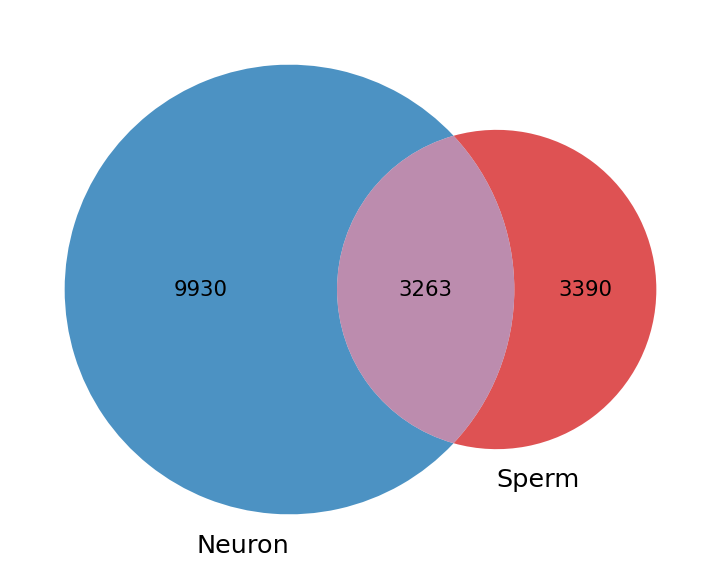

In [8]:
#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(3,1))
g = venn2([set(neuron_proteome.uniprot),  set(sperm_proteome.uniprot)], 
          set_labels = ('Neuron', 'Sperm'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'tab:red'),
          # ax=ax1
         )

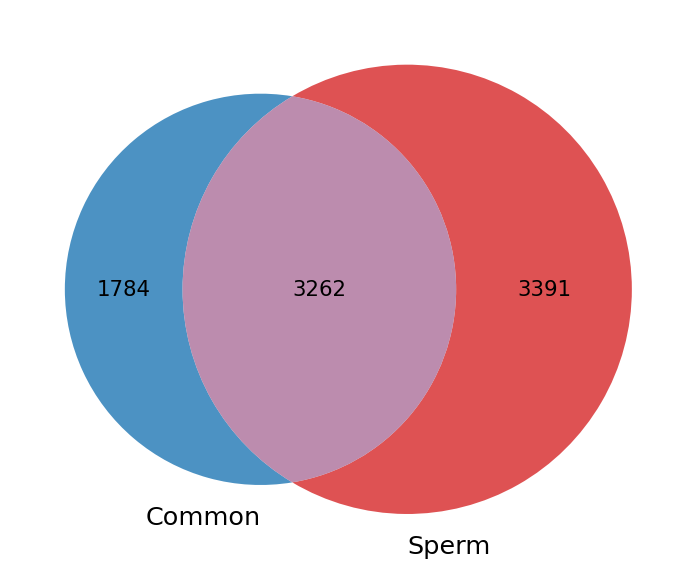

In [9]:
g = venn2([set(common_proteome.uniprot),  set(sperm_proteome.uniprot)], 
          set_labels = ('Common', 'Sperm'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'tab:red'),
          # ax=ax1
         )

In [10]:
3262 + 1784

5046

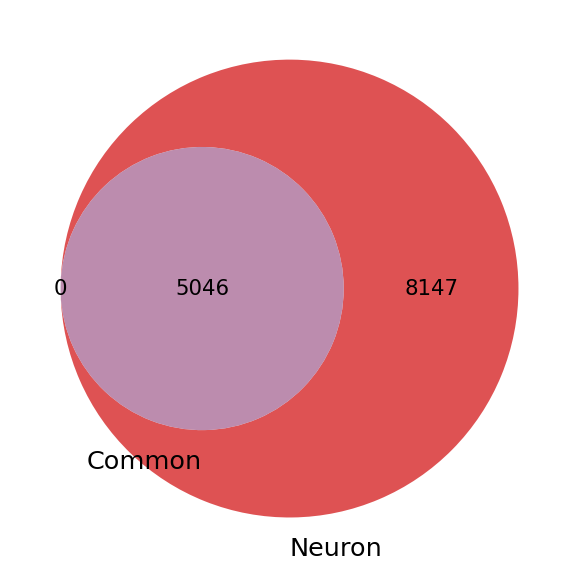

In [11]:
g = venn2([set(common_proteome.uniprot),  set(neuron_proteome.uniprot)], 
          set_labels = ('Common', 'Neuron'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'tab:red'),
          # ax=ax1
         )

/home/kmt/miniconda3/envs/xy-deg/lib/python3.10/site-packages/matplotlib_venn/_venn3.py:117: UserWarning: Bad circle positioning
  warnings.warn("Bad circle positioning")


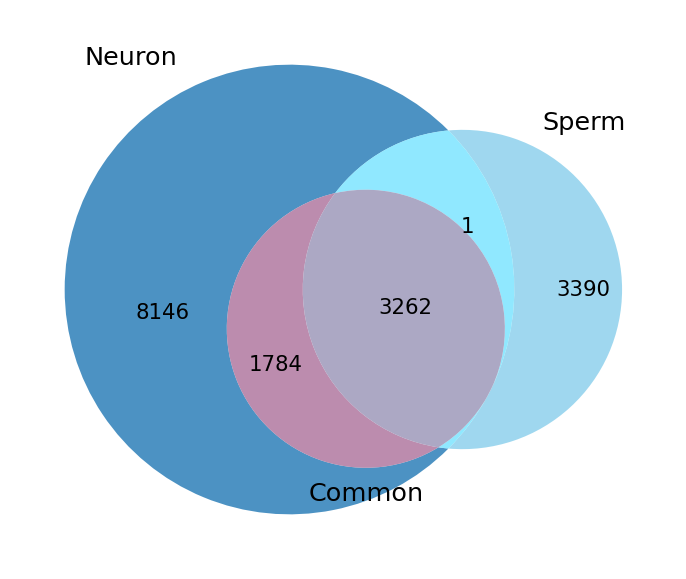

In [12]:
g = venn3([set(neuron_proteome.uniprot),  set(sperm_proteome.uniprot), set(common_proteome.uniprot)], 
          set_labels = ('Neuron', 'Sperm', 'Common'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'skyblue', 'tab:red'),
         )

# from scipy import stats
# stats.binom_test(5, n=15, p=0.01, alternative='greater')

In [13]:
def ensembl2symbol(ensembl_id):
    server = "https://rest.ensembl.org"
    ext = f"/xrefs/id/{ensembl_id}?"
    r = requests.get(server+ext, headers={ "Content-Type" : "application/json"})
    if not r.ok:
        r.raise_for_status()
    decoded = r.json()
    symbols = [x['display_id'] for x in decoded if x['dbname'] == 'HGNC']
    if not len(symbols) == 1:
        raise NotFound
    return symbols[0]

def any2ensembl(any_id):
    server = "https://rest.ensembl.org"
    ext = f"/xrefs/symbol/homo_sapiens/{any_id}?"
    r = requests.get(server+ext, headers={ "Content-Type" : "application/json"})
    if not r.ok:
        r.raise_for_status()
    decoded = r.json()
    symbols = [x['id'] for x in decoded if x['type'] == 'gene']
    if not len(symbols) == 1:
        raise NotFound
    return symbols[0]

def any2symbol(any_id):
    ens = any2ensembl(any_id)
    return ensembl2symbol(ens)

In [14]:
# single_hgnc_symbols = []
# not_found = 0
# chrom, start, end = [], [], []
# for uniprot in tqdm(common_proteome.uniprot):
#     try:
#         sym = any2symbol(uniprot)
#         info = gi.mygene_get_gene_info(sym)
#         chrom.append(info['genomic_pos']['chr'])
#         start.append(info['genomic_pos']['start'])
#         end.append(info['genomic_pos']['end'])
#     except Exception as e:
#         sym = np.nan
#         not_found += 1
#     single_hgnc_symbols.append(sym)

# print(not_found)    

# common_proteome['symbol'] = single_hgnc_symbols
# common_proteome['chrom'] = chrom
# common_proteome['start'] = start
# common_proteome['end'] = end
# common_proteome.to_hdf('../results/common_proteome.h5', 'df')

In [15]:
prot_genes_df = pd.read_table('../data/genenames/gene_with_protein_product.txt', sep='\t', low_memory=False)
prot_genes_df.columns

Index(['hgnc_id', 'symbol', 'name', 'locus_group', 'locus_type', 'status',
       'location', 'location_sortable', 'alias_symbol', 'alias_name',
       'prev_symbol', 'prev_name', 'gene_group', 'gene_group_id',
       'date_approved_reserved', 'date_symbol_changed', 'date_name_changed',
       'date_modified', 'entrez_id', 'ensembl_gene_id', 'vega_id', 'ucsc_id',
       'ena', 'refseq_accession', 'ccds_id', 'uniprot_ids', 'pubmed_id',
       'mgd_id', 'rgd_id', 'lsdb', 'cosmic', 'omim_id', 'mirbase', 'homeodb',
       'snornabase', 'bioparadigms_slc', 'orphanet', 'pseudogene.org',
       'horde_id', 'merops', 'imgt', 'iuphar', 'kznf_gene_catalog',
       'mamit-trnadb', 'cd', 'lncrnadb', 'enzyme_id',
       'intermediate_filament_db', 'rna_central_ids', 'lncipedia', 'gtrnadb',
       'agr', 'mane_select', 'gencc'],
      dtype='object')

In [16]:
df = neuron_proteome.merge(prot_genes_df, left_on='uniprot', right_on='uniprot_ids', how='left')

In [17]:
lst = []
for i in list(range(1, 23)) + ['X', 'Y']:    
    chrom = f'chr{i}'
    lst.append(gi.get_genes_region_dataframe(chrom, 0, 400000000, assembly='hg38').drop_duplicates('name').assign(chrom=chrom))
all_genes = pd.concat(lst)

In [18]:
neuron_prot_df = df.merge(all_genes, left_on='symbol', right_on='name', how='left')
neuron_prot_df['sperm_shared'] = neuron_prot_df.uniprot.isin(common_proteome.uniprot)
neuron_prot_df = neuron_prot_df[['symbol', 'uniprot', 'sperm_shared', 'chrom', 'start', 'end']]
neuron_prot_df.to_hdf('../results/common_df.h5', 'df')
neuron_prot_df.head()

/scratch/22135329/ipykernel_2765170/2362678594.py:4: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block0_values] [items->Index(['symbol', 'uniprot', 'chrom'], dtype='object')]

  neuron_prot_df.to_hdf('../results/common_df.h5', 'df')


,symbol,uniprot,sperm_shared,chrom,start,end
0,NBPF19,A0A087WUL8,False,chr1,149475044.0,149556361.0
1,TBC1D3D,A0A087WVF3,False,chr17,38002321.0,38014908.0
2,UQCRHL,A0A096LP55,False,chr1,15807373.0,15807649.0
3,PIGBOS1,A0A0B4J2F0,False,chr15,55317183.0,55319123.0
4,TINCR,A0A2R8Y7D0,False,chr19,5558166.0,5567953.0


In [19]:
neuron = set(neuron_prot_df.symbol)
common = set(neuron_prot_df.loc[neuron_prot_df.sperm_shared, 'symbol'])
x = set(neuron_prot_df.loc[neuron_prot_df.chrom == 'chrX', 'symbol'])

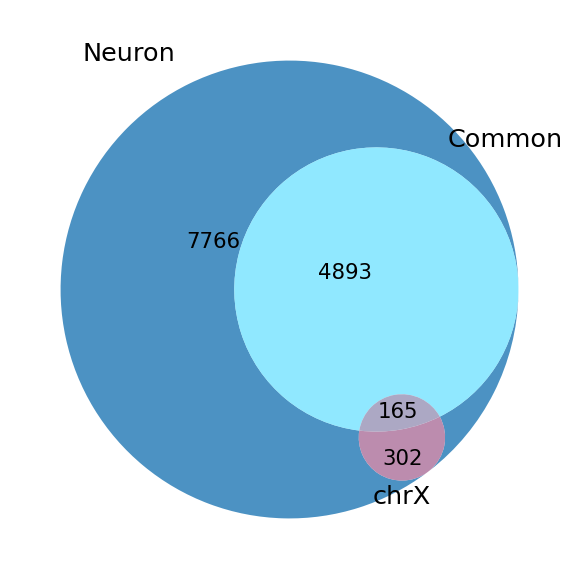

In [20]:
g = venn3([neuron, common, x], 
          set_labels = ('Neuron', 'Common', 'chrX'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'skyblue', 'tab:red'),
         )

In [21]:
print('non-X sperm/neuron genes:', (4893) / (4893 + 7766))

non-X sperm/neuron genes: 0.3865234220712537


In [22]:
print('X sperm/neuron genes:', 165 / (165 + 302))

X sperm/neuron genes: 0.3533190578158458


In [23]:
print('X neuron genes:', neuron_prot_df.loc[neuron_prot_df.chrom == 'chrX'].index.size)

X neuron genes: 467


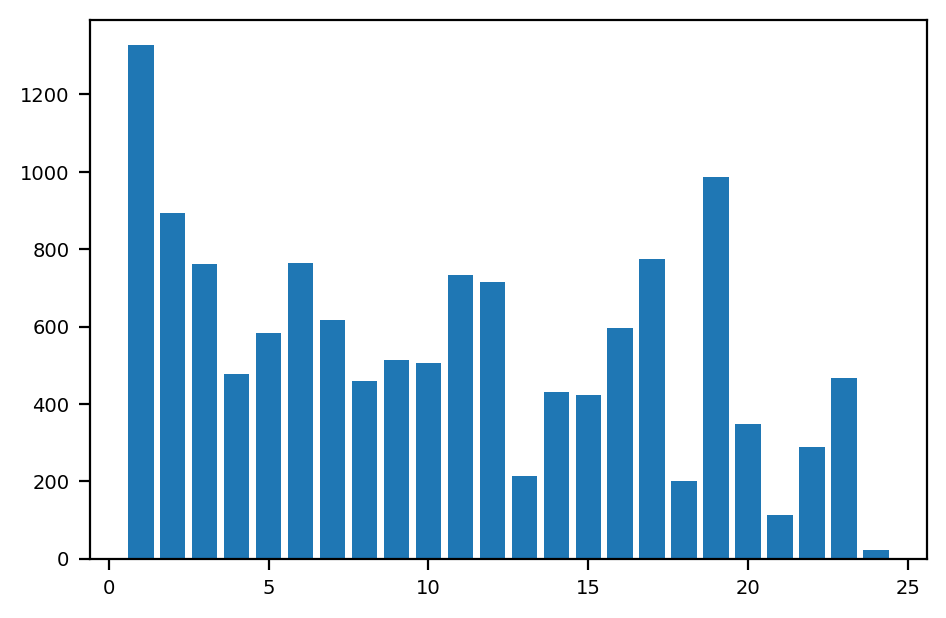

In [24]:
l = [neuron_prot_df.loc[neuron_prot_df.chrom == f'chr{i}'].index.size for i in list(range(1, 23)) + ['X', 'Y']]
plt.bar(list(range(1, 25)), l) ;

In [25]:
sfari_genes = pd.read_csv('../data/SFARI-Gene_genes_05-05-2022release_06-27-2022export.csv')
sfari_genes.head()

,status,gene-symbol,gene-name,ensembl-id,chromosome,genetic-category,gene-score,syndromic,number-of-reports
0,9,ABAT,4-aminobutyrate aminotransferase,ENSG00000183044,16,"Rare Single Gene Mutation, Genetic Association",2.0,0,6
1,9,ABCA10,"ATP-binding cassette, sub-family A (ABC1), mem...",ENSG00000154263,17,Rare Single Gene Mutation,2.0,0,1
2,9,ABCA13,ATP binding cassette subfamily A member 13,ENSG00000179869,7,"Rare Single Gene Mutation, Functional",2.0,0,7
3,9,ABCA7,"ATP-binding cassette, sub-family A (ABC1), mem...",ENSG00000064687,19,Rare Single Gene Mutation,2.0,0,4
4,9,ACE,angiotensin I converting enzyme,ENSG00000159640,17,"Rare Single Gene Mutation, Genetic Association",2.0,0,3


In [26]:
neuron_prot_df['sfari'] = neuron_prot_df.symbol.isin(sfari_genes['gene-symbol'])

In [27]:
sfari = set(neuron_prot_df.loc[neuron_prot_df.sfari, 'symbol'])

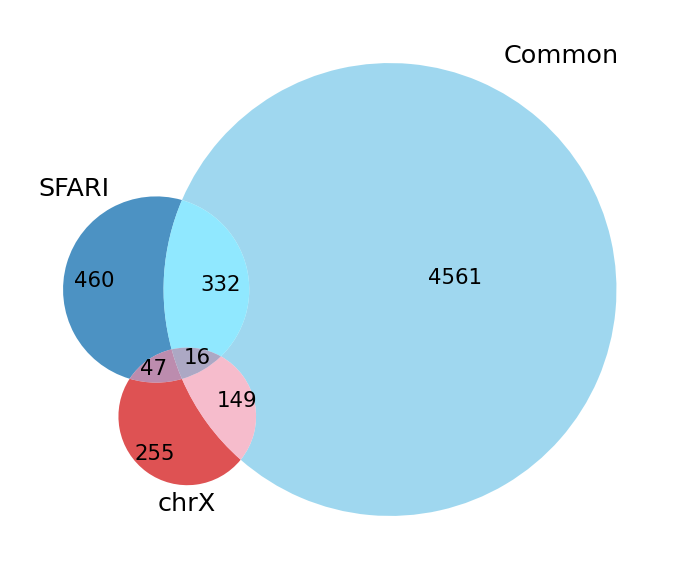

In [28]:
g = venn3([sfari, common, x], 
          set_labels = ('SFARI', 'Common', 'chrX'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'skyblue', 'tab:red'),
         )

In [29]:
16 / (16 + 149), 332 / (332 + 4561)

(0.09696969696969697, 0.06785203351726957)

In [30]:
# for name in sorted(neuron_prot_df.loc[neuron_prot_df.sperm_shared & (neuron_prot_df.chrom == 'chrX'), 'symbol'].tolist()):
#     print(name)

In [31]:
neuron_prot_df.loc[(neuron_prot_df.chrom == 'chrX'), 'symbol'].index.size#tolist()

467

In [32]:
#! wget -nv -O geneinfo_cache/gene2go.gz https://ftp.ncbi.nlm.nih.gov/gene/DATA/gene2go.gz

In [33]:
#ftp://ftp.ncbi.nlm.nih.gov/gene/DATA/gene2go.gz

In [34]:
common_symbols = neuron_prot_df.loc[neuron_prot_df.sperm_shared & (neuron_prot_df.chrom == 'chrX'), 'symbol'].tolist()

neuron_symbols = neuron_prot_df.loc[neuron_prot_df.chrom == 'chrX', 'symbol'].tolist()

In [35]:
go_results = gi.go_enrichment(common_symbols, 
                              background_genes=neuron_symbols,
                              list_study_genes=True)
go_results

,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes
0,CC,GO:0005829,e,7.532026e-07,0.000336,0.484848,0.336188,<GO:0005829>,"[ABCD1, ARAF, ARHGAP4, ARHGAP6, ATP7A, CETN2, ..."
1,CC,GO:0070062,e,1.621330e-06,0.000362,0.175758,0.087794,<GO:0070062>,"[SHROOM2, ATP6AP1, BGN, DDX3X, EIF2S3, FLNA, G..."
2,CC,GO:0000785,p,1.003927e-04,0.014925,0.000000,0.047109,<GO:0000785>,[]


In [36]:
cytosol = go_results.loc[go_results.term_id == 'GO:0005829', 'study_genes'].tolist()[0]

In [37]:
external_exosome = go_results.loc[go_results.term_id == 'GO:0070062', 'study_genes'].tolist()[0]

In [38]:
for tup in go_results.itertuples():
    print(tup.term_id)
    # for gene in tup.study_genes:
    #     print(gene)
    if tup.study_genes:
        list_genes(tup.study_genes)

GO:0005829
ABCD1     HPRT1     PUDP      MAGED2    
ARAF      IGBP1     AKAP17A   WDR45     
ARHGAP4   IRAK1     USP11     GSPT2     
ARHGAP6   MSN       USP9X     SH3KBP1   
ATP7A     CDK16     SMC1A     WDR44     
CETN2     PGK1      NAA10     GNL3L     
CLCN5     PHKA1     TKTL1     TBC1D8B   
DCX       PHKA2     CUL4B     GEMIN8    
DDX3X     PLS3      OGT       HAUS7     
DIAPH2    PPEF1     OFD1      CTPS2     
DMD       PRPS1     ASMTL     GRIPAP1   
EIF1AX    PSMD10    AIFM1     RAP2C     
EIF2S3    RBBP7     REPS2     APOO      
EMD       RPL10     RAB9A     BRCC3     
FHL1      RPS4X     ARHGEF6   SYAP1     
FLNA      RPS6KA3   HDAC6     GPRASP2   
FMR1      SAT1      HUWE1     AMOT      
G6PD      SMS       BCAP31              
GDI1      TMSB4X    ADGRG2              
GK        UBA1      ENOX2               
HNRNPH2   VBP1      PRDX4               
GO:0070062
SHROOM2     PGK1        ATP6AP2     
ATP6AP1     RPS4X       PRDX4       
BGN         SMS         C1GALT1C1   
DDX3X 

In [39]:
gi.go_info(go_results.term_id)

**<span style="color:gray;">GO:0005829:</span>** **cytosol**  
 The part of the cytoplasm that does not contain organelles but which does contain other particulate matter, such as protein complexes.    

 ----

**<span style="color:gray;">GO:0070062:</span>** **extracellular exosome**  
 A vesicle that is released into the extracellular region by fusion of the limiting endosomal membrane of a multivesicular body with the plasma membrane. Extracellular exosomes, also simply called exosomes, have a diameter of about 40-100 nm.    

 ----

**<span style="color:gray;">GO:0000785:</span>** **chromatin**  
 The ordered and organized complex of DNA, protein, and sometimes RNA, that forms the chromosome.    

 ----

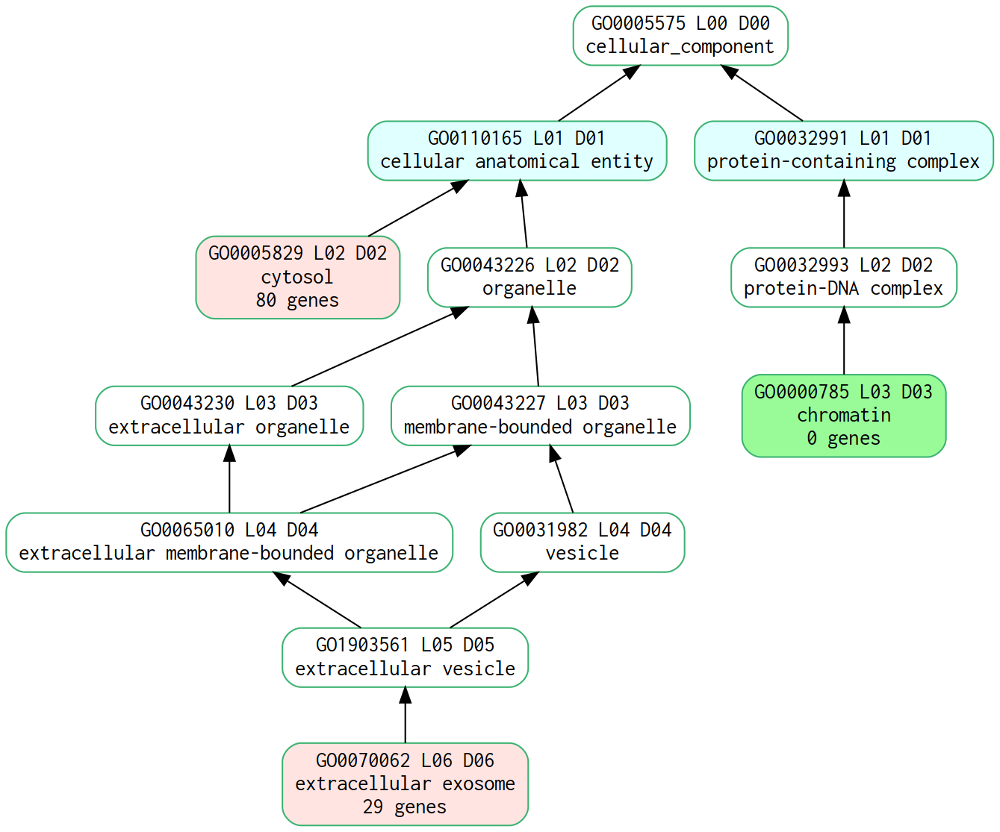

In [40]:
gi.show_go_dag_enrichment_results(go_results.obj)


In [41]:
gi.go_info(go_results.term_id)


**<span style="color:gray;">GO:0005829:</span>** **cytosol**  
 The part of the cytoplasm that does not contain organelles but which does contain other particulate matter, such as protein complexes.    

 ----

**<span style="color:gray;">GO:0070062:</span>** **extracellular exosome**  
 A vesicle that is released into the extracellular region by fusion of the limiting endosomal membrane of a multivesicular body with the plasma membrane. Extracellular exosomes, also simply called exosomes, have a diameter of about 40-100 nm.    

 ----

**<span style="color:gray;">GO:0000785:</span>** **chromatin**  
 The ordered and organized complex of DNA, protein, and sometimes RNA, that forms the chromosome.    

 ----

# Gene sets from Google sheet

In [42]:
SHEET_ID = '1JSjSLuto3jqdEnnG7JqzeC_1pUZw76n7XueVAYrUOpk'
SHEET_NAME = 'Sheet1'
url = f'https://docs.google.com/spreadsheets/d/{SHEET_ID}/gviz/tq?tqx=out:csv&sheet={SHEET_NAME}'
df = pd.read_csv(url, header=1)
df.head()

,all_npx,neuron_genome_proteome,neuron_npx_proteome,matos_neuron,matos_common,Unnamed: 5,Unnamed: 6,all_post_mei_expr,msci,msci_esc,...,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50
0,ABCB7,A1BG,ABCB7,ABCB7,ABCB7,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ABCD1,A1CF,ABCD1,ABCD1,ABCD1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ACE2,A2M,ACOT9,ACOT9,ACOT9,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ACE2-DT,AAAS,ACSL4,ACSL4,ADGRG2,cytosol,extracellular exosome,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ACOT9,AACS,ADGRG2,ADGRG2,ADGRG4,ABCD1,ADGRG2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
def read_google_sheet():
    SHEET_ID = '1JSjSLuto3jqdEnnG7JqzeC_1pUZw76n7XueVAYrUOpk'
    SHEET_NAME = 'Sheet1'
    url = f'https://docs.google.com/spreadsheets/d/{SHEET_ID}/gviz/tq?tqx=out:csv&sheet={SHEET_NAME}'
    df = pd.read_csv(url, header=1)
    return df.loc[:, [not x.startswith('Unnamed') for x in df.columns]]
    
def gene_list_names():
    df = read_google_sheet()
    return sorted(df.columns.tolist())

def gene_list(name):
    df = read_google_sheet()
    sr = df[name]
    return sr[~sr.isnull()].tolist()
    
gene_list_names()

['accel_reg_simiiformes_br',
 'all_npx',
 'all_post_mei_expr',
 'cDEG',
 'candidates',
 'ech75_regions',
 'expr_mod_xi_copynr_fibrobl',
 'expr_mod_xi_copynr_lcl',
 'gametologs',
 'intelect_disabil',
 'matos_common',
 'matos_neuron',
 'msci',
 'msci_esc',
 'my_primate_codeml',
 'nDEG',
 'neuron_genome_proteome',
 'neuron_npx_proteome',
 'primate_ampl_multi',
 'reg_sa_pheno',
 'sfari_all_conf',
 'xi',
 'xi_any_evidence',
 'xi_escape',
 'xi_uncertain']

List of X genes differentially expressed in whole cells:

In [44]:
gametologs = gene_list('gametologs')
list_genes(gametologs)

AKAP17AX   MXRA5X     TGIF2LX    
AMELX      NLGN4X     THOC2X     
ASMTX      P2RY8X     TMSB4X     
BCORX      PCDH11X    TSPX       
CCNQX      PRKX       TXLNGX     
DDX3X      PRPS2X     UBA1X      
DHRSX      RBMX       USP9X      
EIF1AX     RPL10X     UTY        
EIF2S3X    RPL36AX    VCX        
HSFX       RPS4X      XKRX       
KDM5C      SOX3       ZBED1X     
KDM5D      SPANXNX    ZFX        
KDM6A      SRY                   
MBTPS2X    TAB3X                 
MSL3X      TBL1X                 


In [45]:
genes_nucleus_de_x = gene_list('nDEG')
list_genes(genes_nucleus_de_x)

AFF2                                             HMGB3                                            PIM2                                             
AKAP14                                           HNRNPH2                                          PNMA6E                                           
ALG13                                            HTR2C                                            PPEF1                                            
amplicon-chrX-BIG-FAMILY-B                       HUWE1                                            PPP1R2C                                          
amplicon-chrX-CPXCR1                             IDH3G                                            PRICKLE3                                         
amplicon-chrX-CXorf49/B                          IDS2                                             PTCHD1                                           
amplicon-chrX-CXorf51A/B                         IGBP1                                            PTCHD1-AS     

In [46]:
genes_whole_cell_de_x = gene_list('cDEG')
list_genes(genes_whole_cell_de_x)

AFF2                LOC105373313        
CDKL5               OCRL                
DIAPH2              PABIR3              
EIF1AX              PDK3                
FHL1                PHF8                
HDAC6               PPEF1               
HTR2C               PRDX4               
HUWE1               PRICKLE3            
IGBP1               RPGR                
IQSEC2              SRPX2               
LL0XNC01-250H12.3   SYP                 
LOC105373184        UPF3B               


In [47]:
escapes_xi = gene_list('xi_escape')
list_genes(escapes_xi)

AFF2      FUNDC1    MXRA5     SMC1A     
AKAP17A   GEMIN8    NAA10     SRPX      
ALG13     GPR173    NHS       STK26     
AP1S2     GPR174    NHSL2     STS       
ARSD      GTPBP6    OFD1      SYAP1     
ASMTL     GYG2      P2RY10    TASL      
CA5B      HCFC1     P2RY8     TCEAL9    
CD99      HEPH      PDZD11    TCEANC    
CDK16     HMGN5     PHKA1     TRAPPC2   
CDR1      HUWE1     PLCXD1    TXLNG     
CHM       IKBKG     PNPLA4    UBA1      
COX7B     IL3RA     PORCN     UBQLN2    
CXorf38   IQSEC2    PPP2R3B   USP9X     
CXorf65   JPX       PQBP1     WAS       
DDX3X     KDM5C     PRKX      XG        
DHRSX     KDM6A     PUDP      XIST      
EFNB1     LRCH2     RAB9A     XPNPEP2   
EIF1AX    MAGEE1    RBBP7     ZBED1     
EIF2S3    MAMLD1    RPS4X     ZFX       
FGF13     MAP7D2    SCML2     ZRSR2     
FHL1      MED14     SEPTIN6             
FOXO4     MSL3      SLC25A6             


In [ ]:
xi_uncertain = gene_list('xi_uncertain')
list_genes(xi_uncertain)

In [ ]:
accel_reg_simiiformes_br = gene_list('accel_reg_simiiformes_br')
list_genes(accel_reg_simiiformes_br)

In [ ]:
set(escapes_xi).intersection(set(genes_whole_cell_de_x))


# overlaps


TO:

- cDEG
- Xi
- Simiformes branch
- 

In [ ]:
from scipy.stats import fisher_exact

def fisher_exact_overlap(test, background, overlap):
    a, b, c = set(test), set(background), set(overlap)
    assert a == a.intersection(b) # a must be nested in                    
        
    table = np.array([[len(a.intersection(c)),               len(a.difference(c))],  # a
                      [len(b.difference(a).intersection(c)), len(b.difference(a).difference(c))]]) # (not a)
                    #  c                                not c
    print(table)
    return fisher_exact(table, alternative='two-sided')    

In [ ]:
fisher_exact_overlap(common_symbols, neuron_symbols, genes_whole_cell_de_x)    

In [ ]:
fisher_exact_overlap(common_symbols, neuron_symbols, escapes_xi)    

In [ ]:
fisher_exact_overlap(common_symbols, neuron_symbols, accel_reg_simiiformes_br)    

# Bingo

In [ ]:
fisher_exact_overlap(cytosol, neuron_symbols, genes_whole_cell_de_x)    

In [ ]:
fisher_exact_overlap(cytosol, common_symbols, genes_whole_cell_de_x)    

In [ ]:
fisher_exact_overlap(cytosol, neuron_symbols, escapes_xi)    

In [ ]:
fisher_exact_overlap(cytosol, common_symbols, escapes_xi)    

In [ ]:
fisher_exact_overlap(cytosol, neuron_symbols, accel_reg_simiiformes_br)    

# Exploration of Meritxell's expression data

In [6]:
def base64_img(data=None, width=600, height=300):
    if not data:
        print('https://www.base64-image.de/')
        return
    from IPython import display
    from base64 import b64decode
    return display.Image(b64decode(data.split('base64,')[1]), width=width, height=height)

In [7]:
base64_img()

https://www.base64-image.de/


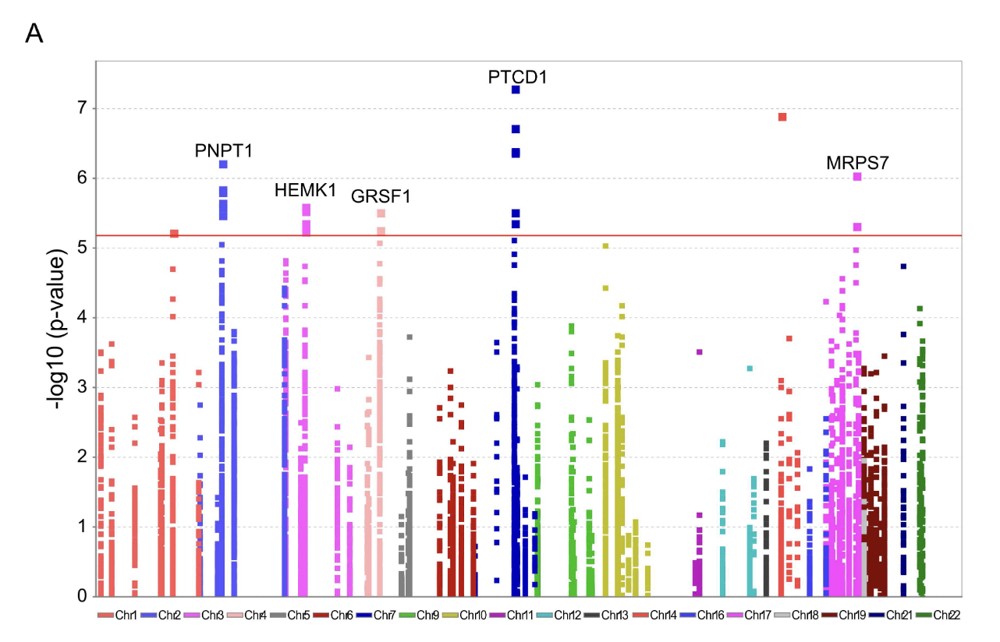

In [11]:
base64_img("data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABQIAAAM4CAYAAACX6J8wAAAMPmlDQ1BJQ0MgUHJvZmlsZQAASImVVwdYU8kWnluSkEBoAQSkhN4EkRpASggt9N5EJSQBQokxEFTs6KKCaxcL2NBVEQUrzYIidhbF3hcLKsq6WLArb1JA133le+f75t7//nPmP2fOnVsGALXjHJEoD1UHIF9YKI4N9qcnp6TSSU8BAgiACgwAzuEWiJjR0eEA2tD57/buOvSGdsVeqvXP/v9qGjx+ARcAJBriDF4BNx/igwDgVVyRuBAAopQ3m1IokmLYgJYYJgjxQinOkuMqKc6Q470yn/hYFsTtACipcDjiLABUL0GeXsTNghqq/RA7CnkCIQBqdIh98vMn8SBOh9ga+oggluozMn7QyfqbZsawJoeTNYzlc5GZUoCgQJTHmfZ/luN/W36eZCiGJWwq2eKQWOmcYd1u5k4Kk2IViPuEGZFREGtC/EHAk/lDjFKyJSEJcn/UgFvAgjUDOhA78jgBYRAbQBwkzIsMV/AZmYIgNsRwhaBTBYXseIh1IV7ILwiMU/hsFk+KVcRCGzLFLKaCP8sRy+JKY92X5CYwFfqvs/lshT6mWpwdnwQxBWLzIkFiJMSqEDsU5MaFKXzGFmezIod8xJJYaf7mEMfyhcH+cn2sKFMcFKvwL8svGJovtjlbwI5U4P2F2fEh8vpg7VyOLH84F+wSX8hMGNLhFySHD82Fxw8IlM8de8YXJsQpdD6ICv1j5WNxiigvWuGPm/LzgqW8KcQuBUVxirF4YiFckHJ9PFNUGB0vzxMvzuGERsvzwZeBcMACAYAOJLBlgEkgBwg6+xr74JW8JwhwgBhkAT6wVzBDI5JkPUJ4jAPF4E+I+KBgeJy/rJcPiiD/dZiVH+1Bpqy3SDYiFzyBOB+EgTx4LZGNEg5HSwSPISP4R3QObFyYbx5s0v5/zw+x3xkmZMIVjGQoIl1tyJMYSAwghhCDiDa4Pu6De+Hh8OgHmxPOwD2G5vHdn/CE0EV4SLhG6CbcmigoEf+UZQTohvpBilpk/FgL3BJquuL+uDdUh8q4Dq4P7HEXGIeJ+8LIrpBlKfKWVoX+k/bfZvDD3VD4kR3JKHkE2Y9s/fNIVVtV12EVaa1/rI8814zherOGe36Oz/qh+jx4DvvZE1uIHcDOYCewc9gRrBHQsVasCevAjkrx8Op6LFtdQ9FiZfnkQh3BP+IN3VlpJQscax17Hb/I+wr5U6XvaMCaJJomFmRlF9KZ8IvAp7OFXIdRdCdHJ2cApN8X+evrTYzsu4HodHzn5v0BgHfr4ODg4e9caCsA+9zh49/8nbNmwE+HMgBnm7kScZGcw6UHAnxLqMEnTQ8YATNgDefjBNyAF/ADgSAURIF4kAImwOyz4ToXgylgBpgLSkE5WAZWg/VgE9gKdoI9YD9oBEfACXAaXACXwDVwB66eHvAC9IN34DOCICSEitAQPcQYsUDsECeEgfgggUg4EoukIOlIFiJEJMgMZB5SjqxA1iNbkBpkH9KMnEDOIV3ILeQB0ou8Rj6hGKqCaqGGqCU6GmWgTDQMjUfHo1noZLQYnY8uQdei1ehutAE9gV5Ar6Hd6At0AAOYMqaDmWD2GANjYVFYKpaJibFZWBlWgVVjdVgLvM9XsG6sD/uIE3EaTsft4QoOwRNwLj4Zn4UvxtfjO/EGvB2/gj/A+/FvBCrBgGBH8CSwCcmELMIUQimhgrCdcIhwCj5LPYR3RCJRh2hFdIfPYgoxhziduJi4gVhPPE7sIj4iDpBIJD2SHcmbFEXikApJpaR1pN2kVtJlUg/pg5KykrGSk1KQUqqSUKlEqUJpl9IxpctKT5U+k9XJFmRPchSZR55GXkreRm4hXyT3kD9TNChWFG9KPCWHMpeyllJHOUW5S3mjrKxsquyhHKMsUJ6jvFZ5r/JZ5QfKH1U0VWxVWCppKhKVJSo7VI6r3FJ5Q6VSLal+1FRqIXUJtYZ6knqf+kGVpuqgylblqc5WrVRtUL2s+lKNrGahxlSboFasVqF2QO2iWp86Wd1SnaXOUZ+lXqnerH5DfUCDpjFGI0ojX2Oxxi6NcxrPNEmalpqBmjzN+ZpbNU9qPqJhNDMai8alzaNto52i9WgRtay02Fo5WuVae7Q6tfq1NbVdtBO1p2pXah/V7tbBdCx12Dp5Okt19utc1/k0wnAEcwR/xKIRdSMuj3ivO1LXT5evW6Zbr3tN95MeXS9QL1dvuV6j3j19XN9WP0Z/iv5G/VP6fSO1RnqN5I4sG7l/5G0D1MDWINZgusFWgw6DAUMjw2BDkeE6w5OGfUY6Rn5GOUarjI4Z9RrTjH2MBcarjFuNn9O16Ux6Hn0tvZ3eb2JgEmIiMdli0mny2dTKNMG0xLTe9J4ZxYxhlmm2yqzNrN/c2DzCfIZ5rfltC7IFwyLbYo3FGYv3llaWSZYLLBstn1npWrGtiq1qre5aU619rSdbV1tftSHaMGxybTbYXLJFbV1ts20rbS/aoXZudgK7DXZdowijPEYJR1WPumGvYs+0L7KvtX/goOMQ7lDi0OjwcrT56NTRy0efGf3N0dUxz3Gb450xmmNCx5SMaRnz2snWietU6XTVmeoc5Dzbucn5lYudC99lo8tNV5prhOsC1zbXr27ubmK3Orded3P3dPcq9xsMLUY0YzHjrAfBw99jtscRj4+ebp6Fnvs9//Ky98r12uX1bKzVWP7YbWMfeZt6c7y3eHf70H3SfTb7dPua+HJ8q30f+pn58fy2+z1l2jBzmLuZL/0d/cX+h/zfszxZM1nHA7CA4ICygM5AzcCEwPWB94NMg7KCaoP6g12DpwcfDyGEhIUsD7nBNmRz2TXs/lD30Jmh7WEqYXFh68MehtuGi8NbItCI0IiVEXcjLSKFkY1RIIodtTLqXrRV9OTowzHEmOiYypgnsWNiZ8SeiaPFTYzbFfcu3j9+afydBOsESUJbolpiWmJN4vukgKQVSd3Jo5NnJl9I0U8RpDSlklITU7enDowLHLd6XE+aa1pp2vXxVuOnjj83QX9C3oSjE9UmciYeSCekJ6XvSv/CieJUcwYy2BlVGf1cFncN9wXPj7eK18v35q/gP830zlyR+SzLO2tlVm+2b3ZFdp+AJVgveJUTkrMp531uVO6O3MG8pLz6fKX89PxmoaYwV9g+yWjS1EldIjtRqah7sufk1ZP7xWHi7QVIwfiCpkIt+CPfIbGW/CJ5UORTVFn0YUrilANTNaYKp3ZMs522aNrT4qDi36bj07nT22aYzJg748FM5swts5BZGbPaZpvNnj+7Z07wnJ1zKXNz5/5e4liyouTtvKR5LfMN58+Z/+iX4F9qS1VLxaU3Fngt2LQQXyhY2LnIedG6Rd/KeGXnyx3LK8q/LOYuPv/rmF/X/jq4JHNJ51K3pRuXEZcJl11f7rt85wqNFcUrHq2MWNmwir6qbNXb1RNXn6twqdi0hrJGsqZ7bfjapnXm65at+7I+e/21Sv/K+iqDqkVV7zfwNlze6LexbpPhpvJNnzYLNt/cErylodqyumIrcWvR1ifbEred+Y3xW812/e3l27/uEO7o3hm7s73GvaZml8GupbVoraS2d3fa7kt7AvY01dnXbanXqS/fC/ZK9j7fl77v+v6w/W0HGAfqDlocrDpEO1TWgDRMa+hvzG7sbkpp6moObW5r8Wo5dNjh8I4jJkcqj2ofXXqMcmz+scHW4taB46LjfSeyTjxqm9h252TyyavtMe2dp8JOnT0ddPrkGeaZ1rPeZ4+c8zzXfJ5xvvGC24WGDteOQ7+7/n6o062z4aL7xaZLHpdausZ2Hbvse/nElYArp6+yr164Fnmt63rC9Zs30m503+TdfHYr79ar20W3P9+Zc5dwt+ye+r2K+wb3q/+w+aO+26376IOABx0P4x7eecR99OJxweMvPfOfUJ9UPDV+WvPM6dmR3qDeS8/HPe95IXrxua/0T40/q15avzz4l99fHf3J/T2vxK8GXy9+o/dmx1uXt20D0QP33+W/+/y+7IPeh50fGR/PfEr69PTzlC+kL2u/2nxt+Rb27e5g/uCgiCPmyH4FMNjQzEwAXu8AgJoCAA3uzyjj5Ps/mSHyPasMgf+E5XtEmbkBUAf/32P64N/NDQD2boPbL6ivlgZANBWAeA+AOjsPt6G9mmxfKTUi3Adsjv6akZ8B/o3J95w/5P3zGUhVXcDP538BkLR8PRWmp/IAAACKZVhJZk1NACoAAAAIAAQBGgAFAAAAAQAAAD4BGwAFAAAAAQAAAEYBKAADAAAAAQACAACHaQAEAAAAAQAAAE4AAAAAAAAAkAAAAAEAAACQAAAAAQADkoYABwAAABIAAAB4oAIABAAAAAEAAAUCoAMABAAAAAEAAAM4AAAAAEFTQ0lJAAAAU2NyZWVuc2hvdG8zHbsAAAAJcEhZcwAAFiUAABYlAUlSJPAAAAHXaVRYdFhNTDpjb20uYWRvYmUueG1wAAAAAAA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJYTVAgQ29yZSA2LjAuMCI+CiAgIDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+CiAgICAgIDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiCiAgICAgICAgICAgIHhtbG5zOmV4aWY9Imh0dHA6Ly9ucy5hZG9iZS5jb20vZXhpZi8xLjAvIj4KICAgICAgICAgPGV4aWY6UGl4ZWxZRGltZW5zaW9uPjgyNDwvZXhpZjpQaXhlbFlEaW1lbnNpb24+CiAgICAgICAgIDxleGlmOlBpeGVsWERpbWVuc2lvbj4xMjgyPC9leGlmOlBpeGVsWERpbWVuc2lvbj4KICAgICAgICAgPGV4aWY6VXNlckNvbW1lbnQ+U2NyZWVuc2hvdDwvZXhpZjpVc2VyQ29tbWVudD4KICAgICAgPC9yZGY6RGVzY3JpcHRpb24+CiAgIDwvcmRmOlJERj4KPC94OnhtcG1ldGE+Cs00KSgAAAAcaURPVAAAAAIAAAAAAAABnAAAACgAAAGcAAABnAABWOLN98avAABAAElEQVR4Aey9CYBdVZW2vWrIDIEwKqDMgqKACIoCfijIJLaMKkoaBdRf+UBBbBxoh3bo1paWz24RxJFuEVFEEAEbcUCgoRUFRBSECIhMIZCQkLGG/zybXtWHm5tKVapSqct9Ntw65+y91tprP2eoW2/2OaejvyphkYAEJCABCUhAAhKQgAQkIAEJSEACEpCABJ7RBDoUAp/R+9fBSUACEpCABCQgAQlIQAISkIAEJCABCUigEFAI9ECQgAQkIAEJSEACEpCABCQgAQlIQAISkEAbEFAIbIOd7BAlIAEJSEACEpCABCQgAQlIQAISkIAEJKAQ6DEgAQlIQAISkIAEJCABCUhAAhKQgAQkIIE2IKAQ2AY72SFKQAISkIAEJCABCUhAAhKQgAQkIAEJSEAh0GNAAhKQgAQkIAEJSEACEpCABCQgAQlIQAJtQEAhsA12skOUgAQkIAEJSEACEpCABCQgAQlIQAISkIBCoMeABCQgAQlIQAISkIAEJCABCUhAAhKQgATagIBCYBvsZIcoAQlIQAISkIAEJCABCUhAAhKQgAQkIAGFQI8BCUhAAhKQgAQkIAEJSEACEpCABCQgAQm0AQGFwDbYyQ5RAhKQgAQkIAEJSEACEpCABCQgAQlIQAIKgR4DEpCABCQgAQlIQAISkIAEJCABCUhAAhJoAwIKgW2wkx2iBCQgAQlIQAISkIAEJCABCUhAAhKQgAQUAj0GJCABCUhAAhKQgAQkIAEJSEACEpCABCTQBgQUAttgJztECUhAAhKQgAQkIAEJSEACEpCABCQgAQkoBHoMSEACEpCABCQgAQlIQAISkIAEJCABCUigDQgoBLbBTnaIEpCABCQgAQlIQAISkIAEJCABCUhAAhJQCPQYkIAEJCABCUhAAhKQgAQkIAEJSEACEpBAGxBQCGyDnewQJSABCUhAAhKQgAQkIAEJSEACEpCABCSgEOgxIAEJSEACEpCABCQgAQlIQAISkIAEJCCBNiCgENgGO9khSkACEpCABCQgAQlIQAISkIAEJCABCUhAIdBjQAISkIAEJCABCUhAAhKQgAQkIAEJSEACbUBAIbANdrJDlIAEJCABCUhAAhKQgAQkIAEJSEACEpCAQqDHgAQkIAEJSEACEpCABCQgAQlIQAISkIAE2oCAQmAb7GSHKAEJSEACEpCABCQgAQlIQAISkIAEJCABhUCPAQlIQAISkIAEJCABCUhAAhKQgAQkIAEJtAEBhcA22MkOUQISkIAEJCABCUhAAhKQgAQkIAEJSEACCoEeAxKQgAQkIAEJSEACEpCABCQgAQlIQAISaAMC414I7Ovri/vvvz9+9rOfRUdHR9klL3zhC2PnnXcu6/39/dHV1dUGu8ohSkACEpCABCQgAQlIQAISkIAEJCABCUhg1QmMeyFw2bJlceCBB8Y111xThMDe3t7Yaaed4sYbbyzbCIUTJkxYdQJ6SkACEpCABCQgAQlIQAISkIAEJCABCUigDQiMeyHwj3/8Y+y2226xcOHCYPYfswIR/r73ve/FfvvtFwiF06ZNa4Nd5RAlIAEJSEACEpCABCQgAQlIQAISkIAEJLDqBMatELh06dIyqn/7t3+LD3zgA0UEPOqoo+I73/lO9PT0xIte9KK47rrroru7OyZNmrTqBPSUgAQkIAEJSEACEpCABCQgAQlIQAISkEAbEBiXQiAz/7jld/78+XHsscfGJZdcEhtssEFccMEFcfjhh8e8efPKrvnxj38ce++9dxED22BfOUQJSEACEpCABCQgAQlIQAISkIAEJCABCawygXEpBCIC8izAO+64I/bcc88iCHJ78He/+934x3/8x/jKV75S2k888cT49Kc/HVOnTl1lADpKQAISkIAEJCABCUhAAhKQgAQkIAEJSKAdCIxbIZDbf0899dTg1mCeC/iud70rzjjjjLjhhhvioIMOisWLF8cOO+wQP/nJT2KjjTZqh33lGCUgAQlIQAISkIAEJCABCUhAAhKQgAQksMoExqUQyK3Bc+bMiW222abMBmT729/+dhx22GHxwAMPxJFHHhm33HJLuX34iiuuiH333XeVAegoAQlIQAISkIAEJCABCUhAAhKQgAQkIIF2IDAuhUBuDT733HPLLEBmA2688cZx2223xbrrrltmAjJT8JxzzikzBV/2spfFT3/605g4cWIRBru6utphvzlGCUhAAhKQgAQkIAEJSEACEpCABCQgAQkMi8C4EgIRACmLFi0qs/6uvPLKIvadfvrp8dGPfrS08ezAa6+9Nl7zmteUNrYvu+yyePWrXx2dnZ1FECyG/pCABCQgAQlIQAISkIAEJCABCUhAAhKQgAQGCIxLIfB3v/tdHHzwwfHwww/HtGnT4uabb45NN920CH+IhUuWLImXvOQlMWvWrPLSkDe+8Y3x9a9/PZgNOGHChIHBuSIBCUhAAhKQgAQkIAEJSEACEpCABCQgAQk8RWBcCYHM7uN5gGeddVacfPLJRdRj5t+3vvWt8mZgbhNm1h82F1xwQRx99NFlFFtuuWVccsklsf3220d3d7f7VgISkIAEJCABCUhAAhKQgAQkIAEJSEACEmggMO6EwAULFpTbfG+99dYyA/Bzn/tcnHDCCSVtREDEQAqzArfbbru4//77i/j3xS9+MY455hiFwELHHxKQgAQkIAEJSEACEpCABCQgAQlIQAISeDqBcSUE9vT0xNVXX11uC+YW4PXXXz9+/OMfx4477liyrguBy5YtKwLh1772tdL2yle+sth6a/DTd7BbEpCABCQgAQlIQAISkIAEJCABCUhAAhKAwLgSApnld+CBB8Y111xTZv4dcMABcdFFFzV97h9CILcDv/3tb4/58+eX24V/85vfxIte9KLiy+3DvkHYg1wCEpCABCQgAQlIQAISkIAEJCABCUhAAk8RGFdCIC8F2W+//eKxxx4rYh7P/ttss82CmYKNZcqUKfHoo4/GbbfdFoiC3DL8N3/zN+XZgdgyM5AZhBYJSEACEpCABCQgAQlIQAISkIAEJCABCUhgnM0I/Nd//df44Ac/GIsWLRqY1cdO4jbhxpIvBWHmH+2IfhtuuGH84Ac/KG8UZlshsJGa2xKQgAQkIAEJSEACEpCABCQgAQlIQALtSmCNzwhMkY8lM/quuuqqcpsvswGnTp3aVARs3Fl33XVXseOtw//wD/8Q73//+4sI6K3BjaTcloAEJCABCUhAAhKQgAQkIAEJSEACEmhXAmtcCES8o/D23x122KHMBpw+fXp885vfjBe/+MVlZuDKZva9+93vjh/+8Iclzste9rK44oorYu2113ZGYCHiDwlIQAISkIAEJCABCUhAAhKQgAQkIAEJjINbgxECmQ14+umnxz//8z8X8e6FL3xhEfN4azCz+nj+32Dl+9//frzpTW8aeDnItddeW0TEvH14MF/bJCABCUhAAhKQgAQkIAEJSEACEpCABCTQDgTW+IxAXgTCbEDe9vvkk08WIfCkk06KM844Y4D/yoTAP/3pT3HIIYfE7bffXvz33XffuOyyy5q+bXggqCsSkIAEJCABCUhAAhKQgAQkIAEJSEACEmgjAuNCCDz33HPjxBNPLNiZIfiHP/whtttuu4HdsDIhcOHChfHWt741vvvd75bZg5MmTYprrrkmdtttt4EYrkhAAhKQgAQkIAEJSEACEpCABCQgAQlIoJ0JrHEhcP78+XH00UfH5ZdfXm4R3mOPPeLnP//5024HXpkQuHTp0vKSkde//vXlRSPs0NNOO628OCRfGLKyGO18EDh2CUhAAhKQgAQkIAEJSEACEpCABCQggWc+gTUuBHI773777RcPPPBAecbfhRdeGAh6K3tBSH3XLFu2LJYsWRI77bRTzJo1qzTtuuuuwbMDN9lkkyG9cKQez3UJSEACEpCABCQgAQlIQAISkIAEJCABCTzTCKxxIfDMM8+MU089NXixx6abbhq//OUvY8MNNxzW8/24nbi/vz+4xZg3CFO4PZi3B++1115DeuHIM23HOh4JSEACEpCABCQgAQlIQAISkIAEJCABCdQJrHEh8Lzzzou77rqrzNrbcsst4w1veEMR8fKW3nqyK1pHCOTW34cffjjOOeecSGFwn332UQhcETTrJSABCUhAAhKQgAQkIAEJSEACEpCABNqKwBoXAuu0+/r6yiai3kif6UcsPtxiPJzbjOv5uC4BCUhAAhKQgAQkIAEJSEACEpCABCQggWcKgTUuBKb4B1Bu70UAZDmcGYG5M/AjXqOIOBrCYvbhUgISkIAEJCABCUhAAhKQgAQkIAEJSEACrUhgjQuBiHeNpVHIa2xf0XazWGm7qjHT36UEJCABCUhAAhKQgAQkIAEJSEACEpCABFqZwBoXAlsZnrlLQAISkIAEJCABCUhAAhKQgAQkIAEJSKBVCCgEtsqeMk8JSEACEpCABCQgAQlIQAISkIAEJCABCYyAgELgCODpKgEJSEACEpCABCQgAQlIQAISkIAEJCCBViGgENgqe8o8JSABCUhAAhKQgAQkIAEJSEACEpCABCQwAgIKgSOAp6sEJCABCUhAAhKQgAQkIAEJSEACEpCABFqFgEJgq+wp85SABCQgAQlIQAISkIAEJCABCUhAAhKQwAgIKASOAJ6uEpCABCQgAQlIQAISkIAEJCABCUhAAhJoFQIKga2yp8xTAhKQgAQkIAEJSEACEpCABCQgAQlIQAIjIKAQOAJ4ukpAAhKQgAQkIAEJSEACEpCABCQgAQlIoFUIKAS2yp4yTwlIQAISkIAEJCABCUhAAhKQgAQkIAEJjICAQuAI4OkqAQlIQAISkIAEJCABCUhAAhKQgAQkIIFWIaAQ2Cp7yjwlIAEJSEACEpCABCQgAQlIQAISkIAEJDACAgqBI4CnqwQkIAEJSEACEpCABCQgAQlIQAISkIAEWoWAQmCr7CnzlIAEJCABCUhAAhKQgAQkIAEJSEACEpDACAgoBI4Anq4SkIAEJCABCUhAAhKQgAQkIAEJSEACEmgVAgqBrbKnzFMCEpCABCQgAQlIQAISkIAEJCABCUhAAiMgoBA4Ani6SkACEpCABCQgAQlIQAISkIAEJCABCUigVQgoBLbKnjJPCUhAAhKQgAQkIAEJSEACEpCABCQgAQmMgIBC4Ajg6SoBCUhAAhKQgAQkIAEJSEACEpCABCQggVYhoBDYKntqFfLs7+8PPosXL44HH3ywLDfeeOPo7u5ehWi6SEACEpCABCQgAQlIQAISkIAEJCCB9iPQ0dERPT09MXXq1JgyZUpLA1AIbOndN3jyfX19xeCxxx6Lb3/727FgwYLYfvvtY8KECYM72ioBCUhAAhKQgAQkIAEJSEACEpCABCRQCDDJaunSpbHlllvGLrvs0tJUFAJbevcNnjwHam9vbzzxxBNx0UUXxfz58+Ntb3tbrLvuuoM72ioBCUhAAhKQgAQkIAEJSEACEpCABCRQCDAb8K677op58+bF7rvv3tJUFAJbevcNnjxCILMCEQDPP//8Mo115syZMWPGjMEdbZWABCQgAQlIQAISkIAEJCABCUhAAhIYIPCnP/0pHn300Xj5y18+UNeKKwqBrbjXhpizQuAQQWkmAQlIQAISkIAEJCABCUhAAhKQgAQGIaAQOAgcm8YHAYXA8bEfzEICEpCABCQgAQlIQAISkIAEJCCB1iagENja+68tslcIbIvd7CAlIAEJSEACEpCABCQgAQlIQAISWM0EFAJXM2DDj5yAQuDIGRpBAhKQgAQkIAEJSEACEpCABCQgAQkoBHoMjHsCCoHjfheZoAQkIAEJSEACEpCABCQgAQlIQAItQEAhsAV2UrunqBDY7keA45eABCQgAQlIQAISkIAEJCABCUhgNAgoBI4GRWOsVgIKgasVr8ElIAEJSEACEpCABCQgAQlIQAISaBMCCoFtsqNbeZgKga2898xdAhKQgAQksGIC+Tu+o6MjWO/s7Gxq3NfXF729vaU9bfDhQxu+rFNy2TRQVYntsmXLoqurq3ywb8yDOj4Zm2V3d3exIy45ZD+08anXkWvaEZuCDT51u4xRDBp+9PT0FPscGzEnTJhQrAbzawjjpgQkIAEJSEACEngaAYXAp+FwYzwSyC/n8+fPj/PPPz/4Yjxz5syYMWPGeEzXnCQgAQlIQAISGCKBFMcQ5vg9v2TJkuU8sUGEQ7ibOHFiTJkypWwjhvFZuHBhPPHEE0UoXJlAxncK+iLOeuutF5MmTSox6CML3zPmzp1bPkuXLi3t9In91KlTnybGpci3aNGiYp8xsj63J0+eHNOmTSsiIGOhD0S9wfIlJnHuueee2HDDDWP99dcfsB/ML/t0KQEJSEACEpCABJoRUAhsRsW6cUWAL8F8QVcIHFe7xWQkIAEJSEACo0bgySefjI985CNx3XXXLRcT0QvRDDENQWz33XePww47LDbZZJMijN16661x8sknx4IFCwaEsuWC1Cr4XoGoeOaZZ8ZLX/rS0kId4hyi23nnnRfXX399WX/88ceL6Ei/22+/fRx++OGl70YB8Re/+EV8+MMfLt9Xal2VfMh9+vTp8dznPjf23HPPOPjggwdEwcEEPXIij5NOOqn4/cu//EsREok/mF+9f9clIAEJSEACEpBAIwGFwEYibo87AgqB426XmJAEJCABCUhgVAnwu/7QQw+NSy65pIhd9Rl6iHZ5qy0z8hDsttpqq/jhD38Ym2++edx0002x7777BmJiveBHHG7FTf96+9VXXx3/5//8nxIP27vuuite85rXxOzZs8usQWYBIt4R9/777x+YzYeQ9/Wvf70IhHm78OWXX15EQuIj/C1evLjeVVlHvCMXxMcrr7yyzGzMOuopzEDM8ZLzQQcdFL/85S/jwAMPjB/84AdFAEzb4uAPCUhAAhKQgAQkMEwCCoHDBKb52BNQCBx75vYoAQlIQAISGEsC/K4/4ogj4tJLL423vvWt8a53vetp3SPocbvuDTfcEJ///OfLrcBvf/vb4wtf+ELMmzcv/vrXvwa30iLM5Wy5d7/73XHjjTcWEe0Tn/jEQH0+a2/LLbeMtdZaq4h+P/3pT4sQicjGbMPjjz8+dtttt3IrMH0/8MAD8Y1vfCOYlYdYx+y/U089tYh25I4QSP6bbrppXHTRRSX3zIPblhEXr7322rjwwgvLzMW99torzjnnnDLDEeEQ8Y9CX+T329/+Nj74wQ/GNddcU8TD/fbbTyGwEPKHBCQgAQlIQAIjJaAQOFKC+q92AgqBqx2xHUhAAhKQgATWKAF+13PbLbPePv7xj8fpp58+kA/iGAUbnu+H+IcQx+25c+bMKQIfohtiWn22HDP3EOje/OY3x7//+78PCIEZBwGO9UcffTSOPPLIIjIiAp599tnl1t2crcdzC+mLJXl98YtfLLf6chtx9kk/+G622Wbxhz/8odzGnAPIF5Pg/+1vfzs+9KEPlVmGPPeYmX6Il5k3+Zx77rlxxhlnlFuTqUcY3H///RUCE6hLCUhAAhKQgARGREAhcET4dB4LAnwp5o8AnxE4FrTtQwISkIAEJDD2BPhdj5DG7b6IfB/72McGhLt6NohpiG/ctsstwsy2Y1YfJWfgpf0hhxwSP/rRj8pMPQS4xsJ3Cz483w+hjTg/+clPYpdddhkQ5uo+2JLnNttsU142wu3B3OZLHUIgtzZzq/Kdd9458EKRuj92iILHHHNMfP/73y+2t99++0DeCH5HH310mVHIMwkRMBErP/vZz5bnCnprcJ2m6xKQgAQkIAEJrCoBhcBVJaffmBHgi7NC4JjhtiMJSEACEpDAmBPgd/1QhEBuy2UGHTP0RkMIRJhjNiCCIS8D+c1vflPEt5yhVweBLeW2224rMwZ5i++6665bvqMMVQhE7GMGIs8e5LvNgw8+GOuss04RN2Gw9957x7bbbhtvrW6P5qUoiIC8RIXZjQqB9b3hugQkIAEJSEACq0pAIXBVyek3ZgQUAscMtR1JQAISkIAE1giBZkJgs0SwY3bfzJkzy+23PDeQWXOUVZkRiB+CHs8ZvOCCC8rsQeI0xsKOvhEi6225PlQhEDERIZPZhzzT8Gtf+1q85S1vKbGZ6bhw4cIyLoRIYn/6058usyN5aYhCIHvBIgEJSEACEpDASAkoBI6UoP6rnYBC4GpHbAcSkIAEJCCBNUqA3/W8bAOxi5dwvP/97x/IB1EM0YwXbnAb7+c+97ny8g5eBnLmmWeWZ+ghBqYol45DvTU430R83333lZd94N8YK2M2LsmbmYlDFQKZBUh53vOeF7NmzSovJfnyl7/ctD9mDyIEOiOwkbrbEpCABCQgAQmMhIBC4Ejo6TsmBBQCxwSznUhAAhKQgATWGAF+1/OMvUsuuSTWW2+9ctssdRREOcRAZtMhjvGcwBe84AVlZiC30dJef1twDmJlQiB2xGJ2HnGZXbj22msX99UpBBKb/HmW4Jve9Kb41re+pRCYO82lBCQgAQlIQAKrnYBC4GpHbAcjJaAQOFKC+ktAAhKQgATGNwF+1/PW4IsvvrgIgczSqwuB+YKQGTNmxM477xwnnXRSbLfddsWGWXa0N4p3KxMCc3be5MmTy6y+hx56qNwmTJxmzwjEPn1oJz9sERGHMyMQn6233jruvffeOOGEE8pbkBtzZ285I3B8H7NmJwEJSEACEmhVAgqBrbrn2ihvhcA22tkOVQISkIAE2pJACoHMCDzuuOPixBNPHOCQwtzEiRPL7D3eqJtCXTMBLR1XJgSm0LjBBhvEY489VmYYcnsysTN+xmKJCIg4xxLhkduVeXsxcYYqBBKHmY056/Giiy6KAw44YDkREzuFQChYJCABCUhAAhIYbQIKgaNN1HijTkAhcNSRGlACEpCABCQwrgjwuz5vDf7oRz9anotXTzBFuBTpUqgbqRBI3He9611x7rnnxlZbbRV33HHHCoVAngVIvz/84Q/jS1/6Uuy1117xvve9r4iCQxUCGefDDz8cz3nOc4qA+Pjjj5c3ECMsNhaFwEYibktAAhKQgAQkMBoEFAJHg6IxVisBhcDVitfgEpCABCQggTVOIIVARLa///u/D8TALLTVBT/Eu9ESAunjuuuui3333be8fZiXkey4445F3Kv3yzoz+Vi+8IUvHHjRxxe+8IWnCYFbbLFF/OEPfyixMuf6LEKeSchLTnguILc4X3/99WWG4aRJk3K4A0uFwAEUrkhAAhKQgAQkMIoEFAJHEaahVg8BvnTzpX/+/Plx/vnnl+f4zJw5M3hOkEUCEpCABCQggdYnwO/6ww47rMy2+/CHPxwf+9jHnib+rcoIV3ZrMN8t+MybNy9e//rXxw033BB8v/i3f/u3QJhDbET8Y7Ze2jIDkNmAlCeffLK0IfgxI/DNb35zcNvy7bffHvmMQ8ZFIQ4vNOF7zHvf+95yK/KVV14Ze++9d2lXCCwY/CEBCUhAAhKQwBgQUAgcA8h2MTICCoEj46e3BCQgAQlIYLwTWFNCILPuKDybEBGQ7be85S1x9NFHlxl76667bixdujT++Mc/xve+970iEmKPWPme97yniJUpBHJrM7f88tw/CkIitxMvWLAguAX42muvjQsvvDB4KclRRx0Vn/vc54pwyNgRCRuLMwIbibgtAQlIQAISkMBoEFAIHA2KxlitBBQCVyteg0tAAhKQgATWGAF+x1MQ2970pjfFZZddFqeffnp5RmDeWruqyb3uda8r8RDduBW3MV72nf0j4DHj79FHHw0EwI033jimT58eCxcujDlz5pT6xYsXx/HHH19EPNoyxqWXXlpmNCLobbTRRgMpM5OQQgwEQbaZ+fjFL37xaXaNueFD7E9+8pOFBbMbESKxyw82FglIQAISkIAEJDBcAgqBwyWm/ZgT4IswX5y9NXjM0duhBCQgAQlIYLUS4Pc7M98Qt0466aQya+6YY46JU045ZTnhbriJvPOd7wye+Ycg+NnPfnbQeOTA941f/epXRXy7++67i3DH7b/5tuLNNtusvFiENwtzuzA548Pn6quvLrf8pvBXzxVxkFuFt9xyyzLrcJ999in+1BNjRQXx8Otf/3oRDbmFOJ9HiP1gfiuKZ70EJCABCUhAAhKAgEKgx8G4J6AQOO53kQlKQAISkIAEVokAAhy3zyK2ccsswtt6661XngM8UrGLt/Myg2/y5Mll9t1g8ciDwncO8nnwwQfLDEDEOAQ7Zggy02+ttdYqLwJJITCFv5w12AwCtvitvfbapZn4xOTW4cFywo5/BGUm4YQJE8ptxPS3MgGxWQ7WSUACEpCABCQggSSgEJgkXI5bAgqB43bXmJgEJCABCUigtQhwJzKz+ErW1WzE/iWVILc0om9SdPQv/+beJZ33RlfP5tUMvsejo7O6Q6F//ejvWBpdHROjukm3tcZuthKQgAQkIAEJSKAioBDoYTDuCSgEjvtdZIISkIAEJCCBliCABNgf1W3AVbYL5vfG7265P+YvWBLdExdXguCy5caweFlXTFy6Tuyw4/rx7E0RCqdGX8eT0dkxTSFwOVpWSEACEpCABCTQCgQUAlthL7V5jgqBbX4AOHwJSEACEpDAKBFABlwWS4oceN99E+KQAy+Me+9dEn09Mypxb+Pleunr/210RXececbucez/96LS3tc5r7JdRyFwOVpWSEACEpCABCTQCgQUAlthL7V5jgqBbX4AOHwJSEACEpDAKBGo7gqOvlgcPfFk/PnP0+O1r/p13HNfZ1U3t+rhqRuGn95Vd0ys6s/60vPi2Lc/t9wM3N+5oHpbx1oKgU8H5ZYEJCABCUhAAi1CQCGwRXZUO6epENjOe9+xS0ACEpCABEaRQKX19fcujr6uR2LWrGfHga++Nf58X8//CIHdTTrqi85KODzny1vHscdtXT1HcGIEtxB3TFAIbELLKglIQAISkIAExj8BhcDxv4/aPkOFwLY/BAQgAQlIQAISGB0CfQiBiyK6H4q7Z20Wr93nxph1LzMEn6jiT1i+j46eSghcGOd8tZoReMzzo6NvWlT3CldCIP/7spDlgVkjAQlIQAISkMB4J6AQON73kPlVL/er3tLX1xfz58+P888/P3p6emLmzJkxY8YM6UhAAhKQgAQkIIGhE+Du376l0V/N6vvTrElx4H5Xxax7qll+VV1R95aLxIzApXHOudvGccduU2YE9vOWYd8avBwpKyQgAQlIQAISaA0CCoGtsZ/aOkuFwLbe/Q5eAhKQgAQkMHoEFAJHj6WRJCABCUhAAhJoSQIKgS2529oraYXA9trfjlYCEpCABCSw2ggoBK42tAaWgAQkIAEJSKA1CCgEtsZ+aussFQLbevc7eAlIQAISkMDoEVAIHD2WRpKABCQgAQlIoCUJKAS25G5rr6QVAttrfztaCUhAAhKQwGojoBC42tAaWAISkIAEJCCB1iCgENga+6mts1QIbOvd7+AlIAEJSEACo0egv7eKNb96EdmUuPvurth/vwvjz/dMqt7/O6F6KUjncv30xLKq9sE46+z94vjjt4jO6i3C0bGs+qzlW4OXo2WFBCQgAQlIQAKtQEAhsBX2UpvnqBDY5geAw5eABCQgAQmMFoH+virSkoj+STFvQX/896/ui4dnL4mJE6q3A1dvEm4svX3To7/jiXjxzpvFNlvOqETBvurNwR2VEFiJhh3V0iIBCUhAAhKQgARajIBCYIvtsHZMVyGwHfe6Y5aABCQgAQmsBgLcGsynKstiafRUn75Kz+vunxBd1aexLOl4sswC7Ijeas7g1OjsnxzR1xkdXZWlOmAjLrclIAEJSEACEmgBAgqBLbCT2j1FhcB2PwIcvwQkIAEJSGCUCPSjAnJ7MD/7q/+YIVhper1dlcjXXdbrP3q7F9FYaX795fbhjv6J1YxAZgPiVLd0XQISkIAEJCABCbQGAYXA1thPbZ2lQmBb734HLwEJSEACEhg1Ak8Jf0ureF2VoFcJf9Vtvtwt3NFR3S7cVT3/r7H0Tq1qKsWvCH/lTSOVC8vKXyWwkZbbEpCABCQgAQm0AAGFwBbYSe2eokJgux8Bjl8CEpCABCQwOgSYA/jUvcGVjFeeF8iMwKqO6iYvCynPE+xAMOS24U50w6oU40o8dEogNCwSkIAEJCABCbQWAYXA1tpfbZmtQmBb7nYHLQEJSEACEpCABCQgAQlIQAISkMAoE1AIHGWghht9AgqBo8/UiBKQgAQkIAEJSEACEpCABCQgAQm0HwGFwPbb5y03YoXAlttlJiwBCUhAAhKQgAQkIAEJSEACEpDAOCSgEDgOd0qrp9Tb2xtz584NloMVnq0zYcKEWHfddQczC4XAQfHYKAEJSEACEpCABCQgAQlIQAISkIAEhkRAIXBImDQaDoF77703Zs6cGbNnz16hGJgi4LbbbhsXX3zxoOEVAgfFY6MEJCABCUhAAhKQgAQkIAEJSEACEhgSAYXAIWHSaDgE7rnnnjjiiCPikUceiWXLlg24Iuh1dnYWcXDOnDllfc8994yf/vSnAzbNVhQCm1GxTgISkIAEJCABCUhAAhKQgAQkIAEJDI+AQuDweGk9BAKLFi2KW265pYiAfX19wew/CuuIetdff3188pOfjPXXXz/OOeeceO1rXztoVIXAQfHYKAEJSEACEpCABCQgAQlIQAISkIAEhkRAIXBImDQaDgGEOz5ZUgjkmYGIhK973evi2muvjdNPPz3+7u/+LqZOnZqmTZcKgU2xWCkBCUhAAhKQgAQkIAEJSEACEpCABIZFQCFwWLg0HgqBugiY64iBS5cujVNOOSW+/OUvx3777RfnnXderLXWWjFp0qRBwyoEDorHRglIQAISkIAEJCABCUhAAhKQgAQkMCQCCoFDwqTRqhLgduAsl19+eXl2IG8JvvHGG2OzzTYrtwvz5uDBikLgYHRsk4AEJCABCUhAAhKQgAQkIAEJSEACQyOgEDg0TlqtIoEUAh977LE46qij4pprron3vve98YlPfKK8LASRTyFwFeHqJgEJSEACEpCABCQgAQlIQAISkIAEhkFAIXAYsDQdPgGEQD5XXXVVvPGNb4zu7u742c9+FjvuuONAsHyG4EBFtYJAyCcLMZ544om44IILyi3GxxxzTMyYMWPAhhhpn0vqMjbPJ6TU63I77XNJPW83plCX9RmLZdYVo+oH+VHH+Ch1P7az37pfrrPs6urCbEh+mQd+uY4vOWRp1l/aZr9pW99Om2yrb2NHH4PFbvSrx6atcTs5N2urx8Kv7tvMj/Z6vqw3+mXuxO7p6Sn29VjpP5hfI2di1f3YzpL1bK/Irz6uofilfcbOJb7Z1rieNuRQH2/2V1/WY1CfvvX1uk09Ztbjk37U5Tox0oZ1SuN2Pb/GNuyJlfW5pD79yCdzyn5zmfa5rPtRV6/Hp94XthRiYzfYuf6U5f/+zLgs81zPWGnVrL963rk+XL+MzzLzYL0er3EbO8Y5WE74UDJOY2y263W5f/Cp17OdhViNfpkDNuREwaYeb2V+KzvXMybLZv1lfX3ZOAb8smSedfvMMevSv+5XH3vWU5fr6csy/RvX07aZX90HP0q9Ln2pr6+nzYqOidwXjX2mH7FYz23iU9Lvqa2n55J1uaz7Eq9ZzMw52/Adjl/2lcvMmTwzdrN9m/Yssx37/NTrWc9YrGep19Fvbmc87LIufRrr6mOtrzfaNcbJcVI/VL9Gu/o2cep91NvqubNeb6v7reg7W92/7pvHUp7r9Vj4sJ32ucx62uqcsz6XdfusY0mhrd5OrBWVelszv4yTdrnMfjJu2rGNTW6nfb0ufVimHetp27ieNvDApjFWY13GST/iZanXpV+ztqzLZTM/6hrrsa/339iebSvat9lfLnPMeSzV/TJW2uaSPrMtlyvzSzti1HNuXMeubltfb7TNfFjW7errtOHHh/p6jMH86nb4NY6v3kfdlphZsr96O3UZj/rcTp/6cjh+2Rf+zfyoa6yv91VfJ1aW4fjhk74r8qM+bXKJXz23+nrdBjsKdXWbp2qfHiPtsi3jpF8e942x2K7XpR9x0jdj1rfTr1lb1mXcFfnVjzF86jHxGY5f9pnL9CdmnutZlza0rajU25r50Z75NdpmzGxnm3Xs6rb19UbbjMGybldfT5+MndvpW7e966674tFHH42Xv/zl2dySy45qkP+rGrXkEJ6ZSfNlbtmyZfHWt741Lr744jIr8Ktf/Wo5+eoHYuPoc3fijx0fZhVeeOGFJd7RRx9dhED8Mk765HazNuoa7Rq3x9qP/usXI/qvl8yvXscY6360Ndrldtpik+t1RtQ3lvTN+vTLbZbNYqRf3b5xvVmM9Ms2tofih33dN/0a4+Q2y8y70Y829gP1jXGG41e3ra83668xl9xekR/1FM4LBKV6zORVj/GU9VM/0zbt6m0r8qnbJJOMQ1s9VmOM3E77XKZfPXZ9vdGPtvRtbMttbHI9bRv9aM8vF2k7FL/GOGxTMka9v6da/vdntqVt3Y/1bE+P3Ma+cT2vEcP1w77ef/aVy8Z+6n2nzYr88a3bN66nP8t6jOyT+vp6ox3blPSt2+Z6vS3Xn/Ia3K9+rtf7qK9nH9TlevbRuD3afsSj5LnOerM+qW8saUc9+TZuN9o3bmPfbJwritNoS7y0pa0xh+xvZX5pV88n6xpjNuuvXrciP+ob46/IL20zVn2ZPtTluOrr9Xbqcztt2c71wfzSN23rcRpjYNtY0qbul9fF+jVmRX7UN4vRaN+YX/qtyC7r0y//OK37ZVvW1bdzPceVNixp40Nb5k59lmzL7YwxEr96LOLUS2N/2VbfD/UcaG+Wd9anf2Pcxn7Trr6sx633mevYNsbJftI3bbO+0T77y/bcrvvV6xr9G/2wzb7TNtnlNja5nv3U/VinZFvaUpfr2UZdvWTfucy2wfzqthkX+3p9xqkv6+2Nfthln3WfXG/0zf6oH865nvFy2dhnbmd+2NXXV+RHfT2nXM/69KuPI+vqttRlf9Rn23D9MvZI/IhB/1kyl9zOJX3wye8h1Kdfs/7Tr77ELkv65nazZdrXc6qv49MYp7G9MUajffbb6Ed9fVy0D/eczb6G65c5NeZAPnke5LjqtvX1eu7UZy7N/Oq22V7nkb71+KyvyLZe3+iT2836zJg5xrRtXCoENhJxe1QJcML+8Y9/jF133TUmT54cv/3tb+PZz352uR14RScDCXBQ4ztv3ry47bbbyvbChQvLOi8XYXYhzxpEDMkZNvzBxCcL9Tlrh38lJh4f+uXEyLZGP9rydmXa8M3SzC9PQOJOnDixmNIPAmgW2uiPJW3ZJ/Hq/RGLl6pkoY1x1P3wzzxYZlmyZEmulvYV+VFf98v+6CPHTR58yDOZkT9+2VbnkuPOtvTLPIlNyXrsKPmimHpf9fHhV28rTjU/tuv7lv7q42MfZF/Ykmfmwrhpq/eHL3UZEx8KXJJZnTNtcKn7MUb6aMwl+8OHgg8fCj58KI1+jIEcKdhnbLbTj5xz/+T4sq2ZH/Fy/9XzwLbeljGpT1aZZ92vWRu+FOLxST/Gl231HLGlLY/BZn45/nqOjX4Zk5z4ZJ7Epo1xJyN889gl5srOWWzw5ZN+9JHnEPFoY3wsaaM/+mWbXHJ82NaPpUa/HEceD/hmafSjDTv6S796PNYp9Tzr+dOWx3zmSUziZUyWlPRjPdvoM/Os5wGvLHmus01f6bsyP/rL/PNcoD/yy0/GrPdXP2dz3Ln/8GMfZQ7Ey0I97ZTsL9vq/SVn2upjYLvRj/bGY56+iZe++OWxwjptjJt2CrknN9oyXr2Ndezzk23kmv3hmyVjsk19tmHLh/4oxBusvzym8SFm9ocfMRkHbfXzi7b0wyc/2DX65bhLMtWPPCbq+eNHP+SZ/aUf2xT6y7Y8Jqhv5kds6vmkH7bNzj1sKIybPtlm3JkLbXU/tmljnOSdxxJ+6UMbpdEv9xN+Of7sD5/MBdbYUOr51/ujLfPAj3i57+ptrNf9Ms/MMfPHjkLMPJZoIy6fbBuKX+Zf96vHJG6WZM02/Bv7W5EfeSRv/DImY8WHT3LJYwkf6lnShg9tWZLNUPzwpS9i5Yc45E8bS+rJkUJM7DMXtjMX2utt+GX+g7Xhwyf7w6ful7lgQ395LKUfuTTmmfFYZsGPnOpt9Jl51tuIl6Xul9ePjJvHLraZBzlS6m2c6+lTb8tcyAM/Pivzy/jkmPs9mTEGSmN/2U5/yRM76vHJmDkG2qjLdrbJkQ8xMl7aZRvb9fzr46Ot7sc2fsm63pZ5kk/mQXv64JeFevrMNuI1i0ld8sKWceNH/My/0Y+2ofiRb51LMz/qkk32hw8l29IvuZAjH8aYbYyhmR91uf8a/WjL6xlxMiZ905b5ZD02fCh1v+RVGqof2R+2Q2nLvBv7o18KrGlLO2Iydrab5Ylf1ue+I07dj/qMm3lmf5k/PpT6sZTjrufS6JeM8ONDwa+eS70tx01MfOv9kQvtWep+xKMdP+rJgyUFH9qyNPOjre5D35kLbWzX2xv7y76wy7aMCWsKufHJXOp50E5/+GJDX+lHm0IgFCyrjQAH3WmnnRZnnHFGHHnkkeVNwXnAc1CvqODHCf2Xv/yl+PBleMqUKcV8k002iec///nlCwkvHHnWs55VDmzsf/e73w2czBtssEFstdVWxWfBggVx6623Fjtib7rppgMvK8HvjjvuCIRGTpatt9466IPy5JNPxi233FJOVPyof+5znzsQ8w9/+EPxYSz4bbTRRqUtRUt8ODF32mmnmDZtWjkJick9+YyJE3PLLbcc6G/x4sXx61//usQg5g477BDTp08vfny5yP7I83nPe16ss846JTdi3XTTTcUPvrStt956ZZtbqhFj8eHiQH/kSW7JBUPatt9++1h77bVLTNrgSR60wXLDDTcsfo888ki5eJQOqh8vetGLYurUqcWOKcb0l18YGUOOHb9Zs2aVGPjix/jg8NBDD8U999xTYjAG/Njn9D9nzpy4++67C0sE5Ze85CXZdTz44IMlJna0cWywpNB27733lv4QIugvhYwcA32lX+ZMG/1RGHuOj22OldmzZ5d6YsKMJXEefvjhwoVciMUt8JkLTObOnVv2A/aZJ2MnR/okBvuJ8dX9Hn/8cbouuXMsEZ/9hx99UuivPj7yhBuFfUobfvR33333xQMPPFDGgKDO8UKhnf0DNwr8X/ziF5e+yIvjFnGewq35jD0LvNiHlDxP+GXDccsvGmb0MiY+2223XemL/hD658+fX/w4Zl/wgheUdfr7/e9/X45RuKy//vrlGGTcfODJMUoMzgN4UuiPcx1/xlofH9uMj2OUGFwHOB/Sj/7w55zFj1xYx49zj/Oa/jbeeOOBawvt+HEO4st1gGsSPvRx++23l8ca4AeXLbbYovTHj+uuu25gPa8DOb6MSVx8yJWyaNGi+M1vfjPg95znPCf44Me1jH9sobDN9TH9yC2vEbSTJ+czbLnuEJN1PlwfyAeG7BvGQDwKxwrXVsbDsQAX2jhP2Ae8CZ5t9g1t8KFwPsOUwnlAGz7YbrvttuV4Iia5MPb022WXXQbO2bxeYcexhR/7HtZwYb9nzBe+8IUlF/rjmstxhh3tHH95nct/bCImbcTkWKNwfvE7iPpsyzFwPDMGeJEr5wkxKfdU1zHOS/hRGDtt9M85Qlz82F8777xzuQZiR1/3338/q6U/YpIXtnntpI26HB/r+BGTwrWFf3iDKx/y5NxknWs0fhTG89e//jX+/Oc/l22ui+RCPbb1awt+7FtiU7h2cB5ROGfz3MOPawTXnbyW0l8Kd/DK6wcxuZZR8LvzzjvLdZX9Sj9cO+HHNn0Rk22uSfjBBJ5cB9i/sMSPMWTbPdV+4Fxn/+T5DC/8uCaRC+cXueBHPb7EpI28OL64DuBH4brK8Ut/nOecR9jRzhjoj3X2N/s9/W644YaSP7b8Y2h+N2GbmJxnnKPE5NxjP9AH3wfIi5LXXGJSx0vXyBcunJPbbLNN8WO8N99884CImNcrYnJ+cS5gQ9/E5Jxmm/7YR9hQyINc6QtOjI8lfvXvA/RPTK6PFJiQD8cAsciFQt5cq4hJIS7nOn6sc17muUc+XJNYkjfXMq6f2NFfXssyF7hRGAPXQPxgQy6MkRh57SQPPsQkH9b5nc748tjhOsD1kZLXHdoYP/s1r4Hsb44z+qXAhesnObJPOZZyX/L7kvOF/jie2e+Mh/b6d4W8dtIf48jvc/jxXYB9xLgb/fLaSd+cc3nOph+5pF9eA+kjvyfhQz745bWMYz2v/+xPzr36dYDrBHmQJ1z4Pkd/XFvyOgcXzi/OXfrP605eF/huwnlOHK6b8CQPvitw7qUf31u4fub4yAU/YlLPdZA88trC2CjkwTUr28iFQnu2sU5/jIFxUohHrvgxrjyfGR/XTXKlb8bBdS658L2Z790UvvvSxtiwzTGwDmOOM/pjm+Mhv+uRC1zwoz/2Adc5xp77Iceef8jTX153cp9wTHM85dg5zmBLyWsZ6xyznCsUbNkHHKP0zbm1+eablxyJy/FHGwU/2hg7ufE7mPMMnpw/XEMYG9s5PuLjk+ce23n9ID7na+ZCrhmT8XJ9oI142R/HPX1wfeCcJgbnI9cI6hlDXufwgwe54EcbPnwoXINhzXnO+hbVdy/+5sMO/vAkNn1Tn9ck7OGSbfjldy/6YXws6Z9zj+sAY8Mvzy/WiYkf/RGLayB9sc2xgh8x6lw4/rju8DsOO/rhmosN21tUubCf4ML3AX5Hs05/XFvYT9ix3/h7l/4onHtwo+AHM/pmf/G7hpj40ca1hTYKMdlPsOd45hpPjhSuLZyfmQvHLvFyDHn95/jiewv7gDbO9TxPuK7iR/5cG/I7BvHxYx8Rk2Myz0ty4zsU5y05UxhfXue4jhMTO44z8qRfbPHjOgFPPlwH+F7A+PI6Rzz8OL/oN/3oDzticf3nvKYP4uFLYZtznbHgxzWCPnP/cb3Cnzhcx/ClYE9/9Ist1yt+j3HckEN+p4EbY8u/zxgz48OPwrEJ0z322KNst+oPbw0ep3uOLxGvetWryoXgG9/4RrzpTW8qBywXgTwZm6XOAc/FiIsAJwUHNp+f//znxY9bg7noEScLPpwM9TpOMAr1WXKdNnJgmw/bxODDiUOhnjxoa/SjnbZm/WUuGQMb6nLMxGI9tzPP7D/9WGaeGbPuRzvbXPQyj3o/tFOyPftjiV29ZN/JIf2yP5b0Qe7YZs7YZZ8ZN2Nji13a5riz39zGL9dZUvChniV12Ue2FaPqB/sAOwp2dQ6ZBzHSP23Tj3o+dZuMxTLzSL/MhbZGP7brOeCTftnGdh43rGc9y7RnSb+UZv3RTiFOlnr+GTfbiFGPzTYfSvZF/7ldVqof6Zfb9EFdM9u6LzbJLcdFXcbLseGTLOp9sJ79kF/uqzyPiFnvI8eWfhkr7fIXXsZMVmznuY4t50m20Sd+xM64mXe9v+wDG9bTPm0y93p9Cfg/9unHMuNnzIxBG7nm+ZexqK/3yXazcz1ZYZsl69imPsee7Yyd+sb46UcO2Y5P7sd6bhmLZfrV1/HHj3HzyZhpS3vW45css99swx7f9MOW7cwl/ahPW9Yp2DB2lsSj5DUEW/qirR47+2eZtvilf709/Wijvh6TuPV+s41Y2Ob4sGEM1FGyH9bTLttYYp/b6Ysthf1KP5TMifWMQxs+GaNuix0l+3hq6ymGuZ79ssQXPsRive5HXY4j+6A9/etc8xhJ/8b8Mn72Ry7U5TL7zlyIk8cE6+z//KKdsZJN9pXx0i9zpo8cB7HqOWb/LKnPgi8+2Vf6ZV3WZ5/pl7Fzm+9HXL/qdtgQhz6ynpwZO/WMtd7Gesao50gfmWf2l/3ntYJ4zQp+9Id9PQbr5JR+9XbWqc+csaWkTe67jJc5pH3GrPvVc0s7vkcmC2wzLv3kcUY99ulDnGSYMbMdPwo+uV7PhXq2s67ul/Yss55YbOdxln51m7of9lmIgV8Wxgan+nixyVhpl0typWSfrGdf+GXJGBknx57jzG3s04+29Mt+8OdDfmlLW9qxzA929TbGxXFLffqyzO3sj7rsL5f0V4+FD/3gwzrL9Mt42NdjUp9+mW/6pU/GSD9ipF/W4ZvHXcZr5pc2+BEnmWU84lCwoy3jZt7Zd37fwbbeH+vEZpltbMOZWKw3Kxkj+0s7+ku/jJl1xKEtP1mPXa7Xc2FM2DKuen+sZ+xcz5j0wfUxv8MRN9exTZ7UUzJv1pMh65SMmX1Ql3lmO23UsczvTsTEt+7HevpkW2MO2NBGyfVcZr+0p1/GY7veZ8YogRp+YEvMtKeZbUrdj/Wspy39qM/ziPrMj3XaiEtd5sg6nzxusck2fCj1XLKNJR+O26zL2MRbkV/9mMEvx4FPPT9iUajHju383ZKxqae9bkuMxpKxs6+6X+aMD+2ZE9v4UbBJH7ap58PxRMm4ZaP6Ue+P8WZJv7w+Nusv86EN4RQx12cEJkGXo0qAf80+7LDDyoX1kksuCWZ3cKDnL6oVdcaBjB2FA5XCvyzwshBO0pkzZw7MLsmDPA/sYlz9oD59G08SbCn1EylPfnzq7ZkH9hkv/agjdtrnRY72+i/QzI36LKzzoS392a73l7b1saRNPU/s6n6N8Rr7Zxv/uk9jH5kby7TNOPRHfRba2U7bbKM+S8av95l5YpP1+Nbracv4sIZxvZ26uk/assyYxMCmftzR1phnM99mfhmPJQW/XGKfn8b+sMk+GQM5pC9tuU1djjHHRzt1tGXuaUMbcbON+uyHNuqznW0KdVnqbaynLzYZM+vwyX7r+dbb0ybrWGZ/WVfPMeuwydjU5Sd9M1+204clPmkDL0q2Zzxyra9njPwliz02WbKdbfxo54/I/DKZsajnXGeZbfiwXS8ZO68RtGUd69kH6zkWYmDDdvZHe92PtswV+4wDh2yjru5DjIyXfZAX6/hkn7nNMkv2hU32RXt9XNhQqE/fzCGX9XgZk7rsP9fZznh5LmTuacOSfjIn9gdfgtKP+swj61jW82OdOmKnDX4ZO/1pz/WMQV7s+8wr/dKX+qzDh0+z3zfYpB2+yZT4GTtjZt+ZT+bU2FeOC/v0ZZn+6cd22tRzyH6pq7fnet2PWPV4pcP/6SvXGQsFvxwfPvU+Mya2eVxi09gnddhQz3qjLXV8cgwZN+tZZi71derq53r6ZT1L9jc+2TdLxpD8aWOdekrj+Epl9SNjsM16buOb22nLMutZz745luos6zZpx5J49e1mdWlTt8uxUQdvxk7JXOvt1LPNh8K4MyZ5NSsZh7a0oY6+2CZW3Yb13M4ZI+mX51Xa1P2zb3LKHHOZ9iwp2Weus01slhR4p036sp3tmTu2tNfb0i+PCdozz8wNP0rmw3rGzrqMk2345nFAXdqxbLRNH9ryg01+qMv8qMtSb6cOO3Kv26Y9dbRT6rzSlvq0xa7Zer2/jIVf2rNs7D/jZjz2RdpnHTZZ6nFzP9DGNYCSTPGt29LGNp+6X7PxpW3238wv67DFjg+xcp12xsI2/XE81gWS9GOJHzZZhy+FJf65XlaqH9TRhg9L/Pk0O9dp50PJ3Finrp4fdVnSnu3sP31po6/GNrbTL2OzL5I1PsTIXPMYq/ulTfbFklj5yXq2sc3Yg53rxKfgS6mf6xm/NFQ/6jyzLv3oM9tpY5uS7axnXWM9ueZxWbfDvjEHtrOO9rSp1ycnYmWpt1OXfixzO3nhn/XU5bioy089Xq439osfhfosGTd98hhjO9uSBW3UpS0x6nZsZz714yXzr/umXy7xredbHyNt2WfmRB0l+2OdPuvb1KVfxmabktusM678ztEsfnLDllLPOdcb/fChD+64bCikLQAAQABJREFUYHbznnvu+ZRzi/50RuA42nF5kHPwnXfeefHud7+7TMG94ooryu0Uw02VeBysTF09//zzyy8/hMCcsjzceNpLQAISkIAEJCABCUhAAhKQwOgS6K9m4/V2VUJNZ/VYjZ5KzI9K2OmsPv3V89aq+o7+Siyq6qPYlMXoJmA0CUhgSAS4VZxbo50ROCRcGg2FAMJdKvaf/vSn4+Mf/3gccMAB8YMf/GDgX5eGEidtFAKThEsJSEACEpCABCQgAQlIQALjkwATup6aN1bNTqomgZc5TtWP6s/D6K0mFKMJdvRUs8W6K4mw0gMnPDUJanwOxqwk8AwmoBD4DN65a2poCHdMqWdG4Iknnhjf/OY34x3veEeceeaZpW64eSkEDpeY9hKQgAQkIAEJSEACEpCABMaWwJxlS6JryZMxtb96KWJHJfhF9abVftS+6tnvHaxXb42v6hayPnlaTOueNLYJ2psEJFAIKAR6IIw6gZwRyPKLX/xiXHPNNXHooYfGW97ylvLcgOF2qBA4XGLaS0ACEpCABCQgAQlIQAISGFsCC2+5NR795zNiyrzqre3dvdHb0RUTmApYTQ/sqyaJdPRVL4jp648nJ3XFRqd9INbe7aVjm6C9SUAChYBCoAfCqBNI4Y7AvN6bh67ygExem50P9BxOpxnPZwQOh5q2EpCABCQgAQlIQAISkIAExo7AgjtuiYc+9U+xzuMPxZKJPdHTOSGmLKtesNRRvYSks3pRVCUE9vX2x+OTu2Kz006P6S95xdglZ08SkMAAAYXAARSujBYBhDs+KQASl9uE8zPcfhQCh0tMewlIQAISkIAEJCABCUhAAmNL4Mk/3REPfvxTMXXeg9FXPQBwWWd3JQRWDwPsrJ4hX90h3N3XUT1Lvj8emzIhnnvahyoh0BmBY7uH7E0CTxFQCPRIGPcEFALH/S4yQQlIQAISkIAEJCABCUigzQksuuuPMffDH4+FSx+JaX3ToreaBdgdSyoq3dV6dZdYJQRWjwuMORMnx2Yf+GBM31UhsM0PGYe/hggoBK4h8HY7dAIKgUNnpaUEJCABCUhAAhKQgAQkIIE1QUAhcE1Qt08JDJ+AQuDwmekxxgQUAscYuN1JQAISkIAEJCABCUhAAhIYJgGFwGEC01wCa4iAQuAaAm+3QyegEDh0VlpKQAISkIAEJCABCUhAAhJYEwQUAtcEdfuUwPAJKAQOn5keY0xAIXCMgdudBCQgAQlIQAISkIAEJCCBYRJQCBwmMM0lsIYIKASuIfB2O3QCCoFDZ6WlBCQgAQlIQAISkIAEJCCBNUFgwT2/i/s+/omY8fjDsXRSxNKOrlirZ0KVSkf14uD+6kUhfdE/oTvmVVXPft/p1VuD91gTadqnBNqegEJg2x8C4x+AQuD430dmKAEJSEACEpCABCQgAQm0N4GFf7gjHvzM52OtuQ/Fsok91ZuCu6N72aTo7eqP7r6IrkoQXNLRF4snd8ez33tKrP2S3dobmKOXwBoioBC4hsDb7dAJKAQOnZWWEpCABCQgAQlIQAISkIAE1gSBxY8/EQtvuT06n5wX/VMr5W/CxIhl3SiA0VVtRvRHb39fLKmqpz9vh5i64cZrIk37lEDbE1AIbPtDYPwDUAgc//vIDCUgAQlIQAISkIAEJCCB9iYwtxL7uqsZfxOjN5ZGJfj1d8WEjs6Y1lHdHFyEwIpPtd5bfTqr1a7ys72ZOXoJrAkCCoFrgrp9DouAQuCwcGksAQlIQAISkIAEJCABCUhgzAn09/RFRweqX0dUE/+iPBaw2uzp66/mAhYNsOREfXdXR0ysJgtaJCCBsSegEDj2zO1xmAQUAocJTHMJSEACEpCABCQgAQlIQAJjTKC/f2ksrvrsqeb6Te7vjG5uBa6mAlY64NNKdadwEQw7q5eJWCQggbEnoBA49sztcZgEFAKHCUxzCUhAAhKQgASaEuhnikp1wxqF1b6+avZKJ3UTqj9Kq4dWNZTe/keiZ/6GMWHy3Oia1F/9cbte9UftopgUU6q726ppLhYJSEACEpCABCTQYgQUAltsh7VjugqB7bjXHbMEJCABCUhgNRBgVgq3qFUPp3pkdk98+cu3xGNzl0VnVdFVPceqsSzrfDAmLNkgDjtik3jZHjzUfnL0dcyLzo51FAIbYbktAQlIQAISkEBLEFAIbInd1N5JKgS29/539BKQgAQkIIFRI1CEwJ7oqzS/u2ZF7LfvxXHvPT2VqDet+qy9XDd9cUdM7lo3zj7rpfG3x21RTSOs5gF2zanuaVu/snVG4HLArJCABCQgAQlIYNwTUAgc97vIBBUCPQYkIAEJSEACEhgVAkUIfLISAufFnX/eMA7Y94a47y+Vvtf7WPPw/etV77RcFmd/aZs4/h2bVbMJEQKfqDTA6ZW9QmBzaNZKQAISkIAEJDCeCSgEjue9Y26FgEKgB4IEJCABCUhAAqNCoHocYH9v9YzA7tnVjMCN4qBX/yZm3bc0qicFVuFnNOni4UoIXBDnnLtVHHvc1tHRz63BS6tbgydWHgqBTYBZJQEJSEACEpDAOCegEDjOd5DpVV/Yq/fL8zDv+fPnx/nnnx89PT0xc+bMmDGj2Rd2iUlAAhKQgAQkIIEVEEAI7Omt3g0yP+6+a1oc9JpfxZ/vXVa9BKSaEdjRRNgrb71cHF/6yjbxtmO3q76TTK3sqvdhdnQrBK4AsdUSkIAEJCABCYxvAgqB43v/mF1FQCHQw0ACEpCABCQggVEhUG4NXlq9LGRZ/GnWpDhwv6ti1j3V24L7eJNwEyGwmivYWb1l+Jxzt43jjt2mmhE4sfKtbJ0ROCq7wyASkIAEJCABCYw9AYXAsWduj8MkoBA4TGCaS0ACEpCABCTQnIBCYHMu1kpAAhKQgAQk0DYEFALbZle37kAVAlt335m5BCQgAQlIYFwRUAgcV7vDZCQgAQlIQAISGHsCCoFjz9weh0lAIXCYwDSXgAQkIAEJSKA5AYXA5lyslYAEJCABCUigbQgoBLbNrm7dgSoEtu6+M3MJSEACEpDAuCKgEDiudofJSEACEpCABCQw9gQUAseeuT0Ok4BC4DCBaS4BCUhAAhKQQHMC/b3RH/OqV4BMj3tm9cbBB34t/vSn/uo1IZtW9tUbgZcrf42uzj/HP3zqNfG+9+8RnZ09lUX11uGOSb41eDlWVkhAAhKQgAQk0AoEFAJbYS+1eY4KgW1+ADh8CUhAAhKQwCgR4DtFRE8lBHZHX1/E3Hm9sXBhJQROWBKTJlUCX0PpXzwtorO/auuP6dO7q9WO6s3B1duFOyvDZi8ZbvB3UwISkIAEJCABCYw3AgqB422PmM9yBBQCl0NihQQkIAEJSEACq0AAHRApkE/EolgWT1aa3tLo7JtWLZefEbisb3F0dvVFR0dfdMWUynFiJQRWKqBCYCHoDwlIQAISkIAEWo+AQmDr7bO2y1ghsO12uQOWgAQkIAEJrBYC/ZUE2MetvdWyo1IFn5rUhyxYzfRrMsWvv7e7EgErq47qluAOvFl/SgVsZr9akjaoBCQgAQlIQAISGEUCCoGjCNNQq4eAQuDq4WpUCUhAAhKQQLsRQAbsq2YARjW/r6O/Evl6K2GvTA+sZv2h7zWU/h6kwupTtXVUMwP7K0GwvxIEO6KaGUi9RQISkIAEJCABCbQYAYXAFtth7ZiuQmA77nXHLAEJSEACEhh9Amh+vO4DCa+LGYHVy0OC+4U7qmVn9dDAxtL/ZFUzofpMLsv+ShHsr2YI/o882GjttgQkIAEJSEACEhj3BBQCx/0uMkGFQI8BCUhAAhKQgAQkIAEJSEACEpCABCQwcgIKgSNnaITVTEAhcDUDNrwEJCABCUhAAhKQgAQkIAEJSEACbUFAIbAtdnNrD1IhsLX3n9lLQAISkIAEJCABCUhAAhKQgAQkMD4IKASOj/1gFoMQUAgcBI5NEpCABCQgAQlIQAISkIAEJCABCUhgiAQUAocISrM1R0AhcM2xt2cJSEACEpCABCQgAQlIQAISkIAEnjkEFAKfOfvyGTsShcBn7K51YBKQgAQkIAEJSEACEpCABCQgAQmMIQGFwDGEbVerRkAhcNW46SUBCUhAAhKQgAQkIAEJSEACEpCABOoEFALrNFwflwQUAsflbjEpCUhAAhKQgAQkIAEJSEACEpCABFqMgEJgi+2wdkxXIbAd9/ryY+7t7Y2lS5fGf/7nf8Zf/vKX4Ljo6uqKvr6+AePJkyfHOuusE9tvv31st9120dHRUT7YURYvXhznnHNO8dt7772L3ZIlS2KttdYaiJErCxYsiO985zvF57DDDotnP/vZpYkYX/3qV0u/5NDZ2VnqyaO7uzumTp0a6667buyyyy6x8cYblzpyJ5dbb701brjhhpJ79sOSGMuWLYtJkyaVNsaZOW+22Wbxute9rvRHfOJQsKd/LuKXXXZZHHfccbHeeusN5FOM/CEBCUhAAhKQgAQkIAEJSEACEqgRUAiswXB1fBJQCByf+2Wss0JMW7hwYRx99NFx6aWXFqEsjw1yQSBDPKOO9Z122inOOuus2HnnnWPChAkl3fnz5xeRDrtdd901Lr/88pg4cWJMmzZtueE8/PDDse2225Z4P/nJT+JlL3tZsUGkQ3BDEKyLkIh5bNM3gh5l5syZ8clPfjJmzJhR4pDP+973vmAsWTJnfMkzRcO0od9f/vKXA+NLIZD2hx56KPbbb7+YM2dO3HTTTUWsTGEy47uUgAQkIAEJSEACEpCABCQgAQkkAYXAJOFy3BJIsQcR5/zzz4+enp4isCCuWNqHAMIXs/QQAhHwdt9999hhhx0GZs4hkHGsPProo/HrX/+6zBrcfPPN47zzzotXvOIVBRRCIsdNzt47/fTT44Mf/OBAjDrN2bNnFyEQ26uuumpACCQPZh0S69BDD40NNtigzPqjbz7MMHzkkUeKeIcNMwMvvPDCItIh6H3/+99/moD42GOPlVmO+O2zzz5BzikCks/WW28dJ5xwQumjPiPwgQceiPe+971x0UUXxfrrrx+/+tWv4jnPeY4zAus70XUJSEACEpCABCQgAQlIQAISeBoBhcCn4XBjPBJQCByPe2Xsc+I4QAh885vfHFdccUV85jOfiZNPPrmp8DVr1qzYf//9g+XBBx9cBOQpU6aUWXzM/kM0ZPYdtxJzmzFtxGd2Hh8KgiIiHKLc1VdfPSAEYsftvwh3CHsvfelLSw7ph3CID21HHHFEEQw/8pGPFMExZ/PV6d1+++1xyCGHBMIetyIfdNBBJZdmM/tSIMT29a9/fdx8881FIFx77bXLbcfPetazBvKv9+G6BCQgAQkkgWpGdv/S6O+pZm5Xvws6Onuqhu7o73vqsQtplcu+rkWV/eTo6Md2SeWzLDqCWeTN7dPPpQQkIAEJSEACEhivBBQCx+ueMa8BAgqBAyjaemU4QiBi3Be+8IU49dRTy4y9e+65p9wCzO28CIGIdq985SuLWPfiF784LrnkkjKrjhl3KcCNRAgkV2aw/u3f/m1ceeWVZQbr2WefPXCLcn1HDkcIZIbhmWeeWcb2xBNPlJmOP//5z8sMRZ4/qBBYJ+u6BCQggSYEqutzfz6dobN6xmzHwqg0vkrsm1RJe93LOfTEQ5XN+tEZE6v2RZUgOCE6+iq7zspJLXA5XlZIQAISkIAEJDD+CSgEjv991PYZKgS2/SFQAAxXCEQY22233crz+h5//PESgxds8GIQBD9e2sGMPWYEfuxjH4uTTjqptOWsvVUVAsmT29dZvvOd74xvfvObceCBB5bZfs1eSjIcIZBbjrfYYosiavLswX333bfcHs3LSRQCPU8kIAEJDIFAf6X5VUJgR/Wep97oj96+/uirlh2dS6t/CFq2XICevsmVQ3d0VbMHuzoqm6hmjfdWL25i8rhC4HK8rJCABCQgAQlIYPwTUAgc//uo7TNUCGz7Q6AAaBQC/+mf/ilOOeWUp8FhJiBCHrfQ8hzBww8/vMwI/Otf/1rseNEHMwJ5Qci8efPKzDpu291www3Lc/y4zTdv8R2KEHjdddc97Zbh7JvOFi1aVN7ky4tNeGkILwqh38YyHCFw7ty5wXMNTzvttNh0002DF5qw5LmHCoGNZN2WgAQk0IRAJQRG/7Lo6+iNe+/tijcf+aO4597+6q30UyqRb+3lHDq751SzuWfHR/5hnzj2+E0qmyXV539uDa5+31gkIAEJSEACEpBAqxFQCGy1PdaG+SoEtuFObzLkFQmBiH9ZEAAR4x588ME46qij4sYbbyzP3OPWXwrP9eP5fghyTz75ZCCsHXbYYXH99dfHHnvsUcTDfIPwcIRAcuNDySV982KT++67r7w5mJeS5GzDYvg/P4YjBDKjkfFy+zKCpUJgnaTrEpCABIZAoAiBS6O3uiX4zrumxaEH/ib+dHdUswLnV9fovGf4f+N09G8U3V33xEf/Yad4/wefU80HXBydfVOrW4OrKYUKgf8LyjUJSEACEpCABFqGgEJgy+yq9k0UYQXxw7cGt+8xwMg5DvJlIT/+8Y/LbLs3vOENA8Ib7czyu+WWW8qbgrnll5dofP3rXy8vDCFGfUYgz9vjFl58dtppp/KmX54p+I//+I9FsEMI3GabbQZ9WQjPIXzBC15QckDkIx7iHC8XueCCC0p/3Lb7+9//vjy/b6RCIPkjAhKHj0Ige9UiAQlIYBgEyq3B1SMcuubFTb/tiiMP+VXcf/8TlahXPfevr3qBSGPpmBCTJt4bJ71v8/jUJ/fgxuConCvzp67DjeZuS0ACEpCABCQggfFOQCFwvO8h8ysii0KgB0JdCOS2Xwp1fLLwJmC2Ecme+9znxgknnBBvf/vby7P/sOF23ZwRyOzALLyAg1uEp0+fHhdddFHwApHZs2cXkY9Zhit6a3D6I85xjGbfzNajjlmGH/3oR8uSupEKgdkfS/pTCKwTcV0CEpDAEAgUIbCy65wdN/56nTjs4Fti9oIHomcxzwL8398nGamje2l09EyNd7x9SZx1zqurxwJO4smCRTispMA0cykBCUhAAhKQgARahoBCYMvsqvZNFHFFIbB993+OnOMgZwQiBO68886x4447BrfLUhDZeBkHYt5ee+1V2jbYYIOYPHlyEeWwWZEQOGfOnDjyyCPjF7/4RfFF+EMI3G677QadEXjQQQeV5/NxfNI/4h/9b7LJJrH//vvHlltuWdqZKcgLShQC2QsWCUhAAmuQgELgGoRv1xKQgAQkIAEJjAcCCoHjYS+Yw6AEFAIHxdM2jXUhkFuDP/WpT8V73vOegZd7NIpsCISIb3krLaBWJAQy6++OO+4o4h3PF/zQhz4U7373u1cqBP7sZz8rs/3wT6GPPPnQL0sKS2cEFhT+kIAEJLBmCSgErln+9i4BCUhAAhKQwBonoBC4xneBCayMACKKMwJXRumZ385xkDMCr7jiivjMZz4TJ5988sBsv6EQWJEQyIw9hMSzzz67vImYWYRf/epXy3MIifuTn/wkdtttt9IFeXB7MbcW//KXvwzeNIzoh9C3KmU4Lwupx/fW4DoN1yUgAQkMkYBC4BBBaSYBCUhAAhKQwDOVgELgM3XPPoPGpRD4DNqZIxjK6hYCEQMXL15c3vT7ox/9KHbfffe47bbbSsbcKozgR1EILBj8IQEJSKA1CSgEtuZ+M2sJSEACEpCABEaNgELgqKE00OoioBC4usi2VtzVKQQyu474zAq88cYbg2f/MfsQcXDatGkrfFmIMwJb6xgyWwlIQALVmz6iv6d6tmz37PjVr9eLw197Wzw0d3b09S+JvuodII2lY2JfdPd0xwkn9sUZZxxQXhYSHZV/9TZhXxbSSMttCUhAAu1JIP9e5S4h/q7gk48Fanx8UZ0QjxfKRwzl3yK0408sSjN/bCm5ZB27/GQ+9XrWKRkv+6P/7C/90wb77COX1GVJu4zFNuvEy7Zcpk+zJT58VvUOq2YxrRucgELg4HxsHQcE8mIyf/78OP/884s4M3PmzPIShnGQnimMEQGOg9V1a3AOIY+17373u/GWt7ylVE+ZMkUhMAG5lIAEJNDqBMqMwMURXXPiv/97vTjidX+KBx9dUL1FuK/6Y2zacqPrmPhwdC1bGu/7u6749Kf3j47+6g3wnZV/R/WWYd8avBwvKyQgAQm0IwH+hkBQQ/RiIgHr/A1BfQp6zbjw2KJJkyaVlx8igvGM89zm+eMUYjaKacQnLvHpD+ENe2JkPXWNAh/29VLPN4XLXGLLBxuWxEp/bChZjw39Zt/pR27UNeZfz4G4lIwxmG3dz/WREVAIHBk/vceAQF5gFALHAPY47oLjYCyEQH4BL126NI455pi4+OKLy4xAnhH4spe9rNAhD58ROI4PFFOTgAQkMAiB6hIefbE4emNh3P77teN1+98SDz3YHX2dD1V/5FQCX0PpiOkxqb8zPvrx6XHa6btUQmD1h0/nvOovlunOCGxg5aYEJCCBdiXAs8Nnz54d733ve4uYh7j12te+Nt75zncOKoLxt82xxx5b/sbZaKON4u///u9jiy22KELiTTfdVP0D1KeLANeMKwLb9OnTY+ONNy7PMn/1q18dG2644YAYx98zf/zjH+PDH/5wiZECWy7x586nTTfdNJ7//OfHK1/5ytJ3XUzM2YLXXntt8Oik6667Lu6+++7yrHTy3W677eKAAw6Igw8+ODbffPOBvhn/hRdeGIhNxBiskM/f/M3fxE477bRS0XCwOLYNj4BC4PB4ab0GCCgErgHo47BLfokg0l155ZVx3333xctf/vJ48YtfXP71a6jp8kv6y1/+cvnXq5NOOmk5N441Css777wzLr/88pg4cWIcccQR8axnPau0kcNXvvKV8gvwyCOPHKjPfxkrRsP4wZeG73//++WXJL9IN9tss4G3HQ8WBh58efiP//iPYv/mN7+5/Mtj/uvhYL62SUACEmhXAlzlq3/uqe4Q7o17750Q++/9vfjLfdV1v48ZfsvPCOyLWTG1Y+0460u7xd++fStUwEo0fCI6FQLb9RBy3BKQgASWI8D3cgSyXXbZJRYuXFgELdb/8z//M9ZZZ50ixNVnxuXsum984xvxjne8o/ztsckmm8SPf/zj2H777Ut8hLfXv/71RUhM8a7+twp1+WEWIWIef1M8+9nPHqjnMUYIhBT6z7+r2eZvl5yNx4sSt9566/je974X22yzTfHPvj7/+c/HZz/72Xj00UeLD+Ph76N58+aVv81Y36ISL7/5zW8WMY+c4MHdVZdeemmxoT/qs79kQQ70w99W/C1DPR/L6iegELj6GdvDCAnkBcsZgSME2eLuHAdML+eXCMsJEyaUXxRsD7XgRxx8ViaY8QuMwhLb/KWEEEgMCjnwC4142V4ahvEDcZL4GQdXfimubFzY53R78qH/keQxjJQ1lYAEJNCyBLh8Vzc3lf/mzlsa3/nWzfHIw4tjQvfkStxb/u3vi2NeTOmdGgcevHHstMvGlRA4rRICl1S2k5wR2LJHgYlLQAISGF0CdSGQ7/YUZuohrO22227lez7f9/P7PX9P4LPXXnvFb3/72/I9nhl2KQRid9lllxUhcItKZGNGHn93ZOFvBSYE/PnPf47vfOc75TN37twiKn7mM58pdy9h84tf/CL22WefIkYyQ6+eA39LPPHEE3H99dfHv//7vxehb8sttyzPS2emIe2//vWv41WvelUR/t7whjfEe97zniI4kh9/myN0fvzjHy8z//bcc8+Sx3rrrVfSvOiii+Kuu+4q6/ytQjw+FPx/9rOflRmG2267beH0vOc9z79lCp2x+aEQODac7WUEBPLCoRA4AojPANf8xcEvTX55pPCWy6EMMYVEbPnlOFihnxT86sJcPQZ5ZBlOHunDki8C+NIX8ViyvbJ45EdJHjmelfkVJ39IQAISaFcClRDYz+WzmnDQX80M7C1vCKn+IYXrbsfysxCW9Fe3AS9aJ7q6H4kJE6trdN/GlRBYPdC8ul7zn0UCEpCABCTA9/GcEcjsOm635bbcz33uc+X2YL6f598TfNfH/uabb46999471l577eBZgSy584kZgfxNgBB4yCGHlFjExj+/5+ffRcTib5N/+Zd/iU996lOxRSUaIvghriH6pRC41lprDczoy79f8KXgjxj4xje+sYiLZ599dhx11FFFtPvABz4QX/rSlwIR8P/9v/8XxEl/cmEc3C7M7D/G8I1qhiMvXaSNHOkj/0bJ/qjnsUtvfetby63JPJt9xx13HPj7J+N7VK1eAgqBq5ev0UeBABcNLhgKgaMA0xCrRKC//87qLZPbRH/Hk5WCOLv643HD6vNIdEU1OySqh8zHxOoX3bTqD8r5MaGLafrrr1I/OklAAhKQgAQkIAEJSEACrUWgLgTy3L0TTjihzJTj8UIXXHDBwD/4I3Lxty3255xzTpxyyill1h+38HKLLY8lqguB3BrMrb73339/EeCaiWT8nfzTn/60iHW8oORb3/pW7LHHHkVYu+aaa2LfffctL9nkcUT0nWJinTCzCQ8//PAyS+///t//G9wOzMxGnpn+gx/8oIwFURB/PoiMlBT7EDQRNj/2sY/FiSeeWNob+8GWD6Imz098+OGH41//9V/j6KOPHohXz8n11UtAIXD18jX6KBDgYsNFQyFwFGAaYpUILFw8P27/bTWVvbP65T1hSfT2TIroXhZdPdWswupNk5VCGJ393dWjo3riWZtMis02mbpK/egkAQlIQAISkIAEJCABCbQWgboQyKw5ntXHDDtuvUX44rl6eVsuM/B4juDxxx8fl1xySXl++Uc+8pEiDja7NXgoQiCzB9/2treV54VzqzDPUudv6OEIgcwCvOqqq8oMRmb/MSaESp7fx3PMec76uuuuW2b4pRDIWCjcArx48eIye3HGjBkDs/vqezGFQF5eQvxXvOIV8e1vf3vgBSd1W9dXPwGFwNXP2B5GSEAhcIQAdR8xgQfnLIkPnHR/9Qt1anRNWRh9SzeuBMG50dU7sRICF1e3ik2sbhCbGL0dc+Kww6fGIa/bdMR9GkACEpCABCQgAQlIQAISGP8EGoVAXvTBTEBuDWbW27ve9a4ijjGjD0HswQcfjJe85CXx0pe+NN73vveVW3G5hbbx1uChzAhk5t5xxx1X+iMezyXk+YSUoQqB5MMsQp45iEhHvuTKc/z233//MluRFxryFmRuA+bFJhTGwtjJnb/Z+eDHbMDG2YvY/fWvf41dd9015syZU24pZh3bxtmDJbg/VisBhcDVitfgo0FAIXA0KBpjJAQemLM4Tj3xsehZsnYlAC6rhMAp0T9xcSUEVg/trWYBRm81Q5AyYXYcfkRHvOnw5zy17U8JSEACEpCABCQgAQlI4BlNoC4EcnvuFVdcUYQwbpllNuAdd9xRXuCRQuBZZ50VJ598cpmBx+w6nsGHGNZsRuCGG24Y2Oez9ugLH2bgMdsQ0ZEXjvCMwTPOOKPEwoZnFeYzApmlN2vWrCLUpeiGDS8cuffee4tYySxGZvzdeOONsdVWWxVbZvzxjEAEzQceeKDsQ15awu3Lr3zlK8usvu222y540Qf1jI+/3cmVflinH+p5Lvphhx1Wng/ILceMiZIzJcuGP8aMgELgmKG2o1UloBC4quT0Gy0CDzy2KN5/wuxYtnRGuSW4b9mU6rGA86q7grkFuLo1uC+FwL/E4Ud2xxsP22q0ujaOBCQgAQlIQAISkIAEJDCOCSB2Icrtsssu5YUaPOuPtwAfeuihcdNNN8UNN9xQ3h6cQtnOO+8cS5cujf/6r/+K2267bVAhMIU7fCn8bUxdCmwIcMwEPPXUU8vsvbxtF9ucEThp0qTgrb4IexmHdm5Rvu++++Khhx4qIiDiHM8KJAb9pJD33//930VwvPTSS8sbghH1iIPYyOxA3n582mmnFQGR3GhjmTMGWWesPK+Qtwr/8Ic/jJ122okUih3tlrEloBA4trztbRUIKASuAjRdRpXAQ48uilNPmBs9y6oZgV291S/eCdE5cW41GXB61Q9CYPUvYPQ48S9x2JFdceThW49q/waTgAQkIAEJSEACEpCABMYngboQyMw8nv2HKHjSSSeVZ+zxoo2PVS/SQCC75ZZbYvfddy8vyWC2HTPwBpsROHXq1DKTjr+J8eclG7///e/jkUceiRe96EXxhS98odxuiyBIHinAIebljEBm6BGHgjhHIRY+tCFaMuvvNa95TanP9hQCWfKh0PfVV18diIJ33nlnzJs3r4iaCHvnnXdePP/5zy8xiY8Pty7Tx4c+9KEyY5FnJ/K8QUTEnDlYAvtjTAkoBI4pbjtbFQJcQLhg+bKQVaGnz2gQePjx+XHK8d2xpGt+9HWsXb0YZEk1G7A7+sq/eC0tMwI7q9+NHZ2PVDMCO+LII587Gt0aQwISkIAEJCABCUhAAhIY5wTqQuD/z96ZAMhVVen/1NJr9oV9Sdhl/RNAdhAUBBxQICEgGEVkU1xGQDYVFTfUGRABFVFQUQZHxwVGUBGZcRsXVJRdIAmQkIWQpfda3//8buc0L1WVTid0V1dVn5u8fu/d5dxzv3vfrXpfnXsPXoNZGozVH/v1nXHGGfLmN79ZvvnNbwZrwSuvvFJuvvnmsOQWj7lYyg1GBJqzEN6JIfmwJGQvv8997nPB2QbLdCHxsMqD2CMPeTmMCGR5Mo45SgOOTaZPny4zZ84MxBzptIUDItEs+ow05GxEIlaBCxcuDB6Lr7322rB0+LzzzpPrrrtuQBY6oC8ei7E0fOihh+T2228PJKhbAZb2RnXvnQisLt5e2yYgwATiROAmAOdFhg0BJwKHDUoX5Ag4Ao6AI+AIOAKOgCPgCDQUAusjAll6C5GH9RtLhDmzTx778rFsd8aMGfL73/9+yEQgRJwF9vw7++yzg9MNLAzxHGxefUuJwGnTpgWijvJGwJHHAte2pNiWD+PYA8tGHHtgzQfJaEQgecgPGUjZ7373u8ELMu1BL/JxmB7/+Mc/wn6C5GcJNY5HTA/Twc/VRcCJwOri7bVtAgJMIE4EbgJwXmTYEHAicNigdEGOgCPgCDgCjoAj4Ag4Ao5AQyGwPiIQwuzDH/5wWBKLReBee+0lJ5xwghx99NHyrW99K5BrG0MExkGDVPvlL38ZPA6b52Cs8SDsCBBtZhGIsxCWEseJQN6vec+2vKQRiKc9WCqedNJJQc5f//pX2W677cK1kXsh89r8EJs4DYGIpB6W/BoRiLzPfvaz8nFdGn388cfLj3/845BGHg+jh4ATgaOHvdc8RAScCBwiUJ5txBBwInDEoHXBjoAj4Ag4Ao6AI+AIOAKOQF0jMBgRyPZWkGh77LGHXHDBBXLhhRcGkm3//fcPbR7q0mCItVKyDpLt+uuvl6uvvjrI+vrXv65bFJ0WCDss9sxZCEQgy3N5r96QJR4yOZ555plgqfjEE0/Ipz71Kbn44otDHcgwos+sB2+55ZbgBfmggw4K+wfGlyiDDcQnhCeWg+hHcCIwwDBqf5wIHDXoveKhIuBE4FCR8nwjhYATgSOFrMt1BBwBR8ARcAQcAUfAEXAE6huB9RGBxEO8sX8fS4O32WabsKQWT8GQeqRtKhHIOzJHX1+fnHjiiWGJMPsS3nnnnTJT9/xD9qYSgcjFyhArvi984QthH0H2Njz55JOD11+WOGORCMlJu3CKgudhCEOuIfmo3+RsueWW0tXVFTwUc00g3cPoIeBE4Ohh7zUPEQEmEH6VcGchQwTMsw07AouXZOSqi5dJJtcsEk3UD+68JNVbcFE/wEWvMaSPCjlpasnJqXPGycmnTh12HVygI+AIOAKOgCPgCDgCjoAj4AjUHgJmQYenYJyF3HPPPcGTL0Qg4fOf/3wgyXCc8dGPfjRY8PGOa2TdmWeeGa7vvffeYDlIGa4h3vDoy9JbLPzMKpD6uEYGB3nnzZsXyLuLLrooOBKh7j/84Q9y1FFHCc5C2OuPvBuyxCMP8glYEV5yySVhOS/E4A477CA77bRTcHpCW1asWCFYDPb29oa9D3FgAtlJMCLwySefDEuip06dKkuWLBlogxOBAaZR++NE4KhB7xUPFQGbjJwIHCpinm+4Eegt5OXFJV2SKLRKpN6CEwlcBOe1Gva24IOSD2ElB/V24vgmmTaldbhVcHmOgCPgCDgCjoAj4Ag4Ao6AI1CDCLBEFg+6Rx55ZCAC77rrruA1GKu55uZmuf/+++Xtb397IOK+//3vy+te97rQCsr98Y9/lHe+852BOGP/vB133DGQZT//+c/lrLPOkq233lqwICRAntny4BChf5DB+/I555wTnHuQ54EHHgj1/+53vwsei/EM/NRTT4UiGyICTS4yOSD8vvrVr8oNN9wgq1atChaIlsYSYPYFxJnI+eefH4qSZo5FuP7Vr34VCM0999wzWD9CUNKGoeph+vh5eBFwInB48XRpI4AAE4hbBI4AsC5yyAgUotX6Qah2f0Ul+JTtSyRyWrZPj3Y92GSXzXaVEIQfTKYllXAiUEHx4Ag4Ao6AI+AIOAKOgCPgCDQ8Aryr4iEYj7gQcTN1aS6WgWa5R9qCBQvC/S677BLSAAUSr7u7O6Rh8Uc5lt3y/ks8HniJh0QjVCICyQvhyNJb6odkw0swnnmpF4ISPXBUQvmhEnD2Ds6ZA6Ocxx9/PMijLsi+zTbbTNjrEKLRdKMudOae69WrV4f20a7dd989yEJH0j2MHgJOBI4e9g1bMw88kxqTA+dly5bJ3XffHSYNzJKPPfZYwWyaCYBJi0lhsGCTkFsEDoaSp40kAlFBPwCD4Z+SgfwPFoHK+kX2AQYZqLeBCNT0lGby4Ag4Ao6AI+AIOAKOgCPgCDgCDY8A76sbE3gPJmxsOcpYWa4JlWQQV5qvP3d5eYsvPVeSW5rH7ivVR/2DyViffibTzyOLgBOBI4vvmJRuRCC/FODF6KabbgomxW1tbeGXBCYEXJFfc801svPOO0tLS8ugOJEfmU4EDgqTJ44gArpdrkrv3yvjlTMf+Oz7wQc5hCDLhDnUZF/SevbgCDgCjoAj4Ag4Ao6AI+AIOAKOgCPgCNQWAk4E1lZ/NIQ2EHdsGMpeAbfeemswFf64ehzCbTqblN54441hL4QTTjhBvva1r4l5Dlpf450IXB8yHl8tBNTGlV0AX6lOL1kqnEgaOahkIEuHlQLkXzJhloKvFPErR8ARcAQcAUfAEXAEHAFHwBFwBBwBR2C0EXAicLR7oAHrh7hjQ9TjjjtOZs6cKT/60Y/CvgaY/7IXwMMPPyxHH310sPLDwxHu1AcLTgQOho6nOQKOgCPgCDgCjoAj4Ag4Ao6AI+AIjHUEVr60TLI/1Z3Me9LS1NwnhWicLlZSg4ZUQQppXbVUVGOFfE6yrUXZ8pBpMmmHwVfmjXU8G7n9TgQ2cu+OUtv6+vrkgx/8oNxyyy3BPfrll18+sGEoRCCegt7//vfLmjVrBPfmhx122KCaOhE4KDye6Ag4Ao6AI+AIOAKOgCPgCDgCjoAjMMYR6Hm6V1Z/rlu6ViekJdUruWiCbliUl9Z8UYqJlCSLunYpUZS+ZK9Mu2gzGX+0E4Fjdcg4EThWe34E2718+XKZO3eu/PrXvxZclh9wwAFho1BIQNs0FDfkXOO1CJfqgwUnAgdDx9McAUfAEXAEHAFHwBFwBBwBR8ARcATGOgJ9j+ak8zMZ6e2ACMxJMWrRLYv6dzDKqDFgSrc3SuvORl1NBdni3S0y4Q1NYx2yMdt+JwLHbNcPf8Mh7DieeeYZecMb3iAQgkuWLAkuwx966CF5/vnng4fgXXfdVQ466CAZP358WB6Md+HBghOBg6HjaY6AI+AIOAKOgCPgCDgCjoAj4Ag4AmMdgd6nMtLx2W7p6UhJWzIrUWGcGt/g3DCSXDKlRKBu1RXlpbcpK9PfPUEmHOUWgWN1zDgROFZ7fgTajWdfrPz+/ve/y8EHHyzTpk2Tm2++WT7ykY/IokWLhCXDuVxOJk2aJPvtt19wFLL11lsHcnAwdZwIHAwdT3MEHAFHwBFwBBwBR8ARcAQcAUfAERjrCPT8U4nAz0AEJqU9ARE4QZKSk5S+p0syrXxgSqSYlUJzRsa/e5KMO8aJwLE6ZpwIHKs9PwLtZu8/iECWA2MROGXKFJk4cWLYE/CMM86QHXbYQR5//HH5wQ9+EKwFjzrqKLnjjjtk8803L9MG8i8eIBk7OjrkP/7jPwKZ+Pa3v10mT54cz1LxGn0IpfIqZo5FVrtcrOpNukTfjW3jJlU0CoUqtc36B3WG0u64DCs7lHLx5laznNVV2j50jqfF9bNr0je2bVZ2OM+mh53jsivFWTpphI1tw4bKra/ODZUzvUrPG1tuY/NXqm9jMSmVMZz368NzQ3Wsr9xgY3tTsbNy6LQx2Fm5jSlDHdUsZ3VtbNvIvymB+oaCR2k+u7dzvG7iCEORGy/HdSV5pXkq3W9KOdMTeei6KTIq6eJx5QjEsSZ1qGMjXm6oZaz2Te3PkSq3qXKtPSN93lT9KEeoZv9sbH2mo5Xb1LZSfjRDvehteFdzTGxsXfTjpuK5oXIbSq80hoZSpu/JnHR9Jiu9a5LSrERgutiiewMmpE934sooB5jWV+xkMZLu5qxse2GbTDhi8JV5lfQYLG4oOlYqTznCxvbRppSzMptSX1ByE/9sKjabWN0Gi7GKc8WKFXLIIYdsMG8tZ0jooFmXOaplbRtUN8g6uoG9ASECGeyHH364fPnLXxaWA5ujkN/+9rdy8sknB4LwzjvvlLe85S1liCCHAwvCzs7OsIS4q6tL8DKcyWTkHe94R7A4tHz2YFEHcQTiOAhmrRjPTxx7FFqayYiXM1mcTRbXlKEugqVxRp7FcR8Pdm86cm/XpbKtXDyea8sfTze56GQh3i6Li5/jcuPlrE2WN56Pa+qytq+vHHksr5VHnrUXwtgC9Vke5Nm1ybC6yG8yuY7riTzuLS9lrbydSeeaYHUYcW15SDMdLD95Ta6VszyW38qTzmH1kG5xlpczIZ6P/NYekx0vF5dHupU3veyes5XnmnJW1uTbPekE6iEQb3Uiw/JZOdPXzvF6DCvkEE8gn5U1WcSTXhpP3ng5e4YszuRxNlmc4/Vyb+W4tnyUIVh+k2llqZvD8li5eFxcZ7smX2l9lLHydra2MtYsf6hs7Z/4s2B1WnpcR+TZPdfWDvJafGl5k8PZ0tZXH+mWx8pZPciP12d5iY8/Q6YH5U1fynFNIN3qIN6uLS/7xto2EaRZOasPGVaONCtfSTfyEirl6U95ZSyhFyEu08qZDlYmXj9xls/S47Li8kwO5Q0Hi6OslSPd2mP5LC6dTg+0n3opb3XYdVwW15XqsDiTEa+PMhZv53h+i+McH0umK3ktD7II8ft4Oa7tmaBcvJ7+kv1/TSZ6mqx4fZXSyWf5DVuTaTK4j9fJNWUsv10Tb/VRJh5v95yRa/WaDNON9FK8LI0zafSv6cbZwmDlqAd9CFbGzvFyFmf54vfEoQNyLJ57i0cvAvKsXSFi7R9rB7dxXSxvPM7KEUe61WPt4FxJh0pxyCKeAznx+uI62XU8j+lhZ5NBHgvxcsRZHru2ummL5bWynONx8et4OcMmjoXJN1nxek0u8iwf6RZvea2OeD6urT5Lt/ymn+U32RZv5YhHVw7Gg8mx+jmXBvJYsPq4N5mWbnVZXjtbHaZbPB/X8XibT+JluaaueDlk2niOX5OHtplOlIv3DfeWxjl+H5dPvAXKWyCP1UGcybJ0ypFOKC0Xz2t1m24ml3KkcVgcmHBt5S2evATu7by+Z93qI5/JsTZyb7qarCBw7Z84RuS18paH+7iseH7T2+Rae02OlUOW5SHNypXWRT5Lt/xW1uItTzyeNEs32ZZuZ9LtOlzoH+JM5/h8TJ+UPj+Uiddh9/E2IsvykG5tsDq4t+vMP/PS+dle3SMwKS2JnCQKbaJIKxlYlILWj7MQKRYkqxaBU989Xtpf98rnT1xuvD7TyTCI95WlcSZYOfJa/v6UdedGi7Mz+hNMB4vnbFiYPOqwEC9HPsOBPFbO4qwM53g5i7e67RwvZ+2yupFt+Yiz+LiOdm3yOcfLcR/XIy6DePJanJXlXFpfqZ7koW7Tz87E21xJHBaBL7/8shx66KEk1W1wIrAGui6fz4fB/Pvf/16OPPLIcI3n4LPPPntgMNpgxmswaWeddZZ8+9vfLtOewclE+dxzz8l3v/vdgQ9tBjpLjo844oiwpHjq1KnB8hABPCzsQ2gTLBaD06dPD7J5yXz22WfDl21kUw45XKM3S5ftYSPerA0p98ILL4S2IJdlzSazt7dXXnzxxSCDtG222UYmTJgQ6oOsXLx4cbhGLmktLf2m16SxdyKBtC222CLsl8g9xOfChQu5DA95PI06aJ897FhStre3h3zIJK20HO1jSTZ6Uo5AOfZnJI32WTnSSUNPXsiRCS70GWmbbbaZtLW1hevVq1eHXxCCQP2z3XbbDbSvp6dHli5dGsrRvhkzZgR5XOMpmgmHugnbb799cBbDPYTvSy+9FMrR1p122ilcU393d3ewIjVdZs6cGcrzh3LsR2mB+gwj6lu1alXAmS856GlfdiiHngTavNVWWw2kUc50IT9L2M2pDb+cIJNAPdtuu204kw+rVXRhkrU0q4940q0NyCSN+3ga9zO1fVaOsUL7rT7aRx4OdKQvyEt9yORM2rJlywTy3MrtoBa5dk052khgzDLOrE/iaeACZqQhE7xsiT9jiPosjfpoH4HnhOfIvoTSBsYTY2DcuHFhnCGPe54vxj3BZHJNGuOW8UTAutish6mTNHQhIBNdCDzPzBsExlE8DZnogkwwoz6TSTl7ntGHttO3JodnAXmkYe0MZpbGs25pPCfoSvvQk3KU4Z5yHBb4ALYQn6+Is+eSssw5pCOPehYsWGDFQjxYE0hbqPOH4R6vj7bPnz9/oBwy0ZO81GGYoSfyGBeMpfg8R2HwsvYxf1AfWHHNWGltbQ160jdgjU4EsGT+oA2WRjy4z9TxbiQg9+Bp44M5wp4Fm48pR3voc+ZA6iCN8ck1ejPnogsBmcz/BGTRBsYFdTAWqM+eWUsjL+PZ5jL0pj7mAXSlHH3EPbrwXNocsXLlSuFAD/Ti2bP2MXfwjFEfIV6OuZGDgG4zFRfycc18xTOG/ugCniaDOcDKoctuu+0WZPCHOYByxIM/uCAPGTbPkQ+5YE081+hJGxgbYGXzI2Wpz+Zc8N9yyy1DGeTYvGPzEHpShgOcGU8ExgxttwAmNq/Sb2CNDAJzLu1HN3BknJFGm+zZA2fwAGvqIs3mVcrQN/G2k8acRDnSaTuBOuhz9KTtzBFWjnTGtKUxz/G8W/uYP5ir0QPMGEukERh/6ETg+YmXYxxRL7qYTO4JPOtWLj4nkc7zbDiDGf1guPA8M+4JPMs87/Qrzwd6Uhcy0MXmavCg7aQRTBfaQDn7LkQ+5j/KIoM0+sHKURdzD2nobnMn17QbuVyTji7oyT0y7TsU9+CCbK7REZlcE4dMrtGNNPvORpxhTT+gC2OUPkY/cAEj0tADmcjgeUYmaQSbA8nHOECmPeuMB54lyvF8MXZpA3qRRt8TkEn7yEcgDV0IlANr9CXE5wGbHykHRuBicycyKUc8B+UYFwTaRxvQxca7zRf0GX1EGdrIWAETDuY52oAuyGLcUp62oydjnoAsnmfDgXLMO+hJnTyXpBGYI5g/rO32Xc/SaAN1U2f8u4npQt2UpT7yoTfzAM8e7aQNtN0wYi4zXchvcwT1oQfplEM/dLF+pgx10sc2P1K3laMsOtqcRH2URRfaSF5woW+5tmfBvpuAJ3OZyWTeYS5DhpUzjGzupG7S0ZM8BMYRMslLHDI5gwvlkEmI64ne6Enf0z7S0JMyHDaXUY5xiUzkU87mR8rZdxPi0YtxxDgk2PdHrilLmrWduZOxSznSqI/5Eb2Rac8e6bQPPdGL54dyXDOubNwigz4iDT1IZw4kD/gyH/FuxzVx9p2Ge9pu5dDPnj2rj3nJyjHvoBNpPAvIpW7GD+XsM4wyNu9QH/MjZTjiaWDIc8mZAM42DzBewIXyBMOF+k2m4YculAM/4tATmehNfeBN3chc+NvF0vatdsl2Ncm4pDoLCUuD9TMyr58rKZ3jwtJgnbOae6X9gkky4Zi20G/IpK0E9IzPZegJ7tTJ9wGrz+Y59CAwt1gaWNF/lENnG9PcMxYYu1Yf5QwXnkn7/kFenmdrN/1gY8KeddIIJtOedfSk7wk2R4Ar8wD1MZ4IlKNvwQ6ZlCMPutl3L9oHvuCCTK6ZP+x7C+k8XzYHUs7mOepknqMtHJSjfRZon83jNl8hn7zMgdZ2cOGZJpCf+tCRvKRRJ88ROiCTNGTQdzZHxNNIZ6Um2DgRaL3h501GgAeIQfXII4/IYYcdFibL3/zmN3LggQcODFQb2Fj2nXLKKcEUlTylgXxMGnwY/exnPwsPJ3m4Z6I8+uijw4PIBwmTNAOdB82+VHLPBxRf5ghMXEzS9iBThi+B6IveNgFwzYRKOsEmHOShD2WsHA8b+hBIs4mYe/vAIJ62MKnw0HJNmn3p4h4dmTQJ1gau0Y00m6jQjYeZM+3gC66l0T7SrBwfhjahmp7ogkzKMblTN+Vou5WjPiY48vFhiUzDzL5Qk8aXQ5v8KMsHlE229kWVicvazsTDNRMREw7XBPsyyjVpJpN0Jj/qJvBhYpMffcEEZ4FyTJyUQTcmRvJwTRoTLmlM7kzgJpM2IJM09KMNlOMwmWBGO+g/yhPsiyPlSKMNyDRcSEcGaXzx4Eygz/mwIR/ppCGTOiiDPsSTjp5WH2PMvnQRhy4E8lEOXQmkIdP6izT7woJccCFQH19gqY9Av1HO8ANLS0N3dCGNA7yQyTXlaLsF6qN9BMazfckjL22wL7GUYyyhP2l8EWAcEhizPEcE0hib8S+V9iWPNjA2KUc+ytEGAs8HX7oIpPGMUB8YUI5+4JkgH8+yzRH2fJGHa8MFOTyX9sxyzfxg5ciPnuhCGnXZy6y1wdpHOXCxwJcuCzYn2T1zGXpwUBfpyKM+vgRZoC77MkpeSyMvddFGQjyNe8pQln5gTmJ+tPFo8xyYgT9tRx4BmfSvlaM+xhzyGZvgRl4wZrygL8HmCEtjTHBNOmPTxjtywJM0DtLsGUJP+p14AmPF5jlLozz5GZv2xYp+YUxQjnrAk2ee9qEnMrkm3b5sI9++dNFWgrWBvDwH8fmR58TqYx5jnqMcdZe+PPOMkYYc+2xAPs8l5QikIZN8HDyTPGPoCN6Md9pJPspYOdJ5QeYMtvQf5QiUM5ncM3fYnGu6WH20nTRk2LNAedJtfkSGPc+kEWyeQx55bX60NHuewd/mMtLQkToJpFn7aIfNLVzTf9YG7hkrYIye1EcaupBm8xVp9A31kac0DRwZZ8STl/5hXCCX+QNdKEegfczHPNPx+YN05jLSaDvlGJ9Wzl4SkcHnL3OZpdn3FupDJmnoQrAXHq5pA2OQgJ7MH9ZW+oH6qJuyNn+QNz4Horc9Q8gwPSlHGpjZfGVzC3rac0kZrnmGSDfMeJ6tHHNLfL6iPsoQmD8sjbKU49nlmrnTvguRnzZQH0d8LuOe55k89B1p6EIgDaw5ozcyaSPX4Es5wwg9OUiz55k07kvnR8pRF3JtjiAfn3mMT3QhjbFC/3LNWGdMEMhLufiLNeXIR2DcIp9gcy5plKMN9C+6Mb4oB14cjGmbO8Gf54FAXnuGkIFMsCaYTMYT17SBfkcesqiPM2MLXBjzBO6RSRp54/MA9/E5l/mI+Qz5hPgcb/OqjV3SuCYvaTx/1g/WPuTbdxOuSQczzgR0oT4wA0fmXKubeEtDd3vWKcscx9zK2Kud7bcAAEAASURBVLA5wmSaLqTxOUP/kYZcm+PR23Cx8UGfM6YJzGX2XHJP36ErctDFvkMh0+Yr8pFucyfttXmOa/LSPvJwj0z7jkh9pidjEpnoYs8KbSdQjjSbj23+QLal0feU43nlebe6GUdWDlxII1AWPZk7uSaNsUQ5gn02gFN8bqHPDDPy2pxEGe5tfqS9PD/UZ3raPEA+9LTnGb1JIx8BXWw+tueLPKYnMpFvzxA6cdi8Qz5wpA2U55406qNuxojNq9Rn5bgmjfZxJtA/jDUCcci0udO+eyHfdEE+gc8Fmz8MF9rA+KM+2kgg7sXfLJfmr0MEpqUlndc9AnX+SOjnm35MZ9R9MM5C0tq+juacbHF+i0w6uv/HXJs/kIOejAuCzQPUCy70q83/jD3GBPgRwBk9yUs50mgP9/Y8k9fmnVBI/1AffU+w7zvURV7GLTII9AMykUfb7TOfNOoDazDg+bL5irI8z8wDpDEG4+2jDfQDafYMUZ7A88ozhh7IoX3gQv3Mc8glkI5MK0cbkImO5LVnlnzx72zIND2RwzyHPrTdytncgi72XY84ypl85iQwpQ2GGWcOnnXSCKXzzhNPPBFwcSIwwON/hgMBfqE55phjwpcxlgFDBDKY7SGmjvvvv1+OO+64sHR4fUQgZRjQfKjwQDCI2V+QiZOlwUyKHhwBR8ARcAQcAUfAEXAEHAFHwBFwBByBsY5A2CPwsxnpXKnEqpJ9+ahNyT8lyZWLjBJKaOn+gOo2WD0IZ2TCe8bLhDf2W/KOddzGYvvdWchY7PURbjNs9plnnim/+MUv5Ctf+Yqce+65AySgkYF4Er722mtDGkuESwMkoB2U4YDtvuuuuwIx6ERgKWJ+7wg4Ao6AI+AIOAKOgCPgCDgCjoAjMFYRWL1opXTc0ie9XViEqZVYNEm9BmelNcor+afL2dU0MF3MSXdLRrZ667YyYVa/5d9YxWsst9uJwLHc+yPUdiz2PvvZz8qnP/3psFfgbbfdFsyBserDhJVBhzMRTHQh9k488cQyTSABCfEz5rdxr8GYQntwBBwBR6AeEGD+IzCn2Q8imOx7cAQcAUfAEXAEHAFHwBFwBIYDgWy2T6Llut9jQQ1pkrrEVHR5qjoKiXR5sDKD+kVUa2HpqS4Vbpmke4W292/tMRx1u4z6QsCJwPrqr7rQlhdd1qPPmjUrrGU/9thj5ROf+ETYS4G17Zdeeqk8+OCDYZ+/b3zjG2Ht/2ANQx4v0ayNx8swROO8efPCngiDlfM0R8ARcARqAQHbs8N0MTLQCEGL97Mj4Ag4Ao6AI+AIOAKOgCPgCDgCI42AE4EjjfAYlM9LLpucPvXUU3LFFVfIr371q4ENc20z1RNOOEGuvvrq4N3QNiNdH1ROBK4PGY93BByBekCAHzIg/ZgXsWxmk2U2+sVC2oMj4Ag4Ao6AI+AIOAKOgCPgCDgC1UTAicBqoj1G6oK4I3DGwcfvfvc7+eEPfxg8OOHdZ+7cuXLEEUcMeCPakFWME4FjZOB4M+sSAXvev/jFL8onP/lJ2XfffeWBBx4YWP4abxR5OV7/+tfLww8/HH4ouPzyy4PFL/PATTfdFKyH+XEAz2y2nDYuI3593nnnhS0IINXwdrb33nsPeMw6//zz5TOf+UxFPUwunsB22223oBOeqL/zne/IHnvsEQi6733ve3LRRRfJzJkz5U9/+lPwvBWfq7Dyoy2PPfaYnHTSSWHv0oMPPli+9a1vBe9teOay/OSFBLzvvvvknHPOkeuvv17e+ta3DniOi7fJrx0BR8ARcAQcAUfAEXAEHAFHwBEYSQScCBxJdF12eFHmpZsXZvbD4kzg2l6SNwQTZZDhS4M3hJSnOwLVR8CeaZz/fPjDH5b9998/EGeVnm/ycrz2ta+Vv/71r/Kxj30sHDzf5L/uuuvksssuCwRZe3v7BhsD2ffxj39cIN0gAmfMmBGIQIjBQw89VP77v/9bxo8fXyaH+iDm7r777vDDBBkg/PjBAjIRS7077rgjkHY77rijPPHEE2VzFuX/53/+R84444wwNx122GFy6623yvbbbx+s/WiPYcB2Bv/4xz/k7LPPlscff1y+/OUvB8/nLS0tZbp5hCPgCDgCjoAj4Ag4Ao6AI+AIOAIjiYATgSOJrssOBB4v3QReiu2Fnxdte0neEExOBG4IIU93BEYPgZEgAnEm9KUvfWngh4P1tY4ltltssUUg7pYtWxaIQOYYdNp8883lJz/5iRx00EFlxY0IxPpv/vz5IX2HHXaQ//qv/xoyEYhX9He+852yfPnyQCZi5Tdt2rRQN/Uzx5kzkL///e8hzwsvvCDZbNaJwLIe8QhHwBFwBBwBR8ARcAQcAUfAEagWAk4EVgtpr2eTEXAicJOh84LDhECusFy6VkySAhZtLT1SzLdLlM5IGpdbosRTsUmkkJRkc1GXvOdkXNvEYaq59sUMJxH47//+73LllVfK8ccfH6z5htp6dGD/USwC29raZPr06WErgm9/+9syZ86cAWs++/EBIhByDutFyMDnnnsulNmQRSDlWOb7t7/9LSwHxvnRkUceGZYUT5w4MWx3YHWQD3LynnvuCW2iLEdPT48TgUPtWM/nCDgCjoAj4Ag4Ao6AI+AIOALDjoATgcMOqQscbgScCBxuRF3exiLw0ssZueHaJUrkJCRqXiWF7JYiTaskWWhXy9asEoG6xDPSPeGaVsgb3jhJjnn99htbRd3mrzUicNy4ccGaEGs9PJZDxEHANTc3D1ghs6yXvQlvvPFGOeuss8ISYchD9gUcbGkw5N79998fLAFXrlwZyn7+859fxxKQZckE9jh805veJP/3f/8XljqzbPr73/9+WBLtS4Prdri74o6AI+AIOAKOgCPgCDgCjkDdI+BEYN13YeM3wInAxu/jWm/h4uV5+dB7O3XZZ7MUUnkpZpuVCNT9LrO6D1wSxzi0IJJ0a4+8+eQ+OXPutrXepGHTb31EYKUKLO/69giMWwRC4G0omPUdcs0ikD0BH3roobAPYW9vr7z00kthzz7247P8WPJBAP7hD3+Q7373u3LmmWcKFn2DWQRSln3+jj766OD5F0vDr371qzJ58mRhD0DSWQpsy4GpG3IRi8FvfvObwVMw3tJxnlRNItAwHwxLwyWeZyjl4vkrybD0ociKlx9KfpNdeo7LsbT1yauU18r42RFwBBwBR8ARcAQcAUfAEWhUBJwIbNSebaB28RKHRY87C2mgTq2zpixa1SeXXLRcioVJEiV7pZCbJNLSIcnMBEkoMaiRUtAxmmx5UU4/vV3mvnlsWgReffXVwaIOJx2VSBYs6oiHEHvkkUfW6yyEpcHs78c+e6WB+YADOZbOvRGB7BuIR2K89+JIBM/BH/zgB4NDEdOJZcHsQwghic5Y7k2ZMqXiHoE77bSTPProo/KrX/0qkIeQiKeffrrcfPPNgvVhnPyL64rVIWXMQzr3eEv+4x//WFUiEJISfNDT2m8YWrzhGNefcpQhD+WsbDwPbSKefJVkUNaC1cm9XZt8083qYJyQx+JNRqWz1cFnBOUqOWAhnnQCMi1U0tnS/OwIOAKOgCPgCDgCjoAj4Ag0KgJOBDZqzzZQu3jRcyKwgTq0DpuyYFmPXPbelySZmKYWgewROEGkWe+z09QisE9blFarsEia2pbJKae0yFtnz6zDVm6aykbEfO5zn5OrrroqLME1pxmVJEK+YKWXyWQqEoEs2YWU22uvvSqST1Yfln8QjgTijAiEnINkfOqppwLhyFLfP/3pT4GoMqLpzjvvlHPPPTfsE7hixYpBicDddtstkIpvfvObg2MQ6mI5MOSi6VKJUDIijbkL8mm0iEAsE1kWja5dXV1BD7Azko2lzHFyzPrMCETK4ZW5UiAPgfZXkmHkGzJIh5DjwMEKY6S1tTXoRToyrH8sH/fx+Eo6EEd+AnVU0oN9GSEIcdRCXeAxFLlBqP9xBBwBR8ARcAQcAUfAEXAEGgwBJwIbrEMbsTm8uDkR2Ig9Wz9tmv98j1z+/h4lAlulmFanDwXdD1AtAhM5tQhMqKWROg3J54rS1LJaTpkjcsbcbeqnca9SU55PghGB7e3tMnXq1AFSJy4eYof87K8HKfWxj30sHDzfpNnSYCOATHZcBteQPZMmTZKlS5eGJPIZEQjJ9de//jUQPyeddJIsWLAgWPq97nWvC3VAyO2zzz6BEOMDEAu9wSwCqYf6IJOOOeaYsEcgld59992CzMFIMAgq0gnVIALBgYN6IfgWL14seDdmmTVLklevXh2WMeNQBaIVy0wITq6N7AN7wm9+8xt5//vfH3A0Qo945FselkVvvfXWctRRRwULy2237V8Sb+noQdnHH388LI9+4IEH5MknnwyYQATjqZn6TznlFDnwwAMH9nG0NrBnI5aXEI7gGNcDXQjURf9A9CHf8DYsSEcPxgrkL2PztttuC3VVIg37pfpfR8ARcAQcAUfAEXAEHAFHoHERcCKwcfu2YVrGCx0vgL40uGG6tO4asnBxl1z+gU7JF9ok1dqnewTq0uCmTnUYPF6JiKye1VlIQb0HyxI5/cx2OW3O1nXXxk1VmOeTcO211woOMfDCe/vttw+QRXG5PMcQMzjyeOyxxyoSgVdccYUceuihcskllwQyK16ea8pTJ1Zdb3zjG0My90YEYhHI0l8Iqnnz5gUS8JOf/KRceumlgTD65z//KXvuuWewXvzEJz6xQSKQ+iCXsFREp4suukj+8z//M5Bn3/nOd4Slw+gyWEA/rNFGcmkw2FpfQJw98cQT8t73vlf+8pe/hLq32GKL0De0By/J4AW5if4soZ47d27A1og0lmZD0JEf4pCzBerhgNyEZKP9hxxyiOCleautthog40in/gsuuCAsr0bONttsI5tvvnkgg5999tkwt7OXIv3+jne8I9RlpOT1118fcLd6qas0WP9A8NEuWxpseUlHV/r/a1/7mhx00EGBzCXOHLuUyvR7R8ARcAQcAUfAEXAEHAFHoJERaBQikC/6HhoUAX3BjfTFNlq1alWk1iHRDTfcEKlFUYO21ptViwgsWNQZzZ39YnTqyaui085YEs0+tSeaffqyaPZp3dGcuauiOXN6ojmndEWzT3k6+s/vL67FJoyYTjyfHLoXH4xgdPDBB0dKwoQ4S7Mz8TzLs2bNCnnVIjDkI460f/u3f4uUBIr+5V/+JdwTX3qQT0m1EG+NQr5av0VK7ERqwRctXLgwpP/85z8P8tTqLOru7o6UmIrOPvvsSC3Zoh/96Echz+9///twr9ZpkVoShjzI0z0GIyXFIiWWogsvvDBS0izopA5DIiW7IrUmi84777xIvQObGus9I498SnAGmbfccsuQyq1XYIUE6gAb2ql7JEa67DZS68xIib5IHaKEeMMATP/85z9HauEY8ikxF82fPz/0hYlWIjD00ZZbbhmpJWGQjXwOyoPlCy+8EOkeiwE/JdwitcAM8SaDflLiL1ICMNK9EiPda3GgLDKoU8nGgAk6KIEb+hasaI9aiIY+Ve/PkRK4IT9l4oeSieF+0aJF6+iPfHTVZeiRkrehLUpYRursZUAH09PPjoAj4Ag4Ao6AI+AIOAKOwFhCgO/WvAfVe3AisN57cBD9eSHkpc6JwEFA8qQRRcCJwPXDy/PJYUSgOuBYh5CJlzQSaX1E4Be+8IVA/EAEmtzBziabPHEi8Pnnnw9zhjr2iNR5SKT70YUfD3R5aLTffvtFu+++e/Tiiy+GPBsiAmfMmBHyQU5BfnG+/fbbA3kFwfXRj340kFfoQHqlQFo1iEDmSXA47rjjAlF58sknh3twRzcOrtGHvLo/YqSOT0JeI3BN/x//+McR5J5a2gUikDIcVt5k0C5+nIEwhSCFpLPw4IMPBtmQgZCQuhw41IsMk0Of6D6MgbBVq8uAE3oiHyIQwvXUU08N5UyHSmdrm9UNCfnTn/40UqcwA6QoxKgTgYaQnx0BR8ARcAQcAUfAEXAExioCTgSO1Z6vo3bbC6cTgXXUaQ2mqhOB6+9QI2UgAiGODjjggEDiVCpBXgggyDisBz9WYhGoTjgCwQYRuDEBuaVEoOl1zTXXBIs03W8uwspNl8hGb3nLWwZIqQ0RgbvssssACYXukFlYB+qy26Ar1oXqHThSpxwhrZLe6FItIvD+++8PekGg/fa3v11vX9AWdNI9EgOJR39gVWdB90AM/anLdiMI1UoBLCDg/vCHPwRLTIhRCEQLuvQ69LMu4Q79XkrWgQtx6vQlwloPwhYcISlJgwhkTM2ZM8dEDvmsy5EDAUj5/fffP9Ll4aGdTgQOGULP6Ag4Ao6AI+AIOAKOgCPQoAg4EdigHdtIzeKF0C0CG6lH668tTgSuv894PjlqkQhk3mCZLATVrrvuGsgglg//+te/DlZ8WKltDBGIlRkEGuQVH54QTCwfPvLII8MSVIixSgF8RpoINJLy/PPPD1Z0WGaavpV0AhvKdHR0ROpMJCzzpV0WNoYIhHyEyIMUVScjJiJ6cK1FIGQiZKFZBFoGcDFLQd3fL1htotNwEIFvf/vbI923MPrqV78asP/GN74R+sqJQEPfz46AI+AIOAKOgCPgCDgCYxWBRiECE3RgI2/mOJbbRtfqC6M7CxnLg2CU2754WUYue9/Lku2dJIlWdZSQzEgx3yKpKKneK3TqKSZFXRJIlF4ls+eKnH7a2PEazLOpVlfBWchVV10lSo4FBxzmdCLedTzLHHiIxbPvx9RrsC6tDXHIuO666+RDH/qQqEVg8HQbL1vpWomr4JhCCS9Zvny57LjjjjJx4kTRffyCUwrqwlPuWWedJb/85S+DYwwlmYTNcamPoERgqA9nEz/84Q+DR2HahOMLJdWCZ1scb5S2Bzn/+7//K7oMN3jcxREInoQJ1IsjCquDvBx4Hf7Tn/4UPOG+Qx1j4GRjuAJ1KtkYvOIq4Ra8BaMTOpge4EQ77N7qVvItOFIh3jzp6h6KoktyBc/AOOEAV0I8L/Vw6L6L8rOf/UxmzJghSrwOOOygvsMPP1weeuih4LwFhyJK0AUnL7Sd/rOAXuBO/aYzzkIYD7rEWXDMooSuZR84025rV7xtat0Y8MURCXLvuOMO0b0e5bDDDnNnIQPo+YUj4Ag4Ao6AI+AIOAKOwFhEoFGchTgR2MCjlxc9XuTca3ADd3KNN+3FlT1y2b8+KrmenSRqXiFRKiNRbgtJSlYSyaxE6jVY6RaNXyqz54yX00/ZrcZbNHzq8WwSdH+/4InXiMBSsok8lleXDwfPvhCBH/nIR0I8+b/4xS/KlVdeSVbB+y+k02Bhn332kdtuuy2QdeoUIpwhix555JFABFIf5NinPvUpUUckgWD63Oc+JxdffHEQy9yiS2MDEQjRBRG47777DhBH5557biAXIQKNoDJ90A35yNYlzaEedQISSEc815LfSDUj6XS/ugEiEM/Jw00EQnrq8tpAxIEHWMT1hrSz+3j/cA2ZhrdeIzx1fz1R5x+izlfkxhtvHCDhSIfAYz7mCwQelCEKp0yZIuqURGijySDfU089Fbw34yFYrf8CSQrpqvtEBvnqRCR4EVanJCHNyoKzeQ2GYIRwXd94gNx761vfug7m1k+c6Sd1/uJEYBwUv3YEHAFHwBFwBBwBR8ARGLMIOBE4Zru+fhruRGD99FWjarp4aV4uv/h5tQjcXCRVVAPAokT5ZkmqNWBCrQOVAdSmN+mpQ3Q7M7UI3KpRoShrl5EzugRTdB822WOPPYL1nZFg8QJYxUE6YRkHQXTJJZfIv/7rv4YsxCMDYg1CCtKKZ3+wsPfee8vXv/51UScVAvEFwajOQUT37JNtt902EEeQQFgDvvvd7w5Eke4VGCwSkYv8v/zlL4FEwvJNl48KMinzgx/8QD74wQ/KdtttJ7rX3joWfpSlLZRXZxeiXmlFl74G0hDCaebMmYHkM7INjCDF1ENuIClpozrpGCDXkPdqAzpjFQkWEJFdXV1BJP1gfYHOEHfgY/1GJiMHdS8/mTtXTVo16HJhUW/Lod3ktb6gTXaN1SN1qVffYD2pS6RFvRUPEIHko071Liy6TDhYDWJFqV7fgwzSIS732muv0D/gY7pQj1kEEhfXISgY+/OBD3wgWKTGicxYshOBcTD82hFwBBwBR8ARcAQcAUdgzCPgROCYHwK1DwAvi7zkukVg7fdVo2r4/IKcfPoTiyWfmyaFKCFFXVUa6bLgVFGJwBSESzpYBba0ZeQtp6blTSdOalQovF01igDzJGQolnUQdFhCEiDUjJCElGOpLRZ+Rg6SBwINopKl3R//+MeJEnXgEYhAiFUsI8lDgGyESGTpLcTr7bffLrr/4gCxiB7Uz5k6qBMrv3h9lL/33nvl+9//vqgTqGCNiOy77rpL1JFLmO8pAxEIWYzFnzpnCSQj+eIBgnD77bcPS9LjbY3n4fPDLQLjiPi1I+AIOAKOgCPgCDgCjsBYRsCJwLHc+3XSdicC66SjGljNQqFXcgUswJTgUMu/IvsCJnSZZUH3LEv1hJbns83S0syegT3SknYisIGHQ002jXmSpbdYNhLYl4+l03FyTD3yijrzCFaJ5CdApGEl+Le//U2uvvrqASKQ/Q7ZIxBi8dFHHx3YIxBSjaXALOlmKfVOO+0kN9xwg7AfIWnUh0yIQ7unnjgRCDnIPfpiIUh5rC7RHetBiEQCROAVV1whJ5xwQtDRyMiQuPaPfT4gj7rj9Vg+JwINCT87Ao6AI+AIOAKOgCPgCDgCErb4WbFihbCHdz0H3yOwnntvA7rbi55bBG4AKE8eMQSKvZAmeqSV6CgqSZHK67FaJDtNEul+IjAqtCtRqM4OmjQt2TJiurhgR6ASAjZPsryXZbh8qGN5xz6EEGQECDFIOO6NbDNnH5CBH/7wh8PybvKyNJiluptvvrmwRyKWgQTKE9hTkGXE9913X7AIxLnIa17zmmBZiPyXX35Zvva1rwlfMN7//vfLzjvvHMrxB2tFlhQTsESEoNxmm34HOyzJPv7440OaWQRiJYh+8f0DQ4bYH9oGCVgpjxOBMaD80hFwBBwBR8ARcAQcAUdgzCPgFoFjfgjUPgD2gutEYO33VaNqWCwukmJGiQrdGzDR0inFCKurVeo1eLxaAGIpqB5Pc+olNqkki+4hmEq2NioU3q4aRYB5koCV3rx58wLph4di9mwkLU7+kQ8yzpYEkx8CDg/O11xzDcmBCISAYw8/HH2Y1+CQuPYPhCNOOnBSgjdgLPuoh/rWrFkjRx99dCjL3o9nq2dhC2a1Z3M750MPPVT+/Oc/hyW8yISohAi89NJLZfbs2WEZsZXf2LMTgRuLmOd3BBwBR8ARcAQcAUfAEWhkBJwIbOTebZC22cuiE4EN0qF12IxVqzrlR/8RSUGtjqS5R4r5yRKlOyWZa1dyUPdi0yXDCWmRovTIAQcldb+yqXXYSle5nhFgniQsXrxYzjzzzLAE+E1velNwpjJ9+vQyazks+iDkWIpLfpydsDT4E5/4RJCDReCGiEBk4IUZ7884CfnKV74ib3vb2wIJiaXfUUcdJQ8//HDw+AvRaHsFxolA8nV0dMguu+wSzk8++WRYbgyh6ERg6Ar/4wg4Ao6AI+AIOAKOgCPgCAwrAk4EDiucLmwkEHAicCRQdZkbg8DiFb1y6UXPSyGvxF9zpxSyM9TDwkuS6N1MiUAImISkdPVlqqVH3nxKVs6Y27/McWPq8LyOwKtBwIhAzizXhZBjyS0eefHmvN9++8m4ceOCxR57+GHFRz7Sli1bFjwYf1wdhVx88cVBjaEQgVjasbQYb8F4X545c2ZYjozzDvT4+9//LkcccUTYMxBS8Nprrw2OPeLLgvkScv7558s///lPee1rXxvKo0ApEcjSYOI2JdDeb3/723LBBRfI4YcfLvfff38gKyvtObgp8r2MI+AIOAKOgCPgCDgCjoAjUE8IOBFYT701RnV1InCMdnwNNXvxS1n50Ps6JJ9Rq790XpcB69Lf5qykCqqkLg0WXRocQtNqmX1aQs6YrUShB0dglBDAyo5lu+z599hjjwUiDqceEHSQcF1dXfLMM88Ez78swZ01a5a8733vk5NOOmlgCfBPf/rTsEcgS4Lnz58/EB9vkhGBOBphv8ClS5cGsg0rQSPZvve97wVvxCtXrgz7FbJUmeXGzOvo8cgjjwSP8BB0t956a9CROpB90003yZVXXhn0wqOwyYzrMJRryEqIwAsvvDAsV4YAZa/DtjZ19uPBEXAEHAFHwBFwBBwBR8ARGGMIOBE4xjq8HpvrRGA99lpj6fziqg657APPKBE4VVcBszR4KyUCF0mib9vQ0KjYqjaBGpqWBiLw9NkzQ7z/cQRGAwEs4AirVq2S22+/PRBqixYtCuQby3KZUzlDDuKVlyXAEH7EmxMRvAazN9/UqVODV7FKewSyNJjlvpzf+973hrra29uFvQm33nrr4GAEUhJnI1ga/vrXvw5kIMSc6UB+LPU+9KEPhbqw+uOACPziF78ol112mZx88snr9Ro8FHzBAxwgAo899lj5yU9+EtppS5SHIsPzOAKOgCPgCDgCjoAj4Ag4Ao2CgBOBjdKTDdwOJwIbuHPrpGlLX8rIpe/plKwuDY6a+yTKtkmiqVeSiWx/CwrqUbWoBEbTYplzepPMOXVmnbSsztXUVdnR2n+Kvrq01b9JbVOFFaTq0FkJJs3PSu687veYLEi+KSutCV3u3WAB4svINOZPiDqW3i5cuDB46YV8Y0++GTNmDFjZGSlmy29xJoLHX+632mqrQByWwoRsC+zhyl5/xCF/ypQpwRKRdOKw5luyZEkgBbEOJI69C/fee+8BC0HiqM8OHI4gFytGCEkjKa3OoZ7BA/KR5dCELbfccqCOocrwfI6AI+AIOAKOgCPgCDgCjkCjIOBEYKP0ZAO3g5dDrEPcWUgDd3KNN23Jsl65+D0dSh5NkELLCnW5upmkRJcIJ1NKKGQlKrZIlCtKU/MKOU2JwNmzt67xFjWIemr4FqknZ/4lImUAexLSuaRTuhZ3lzUQz86RLutOFpRoyqYlNy4rU/ebIBPaJpbl9QhHwBFwBBwBR8ARcAQcAUfAEXAEGhUBJwIbtWcbqF1OBDZQZ9ZpU15QYuni96yWRMtkKTS/XEYEihKBhWxBWttWyVtOTcjpc/uXDNdpc+tH7RgRmCzqkte+hKy6r0OyP8uUtSGjXp0L6V4lcAlpWbX1y7LPe3eV1NQK5oNlpT3CEXAEHAFHwBFwBBwBR8ARcAQcgcZAwInAxujHhm6FE4EN3b110bgXFnfKpe/t1pWn40XaV1YkAqN8QZKpl2TO3GZ1nOBeg6vSsWuJwCih637zSfXbokTgPb0S3cP64JJA3lT/UtaCenpetv2LsufFO0lqshOBJUj5rSPgCDgCjoAj4Ag4Ao6AI+AINDACTgQ2cOc2StOcCGyUnqzfdkAEfuh9vZKJ2iU5rjIRKIWi7la3RE4/s11Om+NLg6vS2zEiMMolJanLg1f8tEsyPy2vvVW5QhEtUGjSJd4iL+z4nOx/2e5q5Vme12McAUfAEXAEHAFHwBFwBBwBR8ARaFQEnAhs1J5toHY5EdhAnVmnTXEisEY7rgIRuPKeLincU27lV9T9ARNqEJjKNUMHyuKdlsq+H5opyfbyvDXaWlfLEXAEHAFHwBFwBBwBR8ARcAQcgVeNgBOBrxpCFzDSCDgRONIIu/wNIfDC0g655Hx1NtHaJwU1IUtG6nSimFrHWUhR9whsVkcip8xJ6R6B221IpKcPAwJRUfcCLDarE5Ci5KKcpNe0SMe9vVK4vwK5FxVEfYRIuqAOXnJqu7n9Ytnrqp0lOb5C3mHQbSyI0McgeGkuKsPKouuUWl1CskbJckyTmreo/ZTUHAn12iyJlOTSKWkeC0B5G2sMAR1/xbxEBZ0QdFuBQkI9wOtILObTuodo+bYCmdQyaYo2160f1GN8IqM/KExSJ1G9WrZN21U+1mussa6OI+AIOAKOgCPgCDgCZQg4EVgGiUfUGgJOBNZaj4w9fZat6pRLzktLNtWlvoLHKxGYUSIwrUSg7ks34DW4oF6DX5bZp6XktNPcWUg1RkkgAgvqsbmpKHntk3Rnq6z6SbdED/a7BFlHB/U8nklH0qREYDIQgYtkz6t2cSJwHZA27iYQgQp1ARpQvbunooT6b1ZSUPdgLA0J3cOxkNZ9NPUJSippHqVbpCeV1qfJgyNQZQQYnkpa65ANRGCUyEm+oONXiWr9laBMmWKkfslzkyWR7pBUQsdwYYoS4ORV0jDhRGAZYB7hCDgCjoAj4Ag4AjWPgBOBNd9FrqATgT4GRhsBiMCLz02rBVNlIhCvwcVcPxF4+lub5JRTfI/AavRZnAjMFHqkpWecrPqREoH/40RgNfDH/E+3ZQzknxTU0k89N/e9vFQKvV1l1UfFVik2sTxbTQMzSqKMnyDN22wtbW5RVYaVR4wwAmuJQIbe6tUZueOOP0pXV7Mkm9WzuI7h0pBOdUqhr1UOf8M4OfSg7fRHoHHKAWIOi0WhE4GlePm9I+AIOAKOgCPgCNQ+Ak4E1n4fjXkNnQgc80Ng1AEwIjCjL4TFxIQyi0CIQIygEsnlahGYUIvA7Udd57GgQJwIzIlaBHb0WwSKWwRWpfuxqFIjQLWsUivAbE6t/dKSefIxKbywsKz+YrFN8k1qTVUs6BJita6dMk2mHjBLEq3lxEtZYY9wBIYVAZjAPiWwkzL/6ZSceOwvZOFz7ZLV2KjC0uCk9OiS4aLc9LU95Jxzt9e5PiHJRIdO+BO1hBOBw9o1LswRcAQcAUfAEXAEqoKAE4FVgdkreTUIOBH4atDzssOBgBOBw4Hi8MtwInD4Md0YiWrXF/YGDGssMzmlRJQIfPxRKSx6rlwMrpp1abAUlTSMWiQ7fZpMOXA/tcKqYL1ZXtpjHIHhQyAw2JmwN+Czz06QN73hL7Lg+Tal+l7SOvoq1DNd6cE+ufnW7eVd79o2ENnJRI9ygO16OBFYATCPcgQcAUfAEXAEHIEaR8CJwBrvIFev39qkqPt7dXZ2yp133in5fF7mzZsnU6ZMcXgcgaog4ERgVWDe6EqcCNxoyIa1AI5BIAOTSqwk+thbLS09Tz8uucXlRGBTIScF9SaCQ5GitErnZpvJlNfuJ+3qNMSDI1BVBLBk1aXs+dRKeXbhZPmXN96nRGCvRDld6quOQEpDIvW8RmXky7fvIe96276Syk8MdoCsDHYisBQtv3cEHAFHwBFwBByBekDAicB66KUxrqNbBI7xAVADzV+6slM+8oG0Lm3sUe+0rbpMTJdB6l5SBfWOirMQ3fxMHSWoE4r0SnnTiUWZfcqMGtC68VXQXbrUyEw38ld2KaP90ZpNyKp7uiR3X7mVTko3/O9RZwDNhWZJKYO1dIY6C7lSnYW0ledtfOSGqYVK6rE0ODgIYWmwMiMsDS6+UE4EFrEEVOCTwSKwSfqmT5dpB85ST6wtw6SMi3EEhogAK4OLWd3fMidPz2+RE954v8xfqP6rNa7yUl8WEWflllt3kXeds7Puc6meypOaN9GshKDPH0NE3bM5Ao6AI+AIOAKOQA0h4ERgDXWGq1IZAScCK+PisdVDACIwOAtp6lQicJwSgX1heVhBvQYLS8R0j8CEeqNtal4qp85pktPmzKyecmO4pkpE4Oq7e6RwX4V955T8y6p34bQShsl8JMtnLJHXXLmjJMf5i/wmDyEnAjcZOi84igg4ETiK4HvVjoAj4Ag4Ao6AI1ALCDgRWAu94DoMioATgYPC44lVQMCWBmfTnZKPcBbSqxaAabUITKpFoO4pVWyWdKJJnYUsUWchaZkze/sqaOVVlBKBLZmEdCgRmL+3AhGoL//5Jl3GqoUgAl+auUx2u2KmJCc4EbjJI8mJwE2GzguOIgJOBI4i+F61I+AIOAKOgCPgCNQCAk4E1kIvuA6DIuBE4KDweGIVEFi2sksuPi8lmWSXFJPjlQjM6BLHtF6zNFj3RlMiEE+SieQyJQKT7jW4Cn1CFZWIwDX/rcu37ytXIKH72GV0aXC6kJZULpKlMxf3Lw1udyKwHK0hxjgROESgPFtNIeBEYE11hyvjCDgCjoAj4Ag4AtVHwInA6mPuNW4kAk4EbiRgnn3YEQhE4LlKBKa6pZgYp3tEZXVpcEr3psMiUOmoQpPuIaWrhJMvKREoTgQOew9UFvgKEViQvkJC2nIpWX1vt2R/gRuLdQMOLXrSeWkqtEmiNydLdnxB9v3I3rpH3br5/G4jEHAicCPA8qw1g4ATgTXTFa6II+AIOAKOgCPgCIwOAk4Ejg7uXutGIOBE4EaA5VlHBIHlL3fJJcEiUPefS7Qr6bfWIlCvkkl1laCkYJKXy9TLMnsuROC2I6KHC10XAeWhgvOJovZBXm+adJ/GnmcykplfTgSmspEU0pH2U6TLukV6p/XK1IOmSbrJmcB1Ud2IO8UxcCr8VS+sypJL5nF1FvL8c2VCyBepW5GEOguBfc1NnyyTD1BnIc3jy/J6hCMwogiEQZtXhx8FeWZBSo475ieyYKHOA7rdg84i5VWr5XdT0wr58i2z5Ox5M3X+0Dw6j0gqrT8EuUVxOWAe4wg4Ao6AI+AIOAK1joATgbXeQ66fft/W18diUTo7O+XOO++UfD4v8+bNkylTpjg6jkBVEFi+ao1ccr56psUiUMatJQJ5F1QnIcmMEoG8POqRflFmz2mWubN3rIpeXkk5ApFaa4ou3S4NGRnfT1phwalXCdGXeP3X5i/ypVBt9D1zNIG5ufuJJyW76IUyGTnlWNLKFXL0SUESW0yWrfbdSxJNPo+XgeURI4uAehAX/TGH+fufT0Zy/PEPyMIXdO9X6VZir7Os7mK0p7SmF8h1N+4n7zpvkqSUQEwUWiWRUhLQecAyvDzCEXAEHAFHwBFwBGofAScCa7+PxryGTgSO+SEw6gAsXaV7BIalwWoRKGoRqO+RHOElkBdB5UHCKd0lc+YU5IzTthx1nceqAkUlAoui+zaWhJy09ceEvqK3oAFFWir4FSkp6rcbQIA5euDIKsGSKydis2mlXvWZSRU0ry6pL+p9orVVmvWfB0egqgjAWwfL1G61JE7JkiW6nUA2pwZ+CYkSWAWWhGK3zvHNstnmk6W9La9kYbMSgTpu1VIwTCIl2f3WEXAEHAFHwBFwBByBWkfAicBa7yHXzy0CfQyMOgLLVnfIv56XlXzLmrVEoC4Fzrfoi6Ban3Hoy2RB96hrbl8lbzm5Wc44xS0Cq9lp9mNBUr04F3UJMP5bSkOhrTssCVZXz2EJayKtZ5y9pLQfPbwqBMA/HiBYS0OfRkKxpJQMJF0X1CvpovcJZ2JLsfL7kUUgDNdITVOx/tNBGOV0DHKPF/h0OREY5bsk0vmeuSKh2wv07wOBFbgvDR7ZnnLpjoAj4Ag4Ao6AIzBSCDgROFLIutxhQ8Be8n1p8LBB6oI2EoGlL2blQ+cXpDfVo+9+bf0WgawwhdEIPEZCCuqJNtmckzlvzctpc6dtZA2e/dUgYEQUWwhkdclfNtlXJq5YHCfNiSZJ8+KvNFRfQnMqY7hFYmJZXo94FQhgKVsprOUK+0mYVzJol3hwBKqKQP8YhJHuVv6vWX88aJIiy9ZblQ+swEtHOrdjP1zUgulWnVsSOpijcaqzxvIZ4MERcAQcAUfAEXAEHIE6Q8CJwDrrsLGorhOBY7HXa6vNHauWyA++NVlyravU+K85OJxI5tdajqx1FsL7YF9+uRxx1ETZdx9fGlzNHmSO4MAisPOZHskvrPB2ntDlqnl9cdf3/5zu6yjTI5mw+3RpbXdnIcPZV0Xdf21d+8B+6bqtWiBNsALksJB0i0CDws/VQgAmkDlDfwjoWJ2QH//oWent1h94dEonqTRAAkaJDpm13xTZ/8DxakisloD6w0IY0LGxXFrO7x0BR8ARcAQcAUfAEahVBJwIrNWecb0GEHAicAAKvxglBCJdNlYsYiqib4n24lf2wthvaZbU5aZOblSnozDKTBeKSs6qIxdd8tuaT8rqu3Xfr/usk+J6RJLVTerS6lk4kSvISzu+IHtcsbvuU1cpb7ycX28MAkqvVMyOERUhTgJyD8niwRGoKgKwfcWcWv/l5Jn5LfKm4++Xhc81q3UgewpUGo9FSamLm5tv2VXedc7OOojVjFXLiu5v6V6Dq9pzXpkj4Ag4Ao7ABhAo9upnnG5jEbEXs+5eFIzYm3V7o2STfkPrN3vnk46fwTlXMITfQA2e3CgIOBHYKD3ZwO1wIrCBO9eb5gi8CgQqEYFrfqJE4M8qfK1RJxWZpqI0KRGYzBdl2Y7Pyx5XKRHoWwS+ih7woo5AHSIAKV3MBiLwaSUCT3jj/TJ/oTr/0Lj1EYFJ3XTgllt3CURgQh2HROwNi9OQisRhHWLiKjsCjoAj4Ag0BAI5NV7IsROzrrhIK82nu5hLIepTJ1dQf0X9AYs9XDRd86USbZJKrXWm1xCt90ZsDAJOBG4MWp53VBBwInBUYPdKHYGaR8CJwJrvIlfQEag9BJwIrL0+cY0cAUfAEXAEhgWBfJSXKKM/iGf0p6pg8qcfepB/zdzwAci9/k2qfaCShSnd7sLD2ETAicCx2e911WonAuuqu1xZR6BqCDgRWDWovSJHoHEQcCKwcfrSW+IIOAKOgCOwDgJdulf2sh+skJal7ZJr6pVCOidNGd0HV7fPSfH5pyHSi6xaBG5+5mYy7iC1iPcwJhFwInBMdnt9NdqJwPrqL9fWEagWAk4EVgtpr8cRaCAEnAhsoM70pjgCjoAj4AjEEej8R4+8fMMaGbd4khTae5QIzEsyM1760mlp0s+/lFoDZnVv7S51drjd+S0y8fW6762HMYmAE4Fjstvrq9FOBNZXf7m2jkC1EHAisFpIez2OQAMh4ERgA3WmN8URcAQcAUcgjkDnk72y9N/XyORFk6SntUtyahE4rneipJMF3SeQ/QHVIlD3zO7TY8r5k2T8sW4RGMdvLF07ETiWertO2+pEYJ12nKvtCIwwAk4EjjDAGxAfqePUhO49XVzrEli3m2Eb6rD3TFlR7aycfulMSl7S6qwlSjRJbyol48oyeoQjMMII6DiNCj1qFrFEnp2/vfzL6x+RBc/ndHP1lVoxm6mXhoTG9spXb91RzlGvwYlIPQzhNVjHsDsLKcXK7x0BR8ARcARGE4G+JzPS+em8dPd0SGtxnH7fivRzSx2H6Be2fDIZtgtMFgvSo56Ep75nnEw4yonA0eyv0azbicDRRN/rHhICTgQOCSbP5AiMOQScCBzdLtf9qAMRWGDj6aJuOs0PzWxIbZvQxNUrpKWY1l+j1ftqIhvpUpVm6dYNqieFnazjGf3aERhhBHSIRgUdvOkOeXrBBDnumN/Jc4t6+slBSL6SkGheLaLk9Ve+vpec+/Y91aKiRZLwhey77uO3BC2/dQQcAUfAERhNBJwIHE3066tuJwLrq7/GpLZOBI7JbvdGOwIbRGBdIjAhrfmUrPlJt+R/pt7SSkNBN0ZWi7R0IaUbJhdl2Y7Pyx5XvkYSrbzNe9gkBJRQKSp8kf5LKBGoxn6SWfaiFLo6y8QlorTkdZ+ahP4KnY5Sum/NeGndfltpSjr+ZWB5xMgiEOmILRSkqHskPT0/KSe88ffy3PM6jvO9Wm/5eEzoZutYU9x86+5KBM6UVDGlBLjmTbRVzD+yyrt0R8ARcAQcAUdg/Qg4Ebh+bDxlXQScCFwXD7+rQQScCKzBTnGVHIEaQCBOBPblE9KmJN+ae3Rj5PsqLO9TogoiMKX5kvlIls18TnZXIjDZVv7iXwNNqwsVlE8JRKBArGRyuuw3Lb1PPC6F55VVKQsp9VKnFoFFFg83S3bKVJl64CxJtFToq7KyHuEIDCMCEaarfUpft8ozzxbk+Dd+TxYu1B8Iosm6BHhiWUW5pqelJdkm19+4p5x37q5KCurG6ok1ekzSsezzRxlgHuEIOAKOgCMwagg4EThq0NddxU4E1l2XjT2FnQgce33uLXYEhoKAE4FDQWnk8kCncCRgBJUITCgR2Pf4o1JYtKBCpbovjRKBkVpmirRIz+abybQD99PNq50IrACWR40gAliwqvmf1pCSov4w0NtTkIKO4aZWXR6czJTVnC9MluZcWtItPdLU3CfF4jTNV5Ck7rfkRGAZXB7hCDgCjoAjMIoIOBE4iuDXWdVOBNZZh41FdZ0IrH6v97/c84IvUmDPLy4yBel+6jGJcrpJeklgeWAqnw4u6lPqkSqauoW07DhTWn3/pBKk/HY4EYgTgZnC2qXBd/dI/r4KS4PXWgSm80lfGjxMncBqYP2vYa1FoO75l3myMhEIV1jQpZgpCikR2DV9M5n62llqaaXWVR4cgSoiEMZs/8DVLf7yUihkJKnEnuj+gAkdm6UhSugegcVJ+jn4suZv0u0wJ+rm62pZrJ97bg9YipbfOwKOgCPgCIwmAt3/7JaXvvCyNK/Qz6tUq+jvXdKq+zTrW5oU+Hqs99lCVvK6Smb6hVNkwtHln3ujqb/XXT0EnAisHtZe0yYi4ETgJgL3KopBBPKGn9B3o7xa8RT1IlrRLYu/8GmJOnRJVEngQ2Z8tkU6W7MyIVeQlfsdIbue/w4nAktw8tvhRWBdIjCpewQmB90jMKNfepriewRetbsuTR1encaUNJ0oIn32lfqXKKtLgwMR+JgUX3iuDIaiEoAsDU5y1qWVfdOnq0XgLHW64B1QBpZHOAKOgCPgCDgCjoAjsAkIdP21T16+oVPal41TIjChjtrUNxaO7nUBBh6EuWeHi4x+iZ52YZOMP9Z/kN0EmBuiiBOBDdGNjd0IJwKr37+lRGA+Uk+fa3LS9fEr9azWESUhq2RAc7ZZckoEprN5WTHrCNntAxfqh45+2nhwBEYIAScCRwjYoYp1InCoSHk+R8ARcAQcAUfAEXAERhyBzmf7pPOXvdK6vFX62guSay5IS6ZJWtS4A2tAtQsUNW7XLTGKMuGYcdK2j7+rjXin1GgFTgTWaMe4Wq8g4ETgK1hU66qUCNSPEZHVGem65gpJdKwqUyOnFkFNuRbJtGTV4qooy2cdKq9573sklWguy+sRjsBwIeBE4HAhuYlynAjcROC8mCPgCDgCjoAj4Ag4AsOPQGdxlW6B06TvY026qqtbcsm8bsvSIm1RWnlAXZXBdk+6HYZeSUqXDicSbcOvhEusCwScCKyLbhrbSjoRWP3+jxOBuVRePzT0A2NVn3R8+iqRNRWIQP2FqVWJwM7WjO5DEcmS/Q6VPS68UHdbcnPz6vfe2KnRicBR7msnAke5A7x6R8ARcAQcAUfAEXAEYggU9b2tqJsB6t4tiRSmGpHaADZJNorvn81GuZGkdb/bZja89TAmEXAicEx2e3012onA6vfX+ojAzmuu1qXB5UQg1uZpJQJ72zLSpHuALcUi8KILlAiMf+hUvx1eY2Mj4ETgKPevE4Gj3AFevSPgCDgCjoAj4Ag4Aq8gUCz0SVbfv4pK8jVFfZLS67w6wyoWebuDACyqZSCHOnpMNenhq7deQW9sXTkROLb6uy5buw4RePsv1MNfXk4+50RJTJkgbTqNTc7qpNZS7sm2LhtbK0rrZ4XuKStFfiVSd58JXe7b19krqz79cbUILN8jMKVug9NZtRrMJWRNU1IWv25vOfzcc/TjZlyttMj1aEAEksXm4NAaj7TqyjOM1dU/7ZHi3evZ74RvPXoU0qulY+ZqmXnBrpKYBp3oYVMQUCfAITBHW+j6x1NSXPSS3Q6cc7pNQJP+YsC80pPSX6c3myBbzNpTIv/+OYCRX1QJAR2uSfWfyE5Jol6Dha0vuC6yPKpVj7Vh7bAuJrNh3rBoPzsCjoAj4Ag4Ao6AI1B3COSS+k6fkox+984ni7LgiUclu6xTDjjq8LprSlzhhL6IvPImEk/x67pHIE4E3vaDW2XC08/J8VO3lAnNutOBvlDm9BePpLTXfTtrqQFr+RL9vUgD+Orjlc+oefmDv5BEtrdM1WwyqS/3+iKlTyETTG6zrWT6/q+VZNN6CJkyCR7hCGw8ArqgIRRiuxNdACEFXQ6Re0q9184vl5XQ5e3qykb3SUnqMO2Sjqk5aT50mkzENbaHTUJgwN5X8WfpCZ/C+aXPSapzZZm8orqr0+8c8LC6QbVmnNAq6S23kCg9pSyvRzgCI41AMsGnGy4UdfsK2GiWTKU6Nc4+3xjd0NZqN7HOciqN8uAIOAKOgCPgCDgCjkCdIVDUHz+jRI8067t6VGyVZ5UYLB70WjnoyCPqrCXrqutE4Lp4NNRdnAj872/fLOMf/IPstuAZmZqOpLdYkDV6bJkeeCVtqLaPdmP0dT0EXt55bcqr1ZXF9af0/2WPieJaLj6VSGte+oO9J9zaKo6TX48MAgw9HYJhfKaCFSsjtjQwconvH5tFJQL61GPauITPHaVIbco95F5KOyGjMGd1X5rSkNP4Jk1XG05N0h8W9G9e8Z8E1+LBERhVBGy8MkcQuLc47vn08+AIOAKOgCPgCDgCjkD9IhC+5eifhP44vzqflIfHbSbbf+pqOeToY+q3Uaq5E4F13X2DKx8nAr/5n/8lqZdXy5sOO1DaJ+L9SCmnTEKyrZMGF+KpG4eAThLBCELfhYpQf1l9bedN/uuflWT3mjJZEH+tuYKkdAVVrqlZlu6zs2x50ilSSE0vy+sRjsBwIRDpB1kIjNd8QdKptPQ+u0oSizJlVSSU+Cuo5WpSfwVL9WqBia0ybu+tpW9i+VL3ssIeMWQEkoWMWv7pRFASmE/WOqobSImUhM01+/YBA4D4RXUQgKjW/ZKUitbPuV5JJPvU+E+vdZAm1XtiVGjRa/12UezR3w10f6WI7xdxYrA6anotjoAj4Ag4Ao6AI+AIDBcCkRroJJIZXR2l7/X6XX3ZkqW6vVq77Pv6Nw9XFaMix4nAUYG9OpXGicA7vvsjiXr65KxzzpCmqRP0xTIlrbpHYFNTR3WUGSO1BOM+5Ur6jafUClBJvmxfTjqv/nfdI7Ac61Utaumjm9A2K1nY29ImKw/+f7L/206VpFtqjpERMzrNXGuEioGZfqDBBur/VKv+0sVeX+sG5pF8WhcQa55kXyTFpoR06yZ3k6Py8bxuSb9bHwJq0FcWCrrHGkdpSCjw1l90Vz+tUpSWJMsxPTgC1UUAok/UPjUq6KF73BZ1H9xUs26engyTiE4lOkdEK/UzrFMSxWk6pzgRWN0e8tocAUfAEXAEHAFHYDgRiPJN+k6vP3g269Zq6Zw8Nf8ZWbFylbzhQF8aPJw4j2lZvHBvTNjQF+w4EXjbj78tbT0Zedspp8v4qVN0IPPCmZaMf0nfGMg3mJd3Id1+US2oNKu+7Ct/IlGmKD0rF+pLU/ly35ZOtcps14xY/eTSagk4TsZttYXkdR/HhgwDQ5z95WijHWsvG7LRtdcoW1XKeGWohm2/Etnwa1eptlE+JcV0QYdzQb2oKSmoc0ZHVJC2xLTSrH4/RARw/lFqKJVUTJM4XigJRY1PsGxb/w88PtoHGfUt7sERqCoC+vwXwuL0lCxdVJB3n/sDWbNysn62jVNCUEen7hkYJbpk970ScvUnj5DtZ+oegv4do6pd5JU5Ao6AI+AIOAKOwPAioD9xqkFETlr4rqOLp55+bpEs7uiQ1x+83/BWVGVpbhFYZcAHqw7irlDofxGE5KtE9OXzeUnqMj1COj24Q4k4EXjnnXcKZefNmydTpvgm84P1g6cNHwJF8yoZRKqTmsBkqBMVtSKBgkokdMN5HesRVk966AKz4avcJTkCtYqATvMs+VVn4WHE8+MBj0Z4PEp0zmseiFsOrDJDrnDhzwpoeKgiAow/XRITJXPy9PxtlVPZAABAAElEQVQWOeGN98v8hUr2qSOhRGqhWgnurBm65XVHtMl3/msf2Wazycpf6wD24Ag4Ao6AI+AIOAKOQIMg8PTTT8uKFSvkkEMOqesWORFYQ90XJwK5TqXMbucVJSHzLM2JwFdw8avaREANqFUxWwfJee3RN77fUkSHeEJZEPZeICREiUEPjkCjI7CWCCysJQLxCozNZdhftKTtqVjkK5SKMjJuaVWClN+OOAJOBI44xF6BI+AIOAKOgCPgCNQ2Ak4E1nb/1KV2EHwQfY888oh85CMfCdaBxJVaBk6YMEGuueYa2WOPPQZtJ2WLuv9cZ2enuEXgoFB54gghEOXZ30zpC+Mt1JKJPc8KEctQ1RJQ6Y9UUsk/3bOyf330CCniYh2BWkJAiT8eCxwKJdijUfday3eu0X1cu8u0zOl+oem2VmmZCHmuz4kSg24QWAaTR1QDAScCq4Gy1+EIOAKOgCPgCDgCNYyAE4E13Dn1qpoRd1/60pfk0ksvDUt/IQYJpFmYPn263HvvvXLAAQdYVMWzyXMisCI8HlkFBAoRnmVTuoeU7kmpy4ATCbzSZiSr96mkmkUV+6RJ90VMFCEDlRkpN4KtgpZehSNQZQR0OmdGx7GCZHSOVyK8759PSX7xojJFVjQVZdw2W8nmu+2q2fQZ0rxhT0d/Vsqw8ogRRoBB60uDRxhkF+8IOAKOgCPgCDgCtYyAE4G13Dt1qhvEHcTfSSedJA888IBcd911cuihhw7sCUizsPDDQnCXXXYRLAMHC04EDoaOp1UDgZfX5OR/fvW0rnscr/tHsR+gmkIl8+pERcm/9Go59ridpFV9HiQTkIK659na/S+roZvX4QiMGgIQgazz1Tk/6mO7h6RknnhUCosXlqnU3ZSWpu22kqm77yLFVJsko7QTgWUoeURVEHAisCoweyWOgCPgCDgCjoAjULsIOBFYu31Tt5pB3HV3d8uWW24pzc3N8uCDD8qee+4ZiEAIQII5Cim9Doklf5wILAHEb6uOwLKXeuXSi7p1p8CEFIrt+jenREZCOb+iTBi/RL78td2kOZUP28mzAX1C2quuo1foCFQdgbVLg7EIjLI6/pXc63tSicAXni9TpTeVlGiHbWXSbrspgZ5Wr+Q4klIBLBP24AhUEwH1YC3SpcR1mzw7PyknHP89efbZFnV406o/5jCot9Cx+bIccnif3PGDE9RZCPEw3h5qHYGw9qSY0b7sUy9GE/SzWLcgSOtWBQmdf0S38pClatm/o0RpcuICpiX8rfV2uX6OgCPgCDgCjsBwI+BE4HAj6vLC8l8GFuTf7rvvLnfffbdstdVWYYkw3oQhAXEgUrpn4PqgcyJwfch4fLUQWLaqUy4+Ny2ZVKdugzZBSUB90SimpaDkxqT25fKVr8+QlkRWXyBbdNljt75YjKuWal6PIzB6CBgRqBxJlIMAVyLw8UeksKicCMwVmiW/y7Yy8TWvUVc6+hkQ4VSkoGXcsc7odeBYrZmBy1L2tKzujORPf35Blr2Ukba2jI5gNRcstEhOf7TcbJuE7H/AFjK+Ga/BauntoeYRyMtK6et7UhY8/30pdimBm8rpx/JLkuvdQr+bNkvrxKzsvv3VkmrWz2rt7X4ysOab5Qo6Ao6AI+AIOALDjoATgcMOqQuEuLvvvvvC0mCWB3/hC1/QX9ufleXLl0tLS4vsvPPOMmvWrHWsAgdDzYnAwdDxtGog4ERgNVD2OuoOgYpE4D+UCHyurClRvlXyO6lF4O6vkZRa57AuOK9L6XXBcFlej3AERhSBsDS4v4ZsIqeunnLq8EbHYjKr45FB3aykUatajqnFmBKGqXTbkH+4HFG9XfgGESjme6Sj+7fyjyc+J4W+HPt1SLFJaVx1+FVQ7rd1fLscvM939MfoKSpLrQUxSHZjzw3i6hkcAUfAEXAEGg8BJwIbr09HvUUs/73++uvlsssuCx6BsQJcsmSJ/krbF6wCIQNPPPFEwZkIS4dbW9UBwyDBicBBwPGkqiDgRGBVYPZK6g2BASKw32twlC2qReDjUlz8QllLMmp9ld59J5kwcwclVdQiXJfVZ9QisMWJwDKsPGKEEYAI5FACqCC6t6X+hZhO5FL9e1emNFG56mKeP3rZrBmdLBrhThke8VFfJKs7fqdE4NXaubpdQTGFM3Np0rmmoBfNE9rkgP93h34XhQhUFlCJQu/b4cHepTgCjoAj4AjUFwJOBNZXf9WFtjldIvaBD3xAvvnNbwZ9zQIQwg/LwIcffljWrFkjs2fPlptuuknwHjxYcCJwMHQ8rRoIOBFYDZS9jrpDYC0RqIt8w8LJKFOQ7gULJf/yirKmZFPqNXjHmdI8bQul/pwILAPII6qGQPByDfmnDFBCHdwEjzfK/UW6XD14sEnq/nLBMzzsH8tH2WvOmcCqddCrqCiKOpUIvFf+/vhXldjV/izovr6JSJrVOLCgnsqbJrbJgbO+KamWiTprNYd+9Z59FYB7UUfAEXAEHIG6RcCJwLrtutpVHEchV1xxhdx2223yrne9Sy6//HLZfPPNg6fgnp6esGfge97zHmlqapIbb7xR5s2bN2hjnAgcFB5PrAICTgRWAWSvov4QKCUC8Rys+2YWcbhQEpK5Lt16rUUKyVZpw7O25nGLwBKQ/LYqCOjuJQNBF47qNY4jivqvoJygWokpORgFd9j92VLq3GaoexoPCPaLUUGgWMjJyjW/locfvVb38WVpsPascrmt2Ujy2tVNE9vlQLUIlKYpSgLqXqVO8Y5KP3mljoAj4Ag4AqOPgBOBo98HY1KDM888U+666y55/etfL7/85S/LMDDvwh0dHcGKkOXFmUxG/vznP4flxaeffrpMnjw5OB0hL6QihGE+zxd6ftnXbaDT6plSnZIQiLc0vtCTRjlLx4qRQDmcmbBkmUAZ6rZAWdItHzK4tnv0IBBvMrm3eGQhw8qQZvpwTXyl+pBHsDPXlDP9ubdyyLA0rinDQRzB6jMdSmWGTGvzxWWagxfKU4byFogzXIi3csRzmJ6l5SjDQQDruJ5WhvLI4yAveeLLybPZ7EA5qysuh3LoRFn6gTwE+sfawNn6iDTKU468pK1Zk5If/vBFjY8klyEHY0D1kG5pn9Anc9+6r6RZPsbyowJ91d8HjDNrH3oiiwO5pgv1EKjTAmUoSwAXyhA4W3y8nLWJclYf8krLcW/1cKYcB2U4x9NDhfonLs90oCzx1kcWb/WZTOJND9I4SuukfcQROFv7bDwQTznTg3TuSbdAOes/6gNrAvHWNq45DE+Tac86eFoaZWkbZQ0n8tuBHCtHnD3r5EU/K4ccK0Ma8aYnadYG8iCTOi2/nclHmuFCvPU9adxTjjxcowv1EEwm16ShQzyQTuBsMslHeeI4l5YjzuSjv+FjckwX4uP1xXWJ44x8K0MeypguyARn4gn2DHEd1y+uj+lv/UBe05Nr5NuzR16OeH3oYljHy5HHdOGa+knnzEE5DkK8HPWVlrP6KEewMUF8HDP0iOtn+lp7STddrJzVR16urQxn08/KW3pQQv9YPHkJJpNrS+Nssom3tnONLvGy8TLks3ZbOcOZeGsH5UvLGZ7I4KAcZ/Las27lrI1Wn7WRe+sHK8eZeA76wPQj3tqOLlYfetuzTl7rc/LbYeWQWVqOOAJ5TU/u4zr+f/beBMCOqkoDPvX212s6+76HNcEIDCoMwyI6AioIjPOjMDKCjqKCgwZhRH8UhUEZjYqsJghCANmGn5FFRwybyqLACAkg2fek9+XtVfV/3+2+TXW/Tuzu9PK6+9yk+lXdvb5bdeve7557Dq9tGOOzPJsuGMY87LvOcF5bPHlu68E0DLeHLYtxeLAsG9Y9nW0HhvN+mZZ+jGfD7LVtP5ZHP5unTcc0dPbe9pbOhrPNmda6YHnMm/du68+wznRtnrSkH5V1byyHUGdOctgOnMewjIKfXgTt7NTIEUuug7Gi2RKKYwwYbe9fWJYtj798Hpgv75nlsT7W0d+2bTAd49q+hed0rCMP5sHfYLgtj/Fs/a2fTWfvm+H0owvmzXrYuAyz6VmezZPnTGPTMx797C/9bTj9bZhNz3sP+vGcaWxZTGvTsb48Zxjj2HQWL8a1+dn62LQsj+lsOOtn24Fx2eYMt5gwjP42H4bZulAFkS2b6ehv7zeIGdN2D7P5Mz+bJ/0sHrY8puPBsGB48FlhXKZjXXhuy7N1s2npz7Ks47XFjP42LcN5zjx52DrYdBZL5ts9HcPob10wT+vPOMyTYXQ8t/dt4wTbx+bJX5Znywz689yG23yZl8XFpmN5DLfl2DwYbnFmHIsL49r+38blLx3DgvdBP/ssMT/bRozHerBMxmd6+vGg43WwPKZjPDqbzsa3v7YOwXCLC9Mx3JZn01h//jKMcbrX3+LCOHT2Hmx+9OM582yoS0nk+bCkMR8JYTrrwlhbOAz1XGmMUcahL3tPmcTiBchE4zkJRyRJq+pIx3oyDzqWx4P+ti4WI8ax5dLP+jNd9/u2aW18G4f+9hvGc7YP09LZd92WwzCLIePw3nnN+rF9bLpg+7DeTEdn74vl0DEsmI7hPKyz+TEeXfAeWCempWMaG4e/Qcx4bcuz994dT+bBeCyPcXgeTMf0LIvp6Gw9zAX+2Hraetg8+GsPprXhTEd/mx+v3377bdmzZ48cc8wxvByxzgFw7a01Ym9hbFX88ccfl1NPPVXmzJkj69evL7p5NicfXOoWvP322yWdThtDI/SbOnWqHH300VJeXi7jx483hCAzYAewefNm8xLxIa+uru7cdkz9hFu2bOl8MWpqajrTscNhOfZFmTRpkknLPPmRYTrrKisrZcKECSYf5rlr167OF5fpqqqqTFSm27p1a+cLPWPGDFgkTJowm852gNwabdPRz5ZHDHivZWVlpjzmuXPnTlNPvshTpkzpzNOWZ+vJPFlXOpa3bds202EwT9aTYexQWB7D6Jgn05FkY+dCzIkLHa953zZPErR1dXUmjH9YF9aTrrW11dSTaVge75158pxbwuvr6008/qE1aRvGPBnGetBNnz7dTNx4zjzZUdEx37lz55pz/mlpaTGGaGznxjw54bPl1dbWmjRMN3PmTHPOdCyPYXR8XliezYPl0bgNHTvhydPHSQjfkzCkRXbXNqM+KSNNEM1NkBmzKiWa4MclJ80tDcizBWFxk473bj8YbDtKy7JetjwOVvnc8b6JDcvnwfeiezrWhWGzZ2MC0/FRICa8f17zsOWxDD6blMClY16zZs0y58yDbdfY2Giu+VwSM9aDeTCMedIx7lxgzfx4zjx5D3Rsb6azYcSLuNHZ94T5MZz3zueJ12wbPtfMj47vCZ9DOr7TDKPj88kwLgAwbkVFhXl2ec48+Z7YdCzPprP9ANOzPN4fn0+moR/vge8Lz7mYYFUTMB3fBcbjOTEj1jbd9u3bO/uIYN9C3GwY68qy7PvMtAzjvTM/lse+xzrb9zEe/W0Yr/nu2Xra95n30/1dJy7Be9i0aVPnM27L473ysH0Ly2dZxI3vBfNkOtaR+LId2E/Qsf9g+7FOdOwHeP90vF+2EdMwf75DxJvXvGdiTX864sJ8mQ/DmCfj2TDbPxJ75sl7JbbBd6F7/2j7HeZp68L7YVrWhe8XHe+BeNp7YDreKweJvHd+N5iGfsF+rqGhwbwP9Gc824+z3nzWeX88t/W05bFf4ftMf4azLnxfiIXtA1kXHnzG7MIG+wGWaR3DeD/Mg+mYL+vJa9aF9ed593Tz5s0zWTCM/Rz7CZbF+rEPZL2YD99z248znFjTMV+WxT7Cls/y7Dn9WSadfb+YHx3zY13tta0nw9jmtk9iP2D7JIYRS9aVdWb5TGfzsH0L8eM9MB3DeM125fPEdKxfME/eA9uebUf8bR/Pe2V5fGYYxnRz0c8xP+YbzJPpgv2V7cv4LNp+h/mxfIaxf2QeTMfnzLoNGzZ0Pn/dw2yeLJ/vLMc1zI/txHeW+dMRM+JCx7CNGzeaeLzmu2XLYxj7Mv7SsTzuyuB9st72eWe+xJP9OB3DiAt/6dhHsD6Mx7qxL+MvD9snMR7fWWLGXzr7DhEH+z7be2Cetv+gX7DPZf3Zn9GxDPttYDxiwrQ8Z57sr5g/cWJdbJ+bK7TKpi03ye7tT4ifBnEEHYCFOPDLYPEXC3WR0AyZP/1CGAmZKRXVjtSMn2nysO8z87T9OOvJ/Hltx0msF/Ei3gxjOr5fxIxhfMb4XLCefNaJJ/3pmM7eH58TPtcMYz5sV7YvnU1Hf+ZDXNiGdDYd/emC7xefZbYR09kw3g8P24+bAPxhnnzPePC943vLdDxYT1sX21czHZ8flsf+kM72A0zDZ41h7A9YN/Zj7CNYNh3fS5sn0/Hebd3sPTAfpmM482N8WxfmaccmxJr1tuM5htm+jHiyP2WetmzbJzEd687+kfF4P7avZlyWx3e9+/2xLnxPgnkyne2vGJ/tzvzo2AbEm45hTMd7oyMm7B/p7HvJ+rN8PivEm47xeX+8T5bP54915rNPP+bJvOlHLG2/at9n5scw+37Ze2c7MG+bzpbH55l9BOtCxzwZxnh8D/hO0zEt8+Q7Qcfnme8m68K0DONzyHgM4zjC5sk+gmHM087dGI/3xzDmyTCm4/PJdDzYdzIeHd9zvu+8P6Yj1syT5+yrbD2ZD8dXxIpp+UzYftyOBxgnmI7xiC/bwdaTZTFfhtGPYUzPtCyL90Fnw4gz4zKM6ejox/uzYcTZvs/0Y//P+2TZTMd7ZB4sw85pmY8N4znD2D+y/kxr82Q6g8uT2yRxZ0JSaXxP0e/5LsZekRbJRl3JTW2Q8k8C37JmmTpxisTGV4MObB/PsZ7Mj4542Xry+WI9bf5sVz4XjMs+ie3AZ4DO9uMMYzqG8d3gNfNkH8H2s2MTpmG+TMfnkM72q3wm+Ezz/WJb0gXbz74LNoz9APtjpqMfn3eWzYPvHfsClm3Ls+NOlmf7JJYRLI/p7HiH98B3j88T28D2V0xDxzDbz9m60J91YV/GsnkE+wGGM4x5Mn/2LcSN+bOeNk9es2/kQWf7Fout7R8Zj2XY8RzPeW+8RzrbR/Cc+a+BXm/eoxKBRETdkCHwwgsvmIeOLxsHdN0dH2S+EOxc+dDzJWKn8atf/cq8HJQoZCfLB5ydnu0EeM4Hm46/DKdjXrbDtP685gvEa3bAjMt4dLZDs2noZ8MYn+f25bP+TB8sz94Dw+1H0taPedg8mSZ4bQK6lce8go55Mo0tr3sYwxnGX3vYevM3WPfuZTO+dfacv4zHw+Zr0zGuDeevPehv49h6MizoHzwnNrzPnsqxWNqybfswfTCdzS+Yj8WOaXnYOtGfB/2YBzGxLngP1g93b9L6kArEHcOiJH4iWEUqQAILyuUdKps3q2r44Hnt0gTB8viMsWybt70Hls14tp62frY+1p/1sPXlOdMxrvWzeTOv7s7GYdk8D6azcZnO1s3mwWvrguc2DxvPxrF1t9f8ZVzrLM7Mi2n3Vg/GJ15BZ+Pad8nWwcaxeDFvltPdMT2PIN6sg03H/OzBtMH62bT0t3W3985re4/8DaZjfKa1cViWTWfzsr82X/7ysI7nzMPWs3tYsEyblr8sh2FMx/Q85691vA46m28wP+Zh/W1amzfTso2C1zy35fGcx97SBcu2mNh62jBeM8zmwbZjnkHHaxvHhlucbTrek71/xrHvnq1jMD/mZevDNDYOz+29BZ8hprXl23QMt25f6Vg/5t9Tfex98Zf52bjMl+c8WJ6tS/fymI5lB53Nw9aT4fac8W04z63jeTCOPbfh/GU6uu73beMynEewPMa34UzHMJsPf225Nh3jW8d0Ng7TdU/LeDad/WWaYDpbpq0D2zZY/+5lMR86lsW62TKZnudBF6x7MB3PGcbD+jMdr4O/rAsd49hyeM1zW1+mCV6z7sHnqKf86Re8R+bBsvjLfG09uqe19WA4z218W0deB/3oTxcsz96HLcf+2jxtfHt/rKfN19bHlsE4tu+x76RNl4MEjJvHAl9hKx5ItA2sQvsRkE6QiPEdEMahSRKPLEbemIxGOWlPdOJsy7NY2vsO/gbraf2Zjo73aNvO3q/Nk3F5zjay5zYdf+lHx7KD4fa++Btsb8a15fHX5sHfYP2tv62PzZvpbZjNi9e2PJ7bewnGY1zmYcu0aekXPILl2TQ2Hetn/cxJxx+WF8yX3qwPD9aBYWx3Yshzxqe/rZ+Nw/gMY3l0LI/xbT72N5iO8Wz9GU5n68JfuqB/MA/rb38ZP1g2/XnN8uiCvwzjQT9bH8ax9WU6+0zQn44Y8P4sXvSz5fGc+TBPxrPXDLfl8DwY30TqSEd/e782rU3HXzp7f8E8gulsepuOaXhu/Rk3eNh7D4bbMmwevLbl85fpmY7+/KWjn3XWj9c8ZxjT8WAaHsEwhgfLsOE2TbC87unsdbBMxrdl0t+G2V+bXzCMfnQsky5YH8azaUxgRzj9+RwEHf3Sb3vS/L2spME5g5rHSwBpO/SFIYRl59TLhK9BKGI8MMV8xo9hF0So/V1iPrYe9pz5WTx4bv35y7rSj4etN9PbujIdj2A407HO9OOzzXSMQz+bh31nbV0YZp9nntt8GZ/XNh7TWWfz5LUth2XaujGtLc/WkeF0Nr9gfJ7b+PaX6Wxce27zZz42P5uW6XjOI5iup/wYh/UO4hJMx/yts/dt87T+vGberBtd93D6qUQgURjhjmSZfbBImq1du1beeust+ctf/mJWk8mOWyaYK5Uk38iSL1myRA444ABj2dey/nzg7GCyv7Bw1eCaa64xZf/Xf/2XKYsPX/BBveuuu+R86A9873vfK88999w+i+K98SEmu75q1SrTGVCvIFeH1SkCQ4GAz/EUvw9QOt5+0vGxgD40eLZ74cw4fsvfGY90eOqPIqAIKAKKgCKgCAwmAgVOzKDfMUQdjxg7mm92GB9wlwQcJ4mciLV/t7Fu1/6t1u/1YDaJ5q0IKAJDjEDzuow0XtMihUZIQ4IDcjxIMIey6Bcj0gYicPLXITE7EYtH6Cdd6MBNdJCQQ1xNLa4EEFAdgSXQCPtbBYrAcvvIL37xCyMxRzFcuxUoSMDZckj2kVyjo5juPIjJf+QjH5FPfepTRvR4f4lA1uWMM84wROSNN94olN5jmZYtpxjxCSecYAjLq666SpYtW2ar1uOvEoE9wqKeQ4iAb5hATiI4sSAr2H7u+BRjhzg89BAZ8s9MNBinXUR+CKuoRSkCioAioAgoAmMaAcjC4DNtJWSwfdFMcOMYf+KbjEkv5IjgZfUu8jvd8e0e06jpzSsCisBoQiCzNi0t1zRJAfrNwyACQ1IBPanoD6EqoXXebhCBcyU0HtvMsXvJgzRgTInA0dT8fboXJQL7BNfwRrZSf7YWlLDjfn5KyS1fvtzsASfxRyKPOhZ4cP87r0nE0TENJQhJHnKrLaXs6EfRUe7P/9KXvmSs+Nq97LYs/vYkUhoMt+fMm1aDr7/+enn3u99tfhcvXmzK4D71m2++Wa677jpZsGCBPPDAA3LwwQfbpD3+KhHYIyzqOYQIuOTNu0gN0AMi+TAWAnuEOPh+kRykfheet+u5wIk6RUARUAQUgVJCgN03HMwPQA9WWDZuSMOiLLe5Y4sRdL36Pg0N+NDZAx2Oc5ISx9ap3o5/2nPWv8OFwDvS+6hBGLoOaQG6gK1RUeqRpM5QbL0V6KLE1BjaUHFNvXxdPu64VqcIKAKKwMhFoPHtrDR+r0X8uogxCJIRqCuCAFC5m5P0vF0y5T/mGSIwApUJTgTft7D2gSO3tfev5koE7h9+Q5qahJ09SObdeuutsnLlSrMNmBUhoXbsscfKUUcdJfPnzzdKWqlclIQglVeSUKNiUqv4kpKDlN6jJd4nnniiU/ky86EU32c+85lOpaUkEns7EKbkH5W7fuELX5Ann3zSKLpcunSpUVBJ5a3cssx6/fjHP5aTTz7ZkJX7AlKJwH2ho2GKgCKgCCgCioAi0GsEQAT6ZpfoHnnxz9XysY+8KnWtO6WQqZFQZKN4+YVYuMzKYYuzctf9h8sB89oNhPU6f42oCCgCioAioAgMEwIta2Gk44atUr15nKRi0BcJScBKGEzKhfLSsrBVDrx4tjiwEeWEoB+fiyK6i2mYWmr4i1UicPjboNc1IMFGIpAEHom6P/7xjyYtdf1Rwu744483229JnNGRvGN8EnjWmAaJQDpKCVJyj9Zj6Lhd99FHH5XLL7/ckINM8773vU/uvPNOY82mL0SgJe6YxxVXXCE/+clPjF4/lkfJw/e///2yYsUKo6uQca20oqlID39sfqojsAdw1EsRUAQUAUVAEVAEeo9AgAh84U/Vctqpf+4gAmEdMrwREmSLMEYqyJJDsnL3Q0oE9h5YjakIKAKKgCIw3Ai07YLF8j/sFmcXrJ4nYbAj4kk8HYUUPM6neDLrmNkSqYEROm4bps5UlQgc7iYbtvKVCBw26PteMC3mUBLwwgsvlIceeshI05199tlyyimnGLKPxJs9LBnIa6ubjyXSn2ScDaefjcNz5k/pwHvvvVcee+wxQ9rdd999Jv7fIuyYno5524PXNINNE+jMm6bYue2Y4SyX7m/pJGRc3oMSgQYu/aMIKAKKgCKgCCgC/UWgGxF4+qmQCGzbLvn0uE6JQCpWf9fivNzz0BEqEdhfnDWdIqAIKAKKwJAjkCukJZzDTsAc5tkJiL+HYESpQD2pmJ9HYI02QpVg0B9II0r8R3Wp6sYkAkoEjqBmJxlGqbprr73WGNs4/PDDjUQft/0OlCPpRsKRVoZfe+01efDBB420IUk7EojD4ZQIHA7UtUxFQBFQBBQBRWAUIhAgAp9/qVrO+PCrsqd1O7YGV2Or1AZsG16EhcqcvGtJHhKBR8iB8yeqFrlR+BjoLSkCioAiMBoR8CQlrh+FRlTqLG/F94zW1JPt3zEKDcHXgU7ckEddqbhiNHVjEgElAkdQs3ObL8lAHiTlrCTfQBOBVg8h87eSe5TaUyJwBD0sWlVFQBFQBBQBRUARKEZAicBiTNRHEVAEFAFFYFQg4Bdy4kLMLw/dgFHJmi3AAiNYPq5hBwuSgR23GcIJeEC7Q29U3LzeRJ8QUCKwT3ANb2SScnQkAoMvbZCgI4lHZ8ODZB7T2XDqDOS1zdNuz7XXwV+bv83TFDCEf1gX1lW3Bg8h6FpUFwRoiZBWJCWE98uLULoekiP4lsIfenbNuWDFzXeog5PrawMnpdulIiPwIos6c7GRukjwIputCcTIjcLCOQD0MUxhEKEVPy8O+iZ1ioAioAgMGgIcSnlZTIpS8scXKmAs5HXZXQ8L8JACFL8NEoGT0a3nZfHi3XLPgyfIQYugO3DQKqMZKwKKgCKgCCgCA4iAi3kzPlo+DigD4/QEjpOVrmX4nNfAr11GsGuYXo0NBJQIHGXtTKLPEnYkz+rr6w3Zx3OSfePHjzfbixkvmUx2GhMZSKnCgYZUicCBRlTz6ysC2DCPJGkcZKuSOLhNPouPJ0mrdvLd0F0QxYcWTryD8FbXjoBZwADhB5IU8sxAMoIjjL8hoJdC/xTHdUxihkRNAdNqRU4RUAQUgcFDwBCBeRCBbfLq/3nyxc+vlp21u8QLYQHHrQJJmMDChC8HHpSW5defJAsXjO8cVw1epTRnRUARUAQUAUVAEVAEhg4BJQKHDushKYkEH4mzt99+21gBfvHFF42VYUrTnXDCCXLNNddIc3Oz0TN45JFHyoc+9CEpKyvrtCo8JJXsYyFKBPYRMI0+4AhAO6d5r3wurxkSkL/Yok8S0Gk/SApSB0fHEtyA12GkZujDUrkTwqQ7XABaUeggjYlXcCRupCpBsHphYAvyNAZpykgamCoROFLbWuutCIwIBAwRCBGJULN46LPdHHQpOVlxjehyAssUWK7wIfnt5rCws1uikekgAlWJ0ohoW62kIqAIKAKKgCKgCPQKASUCewVTaUeyUoCUBKQxkZUrV8o3vvENY/Ajj0k4Hcm0M88801gD3rRpkyxdutSscJ900kly6623SnV1++Sb8ew24VK5ayUCS6Ulxm49djdk5f57NkmuNSnhKCaQIP98D9IjBU8SlQ3yqfMPA5leEKrbEEoJqkRg58PiF2ghnH0QhG3qPNn8yDaJ1UMKsAIWzePALA8iEDh6Mwoy7+SZEkooeJ3g6YkioAgMOALsi9B540ijq4beJJeS3VRTgIAwFnQE24RBEPp5Sn6DL6SmBxXzNljoH0VAEVAEFAFFQBEYHQgoETgK2pFEIB0JsxUrVsjll18ubW1thtxbuHCh2R785ptvGiJw1apVsmXLFnn/+98v27Ztk3A4LOedd54sX768kwBUInAUPBR6CwOKwLbanCy7aL346dmQbMP7FmrFvLEK28c8KR+/SZbfcCi22oPUorY7bA9uVxo4oFUYsZlhh53ZPB2h8F+tJ9v/c6uUbR8vbmVIWkEEJvNRCeVysmv+LlmybJGEypUIHLGNrRVXBEYAAobwgz7SdnUOJPvgA4VKDshAB9uFDSnolxkyECsV6M9BDioROAJaVquoCCgCioAioAgoAr1FQInA3iJVwvEsEbhx40Y59thjpaGhQQ455BD57ne/KwceeKDccccdcuWVVxoi8O6778bWvIK8/PLLcsUVV8izzz5rCMB7771XTj75ZGMZ2BoHKZVbVonAUmmJsVuPzfUp+dq/r5ds4wIJx6CHM9Ikfg5StJBkq5z4lvzkhiMkGcdWYaOdFxNL3UXW+bD4oAELnGBjW7XTEJU3v/W2TNqBrXbxsKQS0LgIgtDJFGTD7A2y9JuLJapEYCd2eqIIKAKDgABFAvkf6zYerBR5DgyEoNOmRHcYaiD4Fz07FlfZOdVJ2JkKIrBdOnAQaqNZKgKKgCKgCCgCioAiMOQIKBE45JAPfIE0BEIy8KKLLpJbbrnFkH+/+c1vZNq0aWYV+3vf+55cdtllhgi87777Ole2M5mMkQx8/vnn5YwzzjCEIY2GKBE48G2kOY5sBHbszsqyL7ZIIY/tYpE83rc4iKxdkstPlpryFrlpxWSJh3Igu+KYQzbhZlXPnW3xjGQk3BYXrzwlYbdcGj/dCovBMLziJjARj2In3m7JehMlEWqRmlumSHg/59uUQMT/IocNyO0B1PPIrcodh3K2RVD13oMCsMAR9rJBguMvhKc8N4N2hfXV7q4AgqWyEu9HUiIFNDLM2HkRF5QLt2WqUwSGEAGfuyjwnLo0/ATrijgXY+kdCxZOBH1TxOg15bqOiz4qCi+VCBzC9tGiFAFFQBFQBPqNgJcFLxDJCYdaMejldrD45YUzWOyCQUPov6VJYQq5m4Nj7jAuRpSjRD8GoBhBmoMDUTjX7D+if9A52K0FPeR24M8ge7v2Nxh9jJ0rETgKGpxEYGtrqxx66KGyc+dOodTfRz/6USPpx8Hr3ohA6g+8/fbb5eKLLzYShA8//HAneVhKsKhEYCm1xtisy/b6NIjAnSACx4EITIlbgBXJ2A58UMulOtkoN926CHQGyA9Ym5RIBt8Y/KozCAw1EchxgJnnd8PfjYKIQn/IIQHMheKUv9jlrQOBbkj14TJIBJJnzRYkve5tye/eWZRJC8Zr4w8+SOITQfZ6ITSBJzlIYyWUCCzCSj0GGQEjEcgHFnpK0Qn4TgFGQ9g9tPcN9C94UPUAA0c0dBSRivawQa6WZq8IKAKKgCKgCOwvAnl8v/BVMwRYBAb5HHznXOg2x34mjL3wzYO0exxj3xDE4h0Sg2EIMYwkx284B/C4H9xAZ82p4sOsTnf68AQD1RAX+WwYyUOc03X8tF+Mzb9KBI6CdudW3+3bt8vixYslHo/Lb3/7W3POW9sXEUiCbfXq1XL22WfLxIkT5b//+79l3rx5Rm9gKcGiRGAptcbYrMu2WkoENoIILIMKQGwly0HBfDSHCaIr45JN8tNb50o0DMu4NCASacO3pXxsAtXDXQ85EdjjiiCHAtykjLbDr4OWi2BlNMRVRK6GqusfAt2IQC+Tl+zrr4u3eWNRfpnyKilbcoCEJ0+VeATWo9ESWQxMy5UILMJKPQYZATOHwB9MIHbvaZMHH3gB/UBMXKwVhCGS7LJbCHtSUeHJRz6yRKora9onEYNcLc1eEVAEFAFFQBHYXwRyDXlpXNcqTioG4T8a7APhh/FawclJdGJYquZhcSuRN/J0DsZgPEaUw710Oowj28lAEHyGIOwM6TjhB59qPrgTgMwfJSJx8FzH/6JEIB6Fke5IBFIScMmSJXgHfHnuuefkoIMOMgPXfRGB3E78+OOPGyJw7ty5hgjkr24NHulPhNZ/oBHYtbsgX72wHtmCwIAyeS8HycBoCnrk41JV1iw3rYS12xgpJmxADdXj2zJ+oKswYvMbCiKQ/Z51LiSkPYr3dHPhNL74cayERrG1G9JoUVgLDbkYOHBxUF3/EAgQgX4uD+nKiGTWvibu5vXF+UWqJbYExmBmzADkXJ/2JI+BmUoEFkOlPoONAPuHNJ5AV156wZOPn/aU7N5dbaQAPWkxiwWhUEIOW9wmv7zvQ7JgESUCB7tOmr8ioAgoAoqAIrD/CDS/2iY7b9wtyZ3V4say2CbsSiyTxHcsLy3zm2ThlxeJTMWiF8a/pMR4jChHIpDjfozlPUg3tm93xk6fcA4CgUGWkPEw3sT2aMYLwWphOMRtwiQ+cfP6XVcicEQ9+HupLLcGU9/f/Pnzpa6uzugJPOecc4xk376IQKa57rrr5Jvf/Ka8973vlUceeURqamqUCNwLzuo9dhFobkrJM7+ux8oaPijRFnGxRdiJQtcdiMAySJCc+KEqSONG8DGCDsFwK4jAirELVrc7HwoikEWyH+QiRt2aRml9DToIuzkf3/xxB1VK+TzoSynjBokwtqhCglNXBLsh1YfLnojAN9ZIYeumokwcKZPoYe8QgdySAia2Y0BWFF09FIHBQ4ATCD8Hyb9WeeFPcTnz1L/Inj2V4vppENSNmEwg2JsEInCPPPDAkbJgIfp7ZQIHrz00Z0VAEVAEFIEBQ6Dl/1JSt7xZKrZhgQuSf07Uk3AK238x3m1c0ChzLp0izjRICaLEEJdmR5qOHLPWzz95EHwYS2Isv2UThDJueQLzNOr+DTjPlQlVjlx8yUclCqOODrcJkwQk/anfdSUCA4/KiD2lZB8nwV/60pdk5cqVsmDBAiPdt3DhQjN4/f73v2+MhZx11llyzz33dA5o16xZI6eddpps2rRJPve5z8kPf/jDTr2CpQSGbg0e+tYwfSyKtaoXIEdl1C5wocUoXO1WJRcRQ5xc4avC3Zb8wzUX/h8NzvW2Q6p8ajsgEUwWfRJ9acm5IYm4MLAT2Qpdu+MwkSw3k0gqplXXjkDWh7GQLBQUx2FMJZOQui+04KMNMX1I5BVA3EXDjZJ3q2A7pE6mXz9bIn2ADo+jee74fLq4iEDH164HIZH5RPH65ubkVhn/j9Uy/diJEoHNCg5/HAfbg3mqrl8IcPzF9534Sx5tiovcm29CInBjUX5uFETgoQslPH063hVYaMU3y2xXCRW3VVFi9VAEBhIBPK6+CyIwXCcv/alczvroS7KrFpuHYNDGCTWiIwFB7c2Sww5tkPvvO0zmL5iDZ5UTB3WKgCKgCCgCikBpI9D8V0gEXlcvNVsnSqo8jbG2K2WZcsljuLVn4W457KszJDQBaoygr9mBAIMDdS0jyplJKo3SFTDvwrcZehB///QmOfGk74EYnNztVvIyb06LvPHGT3CfEBiA2o/2ySnnAPpd163B3R6XkXhJIpCGP3bv3i3ve9/7ZMeOHXL44YfLJZdcYoi+G264Qb7+9a/L6aefLnfddZe0tbXJnXfeKcuXL5eNGzdKdXW1PPXUU8baMCVqwuHSejGUCBz6p9L0sewqOWECwcfJvotflxP+Hhwn9ZECtsZGHclDQi4MYwyGYhklRCC3MbY7e/94R3DaRQIdjBKVzjNgxOnb6KFNB8zLyxrlxDAVLG6dI+u/u0Vq9kxA9iHJJrFdoQDSOJeTXbO3y4FXHAqSrvcPDdGOgAH08GHPgpRNwERa08NtUni8mN5zQ5BNPD0jU06ZKHhMIYwG8y4YFI0wFckD1iwDkZHVuEKLdBh9wYhOQbJvQSJwy6ai7FvCMKxz0EKJTQOhHkuYNQIsUoN4KYqqHorA4CKAx9V3U9gZtFtefHGynPXhNbKrPiM5vxkThV3oHFoknF8oSw9Nyb0PLJZ5CxbphGFwW0RzVwQUAUVAERggBFreSkvttXVSvmuCNJf5kgRPECuEQQS6Urdgjxx8yWxxpmDBC5M7oyNwpEkEcvAJYQxuDfb9MsxNU/LHZxvlhBOug1BAWTcUPZk7Lypr3/yWxCKQjvSimNEhHcjRsINdQWPcKRE4Ch4AkoAk8EjY3HbbbYYA5LZfSglWVUFBe1kZtr3skZkzZxqy78UXX5SGhgaTJplMytVXXy0XXnhhO+GDPCKR0pLQUCJwGB7SDr7LEID4gIQoPg3CpdCwAxN+0wN3qZQLia9YTZWEyhOQsojgw2Jss5rJfpeII/WCRIdxwMGwf8SAOgEtQUg2A/eNVSnjlNxox4F/XejvAFHnY9XOa3TkTzf+WcY3jJMqp0ra4mkpw7MTyYLAm94is/9toUTHAeNeOiUCewnUIEWzRCAa1ywaeAVX2v76V8ntKLYanC8vh4Lq2ZKYPBE6GiNGEjOM10p3ZgxS42i2e0eARCBIaz/SKs+/FJEzTntBdjdBt1C2HAQhJwaUZ58h71q8Te59cJEsWlTV8UXbe5YaoggoAoqAIqAIlAICrW+0Se11uyS5a7Jk4yGJF6DBPI+JCQZctYsaZN5lU0RABEbAE4RgOMOJlJYA0N/EUInAvwlRbyMoEdhbpEo4HiUCrf6a5uZmWbFihdx0002ybt06U2sbZm+B1zyoD/Ciiy4yW4pJGNKRdCOpWEpOicBhaA3yXjggNW4I5TCkfTKtGWn4z2tF8Ix1d43jqmX2+edIYvYsCUcSTGqkCEfYp6X7bXVeeyA/fbKikHQMkb3A+pNA6W4eeikcGDzwoW8qCuXyjttBoo+WG+9EYD9OMNDwuWrHLHJhKdSjv8qFJIfd1X7YlSgwc/I+Bivol6pdqYDBid46JQJ7i9TgxLNEoJEIRAP7aGuzR7uHxQL6O1G8GDFIhkIMkF+ZEB+K3vO+g3MTmuvYQ4ALO1BPwO/bH1/Iyumn/V5q62AJ3uO3rRUPMsZDfqUsOWyz3HP/MXLwImwNNk/s2INK71gRUAQUAUVgZCHQ9hp0BP5ot8Rqx0kOC6/JPA20wThIKCe1BzTKoq/OEn+yJzFDBEJHoBKBI6uBB7C2SgQOIJilkBUtCJMYrK2tlTvuuENuvvlm2bZtmyH4rDL98ePHy3nnnSdf+cpXpBxSGtEo7GfGS3eDnBKBw/BkdQi6YbelIQIjWE3KtmSk+Tv/IU5zQ1GF0pFymXj5xRKas0Bi2HLJ7X6cZI0WPiyVceX117FlDMRfiDolaIYeCmdzuWpJlLXKoYsnQD8dJCdpkp6E4Wi58aKW7ocHFMn52GNuOB9uQwCZSt1yEAPEnybgBQkcTrxBrPpODkMVo8CvVwUpEdgrmAYt0jtEYAefh0bGeFOw27vIJWnJucPf7xADNDpIe4hblFg9FIGBRMBIeENlgcTklVea5dPnPSGbN8ckFoYScfTjLnTA+ligOOTgjNx860lywCHQ/drxzA5kNTQvRUARUAQUAUVgoBFIv52RPffXSq4+avQDJjIYm0Uj2BrcIvmFeTnoLKi7qIaUIMbkIYzJR5yxEA4+dWvwgDw2SgQOCIylk0k2mzUSfXarcA66t1pbW6WxsbFzq/CECRMMMchac3BLnYClth04iKgSgUE0hui8gwiEyjXz3EQpsdWckaarLxNpgTL1bi4HcmzClV+V3PQDpbIAIhDhPnTPjhY+bN3GnHzt0lex+XcSAEngxQEFhcMvlEuiaq389KZjpSwB0/TcKgz9E3gJuyE0di8xrcbz0D7YIAoeHg7I4kgYen5DDlQYAKu8k8CzAj2TkKx0wsC3l06JwF4CNUjReiICO2Q/i0p0oYOGbwUPI0FIatgwgaOllyi6ZfUoUQQMD8g/UPPg+1g8hX5bFxKrYai1CGFhtIBxEYVbIbuKzgr6AqPVGCtpn16izanVUgQUAUVAEQgg0ArDV9EWzkiw+yIKXXj4lOUh9UefMOYuISpoJjFotLlTp/sIc0oEDliDKRE4YFAOX0aU9KMjYWYdCT573dNKdvcwXvMgKdhTfJvvcPyyXrzHlpYWWbVqFSz7FeTcc881W5uHoz5josyOR4mkjdnSByKQW4PbrrxMnKZiIrCtPCkTrlgmMm2BJLKY8MeyUoBwXFR6T+qUMq4bNqflsq+0YrIIicAodEkVsK812oIJZLkkwylZcfckiTtQXMutwdCH5zilK2E71Dh7lAQD6ZeNOSAA01IOdnl3pCDjYLE3jmsPf9twhPGOl2HbguMke11F9ny0Vs1/Lorh6mZmW06ym80ooUs+KRgAqJxXIWVTkiAgwQFwSIRfnd53galPF51fHJywq2h3nb7Ww/x6HRJVjNdOBPKEQe+k5JU6RWCwEUCX0eH44HI5Ac6IKbM3iBihbnoZnhr9l5GW6Hh+6a9OEVAEFAFFQBEoVQSguMgYbcRsBGNqbgr2pQA93SQCuUmYB7duMYRjsBE3Djbf8PZxPu/Bg6qPXTtb5DdPvIzb6jr/8vFtrxoXkVM/fJREwsTD3i1w6Dwv1ZYc/HopETj4GA96CTQWQgLPGgjpb4E0KkKnOgL7i+AoStcxUeIuV6PzixKBbRmp+8+vQUdg8dZgD1abJlzxNXFmLpB4Hp8VLD95MNMextar0eA2bGmVr12cwicURGAcUmz5ahCBDbCbMk5IW628t8zQWX4BVyAKnVFCgA5E29HSNAz2SgaPQj6dldhu8ILj8GRwZ7CZfGNIAqEwWqUuA6yhRNePeG/qYBc2TFyODTrm9l3SItvggkeXML1QBBQBRUARUAQUAUVAEVAEFIERgwDH9dZWAvY4YqDftepGVMCH6qYwtkDbBWld2OsESYnATihG7gkl5PgifP/735c//OEP/bqR4447zhgOIalIvYGl5HhvKhE4xC3S0ZFSYsrHlqkQxK0ybVlp/hbIvqZiIjAfLZOay74i3vxFUD4LMXNKgaE/tp3uENd+wIt7e1MLiMA2rDQllAjsI7o5iANG857kwzCs0uzIrhvWSzY5XkItYOsgTcnVyFzEkdbx9bL044slXN33raLsI6wLnls/+2ufR/tr/fVXEVAEFAFFQBFQBBQBRUARUARGDgLkBzju78243saxvyPnLgevpkoEDh62Q5YzmXCSgWeeeaY8+uijReUGJ8aU9rMSf0zHc75En/jEJ+TnP/95SeoKZP2VCCxq1sH1IK+CgwY/eOplc5JPZWXPVVdCIhAGHrq5tqoKmfVvn5HoAYdgW5UjSbszs++cTrecS+Py7Y1N8o1lINyx5dcLt3aRCIyBKF1xb1zKofROJQKL2ysvGaGxGRKBoVpH6i7fCZxqJAqLEm4MuktAGucQZ9esnXLYskMlVLV/W0U9yG3iiS2qCFcKqatQnSKgCCgCioAioAgoAoqAIqAIjCYEetoOxPvjZFTH/z21tBKBPaEywvxoEITs9je/+U159tln91l7Eob19fWydetWofTf9OnT5aSTTpL3ve99ct5555m03GZcSk6JwGFojQ4ehUSgMewANtCBQvVccy04FsvyvVMvv5CTWMUkcRLlUJNHyqVd8wQezHcijeCzt9Y3yjcuxRb8SBkUybcoEdiHtoQafvPsZKCoOFbvyJ5lO7B7ugYreJAEjPsSz2FrMJ6fbQu2yZKvHySh5P49M+0LH6SvuzvqBtm/vLvnqNeKgCKgCCgCioAioAgoAoqAIjDcCBQLAbxDAOr4v6fWUSKwJ1RGmB8JPU5wUynoMIN0X0/OToBJBKbTaXn99dfl/PPPNxaFv/3tb8sFF1wgUVjLo4SgEoE9ITjG/AJEYB7SVSHwKmGSgcZ6SDEWu2DkYRKtBUOXoJOgzrd2S7EOFK+PBvdXSAR+UyUC+9WUVAPo47lohY7AilaRbV/ZDPJvsvghV5riMBqSxnbrTFY2HbhFDv/GYnH295Hhs9sTD0j9wDoO6FcbaiJFQBFQBBQBRUARUAQUAUWgZBHoaexvK6vjf4tEl18lArvAMbYuNmzYICeeeKLs2rVLnn76aVm6dKkhFJUIHFvPgd7t30Zg4+Y2ufziNOymhCWcbJNCvga6AndJITNFyiNtsuLOiRKNNUOyrRqGUiCaDou46toRSGHrbwzb+zMg4pLUEXjpGxLKzTQWfsnMObAinAEpuGP+FjliGSQCy/fva+2BeYQygSL4Qy4knY31GwSxCDDbvgP1CKOErC664aHwsIMu4MlTc9l50rUCebQ/uVjKm3NhwWzfNk1NX3WKgCKgCCgCioAioAiMbQTyGMPSyF7Q0cpvGL4FjFej2KpFY/ceFs05rI3rCncQKj3vIwJKBPYRsNEUnZKE11xzjVx55ZXyyU9+Um655RYjFRiJ7K9IzsCipFuDBxZPza3vCGzY2gZjIWkpuFEJJ3LYGgwL2zEYD/HzUgaDFytuXyDRcAsk36og0QZ2Q7mNd0B2s+JlMLCBNWCnXmTH1xskXyiXSmlBHBKBZZJzoH9yziZZ8tV37beOQBfWwTwc3V3IIQXFwZWD5qG2wBCueqdguHteet2BgB2rdhCB9OUAtvsglv5Rv/2lIPdn+D96sj10u7ZBQv8oAoqAIqAIKAKKwBhHAGNmjqSCjqp0uF0mF8bIFecRF/r9MXbisIpTDnWKQH8RUCKwv8iNgnQ0FvLggw/Kpz71KTnkkEPk4YcflqlTp+rW4FHQtnoLA4vA+h0kAptglKdcwrGCuPkkhP4KEoK+xDInLSt+MRUkegYWlsvwraay2tIi0wcWjb7l1kCyFIRPRqJS3uTL7m9sgQqDCRLLYgRDbogrm+CDmmfskflfniWRie2EUV9KadcL2J6CBoR9t3hk5Iexyd2BtCAOKECQiAepTWx13++tyH2p6CiLy6EqkXYIOh1/vDz0P/Id6OYwcBUMYp0IfknKYgTrMH7fm7tbxnqpCCgCioAioAgoAorAyEcgj4Vzj4PioHOxaJ3B0KkSBCBU6nCGEfIjGM/CAGjxcDeYUs8VgX0ioETgPuEZ3YHUF3j//fcbIyGLFi0yROCcOXOUCBzdza531w8Etu7KyFe/tBspE7CkDEIpPw4iTs0gAitBBKbkltsnSiyeBwkSB9mRQjxIDKozCGSzPqwGi7QleAmS6OVmaYlGJIm9ol7Yk3AB1nxBCjVXNMj4AyqkMgJs++hIBNrD9SCx2QMRFUonJZTwpRDNG12oES8mDsgp3cXdR7AD0fHEGx4vZNhXcHu5gmRhiMqtrwvEaj9tA/dXPWuGxMePEz8C7H20O3dwU1BTnSKgCCgCioAioAgoAmMcgV2/bJDMOo6uAg7bhXORVqk5cYJULa3APB0L2tgb7HBRVRdTA0DpaV8RUCKwr4iNovi0NnzRRRfJypUrZfHixfLYY4/JxIkTlQgcRW2stzIwCGzZnJUrlzVDIjAMvRxN4hWmih/dIenIazKpbLL86CeHSzJGiUBuDVaJwCDqfgYa+7DTgbupPUhQRmshFTYOS5iAyUjjFXAO0TI3npFCMi1lofHB5L06t+oDaBSJK6mO1QUYSO3VtxuykSSkAmMgIDmIUiIwgFDfT7mBhYvRURKBxiiMK5m1r4u7dUtRZrnyhCTnz5bkDL47kJzFarYSgUUwqYcioAgoC5d7EAAAQABJREFUAoqAIqAIjFEE6q/MiPtyNz3XGGO1QR95xTlJGXdKORQDYkEbY1jubtHF1DH6oAzQbSsROEBADmc2VhKmvr5eMhnIDu/D0aowCcCWlhZ54okn5NprrzXnn/jEJ+RnP/uZIQHVWMg+ANSgMYmAKxskn5sFSTJIMUW49TEGkfxWyXoVEir4kow24Fsc7jAWAoh0ha7zOan301IO3YrgfSRUC8m/K9+WVvBGvlsD7giDHTBJsWxMUlNasDV4hkSn9F5EzMPgiPpSuOXX9bBdAlJ+O++vk+ivk53l25MNEzfLxA9WyYx/mIzt3UwHUhdKl8O6i9tC1OdfCHsaa+Ih7PHlt8XJQiLwzbUgAjcV5ZWHVfrIgjlSBqlzJwrpTOBPh50t6hQBRUARUAQUAUVAERjzCOz5dlbyL3fdGsxF04KHsfS5Uak6GTuPyrGY7UchEYgBVA9jKB8L4u2qcNrHuhglG+3NDlTiUEM2//sYt/GgwwbjMY/7WAVAicBR0PKcgJEM/MIXviDPPPPMPu+IEjM0EkIikNaC6eLxuKxevVqOPPJIM5lTYyH7hFADFQFFoA8IZKAdMNwWF688JU6+XJo/0yZuJCV5mD1LpmuktaxFkqm4NE5vlEXfm4nxSe8HJC62S4Qg1edHXMlDwXKkNSmN/50S/6niPPLYwp35aEamfGSixKlXBeRkDiQghlTq+okAOHAJQ5rThwXmrJ+VOCRms6+/Lt72rUU55qCP0V04V6oOOhiUOQhYDGxhhLsPrV2UpXooAoqAIqAIKAKKgCIwahCo/U5KCq92NRbiYPyUDqWk/Jy41HwIWrdjHDuR1MMv/3RzXg5EIAZZSAb1O9THDNIPanGMIT1jOC+KdKAE4c/kTqh4zNwtS70cpQgoETgKGpZGP0gGfuxjH5NHH310n3fUvnUOk2e89LFYTKZMmSJXXHGFfPrTn+5Mx7BScnbbH8nLVatWYXtmQc4991ypqakppWpqXRQBRaAHBIaKCMx5MEfSUiYND7SJPFssVahEYA+Ns59eSgTuJ4CaXBFQBBQBRUARUAQUgQ4E9nwXaoi6E4EwgJeDIbayf4GKlQ9XSKFjERt7bWCDrXjOXpDGdoIPu2TIBvpYeMdKPKQKcYmdTb4TE/4L5bHLCUyg6soeu4+fEoGjoO1JBJIsu/7662XNmjX7vCMShiT6KioqZOHChXLUUUcZ/YCUCmQeJAp5lJJTIrCUWkProgj0DYGhIgLzUERIicCG+0AEPtczEZiGROBUlQjsWwPuI3ZXIjADicCISgTuAy8NUgQUAUVAEVAEFAFFYG8INHwzCx2BXbcGY9+FZMNNkjgnJpWnwuBa3DG6mUHxiRMuHu82bWyTzHPQyd2MuT0kA/0QVLdgx0YBOsyzU1My/R8milSiDPyHvKDhBfZWH/Uf3QgoETgK2pdEGbf7kuD7W/r9SBqS6ONvFDqbrCs18s/Wi79KBAbR0HNFYGQhMHREYA5EYEIa7t+7RGD6o2kQgZN0a/AAPUJBIjADicyESyJwDbYGbykqQbcGF0GiHoqAIqAIKAKKgCKgCHQisOvqlOS6SQT6vitN0U0y6ZOTZfLxk6GrHFKAFN6JUD9LMRHY/EpOdlyfkZqdMWmLuSARfalMRQTqsaV5fqvMXgajfLNccUOuRKCsJYJtxurGJgJKBI6CdudWWUvk2d+93RZJNR6MF9wC/LfS7S2/ofBXInAoUNYyFIHBQUCJwMHBtRRyVSKwFFpB66AIKAKKgCKgCCgCowGB5o2tkm/Odb0VH8QfdPtFp4UkUQNpQGi3zkH4xw/5kuhB03LL2jbZs7xBKreMl3yySfLQD5hoqzFG++oW1cqir84WmeTCaBsEiGC4zQmX1k7ArjevV4OJgBKBg4nuAOdtdQGSwAsSdyTKrAv6W7/gr43bPR4lCilNSP+/JVUYzG8ozpUIHAqUtYx9IZD31snOHdWQpMXHOJIVzy3HKlzaWA12MhFZON/HiloBVoMrsEKHnIpVduwr+1EdlqZlYOAW86DLtCkkW1c2SagNFnsFfY7TBn0llFBOiDMtL7P/abJEJhSvbu4NIB9MlIcVTRe6T0JUmtIUkcZHUiKrixvAj/rSemqjTDptnJRzM4QPAyUoe5yOf/YG79/0h60WDE6hcwb7S7wC2hOmobNrXxNv6+aitC4GseFDD5Lo7LlYf8Z3hrpq0NTFLVWUVD0UAUVAEegdArAej71wiIuOKQTpcJrb9MtwZMX3EsbfwTeDk2ofFucZrcS04fTuPjWWIqAIjE4EAnP64A3Sm8Y/aAGYRvXM8IvdHDuxbq719bTU/rBZkjuqxIMYYEigQgzRCpG81C/YKQdffICEJ2OHIMZs7C/NvKVbHno5NhBQInAEtbPVBbh+/Xp54403upCB+3sbNBpyxBFHmGyUCNxfNDX9aENgx7aC/MeX2yQHxboeJhduvkok1iReYo9UhmPy05sWSlkyJz4JLXxoETjaIOj3/fheI0YumIRhtuXD1JmXgsUzkHYOBidOqBWDEOgwwepmIZaFlHIaZ703AuQDag86T0AFSggmgJ22kNQ/1irek8UDo5yTkezHsjLj5PGSxLDId+PSht0QFf2+M03IkSgHl74DSfM8JNMxoMyuhdXgrZuKwHEx0owugcXgmbOVCCxCRz0UAUVgIBDwBeSfj46dBxaIcIIjgr8dk17D/GUwfsYSBCfB+BYoEzgQyGseioAiUCoItEIisO4HtRLfNRljZJGom28fg6OCDQv2yIKvzpXQVIzBwSw6GMQ5keIxc6nci9ZjcBFQInBw8R3Q3EkE0i1fvlyWLVs2oHl/8pOflNtuu61TKnBAM9/PzFQicD8B1OT7jcCWXRm59KKdmDCUiQuFvV5+Eri+OvHbpkkFJARvuq1KkuVZTCySmFc0o7zq/S5ztGQAQQzghmkYdJlkobAYF7iEjlI3ijP0aRil+B4kyrA1IQQxsSgknnvtmBx5epDGdEDSShpE4GtN0vZauiiLAojIxJERmbC0QpKYJPpQnOzHYTyJE0F1/UNAicD+4aapFAFFYFAQ8KRjS52H70u7+Ay+yTnJG7OYlKPB5BeizJRJN9KCZtFOJ8GD0hiaqSKgCAwLAqk1bVL/g90SNURgSCJ59nvo5/C//oAGmXPpVHGmoB90IS1IicCojoOHpaFKoFAlAkugEXpbBasLkNaBL7vsst4m61W8j3/847Jy5UphGbQgXEpOicBSao2xWZf129rkaxfnpIC9jOFYTtxCOSTaWrAdNSxl2CK84o7pEo20gJWCpGAIUgiOSgTaJ8X392DqBarOi2PyxU0MaQxIsL0asn/igTjFmRNug3RgBuRcXELRmTbp3/41RBQ2pmL7F6XRsEcYeUA6DYOb7s7H/DCEHd1+rCAhL4Y4uIY0oe6J6I5UH647iEBuDfZz2J4Nqb/sG5AI3LKpKBMPkrOUCAxNn6kSgUXoqIcioAgMBAJcL/cgge5AMtAplOEX/8J10E4xDtm34Ary4C7lwDHxpX4CLBDxnzpFQBFQBEYLAm2vpaT+J7shr1ApKcxHykEE+lCHkMF8peGgBjnkywvEn+BJxMNiOPQEOhFKR6sbiwgoETiCWt3DC8vjrbfeknXr1g3o1uAJEyZ0bg2OxUqLxFAicAQ9pKO0qhu3tcqlF7dCl11Mwok0tgaPB9fXQA5LyrCddcUd8yQabgYJVd0uYq/zis4nwfVyksmF5ffPNMj29UmsTIJMRT9WD6FJF+RdKNoqRx/tycFzKySC60ioD/1PgO8z21OhRIWko0O9UN2cBwnEiAM2EBM/t2Prdghbx6h2WV0/EVAisJ/AaTJFQBEYDATcrC8Z91XZvON+8XAeBhkYCkGK3ynHTuAWiUTmy/xZ54IcrAQXSEN71FiqH+zBaAvNUxFQBIYHgbbarGT+0IZdSzEYC/ElmsNgGd1cPgZBhUmeTDpsHBbGMV423hEs4qpE4PC01PCXqkTg8LdBr2tgdQQyAY16dDf40euMeohoyTb+KhHYA0DqNaYR2LS5TS6/OCMFkEmhRAZbgzGJiDVLIVsp5dG0rLyrRqLRFKTMICkY5pdVP6r2gfH9RmlLV8gtt70hT/1hPDAcZ6ZdE9ug2Q86msLlb8sFn4vJ0e+dgSSwf5bo/cqkIf1oTQ2OUoEeKD4f28HCtELRzaXDrpRBGhGakyUbjnNTMu2uQTqtD8RjtzzH/KUSgWP+EVAAFIFSQsDP+NKcu1v+7+2V4mYLEiYZiAkwDRv5cUcisfFy5NLv4Ts9H4tGLQirUiKwlBpQ66IIKAL7jcBOr1bGpRPYiZOQbFleklj0dqGj28lDRQ7GwmHqTw2HoDKBOwCjGAXrYsh+gz5CM1AicIQ23N6qza29dCQJaV2YjuSedfac4facvyQZrZGQSImJCLN+lIRsaWmRVatWme3L5557rtTU9N6ogL1//VUE+oPAlm0t2BoMYxO0PpisE8lMAoFUkEK4gA9sSFbeXQ5SCQYxCtjqGqWUWWltr+/PPQ9UGh9dUrqQk9tXZOR//xd6mxJQ5p6HURVYDS5AR18ilZAL4ymZNS0hc75fqTt1Bwr4IczHfktYZCELpdR50qxdnQt+l98WHgO5iNW1FL1SBHqDAMdEPMgQ8ehIY37xh1Zl0b+b7aMwNGF+dZ7UAVKJ/0ApfmPTb+Tl16/DpBftiLEu14WoF5AqA+OVZfLeQ++USBQSgviKQzkWngJt3BJvVa2eIjBmEPA9kHRcuQg4D98pmDiCgd+sxNGhhbKYY+DT5Ed97HQpXvgOJNVTRWCfCCgRuE94Rl6glRokcUYikBOu4KTLnlvyL5/Py4svviibNm2Ss88+25CBlkAslbtXIrBUWmLs1kOJwP63PYnAnOfKz25ukSefjBcRgXESgZE2mQBe/5AbJisR2H+ohy1lkAgkqQLbMEXO6/Ds/k0qiqgeisCQIgCyyBKAlC7mwWeV3BD9SRRyTVW5oiFtlf4WRkvyjU2/k5df+y50wbYvjNNqpkODVMiUROB7DvkliEDoCQyhUflf27a/cGs6RUARGGAE6ta2SKYeHVnA8ZOUgNBBZFZIymdUtBtCwgfKiVAVDher1CkC/UNAicD+4VZSqewkjL+1tbXyyCOPyGOPPWbIvbY26AgISASSILRkYSqVkt27d5t7Oeuss4y0HS+sZGCp3CTrrxKBpdIaY7MeW6gj8KIUNpLC2kR3iUDMJH52d5kRvVeJwOLnw83CjiNWN2/6aaM8+yy2TneTCCQR+Llwq0weH5KDb5ikRGAxhCXvE/zGGCKwhxqTT6Fj3FJbbGqvmf4dmwgU8EySIuJBArBDuoIkICXGjGtfVO240J8SRsAveNLU/L/yypprIdQJIpASgSQC4W8kAivaicBotNJwvO1EoDKBJdykWjVFYEwh0PCdeim80mH9vOPOOW5qDGE30ilRmXf2AdBRThU4Lro3fLfCqud6TD0gA3yzSgQOMKDDkR1JMnYS6XRaLrroIrnnnnskm4XVNAyA7ATN/lppDKahLkC7lZhbbW+99VZDuKmOwOFoRS2zlBHYtiMll1zYJC4UjPuJ+s6twW7UlSTMz954R1IqIaKvRGAPrQiBm1S+ILfc0CTPPAMrjj0QgdwaPGNiXBb8CFaX7dy7h6zUawQgYAiUHuqpc+0eQFGv4UGADykPjJEoKYbxE/5DQAxSGCGcQCqQYyROshxsE3YEEhiq93V4mqqPpfpuSppTv5NX/vJfUEHRsTWYAjP54NbgVUYi0DeigFBVQDZQnSKgCCgCJYBA3ZVZKbzM79M7jhKBbjgl6ROaZfZnZxt9p2Foug6ZxSslAt9BSs/6ioASgX1FrATjk+TLZDLy61//WijZxwEs9TAlEgmpqqqSuro6QwzOmDHDkIX19fVGIoPxZs2aJV/5ylfknHPOkerq6pKU1OD9sa6qI7AEH74xUqVde7IgAlugIzAJIvAdHYFuxJVq2Jq48fYK1RG4t2dBicC9IaP+ioAiMCwIcJLFbaOYShVABnJ3MLxIB3G3KB0EyEAWgSKCHlhalm0PNUH6p4QRKMBASGvmOXn1/64WL53DNBmkbhiqciAO6GGLt9EReNjdEo1RIhCNDDJQicASblCtmiIwxhDYcXVWcq92IwLxjYIEguSOa5L5F8zAPIQLG5BUxz+Y3BtjCOntDiQCSgQOJJrDlBel+kiWHXfccfL888/L3Llz5cc//rGceOKJksvl5GMf+5j8/ve/l4cfflhOOukkQ6j99re/leuuu07WrFkj3/72t+XCCy80eVBiMBotrdUFJQKH6cHSYjsR2FWbki9/Nit5mB/0IxDZh1EQGgfOOa7UlGXlptsmStzBpMNNYPZIlb4wGqLOIOBBEiNLHYE3tcrq1TASkmiBdEYSargK4sJYSByWzS6Mp2X6pJjM/yEsOKq6kxH95HQdvr5zKypz8w4WejbMCJD1Q//jQ8xi505Xrr7qGWlqyYibg8RyqBm7hKtBEOVl3vwyufirR0B/KfwxNlI3AhDAhDlf2CmtqafFo0Sgh/FsCG0NyU+2dygWlnHlH4MKnJhRB8k70qYdAe2qVVQExggCDf8vvkXdJAI5rkpFc5I/vhVE4EQQgTDKZowSwgCbdmBj5MkYnNtUInBwcB3SXEkEUlpuwYIF0tzcLNdff71ccMEFhtijJN2yZcuM36WXXipXX31154B269at8oEPfEAoIUiicC4IRMbXrcFD2nxa2AhAYFdDi1xyQUSy4RaswlVi91gWEgYRiOqHpLpst9z4szmGCIS8Pqx6tYEIhC5BdQYBN+dCR2BBVt6akt89CaI03gQitVzCLqwudyMC55EILK11CG1FRUARGG0IgAj0XUiDhdrkrxvK5OSTnpEN25vEz03EQsQb4AgX4o7TctzfV8idD7xbZkyGblP8U6cIKAKKgCKgCAwmAlv/s1kyr7QbOrLlhF1H4oWQ5I/Ly8zPYqEqiTmIj4V1mg6mMSt1ikA/EVAisJ/AlVIyknebN2+Wd73rXcYQyHPPPSeLFy/urOKPfvQjQwaeeeaZcuedd3ZK/DHdT3/6U7M1+JJLLpHvfve7Jg23FZeSU4nAUmqNsVkXJQL73+5+AfpLCzm59cZm6AiEpcYeiMDPR1Myc0pc5ioR2H+gNaUioAj0DgElAnuHk8ZSBBQBRUARGFIE6q5MQ0cgFqq6uTwkAjPH5mX++RMkVA6JQKis8EEEcoOwOkWgvwgoEdhf5EoonSUCDzvsMKMb8Omnn5ZDDjmkU/Lvl7/8pfzrv/6rHH744XLffffJ1KlTTe1JsD311FNGryCJw0cffdSQhCoRWEKNq1UpCQR21rfKFReFJR/FBxp6AnEGicCQFKBQqrqsQX7wkxkqEbiXluL2rAyk/352U4s8/TQkJXsgArk1eNrEqMxfXq0SgXvBUb0VAUVggBAIEIFr3oJE4AdWy6566F9K1UAicG2HRGCbHP2eMkgELpW5M8apROAAQa/ZKAKKgCKgCOwdgdrvtUjh/4xSwM5IPtQQ1ScaJHRsQg44c7qEkjASSgsi0KWjRGAnTHrSDwSUCOwHaKWWhIReQ0ODHHjggZJKpcw2XxKBVtffs88+K6effrrU1NTIQw89JIceeqi5BRKIr732mpxyyikyfvx4eeSRR2T27NklZzBEJQJL7Ykbe/XZXtsiy/4tAiKwFXa6Kjq2BoclVXBl0rhGuf7m2VIWgcVJ3Rpc9HBQR2DGzclt3Br8O+hO7EYEJqgjMJGRqRPCIAIx4datwUUYqocioAgMIAIBIvD5P8XktFOfkbqWlLgZbg22RGBK3r3Ul7sfOkIOmDtFicABhF+zUgQUAUVAEegZgQK+T5hMdAmENiLxa30JV0JPeRnMXIVIBOIcBkPCqiOwC1Z60TcElAjsG14lGZuEnuu6cswxx8if/vQn+cEPfiBf/OIXoQy53ZLQm2++aQyJ0LLwAw88YIyI8EZIsK1evVr+6Z/+yUgJ/s///I/RE1hqSrGVCCzJx25MVWondQSeH5FcpBUKxisgEUgdgWFIBIalMrFbbrhltiSVCOz5mcAOh7ZsWu5YmZXf/jauRGDPKKmvIqAIDBUCQSLwpZicdfrzsr2uAToCJ4MIXNMhEZiSpUs9ufvBI+XAeUoEDlXTaDmKgCKgCIxlBFwXrF83IlBo7AiWz7MRH5bsQ5LA/MPxsTUYu5KspfuxjJnee/8RUCKw/9iVTEqSgCQDb731Vvnyl78slZWVcscdd8jJJ58sJP8Yzm3DmzZtks9//vPywx/+0Ej9hUIhueqqq+Taa6+VJUuWyK9+9SuZMGFC55biUrlBJQKHpyW4HmW0VPiehKCo1ktDJ0U5LfAV66NwIImaTyaFBnVDbkYgHgdD91HBwtWocLv3FOTizzfCSjDI9WhWnGyVhCNNUpBqGQ8R/etXlmFrcBoTSEi8QY+HIzCKoc4g4OcaJZuukNt+sUt++9Q4s606Js2wFjxBmqDnpDwXlQvzIZkyfbPM/smB4oArVDdCEEAH4aM7wNo0pGTRY0C/tQfL2mjkIufkW2B1O4L4SUkwEVLlQq7E0E+oUwSGFIEAEfjiywn55zNelI1bd+CRnB4gAlvlkMU5ueeBI2XxAbNUInBIG0gLUwQUAUWgdBGA/V6Bxj5JQkVQCEY8sMItXiQkaZxy7sRRTQxzJwfzb0jd4LsC3fuQ3uuN41Cq2LV7cujE0dM7PCHMWBmP4hTqowj0BgElAnuDUonHyeVyRvqP24Lf8573CCUAy8vLzXbgFStWGMm/r3/967J8+XJjEfjcc8+V448/Xv785z/LLbfcYiwNU4cgiUSShnZLcancthKBw9MS/OxYIjCMj12+NS0NT/9a/Ey6qELZaEzG/8OJEq6ukrgHoiwaxUcyYozbF0UegR5btqbk0i+D7MS+VT+G+89UQx9ng+T9cVKFL/7NdyZwr0oE9tS0fi4tqWxMbrmrVv73mSrzUIVJHYUKkotnQQSG5OJ0XKZMWy8HLn8XBkw95aJ+JYlAkAhEBf1MQbK1dVJohmXobs51cpKYNVOc8mqJ+xgQO55kQQTGlQjshpReDjoCASLwtbVlcvqH/ygbtu7GQg4k/zq2BjtOFnqV2yUCF87GluH26degV00LUAQUAUVAEShtBEjWgeeDVF57PSGvB54PF5DaI1VHco5BZs2TPrhWwq4dK/1bWggoEVha7dGv2pC8s9t5f/3rX8t5551ndAZST+ALL7xgwurq6uSkk06SNWvWmGuSayT8CoWCVFRUwJrnM3LwwQeb60SitKSZlAjs12Ox34n4EWsnAiHtA8uvmeaUNF91qUhjY1HerZVlMuWSr4nMmytJvwChwSh06UVo2H5UuLfXNci3/iMkzVlPIuUQ2+8gAnNeNaSbRH52T0zKwzmVCOyhtV1IiKazUfn5HevluSfLJZEeJ4m8Iy62UhciaTwjnnwqlJQJ07fKgf+1WCUCe8CwZL16IALTr78u7ratRVXORmJScdjBEp08DQtXEQyalQgsAkk9hgaBABG4bmOZfPD9z8jmnc1ddATG476896iI3Hn/4TJjcpkSgUPTMlqKIqAIKAKljwAF/bADwoUgQM6QfHlIAEIoxzB/3BIRAieIHRD4ctCLPvhRpwiUHAJKBJZck+xfhSgdyEa97rrrDNF3/fXXm23AJApfffVVueSSS+SVV14RxqN14JkzZ8o111wjH/nIR/av4EFMrUTgIIK7j6wtEehj23mYRGBbVlqvvFycpmIiMA8SbNzXvy25ufOkDBN82rFqN2u/jwJGUND6DU1yxaUF6ASMg8Bq7SQCKREYcz1ZcW9cicC9tKePbcCeC9waMWKCsuMXf9ggM9wEpMfC4oY92ZN0ZFYrtomO2y6zv71IIjU6XNoLlKXnHSAC/RwsaWPgm137mribNxbV1Q9VSnzxIonOnNFOqqCfyMMSXlQlAouwUo9BRiBABL74clJOP/VZ2VkPKVZ3KuZvr2GCtxAVaJXDl4bkrgeOkAPnQ3egTuMGuVE0e0VAEVAERgYCnlcAwedKwYfQA3Y4hP08RjJZbBiGGiXoDqcQhEO1ShCJwOZhfFcgYEPVQuoUgRJDQInAEmuQ/a0OJfwsccatwpT2Iwloj61bt5otwXv27JHq6mpZvHixzJ8/X0pNCjCIg72flpYWWbVqlZFa5PZmWkFWN3gI9EQEtlx1hUhzT0RgQWqWfUecebOhK6+A540WrUgH9k4nxuDdxcDkrERg/3EEhWz2UPj5CMhAR9bf/5aUN0F7JKQAQzCF1lgRkWSLL/maJpn1qQMlmRwtcqT9x2zEpOyRCIRE4JaNRbdAIzvRwxZJaMYMrI47GDh7GDBzkAyCWJ0iMJQIBIjAV/6SlFM/9JTsamgTj8ZCwq93EIEZefe7Xbnnob+TRXMmKRE4lO2jZSkCioAiUMIIuL4r+ZwrmY3QFrgjD/3I7ZJ/Zncepj1uIi9lk7ELYhqUXkcxJwonMC9SIrCEm3TMVk2JwFHW9NwmbLcK04CIJQBpGIQHSTVKA3JbMM/px3gRKjItUadE4PA0TE9EYNtVX4FEYENRhRqTlTLl378liZnY9ofJvUQK4mJ7cKQnqwFFqUvfQ4nA/WgjPA6FsI+1UqyWugVJ5pPigxD0JnuShHW0TKRMohDGCYWgg7IyLROcCftRmCYdUgR6IAIzr68Vb/PmomoUkgmJLFkkzrQZ0BHoSIQKdthXKBFYhJV6DDICASLwrxvK5B9PfFq27GoRNwvCr8NqcCiUl/f8XUhWPXSkzJlaZcZSg1wrzV4RUAQUAUVgBCDgcWtwypdtd+6WwtM5KS9USwqG0mIZSAdit0Nd1R4JHxeSRR+bI9lyVxJRCkaoUwRKDwElAkuvTfpcIxJ5JMv+5V/+xZCAH/zgB+Xoo4+WBQsWGCMiDONBFw5DFmOEaSxVIrDPj8T+J8AcnY7GsDyKt6egzy3tSuu3viZOczERmAnHpObyi0XmHyzJQgwPGiS8YOY+Nko+fX/d0CjfwNZgB+L9bqhVvHw1+IsGbHnVrcHtT8re/3rQm+LwOfCw2IBuyHQ/kBr1YUHNhxEanwqWnVYExbCVIi40Ortfjl1de3fXJRvyTiwbRRrHYrh1Awxkl3h60XsEoDFAwhgQe9jincO/OAy/ZNeACNy+pSiTAhYFCvNnS+WBB6GNw4IkSAf4i2KqhyIwyAjgufXdNjy8W2Xd+nly6omvyobNeWzrQkBoD6Q3GsTPz5X3Hx2Vu+4/CIaMxqNC+qQOcquUTvYd4x98uPCRsBfor3r4sPjw9WAunVvHHR9jHyaBOgzHKcevSjsbQPSPIjDKEMhjYduDlqDG27LirgYBaDYDQxIQ1kMc6MDOhTNS+GhWZv4/WFyKY/QDwYhef0M4Lu3e1/CbhXxZjAdDew7KMeuoFLaAzmV1ikB/EVAisL/IlVA6SgCSLDv99NPlsccek3gcFjinTJETTjhBaA34qKOO6iQAKQGoRGAJNV6pVqVj7Oti7kOiWTIgAlM5qfvuZSI96AhsLK+S2cu+JM7MhVLugtABueOBDAyPksnTW+tJBObxvS3DDoAWJQL78NxSoTLHNMaimoMtFMbMGmdYOTxcZQjCOUc0PgY0kBTb390THgdMPdQvh8kap2kkoHzodPHDIe7mMH49RFevXiCgRGAvQNIopYcA+4gC+iJYfv/rhhr50ElPy0ZYhve5iAVaR6D7SbypcvyxKbnrlwtk2tSp6KXQP6kbGwiYjxZvFQMgLFhZ53YsqNtr88tvGz84/KSRNDQX2I2DGbtZAOsSWS8UAUVgNCAwmERgGgDhC9TVoU+KSAoHFsuhl5BjZVhxNGNdGmdUpwj0FwElAvuLXAmls1uBv/Od78gDDzwg69atk0wmY8hBbvk9/PDD5bOf/awhBOfOnStlZdDPBWelBHluyUH7S79ScSoROAwtwYEtDkpPEf+Q62PblCu1f3lR/Bx0vnVzXjQs1YccKH5ljZRDqstBGgdEYHAQ3S3JiLpct6lZvv5VWAXGvflR6JIKSATGQZSuuDcBIylZTCSTkBSkBFxpWd4eTrC9PJ4DrHA62C4uDp8d6FLBcEakDc8JJG34kIWAGYhASgg60XcmXr2tt+3L+OtjMuYVD6MkA2mNJELCUPLMCZ6HVdQsRATbe8PelqTxggj0jQgE8Tp/DiQCD8bqOLbPYM6sEoFBNPV8yBBgP+Hm8fy5IAKj8qEPPiubN2FBFYaf+O3yhdJclXLs39dBIvAwWA2uwRip7/3SkN2PFjTACHAqjok2vhmeR4YPzwW2+4nfgnMOjgIOk3Lfoy5uPB8wmuZjscv3of8W/4z0eyCqnioCisDoQGAwiUA3hzEqupugo2GSXCQtUUgah2GqmH2LG+aYmsYZ2yWRg/H1XBHoLQJKBPYWqRESjyTg22+/LY8//rjcf//9snPnTnQYHMiITJs2TQ477DA57bTT5MMf/rBMmjSpXdoLYSQM7WSaUoOl5FgvSqWpsZAhbJWOsS4XnejMIjf80t2/Tu3BkoTFLD9EZbnYeo54nEyZgTSsZ40Gt3Frm3zt4pQUvKiEE5kuRCCoP1l5bxnW6dqUCOyhsX3sn/DB+MDWj+SBn4f+CAJ5eEawvaHQrkUyWZ6RRNLFmAYrm2Ei2jdn+y4uikgG+cP4SHdXwITOiXsSqyLZiEk/hk+UDIRgoLp+ImCJQJ86IGH4JV4IS/b117E1eGtRjjng7y6cK1UHgQjEJFmJwCKI1GOoEDBbr9BfY8Fm3QaRc87+rWzajB4BekrFwVfOr+AsS97z3oL89OaTZSqUvttx1FBVUcsZTgRIBFJCPSoFkMOel5YIFvhy2ArILcBB50Qa8R2B3u3wAix+YvNwBOMDvww9HHSCdY0aTKbnioAiMIIRGEwiMNsMwYtctzEs5lThNghlVKEHKseOlhjCMdmi4bXRYpRxBD8OI7rqSgSO6OYrrnw+D+PlmGjzIHH2y1/+Um699VZZs2aNMIyEGg2FVFZWyqc//Wk5//zzZQasOMZisU59gkoEFuM61nzsJ8gQgLh5EoJcoOLWGBvWBRM8bzEKWkHLEvUDmsEy2R4lArvANBYvoDZZ0ulx8vNb35bnno2KC92RXqRZwiABnQII1Phu+dyFM+Xv3jPFTJwcp++rm5YIpNX0Xb+ul7ZHOZHr6urj9TLxhIky6wOzYNHNkziIqVAWR1Jna12R6v2VEoG9x0pjlg4C1OtmVBOArHHzIXHxIPPbFuUiKL5lBXz4PEjBR7BKEAbBHYnB8iP81Y0VBDCO8SG1joGPUb0DnZGhUJOsfu4zeAy6iurgk4MdegvkuKO/B9UhNVA50Qo9YQlM0EeLhuSx0uZ6n4pA7xEYTCKw/sqd4r7SdQzr4vuzO5mTqf8yScadUCa5WAZG15ISweK5E9FvU+9bTmN2R0CJwO6IjPBro88N98CJsSUE0+m0vPrqq/Kb3/xGVq9eLS+++KKkUilDCpIQPOaYYwwheMYZZ5h0NChSSk4lAoe+NSzZFyQC6ed4IJp7oAJzoZhAyAphkLSCfsB2IhAfpxKTLu0vkht2pGTZv28SrzDJ6OX1PWz9dbANKJeQOIyGrFwFS6jYFuSAXDL33w8yq791K/V0BSjlT2dj8vNbWmT172AxOIrtwU5EIpyAh/MSjbXJFz+UkCV/F5XYwUlJ9kHfCadkISgF9PGgYt6OLeyONPw3JH0eKe7D0mVNkv9gQaacOk3YPHFsQ6YqqEhcB1H9fYaUCOwvcppuOBEwy1lGKhD9tZ9B31EHaUDUyK/EUQaa0IckWAb9CaSHYeQoUsb+XvuJ4WyzoSybNu7FbL9r17/tuq0ggzfKk6svgQS5HR2114iLpPlcjbz/H67HIzIdRCBUhFAaEIZC9JEZylbTshSBoUPAhYoZD1aDa59oltTL+FbkOeaEyhl+JjD/zkOCuOx9cZl+3AQJxSHJF0F4LzuE3d/OSv6Vrv0Mp10+pNXLPxWVsg9CrU0sh7FyAkQgFtTNx2vo7n20l2SNQrGr9zm/wETDqH7AHNdcMwACDbAcCX8IE4xwFY1KBI72Jxr3xxVNEoR8YLPZrOzatUtuv/12+dGPfiTNzbRu5sg///M/yy9+8Yv2h7rEyBslAsfAQ1rit7hpmyv/celOyadgLZi6gPAN4BGLuRKveENuuPnvIGnrchgA0UlIEuieoM4W9fOepN2c3PazlPzuSWz7jTfBHHW5xPARzcax5QpGQz4Xi8jkBRtl/jePhB4/zsh75yiEGuHWLWzJyiK/BMxcNz3cJoXHi/NwQxnJnJ6RKadMhJ4VkoZR6FxBdXpXlMbqAQElAnsARb1GAALop6HOwmz9xGke/VM0QuImY8ZA1FdKHaaui23Cblyi8fHwL+5TRsCNahX7gYAPq7/iQk8kjVvhO++jo3PiL8mTv7sCa5v8+L/j8PmRbLpKTv7HG+E5Ax8WPlucIOJ5ISmgThFQBEYdAuD60EdgATqF8Se28bKPMC883nnD94EcCmGgSZLIwTZeqqHp7W67BhCBbjcikMZDXL9Nkv8al4p/TEoei98x6NOGghsUULzwPeoAH8IbeocIBNmLf2BQYGoQuhih4ihciEsBuhkz4RR2wZVh/oGFwsTI7uiVCBzCh2u4iiIJyC1zra2tsnbtWnnppZeMdeGnn34aW/baxY9pTOTGG29UicDhaiQtt6QRqG9w5aH7dkshm8BnFwN9ikpCJD/v1ElldaOc9fGlUpYAEdixnagPXFZJ3/dAVG5vRCA/oLlYXpJQ2v95SAHOXLBFZl55SJ8k9JQIHIgW6n8eSgT2HztNOZwIoA+HBUbqcmuFPqbHHl0nDfWYtGFhJ4xtVp6LBQsQhdNmpOT446dJeZLGQnSyNZwtNpRlKxE4lGhrWYrAyEOggO0kBRjw4LqAMRaO7wOlg7ljCl8Qc0Nuh9E6CtvQ2i++ML260X0RgQlIBFadXCE5FKpEYK/g7HMkQ/KamV5WNtb9Vf608SVphTQmtxJFXcwBsfurgEXDadGZ8vcHnCiVMegUHsFOicAR3Hi26kZBfseF1ZXFjsduD16/fr2sWrXKGBDheW1tbaeE4NKlS+WCCy6Qk08+WebOnWtyYdpScioRWEqtMTbr4vm1mBhSdx2PNnwQcrhOSMHnBNGDAGABBzZEKxFY/IBg1TRTyMuKW1rld9gabCUCw5CcdCFFWQarwp/Flt55C3bKtO8s6JPOvneIQFcykAhMYrtx0yNpKTxW3IcVYAgge3pWJQKLW6jfPpYI9KAXNA/JzljOkcyateJv31KUZx6D4Py8OVJ9sBoLKQJHPYYYAa750/RVVNb/1ZFTP/j/ycaNceh2i4AcZB9fY+pz3NH1ctd9/yDTp2H7VYmNi4YYsDFV3F6JwNXfwHe+fZJvAcHOMUm3Vckp/3gDxgUzVSLQAqO/isAoRsDji095AP7BcJMqgXAG3aAwevf/s3cuUHZVZZ7/bt1b99YjqcqThAB5kRAirwa1s3iMM4oC6hqg6dEZVwsuRoaZwR588Gig8YGgrTiOyBp0FGlcCweCMtoI9riWAuI0KjMNC7BB5JUXIeSdVOpx33f+v33rqzp1q5IqklSlKr2/5NY5Z+/vtb+9zz77fOfbe5PAHGF+eAcFrOM31mfIXh2B+niV+UiTzTq/IzoCg1XH6U/o4jWmTRXsfz/zd/aVe27SuuJ659Oa97Wy6jHsdFexZXNOtP/2n79j89qOHCdFJoZtdAROjJ3HVQrRfnQwhB3jFMzn88HZ9+STT9oPfvADe+SRR0Ia+blcLuwevGrVKvvEJz5hb3/724NupE9WiI7AyVoz/4z00q6AVs2y9IceAjrnS19V90yagH0BIwANAfSkCKfxnRF79AOOQEX9fffbXfbrx9uDIzClqcEprdFX1joqrXIE/idFVy46drMdffP+OwIL4tdSrDsCSyM4AqtpTQ2+IE4N9mo5GMchjkA5x7PafGVvjsCy7o/ikoVyBL5NZ6m4a/DBqIDIY78sQD9ek+O6orXgXn2t1T743idszVqivdkWlp/69uo0+1f/stvuW/0Omz9/luSMLZpjvxSKRJPKAntzBD4mR2DjZiF1R+D0fkfgMdEROKlqMioTLTBOFtDQv6axay0tx5A/GpLfCHgnCO8F+iNfYFj6eowvBiM6AsWmkpIj8N/JEXhBdASOU63W2fbXY1mOwIef+4nduvrzZm1y8Kr+qqr3JvaR0nvNws4V9o3L7rQj2xeMqzrjzTw6AsfbwhPAP+xqppHtjh07woYgjz76qP3ud7+zV199dWCn4M7OTjv77LPD76yzzrIVK1aEXYL9C8Vk2yAkabboCExaI54fEgsER6BW49DXvZQWAw8OvzK7dRGTJgcgOyQLwsc/TRsWVriOf2QBPTALlbL97Z099uijmh7RskdrBGq3M2WVtHGIZuPZ5aWsHb1siy25eflbWng3GRE44Ah8eOSIwFqmaH3n99nc98+2rKonrhF44K0zOgIP3IaRw8RbAEdgVRtfVbQT7KtrO+397/0/tn496zwxyt+jfr2kl7zZ9p4zze6VI3Degv61YSde1SjxEFhgb47Ax3/9Ob0MqvEkoKrG1LMHR+Adets/Ru1Hb5FxjcCEheJptMDhZ4FaTSvHhenBKps8gWnd8+n6TiH90YHECvJP/YHGm2lNDdYqgWMyRHQEjslM44dEF69qK2uN2L9/7kH7yv03yhFYlvNPXbu+/KRzCvgIjsCVdttl37P57fPGT5cJ4BwdgRNg5PEWUSxqt1J5qj/84Q/bQw89NDDt1yMAr7jiCrv22mtt1iwWvJaLYoxfJQ623jgsPXoRxyMOPtJGi0aMjsCDXROR31u1QH3orwXEFZpvpqi24OjTC2M4146SYToZjkBcU+Ti5oqABfi4xot3U0E7cW6r2ZqvbrKZhdmW0p4hAUBoKdnm+RttxaePs8yCsQ2W+qnj4RBaILjB9ac+NbiiiMAmy//T7626cd0wrSrpNisuXdA/NVgRgdqKrdrEBjtTfMu1YSWNCZPeAuqPGNRb01Z7Zc0MO+c9T9vGrdoMSps+pNJrlbdc4xKzM1Zl7J4HTrUFc1nfKUK0QLRAtEC0QLTAwbFAVVHpRKbrQaRxMrOJ6rOKuj6nTYqeVTKXAGHHel7ltbxN66XN1vrBLEuUW4tmKWWIPnC8Onb8e6AW4IUvOAIr9vfPPmx/s/qv5QjMa1ygiEBNDW5qFoK+gh8340/sm5/4js1sm32gEg8pfXQEHlLzHxzhHhF40UUXhXUAly5dameccYa9733vs3POOcdmzJgRnH844TKZzJh3Ljo42g1yQc9f/vKX9tOf/tQ+8IEP2Lnnnhsy0WlfEB2B+7JOzJsQC/DS6G+CPCQArtlVMHzlk/Mq5PMFkNPozJIZAuAEDCAbVvdUbe3fbbT2rulWSGuNLs2X0DKBml6xx3bP2W0r/vWJ1ty27/6gn1s8TAILjOQI7PvDP1ll09ph2tWq0RE4zCgx4dBYQH2SOwJf+OMMO//c5+y1ja+qg5o74AhsairaO06r2b0/foctPaZzoPs/NApHqdEC0QLRAtECh5UFGPvqV3+X0FGvDQyXt//NHis8q4hDvVOwGUmzTvTNVKvalqz9kpxN/2BbcARmRRDeNA5RcM9hVRfJwlAJ+lX0fvfwsz+1r6xWJHh7QUsEMjVY7lrt1szx6I4ldtvHNTW4bVGSesqdR0fglKuy4QqzKzC/W265xRYvXmxM/Z03b561tbWFqDscaR4JSJTgoYoIpLHhnNy0aZN97nOfs+uuuy4UZrRpydEROLzOY8oEW6BG+Joi/xTerwmt+vGkaLayvhCxPkhKT+v6bmF6cvOFTv8j9FuAwU5YSJnQeg1uumWpXhltWllT8zKW0Re2mqLDis09eti2WHtKG4pEmBIWGNkR+LxV3lg/TP9aLRcjAodZJSYcEguo+3ZH4P97utP+7Z/9wdZteknTfo5QX/6a8pZLrR474aSCrf5f77QTlh8Zu/RDUlFRaLRAtEC0wGFqAXcEajjM6kK8OjBBZvcteas8wzuFXiVI0I/34N1tu6zjL1pt7vtmhH0Leeeohc0K48fzg9pCsLmgvlmIHIH3fsEquXx9bUA2Cwnm1hqBs5baNz7+XVvQvqROMEX/RkfgFK24t6I2m4d0dTGt0UJ0YDbLrngTAz4dGPnsTkw0II6/m2++2a6//vrgwMQ5uS+IjsB9WSfmTYQFdvcU7dFfbFQ4eIc+0WnXYD2Za+XpeghrOmTLbjv3/csVbavgfp7k/PbdpCdC5ckjg0GM1lXi61pFTtQwuJF26Vqz5VNpHdNhnUB2jygKLxfnOUyeuhtFk6QjMF/Rxi+VrOWfU0Tgxg3DKIu6KTInHKtltI629lxrnBo8zEIxYcIskHAE/sNvp9lF5z9j23as0VvXUQlHYK+tXJG3+358mp28Uukx6mLCqicKihaIFogWONwtUNGIuGja7JO4ggTs/lW3FTfow7n+8dzhHblSroaltOac3mntS/WxvIn3DL2H6JcOO5EkGMTTA7JAfRaTVnfUO8uLm1+wh/7vg1bRZiHNpbQCF9r0FqN3Gc1oWjRtiV34px/SeHb6Ack71MTREXioa2AC5DMdl2hBoga/+tWv2umnnz4BUusicAQi98477wwRgB0dHSEiEH2iI3DCqiEKOkALbNhcsWs+ucUqfZ2axqrNQrRDaq0w3bK5Lps+c63ddscqa1GwIGH80RE41NhVhd7wDu1jHQY3/GsqZqzQzDdNs1a+wOmkpi9t0Yc61H6T+codgRUNRotaOLullLGe55+30ptvDFO7lC9Z7mRtUrVoobU1y90b1wgcZqOYMEEWoK9hSpbWCHzkV832oYt+b7t2v64ERf6l1/RHBBZs2bKddv+P32mnnrRQHzD4hBEhWiBaIFogWiBa4MAtUNEWtIyFU4oykz+QEDTFGOhJk9YDinX/8BBmi1ZMl62sdQJzfS3abE+ImobUVOaFQ45ABSBER+CB10WSQz0gkIhM7WuAs5axquqiWR7C5kqLNhGpKYihz3IVLW2kdRrZPGQqQ3QETuXaG6PuP/zhD+2SSy4JXxZ+8pOf2HnnnTdGyv1DI4LPgfNXXnnFVq1aZSeeeKKdeuqpdscddwTHZHQEupUm4bG/CgluY6eHcHA1R4qMSNR5wOXPYfTq9OIb3fZXV72mB8Eys8w2PYD1tS4/19J5RbNN22C3f2u5zdDGkjgCsVaKr3URggXK+uaZYkc1efnYcYt2AdS02G4xV9XYp2ptStaiBYqzFB5zrSNMCQskdw0uyrOSzWtB653brNTjO8EMFqOlnLHqjBYradOq6YoIbIqOwEHjxLOJtYCeVzgCa03b7bHHmzU1+HnbvnutdFDkX3qd8hbrvE+OwC45AlfZqSceEyMCZZF/LlAf/tT/8oGq/syqj4P8+TVoiyHYSg4jgDpNHAYMmimeRQtECwyxQE2rDFWLGgNvL9urv1xrqR6NfxV1ltLMCmYdsZlabl7WjnrvEdakPQor7X1WbOq2jNZbzpU6wkwbeaI0Zg5zVYfwjhf7bwGFL4W3FKZlV1VHRGWyfJFlSlqrsUVOwar1aeOWrGY1pTWuTbdM7XeW6Ajc/7YyZSjvv/9++9jHPjahjsBSSTeMwplff/11u/TSS42Gtnr1anvwwQft61//un3pS1+KEYGTuQUxttWvqv4NZy4fqMp9Coju3iFnDqEUQ4GvWtmZ8/USpdDpdN7KWvtNgdRhRb2hmFPz6pW1u+2z18j5l8pph9RuPRzk9WveqQVjZ2haa9Xuuj9n7WlFCZYVst8sx1dYT3BqlvVga13RAzS4+HD8qC1VNWhhr1imCzfbnvBeVbbpltHiu00aGaUyrMUYYUpYQGOj+ro2qjspXNOgtqpNqapVPm83QHmP1aZN0xfsNu12J2wNpgoMdNUKIkQLTKwF6iP8sqb4PPJ4UY7AJ61LzutaeYHa5S79+hSQkbMVx223/7n6PDvllAXqw6JXZ2Lr6NBJq49wCqHGa8VsfQzU3GV9PVvUNuqOv0HtCnIcT7OW1kWaLaCXcr0gWrk9jIVCpziIGM+iBaIFogUGLKBJFNaX0lJDrzTbts93W3NZYYC8b1XS2gykZJl8ixX+pGQdV6csM61FIyXtFqzHkJYml/NPfimNmXkqpbiIEC2wnxaIjsD9NNxUIjsUjkCfEswU4FtvvTU4/YgAvOGGG4Ij8Mtf/nJ0BE7mRpRwBPJgItKtb9ce2/r1L1mtSy9KDbC5vd1WXPqX1rpskRyBGkDX+KKVkfO5AXGKXkZH4AFUXKVX4X6l8BWNdeLK1mYVRQdm1TaaTCFk+is3sn7k5vX6LSdrhKlhgUZHYL5s3S+9ZIWNI0wN1vSJzhNXWnb2PPUM+uqtaS3RETg1qvnw01IPNH3QIlr50cd77cN/9g9yBG6TI3Ce3qpwYmvNn9o8O27ZZrv3R6fZaafMjBGBh18j2GuJ9H4t0AcsOf0q+ZSlM3L2NW2yXz32KfVbbBY2CHpt1/rAK+2MVTfohXyGPoDnNf7R2IcPHFM7UGSwkPEsWiBa4KBbYO+OwJwpMNBy6nvK2rBq9rVaJ1BrDzU1pcOH1+D9SzcpOpB5NMI7TN6zDrqBI8MxWSA6AsdkpqmNNNGOQNYEJCLwqaeesgsuuMBOOOEE+9nPfmYtLS121VVX2e233z5qRGByejHWx7G4Z88eu++++6ysiJOLL77YZs6cObUrZjJrn3AEEhLdpJFxvjtvPTdebamuncM0z7flbMan/trSxy0OL/i5KtNANRg+TCLWX16z2268uqiBfYsimnqGRATmNN31rtVZa4sRgcPaBQk1RYfVFPkVAikKzbb7RU1t6Kuvb1LVtIZUSW9LCsGozixax/I2tZkYITaiISdjYsIRmFK/r8VULP/C81Z9ff0wbUvpVms9aYU1z19gTYocjo7AYSaKCRNmAa3NVC2q26nYr39t9qELf287dis62RTRneL5xuLf02zFyj/avT/UGoEnLNcLV/TqTFj1HGJBdUegom30go1fuGo75Qx8wx577C/1Mq5+LgE1ReOUKp327jNv18esherbWBNXP33cim0mYah4Gi0QLTDEAnt1BJY08yhbsjTraL+922Z8WhON2qdrhlbOMnofS2tMnZJTsKiZV+qhDpuZV0OMEy8mzALREThhpj50gg6FI3DdunV29tlnW3Nzs91777128sknh92CcQTedtttNlpEII5Adwb6+c6dWrhb05xxNH70ox+1WVprKsI4WSDhCMTeaTm7Cj0F6/rCjdrbfnhEYFXTgTs/80VLLV8qR07ZcmG+oBw6LHh7GMDLa/bY9Z/p0cNXi/VqIbTBqcEzeXW0O++TI1CRAHFq8PDKJn6C5qTlNay6tWrrbl1nHduPsFqLpppnNYG8mNOU0pJ1H7vVFn9quaU74ufN4VacpCkJRyB12CTPf+EP2jV4w9phCtdS0y13kur3mKO01ABv2FUtulxRdGB0/A4zVkwYZwvIEVjrk4OnbE/+ttX+/PynbMt2HIALlcau8EVN8TR728oNdt8D/8LetuJoOXeiI3CcK2XSsG90BNZSO+TgW2u/euQqTckb6gisqFn0afrwee/9riLdF4ddPHEEptWvRUfgpKnSqEi0wKSzwN4cgRk5AE0bEaa0xED3yb0255pOvUvLOagIQN6p0vQv6ofqkceKCoyPpklXt1NJoegInEq1tZ+6TrQjsKenxz75yU/a3XffHaL/Lr/88qA5C25ec801Y3YE4oAi+g9+0HZ1dYU1BkljzcPZs2fvp0Ui2agW2AveuaYAABhySURBVJsj8IvXyxE4PCKwpyVjc//LzZZbojWW5NxhFbgwNfgw8QS+tqHbrv8UL44a3EdH4KjNJ4lARCk7brGwSU1LLL1803qbs/MIOYwVPdaqr5kFDWRKZdu49DU74fqTLDM9OgKT9pvU5yM6Al+wyvq1w9SuNrdbRo7A1IKjwisyX7ZDpGh0BA6zVUwYXwuEj4xqfxVFer3ySpN94cbf2o7ujVrBYKXWMdVS4VrnLa2IwGMXZu26a1fYwuWdclzHfml8a2XycCdSlG08tTKXdvLUW3bTruAIfOyxT6sZDHUEqhlZvrdTm/B92ypNC9R2mFqu6cL6xffzyVOnUZNogclmgb06AsvNVtFa45nerPXNzlvvmV1hvcBUc97ajm+1me+cE4LWM+phmrQRX3QETraanVr6REfg1Kqv/dL2gQcesMsuuyxE5DG19pxzztkvPqMRMX0X+NGPfmRXXHGFvetd77Lvf//71tnZGab2Mvi+7rrrgiPw5ptvDmsE4tQjarARwIXfG2+8YQ8//HBwCLL5yO7du22aFpwn2rC1VR2ipgfPmMG6LFp7TLw2bNgQ6Lju6OiwOXPUYQry+bxt3LgxOBRxMBJNCB0AHXI4AnPnzg06c14sFm39+vWBDp2gwQHJeaFQsE2bNoEWgHTKCkDHRikA8o466qigL+fQbd68eUDeEUccYdOnMxVJY05NqSaaEsD5eeSRR1pbW1vgAS08kc1v/vz5gSd4jXTOEzzK7nqCi01cHrpgMwCbwZMp3Hq0WL4vb+vefD3o0Vyq2ayWDit/8xZNDR4eEdjVlLW5V/2VZZYea7U+OXW2btBitxpG63M5Zfc6Znr31q1bg/7IPProo4M89CRv27ZtA7Y+5phjtPaOBuICnMFbtmwJdKQtXrw4pPOHNuF0brNsljUK63nbt28P9iMNec6zu7s71AOyycPWaaYsykY4nZM8i5oq9vnPaKFeLeBbSemTXFWD/LDuXdpaUyX79t/OsGm5vHXtStmWHesUTaKFfdWuFyxYEHiiy5tvvmnIBLA1ecilXpFFHrL5UXa3GXVH+QHSKAM46E3Z0JVrdMfWlI882pjLQ87ChQsDD+Tt2LEj2Jt7rF3rO1J2aNALO2NTIJfLBV3I40deb29vOIeO9uKALkTtAn6foFeplrdd63fYrtpOq/XOsMxtGWsva72TWlprxBEPpqnWlVbbM+tN67xhps2fW3fwI4/7sq9Pi68LaLO0XcpJGbifuc/A8zKA5/0A6eCRN2+e1v4ScO1l4Jr7lfsdwBZ+L3BO/+J28b4Ies6TdK4L9yB5yKLvId3LwH0GuF3Chf6wo7oDfRI/aADvyygPOkJLHjLWrl0bcPhDOnYhDx28v6Iu6R/RNdRDom+Bjj4C22BP7AhPzuFDX+ZLL3jf6Xp53wLP3lJRdSQHCu/GcubOmzPPUuvXWXndGkQMgUrbNGtdudwyavf5Qsm2btoS+pmKNmygHdHPIYPyUrfYD1i0SOuO9vcD2NH7VeRja6dDT9oLdJTd+xZ4uM3Igxd03BOUl/aFPGjgSfl4xgC0aX7kgUse9wTX0KGL68Y9C0+APo7+zMvAvU57Qg/uV3giC0jqSTr3JoA87lmO8OFepu1Ch3zudeRxDQ20APosVv8IDXn0HfQv2BXdvf8Al/s1SUcZ4A3s2rUr5FMn0FFH6AJPdKE/A7C/53FNv0PZ4cPP+znyoCEPgKf3SVxTNu/L6OcoH4A89IcOXchzPSkjdU77xbbkOU9wKZvXA/aHJ/xqotsiXfr6uq1YLlgm22bz5i+2TDPTOkv2ptpmb69CmHUrNmdStnTpsUqv28X7cWRzj/gYA13J8w+XPEfpP5AHvPbaawPtgb6MtoSO5HsZqCO/n6FBBuMBjoD3udCRtlb3LPTYmTz6Ca7Jox+AH0AfwD0NHnai3XIEj7ZO/cGT/oPnDUeA8tEnwRNelI8jdMjy+4Rr74+hwyaUA3B58Ae8T+KcNHRBHufo4TyhowzwRj78oAUPHaDzPORRRoA07OJ56Ekbpe3STryPhyf8+HFO26MNBh6q+DlzZljndJVdL9rF8nbbtPU3tublb8iG9boIiHVkzZZos+NWXm99tfl25IKZNr2lPlslrz6C+wFAb9oD9QRwD5GHntQL9yX3M3jJMRu43s+hJ89f6gg8ygSd90HYhXrgSBr3HvdEIx3X2Jo2Co/kGIpr2iZ54Hn/iB7kce+5PPoI+h7wKIf3c+CS530L19yX3j+S5+Mrys59yZEfutB/IsvtQhkoL/yoJ9oGOsATHGRzn6MLecjxPgLZ0MEXPOjIA6BFD3jCnz7JdSEffvywJ/cs9edAOjwpO7pCxxE+1AF1CMATuyALcHlcoyf14Hnef4BHmZO60Efw/APX69blJcd6Pm4BD1vQpqHjHJ5edvREHu0J4L6jnXldUgfUPXTef4AHX8rndP6eRTo8aZvIgw/3XbKfS5aP+877FuqF8mEz6LhHoAOQ722aPPQkz/X0cRKy0QW+2AU6+k7SgWT5kIMu9Dvw8TJwTl2jC/TQ0m96X0b/ga05orOPk8DzvpN0fsk+kDzK4PJoR9imXCtaoZy33U/22K67e62tp1MbhWQtW2VZAd3f+ghR0doE5TZFqOuDeblJG1q9R/3kJQut1qb3wQ0brVJmJkZqoD+mDMjBLujBNbpQRs55PlF2zgHysA315/2j24x2i55Akg6+1AH3BHy8T3KetCN4Ap7n7ZH+inbItfeBTse94P0j9zNtkHqgPr3fQTbti3ZNOf0+4QhARx540GFr7kGA+5y+gPJ5Hv0c4LogryXbYvOP1Hgnq3ak8I/d3V22Y/sOy0jnlDa6WzBvgbWIJ00rjKF2bgs8KJOXjwTXBVmUkfuZe5dz71vAg4487x+9vwLPeUKH3sl+1e9ncCgvuiDT+3/6R+dBu6X8gI9NoCP/hRdeCHzPPPPMkD9V/6RkoPrdPlVLMI560yiocEzkjWI8xHnHyYsbN/CKFSsGbkDkoQONkQ6RG57fKaecYnfdddcwddCVhg2fX/ziF6EzoBzc4DT+j3zkI6Fz5gb3GwQmdDrIAbipyAPgRUfmQDr52AMgz2+KRjoehg7c0Mh0/ZAHD655AHtnhDweNhz5eacIrudBww9+Tsc1nTEAHunoyjm0yANcnutMhwiO50HDz2VQBnDBoXz8OOeHXZ0OHOhSmrrHy9LOvHay0pptWa39VespWu+tn7XUnuGOwHxmms287kqrLVquCC+9XBf7TL4e03tVKB88gaSeXGNPLwN6+EAHvXgAoT+0yTzosLUDPLE1fAA6OT+HDntiO34+uAUPOuyCDoDzBM/p0IM62KGyf/ZKfaXLsa5UVk4s3VN6IFRUrJx12ze/NcdaFSlYKrRaX2mXwvbrbQueSV3Q08vjecjwgVpQRH94GDodeeA4eBlIgx/3HToD8OQcu1EGjgBlhWfy2vMpPzzJQyb2cjxwfCAAX+xFnuMiDxzonB/ywMVuHPNsCLJN24C0K6qiPNsKVxY1oNEXzqr0qWpA0LzF8tXZ1j6tbNn/2iKHav2hjQzuS5eVvPeQgS5eVtpz8h7CLq4ndvKyo6ffs6Q33nvkIYc8p0MWvJwn5YQOm42Uh72Q47p53cIPPaF1IA8gD7nkIwtI2pp0fuCRjw4A59BRds75MaBBPj+3meN63+LX8ERPgAEGuiEDftBzpH25PPDIBw/evdpwId/XYy1y6LJjcC6TtcJLf9DU4PWgDoFCS7u1L19ibYuOsoLunUKvvnjLFViR4wVbus7wx9bwRzb2dB3RA7uAS1n9HuIcIA8a9EZH8ADyGSDBhzSvA2S4zciDjh/pALxcnpebdO5h8rA15/BAT6dDT+/roENPL4/nIW8kOre1y0NfcGkr8ISGa+8H0Adc9AGoYwbo4JHO0dsZdOiJDPgm6UgjDyDP5XENnd/rXg5oHZI28zqABtleR+C6HpyT7/XANXSuF/L9/iIPOi+L1xH0AHQA5cc+/sLj5UZfbALdAE81l1K+7ggrVXS/ZJWf6dBGV7w8p6yYlz2rGi9k9BKiZ1trc71fRQ4y0JMj+nMPOSDH6wi5yTrysqOXl50yce7PdfjQnuBLebBD8p4lPykPR0Ty2uvPy+42Ql9vg8jkXvB2Cw500JAHrgNpyTrycRJ4yIWHy/ByQwsdZacM5HsdkQcddQEOed7ngosseALIIA88AH5JndEFHHiRztGB8kHn6cihPgDysCt5pDkd8tGTtJLGOy2twkmrz1V7qKZ2W77yR/vHf7xOtHV9XFZal/ndbfaud/93667Mtem6hTJlPRvEp1ypj2mQj67UQVIeNgPcnq4jdUAfCECLzTyPckFHuter86dcybaEPMpFWZFBWwKHNPTgPJRX/MiDD/yxNTI4QkfbBRdAF/AAb++cQ5esP2S4nuST5zygS/JEjvOEhnL5NWXwc+jgyw+9kuNq6LyM6AhPB/jxc32S4wH0cJ7ohzzXk3TyocNe5FFO9IEf+ji4nl4/HAGObkeuoYEWGfCBjmvqIcmPsrjN4EF7B99l0885oKMDOrsu8KBNI4tzfv5sAD8pj2vsBiDD71n40X683slDHjpxDvi9xDl0yCEPuV52zn0M5TTYFDx4QYcsrklHnsvwcSBy4INdHHgGIw/78fN2TT6OD2jgSZ7TgY8upDeWjzx/rnOOHkk62gI0/CgbfAHnyTl6o4e3Qa6xNUfnCV2xoo9QNY2xNute2aLxNy8Ugr7V+tiyZmg/w0epvJYf6nt3ly35uD5otaiOetRHMNtGfNER/pSXo4+hOMdmbgf09vbitgbH7U3/AS6QtCXlhg4a8L2OwKNM5DkdR7cLbdvbILjYBH0A8qADFx6022QeMvmRxj3r4PKg9/pBL8DLh729DqAn3/lBD6CL60yZvM0HXdpYL1i2ha6oe10fvVnOBlu35jTWC3ZmPwQ9L/uHQtBRD8jj3HWhfJxTBtLJR3fOAWQn6bAJ+OgMnjtqwaMMHAHoKQN4nCfbGNfc6wD55DlP0ry9kPfiiy+G8f/pp59O1pSF6AjcR9V5A6HxcWNQ8eMBNDIaKI5A/8KGTAdvjDRk9ODmOOuss+znP/+5owwc4YPeAOfw4UWV9QahZ2owX34ch3zwkJFM87J62oCAfr7kOx1HgDTX2+kacbh2nEDU/8fToANnJLwkL9fPj+S5TE9znk5HPnlJ3iPROY7z8bKBCyT5eR6yAn/6PyWy/g3YaQ2GS129tu3737Jqdz2iAxqHHnVwR/3Fv9Gn64XWpi9aTJ8pp/X1VV/TXU5SrtPRBjzfy+V5np689nPoHJzO8TnyA9wGjkv53B50sG5bz3ceTufXm3f22DX/URFs6V45AhVFZRoYy5lRUlRgR7Zg37l7vmVS3Var6AtZRgPq/umO8HF5yU6YtEa9XQfH9yN4jeVB72QavEcqi+O4nV2Glyt5zXlSpl8n+To/8JxHshzJfOfVm+q1nCImKu1y0pen2a7LZMNMt9qUBtX9jsA+HIGtBeu4Y6Y1izfgvJJySPeyuw6kAa5n0l71nKF/k3ScOx1yvCxQuHyndjo/eht0uiSen7vufiQdegfqDfC0pC6kuT6N9E7ntJ7vR093XT0dfg7JNkG+03B0fI7olLQp166vhrYaKwlH5LwQ18p6eV+7xkr6gNMIBQ2QOhfqS6oiPiuKrmpiZ01oRNwo33XgmJTn91BSP3BcH9JdZ9I83enAbaSFv9M5PmmA0znPZH2Q7/iNx6SdyXOZTu9pzsPpyXda16ERl3zy/AhvIEnntJ7mPDg2pjk9eU7n/DwNnCQe584HXOicN0fAj+By7vROR1ryHvJ8x+U6qY/nO+8kXhCoP47jeRwBT3c9xVrrvEovVXNXd58GwoqQ41lVJk22VbvG4ZNrKdvxx8+1dkV4eURgsk0k5SDDr5Hpsv0IncOgHoPt1ekdx6+TdM4fes93fD86jtuZdLcjeZ7uaVy7juDClx/gfQQ4fh4y9MdxnKfLJT9ZPmhdlstx3V22XzstR7cz5w6O5zL9mnxvS07n+vgRHMfn6OC6oovnh0EPL31qPhVt35nSGsiKT7Rnn7lF0Td1553T8zWwVjjWTvvTT2uiQKfKKmebBk41zRyQJQfahJedo+uUlOn5zpfrkezj6a6r25ZrflxzdHA8ruEHwMPpSPNz8pyP69Moj2t+ztfxG+U6L44A+U4HTRKSvMABHGdvdC7X8Z2383U6rr3cLgdc0rh2vf0IPueA47gM0px2pDTyoXU6x3dcl086QDppft5Il9TPeYDrfJyea+eDfMf1tCR/zyMNQCbgZYYmeR4y9cfTub+8jOTBz/E9LykDOq45+jkyoSGdn+sAP8fxY2M+OE7rPElrBKcn3c9dHtfI5BpolOHpIbM/nzSXl+Tn50l+I9GR77gD/Kt0MMJWE6ipv6no3aGgZSl6vyhH2rODH5gCP+EMOAL//VHyYskO+hf6mH6ByPB+sFEeMpN9IySuTz95sANp0AJJO3PtNvAjaXsDaOHFz8F1IK8RwHN55CX1d1zn1Sifa+dJGYEkPy8P6eA6PTgj2UujMDC1Nr70pI4E2Jl/2qNF41ecdJSNHOX34zhv5x9y+9vNSGmul+sOPjqB69B4TbrTgee04AFJfD9PHv0cWpfDzCSCrGJEYDDh1P/jXnluht/85jdht96nn346RNbh+SYKj8q+8MILbdmyZQODOxxzBwo0MOCll14KXmxvcM6X66997Wt2zz332JVXXhmmK/MleunSpY4ycHRenkDDx7nI1GYcgZdccslAuLbj0Kgb6byhg9OY53QjHZ1uf2hGkjWSbiPJHUvaSLxGSkvy2p/yqM/TS3rdprzo85JU0vqARAo2gr53WXZWp5Uz+uItN1mKhXN4y9eDaiwwmv6NPLw8pHsdOQ8/NtL4tdM6nafv67h5V7dddRmOwG49t6erhIpA1K7IFe2A0ZEr2P+4S1MN04pMqSocQGsEpVKDEQ/O963Icx2hfSt0Lmusx0ZbNV6Plc++8IgIzPQq0qxdEXylduu6vMcqaX3dLg86AnvLMy2X7bHOb8+21sSuwXsru9snmT9S2r708ryJpnO5Yzkm6yN5PlZa8JI22hed2yFJA20yvZG+ymACnEBUz62WFI2pXe2GgQZLqYy+2mf14hz6BfUNdBGDY55hJJ7gOoy1LBNJ5/XiOiK7UU/Hcb2Sx33RJfHeyvlIPD2tUbfR+O5L933RNtI1XkPrOnG+N70cpzF/JH7wGQ0G6DQtq6b2++wz3faxjz6kqTqKPOKxJUdOWScZtdUlS/bY9773IY2V6tNj4d2ox2jy9pY/oEcCIZmWPE+gDDkFB0CnseAniZO0yfR9ne8Pzb74jZTnMsh7K7Z2urdC4/KhHUIX3gNpDHqpVMSO4kB1vl1RzFAMHdOk9AEwpQFSc/MivQ/q44amDtMnavBEA3cR4eg6cjFEnq6H6RAo9v/P/vDbH5qkhqPRkw80lj3JY6Tz0fiOREPagciDfix6jkW30XBGy0cXwPH8WE/d+1/wAMoxVpq9cxs9Z6wyXB84JnUcXcIgxljoRtJnpLRBriOf7U3W3tKdy2j5dDN0FU16V1IPFD5AlXW+5yaNn54d2ncwVnJH4NKPHz3gCEQW1TyWtup6HYzjaHYcrex702Ey0CmMRerJzVrWxxxtlKkQb03jVtSuNoVKadZATeubB5sTJKhd49XtD8BY7DKWukrySZ4PCGo4Sdoted6ANuIljkBmX55xxhkj5k+VxBgR2F9TOMueeOIJu+mmm+ypp54a6Pzdg0wDxAOOU/Ciiy6yq6++Wl+8jw8hueNd2egw1l2Dk7qgM7RM6SAikEiuiy++OEQEJvHi+UG0gPq+JLDJJw8iJmGF82Smzlv14s/wmDx+TTzdSGE9vcMANu/cY5+5TDuiprXul3Y/baoREYgjsDjgCMzhCKxpuquiBD0i8DAo+gEXAUdgugdHoKbR4wj8D3IEZnSu6VMDEYGlWZZr7bEZmmKdS0R7HrDwyGB8LeD9BPd9vyTFhctZ7leD4pv1caD/vaTf9wcOHUtiFDWIHs+iBcbPAuH5pKloevX67RNmf37hc9o1WOskhRQi3nlFm27Hr9hiP37gdDv+hPo6m+OnUOQ8qSxAUEmT/mh9Li0MXFetSev71piSSJ81CAM9Xejc+AhKPrSMiPhFiBaIFogWGG6BChtTqa8IPYXWHdeaOQq40Nrmt2oa5+8HepY6oS735Qgczj2m7K8F2DBM7j05V7Xme88We3Xny5r9VbDWWodqS0sQyFGYqWU1QphhS+ct1VThhujN/RV8iOgOl81C/j8AAAD//+lKerIAAEAASURBVOx9B4BcZdX2M3Onb0tPNgnpCQESigiCIKAgiCBFFPTzVxAEAf1QiBC6IEixfKAfnyAKSu8iHSkCAooFEIGQQHojbbN1+sy9//O8s5Ps7mzIJNndbHnfZHbm3rlzy7nvfd9znvOcc3weG2zDjTfeiEsuuQT19fXw+XxGIjvssAOGDBkC13WxZs0arFy5En6/H8FgEOPHj8dvfvMbHHDAAd0uPR1/1qxZuP7663HVVVfhggsuMOekc/moplur3zY3N+Puu+9GLpfD17/+dQwePPijfma/2wYJFB8mX+sHj10pz/35vHSne80hjFBWX2XhBT349M/jffU7nW7f11aurm/GOd8KIO00w/VVwU85+N0A8oEMqsNp3HTLSISdJOBVwPNnefXBvnaJ3Xa+KaTgxMNwKxLwZSvQdGqccuPnXASeG4Q/uAbJzFBUVKdQfcMQBFvHrW47IbvjrpPAhoGCXZ97NS/+KY4bbQ+U9XvwcwuHLz/cNl/ZZ6WNMOzHnpAA+6jn5pDzJ/DiSyl89bj/oK4+x46bp94UBwLsqenBmDZ9FR56cA/sssuOHNP7x1zWE+Lt88eQsuPnH18GcMNa4OcUPJ/6QEGvLl6jS+VII5rf12zmfZ/LeY39CD4/lz9aty3uw75bCVgJDDwJeJxyaNxyvsnQrsggJ83ICyB+BSeot9qPM1KuUv4Ukp9uwqRTxgIRjUqF8cWqzF3cdzzeE47rWSqyf3rnWVz30JXIhRupM7jwObRvKXYvFcDEobviym/+BGNjtV18Aj27uw8++ADr1q3Dvvvu27MH7uKj+QYyEJjNZuE4DpYvX47ddtsNTU1NGDRoEE499VScc845BgQMBAJG5ALRFi9ebIC4Bx54AOl0GuPGjcM//vEPVFRUIJ/PIxaLdfHtKexOgN6FF16I6667DhdffDHOP/9880Xx3DZ1UAsEbkoydn1PSWD5+hzOO2cukk0TqeBT8Q+4RtnPc9IeUrUS//erCagIEADM8tkJcrLYDLjdU+fdG46TQ8aAwv48gdO4i0VvLEM+7SKYoByp67i0rXKcXKOVMewwcwQCQzooQL3hIuw5dC6Bgr5EWE+mMO9lMotM43pkmxtLtg/lHfhHDkJ+8BCEuLVDZcujsW1B8xJR2RXdLQEBgQbsAZ77cxO+/MXX0NgsJxetK45XMrF8qMT0HZfhzvsPwh671nJ54I1LHp17uUAaDgEwr5ngqPAtiYjzny/n8Lss6vzroXlwmH8oItYipXBssxKwErAS2HoJrLuzHtl5hlmxYSf5QB7rhzRg8O6DULv3KLghOVXlauDMNPCmpg1y6Y4PeU58RFUQzLl4/L378NNHr0AunSFpgXOgdIeMC3/Ewbhh0/Hrk25GTdQCgd1xH7Z0nxYIJBD4zW9+0zDmpkyZghtuuMGw/MS206vIDhSzTi8Bgo888ohh6K1atQo//OEPMXv2bAMoClTsjibA8r333sPChQux8847Y+LEiea8LBDYHdK2++xKCaxYlselF36AfHYU8vT2i/Xn0fPvukkMrc7gf27YAaFQjnBIiOBWHSfnoV15+D69L1dcUk6efo+GYzpPJiUhIxHCxLiQZ01gIBdFIJWtHQoWnBZ9+qIHysm3AQINCzCdQ2LOe8iuWF4iAS8UQnjmjnBGjyFf1gKBJQKyK3pOAhYILEvWAgLzDo0isVW4IHZ3CglU5atJYgmRxaK50EMsV02wkLpmhQZx26wErASsBKwEtlYCKS9FrZmTVNtGdTnUQhdqyGdIyhp36VqlXk0g0A67bSW1zZ8tELjNItwuOxjQQKBYfGIB7rjjjiYk+NFHH8XBBx9sQLYiAFgE2zIZotoEBossu5/85Cf40Y9+ZCihTzzxBMJhhnjSYOuOVgQhi+ekc1Arntumjlk8VxsavCkJ2fXdLYFsdi3ZswECVgE+V0m+M/yHjBEfw8vyCT8GDSMbME8QMM9nK8IJ2s7MG26JV1RoFOJPFpgBBvmtn0akAQD5Oeejc4LfhfgvYignG35uP/RmCbQBAqmX0lOaR+rdOXCXLis561xFDMEZU+GvHW0ZgSXSsSt6VAIWCCxL3AICPY7Njf56/PzPl2NB49scp9MI1NBjk+Fc53oEBIO46PBrMDk6EyFf90STlHWydiMrASsBK4F+IAE3ST053x4INCZFgLHEZKVlqTn7ydIOMJxGQCARQdu6UAIWCOxCYfbgrgY8ELhs2TITFlxTU4Pnn38eEyZMMDkAP+oeCEB86qmncMIJJ2DSpEl4/PHHTZhwEaj7qN/25HcWCOxJadtjdSaBFJlsDXUtBLJIxicln/YPvBzzefgSCDEv4NBh6xF0qsgQVGhwln46axBtkGOrPuPSoPTo59RfShChPGPMqMPo6+JLIQ5+vmzrIxJoAwR6GfZ7XwDJuXOQW7ak5AK8YAyhmdMMEBik8mpDg0tEZFf0lAQ0fpNhIUbyCy8qNPgfWN/E3IDM/8r49sIXdPpMn7YW9z50MHadMUIBWD11dr3mOMqJ5OV8qHfqcM1/ZmHJurkE/4BwdcC8y5ebWpfDJYfegJ3CMxBxor3m3O2JWAlYCVgJ9EUJ5Jk8UHpy+1bQnz3qWAoIdmiLyPlqZiWrNLcX1TYutQMC596Hax+6nMBsjvkBmc5IukPWhdMaGnzTN2/GoOjobTzi9v25zRG4feXfJUcXoKciIGIEVlZW4sUXX8TkyZNNmO9HHUChus899xy++tWvmqIhjz32GMaOHWsYgx/1u57+zgKBPS1xe7yOElhDY+eaqz5ANkWDMMDJgGGtHidij1bRoIpG/PCKMQixAIYHGpJYz8l5ZMddDNxl6TPUVooMYDOTmlW0wtvoOppgTa4T693sO32lEyAwNfcd5JctLrmGfLDKAoElUrErtosEpMy3AoGv/q0JXzzqNaxdn+KpyIGjXIGKtYpip+krcd/Dn8WM6cM4hA08IDDNQOBgKoyGQBOuev87WLFuATLNzA+osZpGkV7pNX7871EPYIwzCo4NDWa/sc1KwErASmDrJeC6dEqZSiIb96ESjJ4/wr9MrEK9S0q1z6dqI2x+m06nIIiu+dsWCHxi3v249g+XMy0U6fGtgKuAwEAsgB2G2hyBXSPxrtnLgGYEKt+fjOwDDzwQ//znP01+wJNPPnmzIbcK1b322mtNaPDnPvc5qHiI9qNqwp217cUUtEBgZ3fDrutJCaxoSGPWWXM5GYxDntWCwQTqjAtmrs0YaiIf4re/m4IgPUZg+LAvLANJlpKszWLyDrLgNmlHCk0pbOczidaEmvG1ye178sq3/Vhi//lcHyuiSR4MmybDJMfrdEMKE6Z6w2tXrhNlCtT1B7ag4jL3yFbYr/koZUnLvDcdm49hFJ7ky++Ur9DIWC7V/iLojhfcE8ttgcAsa95Rrqk5b3cOBIZbgcBRows5Anm/XQLqrF/fE2dqj2ElsFECHIc8OlA9jtOvv57GUUe8glVr5IHgOMTqr/CidIjGMGPGGtz7h89g+uRBMrs2/n6AfEp6zQimKxCnk+uK98/E8tXvEwjk9BflOB3lqE0gMMVCWtd8+leYFNydydStF2eAdA17mVYCVgLdJAE3X8oH1KE0B4l8QNWJn5j73ynkaPX7OtGhFLbUocmskGas/ZjZjH+Mvsx1KjpiW0ECLnNi5GiVOAzPfmXxM/jfP/+CyXLpKAwwHYbWZ/PIM1fj5EE749IjL0VlZHifFp1lBPbp21c4eTECBer961//wlFHHWVy/P3P//wPjjnmGAMG6rtiARB91vbKy/fCCy+YysJ1dXUGBPzsZz9r9tN2W22vpryCxfWFo/bcXwsE9pys7ZE6l8AqhgXPOo1hUIFm4kdhg/E5rILqeiEyAtfixlvHMnVHmk68KHxBVZ3kxCxvnct3zcf+DH8nI6l0snXBUDQvJhOUQBh/K1DQ4++0oh80A/axylYzqynLaVHT7CDJCLIgFZocK6H53BACrEApUAjRFHMEilVZXhOph6mTeT+UzIr/Wb3SpQKU53E6NkfJ7SsyyAdSiLqVvFcEbVnghbN7x03tcrkS4PRQUC4F6PJHLBaSmvsu8iuWlOwh6Y+iated4IysRVDhLQRk81RkWZutZFu7wkqgWyVAIBCIM1FBFgsWVuHzh7yIRYtjHEmSHBPeZ67L6fw+jQM+VYU7H9wNY0dUcJwpHbu79Rx7w869BB/pCBx/HLPnfR9Ll769oXKiE+TIy+rv1C5xw/43Y2hoZ+qV/WTS6g2yt+dgJWAlMCAlkGXu8RIoMM/5J8lXlPVsaUr4c2FjKrh0ZgU7yUmeFZgonVgSbJ26ZM17ZLUFuYKF3813Lp3h+tox4Tja2LaBJgELBPaDOy5gT02FQO666y6cddZZpujHcccdZ9h+Q4YMMeCgwLxEIoFkMmnW33TTTQYQFGh42mmncdAwQwYNtMKoof1qnV4CAS0Q2A86i72ErZLA6rVJnHOqCH8p5gUkPZ+TKDEMstqAQbGVuOnWiQgYJkk1J91GHmMQ3/VcFp4pMxMb1l/rjNzmLPI+Fhrhsrhsxtg0bDUaVP3EppJvLUCcLhUg5JMAVt+7Askwi4LUs9BKmEBcvpDzJFfdhPFfmASH+afKbVJs5OP0qTJxTrIOof71ZrT8S2F+7Vu+wkXV3mFU7RhG2Bc1Oa50YlKLbNtKCUiZZOeV0qru6qUIrTQ1wE20lO6Qym1g1HDkK6oQUeVoAsEeHyIr/1JR2TXdLAENFXIY0HmzYFEARxz6MBYt5XKWgF9gJZ0Ek7lBHAcdUIE7HtwDY4YPTEYgLBDYzR3R7t5KwErASqC9BOqvW4fc2yIUbGwuPa0rY3WoOqIG4w8ZR3KOaoRQfzZRLqUFPqUBF5CBjfuQ0zzMtY70NgGLsjWogUl5o2/WtgEqAQsE9oMbL5aN2rnnnotXX30Vc+bMQSqV2gDs7bDDDhg0aJBh9cXjcSxcuNAw/wQMCvTTu5h/RQCwyALUPm+//XYIUNR3mwoZ1nbd2SwjsDula/ddjgTWrm/G90/xIRtex2mUYWMCx1klOMfP1dG1uOmWHZgjkKy/PNmCQYWWVXK3Copt4XNIwCNbY4qIdOK4o/EZIsW/meknOEF7YsNxchbS2NnG5ZxsL9smS9ZNIEvZOQH413tYc8kKhgYPQSxOw1tV0MiszJENuHb0csyctTOcwYJFy2vyXaiqpceEX36F/qaY2P6JZuSeKf19QziO8OEeag8ehmAkZPKseI4FAksltQVrOgKBLKqjyHlXmmaH5rQk4EaDSLOgQFTh4HwuDJpugdgOkrKL3S4BAwQyvMefw4IFDo445BUsXBLmeE2ngG8RB5WxNI8a8alPVuGO+3bHDmMIEJY/LHX76ffYAdoCgXO/h6XL3tnICGRolJuyjMAeuxf2QFYCVgIDQgJrL0sh+5YmqY1NJkHOF0f6swmMP2UsPKYgCroZwXjUo8IbN2z9pNQXBW83t9Cu+FJqHEXh+GVbyINLIFCpeTS3CVi0bWBKwAKB/eC+CwgUmKdQYBX86Mp2991348tf/rLZv46xPZoFAreH1O0x20pg3Zo0fnBaHiknSSAwbKp1OfSoZcIZDI4144abxhII5C/ynFTDCvWlQclJ1iM7kAx9vPZCHE8+XmFCidvuV5933nUxvvDlUaiuYiVVl0xC46GjN9BX6uXr+Nu+sKzcgE7GQ5ZhY/51LuouWEPAdJDxSkoBUQR1msyw5eOX4+Pnsaos5VBuE5aUZ+ZkAYIOwUaPOZYb/8Tqzs+U7iMboBL0+ThGHTmCQJVH7iCVIPlMTch2uUe027WTAOXfjhFIIDC1YDFya9a120wLyZiHyKTxCA0fZRiBPgHklhFYIie7ogckYAyjNMTGnj8/wtDgv2Px0iqOVMz96n+b9tMYkiTi2P8TQ3DnfXtj7LjYgAcCz1dosIDAUEEP9AfpQE6R1U0HjA0N7oE+aw9hJWAlMCAkUPfDNHJvaJJq06Rr+bNIH9KC0d8eQSCQBSsYWWFGY8UKd2gtdI4rSIZpXI2mq+2Uupy+L3gseEhThY4vWRvKeqe4jFKducMu7WI/lYAFAvvBjS2GBt9zzz2GDdiVl3T88cczYfYMExZcZAx25f7L2ZcFAsuRkt2mOyXQ0FSHH58fQC7coEBXwyYTIzBfWYcIjccrrtwFIc6wXp5hw8E6zrRk9jFu2PU30qiM4OkHGvH7h8nS7QRM33cnB9/6/jBUVMZJkGIImpmxGUNrKlh251X1zL4F1oFAYJpOyyCjplfNXkA5jaYnkrlN+J2TcZAhM2/ZhIX4+Pm7wh/bAoWEv88RCGROXwTIBmSRSzQ8RjTwz6WKUZ65G9NHxjH0yCEkIfoQcwno8vc2JGIb+gHlVwQCdT9BIDBBRnp++dKSnaZCEcR2norwGObT5DOkHIEugUBbLKREVHZFd0uAXRVulsZQHMs+rMDp33oKS5enweh1Mt4WMTR4FKLhAKZNieK6X+6LUSNZLb6fMLS3SLTtGIFnEQh8lwUqOUFxqDVAoBjAdHhZIHCLpGo3thKwErAS2KQE1l+RQq4DI1CMvjT/pT5Tj0nfqmUWHIKAyk3EsbizqSnTwDQt9cxbLl+39DTFCVNHc6mQOzE/IiOYzzxCGJDRONK4/VYR3uT96O9fWCCwD93hIuCnUy6CcnoXUNb2vasuqRgirP2LDWgZgV0lWbufviaBnNuM+rUE/kRf4zOniZMzKPMF8rng8zF8eKtnjhCH6yMjkBO0nyGxHlGSPOn4Tz3i4o67yIASBa5D22vXHE4/O4IKTsoO9+eZwiL6ff9I2pHx0vAng8hFM3CIBq7/7jrKiD5IhgQHWLAjFWpGKFOFdcPWYadrxm8RETKvsU9KDhMe5/NMotzCHIF/IBD4l1IgMEs2Z/roJEYcOdTIOcR7xALGLPLS4YbYxbIlIABWYKoSTudYsEV1cpIsFpL9sBQI9Ai8YsoEVEyewuJrBNN578TMLD45ZR/UbmglsK0SEBBIy8rlGJ3lGLR2LYtiZJQmQGFSdOiw6JBG6jCr4A4fyXHKoYOnk7F7W0+jt//eYyXwrMZq33qcP/9crFgxB07EQbaZNRXDfuSTDK/O+HDdob/FqLCcYf1jMOVoZvpHZ/dHebaM94N9xCMjxxT44vgHFg7z3ML8bgxzfSwsdrYbu85KwErASqBTCay+KonsvznOtGk+ji2uoMCDmjHh1BEEArPUvQjmyalaqu7SIZtC/U2NSLX4mRObcxr1L+1Bs156TAZjvjMcgWGc8WijePTIB1gEsc81iYhDr2vysRuqIxcpjA7jrqZ74aB+X4rfCviMcDtuRNuMSWr63GV39QlbILCrJdqN+xMgp4IgytVXVEoF1nVXEQ8drxh2LBCweMxuvMROd63z0HU2NzdDoco6p69//esYPHhwp9vblVYC21MCypqk/36yTVRF2GPuwMcfdXDX7QIRS89stxlZfGdWCJWhGBzlGfQnOUnVcILqHy1Fmp4TZ/6tigR8TMbfdCqrdQYSlE0EwXwQzZVrUJkYhvrqFky5jsybLcA/8/Ru+hnj4DHvSZb5UgLNEdQ/RCDwldLJPetLIHVUCiO/MIyKEeEnHjvDY/VB9afXdAwTekINyyOglybgG2b15/S778JdubzkHDNUZPMEAquns3Kw1C89JrxN/aWfl1ywXWEl0Mcl4HHsTnGcDPoaMPudi7FkyRvwc8D0kVEdrKBJxarBGdYFuvrgWzEuvCMrvveTp1lWYydN7JmCSdkWKJSZKbCUk4lJvs9FY5hqDuon8uCV2GYlYCXQMxKov4xpK97UuNK+qVhh8sAkgcBhQCRFEI8OKjmtFP/boQkIbL4mgXijgwrm4nZdpbcgXkDvd9Nohhf/sBp+7sahEuaG8gixCGLfahyL5XghISMPeqBpNTWTBfnqX+fxotrr/5JkIOrHpw+cStiUqdQEBMqxR4DUzyRBA71ZILAP9QABYOl0Gv/5z3+w8847o6qqyoBz3QXQNTQ04PXXX8cBBxxgwEbLCOxDncWe6naTwJYCgbvuksZ3zgmhKlJpgUALBG63frs1B7ZA4NZIzf7GSqBvSEBAYJJV3cPMdTv77YuxaDGBQBONxhyrNWR5MzQ43QDceMitGBGYDj+NrX7R8krNUYoGGraJCsrQnBSjRGkRZILzE3VxRgKQcVIA/2RcyrDuJ/LgldhmJWAl0DMSWHtFnIxAORvat2Qogeyn8ph2Ui3HWpIGOA6Ry8cIF41C7Vv/BwKzxP4I8TEfu+tJVn78/dUlOPAzl3N5eDthiOU/bmIWb731C8RYZEXFUgyLkMCoBQIBCwS26y69eyGbZaJQAoEnn3yyuXE33HAD9t577w1goJhzRXZgOUxBAYsCEfU7gXwKPda7fvvWW2/hzDPPxNChQ/HHP/4RgQAHmw4oe09JyzICe0rS9jhdIYEtBQJn7JTCf/8gzOrDlfA7A5MRGGsagubhSUz66XDmWCz/LrRlBOapDPgbW0ODO2EE5si0TH4hxWIhw5VexTICyxfzJrcsAoGqEpzhv3DGj/Sc98gIXFbyGwYTIjdpHKp2nE7F1elRRmBxrtPcprmss9ZdDrXOjmXXWQn0BQl4aUaFkFzh+dfggg/Ow8pV7yMyKIjkugxC1QFkEwwNTvlxw6eux/DQTLK5+xqrpPO7sGbN3Whqet982XZcyDnNLOo1FSOG7MPvRtIQJ+Bncs2SbaNM/Cw+wwQfFBhfBiEsNdA7P6JdayVgJWAlUJDAsufXILGMjoU2TdV9PTpeqnerwchdq5lCh2MvbXLlHe+s0MeAAQKNUybPHIgO/v4KgcCDf8HooKFtJKePOUycAMx574cIBQUEikxIR48FAiUcCwQaKfSRPwLqBAZef/315pVMJnHssccaYHCXXXYxDMHipcjY2RyDT/vTqwgGrl+/3gCAt912Gx555BFEIhF897vfxcUXX2z2ZYHAonTtu5XApiWwpUCgQoPPPCeAajICLRC49UBg1mNocCNDgx8mm+PlUiZGEQisJRCovIA2NHjTfbjcb/oSECgQsAgIdrw+zZXhsA0S7ygXuzywJeBllUVRWagaceGci7F4+ZsIDSYTMEkuSow5czM0wJgb74J9rsWkyE6o6CdhVu/NO5Wg5weGcdIWCMzEI5iww6cwZdpXmHOLebpoUOZ9TEVBADAUGMYwPebhMuHRAgXZdzph6gzsHmWv3krASmBzEnAzhfRCbbfzmJDZzXJcYS5xPxMza2hxCQS61F06C27t90CgqhBSHGag5fjrEgh87eXl+PQhP0XGHdRWdByKXUyYEMKcuZcy72+r7DRAmxyBnTuG2+2gny9YRmAfusEC7dTi8TheffVVXHTRRXj77bdRXV2NqVOn4nOf+xy+8IUvYObMmYa9tzngToaRGIb/+Mc/8NBDD+GVV17BwoULkUgkzP6uueYaHHjggYjFYgYI3Byw2F2itIzA7pKs3W93SGBLgcCP7ebi29/3oypcwefWMgK3hhHomhyBKQSbYqj/I4HAv1ggsDv6dsd99hUgUHPI+++/j9dee83MeR2vY/z48TjssMM6rrbLVgIDWgJpNND5XIkoK7K/6c6HL7OOVYPJ+nPjrNYeQNRjDkECX1PdPVARqzJ5mPqDwObOOwkrVy40QKBf9JHWpsJGoSCrzTvVNMJDzK2VIbOE4J83AZ+YeSK/Hc8XDUvmo2VJTv7KGplF2dl3KwErgfIk4LHwWivKteEHsivSHG/zRABDzAsYZMoGzwkiP1CBQOKABggkmMeJiUCg3wCBB3cCBHLCwviJDoHAKwkEpg35yTUpHhRQXGorbBD6APlggcA+eqPFbKivr8fPf/5z3HvvvVRaVm5g98mo2W+//TBjxgzzGj6coXChgs9AjMKlS5dizpw5eOONN/C3v/0Nq1evNkCfPJ9jxozB1772NcyaNcsAjJsKo+pJsVkgsCelbY/VmQTkfAKaOeGwkIdXyQmIk4cvDbDareYRkQB8DtkRzEXhMizIl2fV38Baw5Zwfc148rFhuPt36YIDq8MBPr63D9/+XoI5Agt5hTwaEJrUtlMkfoez2/bFJGn5PgowlKH3kvmk5t+zEsH1NahipQ55NVVZOa65eEQCY4+tQXD8FhhP+RwVIVax5D6cFFMcUH9qeKIJ+WeNq7Ddyft8ITQd24xRR1STucLjZiNIMF+IPtu2dRJQimYGwTHMl97qtJRXB6kP3kV+2WJ+bt8ynIMqp05CeIfRDGkpJLlWxWGzg/abdvmSnF5vvvkmHn/88Q371rxSZMMr5+7xxx+/4Tv7oZ9LgP3OE4odbEIiFcLiRSxeRMAnz3Hd5yzn+yhTjbyS1WDHTcyxQBuLGHVWmrGfi2mgXt7898/CkuX/5hzOeV1TiUkGyPlFNmcHoagbJZPVOPywG/nNGOoD6lwqrieloMPGdtFKYEBLgM8G52KPBSqyfJgyLDAWzeWR/HAVn63SnJy5bJIFLcbAqxmOGHU9P9OP5ANBOHwwfb304cozryonF16P0Yyo/bKoEueOEC/dYFYMSdVwkqXyq39BKcHd0OJvZNF0awO8TJT6cc44c/IBP1LRZjSNbML0b7JwxmimAnNYfZj/nC2p0tcN57vlu6S+SR1OzhalBfK5AQKBS/Hpz15DRmB1u93p+qaMH4S3530fDoFAf17fMxqS1w5ftN22m1qQvsiOyxfTqbFIiWGKy25pDTE2xp0pXsL7qe9VwKWTIi6b2v/2XG+BwO0p/W04tqoHy7hR55w3bx7uv/9+PProo3jvvfdMVWEBfkVDRx3WdFoeT+uKL60Ta1BMQ4GGCjM++uijMX369A05AbcXC7CtaHS+ulZbNbitVOznnpRAzqUXiQekKcDnx4z+XGIFLoFcrCTocVLxkxlgEteaJOOk70OVcSu4ysOTj7j4/V0pziGauNq3T8wM4YyzHVSGmenDn6MNkSCYWMU5RMfp+y1rFDxOunyO/Uw4la+nwpdkLrlBH8JhKJXfi1KKlCATIUdjYYbtDin/oluBQO4dfuaz8hOZWv90EtmnS2WXDjfDPTaD2s8OJZOF9zEXQpLYa6z8o9ktO0igAP3J9m0FAqnwpubOQW7J4g5bksleEUbNtMmIjRlN5ZN9XdXuqFdZILBEVHZFd0tAw7BLHYlj7ZLFEZxw3ONYtzqGRKaSfXMlFf0xdMY0Yu+9qnHLrXtiVK0qLnb3Sdn99xYJLHhvFpYu/yeNOZUE4VwiI97kAOR7h5O0QGAHgdhFK4FNSIBaAp8lvag587HKM6QzkEhh7pXXYtjcuSW/amCKq5ovfQMjj/k884/S3qXCkCUIqJx4pRpeyc+3ywrSAwzgxwhUYU0yGqgg8Y+GETmbuCiIUAXIzZyihW5oazJ1CK1nGCz167yfgGuejMJ8FGEqvV5FHs4Ih44OAoAMqRUg2edwQCatMIgqgUBmsjXkib+/sgifPvjnBAbbFwvRAD5pgod3GBrsBDOUvdz/lI3DIiOy28posvGUKKMwA9DRo7soW5C31tiG/COAV7dbL3OPy9hvb9jEAoG94S5sxTkIGNOrY3v++efxs5/9DC+99JLJhyQQrbMmgE8swUMPPRSzZ8/GXnvtZcBCgYPFvIH6bBmBnUnPrhtoEkiwiuC6dXnkssq92Tq7c9T3k1WmiWXEqBACxmhgFS+XYUFUVvz83k2z8kUki2efjePe2wl3GRCxvfT22jeOk741lIAUJyfNHmISooZ6Q4HF237rvrfkEqzL0Tu6tolVz/OUCfNOBakQ+WlBOVkVjfBQPdiPSIyzaICGF5WTshvHQDF5XHnpMgQCOSQ2vdKC9EulFddahqTg2zeHHfYZiSBBKM+lf5nKJaHIsg9nN2wvAc1AUoJ8AgIz8q46SCxegixZ5h1bppKVsXcYg+jQweb5UEJ9g4v3gPg1V1pGYMc7MoCXjVokhnYGC+dHccxhb+PdRYYXAS/8PseSqezLdfjUAWnc/cBUjB42vqD4D2CRDaRLXzjvuwQC/8O5vjC+6dp9Ac4xzNPVsVkgsKNE7LKVQOcSaAsEChTzBKw0N+Ptay7D4Plvl/zIn6ZWfNxJqDrhWI7LKooh+EbstY3PZcmPtvMKWQfSidQE+wlAIv3GvKep4GcU1kvbOkoHOWusUeffgup4Zq/l/Ukzj2t+AQ9AZNJkKZBKTJPCVV0A4WTDKEneg2AuSFuFwFafMzfYd8TAM4zADPELB2+9vhTfOOk6Fgtpz/JTTxtNG+3pZy9nWgeSNlxByRzL5YkW7bucZoZ+9mDjveZxaT+IDMgOWbjhnCtk3umU9NJee0C1LefMN7uNBQI3K6K+tUERxGtsbDTswBUrVpjQX+UCVFMBEIUKjxs3zrAAlf9PYOHm8gluTylYRuD2lL49tiSwYnUOs89eilxiJLEOAR6ahCIc7OOoHLQM19/4cQRZxcuv0GD9gDR1PycML88cHoE5SDKEOOofzXWlhkQz2bvR8FIE8pM5OVEpCJBJSFiwr0wiutyPal4ujWQ6gFvunI8XXqE8lFCdwF2QjDzk6KEMr8K3Tgvgk/vUMuSDwGBoC1ykFKckyt0ZUElzNOFavjRDt29OCxWeKBWyoNiJBa3HYyxxQb1sv61dKlMCbbuzuRG6H1R8C7H07XYiH77xgEthIttVfcDcvB7o6BYIbHcr7IL6qiv2dQbzF4Tw+c8+h0VLODb5GuEPz4eb3JMb+AgERnDXg9MwdvhQLrG/2jYgJDB3zvdYLOQt2og0FzmnGEOerJ4gHR4de4EFAgdEl7AX2QUSEBDo0SnnIyNQQKBPsSBkBL536aUYtbBQpbvtYZoYIRP9r6+j8tjjCVo5DA/mtwKthLJ0fBDb/nB7fnYZGiwtiMBUjogQiXhc9BDmZ5fgkXL8yWPtBKh7UvdxygxN3dJLankjiaYbGuDW18ALZHj8FJrJsNTpNE9ejxlnT4FHMFCAWIAApb/PRSCxM3A85sWxL/CzlH/aXdL+Dd2yncAoc4/gH990vdI9jf6pPlSu/snd5lLsv7TzsoZJqNsoZzbX8agO77fCwU2OWN5rOY7K3ne7c+35BQsE9rzMu/WIAgLF9tO78giqidXXNjRYnxU6XKwsrOXi9916clu5cwsEbqXg7M+6TALL6uM47+z3kGueDh/zSsFpYY65YcxLF0bV0BX45a+nMgmtgECqOpzsNd34/QwFZq7ArLMMf/97EK8+Xc1Jo3TWGb9zPY44Oo+YM4qTSZBEKVbA8sg01CTVD5pLNmUiGcbvfr8OL77EJOucu6kDIstQ3XyuCqHYKpzy7TQ+/YlRZOcx4byhRZZ54TLoTaOpJtlrWYmW83x1aFmHNS2ZVJhqJFUFhkfw+wCXjZu0w7Z2sUwJSKtUa9NX5f+WR7RjM8oXVxaejuK33EEPKKAWCCzK274bCejhN6HBKXywOIrDD30SixY7Jl2Aj+O1l5/GDbI4cN+huPPBnTCmtmBEWOkNDAnU172IZGoR9WLVTI7QedWMQKgOc999nuPXhknHCMMCgQOjT9ir3HYJCAh0CZz4GY7qCZUhgIJ4Cm9f/kMMXlIaGpwguFN9wjcw7Jgv0UlciPhwFW0jR2InOsa2n+G27yHvJbkTnh+jgerebkLjv5sQpp2QNxEwVHd44smqJAbtMwRDZ1Sa8NxtP2rpHuLvxlH3vyvgrB1hvgxxvksSQY3QAd80uQ4Tzh0L1ArEEnuNgFZvFWjppbWuERDIj8rFKCBQCcIJBBrGnkDBDs2M2iQAGIc0gVlxMpSfvNyQaPXbVD6Fx/76B/xr6avIh8lCJLNQTm31x1AmjG8cdhKmDJnK/s0c8Q413VJzr8NZ9Y5FCwT2jvvQZWdRDBfWQ63PAgXbhgdrfRFYEwtQn7WuNw8CxfPtqhyBBojgOGHkIkRC/7mcVx6H1snFGKuyZrXcuq7LbpLdUZ+TwLL1KZz7/cXINo0jEMgO4Sj/n8C6HMNa5+F/b9wLYbHLODG4Um7ovfSzSEguzRyBDD997A8eQ8ySxDzMdNTu+pUj8NTv+RFlFcJQmB5STmoevYQCrPpDy3sEAhNB3PH79XjxhUrKgGCcL45omv5gJvX1sfLi6V9PYo89CIQOY/7+mNy95TUOXwUp8QEWa8PoBeanpbJLceMoC7z4qSzkxQjkQ+5jaKDT92IiyhNOT2xF/UvEPqNV6XgcXD06oDw6ojo2mdROkM8FHVPq25yh+FvOP1sC/HbcaZnLmgvfffddPPPMMyW/0Dwwbdo0HHXUUSXf2RXbWQJS1sUw5fPd1Ai0JBLUaajs5/S8q+NRx6FzZfjIIIIBMYnLM2jM3M9E9S7HoQWLq3HYIS+zYIjGXB7Pmce/KggVxwH7VeCeB/bDqOFkgvcAYM0D29YLJODJP2TmavYz9sE8nVn+YD3+/trp7H8FB3vxNPMcANPpWnz6gKu4ahR/p0FRk4v6YnEr+24lYCVgdDQDBNIuNc8GI2ha0ph32SUYtui9EgFlCPKEj/svDD3uywawUZ7OtBOgQ1dpHHrnw5ViyC8vEcEWH9Y+th65R7IIpytZII0hzQKeqIvUR9ch9sXBqP0Cc4HHNOtsvhnLwei7crVKe+L101bYwHDjWk+gmATLQSs+N4m6X9QhvHq4se81LOUYi+wLtKBuyipMnbUzMFzhyUpjRGmKwdanGoVsFH6Ntbw4jcsad8n869ikQ7g+MTVZpE46gqRnvNW85jIDkFSQpNlrwI8fuAgv/+dZONHCfXOVLoJyzzX7cO2sm7B37d4M+460gtV9Q6YWCOzYY+xyr5NAVwOB9Rw8IhyMgxws0xwYNTmF+FnJ66X8uXzJVFVhA6PIlTlQ9DrB2RPqMgmsXJPB7HPmIZOYwN7C/HJKXMy956mQDKpYiZtumUiOWZwrqvgdJxyXHiF/nKBIlE6qNKsGB3AncwR21vb8WKZQLMQhSBYkwOhWcj4ju7DcGaqznfamdZyj45kk7vhdBs89RwAuTIueRVRCWeYMjJGZnI3hzOH1qB3vYOzswQyKbp/f4yMvxWhH3EK6T+uGep43Lm38tS9H4JHKjuw7OQ9l9WeYk5CByhs3sp+2TAIcS6V36mmQWuQms8wRuAiZtaU5AulpQXTnSfCPHMUAeCnF/BX7uQmH37KjbvHWAgKTySQaGhqMc6zjDsLhMIYM2YIiNR13YJe7RwJUvl2G8ObIkr7phjh+f8dTfNZH8sGtZ58jS49pFALZIO556NOYNGEI52s+zWWgLwbcMUBgA5YsHYJDD3oBK5czhIo6QNZt4n4zBLMHsVhIC+6962OYMGlQWfvtHiHYvfa4BMxkwj909CmyRn1KDuRUUmBFx3mcRWc431dV7EInF+c3/sYzNBMZnLZZCVgJFCWgx6pIxMjyOVEEjcfc0fMuvwzD5r9T3GzDu/D4yFePw+Avn0B9IWoiarIBVnGno12uxN7YVI0+zfnKl/Gj6cFmZB/iTOUyBRdnLJckAn+WuamDzXC+5GDYcYPowCoASpu7FmFeWU5cQSb9k7aV0fxnPBZUsGmHOPzMQGqTj9vHPOXu/Dzqf9aA2IfDWYhP31NX04ss5/XT1mLSuePhjqAsCYg5CpvtLyFImxPk1n7PG5Ak2/OSP8zCy2/9yaSNUBeUuuHynudp/v3ynNuw18h9SS6goCnPnnByb+3ltP2dBQLbSsN+7pUS6GogMJFvQijOKUYzkvKFERnwsvQYxMkIiBICrIyQK00gh+OraXaA7JX9oidPagWBwPN+MA/Z+AR6lgQYs/vwBFQJd1CsDjfdOoYJgNmn6AlynWZ+WWGBwNYb5JG9k2Ko7q03x/HCCwT5WoHAAJ+5bIQgPEMovh1sxMSJEYz9cTVzp5R69DZ1r/kEm2ZUwuLCJjb2WLQkw1sn0CrC3B68kQYYLP9om9jxQF69AQikh1Xyz/BevzMH7vLlpVKpJtA9fRKcWj4rUpF6EAg0DLDWM2r7ue1Jij1vW2+TQJxAYJAVJn249AeN+Nl1b/K5ncY5mwU9yOr1++v5nsa/3zoKU6ey4jgNnjJwwIJBhBR5AnEsWlSNLx/9KNZ+GEMmI5YgUxYYVHsQPvExP353y2cxZiJHiXJ23NvEZ89nKyUg5Y+zCr0cLucJGdA+DnD0J5T0Ax/7n5/sP4HIPlbn9DkEkakHULm0XWYrpW9/1j8loMdHz5JsK5ckDJcjMFpyeP+qqzB8wZySi15JlveQ/zoOIz9/FB24IbLXmFuQ+dmUS3ogAoGasRw6x+T8yjdRkGkJk/8VpSTZ8i0XZsa6WAq599Nouq4OkdUjSW4JgvipARClp9VPqScQSIdarcY55iskuUHFNmz7CAmw81og8CPk0wu+oj2u4cW2/igB3VoxOroqNLj+r6+g4eEnCQYwVxjpxB4nJE1M8WAM2ek7YufjjyOeQyNDPcrMWtZA7I/9akuuaeWaHM6bxRyBqXEMK2VYg/oNJ88gjcbqSAt+9ZupzLlJZgCVFc8h482tskBgq4A9ZktOkVVx842NePkvDLlrBQIdAoRSWqJJAYEJTGB43+ifKlSifIVE3Aw9nQJkeUModwJS9I4q90fH5iY4jrBYSJoakcy0AA03VyEmpZt2/Kld3pQENgCBFL6q0RFBSc15F/llS0t+kY9EEZwxbbsAgTqZ4jzSmwtjlQhtoK9gvk8BMTk64y47rx7X/vyvDOmZStNlPSUT4SNfx+c/iX+8+RnsvivzLfFZLpcR6CmEi86bTDaEVR+mmTeZfViJ3pm6wCXop6rtFeE8RoxMIRgczeOVPy4N9NvW969fTj3OLAz5EvhnphcymEgD4aW1nzB8rnJFqe8w/1SQTCADBIa5nQUC+34/sFfQlRIQEKhHhYVbaXsRCGRIp5Px0PLhCqZsTZYcyseokcjIYfANHsp8zrLJNMDzx9TbBhoQqDHIdXXtnLfWO3j3lx+gsrEKwSxhPBPhQhc350qMzmLYN4cj25jH2l+tgtNARiAZa5VkKGYYVp0lW7F5UiOmf38sfMwR6ON9IF+Q8rTzW0kHbLvCAoFtpdErP1sgsFfelq45qaIB11VA4IcvPoaWe/6Amiw9vQR0suRMEzogKzCAuhm7YcYZZxAwYEVYo/3x6af3ybaBLYG167K467Z5DBdjsQvmq5JX0mNuDZ8vgapgEN86fQKBQE7ErIjrEgj0WSBwY4eh7pLMZfDbm5rw0ksVG4BAvwoahVzEmEj524EkJowgI/A6ssZkQ5XZaK7x2eWLz6ryfHrM1xFfnUBqlb5p30Jxqo7j6BmdUIEAY4ODAgKlArW369r/yC59tAQkc8pPLEsvwxyZZMsm5r2L3PIlpb9TsZaZ0+CvHU3Z9ywjsPRk7Jo+IQEZP2QTK6T/yovrcM3P/ohsmkwGFlWCV81LYJVfMvv++uYn8fHdhrH/iWu6+QdaUzs7LffDfsu8ofC1cIFjBsdtn/IDbmgcV2R40unDDxvW2g/9XQLsEybfloMsjWif8ks5zLm17mX2D/WHNo19yO9j4v9B+3AlwxeJchQSJZTHTm2zJ/vRSqBfS0BDrlKqBfgIuQSg8lTaAkQGfSyw51NxhY6N7DcVFfGU614ju/Q8blNw9vTO8bi7QoM17ChyzRd0kV3lw7JL5qOifiTnvzCymps4DtEPgfiYDIZexDkslce6J9YimySTko74aJJFSqJBZIMsYlibxZQvjIO/hvKk98wU0DCS7XgD7PIGCbDzWkbgBmn0yg8WCOyVt6VrTqrLgcCXHiYQ+DBqqOvJu5LlrCS6tMOwtrpd98T0M89CNhpFWNaC3MEsqmLbwJaAq5wbeQJHDE0QeCwg0DAGaHgGMiyAEFxLQCnG7yuZEzDOghQMM7c5Ak2ncbMuMmTf/O43cTz/PFG+IiOQVcxy4SxCyUqcGY5j1LAQJl8/qEC6KLO70TwzQKDyfRoNk4/r2ifqkXxKKmf7lgysQvDQaow8dCwLkhQy08lgs093ezlt0RLF3BEITL/3DvJLF5fsJhdmhWgLBJbIxa74KAk0cUwNm9DgKy5sxDU/eRm5/Fg+9Aw9d5XTkQWYmDOpAAQO4RhcbsgYxwsamaoyyA/UA8QAM2nXuSy2CZvJ9UbYh/mTHDFQeqfdqTO1rcsloP4gYIKMQPaTvLeW83kjHVlnsh+0n1tExkFgND7ziSs570801SI9ghzqMOWA0l1+6naHVgK9VAJ6cjjqbmCwZfmcONTd/Aq/N5pc+xPPEqSS01CPnEKJ9Uiq4IYZoXvpeNxtQCBlkKXzPEFHQ7jOwbLZi1BNIFBAaVayoWM7wgJ8qTFxVFxKpuBQlwX5lFaDQxGlHkgTQAwHSHCh9AgmekHmPiXJRQUOVXrFKsLt+17JEuVvgcASqfSqFRYI7FW3o2tPpquBwNXPPoXMPQ8gRu+KoZmLEkTvb5YK39rdPo6dv/MdpMNBVv5R3is+/SYcpGuvye6tb0nAy7HwB0vCewQCfSECgcZwJM2eVSdD3lBezEIai8OQZxVcj8VBHIYIi0ni0dOpipfr63xYuUIqEI3ODm3QID9qx/oY+sB9UzHShC5kur8YEQIC02T1/O63Cfz5zwzK7QAEhgUERhIYNdRPIHAoE/V3ENBHLIr3FxBYT3npcQ4xNLXhkTjyT8iIa99y4QSSR6Qx6vMjEeIx/LyXWT77TO9u21ZKQN592bwqsJR105R/AGlW580vX1qyxyzHUW/aJFRMYRg9FU+HTADXsLFL71XJj+2KASkBL8+cfQy1zJJpfc2lcVxx5fuUAwsw+ZfxnWMkwUAHa/DyG/vj47t7Zgwua9yU44DJ1TU2L18Zwvnnvo6VH9JAktEZWs1QqtH8vonhxhFccPlOGDGITGX+s21gSEDZyzzpfzKQOch5vvX0B6/An1/4Ptl/7efwPJcz6Roc9pkbORCO5vzF78UiLZOdOjAkaq/SSqCg/erpEbAnnc28FXXiToZXpXjRP6Vp8rg9F/Uzs45/emVLc9yQpq8w5vxa2gqrOS+J8WgunKlpyDzXqefeJiNyjkv9U4lq2rfY1wMI79zBRU1hZXPMass44Eh9AEvPfx/VdaNpl5CMwJ3nCPAFCQTmR+cQuzyC0FglJ/DzXCRBAoE8RI4OLUdoqrkBEqogVb0k2PbnYJfaS0Ah7RnSMhevmY+65jW0AVkghMqv7qvutSo2zxg7A4OCNWA9GN4TYat9Q6i2WEj7e22XeqEEuhoIXP7XJ7HmnvsxnPkncvT6p+gVUQn1mkQO62buiZ2+810yAjm48gFXQnsbGtwLO0UPn5LrNiLNXHbKAegyIbhym7isYkbkjoxAIFbFaqSk6JuKvwxzZX1Uc4bqu1vSyslvtSX76w3begQCk/mMAQJf+PPGYiGOqoGSERhJVpARmCQQ6MOkX2wZEGi8y8xBKG9xmiBghO7PRgKBuadLwaW8P4XUMSkmnh7G3I58rKlAqXjIFkQi9wZx9qpzYNScyffjEdBLM2l+mJXWBQS6K5eXnGdGOVmnTED19J2oIAkIlJef96FkS7vCSqAgAaYIpEbdQvU7hKsvX4uf/vSv/Bynk6WWKnaCfWgwx+F1ePEvh2PXPTmP+1UDvAzlW8Myc7t5TBEwf1EYnz/seSxYxHDjPDtkaAlDsCbTSGrGgZ+K4s6HdsWY4awaXM5+7Y3rFxIgjMcmE5pGMqvNez7O785ivPDS2WQGtp/TXVqIyXgFDj/sZvaZMYUBUSA1zXCxAm2zErASGDgS2Kjyc5zQUNE6XMiU9FEHyiiPaNqPljvTSD+RZwVkjhMdWsW5AUT3FXTXpvH3ORa8SxIIDK4LYfnshahaP5ImCHWvYJKkBOa0pf6bGLMGgy4YjopRTMVi3dxtBLhtH3VfNS8Y4I/3Qk3AtNBsvVP1JV5A0JfbZXlP/Bz7mTzKbNfb/1ggsLffIXt+BF+6tljI2j89ifR9DyBClpLCPPNkqshjo3wVdbvMxE5nnAk3VsEHvjV9qlXmBnwvXF+fx29uns+ZgIanwoI5vrsM/3UYLhRlvznze+MRZBEK5Qj0WDXYjyojMwsEcpK0QGC/fX4sENhvb22vuDAvRUAlJMDOh7ffbMKSRU0cXzlnE773E8Tzk4Gq2KdPHjAMg4ZSCXdiPO8ylG8ZZ50AgR6dCb7AYkYNEwgk4GiBwF7RDXr8JDYFBL707Dk08FqtwNazytPoS2SiOPxQMgK9CfRsUD8Q00bU9jK6Yo9fnD2glYCVQLdJQBknBP75WIHSU1SQ/hE98jgmyM7MaXxIBdB8ZwbpJ7cACKQdnKNnLMfxx7cmgAUXL8Xg9cyLy9REJvqIc6SKXuZHJ1AzqwaRScyXy6rLtnWRBHhPlYNcaR/IF+fQzoBq3k8agvQfih2o6CQO/3y5jDRS7kVxLftCs0BgX7hLnZxjOp1mJTsxlNghCVTplVfVRr6rwq7WJ5NJ867twmF6ylsBrSI4oeqJ2lbr/UzG2lubzrcrqwavf+wFxB+4HzEqcHkmCmfdKiavDWBJNIfwnrtjxoknwQvLoDCZE3qrWOx59aAEFi9zcdHsBqQSTAausZ8vefgCnJQHVzbhxltHMSyN9BVTNbiJw78S2dtmJEDlJJFN4bZbknjhBYUGN9N4pxyZwFiMwDAZgWcEWzCs2sX0G8n0KXWQblKQ0rkChhGYR5o3JcLKaI2PJZF7qnQ8y/kTSB+TtozATUpzy78oAoEK8c0yXD6kHDVz3oO3clnJznIcZzMTx6Fmp51NyIRlBJaIyK7oIAFG75riC2ClQyY14rdUrNnPFGClQiFStcnH5ksGjxgUWw4EfrAwTBDnWSxczCQBHEN8zmIq/FO4LwsEUggDsrUFAjmwsXuREehfhBeeO5vOP6HIG5uPMWBxprc49JBfUpeeSLWRfVUpRCwQuFFI9pOVwACRgMYOjRAKfC5ARsW/GRMnlFVocDKK+H0uUo8xnYrHAnodWmeMQAGKLG3JMFSCi6uDePXad1DTMAjBlApbMic5vxPsmKvNYfIZwxEZTz6aDXfpINltWFRsMFHexnwjUnRG+kkgiihHPHcZd4m18HMVHZRhpZDS2M/iN6VWyDYcvxt/aoHAbhRud+46RyNaAJkAwXcZivXqq6/i5Zdfxrx587By5UrE48yTRWBQTSBflMUvhg8fjokTJ2LXXXfFAQccgH322QfDhtGjwO8FCvbW1tVAYKObQiSlPG5p+KIETvkoOwzqzzcRSI2wGESUbIMAE4SbqnESYG+VjD2vnpLAwhVxzD5vLvJpVtoKqmAIK2+p6myqClXROvz296MRctifOCF7ToIGqgxS2yQBJU9O5tK4/dY0cwTS2G4FAh2GOeTCBN+TMZzutGD4EB+m3TCiS4DA7FOlsleusdTRSQsElopmq9dYIHCrRWd/WIYEVKhBAB/dnAQABf4pbxuV7DyZ1yYuh6vkdJflpXfO1a3+Ti58RNP2rYxACwR+hJwG6FftgECFBqOe7JqFeOHl86gv0wPYpjHDBdxkLT5zyM/Z90YRSLZAYBvx2I9WAgNKAoLjNB/5yAA00xcBJJGIlVPOyfEDi3S4WQfND2aRelxAYKmt0BkQqFFH2QcdzVuZIPLNtEMYbWPqXUU9kys7zzkwQ8eEG4kj6meewNYURQPqBnTTxXoEYNNuM66991o8/cZjBFl5R+io9EvotAldFmb55ez/xR6jPkZVhMQrMgKlkvSFZoHAvnCXOjnHbDaLDz/8EJdccgmefvpp1NfXQ+uKTSy/IvOvuE7vRVaggMFJkybhoosuwhe/+EWEQr03ZX5XA4FxKm5RWrAegVJ/tLUsPR/oRhIOZFuodkiEg3ZII29xRVsh2s8DTgILF2dwwXlrkEsxV5T6CelMqtYIQ2QOAABAAElEQVSV5yxcHVuFX986nhNvnAZqFQ0GGazWFbehk5BOH8+kccuvm1l1kUn3Iw1MolFJc54hfm2AwNoRgW3IEdiGEfgEGYGd5Aj0/Bkkj0pg+OFDEBIL2uYI3HCLtvaDBQK3VnL2d+VIIEvWH+hnL/jWlbNNRhWBQOZsA1nXwvM8tPCvJusYt1ORpjLUbwsEUl62bUoC7YBAMgJZ7ovO4cX44P1n2AfV19q2OOeyIZgw6VRahdU0AKlMmtBgKgpldMW2e7KfrQSsBPq2BDyXKacIDnkkl9Qvqkfd0vVAWtV5STAhEOgxCkbOg+q3hwFvMse4I05Z+7YpIFBglEP2mYp+JPny3Bbaq6qsPAgBkoNcRrYxDSEbi4OwIp6/FxN82l9x71/KMyy7Ob8Ol957Cf45/0WEqgj+ZRXyTWknycXk/T7/xCtx+I5HMDssU4vJxuj9l2XO0AKBfeRG6TSLIb/6vHDhQnz1q1/FnDlzkMlkDNtv9OjRGDRoEMaOHWveBfaJ7SfWYCKRwIoVK7B27VrzEogoVmFlZSUTcP/U7CsQoOednVfvvam1BQJvv+8OBIi3HHryiaiursKwVB7rwmmqYTQV0mGsp2ckQsMgxtxCqWi1MQ1607XYc+mbEliyrAUXnNOCFHMA+tjfkKrhBN5MMn6l8bndel+M0B8rCzPkFWSe+TyGwCpHCEPWhCV7YN5AKgI+sUw7tDzZcD4au/IgGuZLkYlaummHX/aNRTEC0wTdf0sgUKHBPnorkaW3kl5R6SzKpXJSLIOJO6zA+It3QaCy/OnT8IVssZDt1hEsELjdRD8gDqzwKuXq1Xs61cJ0KK3MQDpc3ECYqT1YmClNpwIr/fo4FsNHR0O5QCDjjvNM57BQxUI++xwWLaYRJSvKWWRCg/1kIB60fwVuf2A3jB5R5n772V1RaHY+mKCcyMt0IyqgSwM0RUeKi3AmZua2bFCOL0GwIZMgvT+IgGR1MzcV/vCilSGevRC5BD+zajXDvny+hDH0fGL0qM+V0+/6g3C21zXQ4s4TZEkyxYfSBISoQ+SR4tmIJexn0T/dnzAqOV74AgzlDlKnsrGR2+tuDdjjGn2XrGAf09Q0PUgb4SEXQbcQ/psJcWBh+omgWMaVzBGYJZCXLQ0Nrjk3hsp925NzDLFH7EIONS7H3zzphixZSLuCRbJolxjaofIPqsnoIDDlCSykHaHoN63zWFBEBAaf0Cu91PjcmHx2vTg9WOFEt/Nfiqsl14JZd5+Gt+b/feN4Tznq3vh9Dr5z1Pn4yu7foEwJ/FLufSU42AKB27lvbcnh1dkE3gnY+8pXvmKYgAL7TjnlFBx77LGYNm0aBg8evAHIK+b9K+YB1O+bm5uxZMkS/Otf/8KPf/xjLF26FEOHDsUf/vAHfOITnzAhwsXfbcm5dee2Ou+2OQIjzS6OOvXrqOLAtf7hPyFdzVDfbBrRlkGIUycL0UsSGFyLyMEHIRJpP5h253naffdfCSxa0kwgsJlMcOa2i5QJBCpBMCddzcnK7qEqlzJpOzZX3iNlTZMCy77OGUY/4Ozdccu+ubwpIFDlluXZ9MJxnDXDj5m7ZhE7eDgqnULF5XKu1gKB5Uip+7axQGD3ydbuWRJgCgaq03nm3XnkD6vx4ouLkCUWyAweBKcYHkzDJ5CrwPd+UIvx45W/dWMu5I+Un8bXViBwydIwjj3yFSxZyrQORLx8ocX09E+mYp/CJ/cJ45Y7p2PU8IKH/yP32Q+/JOGBpqbCzjgrKeBEVDkajl6QK1j5UvnxPBq3vhydyJq/+om69eGa29HYtID9SfayLt50GEaTV6G6an/Ujt7XzNF+FgMwzj1tKAvdtu6TAG+Bxw7pKhqj0Yc373wXLUsbabMEWTlcVjfzdhH8yEVymHb0eIzeo5ZgYPlOxe47cbvngSSBToFA5gHU8OAKqCMImOHcE96LjOFpGRYZLO2jsX1iCI1uP5jKGZanBeIXYYDRLDQpTOix6mW5EY69FLKGKfPOz4x/4aFE6gmQoSaygayQGAFEWhsEEun24hoFGxOo5BKz2w2k27Tl10rZCgj8/u2n4J3F/9o43stmk9B5X8488jz818dOskDglku3S35B+9lY0F2ys966E4FhCv997bXXcPzxxxuW32WXXYazzz7bnHJRBALytG0x75/WF19t1yuc+MADD4TQYIUH33HHHWY/vZkReBur/caaMjjh5BMQTSaw5sIfwV+VZeBGE4bHa5Bg0voI3bnN02Zg0mwmdnbIzLLNSmAbJTB/YRMumNXEylAKbaUXuoQRGOU0migwAglw+eSh44Trke1Gnx1YoBpZV2wWzRjtmzJgBULyadOoMGFv+p6TC3NM9Ie2KSDQ72ehHsbhZ2NNmPWZMPb97HA0DUtimL9Qcbmca7dAYDlS6r5t2gGBVD1DmXKKhexEjFsV9KjAyn7rvtOze+7rEuBcrjE0SyDw8svX4eof/4e6DMdJ/2qGRTG0iqw9h6bMX9/YD3vuxrgAIlEFk2gzF87htQgELlwcxhGHPG8YgSQXb2AEgjrFp/arxj0P7onRIwcmI1BlWfScSlxxrxE55qcK0bjMkGHi+CJIe0ySTl78UP9IOMzb6Oc81h/a3PknYunyRWR1qAhfgYWjqdtH1sewms9gtxnnsf+xrxn8T0ChRrH+ce299f4VbJiCmHMrXDx+yjPILYgj6KshuOFn8T/mG2YC//dzy7DfT/bFzKN2JFDdW6/Gnld/lUBnQGCAjECPtqmjghNUmhoDjaj6fzWoPjKKfEija/sWkX7UwVZQ/xcUqFHGzHH8mfLkElbkWERnDMdfVwqVvqezJktWop8hyXLYiFSg3XHqLChcrYc0h5AOFiZ3rZ+M3UYA3fGHMmvJNeO/f/dNvLfszYJAdRzeFx/nCeWDPP3zP8D/2+sUCtQyArvjFmxunwMGCNRgcMMNN2DWrFmm2Mf9998PhQRvTRMoePPNN+Occ87BTjvtZBiGbRmFW7PP7viNGQB5rmIz3vzgQwi3ZPDVk76EwckmrD3/cg5wzBdEr0ooU8FwIQ6UjNdvGDsZE6+9nIV7rJejO+7JQNvn4qViBLZwyiVbLbwRCMwxFE38td/eE2ZeSbJXFBocIPNPRUM4KbsMY8nTW/36q/V4+hlV8eas26HtPjONI46bSCYvw9yUY1AzvfIM9RN6BVNrIEWD/sYb6lnUSEBqITQ4xtBghZzlQ1l8bXgzpuxYh0lnzkC4Ew9pB5FtWLRA4AZRbJcPRSBQSm6a4EA45yDN4lXuyuUl55Nh2GV+ygRUT7dAYIlw7IpOJeAxxQdjUAk8OfjRDxtwzTVv0r/SxHF2CBXwkfxNkoZQM/72+q74+B6VNJ+CHD81gG6myRBqZQQuUGjwwc9i8ZIQmUVc7ywyocHa90H7V+Kuh/ZA7QixtsvY72YO2/e+Xk8xVaEl0IL/e+dnWNgwj3NUJQ1ajuG8Jy5B2gAT1//gwEsxNjAZTpBMlX7QFr5/JiNn3jV9aUPEHG9/lgb2mBH7YfqOF3F+Z/iJBQJ77G6TzsBa4dSn+C+4OoYnT3kO4Q8EwIbpZPVQQcRaSwvdldj7Zx/HzCOm95uoih4Tsj3QNkugcyAwRtuUQKC4AGQENsWa4X3Fw4gjhyBA50LHFiQJINCRCMC5yQB5pP0xLpAOMqa24Ls6uYoTOiQRiBmb8/Fb0bcX5FD/xzpEVoWRY4GSPHW0YJZgoVjMfJb83E+G21JlQ+2xtaja05JmOt6HdsuUf5Lpn878zYl4b/m/23wlpYGNzojTD59lgcCCNLbL3wEBBKoKsF7XXnstveOXGxbf3XffvSEUeEslLyDwxRdfNOxCVQ9+9NFHMWXKFJNXcEv31Z3btwUCb7vvQYRasvjiKcdjcKYZq2f/iIMaC6WEoxz8QkiEMqglULi6dhomX3EZqvoJmNKd8rX73rwEli2PkxGYQCJHQ7MNIzBDyn8NPWk33xllhqRWRmCwmd455k9yWdnLYbVBXwx/ergBdxAsFAm/Y9t/r9U4+b9HM4w9zuiWoQVygZPkZuWHyHbcZ29alqcswdD9397Ugr/8JbYBCGRmE8Wd8a+HE0NJTBi1HFN/tCvzrZdvcFsgcPveaQsEbl/59/ejGyAwsp4GTwV+dFEcV139HzoP1rRWZlVOwCYCUyn8/Y0DscduY6gLlBnCK93dAoGb7T4eGuAmqtAcbsAVc/4bK+sXE4TluE0DUk2MufQ64OrDbsHk4I5wQoJi+n5b+MHpBALnGKdcEQgUvpyjET9m5GcwbZdz6NRT/+N/TVdmyjJ/+v7F99IrkB2QJxKivJ6+tUE8esqzCM4LMKiRDFVGWwR5o/RvBf/te82e2OWo6ZYR2EvvZX8+rc6BQBIDguy3jOP15x00RhIIfTmP2qNr2EfbhwBLNhpFO/qzXPZ/hfE6Yv2lXCSXp5kWQ+AfN2aKBqVmYJkSZCtcRGoDSL+TQvOv1iO2vAY5Vr5UCLHycit+WCOVx/BggZMpvg89tRJVh5aeBzezrSgBCwQWJdFr3wcEEGgmQgKB1113HS688EIccsghuO+++1BRUbEBvNucN1zgn7Yp7uuxxx7DiSeeiMmTJ+Pxxx837MLenCPwnrvuN4zAY077CqqTSay+4ApeTxPC9IZknDBaYmnUNNFvOHwKxv+EbMFOBtle24t72YkZW0nnxAmIWSnojWLf6eilaj1nj4wvl0VmtE2AE4vH7TzGZfQPswBYviqJ2Wc3IpkkkBVl6G82Sup+mgoo6wVWkS1xay3CXOaMS2SLjEGP7xKgwl856z77iIvf36UUS6USOXDvBE79XhUr0KcIilXyZ5yx+dnHsjf9ojG0KpHN4Pe/TeL555nDK9JMakWUoqJipKTfNK5OJXNy0ohGjL9yCpya8g2q9kAgJUYjtfHROHJPlco5708hdUwKIz8/jOFEvDW2anBp91KfZVOEJMkvpg/T0akod7Pg51iwYSV7KG+d8XJbRqDkY1tXS4BYHa2X1Rw3q3HlRUlcffUHNIbWs3+2jo2kG5OXhn+8dhD22JPsf9k5HS2ozk6K3VjVHV1/EgsWxfD5Q1gsZImqMHLe8q/iA6AoiyAO3M/B3Q/ujtqRHPfL2W9nx+rD6zjDIZj0oznUiB+9QyCwYRHyZGn6wzQ8pQtwPEh8mMfPjrwDk0Icu0O8Af2gLfzgNObPnst73sYg52eXshg9+guYMvN0ztOsUk1dR+OhcvyajfvBtffaS+Az67Lv5RRKudbDk996Bt48RgIxRN0VQMhxIMQIjXXeaux51Y7Y+dhp1P9L9YBee332xPqFBLK00XMcF5wkKSp/bETm4Szz1leaUN0AdU4/h4yGUDOqvxjGiKNYZZzVfTs2k2mgQ9cVCJ5i1EXQYzKhtQ7+edk7qG0ah2AmS/agopBCTF3ESODRSYw6bQekm8kI/HUTImuYaodJXrOsTkyVm1gBh6rWAyqCTkV2hp4aQeUhpSSFjue1xcucH/RP5XzUdO1Gu6R8CtOpHmpuYdjlOjHlLyyenbbdTk36gf61ju88c66g08sjI/CWEzF3+Vv8lk1/pBPzaynDZxxxLr6298lcZmgw18kx0ReaLRbSF+5S6zkWQbyHH37YgHc1NTW4/fbbsf/++28AAjeX308AYBEEVNGRU045BdrfwQcfjEceecSwC3szEHjHvXchHM/g2FO+ipp0AqvPv5pPWzMVACUNr0JdjCECqQwah+6Ana4mW5CVBW3bOglojDNqLsHjANGAbDyFNe/8Gzmyuzo2FcUYtOseCMXC5LHRegsEGUYTJkuuf7Rl9S34wVlz4cbpZQ4y8S4r/XrZYSY5dWzwAvzfr3dHmAqqn4akK9SE//1+VRGOwGOo8FNPhHD77zkLb5iCN8rlk/v6cPr3GArAindOmKxCKg3Ki8UsIRs36sOfvCy9l/kMfvfbBF74s0KrGzlpVhBAYlhCmCZ9MoIzybIcNdTBpOsHUb7lX2xbIDDFiTgqb+tjDB96qlR2OVZ5tEDgZmTLB17gnnoqb40h/igvNQvgsTdqHGBCdr57BHCp6prurHAXCwRuRq72662SgNIKeKxam2V/u/LSRlx91Rwa/HSYECF0g/WcoGo4xq7B628ciz12lwExmLaE3jfTOLl5zHfnUndYuLganzvkb1i0iMaJqiv6GzlmU0/KDcan9m/CA/d/HCNG7MD9lo4pmzlKn/+abiw6ajw0MSfjVW9ejEV178GVQ9Akx+N8R5Fk1ru49ojfYHJ4JpxA/5DRgvdPwYrlH5TcP0F+o8YcgsnTzqJdWM3xkGF2ouQwN52MWNu6UQIUs0CWOEMiI2uC+Ms3nkF2sXTUwUh6KcZjNGEQRmGNuw57/mIS9jhyxz5jiHej1Oyue1gCGfZEPxE5XyKEutcb0PBWE5x0iCG4PoRZzMbPPpyItaBmnyEYtscQBCNlgkXUx/JkvmacHJy1ASy4aAEG142kzcFKwCqgwzGZaQGRGtuIoRcOhtfgoeXaBOKNDioCJGowlYGPbECROgpHZKEQTrAewfLKkyKoOqIbrDXhDTznPFExL+Pi3Vf/jrVLF/C4Kc4dXEdkMJ/WGBrGtL32wsRdZzCd1/YfR1UfyoCACrEW2ifwlUzMlJvAWXeciHeWKEcgxx4py/zeT0ZmPuHi7OMuwpf3+gbly3mQQrZAYM8+fAOCEaiwYIF0y5cvx0EHHWSq/6pS8J133okJE5h7qZqKCVlZH9VUdVivdevW4YILLsA999xjNr/xxhtx8sknm4rEsRhzn/SiJuBSIKhyBN55972IxNM49lvHoyrTgpUXXYlsgIxAhmhWpCoRD1FxJVC1snYsZl59OX36W4Aq9KJr7g2nwuGPShaHOcreIcCVaoxj7ZWz4TXTAOvQmiqHY/zZ5wHjRqFCYAENN499tReM6R3OdOsWV6zOMkfgcmRbOPHSSAQ9cF6OEytnjOohK3Ddr3ZEiMiJqgiaCnb0cFkgsCBrCwRuXZ/bHr9SHTkFpSvkt4J921GVRk4pWSqZAXKxHEGEHI9zBPlzRGyD3M4CgdvjTg2QY0ohJ1iXy0dx9eX1+OlP5iBN9D9Ik18lwtRfHf9ivPry8dhTVRiZCqRcIJAmkwEVFy+uwNGHvYQFLBoCV+kYyOhgLiA/jZRP7ZfCnXd9CqNqqwck0JOgNJiiEfFAHX78+mwsXPd2QR8wyeVpUnKCT64iI/Bzt2FCYBqcco3aXt59533wbaxYMbfkLElux5ixn8KOU7/LnjeCY5/MajZZ1uZDyU/sii6SACEFPvNpgn4sCrIygpdO/gu8JSxQQ7nnvDrmEU2iyj8Y691G7Hr57pj2pakkAnTRwe1urATKlgDz/8ly8shUVTyuiAEcN8wqOU352U/MLcP0P/KnRHwV5e2Zu+xqIDBPxptelf8viupjugMI5PWK1U9czEtn8H/fPg3vPfsYdUkKwiW5hO8BepNSBNk+f9YPcMy55zBiaPvb7Mbu5Y1yqAPT10PBE7TkfUsx6uu8+87Evz54qXW8JzNe18bvlMbkwq9diSNmfMkCgeX16C7fakAAgQLE1ASKKZ/fGWecYQC9SCSCfffdFzNmzMDUqVPpvR6BqqoqhMMMw/MxfIvAXyqVQl1dnQER586di3/+85+YP3++2d8JJ5xgioZoPzpGsdqw+bIX/GkLBN7ywH2INrO4wEnHE/hLoO68H3IkTRgWVjDB/EAhWgm5NBomTsKkyy/iQ1p+BdJecKm96hTU28yASI+Ow/jWVDNTpV5+LtMylQKBaX8Egy+4BPHJE5mX0UWYzCyjGEtB7getORHHP//OiVtsPUlFlHGCfXy46NFrwT77jSIIT88WmZOuYinZikCgG4jjqcfDuPN29s1O2j6fYLUpMgKD+ciAZQR+R4zAYQFMvI45U7ZAD5BEA2SouPSIptlHC6HBCYYGl1plNjS4k87XcRXnFuWhUWXW1NKV8NWT1cok0zl6bx1VpuN61nFFeMw4hGqGUvhc344R6GexkDmdFgsRjOjbaSoiE1lUgIODqpEq3U0/GSI6StIud4UE1LdYDVTs0zffaMCbb35YmOvJO8/R6SKGlt+XxBePGo8hw9STouUDgezLHvfR1OInY3s+mln/QlXbFeYp40hO19GjPBx04BDEYgICB15PVbilL8Mql84q/PjtC7Ciab4Rg0cWnPIDCgjMNvhw2QH/hx1Du8Af7B/IS0PjM2iJL++kB2cRi+6JQYN2Zd9T7XP2QM331LPNq5Nf2FVdIwFjB9Awz/kyCCSDWPTccpAMTEaUnlUym/gsO8zhnAlnUb3/SIyYyEIM7KO2WQn0pARU2ZezlqwE/i3+Yx+l5sS4NX7r8C8Ld+RZ1Zc2hC9QZgog7nBrgMBEk4MYWYQljEA+Syr2xAQZqPoKgcAvd330nCALEaaVHslJJ3Hraadh4Z8eNal5dE/y3EBPaJKMu4P++/s48lzal5HtnxtddgXJk2Rv8v7RvtCC8NwEx54fPjALr779DNfxP4d+f5CzAC/SZUaoq0//BQ4YdyjvdUGxtYxA3eWeawMCCGwrToF7zz33nGHxrV271ii/YgxqstRLSmwxlFi/0zq14noxBwUSHn/88bj++uuhYiG9tRkFgJO9GIG/eeg+RJj74GsnfRVVZAauvfRapBlOmVM910wMjXRfD84kkZuyC3aY9d8cZC0QuLX3VT3GTGaUvUOKUIrybrqS4GoTQzs7tDzDrAaRnZmcOAEVDNNWGhe5YzXI94dGU4iXYWAnvgup0pXRSOLfwnpdMJm0LBBSXFsEAhUa/KenwpsMDd7vk8yR911iKgM4NPg7kTRqCQROuI45U7YaCPQTCPSj8RHmCHy61Gi3QKDprB/5x8vxiSfw7+XTiP/7PfhWsxKA0YjY07meEwmdo1RkZ8xEdNQoEqiC7YFAhr6k5zB8cOWykuPkOR4EZ7Ji8NhxVJMsEFgiILuiRAIqNCSMRWixyzAdcYLU/PiQfxkWzJyqGo+ZkIEvPfN6FUZlfth0K05u3MIzIEKG+9I+WNyJ7x7DDcmJ5WftS+sFcJWxX27VnxozADIFhg8Jpw6XvHoxlsc/oKOY3OCWFI0fGkAcG9wWH6760k3YMboL8zv1DyBQ97zTRovWk1Wr/47CyGX0i0lDw28A9o9OZdRdK/nMKlWAL5AiI53zEJ/7HPnrglr8zCFa6HkMneQYkSHIUeULcwvdF9usBHpOAoqmYJc0jk5hggKJtML4kehQ1btYZh6jLTRk+KNlzisckrYECJTJ0nINCxw2O4gynN51VUhLz8rG0GCBlqqEboDAL3U9I1BXrhmbZDlEiZT9mkDg/Mf+KEuJR9a3tHs4wTcx4uzgs8/B0efNLh8YNb/unj9m9Nftoe2b4RiTZn5x/uV44+CaRy/Aa397gY4warHC+xgWLIwin/Dw0+/cgP3GHkIZ6wv9lz7S+5vNEdj771GnZ1isIKwbeNttt+G1117DwoULsWbNGsMAFMgnIFBNn/VSZxVTUJWBd9ppJxx99NE4/PDDEQwGDXuw0wP1gpVtgcA77r2HxUJcHP6tr2NIZRT+hcvREE2iJhujd4HFQljIoTKZoiewGpnxtdiCugO94Ep71ylomFYPMqHBrUBgy4/OBTphBCbCAQw/78dwx+2AKL0mfmO0hTgMbgGq07suv93ZGAVUSj9BTlUDpvXICV1WqpGQHjJuL8OIz5l+SapTEQgUI/DpJ8K45y4BiaVtz495rYzAKAJktw7EHIEWCCztF9tjjfK5uGRWiFXd/Oa7CHy4ln2by3QsGSCQ3T1DJ1Jwt90QGlXLnGAWCNwe92nAHNMl2KLCSwZ5ocudfdEje4CJAws0A422BPIMEGO0cuk6ZUiHQIFBFbRv9W8fma+CErRcDOdSfiAzvvNYMuDK2W8Zh+5LmzRw4qvKyqGXxaLsfDRk6xFzq2gYMRCDhZlc5sHN07icUDkTlT6yMWkU9YdW4D2bmbzd5SgViPJFyZj2MUxMrEDTF9k5BmL/aCecbl4Q4JcjfBBgfjHlqM0IgGX/1H2QnulnBVWPxX9UkcDHtC2Oo+e2m0/K7t5KoIMEPJJ02EE5dxTsAbmRxHvTyGjGCI6XGllkDcghqsJ1ZTUOPVsCBPqafcwRyCguMrY7BwLl+mJwLlmzlf/FHIHHap7t4sYLZSAJ+GiSTJLFr047A/Mff4jh0IzgoYyClEWYQmmhvfSZs87BF84/j0SArmcmbvFV6QbxpQrlL773Am564gYkHYZ8k2jQkl+FTCYFlw4ybSS1w0f9ONeSxxXf+ikOmXoUxyMLBG6xzLvgBwOOEShwTC81vTc2NmL9+vUmVHjp0qVYvXo1EgmCCvxOIb9DhgzBDjvsYMKGBw8ebJYVOqzvi0BhF9yHbtmFzrGYI/Ceu+9GPpPDV078BmoG1yBIb0uGg0qISjzHSYYNUJ3nB76Z5KxUBUqa8cYw3IUXTxoyNVp95HIiQm8Jn+0Alb2gFDvFran1DVC/cK4f8VepGkK8Zo90Zx+FZDxVHKRdhlOrJL1HA0gDmgoDcDPj51YVKsk+yO3SDQk0XtU5EJj1VWHIBbPALNqIyH5iOGGGEwwzuHzEGfWhrygPSoIXxpdCgs20rh7X9vooWzPJc2N6uPwmj2CEdmUSTz4a3GRo8J67Ewg824eqMIFtUvg1PasqZq+onqXL3sYmz2cix2Ihv2GxkBcifOZa6CbkO8HUHPtehN+fwb5SW7sSE6+ejkC5HlKelww2U92W7BQWAWUYm4v6Z9NIPdn2vhQuIJQmq/VLLaZSW0hUIxp0LVRQqooVSLfxOvvDzzUmZDV4kl3e/OZ/EF61mkIlwyKoMYDjBvt1ktXZIzN3R6C2lpWuyewjjqLQ7Az/hTl4bIoRmFUI3bRJiE6dxtGaqhIfHw2xpXeqP0jSXkPXSEDPaXG8NYMwd1tQwDfun+CgoVtofcHg2vjdJj5pHhT7lb3PMDTo8ecMV5j4ckz/wNQWOY5ZToj785NxyBD4gQj0GIiVYjd4KB1hlBrHbQKAFLXfFMXauM7Ivjc8zByPhNep+TifGmVQiU59NORMwnydvEBlJtkXqKw+o67Tpnl55o9kKJt0Y+MEad3A897nuvHsO4PhRHkQKUjM9WXYox130mZ/9uO2S0B9r9D/2Af53JrRgH3QZeeU6PXkS3dSk25hRoIO93Xbz8LuwUrgoyWgUFJPaVSom+aYDDBHBclPPlmOaStC1JFkrWbocJL+E+JSgMyyshq3d7NyyrL4xlo/3r7uP4g1ViGQjRIGZ/E9Pgs+AlX/n73zAHCjOvr4qOt01Xf2nXsvGNNCCyUkkBBCCKRCSCAQIIQOoRebFoypIaEHHCCh2wZMJ/ARAgmQAgEDxti44F7Pvq6ulb7fPJ1snSTsO5/L3XkfyCetVrtv5+2+N/Of/8xEa8LS/5xKSTTEZdmjS6W4oQSbmOcFhqA7DisQ4o95LPR4dCKBfldyguYI3PIAnNqRqN08kOiPROrdSzqzL15+UXoxbUZwOpPUC7KOCz+bS/Y97yI5nNBgFt12iSMNpSIPg/YjQ12PaLo25Tbthy5Nbb9io9nQdqv+Nokxoew/J2P58uyn5JZnrxMrjgXNRKPAnzY9pjajevA30ZKS357yezlszPfSsxO2tAEEzV5d+x+bEdi1x6fDvYvH1UOWvrE1DFibAmmZptsy32e2dfW/2UDgEwCBGhZ9wgkniAKam9MamKR1AnYilxgogqoUAZURnm+DKoAGOpiYVOE1LS3GzTlVl/qNquzgc9wPVDjimlRl0nLuLgNusSEzsbFd3+ptxLqiPyA5QkwSkYQ0Xn2VSGN+jsBgaUBqLjsHRuBoKcaI0skxjvjaO6Vzlh7TFMbT/9OMwCKAwAhAoFsef4RFK3/NkX2+4pTTfkMoSxE5PZUwrzmxKH4DxtIjmiYLjvDM3XdPvbzzTglAIMm4FAhkoU144uJLWHImisrA4ctl+KSd1T5rd1OPpir8Dm5oK8IzjVJV/2KTWC+03sxZR4pRUTz6o7D0/U45zzu3teWTENUuinsIazXrUjf7rcl1Yrwoygj8FEYgQKDej0wUmotJmbBRFDXvbsoIHAAjEFWH27o9QGAMDS01apgUjwbsZYKwgcDNHib7h52VgK5p6gxgooaXIBbV/5Rt4fbipGA+0VyDlgUQpCFVzDFeZ1/WQ10M7dbVJcAsz7Ciy6njwQyZrgXMPaCDJp+fXgAs0nSAnOp4jHfOWjtn0SmyZPkXxlmaPezJoFuGDjpSRgz7Nfl8OUecqAe3eqBYtFr1bj283WwJ2BLYMSWgPGFlUGtNwaQF6KYAFfkA1Vml5TGURZzQtEmQMVyAcC5H+3MEJlmj4i4q7saguDTp/IOMmXpI0c7x0c9Yx1IAhaHiOs5ZLEWRYkN8l2BKPrpzvvRZXiMlVDBWJ44SYvS3uHml5Hj/VgMCdalVJnUKIPDOM8+QeS+/IL1ILxGGkBLm7KXY227mz/3OukCOHK+hwVxXe5rx9qTn9jZzr27KndCNRZt70NZJP2fu170smMaMDM7vpLw0e6rc+sJEgmQwZBQbyJvnwRDQg+NNKfn9b/4k+/U7yGAKuq+W2OsOzQYCu8ModaCPmXBg/Un2+8zNawOBYFpLFlDSfRasPyBALXuJqq/VMaMo/56aPtJ713Hi8GWhEXkPfgcGpCvtCttHdWP1Vencx7LBEoAvG3tImTlaCV0XL6Jfzffq+QCfAZRCgabEezJiyZo3XpZkWD3gbZuWoK/6zjckUVZN1ibCNPhacVSjh7fdtcd/6igQuNs4S86+yCnlxYRWMTo9DghEWQnDrnng/mb5xz+otFwACDybBXPwqFUy+LejOpQjcD0QqIxAXI9qrDfOCUp4pt7ZbZuGFTkJwy7fuRggENAVBqzqU1veD9r2vN3pk6YBUNUwxXhpaLBrpWZjVwCbiUE1OhSqiKaS2GV3KarpS3o2mKs2ENidhtjuq0rA3Mu6jsGaWOaUR//yEQXVNKpAMwQqU0wXr6RU18Tlpz8bQ/5Scpf2FD2gh98BSXgmpukcr4qNKjuOCCOtOl06a5OyyI1uosaz7pAztp99dpqsXPG5OYz5ffqdJFksavrsKruOvpotRRi3xSSLV6WJo+Uco/Un9h9bArYEdiAJKBCoeqkH53TL3Li0zA8RVIHNhf3lUOYFE0ocpnLFbsVSPJjUKq52AoFMMwkc6iFnC2cAPKO4oOq7DiI1PACLlhsGO+wLBykbLJQydc6S0QLSR1RcIZd8OukLqZo9QHywFJ3KmOVl4eRNuOJS/stiKflels27pcaLPht/G/NsCkbdiw9Olrn/+hf6N3lmcdYk6LNPmfkgmftSr2Cvo76Dc5k5uz1NRZlpJr2HfmAu55xf2nQ/0xCMGsO6v64POa1DQGDr7y34Dbdf8KDsW3MgawudsIHAHKlu/Y87XGjw1hdp1znDlmYE1r76V4lOe1b86hXRnG/KCmQyXUsIdWincbLHr3+NjqcVl3W65YFWJa8HNJ2QlfSonnE3hT/ARbhOwEHQEKda80zKSfVe4aFyOgneYyLL0KxVcVYPkuXSpOr5M607Rq4JLzR4PDuqF7uMG4jj74DKcS4QmEKuz013yJQn0iEsubfSmBEhOZOo6prKXqwdPY8RmABA1uTeD00OyhtveAsCgcoIHAYQOGjimA4BgWrIm5VcF3Xz4h7luc3ct9myduIVlSL6guLjTgUMG1YpsmlYPHvPHfi9xXyIlzqFB3vtjJniWlVn2IAqW4VItDJjGCdJxZixUkrRD4vKLjp1aGXhaCoqvo0UC9FQCw0N9o4YKV4NB0GRs0ODd+B7bXteulnPuJ9Zzz54D7Dv+/+WNbUuU2SAZAP0TD35Ptlt12aZMu0g2WmM6gMFLIbteQ32uQtKQO1KK7UOpg1Ab5Iq9Moccdai7hSzfzNrbAkjXMN2BXuVzac5ENuO7ccf/Vwam1bkHT+BTlTs/4rss/tEfkY6FQp8OWH8C/kRzTqU9wt7gy0BWwI7kgQ0zRSV/3BMO2XN8/XS8HwTtmapeMktbmFvupl3guQNL/kBUVQ/ROf3tZ17vlRWTGMp9LO4u4W5izkr7Ocz5/I6JUKqgwR5bv04O1ysWxF3VLxRPmHHWR4cI+TAWX59rRR93EtShMM40L8MOxrmRyQVksrTyqXk21seCKR3UBuYhnkpycG42lTH1JA0TcugTmYAUo23tbTiPGtsoXReBWWiB1U7E9tCSwdp8SqLQk4JwnkLmezq83GRw1ZtXV3K0wXA6EcB8XcICGy1h62QQ/5w/oPy1b42EFhwvLbBRhsI3AZC3l6n2NJA4Mq3npemqdOlHApcAsNWS6j7dJIlDnbduD1k7OlnSwp2lqL6avyuTwqwvQSwpc7LnBvEYHeT/6B22suE/a2UYBFGf6pI/Fr7nCIfjT6/jDr6OHGWVpjwvcypFR80JAplC+rsntMSlAmG6Z6eEplbNezafGgNT8/ZvUd/7CgQOHJos5x9iVP6VVWyQPU8IDAJ2zbC4v/AfU1fygg8gwV8yIgVMoTQYByWHWhpIFAD/NMePn6qyQKNG7LtYZJ4HV0mwbt6bNVw07B47ns7R6CRhfkHJUpzLln6qmuUFCkBVDMz+UNVpdP7EwPYU1xOjqxi9k3nCLSBwA0itN91Awno8kQezCQJwN9/v0iOPnKerCbvUlKWcU/XYUjoJFQlu++6WqY9vZ+MHDEQXYA5xm5dXgIWU1Yo/i+Zu/BxwxJ3JtSxSX5ADMYk+XpdzhGy606/wSCsMjqPA2dGLhD44YzjpalpWd61JrEwA/4DZd89JuCwojgF7BsnhrmQI5l/8va3N9gSsCWwY0kgSYncpAc9CRZg07QmiT9r4fTECQEbMKl542KkoSCvqOsYt5T/tES87a0WwpqVZM3SIoXJRpcseHKZ+Jp84tX5jRBkVjRT9yrZW6TyRwFJ9SMHN9haHKDNA+9j7m0rpfdMcgoyDyoIaFiBfE9Gban4VamUfLNDine7BlUhOtXQ1WTMnR2BIo0tiVlqnPdqV9IddPLcPdlYqGFvmiPjuNaoNZLdy+dzVsq11z/K+bQucXazZGCfIrnp5tNI/0Ff8EKn13MbCFQp2aHB2feK/b5LSmBLA4Fr/m+6xKY+Z4paKMNFvRJK29ZqmWt32VvGnHWepIqoOqYTq/Emt5Oq3CWll9Up5spGZltfIiT1N98j7s9mSswPbRwPkivCSsG1Npf1koHXXEuIdI26T9aDfgoE6oStzptCjbVNAsz4yqBMuln4DDDDnjYQCHCycUbgsEENcu5lbunfu6pHAoF64wRjMbmfHIHvvkuIXYHQ4NPBmAYPXybDbtil/R5ScyOqmqF3ncL2aUPdAoQudJvqNl8qbLyRKcIxEihmXmlia4U5kv0PEsDDrM7aDDzq5HOE6U85MypdJ6EppsGiUVVK5wWbEZgWif1vN5IAk0GKHIAJ13L534d95cdHzJY1dWpMNJFSBSRJ8zalBsoeuyyXZ6aPkeEj+7EtPb90o6vcIbtqhZPSGPmzfDTvceYrMnKRO9YFk0/znyYwuh2Ocjlg7ztg9A1lTGMwBPOBwP99dByMwOV58nPy+4BvN9ln1xv5PcX2CMVzqpXt0AQT7TRg845qb7AlYEugp0hAU9QEYQRqHr7wtGaJP2U0TwrjNaFLuaWUvH1JChfFf56UXj+qlDKKr7Wnqe1FrVolwIlzVUpmT1gpNY0w/CBxpMgb6E4o49kja4fWSv/LysVfzScKX2m+1CTRMEvunCtFn/WSBIxEJ+w5F+uZg2JYoVRQqk+rkpJD29eP9vQ1s4/a7iyorKXMvxqx09rMUspXal4rMTsdlUfSKu1Te0OD+b3hGwIEWgjHQaj0e/9eJAcd8juucVDrmdJ/nBAAhg2ok08+vkP8iMQBEzI9W9OnAtO2zQhsI75u82GHYARqzj99RSIR89qSo+MiyX5JCSETADf6viu1LQ0ErnzzFQlOmSYVWoEJlkuS63USo6a+i+ZRX5HBl1D0ApacGyZTkgqm6qXoCU0rrKbUqvfFZO11N0lkyWwJ4KnS6raCV6kOynivCON/90QpKxqgKQ6Mh0mrXilI6miIysq/TGZRUfCkbQtAQQ+ccqq4+5BUHY+VpxlgptTVY2RX2xiSe/9QR9ELlH9/PTkTKwE7qSxFonDN7HfJ5f0l4KZKt1UK8KcGpWKgQRgD5BHaBBA4YmQLOQIdMqAShoKyrpCfGA9iWxl3309BiYR88uCDa+XNf5YbkM6BAeYihisBFddHiMOZvhBAqEeG317RwdDg7iuVHtHztI7H7Q74SnoAJwBhdM4sSS5dnHd5Ft95dh0rLkKK1RtshwbnicjesK0kYBgE6TD49z7wyve/96bU1tcxX6sBQaJ15idPqq+MHrtannnmQBm9k4ZSlWOxoA1QQCSlrIWUsjAUWNpWnd7259HaieoCMIw5jDllbajbJZlJJJzVJd0P7SFry3Z6i1rX0DRVZs6aDFCnEQ9pY1PnG4jn4iTa44Ddp8I8LzfzlmGmcFXZbcaMnxUMDXagH/u9u8q+e98Iu4drpeCUg1QTDlKiGBllH8R+b0tgK0rAgCx6c+c2kxeFuxGMQ9+aF/uoHbMBisn9kf15S0kgRZqpqM4JMac0PQMj8CmLtYRK9DieLSoAukifkvCHxPVDkd5HU32ccNV2NYY6xhwW0Qi2tQ5ZMH6eVK6rIbuNm5yDTHqE13pgKAcH1Euf8ZXi6a9zEnM3ax24o8y/eaGUzawSD3OYzl0mNJhInZgvKiVnlkrxIflAoN4vagd2yabmO+VGMN6Z4wPwDULyn3ca5JBDbgYYTEf8bOh3SoYO88jszyeKF3vMQdVm1VmVBOQ0uWM37KnvsoHAV+dPlz+8xnyfgHlI1KDmf9RQZAvmZ3XFcPnVoRdIjasP2yIyduDOUuoDbOUcBkvpJhawzQhsO/5d+pNO/AoCPvLIIzJ5MkpOoUVgM6/g29/+tkycOFE8Wlq8i2m22woITCaplDlydxly6W9YPAM9Dgg0Sn0U5dUTk3W/vUmSi2eTcBYg0MtkSq6bRn9KyiLkaLj7eilWIJBdlTAZB5hSENHRGJWGa6+UVFND3l0WK/JLrwlXib//YGRHolyAwCRAoJpKPaGtXhuRS85thtkGEFhUCxBYwxSvQGBIKpDbPZP7i5+woxTyTMGIVO2rvUDgsOHNcs7FTulfWcmiy29tILAn3DI7xjXYQOCOMc497SqzgMB/veeSHx35rtSuW8VVDuBF1m9jHBTJuDFLZOqz+8nOO/XCqCL8U+kLDhxnAD8aLq9WUhdTl7boSAH5cc16SKxBgMB0awUfMh9bt+qfLqE7soTaQGDWoNhve6QEeDLVbZzXFBMCbzJNH1l96b7MXPoU220rS6ANEKihwc8lxYNjX6v6ZoDAuFan/0FS+h7bp/1AIIOYgAgUw6PhrnXIF1fMl171fQECvURxaBQMICM3RGRAk/Qe30u8Az1mm4lqAwicd8tCKZ/Zm1QGHomxbrm5MRwcL4Q92PuMgJQelB8abJh7XRU95j4vDAT+DiBQ2ZHZLQkQ6AQIvK7DQOBLc6bKzdOvI+MQQKDadbrsA95a5IKs7j1ETjnybCnzlGLrpmTXmj2kwl3NeMDcRMbp0lTZ/eia720gsGuOS8FeKRswRojdnXfeKVdffbUkEoWWgYI/3eTGY4891gCMeg4FA7tS21ZAYMKKSPPwXWXoFRcwaRf3SCDQCRCYYuKvuxYPx+I5LBzFREFh2MT90kThkPKwQ/wAgX7/AMPMUlzKYuGJUwjA0UQFrKsp795Yn3d7REsqpHz8BPH1G0TeRYDAlp4FBK5YFZGLzw5REAGvWRHXH6lCsUIueJQqimJy758qpchLSFnSD8OUcFUYpu0FAocMbZRzL3EZINDFAtLjgEBCDyLhTTACvTAC+9iMwLwHq6tv4HZNGxo2I7CrD5XdvywJZAGBb/4zLsf8+H2pq1+DKaWefbUwKnklZdToeTLlmW/JruP6wyJIm9FORxP7kYMIIBASRo+2rjOpVg0BEskYJEHFYN4qN5A3igu2IgyOrkAfYfgUCPzk08lYzjYjkNGxWw+UgIaK6qOX1yCIGOyGZ1JZqtn79GSnRZ4cttOGbCCwcWqTJJ5PiRfGGvF864HAmKdZkkclZMBxAHntZQSiayWTVpr9t8YpiybMlYq6/pDaYLeB/Oo4KxAY7d8CEFgh3kEKTWnjhwCBc29dKBWfADySCgHioAld1pRYEW9cep3hldKDC9j9Bgk0B+kaTp50V9L/ZgGBySTyxUH3n7fr5ZBv/gEgMDdHYAogUAACfyseZethx7WXEfjK50/Jjc9cC/Cnua8AWynOYp48Qp2jjRRAIemgsgUl6pC7LnlA9h14EPshYJVxdn+78HsbCOzCg5PbNUuTWwPUrVmzRh577DG5+eabpbm52YTy7rXXXjJw4MDNZgkeeOCBcu655xqg0U/13K7UthUQaCkjcMTuMvSynskIVFYfnHUDBK699gaJL5tLvkCAKxiBTkJYG/zkrAhSFe/eG8Tnw/BhXTCMQFYXzaWYqo9I0/VXiDTlA4EpZ4lUXHW1uGoAAgmX9QSp4FTiKkC67kp3Vvv7smxls1z2mxYJw/hzBGCORAZQTCVClUmvlPvicv+fK8THArO5QOB5l7pMaLAWC+mJQGAo6JOHHqqVt96uMMpJXmgwlc0MEHiHHRrc/ruyC+xpA4FdYBDsLnRYAllA4IefuOToH3wgi1csFweOsXS+UeYh5vdeVUvlmGOrpaaKvE5Woxz5gz1k772rUPChBRgg0FjbHT59t/mBMbYwe4gJTqRgRGiCKpp7Pb+IzwCkyhxU/oNLwwi2d6PPDU1PkfvxXvFpWhOdo9Qu42/nQ4NxlHp3s0ODt/cY2+dP51drfT6zxZHEmayAvGLzJpQ/jeLzQTdk72m/3xoSyAYCm57SYiFpRqAWYVPATkODY16Que8npd/PlBHYTrhI5y9yNMexx5y1Hpl75SzptW6AYQSqQ4ZMqER4OSQ6oEGqJkBM6EfaAv7T8woExM9gBFZ9TGiwUhg0NFj/U3IRqaJKTvdJ4FsF5m5yCaoDTJneGuraJRjfmUEz9346NDiRoDgKKa7+/XadfOubtxHa2xYIdPAgDBnqlM/mpBmBTvLitxcIfGn2VLn1hYmSiGruYGRghguJ61IIQ1D/OnRs6codFzwo+9QcZFLk2EBgZqC23d8dIkegAmIKBurDqO+nT58up59+OtXNmuTHP/6xPPzwwxIItH0A2jsEGZDR7cbLrQtHF2rbCgjUHIFNw3eTIQoEkvmtp+UIRJUnrwGTvT8ua66/QVoAAgMkWLU8YdIGFslagMBqgEDvHddLiYYGY+vkAYETryTfRGPe3UEJEimHpeoGCIx70kBgAiAwP+tE3k+7xYYly5rkknNCEnOQR7OYHFIRFnDukoQ7IgFnVCb/uUYChhFY1GFG4IiRQTn7QjGMQBsItIHAbvFAZDqpRjbLhSpVdo7AjFDsv11eAllA4BeLfXLoIW/JklWkvIiqExTjCReWEwcPCyagF3N6whK/b5nccMvX5axzR6Loo/0nyMGkMXhdS13asqLnMnnEAdASaA8wWvRfdE8P16+XrY5pNUIVAHQjM31t92YDgdt9COwObH0JaDwYZWrymuqlWuTLBXCjmIVhMitoYT7k7W5v2MISyAYCm5+hKMgzQHSWAlUbgMAEObFdP6Iu/dEVMMraCQQyhvFkXKJO7Ks6r8y7br4Ur+pDiC/kDqKwmJUhdjikuf86qRnfWwLVpLfiPwUCCcqRWTACe80ktzk5zGMKBDJPFvnc0kjBvH6nl0vxfvlAYALlztWaLqyr4QKGuN+aI1AZgRYpPd57txFGIGG8rNltG0Dg4CL5dPYk8WGnOWAE6rrVnhyBbYBABdjX4yP8vnXtT/G8JYmmu/2CP8m+1V+3gcC2wt9mn3YIIFCVLm0KjOlLw4TvuecemTBhApOJW6666iq5+OKL1xf72HDDbnocFAjUpqi/vrpSywYCH3/ySaI9YvLLX5wgFeW96Gbrk8jkaDzTdB3umoLxxhtWqPLAijdfleYpT0svihUo+Kcl3V3QfFNMKg1jviIjLjiPkM8iaNZwA9BrtWJmz2gkOI0hGW9CQv98RyINq/CSay31qKGXJ7wp8cMYdB31LfIoUN2Vy9ZI1YSyAdUEaIxI8LfjCRHOzxGYQF7l4y8R98AhAIvkBqToSNIHb6KTt5LqL9rU7qIT6xuOqna1zMhl/rbrRwV2WrK0RS4/P0GxEO6GIlw/kRIo9uQIpGJgsSslf3q4j/hdmiNQi4OgouWEBj//nFOefExB/PyDj90pJmcBBPYuL0NXg33ZmiMwi5Wf/6NutMVKNUgoXCIPUyzkn2+Wc408V84wnlGPhCkW4o275Ux3s/TrUyLD7/SbHCadubz0LJl/BHWMmvtIv2IclOWiTFfD7snf3d7SDgnokqS3dBJZWlZM3Dwf0dkUC1m2JO/XFuESjp1GiW/YCOZnFEx+y2Ni7JO8ne0Nm5SAKrL6X25TbpZbPdU6NjpP6k2vaG0758zc4/XIzwgnpToPTpx5C/1y1OH/lXlLVpHgnWJPOgcbuVI7m1zBjlQf0qUgwsRyueOuveW0M/toakBuXjYaw6BHSshclOpHCa06SfGUlxa/KKtbFgMKqmHLPcX9pM8wwVFy7JijpcLTl/W+KwCByVZG4H1bgRHoxHimavBeNxhWjV0spOfe+139yha0BOW1pUvTeEirYoNZSBiqQ4YFvPL1QQPFz5qbQFl28oUJQS2kgHb1C+1m/UtGAdqwCxzE3zZNb5HIMxQOscqIIIKI4ULbxAZLEQEjP05J5THk8itkJBECbKhmWdeuK726Y6KkI/I0e2Xda43YWQp4MR8z5ikWexISSaoiJkUH45QJqHMGWFh1XRDjxndD4ljmMvnrLK2ervoBrzi28/sznpC1wU+yzpZ+G/V65Kgzz5KakaOY2/kNm7VQlsEW6FDrbZfeWTtYqBkdpNAXndxG3w0UTqcswqNTFPFasdSSKU/OQCKwWLKa9re8zCWn/HoPccMSd1DoS/V/RUOdAKi5LQn7Xb9xsM69OOtp+d2zgIspioTpjvqQaZVinID6Mj5FCoumUBduv+hBgMCv8Us0XHTbjmAwuX3Ylp/t0OBtKe0teK44iSv1JotGo3LJJZfI/fffb6r+vvbaa7LPPvuYM3W16r+be/nZQOCTj08BCIzKiSceL2UVFaipJO3kpR5qnQwtJp0ojyuqq/jU+KFSZW5b/foLEpk6XYqpAGQ8KYS7KEUamEzW7bKn7HTmeWIFitKLJ8dx6BO9g7XMnK5zZcoA0A4JNzVLE8VCpCmfEdhcXiH9zjpFikaNQVI+gEUmSV0A9NWJtr4fZtLfcKAk1a7yG0wOQEhtumBlXpnP+ndz25JlAIEXBMkRCGPEp0BgOQsK3j6H31QNfmhKKVcNEBjH00TODTUSs3MEvvSCSx5/hD5rp3La7uOSVA12SnmxslHSQGAyVbw+4XPO7t3uI2aZAQL//FCjvPkmjGW9qVxRGLdeCWI3BlhUz7PqZVBVHxnyR55FQOXOtJQu2Lxym4OxcmDU6jqu+nAKhSqFcqZhAnbbPAngKwEU4HYHDI8DFnjJkxL5bLakVizNO2AC5Sg2bLCUj91Z1SQbCMyTUMc2GIdggWnQ1IPiBjfjwvyrjAA1EAx41bFT9Ny9mQRSFosKld3nLQzIdw99WxauaITVWsY1F5g7PEHmq3K58+4RcvpZ5M+lUqMaXjqfF5jSe5DcQ20vggAAQABJREFUQhIhfYgLOV3++fmydOmnqFRp48eFMalGr95dd39tslR5d24/u2VrSgjWTEOjhgZPBgikfwzzlgsNBggkNHifvW0gcGsOoX3sTUvgH/WN8scPPmQB3jAJKShBNUAZVRWQS3cZI2Xk9wmSwsDYQwo4qeJjt60qgWREgUBlkzslOK1ZYk8r8EQkEXpvirFyoiOpA0qOdUvpsQGKDOaPSYSBVF9LdlMGn6cFtmdx63E00R+kA9VjXei2eY0wYl2dDC3GnEInQuV088KmVaDLBeDlY7787eHflcgnH+cdIooNfe6U52XgIYcwyzPTM5kmXWhv3EcGSMz6ha6adDGveTm33qLdqhn7gfRWyO+vM/4qNzx8JfU0W7BN1K5VpZdx8KTDhJPYuoYRiABuOX+yHAAj0K2GL9fsNEZw179yGwjs+mNUsIdaKESZe2oMLMUrdMQRR8icOXPkpJNOkrvuukuKigCyuhizr+CFtGNjNhD4zCNPSBQQ6NiTfyElFaUUsdCAlbgUJUuZqJggOZ4GrSgG6FRjqMAEtPb/pkt02jPi4QHWCrf6YCvyHyfss2Hs7rLT6WeIMwBooICFvnqIHNsh6vW7qBy16eUb5IS/CZKlJqKwAVlMcpsjxGJUXUm+VK8EFHxFpuqJUoO/U621IzqequPoRz2ipZTwnKYhEG5pXRDZqfWnZi+m5U61rQkE7jo2IWdTNbi8mGdW2ZcwAnsSEKgJ5yOhhDzwWK387Z0AuabS6QccgHB6k5TGk3Im4QnDKvrIgHtZaL2dA+YsDHkyqeSNt7oENHxCOb4aNAONnHuJu2oHBPrzhLOZG2wgcDMFtyV+poh29iTXekyLB07nS4vwH2q9653OC8cY/9qtVQIdBAKd3gjM5Qo545yY/P6Og5k7bCCwKwOB9a1AYJFbmcpqOBvbrdM5Ap0wejzOcbLfV2+2GYH2ZLJdJWADgdtV/F96cgWFCIgSZzglzQoEToczTRHBFHMRyBsLs4M8fxHx/8QrvX6C3epTi6Ztq/8DRUZmtvXyaUqGNb466Xt8lZTvT8Qac5GTic1guwUILxqirOHI+uIfGIrgBWrnkss8js6rzD4DBKIvXPvdIyT+8UdtO8GngkAgeoXqFPq/YRu2/opDK1Eur3VHIBAolzWeQSRkpSXeLGujKyXiximWjMnkF++XD2e9w7ghVtXBVLxcdYoqwpN+8yfZv+9BWBhExbHNyClPIl1vgw0Edr0xaVePDBtAlVleGiKs4N+UKVOkX79+ct9990n//v3Xhwi364BdeKdsIPCJJx6XGPl6fnnCCVLm9craOTPFFWmhClKZJN34OAj30XBXR3GxVO00AlAh31NS98mHsuKtt8WvE7JXQS2qOgFGxCn84Bg2TEZ95zBJ+aEa843xp3QTVH9LDmFmPs8AgSlmePU2xtOrTv6poGVHnR4mP5Jp6/rlSQdYwYvL37cjW3R4OARDpVw5XXsMk4gVKu8o2jUHC61DAXI8N2oMp8fQHCJv/45s2BgQWMyi+sCTAQztyGYxAjcAgYTF4mbraUCgpXlNYk55/bWFMv/DpDTPCUhJjFUUZE5ZgRpK/U0nilFFlYy+F8XGnU/V39RYmQW5dSfFqTllXnOQFNniJlZwxOPyoJzpQg/wmE8azvutvaGwBGwgsLBctsXWWDgkn731upnjlLWdCUNxhKiKV14qw7+6r/hLepHegfkQeqDLBrw3DIvqTq2MwPmLAnL4t96RxeQItCKl7JM/eThcLUQY9JJfnRaWu+49zAYC0QW6NBDYME0+/PhP4tW8XKwHHQUCZ878haxdt8TcL0blab1z9JYpL9tT9tpjIkAgC4dFQn6XRuegOxrtZMMtZr+zJbA1JWADgVtTupt/7BQTTpJ0SyBusvZfLVL/Hwp6UiDExUSiqWgc2JMhClH1PqRceu9NZJE73/G9clJEoh+1tXHUby5WSEpP9knRERzHh1ub4oUaAFyI8aIO+CSkAkvJLoQjN8xrEqsOG1nzsdAHYxth4DlR4h698lRZNf+NvIsuCASiRyjApeqz2mQpdGoHE6PmKlQHuza2mr9qPzpgjrduNtu6wz/Km1QD0gnr0tgWStBAoBbxhtPeflr+Mf/fYpFr0A36adJnaYQTzsGzjrpIdq7aw8hH1S0d6+7QbCCwO4zSJvqo4cEaBqyGgN60+lfZgBnDYBM/7/JfZwOBD097FCAwJaf+9EQpISxl7nVXSk1zgzT7SXqKoV/EJOxHOWsZM1Z2Pu9cJksN9WnbQjGLpKpsQ6lzkBdPOc6piP4lrwPJUzWRatKVVuwUI+g4LNH2fN3xU3oaRyS8yYQGq+GkDMrMd9nX5SJJbcyHpJj4fAreAcilQ9KYDTvT9FjMpXEF9bi3vYyZhiM1+/N7oX0tYUcFbx3etMdLAUSdijs7HS9a0kxoMN49IWeUn2QQraHBUcDjEu6XB6aUwEW0gcBCQx1JhXjUYFIA+jnWisy+YblUN1SRa98hmo+/nrEsI8HGKo9fdr+XkSoU5lDowFnbTNJ67g/NdWqRDDlaILwvsC4grmLSB6gHFmq/Ki4ObhAbCMwSZAff2kBgBwW2BXcPLlkif//2AYQ+ct+rMt56bE2M8SlOmXNeeEEqhu1svCgOJmWHy0a814s/CwhcsDgg3z5Ei4W0sLYUDg0WqWMGK5dzz3HJH+78pg0EdnUgsHGazPj4AXS3zasaPG/+qbKMYmrKJnRnhe4l+Dyg30Gy0+jxNiNw/cNkv9keErCBwO0h9U2fE2oOOwVZjx1EUJVguMDHhy3mzDATsFPwG4jlBywEqPM61PnUttVfHRFrRo6Nw8coNmrRSW4pOQo9FrKFl8REhhVYwMBRRmASJ4WmvHK2eOXjO2eJe5ZXeifLWb/IkafeEc1bmGyRt+fcIp+sfqxtJ/i0KSAwjtcddRt7yAL3RA9pZTcmCEtWe80JIaMEfd7VTQCxjAAyzEa1KQ3jz/wF3owDCAIARjzYenylsUUKf5I9n+u1wB8qyQEJ+Qj7woF9013SitlAYGbku/FfzReYCQPOAIEZMLAbX9b6rmcDgY8/CRCIMnbSz34JEBiT+VSx7dO0hsm2SmIlYTwkTMI8iGvHjZOdLlQgsHj9cTJvIjzlXrVgmagSTFxOjChnDKaQ5pfjyddwQZ1c1XNi5q8Ck2zmWD31r05y2tYDgWzQ0ODm/74LBZoFLKdZ5M4r22ecOCp7QwYEhEa2zI+dB6NbgUBwRpPHUaDb189fKu41c3J6oPYu5x37FelVVckMzcmJC99SQODSZUEZf3FIggk4j74NQKDmCCwnV8T9j5awKG9ejsCezghMAM4pUOeCfZdqdMrnkxZJ7/oaiaAIlZAkMFzkFC85Atf5S2Xs3Qwr7N6Otswcob9rnh0Wx/x8ALre1yBlw0qkbAhzQpE+99xTNhDYUVG32d8GAtuIY5t+CAEE/uOwA43CndA1rJW6VIZT8DO808c8N10qR+yGIwcGgieBQm4DgesHKAsI/GxuQH5wxH/ki6VrKAiiBcjy1zdxNLCmlclllxbLDTftz3s7NLhLMwI7CQTO+fxkWblygaqIbTLDxJnw+tUcIOPGXmkzAtc/TPab7SEBGwjcHlLf9Dk1R72G3LqYPCwF3PgJKzBFOTzYCOnqvhEIBJq30Q145IJ0ktvqJkYk8bH+ckPTuajF1SSlv/BJ5XfKYKSxAZtHU2KZnHQbdk2/w062KASijL3UWo8svnGNBBYUm2gYZbvp0dnDMAb/OX+izFg9OfcImwQC9djxprC89+qbEqlbSUGU9NqpIKhiEC6fV/b90U+I9tF1tRs1JZzQ3RRGgnKGtKn89eVWXQt7RvP/AXWiM7AdxmAcHcujueHBDSw3BTghY6UDhNO/78r/2kBgVx6ddvZNjeBCrScyAv/y1JPiCibkmJOOl96xhNRecB35UpskWdoiLsINHVDGUlTwaRq9lwy/4iJm4Hzjx4ClrQJTJ43OiPpHH3xt+l5fmX9bP5gtO8o/RhYqF4C4hEvzMOIJaYhK86RrqRqcXywkRnWpqssvF2ffwVTGorx9mPxURW4pkP6iQyJUz4yD6s4xvF+uIDV1vVFp+fNfJPW/9/KOk4Tx4vjFiVK0/4ESgGlmUbTDnWCR5RbobKL81XUtcuGvKYRA0vSUsxgQSRd6Jx66mFSRvPeeyVUk/SVvIWXs1QtHnDoLAfsmtIowFRc3UiykxwOBSYBTHiIHIGpqncgXkxZLr2A1iyrFjsDrGnGg9W0Oy9qSgAy9R6h01/5iIZoPzYWsLfj5LMXioppa/QstIn/PBwIjvpBYR8al73f6UOiFe4IFO86NoTlM7LZ5ErCBwM2T25b4VfPSxfLSofuRlwcnFkp/pgVY86p8FbI7BbEqBo6WMLi6m1AkP2xmu7VKAJ0JG4xJYJ2890GZ/OjIj2VN03JCg3XuSRtmDheTFbmchNzBqShpG1zLKRbyTTn99IHq42JhZL2BLdaKv+qWHtdSpExR12iTq14m/vtiWVz/GfIgJK0EpxuONk0ZYrW45JqD75TRReMo2pYf5rbNhUJeiPpOAoEfffwLqa9bostW2/FlsEuK9pK9vkJoMOkloOW0hgZrUhR7IdnmY70Dn/Dva9fJ/TM+Qo9i7s+yARWUGNq7t5w1blcZ3MpkiOMY1whNDU+129aVgNpOhghhTqPy1rU5PY9mxK9zqmGb6b6ZjWb/9D9110XzGYHMtSFns5Sc6pSyw2ACwndOhdOEBwfjG0eR1Tx1bsCrqLuO6tHFrPuqB+OIb/DKp1d/IdWLq8VjUu8AYKltpZFblBR+e8H18v6K+7N6kH4L3CWnPzZNhhx6GORFUo6gZ4dxKGrUl1OL7SXC0rKmVm468RRp+XwO6TM4P5esV6uFNhx+v1z5xj+lfPiIvGN36Q36SGkHGSTzl7f6nMUoIpJkm2KwGgWnhVMsC7gPWcQ1PFjjByERhR3N2BVFaBL5qcm64nXbQGBXHBW7T20koA+gMoqam5vl0SlTxQ0Q+INf/VT6QMFecfFvAWSaKMdO9dFoQFqINdQcdesAAkdcer5dD7SNJNv/IRsIjAMEqnKRqo9Iy8SrCgKBCbdbKq68GiBwEPZRXLxBgMBiFoz2n7LgnmZRxRiJevCeNQPcFEUkPHmypD78MG//JCG6jhNOFM/XDjZh4wluBA1H3RJA4Iq1jXL+KXqTBSl2QQUwFk8nAFSc3HZlrIqT/9yHCoUAgSy+SfIl2kDghuFJQqentpH8818rZf5HcWn8CI9m1CMRlJColjAgPOLwaFhKqnrLoD+y9jrbv3haALJOjLEU8Qlx3rsbvdLwQkhSbxlTfUMneJdkoQ5/PyQ1R6AMoSzp72KAxJ29R9ucZAf7YAOB22/AwzAC//2dgwjtURDczNimM/WE5QTcpbLbK9NlUN9dYN6KFMOUd7jb/1xtv6vaRmdWRd8AgbXy3/+Vy48BAmtbVhDKxflxEJBkgpeaACpXBXlKec2Vu+89VE49owxPf4T5H2BVC4kVMOT4UY9o6fnVjQMsKm8teU3WJdbAzPfBfFAGPDlXEY/P0UsOGniQlHowTv1dAGjYEkDgRwCB9TlAIOOsRnvAt6fsvacNBPaIG7wbX8SyUFj+XbsGICcDVaQvJglbeQjFIncrL5FipqckXs8oTnKd/fO1om4sgB7c9dpJdRKf0TZXrQNmf4Q0ViW/9EvFAcUy968Lxb3Oi/3LuAJOafQTrA1xVIj0P7xSvNVew4MhQFmsJq98ctV86be4b5oRCECM2mCAwBRped5eMEneKwAEhlj1zp/6rJQPGy2v3nufRFcvlzBAooYVJxUITJKWjFzFy//zH9IXNhvHkJs50jgndV30+eWaf/y7+wGBhe4t5KXsP0uLvqBxQbYE80OOEBqUlZnC7lWyg0YZJT3AoJAMnN0kL7MNBBYacHtbl5JANhD4yJRp4gvG5Ie/OkaqUMZXXHINIFUDsflUUYr7JeQHhCIUsXHknjLisgvxgKlSb7eOSkDNH7WDlBFoA4EiS9c0yAWnwPIrBgiUsvVAoAXbzw/b5qFH+opPGYE2EJh3qyVjYQmFvXLvw6vkrX+VALyxWBJmHic3YApWZTmpDc5xhWRQMVWD79PcGu1nLtlAYJ64t+kGGwjcpuJuc7J0jsADTX5ABQMzzcIoUFBm9F+nypABe0kYsKo4mhBnEY4Mu6UlwNpWEAiMYLyYLxQILII9EZGSkgasaVgA3jq5+baj5PgTemNQ4wgSTTvC/mrw9NAWopq7n4T0UK6Ng0+rTpJEGdHAR2GbGp9hHIUJktiXwAb0uroA2GwDgT30brQvK1sCSc2HzCuvwVDS4g1ODwwumGIpQlIVHNSomB48VeWJoTtvWHcDOQI/aju2uq6vqlwr1ccWS/XIKpl17SKpqe/DWMMvTGNTik9JfGhCel9cJt7BeLkVnOoEEEhCDLlkyjNS1KtGHvrlCeKoXSwhPQd6e4xIBCWcOlgviwHE4soOpx89GQhMQEppdDRJONmIFaPZF7WoqDoKAUUxlisclVJkkUdeIwU0GLGbqAY2ENidZ4vWvieg2yhYdtxxx8nrr79utmrxEGXRqQdTv8u89Evd7obBpYuIl8q7Pp9PKioqZOTIkbLPPvvIT37yExk8eLAU4VXKpi1nv2899Tb5kw0EPvj0VPE1x+XnJ/9UysNhWXfFJPrYaCY7B6HBiUAMQDAu4aG7yaAJ46lY1P4ww21yMd3kJDYQ2HagVtc3y4WnuvGsNkMNL20DBJb5onLfgzWdYATG5awLnVKJB5e4dhQ3QrEBFIm86hEtLmskGK2SPz/YIG//PUClLYLvyCUSI2OyFoHxw7o5290oA8urZOi9aBKu9j+zG4DAFIoIVbxIilz/DKHBb+sq3LbFHSEYgWHpexTsTTQYmxHYVj6b88kGAjdHalvmN6GlS+QtcgRGWe90vs5MF5orcECgl+z88lNSVDVGgqRoKGbNz+QR3jJn7+ZHYZrJAIHvfVAuP/jeDKkLrpIEcdSpFA4dmBcOdKhdd43IlCnflqEjAbhgQeic7CIdhGb/gRrAPlmC7+YiKdT9oDRKUYJ1CdAvSQ4kIRwqpWApm1wJBRlEQgoEJoMmKbynA2zuQufbItu2ABA4f/5psnjx7DSrI0Oj4rlKkKZkYL9vyJhRV9ihwVtksOyDbK4EwGHShOWcA6j+qKBEAnRIC1S4yVumipYWL7ApgTnC6qIfFWTT8Nrs5mDuxV8uyRIijurdsuCyFVJZW8W6xATFOsSw855UO0NbpPrKCvH3dRMMlTC2sTICZ137hfT5og/OGqKkDCMQXEALZeLU+tfCG+W/y+/LPp15H+IeO3/qC+Lr01vuO+HnEl+5mHRIKSninBa4gmEhsqdOkRrurOfvqUCgBjtHpFmuffK38vf/voQ+hXCUGanyV8YM/99+2QOy74ADkYRmD9T/ugcRyQYC82797rchFtPYfaf8+Mc/lr/+9a8G9FOwT1sGCMy+qgygp38z+ynYpsfQbdXV1fLTn/5UrrnmGgMQZn6b+V3m87b6mw0E/mXaE+JtSciPT/mFlFMheMXdD8MsCvPAgcsTBhokdLQkQrrW/mOl7y9+LkUmH8K26mnPOY+5e5jUbUZgeky3JhA4dnRUzr3EJZVlJWbR7mlAYCLZIKFIqTzy59UAgeXk9HOiLITFRWguEeTk60vJme5m6V9WJSPuVUu7/cG6NhC4feccGwjcfvIPreZ5Oulk1nAtxmMy8pjORLx+KSVs9SsP3SS9igdLpExTVifxXWcQje3X5y5zZta2QkCgFa5AsW8C4MOqwuGz+66r5amnDpQhI3ROqkKC6v2nGBHJ3h0aQmxoNl3mqrZ4RyxyIqnDJEq6i0/qP5BGi+rJVhFcSZLO43gBLsWpUy5jS8eIF13LCVNwuzcbCNzuQ2B3YOtLQHV0sIe8pm4hBSI0ZNQFEJiuVgtMo14M7Du7dQMJkMpDC3G0bcrto5SVKyie+hKZDxBYta7K5KxLMLY+HDNOQKn6wXXS/4pK8dfoiq/3AsQCgMA51y+Rynm9SIuTBgK1IjrZlFjvwiY0+P2V+cVCItxD5015XnzVfeWPJ/xMoisWkv8uJX7uK2Uh8j/3VOtf3hrgWXEF+p7Qe60HhQYrEBiSBrny6Qny75l/M2HXypDXXOcOUg0low658bx75YDqg9ESYOVy/VpQpDs0GwjsDqO0iT4qmKfsvueee07+Q6z+Aw88IMFg0GxTZt83vvENGTJkiEQiEVmwYIH87W9/M/n29LCVlZUycOBACYVCshrDoqWlxTABw7DtLrzwQrn11lvXn70rAIHTHntUPHCTD/71yVJSUSSV9S0SLdey3b1I6E2lXxiBVgulvclhs7zMKUNUUbdbhyVgA4FtRbY1gcDRw0Pym8u8UlXRM4HAJJWe45GkPPTYCnnj3TLynHhNGq4iq4XcU5pONyHnoYwMKyZH4N0soL72hzDaQGDb+3Rbf7KBwG0t8ezzoZoCxqiyqTpAhvEX5nlyNzhlDUVCqlsAZ8p1DbRgB+SzZLOPtkO9VyNGrWhnLcVCNjACk2EfkqpHsafIkzVCvjKuUZ56Zg8ZOhqLKaVhr6rck0jQoSFXraHBPVhwENRNq6dwyqR3L5FFFAvB5BFvKfLQ24pwsFSLW3576B0yimIhLkfPCA22GYE9+KbuMZemE1gBKJDQ4FQcagRKvOIQFoX2oq4k4D32kXloe4wAeuyFJMi/qvNsm8ZHp6ZjoCKtrPbLosvXSXljqbiUCmiWeCrZ831sQKNUXVAhnqEUz4TFnQEC59+0QspmlwEEol9zY1iEj7sIYbXIEfjW3Ovkw9UPtDmdfmiEIHTxtBck0Ku/PHzi8eJcu1haAL+i6iDie5cBurjXWE+1pKTmq+ypjEAdjgh2ylVPj5d/znyR0HvWPiiRCgQ6Qd0tAglu+83Dsl/l/qaQiIN8uSY8OE+qXW+DDQR2vTHpcI+UEaggXZwQoeOPP15eeeUV2XvvvWX8+PFyyCGHmPBfDQXWpoBhU1OTPPnkk3LDDTeI/vaOO+6Qo48+2nynQOItt9wib7zxhgwYMMCAi+PGjVvPFuxw57bAD7IZgU888QThGQk54YQTpFevblaSfAvIojOH0DzoHmV+8gqrB4O/PibwGIUv3HiSPKbUvcMsQcp08BMapS3DGtV7JfTsU8QCwU/PaWsClTL4gH3F36+GpKksQOolYZ9Op2g0xhr3rVnomInDSVn50WwJfP6vnB6wj1bxO+AwqRrUD5uNnEY8E/ozvfM765dZsSokF5xJdWqS8Cd9VJOM9EGtSpA/MS7lHrfc/2iA3HcwUbVKsAdJk1A9u2rwc9MdMuUJvHPaoZw2bHhYzr2YcL5KaP6EnZGFnt9jUHW20znn2V4fIxiLzmCL3PNIXF57t0j6ReulwaXh1aTcp9BKCZ6030ScUj1osQy7faxo5EJ7m4W2q8pRinjjdGiwX+qfDoq8k753s49jhwZnS2MLvedW5VHnhVIUR+nUMf1slliEreY2i2IV7t1Gi6P/QJ4VQpYYuxQJpx34T7d203VP10hdS7IdWl/2fmv3xz7+dpYA90FKK11Q2X3mZwH5yQ/ekwWLV7KtH8o7YFdiJB1soSiER56YvpeMHFLFfVpg8t7Ol7HVT8/6G0mFMDY9Mv6L42XR/CXiwsCBdCdu/iaCyJAF9s6vTpPexf2pWJnWM7d6vzZ2gi3ACFy28n6c5fON7uPQgjCtY++M+6RX6dekT9+vc5+QNB89SgWg98YOeHdsbBTs73ZwCUSZY6nhhp6nLDbAEn1S4qy/6LcWryQPjEKTTphsqhh3F9Bks4ZVpwlkkb5uZMDF63U7qD7h0Fw5Oa3hXVLnrGy7HXFKAh1LdnJg41TK0gmzpLh+iHjCZKtDZybQRkgLKbGBzRK4uhwWX0K8cbcEvaS0aKJgyCshiazFHahGiDoPOacTgDhhJeTpR86T5Uuez+kFKyAG3LmPPSJF1f1l8omniWP1AokQfaC5AAPkBdSZL4a9N2C/Q6S0soL0SHqh6IP6h9P4A8Vy6CWXSqBvX7O9W//DNYUBAq+cfpG889FrBmTX6zE2Lt9ZIYf84fwH5at9D+SuZgM2tEqoOzQbCOwOo7SJPmZyBCoTUFl8Y8eOlZdffll6U0I+Y/h4PGljK8MeVMPok08+MUBhWVmZvPfee9KXh1VZBYsWLZKDDz5Y1q1bJ3fddZecfPLJxnjKNpo20aUt+rUNBG4ZcUaZ+pXOTdpg81cZEZpotoFbQxcFnbu09LveKZpOxN3KptR7Rsde/8ZY1dktr/lCLYBvVBd08GtYXm7QAT2ORiN0qulayAJHegwDXFKMSVKhuERK2ZjT9Np8MSZfD14u+q591m3adO3rTFu6PCgXnd0IyFfeBghMEEKmGe3+PIXkvGSQsIHAfCmvAwgsI8nunY+slL+9VSYj64MScuLJJDw4BmjqxYN9Mgyc4oGLZPSde1B8Jf8YX7bFBgK/TDLbaDsTRx4QOOdTSSxdlNcBB3kvPbuOEvegQRo4wTOJQUDuAQ1c3dotew7T/LnadF3Jbttrfcvug/1+G0mAsc8AgQsWBeTwQ9+RL5Y1AGZXZwGBEdlvX7c88ezeMrR/ud6x26hzXeg0rLc7IhBoWerMS2fpMqOeUSAcdRjxRJ/AY3e6NVCPb3F+qIKR2aULjZ7dFVsC200CIejEmpJCWYhKHVAbww8A5gGcMs8UKryCKHFsCp1bDUC13Xq7dU+sYb5AbnqVzBeAcAggocQBk2ZC55G2rfka9vuoLYikelbQ0yzWISkZfGRf+ez6GeIMV0spzokodkgScK8URDBWHZKay2vEAfbmi1LWCvXKAYvdR1ROCGesAniWgzySrjC9Ia0WRJAJR/xcmj6Y3bYTfIoxgpc+PkW8Vb3ljlPOkOjyuaSbZCtznlpg+O8lVF4h10yZIv12242ixRkvflq30nzFlM5gbPPttbyTdfUNXJINBHbtQXKg1LfV6rt2f7do7xTU07DfXXbZRVauXGnYft/97nclY/Do30zYkBpE2UaRMuumT58uEydONCCiGkMqygkTJshtt90mJ510ktx///3mWNvLUNL+aJ+bm5vFZgR24tZBqVfnm1af8qkBj1y1AKCHjUn15GCYGwc3YQXM3eB5Zrk2J8w8Xsko++mKlNOSZLFNul0AcISisUioqa2vViwxZ+8OfMwCAsmEpZ0mxxzd047nNANRksrJ3OvsZ8IgdFbQ7uZ3OefXG/+4ak1Ezj+jATmVipXNCKSGfC8A0Hv/UgSABZ1/sxiBIRiBTulPmL6DkLOexghsRNEojrpl8bqoNK/2yLoHCOeP+AFpCa/jnovhfNgdZok1aJEMuXEP5pqNj0X2tx0HAiPS76jeAN14osl9FUPXan9Gwuwz2++NBPSR5NkyJrOy7qDuRmbPkuTSRXkCSjmKxbvLaPEMHMC8oHOMjr3WXdv6QKCukQsXLpR//OMf3HMbJgNlyuvcpik0lD1vtx1EAox5WyDw7VYgkCqM7jmGEegG6Nlzr6RMmb4PQGAFS8iG+2YHkRLKwgYg8IoFx8niBUvFXYSjDeZJhhHo9Dnljn2mSu9AP5iDbY3X7SKnVkbgR588gENS82cyR7GmqN6gkQXO4iI5YPep6Dc49TDFjVMiZ2yVJcOvmCuMyrH+MhKq1XAQvRM8njg6BtdrksWzYQe8PdYLxn5jSyBHAlFUWUdMyQco4RpGqV55nXdZ7t38w/JvWFWWRgXwoKWthpyD9JCPGuarwJ8zRaSQhvcyV8ScShxIYn/lF8erva1JYjPbAoROKH9F2GotB4Rk0Ek1EvkiCBDHDKR56mBYqngdYayeANFdYylisYKaIk82iyPopjAfObn5PkjaHb/OhzUxGfwjordK+S1z5LwPP5D62uX50qavu3z9QPGVl8niWXNggOMsY7xS9MUFuGkxiEm/T0bshgM/UG4KAZqD6JjTUuSOcRbTp04bguZw2/cfLimUJDT42Yvk3Y9fWz/f24zA7Tss2WffoYFABcmWL19OhbtdDQjy1ltvyU477WRCgrOFlPtejaNrr71WJk2aZFh/kydPNhOyTsqPPvqo/PKXv5TDDz9cXnzxRRsIzBVeN/ysudpSGs4DC8dLQZVkIirxAKBgnBKAeIxSCmSRPTaUolo0gF4Ji0xui4imIk5P8tnfBahMZrZmQMLWRd6ggdk7dvR966nUg8YhzTm0VxDn846k6rkmc1dYwQCa/NXfqH6eZfvzqeNNgUANDY4DZqT8G0KDExiL5R6n3PcwocGbCwQOC8p5l7qlb3kvqPo9DwiMSZ24Q+Uog9xfYa8su6RWvIliwgtQYtB1Yh6XBIJRCcEIHDRpd3IEtn98soHAWDIqnuYiqgYXDg1OOMMSPgog8Mg+5EnhHrGBwPYL+sv2VKXSPJsKvPO8hWISnjdP4ivylcoIT2LZ7juTxLof+2J+o7xGUSp92wAI1DVyxowZ8tJLL62/EgUAda3TvzvvvLMpkLX+S/tNz5aAGqStocFzFwTksG+9KctrwwBcMAKdnxogUNfEA/fzyuPP7CWD+5Vy9+pKsoO1LCDw4tnHyIolq8RTQtoNsshngEBPiUd+v+cUqS4irLorMD9agcCPZz4I+AdTRueoDgKByVQLo61eSFqWumNRRVlSlUx0AfJrYXzrPWGAQP7ugLdHWkD2v7YE8iWwlgfPD1jk569FHrskLDSnFsFIRHh2SGBLFIgTx4FTC12pgq6VK3poUx1DOYEpvU6MmVSMSYWX1ptKBfKvu/naoDg+bp1/MjJB0Uo6o7LukDoZctpwOMmWhIl+8rBdHepOTeiKHZYkxtpyk397XkLqbquV0pV9mKIobkXkjRJBxNMi9SNqZeRFYyRaHaEbSXQwcnVTACu30W3T56QCebx3sK8CuhbX4WXc3Dq5akwyDpGEC4BQvS1tmnIgTQB4m63d8gOXFiJNxoTpF8q/P3l9/XxvgEAm/xT0yN+dc7/s1+8g9FuEhczs0OBtO9I7NBCogN6yZctkN6i52t58803Zfffd1zMCv2wo1Di6+OKL5fbbb5cTTzxRHnroIbOrTsqPPPKIAQcPO+wwk3NQt5nJ+ssOthW3m0mUvtqMwM4JmfyuEvVisAMAfnHb3eJYOE/W+qPSO1Qq5QmthJiUtaWlMuKCy8RLrj+nP3+BSpKHsmAjX47Rg5n/zBvzYf1cWfAn7dmoh9Om3sPslrQK98MiBB7no1m0FKAgUthgkZ3lKSxcXC/jL0xIxAqIs2QDEBijmmIJoOlDT8J22tzQ4B4OBIbJteVrAfjz14kr7pLl50YkAPgcAQX0R2CpemAHJuJST47A0RN36VCumGwgMA447K7zS8OLIUn9Q5WTts0GAtvKY4t84rlcDwTy3KUIAVfLO4WSmN9wNvjJZ+Pyiw9Psz7UNhCYLyV7yzaQQBYQ+Obblhx3zIeyjkJpiTC5AFsZgS7CrUaOqpdp078qu+40aLvpP9tAGl9+iiwg8Jz/HSlraxvE38stcRjcBggMkXC+yC1/2GuK1AT6I6P8effLD76VvtkCQOCnc86QVas/N2OeJLVFpsXiXhnU5wgZt/Mp4BYlhh2j8Y2q7uyQQHFGMPZfWwI5Egi+/4nU3vFHCTThmMV1rwWWLHhxa7xxWTV4hHztsgni6dMXsF6diDjlOhIKknOuLv9R9SRMlpgnggQAQpt8su6ZRgn/LSIVIRwLOS1K+G4yjTCt/yYNt4Wk9pB1MvzXaSAwgkfbq7a5yo8A7BhWSIqX2iKh+TGp/d1KKVpdg93nkiI6kIoTsRXzSXBEswy4qIroDCSvepueRfNC5TR+gT2l4d2EcHMefae2lJpjlKThE558foZbCICXfugXOU1zP3aFZSGnWx3/yLW1pIIyftpv5L+z3lx/TXptWpE7Wm/JxF/fIYeNOcLczzYQ2HERd/YXOzwQqIUclBG4ePFiA+Bpbj+vl0lBFV5eGi6pQJ6Cf/rSz7W1tfLtb39bPvvsM7nuuuvk0ksvNeOg+59//vmiDEFlBf7xj380oGImvHhTg5UB7jLnjkajJixLAUsNwSovJ99OFrC4KYAxczwbCNyU5Df+veapiKr3yIpIyzW/k9jiT8XjpsoUgJ8XxCyiCXydfqm6daL4ygjz0THiXkjq7K5rRCQuTXNIpB7PZ+PpQu4eO058gTK8RVgPGl5MaHEHyF0FO0+X8ayw0NAPHIo0zf/HZ7xPeY3VzImLTSdmLsXkFIzDh9fraM1KkveT9m6Yv7BOrrkMdSaB18xPrsBYJYZACMXGywKbkgenBAgN/vJiIS8855QnH6PP+WutjBpBsRAYgdXQ7zU0OE29B3DkOnpCI0Wx+OPcX4yZn9CFpec3ii9RJiFvSMpbfNx/XCVKRP2gWhlz3VDCy9p/1QlkrwmpkxybrCfibnJL/UtUTH89X9ApN2y1o8LS93s2I7D9Et74npo0Wtm3SfUSq4eYqSHR0ihWVJX/ts0ZjYhFQmlnBaHZsGh0zkjwoKrHeGs3mxG4tSXczY7PvJEyN29M/vZmUH529IfSGMRQjROm5VzJDd2bC3LJTqPXyWNP7Sd77tp5INDinE4Y9WotJVgZ9a53KBvGLAq58xWfWbe0KdBu/vKPvm39aLZt7X/IZY8BGOKcHjn74+/LupV1hYHAPZ+UmuIBdLkDk/fW6jxhvfVN02TGR38SD7oI6m6HGYHz550pS5bMMiQlhi09FGaec0hN5Tdl53EXMHv5WKvRLJj7NLAxPY5b66Ls49oS6F4SCM35UFZdf6N4Q40mZ7jOey514Ftuaeg1WIb+7gZJVNewDR3d6OlbXw/YXhJUOwZyMnoqawyRKc6gT1oex3X9fwn0n3wmXlInXuaVNo1jJDCC1n29TkafPhw9Ob0aqP5lpl1jv2mEA7oVk170s5i03EL94UZkDhbgRP5axFELljQOXyPDLx0mzso4QCxzNrnd08drc0bsG7ACdYSYc+j50Nrohzad99TQ0mgtTZLg4tiFZn/TS/2nGzVlbyb1erg3VwSXyMf1n6IbEIdGOPdTbz4qixbONeCfuSRd14lqsoi4u+TYifLDXY8x64WGQ2vkS3dodrGQ7jBKm+ijGjlaMOSee+4xDL/i4mK5/PLL5aKLLloPAGZAPN1XgTl9aaXgd955x4AsWjhk5MiRBvDT90ceeaTU1dUZMPDYY48VzaW0KcAu080MAKh9uvPOO+Xhhx82oKPmKiwqKhI9nuYg9PnSMFEml2Hm97l/bSAwVyKb9xlT3dDDGX0Jjr9eWtZRfdciDNiFt448FfUkj6iA3uy5e6KUFA1OT2YsAkmYEUoHT6xrkhW33Sqp5qa8DjjxOFVdSHWomkEmDMAdwldU4uo0EKiuJ428wWxbDwQmmFtdsQJAIL1ykKcwxvcefucg/0ZS6YGskmmffV63271h/qJGueoSlYMPebRQNVFDXeslaVVQ7CIpD071SbErkyMQmhtVf7OrBr/0gksef0QX9/xT7jw6KudcgvzKCNFWOEvDKCis0OlCK/mn2i5boiQk9jLvRJwEINS5ZM1li8VJUv64B3ZJU6UkS0J4Kf3S2Dcow2/UHF3t7yYSJS8J40xIQowbxUcF4roXWyT+1/xjaOh79PsR6XtkDaHBLN52aHC+kDq4ReXP9IChncLJQJgvuTtDc2ZJfOXivCNZgL3OMSOkZNQY8zxqFImGxhRSHvN+3MkNNhDYSQH2tJ+zLDDJmnXtb280yTE/+UAam3VN0QkaEFsnoVSpjB29Wh6Z+nXZa4++habuDkklDQSSNp9TxEihrmuUBXstqtXuc5pmjcqsWdsbCLRweDmYKy9c+nNZPmcZTkLWWBiBHnIFJmAEugNuExrcZRiBOJzrG6fK/z6cLH4mmaSG4inQwJi3N0fg/Hlny+IlM9NOxcwExe9RKWRA9ZGy087nGkejhjc6ABttIDDnBrY/7vASCM+fJQ0TrpVwvFYCSSJCmPcoJ2jmkkTpIKm+/XqJVOGUBadyEankzmHA9SQB6nKjmShU57GIIkpFXdL0BMDSywlcLPlAYIoQVLUF2jQAuxDAW9PX62Wns0aIA6KFS40hWiHRheeRk3tSQoItTRQ0VPmj85IjQVOyhAevkb7jARN7WYY0kcK+97Q6ntqccwf9YAHEmgywOLZf//w5mfTstQClhLjDqkwk0BOMdygtnCR5EF1eAFJu8PN+cIX8dPcTUGoJhza6bWbx6NqCtIHArj0+7eqdMu0ULFPGnIbyfvTRRwZkO/TQQw3o1q9fP/H7/YYJqPso0KdFN2bOnGmAv7POOktuvfVWA/TpXw0LXrBggWHvvfDCCzJq1CgDKGbAxE11SvuiIKKCkXosrUasOQu1crEyFufOnSv777+/PPjggzJkyBADMm7smDYQuDHptP+7zQUCTX4PJsZkI0Gev71aHE0NeScNUSa+1/grxd93ICwfFrfgFgICjftJKel4slAkDDkdwMEiF0Z+AyxksYvgifFhPWn+uZSCSvyus9OxDQTmS7u9W9DzxE1IeUJDBNa5pe7yBeg4/ZlT6inDVSXRkqD4g36pq26W4bcQKpKvF33pqVRVSgOBlkRRlPwAUQ2vULjmjfwRT2GwRb4Xkt7f6YXSwz1hA4FfKtf2fqHyVyBQiw3FmCMUCIx8OlOslUvzDhHGinaPGyPFo0ZjEADOoxTbQGCemOwN20ICapm1AoGvvlYvPztmhjQBbqWbgnUKBJbB1l4OI/Abss9XCHvtZL/SuXWjEGM4tvFm6ZpGwvikOkTbHt0YEa2blHjRprXdtc1XW/oDjzSh/Gkg8Nx5R8uaRavFWwqvMUTIWI8GAs+UxUs/xWjG2MYjp3af/qM2oA0Ebum7zD5eT5RA5IvZsnbCtRKK1UpJKgCspWGsYTP3WWWDpOYPAIGVaSDQDRDoKoRm9RDB6PTRESAwSXQRiGnbq8fRHcWZ7TgyIX1/3leSRmbKQ9Z1K39RiHwel5ZJlg0EtpViuz5Z5NGKo6V64il5ZfZ0ueGZq8kfzNqta4GSUhB3pgCKDQS2S6TbZKcdOjRYgTJ9aXv//ffltNNOk9mzZxuWoLL4ysrKDAin+4TDJMznpe+ViXfyySebisG9e/eWYDAoNTU1BjCMY7jffPPNJkRY2YDa2ssIVGBSmYBXXnmljB071uQg3HPPPc3vtaiJhiArwHjqqaea/TSEeWNN+6qMDjs0eGNS2vR3eUBg3RwJREkiS86ODCOwnHXaf+9NEvAR5gOW4jCMQMIuYS6kGkLScv2VBYHAuKdEyidcJe7+aUagAoFJGIGF4LpN93TDHvhg8GJpSDvVsqC2e5iefdy/ySKNJ81pPAI4bSQETVvT0/pJjqtsQl0j82GhnN9u4uO8hY1y9aVYRTACrc1gBD7/rEOefBw4M3+9lp1GhuXMi0SqNWyS6+1pjMCYhn5EYC37AH/AkJdMWCkJby/xJ8hpYhVLyJ+QfmudEuwTksG/7208aZsYjvVfKxCVYQRGQYr9GNj1L8AIfHX9LhvegFhFvh+WmiN620DgBql06p3KP8MIjBD7ovKP4mCyVizJO64WHJfRw6Vkp7HbBQhUB9krr7wiuj5lN11fdJ1SprrddhAJ6L3YCgS++HKtHHfsDAmStsAsFusZgcUydPBSeXzaN2T/r8KQL2BsdURammsujnHnBf1OQRqPFoWlWdZKZaok79gJOBw8WeLWZPr01Zxb+5zpYkdO3Il9s4HA0z4+UpqJCiAlLmFSEOJbgUAXqUX+sLfmCOwqocGdZwTOnXuGrFgxu1VxUP0TISJ/hlAG1hwlY8ae3coIDLCm24zATtxi9k97qAQicz+XhquulUh0nRQli0wIqZOwWDR6icMIHPD7VkYgrKsdCQhMwghMwghs/AuyeB3duJCVZAgQOuFvaGrLrPWvksqfl0rvwyqpvowjia8VCFzPHkeXMY0/sfmAgDcqENhC+qIiworTjEAXHtjQoLVSc8VQmxG4Qbxt3q0HAlFwX5r9lNzy/HWku8Fph3wzAGBGHdAUIy4i4pKAhuf+cLwcazMC28hyW37YoYHAbEFrOO7q1asNuPf8888bcC8UInl+6wShYF4gEJD+/fsbxp4aP8rU0++XLl0qBx54oFRWVsp5550nJ5100vrw3exzbOp9fX29ARi1QuPvfvc7OeOMMwzrTw0wZRU+99xzpjiJhiK//PLLhnm4sWNq32wgcGMSat932UBg81kXSTi1RooihHx7me1aQ4PLIUMU/fFmKfLBgGDhyQCBKUC42JoGab752oJAYIpQ1oqrrxLnoMEYO4B1zVClSzFk2te1L90rpulvWQFTmlcEhTuQjEjDW/8k/HBJ/m8ArMu/eZCUjR6C95GwZOiAmr9CJ+w0gT7/J+3dsh4IJLzVcnY8NPi56Q6Z8kRhIHDUsBY562KH9KuqNEZFTwMClWafbHHI6++vkkUzo+J91yMNxV4paUkC7paJ07tWvhMuFX+/qAy9C0ZgIbT0SwaqLRAI+EtZtC8FArkvIz+M2EDgl8hyczZvAAJJIYqzwA/tM/rpJwCB+YzAOA+iNXKolAEEKlC/LRmBuoasW7fOvNQRlmkZ55bmrR06dGhms/23p0tA7aVWIPCFF1fLcT+bIaEIDkmde1LN/FVGYLEMGrBQHn/qYPna/sO4e3Ux2fymOaLCLEQ+zu0ktcUyz3y56/3bxO0pzTvoQd7vyLd2OdSsn05dxDQ+mN+ZtAmd60beuTa2IRcIbKlrpg/oY1zL+mIhPRAInDP7TFm58jMGSvkfNP1HXzAE+/c50gYCVSZ2syWwEQlEPp8jDddMklB4tQRgBKZ4dhwwAuPYgHEYgQNuvVbiVaRpwUPohhS9ozAC00AgOfrvw6nytkd5Z3lSbDm8UZIj2+Zid5B33dlCCqE9SyUwiLWKMN+Urg3MUZqNTpsuX2YJY66KLiA0+GZLQgoEOgBiVf7YUporMDSgVqovH2IDgXmST29IGkYg9isg3wuzp8nvX7xe4hFYmgWaAoFOirboWnkeQKAdGlxASNtokw0EtgpawTYFzdTw0TDcWbNmGYCvsbHRgHC9evWSYcOGmarCVVVV5ldqDOkrEomIMvaUHVhK9VhlDG4qf1+h8VXg8dVXX5UPPvhATjjhBBNanNlPgcr//Oc/cvjhh8uAAQMMM3DnnXfOfF3wrw0EFhRLhze2AQJ/fa5EPRRtUEage0OOwEJAoIYGKxAYXVMvoRsnibOpMe/cGqpbevUEcQ8bjucpDQQKQGBnAbgw+QyLdMGLuSXI2ucN1UntQ0+Id8Z7eX2Iu71iHfcrGXjgHrD2SH7LEqs1S3SJ7CwguTWBwGGDGykW4pL+valYCdjZ04DAeLJerOYyuXPqGnnjLa8MZiCXlDZLdcgrza5iqi6vkLPJudinf0yG3NmX/H1ppSZvgAtsUCBqAyPQBgILiGirblL5pxmBWUDgrMKMwDhgxvYCAnVNzKyLGYZ7rmAyoGDudvtzD5SAgjqtQODzL6yS438OEBiFZa5WVJIcuAYILJH+NfPkyenflIMOICdTJ8VgYdcFsfm0rqMnHpbPXB/IxDcu5VzambbtQMdxcvq3zsFExMQzbDTOzm42ENhWTgU/oQN3NkfggrkXyMpVMxE4zjtVYlqB2ARMnX69vyejxpxlMwILCt/eaEsgLYHQknlSd8sdEo6uEb/mCGSzSwsPkVMtSWGhvhOvkHhlb3FHdkAgkFzstfc3iettr7FT8u6Z42Pi2qXtuqCsZIt/AgN9sLF5jxmWZE3R/KeZNURtZTfEHl+RV2KL49J8IzkCg80AscXYZRpdBcOcBSU0qDVHYCXbOK6dI7DtCCRTURMa7EbeaSBwUhoIbDsk5kcmNBggUMPPNEfgMbv9AqPTzhHYVqLb5pMNBLbKOWPsZItdt+UCernbtpYRlOmPhhorG1Anqrvvvluuuuoq2XvvveXZZ5+VDCCZ3efs9zYQmC2NzX/fSG69NDwWk+ZTLye8Z7U4MX4i5bDuokUShhlYQvLv0sk3icdXbTxNmsSLCFsWmriEV66SyC03i5M8k7lN83+UjB8v/sEjJE5lrHSOQBak3B07+hntIZWISwgahS/sodJsTKz7/iTJD/+ZdySLmCXH8b+WqoMPJj4YBqOfcGZ6UKSTdycRyUXLg3L5+VQ9BfB0UO02UyzEolhICWvAQ0+S/J2QshTMypQnv1jIxhiBg/uvk/Ov8Em/PlQixvDoaUBgKhaWGGybBx9bJH9/u1ziKIWmESaS9JA2P1Qq57iapV+lU0bcWa0FzNrdNAG/C3pKEq+oxSC7WpzS9NewJF7NN9stKn51BUZgkvxammvEYA16b+o9rjFnNIebfmvXVTlTTyMJoTt775oDb6V/0Omp+kdfUUajKE8+DQ3G+ZRcsSzvjDG819sLCMzrTA/YwK1vKvgpdpXdUiQjSmilIb73UKBFNf0oGdn9nZ+Ns0/Tvd+r7NQyZe5++ZVaOf5nH5IjkHlbynhBizfuo94yrN8XAIFj5av77iSpuE5Mrc8tv1P56rOaK3+2FmyUS+JRxxALsaYSG/yZf4ZM/OuF4iJlQu5B9vH9SM792lnis6hMi0NWi3U5qYbrIFQ4d9+CJ9tCG0krL6lGr0QCIbluzumyuPYLiTVwFWUwWVjcnYSnhVenZNKhj8oo1zBx+VUw27tFAAIfkQ8+eUJ86L6axF3z8btisPvor8Pjl313e1Q8fqxpGP48JbzYJ6t9Me9UWbZsLnozcxbzcGaM1YlQ3ftgGT7iIjxQRNIkPOJ0EydtFq22x8g6nP3WlsAOJ4Em5ld/I7E5PpzbSramil8I9nCMZ7KCB4qgIXRzUgjx2MR4lfeQx0d1UofO1ZqCxAnRgvU3jnOp2eWUskQFuirECwoLNj0VlsjTrMsqgNyW1MKBCC2rJTmurgO+o5HpoQFZevlK6d3I/GXBttTcdVoUkakoMrBRqsb3Eq030nxji8TqHRzJSQ5nH/hUkjUlJuGhK6X6ypHirCATXpztXtaVTtpIWV3t9m+5RdNqOLkaX5kxXW55ehIVgxEo922KLw15SnWs1qZgoEWNsdsveEj2H3AQgDfKAd9rEanu0OxiId1hlDrQx+z8Rxoi/Pnnn8vatWtNXkAFA7Vqb58+fUyFYC3ioUCdtlygsAOn3OiuCuLpa9myZYZt+PHHH8tNN91kqhbr3+OOO86EJm/sIDYQuDHptP87CtdjE7oIm4UyTmhwXWqlBBJUt3WTxD9WJC0AgWXhpPj/eKME8NhpWHAGCMSUlPiadRK66YaCQKCF27zsqivF03/olgUC1WCLAUICBHpbyBDoo/IrQGDko//lXbilla+O+4VUfuNgjK0tCwQuWNwsV1yIUYQx7fACYLVWDbYSZRJgcXhoahHf8P1mAIFDBtQZILBvnyqW655XNdiS1RKhKMgjDy2Vd/4O2EmYt5sk+dwoEqVStTvmk9P8Qanqk5Ixd9XgMMgb2i/dsAEIJLqde9sddkjjSyGx/i//IF0FCIwT7o4qwTWlkQQn7/VTZouigBkVg5I33BP51/KlAtnGX9hA4DYWeNbpEqGgLP2/F836mr6D0l9ahMfHiktl1De+BjBTYu4eywlMbuhkWQfYkd/qutIKBL76Wp38/Kf/k8YWBQI1TFdDx/XZLJfhAxfLE8/sJ/vuQ9oGwThTZphDqwoDzlGJUZ/azLPKh422FKHzCWOskfQ9FZRP3e/JrX+7woBpuT/cx/tDOfvA87Y7EBhBFh7m5zoKO90y/zxZXrtQ4kFy4mHoGGcGxk5sTUL+8FNZcjkAAEAASURBVL0HZJB7F3H6O8u9z5VExz8T1SUNwWflgxl3ik8dawCBKQxgB3+1TovLUy777f4ooc3kZtT8J4TM5Q7i7E9PRG9eZAw+ze2YAQJ1/yL/V2TPPa+3gcCOD439ix1IArX1RKHNmg3QFwEIS0gxTsIw4LnH0mfOJaX7jEPXA8Ti4Uvi8PS1dyLt4jLUAFLqqRtdnoywprdOXVOwtVwhrt2DTcyc0vhIVCKvsAghk9ym8FEWzmS+7igQKM2k3rmxWawGHOS6nBGe7QCA1MmsZdga6TOB0ODKhLghNyQZD19mksvtzA74Gd9PmmRJleAPFv5HHvnHI7LSWiqr1iw0Y6drguISmeYmL72Q9/HWMybLPjX720BgRjDb+K/NCGwVuAJ7GuL7+9//Xh577DFZs2aNtJAjIAP4aT5ADftVFt7xxx9vioEoOLi1gEA9r7722GMPk59JQ5Q1H9PDDz8sX/3qVw0waRcL2VZPC0oxsbIJ8nQ0nn2BNMkKKbK8rEssTnG/BAOWFAOglfzxBqjlQ+gUE50Ch8xxSRgMybpGCd5wPTkCCZ3KaRZGZjk5Al19B1EdNlM1uPOMQDPXwiaNa4WsRhYsgMDg/ZPFmvFBTg9YZ7WozS9/IRUHHSweAM2oD/fYFmIEfr6gSSZcHMS75wcIjK4HAhMJctuBpT801S8BFtnNAQKHDqqX31zmlX7VvVl8YDESip2Eyp+rCORdcDfZkJSVEgpVy18erJe33iw2rEeXu14c4TJYm0CrhH2fAcuyT++kAQJNKFY7ry0bCIxDXfXgWq5/FmbmG/meuK4CBAYpEeDlP1fcjTIBkKAKMC+TH1r9MmqXohvGnDBrDYeX57OLNhsI3H4DE166RN777jdMuFC6F2nFNEoqhbm+Ijn9xeckNWgkxSmAkpXVpKWy7bZeVBkg8PU3GuXYn/xXGpojPHrFrHoYS7r2AcIPHbJGnph6qOyzL3OzgVSVDdDIe5geytrQh7edYk3xsMShz8Ihk5DVIB873pPb/34txln+861A4DkHnrPdgUB1AAo6wlpHrdz6yf+z9xUAclZX22d8Zn03stHNRkkIJDhFK19x90KLWykOhRbXAIWPFj5anCKFQPAi/UsNKYXSIjGSQBLiyUbWx/V/njtzNu/OzG52syHsLnOT2Veun3vfK889ciU4AhdIEn3JSc4/gqJw0aaUXHvA/TLJtx10UeVuak2grfgnFcf6xv+ifDrr9+LGppscfRxW2aJJTKpOl0f22uE+cTlJ90H4gQs0axP82Sc/En/raozP7b1o+TMeHS0/+P79WAdg/G7jCOSGv4sdASELrkCB/k6B0OfzpP62e8QWaca3Fxd3FKbwYFSBwPuakhLZ9s4bwVlcjXEU74AC9pv1LrC9ONbwCRv2QRg7bQb4pMof7A/wL4KDJGfMJ8HpKQm/HjI60HP7Ao0htj9U6S4QGIrYpOGOoMRhoK+IXIdJiiGjHbDfC46qBxA4XBxYcxMk5P7NmzUG5pbp2/OGKm9whgTGGa4GQtKYapK3Zr8lD79xB+YSeGBi4DxIR+MhdvySQZv8+sJHZbchexWAQEOZrf/nWw0EUu8eWVWJUC9dutRYDf7www+F4rh0BPkIANIRJCQwx/B8v//++8vDDz9srAUrwt2RDiWTQDf/MK+mpiY5/PDDjZESKmwnGyrLc/fdd8tRRx1lgMHsZFkW/hifV5aXIOKMGTPMMzkJaQ1Z602xY62XvmOafE9HP/7omJ6+Z1gNz/fqFBjV/Pme4dRpWOuVcTRdvtf8NP3sqzUtpXl2PI3D91pH3mtZND8+W7lB+V7D6fsYxCed4MKy4YSu+azLsI7fgFU8FrAerm690loUl1IAgZUP3YHpagjYxUGPFLjwMkCgEAgER2BeIBAnSuXXXS/OoTUAMGAQAiKasVLAHSirloP1ZTmVLnzW8vPe+r6tPqiHE/04jo2HrRmGCMCNF3709xKY+y9GMY7pc5kfh9hU0SnnSMke35UiAoFebOjADg/JBHwE6XKwjZR2/G4Yl+/SaeS2sb5fssIPq8GYzGE1ONmB1eAiBwDCaBHEXQFEgV3fiXBk24dCKHnjNYc88xSml41dKF14/KWxkIt+4ZKBFeUoL7jFAABJqgzx00GsfVDblT5sV+2nWk6+Z/344zvre/rR8R39ma7SX98pbTRe9rO2kZaD/tlhmEe7dwmIBgd98shTrfLXDzwSRVskIT5tj+DbdCWlOOCRS10hGVoalbH3DRWbN00ka72ZJp3mx/Lxx/WNM4l2weRsYDOk2fRqQJJ5gMAk2icIq8FDDh6EBRFoh0VaBPn7MsijSS8zRmhevCqdtO4Ml/2t8506ltH6nH3PdaGz2SHr3lsnzjg0hoHLhO+oyNkBsCDhikvlzqViG4RvGJwszswYpm2lZbLmx3vNV/PTq7aFhterpsdwrJvGt4bnPX9ad82HV34/PM2mZFwSBgRo2McDxd+RBQsktWaVZtN2pQGf6OgaKZ+0LRbH5pOE2oG0xTtNn3lp39KIWgY+61jGe5bbWgeG0/f0s37rjJdNDw1vjcN7pqnparn4Pvt7Yxj6M10tY7541nyZBsMwvL5n2voda3p8p2kxHGmt9dF4gVUr5E/77WWAwIRBkRlLZLjLKauhC+iIl16S5KQdxYt+5YZxihTFzDMuu+58rXXQ9FkWfad05zxFfw2THY/vtW6aB9PR+jE8nzWe1lHrrXHUn1drfpq2lYaanubNMNY8rWlvjId0ISqaxFj03vvNctxR/5WGJoxJODhKzyb4a4vK4MF+ueD8HWT4UIqQBmWf79bI6LFF2CDgg8XPMFmCrEoPLavWg1e9T+LbiLkhioV/UWmWOalP5Td/vwH5oW3IYYCfCYv09iw9Vn665/nijmO+wSbDiAZDRYYNum8RiGRpy9M8ZP4wPvuKtpP6KZ1ZPtJDy6T+SjuG0zrQz4aDFRt2RAF3o7z6+fOyNLQQ8yw4Ap2gAbnfUXYXxrATp54jw5wDRTFNpq95KP2ZrtKfaesz761l0rKa8QV+TEfLZ73Xd4xPp/GSWC+EwrNl8VfTMT+sg08xDtYA2kI0mz3P46uQiaMuAjAOeibBhe8Alz/yYBnUzZ55krS2rNbHtiuaSCKhkbLf/g/yowUQiA075pUUZB+1bAzMsvCb4TtNW/2t37E1T8ZhnfRb07hMj/fqND3rs/qTZhqPV6anzvqs4dVP24hl0LZgOXnPn9KW4TV9pp2dvsbV8HxWx3daBuv77DT5zHS1jPny03w1PQ2r75mG5sd70lT9tGx8T8e4Wh6Gob+G0Xj6rPkxHsNqmnyvP/pperxnXA3H9PhszVOfO4pnDcsw6vhey5udH8No+TScxtOrlkvLxnB0mp/GZz/Qey2rPmt4jWt9H1o6R5ZP+1+RlvXQ+wyVQ1iOh8FJ7MOyoX7QcKm542ZxDRqBdRjgKYwxTsxhmo6my/T0Heuo99Zy8L2GU3/Gp+NzNm34Tstpjcd7hrXSRcNmf7MMQ6fhNQ8THhKkKazheG4UXoixaH4EnPk4/sFileukJJQqO6EqJz4zJYHZMYxJeM96ms0B5x0Cd27MEpkNgMkJaTI//E0e1irFh1bIyl+szRUNxroqNKRJqq6pxH7JIS23RyQSsIFZAX0VdKZCZwf2dYEhdTL0mrHiqMB4gU805aHkSa5jfZQGpI866zvSJp/TMEobhmEaSjtrHG0HvlN/HQf5jmmp07BaHvXTeMyPP33PeNZ8NR7DsOwaT8dOPpPBgA2BqQ4X7i0j8sYnr8tdr1+LAm4c00zanLcxRyew3fvNJY/J7tUEAjHmgLAUDTbpZeYC5m39nhifjmXlj/5aPn1Wf75nWlZ6qh+vdBo3/ZT+q2nzKTsu02OcxYsXGyOze++9tzVqn7svAIHoRGzkc845R5599lnTuNtss40cdthhMmHCBAO2scEbGhqMuPBrr71mjInw3SmnnCL3348TzszH1tGHvTm9gmXiBx2NQg+d223Eg1m+m2++WSoqKuSFF16QfJ2P5WJcAocffPCBSYPPX331lQEUjzvuOBOfZeVPy666CLXzs6PTaTl4z7T5Xv00L/0orH6Mxx/T45VhmR/DaJoaj2GsgJ4uIpinLswZn46DjtLZmh/9dQDkPdOkPx2frYOV5surls0ExB+NZ80v4UyDH1Qa6z/vKogGN4BbpAggmx+Leq/UY4Ye7k9J2f9Nk2LnICz2MSjFbBKjXh3ALPH1EA3+1e15RYPJCF927bXiHjHaAIEuMA3GyqDUNkM7loc/lodltTr14zv668/UD3EcWNiHAdi4Wj3iLwpL61OPS9G7H7clwdQ4TcQwGMfPBEC89w+lNALtRuDcE+hY8sTRbqgL87H2FW0fzY9+vFd6MgM+M15XgcBEBPR0wBoYRMwcAAJtXQACJ40Py/lX2KWqDGJp4AjkZJ1KlQIAYgnaL2JZHmsdtN21nEpLPvOnjvesl9ZN/RmejlcNb73XeJoOrxqO90yPdOSVTv141XImYU7L3wyryc9+Je+9Ax2LAEupq9KNSTbqDYkzUiVnQwfVwAqbjLy7QlzF6ZNQ7SdMS/s9vyMtM9/REp0TV8gaQ/eMU9zgeG1+HaLBb2WIZ0qV/pPAhi10OPI5sFK8AK5tEFGOgmPECgSyLlp/ps8DC2t+Wk++Y/3oWD5rX9J+xDD8adn1mUs/5waHLP0NxrIGgL9JjzFqw6+Mi+Ggr0GGng5AdBzoC1DUCaBS241pa5una5X+q3nyiWMtnxlH24FX5s9yWp3Wh+84duqBkYZnnM7yA7XEFkaa0HMGoX3xYryIzP8COgJXWLMx9xjx2oBArqV42soNACZvU1bmRaf5WcuvfqQlHZ+1vLzX8po+gfTYTxhf42n7MC7Tt6bNuNruDM8f6UfH9wzPd7wqXenHeCwD39Hfmp+myXCMp/2W7+k0P43D+HQMy586+mtZ+V7TZZ5hGPZ6b/99zaI1Ydjb0rHKsQpdhi/s6Bdek9Tk7SiJhMOQ9LfC+IzL/DVvzU/9eM0uj4ZVP6UHc+S9huczw/BHp34aXt+rH8tCp+9ZFqUNaaaO79RpWZgm41n92P4eD0G7tOMz0+GV8TQui5cAOMpx498fNcsxh/9H1tVHM5shcJ6DfnaoykjGmhAExj0gwiappXLnbw6Uc84bjZ6MfKHwHQzixmk9tSz6rFcGSoRxWAEudSfGHRtE5eY7P5cbXrlIXFXp/sVJjBsKut3cR8t5u59nOALZ4zFrYsOMNgQQqHUgrXRdxXyYt/ZF0kXblenxXr8JpTHDMhx/mmZ2PAmxjggDLv94HOs46jnE/ORLQIoEIsNpfVchzNGVyAP9AGr31Gn61nJoGZkfnebHZ4ZjHPVTWjKM9VtnPIZh3VlvrbPGi4FgKcz5DuiExWiIOYJ8MJhx0AcczAcSEaloBdQDAhxK4D0AciRj8meeTGfOLAKBa5hVO8cvMxqukR/84HcQ6Qb9AIbanDi8w8Zd66J14DOd1l/7gl75Xv0YTstvjWelCd8zLp3Gs/rznv6sA68Mz7Kw72uZrDTV/DQsw2semo/6adrMm/Gy3zOe+vGqaWl6fKftZPXTeqgfw1nLyHzUj/E0PK/8qTSRxmHZrPXVetBf82U8znN8Znj68Z3Wi3F4r2Whnzp9zzB8nx3Pmp/G0Xzox3s6TVPz1HT0vca1+utYRj+W2TqnWOPxXv14zzxJQ97zl4+emh/9GF7Lqfd8T5evfnyv5WS5tJ6RL+bK+ml3izfUiBAAw3DwEqVkDw6mGqtHS82N1xkgEF8fDkLRlgjF8jENpqdlYXr8/nnVfPTK8pEuVqfh+I5jhHVNY60786FjGhqHVy2D9R3v+WNY+itdWA7+NB36QVW4JHz4FjEeNr3cKIFXYWk9WSYeSF2lw4FeWNPZijAfRII47MEak0mga9iQFqiPf1i/mFMmEyUdD3/RghI7qFnKjhyQHwgEjUMZHYHJBqx3fw3dhFDlwIPvRAzSOFDBE8FZUmK4X0Zduq24ytEfwNmd8kCtDgrB8vPHutIpDbS+fMd7OitN+Mx4SovseBqfV207hmEctgPbhffabzU9hud7OvrpM+PyXuNqu2o8xuFPy8H32fnx2eqvcRiWB6t2MJZgpkZboIyYS17/z6ty15s3ofE2jgcMS8eypEIOufvCh2X3IXubvVsS6wZMPm3l0PwYnvfa//hMp3TRcigtGU7pQj/mpY7P2X6Mp2nQjy5fftbv68svvzRYy5577qlJ98nrtxoIjEQipqHff/99Y42XLUirvI8//riUgAVbOwrfs1OxozQ2NhoA8K9//avpWH/605+wuPmBGXApKtwTZ+2ovGenpOOVeXPgJifiv/71LyOe/NRTT+Vkx3gMR92CBA5DoZABADmw09rwxIkTjf+YMWPMMxNg3aiDkPRgPoMHDza6EOkXCARk9uzZhk5Me9iwYTJy5EhTd3JJ0roy06ZjmvSnY7w5c+a0fcxDhw6VESNGmPRbYTRjAblfMnVkPOpdpKPlZJaFjv5Tp04Vrzc9EVBUW+OxjmPHjhWmS8ey/Pe//zX3rMOkSZMM4MkPmfViWehYVgK9FPFm+qTPp59+2haP4C+tP5MmLRDlnT9/PjbcEH3CyfjAiaDZ7KUSKgtKrBV6O5Z/jJMPnzRjYqrxVYv/4AOlDCI+yaZGmTcXHAA+bhxDMr4MAMrvHxVbHmMhCQyaFddfL/bqkbI2sEYaP1ooG8q9BqRh3YuLIXKFclJUnacPvKejH0XV2Tfq6uoMRyvrSkdxcg9oZsMiYG1rvaz5fC1ECgIyevEXMmSPPUwY/mneAL+Vq8xCosRdJNX7HSblMdDEFZH6tU2y+stl4EBLL4B23HHHtsXj+vXrDXcqy0Lu0vHjx7d9K9SvuWTJElNOLiR8pTVy+w1YPNq82AhB1D5aDtGgJrCHlwPQSspjM2CUBKdGdavssnjl+9hgVIjP0yrbb/sdcRXZ5M3XbeAIxGI0XbW2svNm6rZR+Z/DlrBRkR82e7DiPHXK96UYdKebNw8iFgDE6YqKigzNeE86ERhfs2aNKTf7y5QpU9r6meoHZViK42+//fa8NX1nxYoVJh4nA/qxLzE+HduHbUHH8YNtxPYhncjNy7Iwb8bjd6iTMOlFq+N0/H5qa2tNmn6sjOYvWCatS6GPclWFRD+FrlJYDnZjY1uPocaPBc8ukQQU0mNjd5lfth0/yqTBb4PfLL8l9mN+z2wj7R/8Zpv9LWC4jEvFwEoZM3F7oyOw5U0YC3krl9CczAOHBqRpm3oJNDRBbMMr5aMGyqRRY01+/KZIa+Wa1voxPy5EdYwgLfid83un03IyHu9JE357dCw368Bvl/Tjd15VWyUlTWWy6rblUrJ+IN4TSEJg/vBZBIrrZOAFQ+WT8AcAIHwSbYnJ6NGjzbjDNJnPxx9vBMJramraxjLSaubMmW004hjHH+vAMujYwnTGjRtn9MXSj+PcZ599ZvoR5wuWn3myrjp+8J5Oxxa2e0NLQBbNnCsx6BkNQlvy7uO3EyeMCqVWrzRhrX+sQGBrQ6ssmr8A4vz4JgAw0HI8LdozD7YDxznSjm6nnXZqA3c45pKe7KsMS1pXVVWZe46rc+fONfcsG/s7xxY6jo+kC9uAQBHrzm+J6bB+bHemx7qzj2n7sU9zDmI4/pifcqKT05358T37B41faX78LvkNKc20LHzmN8JvjOXgM78vpkm3bNkyWb58ublnWZgm02cbcezkN62b2HGVFfLfow4ANwGMgyAddR6EX4p+c9KLb4ptmwnib2qWxQvnGvCdc/vkyZNNPRl+9erVZpzjPcvDMZd5MU+WhXXnM+Nttx1ARYyF9GNZuHikI/05fpDmpC/LyDGC5adj/Zg202EcxqXjnMC2pdOxheOu5sd4/J642Sc96Ud6cR5lPObHPsK2Y//lPcPSj2kwTbYf86Mf+xfrTr8kxuzF87+SDf56mYkp9ZormmFgIpQBAt1Y+gP4ExzxQ9m7E+KjdgA9NscCue1X28uBh0VA0xUSDjhlBMYOfifMi+lyjGC/4D3HD/Zr3tN9/M+PxA9OaFfMLbXVNeIc55QFzbNleLRElq5YIq3ov6zvYOhwrh49WUaVjhJf0icffPQxgCxw28KvdMAgmYg1AR2/Z875bA86toOOj6wvv2eGoeO4U1tba9qEtOL6g3mx3zIev2k6hudagd8L3cjh28mgWnCnE6DEFPTVghXSlMSBIDjXtxu5nZSPcEsz9AfGsXRaOneJJMNpKRT9htgHOCbxmyWN+GM5WB595rfO/Fhm69jJcYD1Yzj6cRzjWMc+QD+ur1h+On7PuoaKyGL5ZNY8cGhUmY3YqAkjpKRioJSBTGGOj/P/BoC3UpwlS2TEoL1l5LB0G7GfcH6jS8RvR9xcFSgEauvXV8oPvneflFaVY54vlobG1eA+XG3KxLKyj7Gv8Z7rbPYJ0oHP/E44trBP8Bvht8K60Z9jBMckOkq/MJ72cdKTur0Zj4f5bD/SgfH4nbDfM322LduP9/xWSU+myXhMU8c5psuycLziPdcQS5cuNXnzmetO6zjHsjBN5qPfM585PnC8Yh9kW3D9wXh85tjC71YdxzKOI4zHMZDfJvPij3XnlWXWsjAcv3V+Q6wDnzkmsZ3YTzmmcD3HvEgLvmdZ2K+5bmFZmCYd47E8LCPTYh1IE/rr2ML0GY/5sRx0TI8/+rFNSRfG40/XO8yfZeH4yCsd+zvnFTrmp/XTeCyLpslvT/sH+wPbl45psQ4sC+vENud3wrqyHdSP/UeV/TMe6c8+yLpxrbBo0SLTL5iGjuMsMx3zYx+l45qGYxnLyDQ5R7EsjMf1HPcpdPRnH9M1aXV1tdTim2aZGJbfJcs5YD3q+MKfxBvYAL2cCXACYi0BIJASBP6KWhl2ycVSPm6SWRMnsD6f//lc8Qcw5mINVFlVif45UTDqmDTnYJ6NoC50A/EdjMf3zjqwnJzX2R/4zLLo/oxtTT+GoZ+Oj7zXvRvjsR24pxw1apSpG8cW9nf6kdakCevPeuv3RT+mSz/GZRqss1kPQAS6BWvZsUPGS/nfsX57nkCXGzwJLaga5k+M6a3JVik/BIcQe8OACuq0bNEakwbzHjZssFS8Wi7Ohem+ayqNPyALACqM2fs3Sfkxg2WlMRaC78kYC2EoSpRg7zm8SYov8clnrbNk5BejpAUHT9U1xVJSWYbccbi1CqLZa1fIuskABWP1sn3tRCmvHgzpbIgMY3w0ay+0I91kfAsVHMtwb8YdtDv7KuvP8YNrctLTuhZiPB3nSBfGY39hf2RYfkP8JvjMPqTrCNJX97tMg9/zUoxJzMva35km13rs8/Rjn+b3pd+e7uv0W+cYyDDMT9c7rIOWRddstKXANNmHvSjf5G0nQ7UExlVIBqyHmojpf3lSXpwzHWQmNawOz1h+xQMpufCoa+XoHY+XYo4DOJCtq1tnvj/mxfx1rGZduQfjj47+/J5JF/Y5jjmsh/ZdxmMd+KzjI+PxHddsTJvlZjzWg3XX8YNps766ryP9OEaQ1oxHf7Y5x6t8TFnMp6+4bzUQyM7Bxj3ooIPk7bffln322UdeglgQB77OHAeuI4880sQhhx2BQ/1AOou3KT92ZHZETkL8yNjRsh11BJ5xxhmy2267CcWYsx3rwx8HXk7i/HDYUf/973+b9yeffLKZmPlef0xD4/Ge7zVvlol+dHqlH8OoYxh1/EDorPH4bM1L/axpaDzmoelZ41jT3JLxmC77gTqtt9aVZbGDCyEewcK9BKziX3wpQVsQUwdEEMHFA9OrELvFogWWvWzjhsMABjZAIFcKYpcRmKLiPsDWFJLWaTdCNBh267OcFQiM4YTc1QIOrRJwaIEOWn+tr9KFSeSjl5a5K/GYhrXejJvdrnynaVr9rPGYjubHe2sZ+bx0eYtcd2UULOLFknBisRLGRA1LtzEAg+Rse+w5nxRBpDcRwQTgATCfXsKAfgB/MRF/9P5SefXPKIeBK5niRrfzxCY55IhtxVOCRRJEx1AS/EtvuBmKZdHyW8uo9TJtm/nG6K9tv6l42WkyLp2my3trflaaMIz6dRRPyxHEUsfZ6pVkMY5KYyXiPxeiu9gQpyD2loKiYocLC/vEQPECYK16BJvuTDms5deyWtuP5Yujfzrw4w4+SQttMGjd8qf8xkIoGhyCaPCggweASwr9BHlH0cl94BihYx7WOvKd1kHLonWlX76+qzShP12+eBxlEhDzW31eSEoDXokAkHej3yRx0uiAmF3U3SoDb4J15REoG2WfcZ5Lp/nx3tp3tYxKI62DltVKM2s8TY/xrD+mr/XQNDRN+mk83keT6YV9DDpxyBFYjL4eBkdgahMcgWnRYGzwsagiRyDz0XowXS0P7zsqP8N0Jx4Xq9z0cFGp9dO8uGhS6/XWNK30ylc+LQPTscbTdtf39KPTetFf0+tKPMbVNDWtIHQEvnPgPhnR4I2L0wHQKTAXHAdH//EVGTQGi0RgQTEehKAIjKs/a3l4b31vbW+to9Vf66HxtC5aRr7nPeNY20/f80qnfckaj2nTdRZP/RhWy9rteDGsmzDmzJztk+OP+hhc32tQaK6ZuOEkiKnrFnyxXPynQvLgY2PkjFPGYOwAuAKr52SBYx3VaT30nZaT/ta+ZKUl/bobT+vKq95n09qan7Ucmpc1npaXV6Uny2WNZ02Pca116G48pqsuXx3ol50f32l/4b21nMxf08TWHuvPZRL2L8TapoJBEREgMtoqmYAosHOZVBTvhSu+hRQO9DD+a/mVJrNm/VhasPnLdhjuMGfVyvf2vg9qLTjpALiDZUmqIKGz0kTrpWnSj05pyvdah47iaZyO4vG9xs3Oz+rHMOrP93QaT8vAd9ayqj/fW8PkK7/G0zZg3O7EY3iNu6XjMT1rX+Jzdl4sv5bZWhZrPL7XMEyDNOlOPKURrx3F0zSZvjU/jaNpqJ9erfG0faxlzI6n6Wu6+qx0sdabaVvTZJ4dxbOWI7hooayadocMqIeOaEgbxbE+80BiwxYPS1MlOAJ/fZt4y7Hei4WkfsUyiQfThw+m57A/4JfE2s45ZLg4BwzCTgX6s/Eu7HRLMf1RaGt+rIOWn/d09Lc6rQfLb/WzxrP6sa50m4rHOHQmzTgOjqF2wA6dSs0v+SXyMoBbM06ASw2TsIPGvJyt4jrGIQOOqcD4k47LNDS/5lshN5LmIzHp8g9DxchuuH9SBh5RJV88MV+8jRjPoJsuBR2LXugEtNmw7x4WkhE/GSUOqJZRla1t5ccAlsIhmNFsgQNELKCxunTISoC+ra1QJgiHVMxf8xADMDkJQHXVAOwHsXtBnCQWbzaoHtG+p2W20pPvmCfrpD+mp3W00jtfPIble4an29x4jKvl5L2mqWXWclr9zD1IQDo4aGAKuh1DsBj8+mevy//98VZ0hnSZGI6O9ASGCo5/kTsvvl/2HPwD0AprdoRj8bXsDKtl4VXLYn3Pe4bXn9VP49JPaZav/PS3xtP77DStbaAHCXtYGGxMIn3sz7caCGSnILJO5JtgGbn7CAYqB1pHbcl45MY777zzDBr95ptvGvDQ2kE6itvZe6LSZ599tjltIgcKTzKzHUHHs846y5TznXfeyfY2HwLLx47ODswrN3HkDiTIeNpppxlOOUZU/5xE8ILx6PTjMA+ZP92Nl52Gpm1NU99lh7WGyXfflXj5yqvxmGa+PK1xIhjAnTDMEMfpXNOd90lo5UKc0pVJ2NcA0WBsyh0YuCEiPPKGS8VexpMecjBiUQ2xICQOYyEB8U+7cdNAIIxmuAM4oSAQmK+ylnda/nxltwTLudV49MiOa61zTkS80LjWeNZ7jaPh+LxkabNce2Vkk0Cg0RkE/SBmMsVJUoqKkCH6GQ0lpJUiyunuqFmYK2wXituHjSfo5jDoKzehnGjTwfKVrV0CWQ9a7o7i8b2G0aj53qlfZ9fO4mkeISjbdfoBBIKbMxUp7jIQmK/82flhK29E5rgqjEOfpQPHq01vAGj8axo8s5Y9BuA7ckREqg8ZJLSb4MgAgeBVMsGs+Vnv6al1saan77LDWsNkl5d+qShEkQCOLr2gWUphTbmxvAUAPABmKCShhU5xbZBB12GBPDyKXoBvMLOa0/xMGpnJPjsvPlvDqb++s5bV+k7LyXe813AaRtPJTh+Mt+YUOgWOQFpDdmPxG/kc3HWbAAIpjkIJC+po44Je87fmY73Xcmi5rH6d3Ws8ziXk0vjzn//cFpxpKbDAuZNqNNRpvI7y66i8m4qn6WdfNydecPky+eDAvQ0QSIBCXZnTJYugEuGYF5+X4glT0CHsUK2AQx50c5a7o7Jr/Owry7apeJtTfubTWbxNlVPLpeXV8HrV99lXkyfpwPHYEZAvF/vksAP/LYtXbIBmhhEITiAQXDI2HPhwaMC4YgPnqoBz9cFHJ8uZp4FTBfS1cV40IH16/MBDXtdZHTVCvjJ3Fo/h6RhGw7GP0+n6TcOYl/jTWTgNq2E0Dq/6TsNY/Tq735LxmDfTyy6D5mEtZwIWmZtb3wRX4OPmkIiHTSmwITkpHheHWooSn+wx9T4cQFVhEwfOEGzOkXS7tD+beSLW0h0AgYnR8r19CARybgcQDEkA2DwlpTojRzu/fHXRAFpHa93Ur6vxNFxnaWma+a6biqfpa1yGz1de9ddrR/E2Fb8n8Zi31kfvrenlK7e+s8bTOug1X5m7Ek/jW6+biqflsH7bmj/jqr+mqenlGxM0rIbROLzqOw1j9evsPl+84NxZsuGOX0lRIziyPRhvITVEA2nAqqSxqlZqf3UjAL4B0KUWljm33iZDvlpkySL9LTWBI6vsyGNl0AH7G53ZNiJYUI9Aw1fZ36wlcjt6aNnUn8+d1Y9+GsYaV99pOh1dwbQHveqoJDgDm19ulchLnQOBPIe25sN0G28BN+LM3BxS0iSJw6NSesIQHHqD8YAc68gKpCVKaIagFKwXJqGQ0W334PAvzdnKlEwenDfwn+fLaBGzFuU67KGLL5Clf3uTwYx/5o80OUvkF0//QUbsujPSglQEVq6YNXHNXV+nI2/82xG9lL4bQ7a/U1pkt9HmxMtOgzlp+pqrPlvDgm8SYCeAQBAqiUPuMNRJvPnp63JvHtHgBLjhUwyH6+2XPCTfGbovd2/mhyMmzabdtSPaMJCWo7vfOuPxx7Q1fU1L62gthPVdAQi0UqaP3pMllCy0u+66q+kIFLklay65+zpzZEN+99135fjjjzfs1C+//LLU1ta2scV3FrczP4oLHHHEEYYtm4AfrRPTaQclWEnRYIq3XXnllXL77bfnJKcdWDs260h2YAKBLPepp57aJn6hYXISyeTJ95qeNczmxlOAUutjTVs/Luu7fHkynDVMT+N1Vkf6cVCB4CKABiyHnTiRu/F2SS0Hu3YU7MY+AjQAISCimXCUS8Wvb4J8wUDwpKVhPCO+Bx1UiXoIed52Y35jIeBAKYdosHMIjIUQCAwSCEQKmcGJZdA68l6dvrPSQv30nYbR97xa32k4fc9n/qxh8sW1xqO/xuO9DsK8p1u2vFWu/jkscBmOQJzKKUcgwFIfJoxHp/tgdQszMbjcoD0dMfDt4TlF3V04HUpBfx2sY+CdZcduUsakHPVibYPZGMChDXRMcxekFzoMkl3OTDRzKsQ6ZtdTnzuLx/pZwzGsPmv6nV0ZlnH4LWTTSuNpelYgUAB4tZ5DjkDoaQLo3BlHYL7yZ5czDQSSIxD6Z0BjF05Fm17rHAgckgEClSMwHxCoddAysC5aZ/XT+mkYfa9XLWt2vCR0hSXRN5Zf1CDl/kqJ+iDmBKQmDlCMp7NhT4MMun4grD7AyANhMh43wml+vM+Xp75je+g9w9JpXOt76zu+t7ajbiA0TDqV9F/ruyi6LbtuEhzFaWMhOLGHGEhHosHxsaOkBCI/TuhOQXUx3rDO6b7EMljTzpdndvn53JV4FCGhmNBf/vKXtn7LeAQCyf1Asa5jjz22LUsthzW/Nk/cdJTnpuLp3JHdRl2Np+FYliBEZ94580x8Q+hPGRCI71MYx9eVlcixd06TsuGj0YMgQoUuRJ2jLHdHZWfcfI55biqelovhsl1n+XUUT/PMTsv63FmYTeZJOmSAwEVLfXLAD/4pK9e2SjxcjSwIBLagL5IjgYdh0OOJ3o0ZTR56aIKcfuZw9Fgs8O0ACmGIAl8XfmmXr0wd1VHj8Lo58bSOmr72Af2Os9vCGo73+sxwmpa1THpvDafveNX01d/qx3t9r+HUn++z36lfV+KxnlrHfPGo+7ElOEPmzH8M8zFUbdBqMJoIWARE63AAUeqT3ac8BTCBalUw4sIPRWpXptlzfgKRthUmefqpA/OHeN2T5Tu73pUGAgkIY72TBgI1VPqq37rSwerbGQ2UNj2Jp+l3lpa1PNn3m4qn6W+peEyHeearM/06yq8r8TQMr1an/Shf2loOpYM1nt5vTjzNU9PQ66byU9pYw1nfZZdTw2X3QYbTeJq39arxstPTZ/W3xuG9vtdwfBdcvFTqnn1OPC1NZm2TwLrEDoMVnK8CA4bIhLNOExs48e1YL8+/5hqpWjKf0ZAW16bsD1B5gaWd75gTpeSEE3BIDj12iA94Bocw/Gjbf7MmcuaP1jt7nk2n3/H4o7Rhfax16Uq8tjB5gEAXdYUDcTM4JjgCYzAo6DoG4spHl6NeG8fiTPHzAoFoOsQPSuigsAw4ZaCQdwDSqOLDvESja1EcWPFgCuYdsSaD3lZbMei4kRXDtBETYTqkHf6Z7QhOc+8/9cdS9/afTPbwbnPN4HS+dMZLUrv3d7CAgJQS4hggEG1kDFwhvXxjMRPIR0NNWOmsz9Zrvr5E/87SU39es9uN7zbVH7LjQSugAQIJPKewDohib/bvBe/LY2/fL2Gw/nHNqFs5Wxy6BIHEuhxO+flJ18m2A6egrGkqOrify+M6q4vSxkoH67vs+mk41pGOz5q+xstTBBNG3xeAQKVEH76yA1CennohKO5LIFD1+XRWLYruvvXWWwaoo46VV1991ehg6ejD7iwtqx+Buuuuu07uvfdew2n4yCOPGL0bDMOy0lDIXXfdZcDH559/3uhBssbPvmdnZjzqdZg+fbqRhVfR4OywheeOKYBpVVJhTMQe6Dy49RYJrJgnJcliGCrAAI++4MaEFHRUSuX/3iK28kopwSSMURV6vHA+Ahb92NpmCd15K4yF5OrOMcZCMJm7R47FaRhEgwPQBQkgELBYv3Cr6yJyxUVNEAUGcOoE21kGCEw4iqQSbPn3P16MCRjgViwNBILHDyMyB2YSkQ4zL1cBvGY7Wgnm7Gwcw3Dy4LV/uDA21g5YBk4WB8G9VyxNZ/hhGRdiINDR1wYExiEaDJFrq2hwV2pP614OiLyTtHFwXzoBBLbAWEg8n7EQ6AgMHxmW6oMBcqMZ7FAUD1x8q/fRGCxaEwD76vI6GdRSDh2cLbCyDT2ZLiidtxXBQmedVF83VJJDvFLK7tKLuwIYidGm6L2oTyQFQBOiP5F58zvkCJQJY8Q9dpy4sUDC2hUA4tapHucP6kx744032rqVLpJ4pV4oHoj1JZfEYjTUnBmL0Q5c2NNhpAZdAbSWYkxy+GAUHgtDDDEweF5wSgG0OUV6xB6QhUuK5KAf/lOWrG4GhwR1tOFoH5y4DhzyOLG4j8epRwobN4zdDzw4WU47ewT8wQFga4T4Gqwz5hvTNZ/CdatTIBVOSXPgLZn7OSyWgl3DcGtgHHVhsIqT+6/EK3vs8ByMhZSZTS0PX7LbcMEXp0Of1GJTduAXbS4OUHHE0O/KNhOuwpyDjTfmEBu4f2zgvMlOoy1S4aZAgW8hBcIA4ZNR6O4jaIL68/sw/GQYT2Mur7jc+BEwiYVl6ZU3SenyRTlUikCKw3viyVJ07Ing6nWIF+M2gUDzxTLRXuiSANbIEWij4TpyBL4C9Sk0KkSOZKx3HJCaiGKt6zrWLgOPga5SqhjIco03QwchrApbHbn+4wCkNuzeIttcCHFpeBojiEBLySGZ5EBFEIiLshgOS9ygEhe6Vsck8SMQiAJxQ449S0r+7/TTZNlfN66NNEoSgN8lz82Qmn33AvgK0BaRDICIa38e7yjfYsNhNZk4SLA4jDjGkjBUCTH2GNT6JLh2yDiKTDug193hhsFM+xDoHofaEEgQ2Hjy2gEQqHF7y7UABPaWluhBOYhOU1yWXIDkxrsenFlXX331Jjn7GIeg3LRp04ySyNdff90oy1Vxqc0tEjddVGh56KGHGuXEVAp+1FFHGVFlcmSQe5GKtK+Fldmf/exnRmdTZ3kVgMDOqNN1P9r8S9FklBtA4C23SXjZF1IE4yEJ8Kan4tBZAf10IWxshtx2iziqBhu2aAKBFA3mSVCkrhFWg/MDgQlMGKXXXiducKD0RyBw1eqwXA4OrqQD9GoHBPqkDADqA08VA1CC3jsCgVAaSB1/nHDNLzMX60Y9u8VsVJgGTgUDABrwkJNM5jk7cB98LgCB7Rst1hyDXsBmaZmBpSFwHH9FqxSFoL+KooboP270r/Ijq8Xus0GcE/0oY0m0fSq946kABH5z7cATeXKXtjmyUcDFsfjnKTa1DBAQ5IKdSsSJWxRchgKY1/IDgcpBQSMKrTJqXJMceORQKYJOUzesLh51TLXsvPNQEBbAvdGdWwCAelufIqdnU+vLMufzBzEfp4FAHlRQ1AuSwDDeBdHgyS9gowxDQkDIaZ0ze1PbIRCIAW/EsO/JNuN/ifbHB0WLn5DNKwCBva0XFMrzTVMgEYREDBfA1LcOvXncS9BKOxnXWnFfhGUvJSMS8ZDUXXmDlOcBAoNQOeI7/nSpOOZYI8LvJJSIvYYdv/Rs903XMjd/KxDY+gaAo1eghy/BeQXUACmokz0BQ4aOw2EU5SgYYuoiEMj4yVRQGnZrlDEXjjWczLA7BeAJXHmghzkwBrDKrQS3HtSxyNftHD3wywYCf3v6qbL0r6+3C8oHLBvk0hdmyPB99kY7+qBbG8YlNFRvbQAtX4+u7LuoIKSMklhnmSU4DTlyriB9QUOtPhhXAcJClBu6BO2QCKNhMaqisGHtBTMdPSrF1opcAAK3FqW/xnwoNkuw7M4775QbbrjB6Pl76KGHDBCnbKIK7hGkY3hy/RH4u/DCC411QwKH5OKjOLGymm5ukVkW5kG9heQGZD60DETAkpap9t13XzkBrN7f//73jWjWpjgQrUDgc9OfhgnIhBx5JkSDyzGItsDgRRG+SkwwXOUlwZ5ixwlJNFUkrS5Yv9SvdXMr04/imX6Cdk/hZKNh2j1iXzwfYrwQPwTdIuDQcgOQitorpPrmmyQ8aLCUcsTHjEGRRQiXSWxdvfjvmJZfNBhgYsX1N4hzKESDMSD2N47A5av8cum5sLrsg5YMbq5xtAdeEdQV9iWxmHng8QFS5sXkAevLKRhLsVGvFPyT4BhIOOolFoHVKpyAqmJga7dKgEvT7WmGdCu1BaJ9wCForIttnHKtwfvcvR/WqlPQDQM71NBr4pIVN6KvhWGZK2yXAECLMKwZlMOKsLM4LgPvLwdg0fWPlpO0OWcG8JGE/KODellehwXKN3PToG7M6DERqTiwGBM7DHGQIxGLUSc4OremS4QgyuHzY+yCyCEWhkkobyNXHbkaoY7EiCwmfDyRxEkyOUutLClbs6BdyEuBQOr6o7EQD+gfBkdgR8ZCEmNrpZhqK9C3tyZHIMc+igZbOQK1epxfyE3f1zgCzTxLQzlZjnTFIG/EgckBlcTi1Y3dQTc+q6wU++Ej2lyBwEXkCNzvfVmyClbgo1De7lgPv6H47Oplz70T8tQLB8jwQbB4TnF2GobAOCYpjPPcaGHo2LqjRz9siy1dpURIGltegDXox7Ep48CK/9iPEewzIvIAAvecPANAIC11c5NHn/at+OWX5+JQHaKKeN02/GKZCYxRRlQfINtMvMwAEkZ/JAbtAhC4pRuxkF5fpwBYCPCPnx95+PAd8R7fEMWDDRAFrqoETqiSoah8de0NMiAjGmytdxAgWdFJJ0npYUdjJeSBaDA+SVge5keZ/c1a432T9wQCozwkIkfgi60ShbEQpxEN5lwNKmAuDroDUnqQR0r3LxJnBWriwcKPACeMcHCMagJHYGoW6ml1mLOisGTftMcGmXDBNogDoyQIy/M9ckjSEXglbQngGbU5eKYPVpPIGXJKJJ0BtBgyvXamzur7TztTlv3tLSbRzkHARi4FR+CI734XEd0mL64tkuR0gx92+kgPaUO0Ay1pJEPaJYAHQof817ccqccKcr+MOxIR9GfbBiDWncB+w+zxGAT0pBRGCvvnUqgRceEwn4b/qHt2U9hGb6FJAQjsLS3Rg3IQYDMgDzoqTUKT447moc8//3y56qqrDCeeAoEMR/Hhm266SX73u9+ZeLQuTKCupKTElILm6nviuEGh0ys/BooLW5+7AzgynooGP/n8M+JpTcgRZ54ipdD79MW0e6UJJ/cTWrAJhc6xJg8sFQNksI/dQwZdfpbYYSG34DIUwDwUwIbdFQlI/e2/FfeXX0CJLyeslIQBYnlwspSwV0rV9ddJbNRQ6J7ABIUBnpMNQa9w3VpwBN4OMKc1h6RxTAzl4PD01owGX1z/AwLrGlrlkjNABVh0TdpgCRtikHbsLhIA/UrdYViTHALRVoi7pooxCfBKfRoQ0UOfTLjq5K0/R2T6g1BODsXl2W63/4FxnXPLpdhVjQkHkylOl3Be2uemzux66TO6FUS14vLE7z+WLz6C0F19lQyIl0sLFkutXuinjI+Q02FIpHiwTybdV5pebGjkTV3Rp1PUvcJlD05aHVhIrXurUfx/pp6v9q4YYGMMxkIGHz4Q4u7QrYKTO2MAjKvUgtssCliBwBjEVtxYOXYGBEZH10j5pG3NwnVrA4EqGqwHXZxXVJdKnwQCMUpE0e+znROW7rAGxTiUnoe5+SCIxXVtwWUogLZvAwKXFsnB+/1LvlrVKMnIYGw0F0BEeBwCBuW7exfL0y/tKMMHQ99SgYB9ovuksMZtaJ4hH3/6MPRooZ2xMyZHIP5jA4evoRhA4FQCgeXcupqxKLttFy28QJYtm20ku7ih4yaQG/g4NoXDBx8qEyddBFAD7xy0QJ6WAMhOo08Qq1DIAgW2IgU4IxkwkOC8WbcBRPcnZda0G6Ri6ZyckqRgEbfkpGOl6rgTMPpCXQNQMkpOOMB40Fu/txQWRRGKBuNQtAVAYAzGQpywGpwCiknAjOxlEUhlbbCvk4bqRtn3mp2hign7Y6BNDugcjSNIM4yFSA4QiP0bRKWb91gvky8YT+0VnNkNzQxQlUU9qkigAQsMcRARTntCwtXcG05BlCOJxTm2MvLwOWfIyndeykoB5UD61BE4cu99wbQDXXhYbyS5RzEJEuLl2EdxYSfmTKynuCDMcnYPysgxtI87AoJ+SM5dfv/P5JMvPk6rhQAtwBVi5glKuV94zC/kxO+fYihiA31xdNgnal0AAvtEM3VeSIJ7url54YUXDADY3NxsIlEEd+zYscZyLzc+5NJbsGCBBINBA64NGzZM7rnnHiO6S3/+NmVkpPPScM2UBu4IAGbfa1kJNmqZu5oedQQ+8uJz4vXH5aTTTpAyf0Tqf3kzkPcABk8CWi4JFgHQgn6E6JgdZPjll8IaK5V5FxwpgCGLWuwgGRyWNY88I46FX0FBGkCUVAgcgaAbuZGkRKovOF8cw2G1FFanCARCty0iRyS6dr0E77wDOgJzgUCeOJVfAyBw1FiJABDobxyBBAIvPxuckw4/JsKSNiAwDiCw3BMBEFgtHkc2EBiH8nmPpNxBWPKOy/RnyOmXnrjZHup22zEqP724SIocABixOEo5wEEHJfS5ITVG37omoxCFDUOP4hPr5b1/l6Af4mwSfQ7LIkliQeQLlMqFoGtNlUdG31vBg8euuzYgEIsSiJ/YsFBs+ntIon/NTSJctlxc+/hk6D41aQ5iGhiBwn+cy+YGLrzpEgX6ChBINRjz5s0zxrF4qKROgcDx48fLIYccoq/7xJVzK0/ns10Uq3wuzmnExbAGcIUKi9S2TRgPy06nXz9zrZPREbioAAT2q6YmENjY/Lx88tlDmJMLQGC/atxCZfo0BTglcdrCdGSAwDgOyx2hlMzHvqJqyYKcusVwkF58zOFSdegBsIzrgz+O18GB6wLjQZ8CAiGhliQQSGMn2GdR+iMM8eDVlatk15thhX4g9gYAjhw4nE5gD9B8C4DBWVngGejWHSAwDHEXHn5w+o+C4FQX4oI+bRvmPR6AYJcOGhKcTMjTv7hGVv/9vRz6t2APeB6k+obvtAv2JuTto6RBmlvOQU45NGgS78P48cA/e8/CGtDcVj/AAVG/hLQmG+XC358uC5fPA2HxH21GUJXXJIDQk/e/QE7e+2wj8QIZJ8CAuYwfOUTuBS8KQGAvaISeFsFsCDKJ0LLuP//5T7nsssuEjUvAjZsgdQxLgI4boJqaGsMVSFFdn4+DbNp1FaDT8NlXa3my/azPXc2H6SlH4BMznhePPybHnolTIoiArIeSWdgJRbIQq4xCS5sPXClQ5tk4ZqqMv+rnRtm3Nc9v8z04mM3JuA0DWrSR3A9BnA5hSogDecGpBjeNNmiUdw+qkijkyNzoIwoEpmApiaLBwTtvzwsEUosgOQI9NWP6JxDYCCDwTACBzvYcgXEoiS2H8ZUHHwUQ2MYRCG40wxEI4w8xiJ9CJPXNP8blyac5Gef2wF23T8r5l7mlxAP9EhCVIEdgEpyF/WHyZG3jyQYJR8rl94+0yDvv8hgTCxR3PTh7K8AtCRFdWMw92x2S2kEOqb4HQCBEZbvsrEAgZSIgbpyIQdFyFKBstgt7JVYOrR2lLvES3UafT7la0XMrskMWnrtIgb4CBHIOoeVgGsjK5zhPUpdtX3LcUHFMz3ZxyJlTj5KA09tlFFZz2R+D9oyCtZA2WoF4CgQuBhB4wP+8J8vqWiURHoA5ERyBMRi0gRzVnt9xydMv7iTDBhn++LbohZteTAFIyDS2wGrw3Ecx+WA+3QyOwMXkCFw+O72z5XSEb40/AhkFjsBe3PaFovVqCvD7IUdgWhUKQCWswcDDIZENa6EWJXdupiELx4BKSYKhhfrWXFzj8SskAJOPDa4X1L4jjkADBFLHHg6sOXdTHGVtxWrZ5tZasVdjIoeUCoHAOGiSBgKzYDXE8UtAWsgReOGETXIEBqGSxwFdBk5axPNBDzxUNnHBEIaBSDIksAgEA8nZHFu/XuzADrIdjWJUDh8iDkgL2kB7SizFsX4nD6CD7NVcf6Md4gAv2T4O0z5mqAS3ITg3wUVo40YG7dXXHdeQIWAOZz1wgny1YZ4R/TVgYKZqyahNTtvvEjltz7PRT9P1JkDYF1wBCOwLrdSNMnKzQ6CP3HPUh0RLwLQoTA5ADpxut1uqq6uNPqSjjz7apMzwfN9bnRUIfHr68+IKRuWws46XQRBCXXnlzahXs/jiUO4dgRimNyx26Dyor9lWxt94pTHN3lvrtbXLRX1oHP0pJRbDYA7BVTOgw7pFGwOz7isd4DTx4ChJgcA0R+CGTQKB3lFj+qVo8FoAgZedRY7A9kAgRYPLcjgCOeFCCxrY+JMxAOzgtnzjjzb5w/QgyM/pt73baVsHgECHlACMd/C0DSeeSZwg9hcgMJyqg2qAQfL0g+vkw38AdKNOJTsMz9jKJOrFKWXEI+e4gjKw2imTf1NpThDbU6iTJwsQSPHHVAh6U5pAvyYuOdu7IHTzxYZhTTTELsU29HnIYNDiY8GKQns6deeprwCB3alTXwkbB6i59j//McW1jiuLc6VFAABAAElEQVQpWGWMu4tk+NQdJVYCcJOcAJAJcheAwI1NawECFywqksMO/FC+WgHdgHGoZ3BCx2V8HDYxMdllJ5s8+8rOUjscugO56i+43k8BcPw2NT8HYyGPQVwNnDY4feuuaPCSxRfL8hWzMDdgvmazp3fNRjR42KCCaHDv7wSFEvZGCnBVRs4x6vqjaDB1rZGzLAkWuSSNimS5GA9rsW/lP/q6ERZLZIzR+Cjxvje6joBAYyiENSEnHQsOOqwtWSPjb6kV+zAc1sHIoAMMBGQZbLwZ49asLHogfADqKmI/9Mvo04djIUvR0zRYmI8UG1rBiLAmIsUB8vFhDERQBxHIFPb6hiOBDQF1UPC1D3eJc0BWfiiiE9J13IgQ32ObMR+CfoAVzWGjDY2ZCARk5exZEo8GcIimHHBsUwCGOJAcs+ue4uwPknkgRQgWrs+4/wRZ0jgXexjsN7j/0MkBOrTOPfBKOWXP09GnsbcgKfrIJq4ABPKD7EdOuf8I7lF3IEE0goDkhCAQWFRUZEA/iv/Sn7oDGaanegG/ThJagcAnnn8OYqdxOeqMH8nAcEjWXX4bAKuQBEvCUgQxzChEDV3RuKwfMla2uQXGKww7+ddZur6TNs/bYIQLgxQnYfxwtYOdOeXFhMKJGXzkZEt3cADHAG+DsZUCEJhu324DgdAFaLe3YENJ3SABeeN1tzzzFEWDc90OU6Jy/qXQhYLJkrpPUgBgk0kP7nPD9sU38WRAovg2n3ykTt55bwC4KtOWqIuwSUu4I1IUKJefQry/psotw+4tF+dmcgTa0alTOJVr+lNI4v8vd5EYdDZL6sCgDDkEItguKJ5OUSQYC8zcoH2RzN9ImQtA4DdCdpNpcMVyeXf/fSSBjYX5lxlcIFQk65ylctpLr4lt4jiz6SCXvN3Vew/7tjoVLUDgJ7N8cvxR/5UlK1ZjEhyGTeY8AwRy27XdlJg899Iusu244aBjYaDY6u20ORluASDwq0UXyrIV4AikXB2bnd8WfgQxChyBm9MohTgFChgGMjKRAWDCH+w1YtxvYCw2IqbkYs9xkF4D5xkZq+LcvODqBCpFAz+9dTjOBwS6IOHD8nJtT+iNHHU8Y1jnrZNxN44Rew3eewgEgnsPxgcbb8bePQ8QGIFhPfcJsDZ8MHTWFhEGTNMsHxDY8nFQ6p5cJ761YDCAeWEayONwBisjyBuFIQQI+lMnYemZEMH+IfLOcim0SQyJk3+Q1omJIfCZe8gwiwokLLJypTzwoxOlftF8488kDHTLeAAGr3n7fSkdOzYr5b73iG4K0eBWOevh42R142LD1Zmg7TDQhkYgU+D0PAOiwaftfRYEgtEuQAJpRKovuAIQ2BdaKVNGBfb4MepvSxWfuvvoCCCqYZEtlXZP07ECgY/DlLnHH5XjT/8RLI36Zf0vbxW3MyhRnBDRWEiLNyrFsBq8tnKUbH/HLahQ3/gQe0qjLR0fUBQ2RRj5cLIBtRY4CQe4sr5BAsZYSEtOdhwEK66/XtwQDaYVWHfIKbEiZ/e4u3JS7T0vqCPw6guhENcLOqBWtJFF4CmB76XY3SC/vm+4eA3rPSxGgWtQwH5vt9MQhg+6QSLy5msOAIE8Usut04RtwnLxz51SVUprtggDjjnGz8zxuRH62JtUcolEg9UwFrJO3nt3IBZyEN8HR2A4ORQiuinx4kDiBMyb1UOXyNh7pkCZex4idVDnBDid7LDMnCK4iHSdLW5pfg2cmO/kLiqT6Jehw4NSffBgcWHiZjxKTRQEJjcSl2MtZwIbLIsHl6yA+boGibviWLizX4OTE/4UMXVBrURrVRlspAGwzhwi9GZjIRtr2H/uAgAC//bDPQEEJgwYqDXjAYLPVSHj33xTaqvHSLwogVai3sDcb0LjfOuu1K0IfUkpbLo++sQlRx/2kTQEGjBODULn/wIn/eNBkhbZdWeP/OH5qTJhzMB8Q/e3jmx9osLJmDQ0zZBPZz4qHmx0eeBJbhxuXrtqLGTW7JOkoWGl2exhim9zdnxcxd4dZKcdbzW6sWBtzXCV28BhXgCK28hUuClQ4FtLAQw/htGCTBYNkMZrWQydho87oQubxjgxEFlcg3e1jLq1VqQGgkNYW4XBmEOrvqFbYQZslmXgycQJJYMiB0Zk+KngXMfCtW1Ozw0q4fkRab0jKIEWh/jskP+CwRICkGDvyKQGLkSo5gkCzBtwTpGU7Ne1vTI1DMYhdRezYX8HhDbUWCe/PexwWbtogVlhUHsj949x4hQer9zw7odSPmaspdZ99BbzRygRkFPuP0ZWNi0kqitJGGSxAV1NEuCFINi5h10hp+5LHYFoZ5C5rX16eZULQGAvbyBr8bhJo+hvQ0ODrF692nDyWf17cl9ZWSmjR4/GYAExojb23p6kuOXi5gMCjwMQWAmOwLUQDXbaAbw4HdiseiUIHYEecAQ2DB4nE6fdiHE395Rjy5Ws/6aUDQTylCqydp0EbqeOwFwgEGdZUkEdgaPGSMiWBgLjAAL7C8iiHIEhWyP6GvTYwdiFA3ogoqh3ZckG+d1DNbBQiBVAqj0QSNHgpCssb7zqkOnQEUgAP9tNnJTmCBxUXoqJAzBMPwMC41gQtQSTcv+TdfL+x1gMJXA6yU2Zt0XIFVgCS7NnOItl2LDlMv627cUOkYeuugIQ2FVKdS0cLaOZw+IorNPNhh6UtWuhLzQG6XYosYZsiB1zUBL6FYumTpX4CFgWx4lnAQjsGm23dKjA8mXyzn574bwGi26iHerw+XgLQKBSI//VAgT+91OXHHXYh7K+pUFiAAJtjoUZIDAkO+6QlGdf3kUmjIbuwPwpFd72NgoUgMDe1iKF8hQo8K2hAPX2QkoUxisBEiUg9RJwyrqroBO7HkAcjJxYXbeAQPBlhGHuMbhvk4w9t0bskORqA5q6CgQCsDJAoOEMJG9iDGq1k1J1TomU7t8zIHADgEAH9jeU2jZ6B1FRAoHXvfOBlI0dZ612n7zH0lf8qWY59+GTZen6+agD18IkJNoalU5iH3PafhfLGfueC1AXVOaCIc9+z0ToZX8KQGAva5DOiqOA2IMPPig33XRTZ0G77XfkkUfKAw88AF1esOJpMRzS7YS+hghab+o9NByB0H1wLESDqyCvv/aKm7BxbQGHETB4cK2EfbB+CyCwadg2Mvam6wqWEjezPfIBgbF1GyRw221ia01bpLYmnYBIa/n1EMUePkqiBAKDTokX9y8g8FIYC4nCWEjCBn2UAALtAAITOMEjEPhbAIH5OAIJBCZcIXn9Fac890x+IHD0mFa5CByBQ6EUuT8Cgc2wtBWPO6V1pU2ii52y9rWwVIBzLw7QKQbOvCasPyaEoS+mdqXU3LStuNqvlazdLOe+AATmkKRnLyj7BpeIBMT/2ediX7cW/ReW/eIEuNF/sRpKwTKzZ+oOYqsZZpRBF4DAnpF8c2MHCQTuvzeMISQkzlVqxvHO4yovcAQqQfJdLUDgvC88ctD+78i6poBE/FUAAhcZIJA6AnfeMSnTX9lVxowoKwCB+ejYG98VgMDe2CqFMhUo8K2gAPXGwWYddOrh4JTGNcCRt/7aBvGsocGp9ovbbgGBOOuLOsKyYZc1MvniCT0DAk1LAAiEPkKKZ5ed7JOyw7vGttERR2D94gUQiQU0CfCL+8cETpRTbo9c827/AAITOGwN2AJy5bMXyOyFHxqmKXID2sAlbgyPQcb6FyffIQePPxx0AF9kAQjc6t879ieWlfBWz37rZEjRYIru3nvvvcYq8Jas8oknnihPPfUUOi+GKoAbvclZgcAnnp8hbogGH0MdgRAFrANHIGwsgfMMJxHgCAx4Y+KNxcU/dgcZ88vLwRHYtVOO3lTf3lAWKxAYpUwN+Z6bWqXllptFmmmlub1LADwuv/oacQ0diYkFiukDEJ7tT0AgRIMvOzvXWEgcrPHlRevkgUdr8wKBFA1OwaDIqy/b5LnpUNnLySHLjaptlouvdMoQcOU6yCrXzzgCo8l6ahiW5rVuCdSlZOkTDVIaLochFXDrAggMwUL1GD96HESDR962ndhw0tlVtxEITEoU44Gr2SNNr0Mk+53cMSxuD0nosLAMPXQQRIORdUE0OIfM5AikS0Vw8vzZXCixWQexOsq6UAQurXM2BZF493YQ4R41FJbTChyBOUTcSi+UIzCR4Qhs+2pw43VVAgh8oyAa3FFbWIDABYs8sBr8rqypb5F4GCJX9rRosB3z2M47J+S5l3eT0SPIrd1G4Y5SLbzvDRT4GoFAWoEsgmjwLjtOw8EI5piCaHBvaPFCGQoU6DUUSOEwNYL1pQNWc21Yz8dw0r32mrVStBa6qcGPZ3XdAgKxNAviXwOAwO0vnbhJIDA4Lyz+2xHDD7FkqC1KQt2QAa6wCcGyG7MZpT+gVgRlLT7RI6VHd02HcDsgEGkEmurkgSOOknULIUHCfXhmmowAknF4fXItOALL+wFHIKUlSf/f/fnX8q/Z72CRTEvMMRzCQorSjX0exKVvOuMumTJgSlrvOOaKNo5Na6P3wvsCR2AvbJSOisSOSFBs5syZ8s4773QUbLPejxs3Tg499FADBBJs7E2uHRA4IwMEngkgMBWRFeQIhGiwGyzXXoAuTd6I+MJRaR23o4wHEGjvI8o6exO9WZaOgMCm22+F6qRcIDDudEnZ1RANHjYKp0zQAdfvgEA/rAY7YDU4AH0Q0OUHoWA7lCfGYWmip0Dg6NEtctEVAAKrKvunjkDo0YjGk/KHl1fK2+9D52SoTNwwYRaBcZqiGHR6QoTiJIhUDxy4UMbdveNm6gjEggv6Ap1Nbml8LSDybgEI3JwxhSIdhAJtsZD4P50L0WAAgVjsUOQ9BdFg5Qh0bj9FbAACXQXR4M0h8xaJ41+xTP4CHYFcF1A8WNUOUDzH5yyXcW+8IaOHUEcgLMCbJXrvmte3CBE2NxELEPjJTLccccgHsqYBVoNjQ7F5+7JNNHgHiAbPeGUXGV9bEA3eXFJv9XgFIHCrk7yQYYECBQqkKZCCjnoyCNgxDtE4SLwZQOC1dVJUV06YrB2ZvgkgMIWyYelt1LyksGZOgqPNd5xHyk7oPhCIVaGEmtfKvYceJhu+wryJ9aOpIdYgUBuf1hEIILByzLh29e6LDzwkj8E6yPrwKgmEg1hTlaCOcfA+gpb4xbFOHlYyUkrsJQBXCQLD3kIWB2hvrXcBCOytLZOnXOQI5KK/u1x7/DjV6WZBn/WqadOacG8GAp8EEOgMpEWDB8HUbf0DTwF4go5AVJGiwRFfXMiAHR02QQb96FicThQ4ArWNzRYfFreoA4xWoGgS3kb2bQbAPWBmc1LEZ/obTdkwFhLFqVYKoKu9JSD1f3hCUkEALVnOBRZwz8mnimdANdIFR2CQHIEOw6mZFXSLPFIcDh8C0mIlmCRLzTLjP023o2/wNIZv00FMID5tlluzwS+Xn4N+Bdb8pM0LutHCFwd/iET76uWBx0YajsBU0m2sBAsU86qxkE1xBI4Z2yoXX+6SIQMqUDYosM9wBOY1orZZpf9mI0VhaSsEEenHn1gl7//FJyWwoGbzRyTp9cJyL04N8TsOBikGjFojU++eBI7krpd3I0cgjVxAhLXRJY1/9Iu8137BxRQLHIGbpmsCbYEeKM54WFoBBDozQKBNIMqtosEQiXdvvx0UXA/FW3dBR+CmyZo/hBmceCqf9s5AsBiuMmMyXuuopVdrQpH1a2Xez87AeAfxo4yxL/q7MZIXe0ZJyX3TZFDZEEn4EniHsRD5cUzkuG8HEJbA+OnIZG7mAjN4IowZVzfmbc2z39xbgMDPZrvlsIPelzWN9QACYTW4zViIH8ZCXPL0izhUrIXIcA8rz/mVQHp7yvIdU26ferpZTAcxXthPZhzCtQ+qHoVrhgIpcIY3Nj0LYyG/FzcmaYrqpcCm4gCnDrlfHEVFsseU58TmhtV40JKWN7O5PefM+YnUb1hudF3ZsXFWR47AkqKdZMeptyBNzDHQd2ujESUKxWW+Gw1buBYoUKDAt48CSUikYfGPDRX0AxIogpTKumvXibcO6iVgYMPq6r1rpPbWUSIjYZUXHhEsfmksJGiMhWwcd0wczB0hWLJv2KVOtrtkktGlbcOBOhLlIJbj8nEEYrJBWAUCUUSavYV+fc/RYOT4sTcnDS4JrKXgNJSCuHMiBrATdXHDM9S0Tt6+4RZZvwS6dVEO2O3jTAdjIgDOXE459f6HpWgI5lVMaozflmAmbfMu7ZP26vI4ajLKJMjEmBLzSKfIrNqceYVRnpXJ3GduEMVaw7YYOTfU/SgEeWGclICuPQJ6ZfYqXIPBWinmGswmwByikAJzYgPnzAJ+cxLtJS8KQGAvaYivsxgEDwn0caFCkK+3AX2bqruVI/CpGc9iEIrKGSf9RMrLyzEY0TpRStzQYcVRhBsaHQa4fqMFxYJLUyAGoMQONvEorLJ6AiGJepPiiIKlGZuipBvs7BAB9kLhaRBK2kow6TjA7WYD1xt1SIShE68UG8wIlKCm8gycNpyWtAAUGwhxzzjkLh2YKMI+sJzrSLmFGyHmb4VBaI8x1kF7MNStBxu+qCHG6hafFJU1YUDGyQyVtmIzwMV+T9zSlX75xSUhWOeEYXgPwMBYOcx8NWIirQDwLPL7GUUAPdNWglMwDgKUq8tA4LjaVjn/CrsMGziApTdAYBJgGcjfLxylykPYnD3+aFD+8XeImHoBJEOM34GFUtyDPhfyys+8YQChDhlzT4V0B7tvBwTidNMBMYzGPyL993LRxAIQuOnuRI5AIEuSAld109y54li/AfoBsZj1RGFJmIMrxLuhj7Vk8gQpHTkcvbVgNXjTVM0fAriEWbZisMCcxcMW/mhzD2OsicKDGZ43Yywm6NBDF4TFQU+iSDAFSEm4VYJeWBMMYDGLOTTqRY4QZbJHk+Is8qXXCT3Mr1dHJ10zVoMXLYGOwP0+lCWr10Lh92DMF4sNR6ADAM+uu6RkOoyF1A6jaHDPHI4+xJ0I4fMCNzThWqNc0490c3UzuSCKb8emECs3GENjn4AzrAe462lBelaNXh87CT3Xja2vyMefPYDDORSXrClY3zig2B3TN9YNJbL7lGfECbE1G2iLBsevPVGXLDpHli1bkP1aIhgDa4YeINtMvAgJF5tvx4CIjJ+VRq8nVKGABQoUKLDFKRAF04QjQmMRdgm5m3A47ZaGG7D/XoMBPD2xt+W5tmi9bHvbWJFqwFew4OtK0JRHUpqmhSUxs31g7uP9Tr/U71IvUy8Zj3U0TBWmsM8g2GQ5rNDECQQaq8HNDil2Yg1Hq8HYK5uVhI5VZn2BrcxRLik+KZcjkMNn284JQxwPqPjD/y5NQwTljHQZQhO0ZI0Yn1MZlh2G8YTDcwLlcuHEBvAaXrbliFCdOaqsQWTs8QSAq9ix78L6NGUAR+bQ3nFdZSOTBUV6sa+l2DY2uPjl1rt9zMwTD5SwFg67/OYQ1R3H+G/oB5U5qFHSlRBXEmsnTDJxGtYDjU198ibWu14WgMDe1R5fS2koRnzXXXdhELDJ9ddfL7vtttvXks/XlagVCHz8xWeM6fKzTzhVykvL8UGnB8sQrAVzcOIQYhZmuKa3VAWOQG0XbkRcIVAJVlmXvfIGdKo1iitchE0+T7Rx0gHU1JnwyaD99xFvUSn0qIGaFH/FOBtLwjgGdAOufedf2CwB2clyCCaV3/uOVJQPhZVRHzgCAWiVcCCEx9fgIoGEvPveUlnbCE5FnPZzw+zABisB5Rc+THgHHl4tXh95Y+Aw4NvNedvmF2Txcr/88mIAfTZs0ApAYLcIuXWAwI06Aguiwd1qnnaB+b0QC7Th5LNp9RpJEHAnx5mbovDgnCE3oLdY3DBs46ooxQIIoD8WSEmA7TGqBMBBQnjefEmtXtEuXT7EMRZER9dI+aRtzdhM1aNg3jVjdk7gb8ELjsdcKBoVrJS+BlARw2Yg7uZ7jGf48XCD85qNoEMPXSAZgfoMAkxReWva7RL1xMTXWoT8IB6EMTIOEX27r1T2u/Bn4ir+uo5weliJLRXdAgTOne+Row//WBYvW4r1xAjgQhutBu+2i0OeeXlnGTuSYl09c9wuEAIEmxmOjETWp1bKP2a+Jn4AtNncZLtX/lB2HrOr4aJwtLGG8+tEKXQT17Pi9NvYqVhEmvx/kE/nPi0ejC9cI5p1AIFAJ44EnSWy5w5PissLC/YprA9J36zGXbNmhrS2LgWNwNtCoDDjkvhYy8t3l8rKqYbjg/tvm5CThpvJrEQ0UuFaoECBAt8aCsRTAahWwTwLjrmYIyS2RrusvgV67FfhXdYYsap4jWx3+3iBwnuDZzmx2bJDmqnuV2GJzTKjVhvdCJxF4N/4nahMuaBEUkUxMxU4MPaAj7AtnN50Bwh0HG2Xkp9sHOc0DfAOosTp9xzdqFuwzXVhuLMG51hqxlPUA0tG7NXS1GAt+Uxf7ta7CMshZAYIxGqJq8u0bnWmgPJml80UBLkYsBC0AoBqciRRs7g04ZHX0SBIOB6SP372onyxYiHmFjDRGMYNiIAjhgOTwQ8mHSS7jN0dz5g38Ezh4L7gCkBgX2ilHpZxBsRpTz31VHPK//LLL8uBBx7YwxS3bnQrEDh9OoBAcJv9+JRTpawCBgdQFH50YP0ygxQ3VWYM4LjID7G/sFVtAZJjCyJO6GtLQQxzxUWXiS2yAdzMHgl5cJKBU3RyisbtZTLi17eAZQT66sjnTdFgENWOk5PAqtXiv/t/IdbZklsanMwMuPZicddMEj9EZ0tacSICyRtz2p4busdvmpH+bTevkEVLcCLmAhiIdrejLglbEBx6EXnwiXHiK+JWGqL0mL0outMTt3BJs1xzeQRAIESB3BaOwGSFeDFBPP5CSYccgUlnRF57xS7PPpPfWMiEMQHDEVgNHYHkbKRocL/iCMR8HUqAI/ARcAT+I5cj0GM4AoPQkeiUsfeCBt1oqo0cgRkgsAXGQqAjMJ+xkAQWAaHDQzLkkIKxkI6+BZ6rUMrBcFLTcAgBEyCDKaB9dp6+Amw3CydcEhxo8SsAgR1Rs/P3SdIXoA5PyKlwOoXxltItnMMIvnJy49hFGtvcPV9QRsEB5+CpTrRZnp66LZKPS4XdJS3gzPWhHDZ8eIttPrl0zhxxeDxmed15DfqwrwUI/Ohjpxx71Eeyqm4VaE4gcBHAo/GoXFCmbB+XZ8EROGkcOAV7WF0DSGFsJ3gUBIf9wuRcuf3NK8DEwG1Qe7eX+yg55/sXg0vCBVErtj2+QXIzYNOiB53tYxSelALJaFBagn+Wz2bdjzUNQG6MWwmuZSgmDOK73EWy1473iAtcGyJD8TMLFY1urtQ8wmUlv1GraDDV0CTxjRDUdWE+cVLiANybplELAG07GhYeChT4NlIAOyVzYAqTalg+wRhHk02W3L9SvPPBXMGDB4urq4QF4JvHSbISqoaw6LLD8qwNY1bDtGAORyAXZokUpJD2TsmQs2rEUUZdhJQecEJXc+7sFDIcgRAmbrFLEbjbO+YIhOKXIx1SemL7srGY5NTjOs/oFcSBiVmbYFw0uGNulpaaZW4RlsHTf+MSaGiQABhKbGAD5HojhXLZuQ7C/swzcKB4ynDI3B2OQEY1hzkwhoJ1ajzikGDQj8OerDmVayvsDIvLuKgCgIqD1TTAiQTaDtpYzo4ds/JDzdFFD50t85Z9gicQAECiDbLQPDwnLnn2wZfKafucA/gP+XGiLwCBoMHWc98Kq8GbS04FAnnq/Morr/RpIPClp57FqUhcTjjjx+ItKzKbKH6P8YTXQD1ODCpkNTagFz7EMqz/Ci5NAYJiSXDsJKG/oPns8zEY0+iHSxIQO0tFQ+LCKJ90lEvlb24Te/kgs/GnqFoYg52bQODKNRK++zZx5AECUzG7lF5/hbhGbyetOEEvbQWwaNbXXT/f6U47NYcBBF7bLF9+CRFT6IW0YzdtwyQQx6DsBqfjw08OltJSsIBzgAZK2FMg8MuvGuWmq9G3wBWVcm4EAiVVATGAuDz1clmnQODrf3TI9D9QPD+3lhPHh+XCnztkADis+iMQyOO+IIDmxx72w8gRxLGyRIMJBP4U7PbVVQ6Z8NuBmwkEom3AeuhodgMIDAIIzP3wk44IgMCgVB88GJs4bPAKVoNzOiM/F7rsKze+hCOo50UpSwCLwGEBCDQk6/YfSLKbcxLqESK3HpVLR2MYa+3Qncn1KigdBtEjoHG1muLrdi4bI8QBBCbA0emMNMpbO24PD4jlY44MY84swiYkjsFyHg5Tzp2zAGOq+1sDBL77flyOPuID6JVrAE1qLEBgWCZMbJEXXt5dtp80nMuMHjmQH4dqKfGgPaMpv/xH3pX7/n4LRLFzQd6xLbvLlQffKEVQEWEHeEsxpgQ2iHYeRPW4JD2qRq+PHA+BQyPRIqHISswlzfiQqP6EHLWN+IF6IHexcyccIAKExxxg47eVNTEn8G3mdVBxAbmKtDoa7JvtZpeMNMmU0tMOkjfDwssCBQoU6EsUgGk8s37CChMDPX4hzOH1GFBiGCeyxxmIw3qHQXKpGHsYrLAcAAJT4NiP1wFc8mfNC5ifo7awtAyApFVFSsoxZ7uhYocDGs7zclx4fiQtGtwCFSDmQCSPaHAmVupwu3h/kquiwoO9jQ17v5QHGaDsTq7/uDjkIrAL4x33XwzOtYYtHpGHbrxe5rz5/6Scm3SsMCJYkxeDUxuzouxz/gXyw3PP7AbzDmhqNngEQwl0isz5tE7OOvNhMAuVmVw3/onLyJFxef6Vq8TtC+NwB/OogrJdBAKRvLSmWuWCR06RxWvmmHqZ5kRVyHAUD6XkjAMulNP2/ClmCMwrBgjsApE2FvIbuytwBH5jpN96GfcnIHD6M89DR2BMTj75OCnF4BRejcVeFAvkcphmB+DAg/4YAK2QFybTq4ZIiavnIlVbr6W+5pygJzIWh7AZxPxazroQi2Askp2YhFIQ8Yu3iBOcdTGgd0Puuh2nTYPMIMvtP2Av8WAy8C9bI5Ff/0rsARhnyXJRnO5UXv0L8dRMEM5fRTDoYi8hAEcW7C3vWiGefOvVLbLoSxjlKA5icsJGOlIlYSzI3VInjz4xREqLsYEiN4WZubIm1W4WqQAEdpNgluBUshuG/rEHf9so779f0gEQGJCRQ7xS+2soVM6zqLEk1+52I0dgAQhsR5jNfeAAagQ1mABXe/zBpVdz6cUfxSnMO/KUuQpAYJoa3f5LEJUqDVKRkDStXCpJHLC4fOCYhfgijuABstqkBdbYnYOHyPASGhLqoQPy2Ar9NcU4KHlj2+1xgM0DFHAgYK3qRJtCPSA4Aovk4tlfAgjsK/buNpMmFo7ArQUEJrDhIbBbBPAokQjKf5xvy71v35J3QzXcv51cd/gdUpoqx+aQiBMP6bCBAahVAAI7b/OYwFgUAG9HgjYtKfZOxfUQoItSMoCdHaLYUIFiczMc1ofUwZi1QQ8F5wA0z5V8sMWaEXyMeEvHpAvB74fchtz09Y09X+fEK/gWKFCgQI8oQBUftBpLy8EU9cVAAh3sUYlhj7JxIZXOwhGDuTWM6VHsvZyYmwkEJnEfWQc1BoHM2itTGmzBACrGJTIYk8hAOw4zcCRB3SrYo+WTfOsOEBjeq04SB9Rnctp4SYY8MmRUrbjKsI9zQ2y5u0AgkjKrRaB09lhI7jn7HFn5t7cwB0LXHuZg8D1KBcZmJ5DM3S/6uRx05c+Ba3Z1A8DTGqbuBImhrgpj/n/+tVL2/f49ONQcsrESuHOAeONHJWXO59dCtRMPXQnK6ukNabhpR8zRj3/nP/ITWbh6LjBIvGD24JpkejjLlbMOvkxO3escAwRy6dxXpoQCELjp9u/zIfoTEPjkjOfFEYzKiaceL6VgAV55x73gAAtAySo+OZ7ugrsiQkWd5TUy9PrLxV4EPTAFl6YA2dSxcI3ZI9JyOoBAZwsmLOiXoLgfwJqgNybeGAC9e+8QdxFEoSinhvBGtyAG0sAqcATedWdejsAwuFkGXHOdpEaMweiXgFJ6DLTQd5VtJWtLNUUAm+dbDEcgTn5KsDjnKVxkkNksuZyfy0MP7yblxdg4JdD+PPHhQr0H7ovFDXLTVQCbOPHCGIgaC0klS8UB7sQ/vOrDmRbywClTEqdvnJTUavAmRYPBEXj+ZXYZXFmOYoKbgYg2Ffui2P3CYYYMg1vz4Yfq5b1/or0cPMnDuoJ9riguVX67nORLybBxLTLx6hp8s11vqyS4AG1xiGC4klhowVKXiga/nTu5FzgCN92bEkBt0xq1uGVWGuIUGAs5jgdGNzPHBToshMB/WwAC09To9l+K6rowvqZCLfL2T8+R6JzPQF989Pj8yQ1I8ewNZeXyw3t/J9U77dTt9LMjJHFgFnHhrDrYIM9MmSzFOCBpNat0qo0l/4JdlkJM8pLZ82BZ9evS7ppdqm/o2SziAcJirvr3fyJyxGHvyfoNUDYuAFxtOCBLlYH+bhiFqJMZL39PJm8zCG3S9XEpX62SQH7JIOLGhiFpi8iHzn+AI/BmBM18T5ZIQ8M7yI2H3CqlmF/Aq4Exk+JHWNfkAa0s0Qq3oEBCAOBhHrZBDxTbzGg0QNM5yZJJB9rzuFBsBPootoCwWW07c/bp0tKyDH7tHUHZ0uLvyPY7Xoo2wYYVYsFG6TzSwADZPnDhqUCBAgW+dRTgGVPKrJWw/+EhAdAirE6NhBX4/QGmca4FMIjhIgmr47S8S0u8lLYwBjWw/m+6DXuMmZnJuY2COEiyBySyZ0JqzxwCiStwwWGNRmYNZx5x2sDMkDT+H8RkG9wwcAEGGQyEZSwPxXEJ6OEfjVHF7VH5aOk9MmvNY2056U0TynvRk89JzXf3NOs/B8pu1igY61gzXQoyPLfgSLa906UiSmmPROSBM8+SpX9/U6CZnsscSDuYEZpUkX0uvUL2v/JKzHFdBAINoQ0Sh3wh7QBF9f/+50r5n/3+F/u0ynbloAGW2lqnzJt/A1RDBOFHuqU5IO1d3WihLgFw8p/38Cny5epZSIMVxn+ujcERmAKX4zkHXS6n7HEWaJUGZ9NaENsVpVc+FIDAXtksW7ZQ/QsInCEef1SOPfNHUh4KyLqrpmHgaMWiHSKbEGuyAUiJYGCzecfIiN/eim+VqH/BpSkAFm9sPKOA9vynXog1bAvGMWzkU9gAxX3SCCvCFWFoUvjdHTC0MQQLXExk1BGIQdSJycm/uk4id94BIBAn6VkOw7BUXHuDREeOAzAbgyLVjEgwZ4uvwQWgI/CW6yEavBhiP760yC1Fg+mc7i/k/kenSGUpLAenYNOXimG3ABB44y+powP9qR0QCKX6oaT84TUPRL7I/YjJFX2QuhUVCExBFPvVl23y3HSCKaaI7f6MGRsCEGiT4VVVoDniUuEhrA6bmbZdyL76EJBw0COPPbZB3n4PBn5QDRsNSwB0bimOyaAANuLVMRm7q1+2/dEYcRR3cSGAdFI8hiPnB4FA9GtnizdtNbgABG5eZwHYwIVrekWH7wkLNWImNuUCtPZfvI9j3C2IBm8eqRPQm2mnlTvo7Pvoxz+S6II50giubeo04yLTi/F3XXGZ7P/kDBk2ZermZWKJlQQQEsV86GzcIDP+P3vnARhHebz9uX7qknvvYMD00EmhExIChFCTEEggBRJ6780OLQkpEAh/IKH3XkKH0MtHMeCCK8a9ql5v3+/Zk2zpTjLnIlky94Ksu9Pe7ruzu/POPPPMzE5b2VC6w4dkxLKNagzFudBfpP32+08/o2mImoV0kvJuNacN9lJKiJRoOWxvvd1gPz74LVu2At2Li+IU++HcVUdo7GZzSSfa37bcrDfvW9/8az5zPVoQ8p04SIJatm+5X7Rb/ne140Tk7q1P3dZ25YEAgSlSg90lWk5UjojXbLlu08g9VPF9OxL4+OOjrL5hQd5fPDwnQd/WtsMOV2Fo4Exic7q93DdO58nihckTWPGDogSKEkACAgPxkljvBb8JCCSsg80KoNZiW7WSU9Pl+GoTc9Zf1qww/9Xv1GBbnDKEgDl+Lvtzuoy0xGxb7aNxdpPNf5DahPPLLIx+8iwpsZpGX5Y96Kx/bIyNkca3+9+sK+z/Lbqp1bezLwXUnXz/EzZkzz2xB9SQUSUqsgxqaTv9aFcOAAjLT/Ba7kgDiiUA2zyUB7rpV7+ymS88ZQF8HC+fpyChRMhUCKJXv3vKmXbARTD22EtBw6ktqC21jqvsicfeeWO+7b33H3mdmwmYseEjS2zy1Cst4KOBi3M2YozzqlC1zakJCDwJIPCLBZ+unKIDBMq/xG779fdhBO78a+QqIFAuXM41XPmt7vWiCAR2r+vRKbMpAoGdItYeuNONBwgM16Zs/PhFNmMWUR2oZUqxc2GUp2HiuXxz7KZbt6K7H0xBgE8qArFirZtCFiOws4DA4cOb7JRzPACBOJvfICDQDegQomBWFQWQTzrUY7se0M9SpTEnVaLQh6sIBBYqqQK3w9BTgeusiQcY0oxcp/jtGH4KwLbYenygbuFFILBA2eZs1tVAYAznI8Mz561tsFt33NyGqUYaDAEPjkgC/dmEYT0TFty5MBPdARhxpNxstEP3cDMQ+Mpr9Xb4oe9Zbb0YgXIgSDNyDHgYgZuIEbiPbb2lmoUU6jHw9XZGmq7MKUQKuQ/QtdHetBfs/179E9ckf7+DGraz8T8eT5fnUvN4g9kePRDaqA2ffTTb2X/xo/UngY6AQDFvvK4tbOddruVCFoHA9Sfx4p6KEth4JeBkWRAJysBUzrL/MKSilP8g8Ndes6jGq7DDPs3xWQRE8d+K7Wtt69OHUxIJGHE1QGA4FaEeMKBdmC9Sr2neLcvN9xngl5/3Qu5Yd9yqPQtA+cb08fbp4tvzLkB7QGBaIBf2oExBsQBlEOqXGwKIBzsid6Sp9aPSDJ54zG489jib9fKzBDlXAYEhgMAydrDrSafZjy67rHAgEBiVxZMfagRiwwhUdIDAfcdbggBa7hgxvMqmTL3EAviL4jMyA2ctzZFy7tdWvZf8i0DgKnl0w1fFZiGruSgtQKAHw0Vdg/fff//VbN39/tS6a/AddEAuMgLX9hq1BQJTfpqF0OG3NSOwCtZ08KZrrDQAI5DGG2IEJmBNeIi4hGEERmEEujtgBJaff5GlRmxiAYCEzmYEJihi++mny60+BBLBIuJhkc3OVcBf1HbZta+VBqkFpCLhAgML1vbty3b6l3V2ydnIDwZl2htamRqcTpXCbEvb7Q/7rNStxactIzAVVy2iuD3ysNlD94sR6KycbQ4yahR1J87w2CAYgW5o+98URqC6nSVwrAK+JXbCsUn73t6DkQvFk135i3gbgbV6UwQCWwljPbxMYVhRQIA9ZZuD6OHSoxPmWgGxc/fL9lINHOqc8Vq4RBEIRAhrMboaCEyL+Q3TOBNN2sRHb7cARQHVREEdoZMwAzygVKmSctvikB+Yl2YhuBBrcVY95CsY9S1A4Muv1ttRh31gy+tY/FyUknBqOemudwMELqVr8D627bj+7eruNTlbAYFJb5JnBiZIJmyfZT6wa1443zzBfDlvZwfYqXucQYkNsQG1pgFDJmGStNPYYk3mUNy2MAl0BAQqFc6T2cx23/0v0GiLQGBh0ixuVZTAN1sCKqLiMMeInKYUCaJMRONHIat7j9RdRVNzRuDzUgJ2sq5aDb4WwRJbtM1S2/6sUV8LBKax5ZxOuvhDmUTYQp8DnMEOTAGEOdAdQKDKj9AmzO64/De2eOZLrQ6WfdkhEMh6pH4fabEZkzTpI4CcJqVXjSc15LPrxyMmIPNO4/eIEXjDL44FCHyKYL8LHzHLCBQQWMnrHX/zB/vR5ZfxnZzzzk6lnX/JBhLNPgMBBMWchG7//ttz7Xt7/AmQb0DO9qRTj4jb5MlXmB8gVEBmhh+ZOAWn73IeYYDA8x482d6f/Ear/WfPVcDqhb+42n4w6hB2WmQEthJQl70sAoGrEfWXX35p77zzjmPIfve737VBgwatZuvu96ciELi+rkkrIPCXp1JSsc6JUNG7aWVqcBYIvBogcOBKIFDpTC7qr8UWL7XwNVeZuzG/WUiCBaH6wktIDR4NEJjsdCAwk65D7wIkURdSHaA8gBMkt5EWjqEOuOnC6fXCrnNRY8kZ8uvWYcz4st4uPpsF1MWi42lqBwj0AgTiRLKsdJwarBTmfKdv2PBGO/Vsrw3q3ZtzYbH+hqQGaxG2OAyl0mX281+HbZ/vDePeIb1f1kmBowgEFiioAjejQiVPkWrX8TxhuLno0O7CyEt6qBmHzUdJNSeYbKU+i9PUwo8RVgQCCxRuzmZdDwQSGIFhppHyEAQSJAXQlMAPkVEfiAP64qAkuK70KEGP5usq58sbwz8Y9S1A4CuvNdhhh75ldfWCtiklsZIRWGKbbPKVPURq8Nbj1gcjkGZdAIHqx5xOJG22d5pd8t8z6QCZz6L4jvtQ++VOx+JEBblWXCDWV3eCZDI5Whvzdekm99bqgEB3Zqx9e7fryUQoAoHd5HIVp1GUQLeWgJYbyH8qz2dJytioXGnDg40WfjxqJamqvLlr5c1T8+wkCwQuAQgc/bVAYEaBPnaSYs2h3y2BPZXPKiXwp8+bmxwlVJ4kZpcfeKBFP1Xdu7ajIyBQ7Pi00oppr+6C6de0ZJlzftDXnR2oHq6bYLHAz+rBg2iWQiMU7Mm//+IXNv9/z7OuYWM2pwYLCKyAELD7H86wAy5eg9RgMQLZPxRHAmu8BnT8bOJ8O/SQPzM7ml22HhiuA4Yk7bXXrsCuSTjNSQRO4igilQL9DQGBNAu56JEz7O2JL6+6QLKVlV8MPfLak2+yXWu+VwQCW8u+C18XgcDVCDsttF4PDEOswPbAiNV8fYP/qQgErq9LsAoIDJ16qSVCMwlM+ajXoNUpWyOwIyAwk6J47fI6a7p6AjW2VWS77YgDXvW66DKLDh5hwS5gBKZhBJoP2AJl7gI8klPnckWdmmXpVJDyPSxw7miWEcgS6IBObae8Ru/WBQhUs5Cnn/DYPXdlaxnmHnjMGDULcdmAmppvFBBITNF8EVLfSmvtqBMb7IDdN8EHZ1lWnkCBowgEFiioAjfTKqHUYBed2VdMn2FW22h+LFiBfvRgouA+lwhbr2T0IAsM7E3klWY5fJ4m7JtQ3ceYy6KTp1hmwdy8I6qCTHzkMKvafAuHbSZgUbXPCjTD8vbX0z/oaiAwnAlZkJQZPV1xdJKHlBr6RpFZQ2dVrq+uo1hnSS60x0PtM4fv2dOl3MH85Zk1pwa/826DHXLQG7Z0BZJRqpUcDM7eZeU2dvM59uCj1Agc22ed7aZMiuRs1kk/rMx0iILw6L2J9Z9ab08Fx2qr86pdvWwQdXrVJTjJtVEdKTfNXtw+5pfnIXZwjsWP11oCRSBwrUVX/GJRAkUJ5EhAy40DBMIKj/nwXWABhu6KWvQpCAvyT3KGmiy6AcraDHayJkBgKkMzSBpiuGlIoiCSDqMMHJUCkd+kOcmmyyRiNuGgH1jo0w/bHE5vvg4IJKJlkaXL7F/nXWyN06dxtCzOkIGN6FbwmOZkv/3PHRYcMtQBAh89/3x7885bSA3GfYM1p3TebGqwyw66dILtfNKJzK9ARqDYgBxOde9FvsiwtjYQzJsxbT5LZNt9gNWRmeW2cQT0gmS6qTazahdq2V0TRmAEG+qix860tz55ceU6LLDTzRqtZiHX/OFG2733nkUgMO9O6poPikBg18h5gxylDRD40N0WaEjTLOTnVhWK2OIL6AIEs80FU8uTCDidb/2wWJb1GWVbjL8MVhvUhuJwJBDiXz8K2hOO2Be3/8fcs2ZaVZRWIHj3cvZVBHZeeaVtRQt3d3UNUZPsQiT5JwAG4kR0Gq8aTyirPk+iy8p728jjjrKSMSNw7gF3AHSURsNl2ShGx0BgNbJL220PBKwM8DEDoJqhmYhS8Fo3C3n6SYDAOzEA2vp7jmy23ipsJ53htwocQm+J6niRvseiVnCkqrtLmPW6iS7Pt/yzwd5+m67BAe6fZBkGUcoqo2mLBDAWDlpq39mBAsh0Dg66+hR8RkUgsGBRFbShOoR7ec7TdXUWnjbVMo0NvJcewNBxIsukBWO8+bfe2lLDB1oJgYQiEFiQaPM2iqIfA2lkXd9gT552toU/eMvKAVRVP6cMg305z83cmv528A3X29Ctd8z7vtJ+QujzlpFN4sbeJxrv57tOcASLO4nRLwC3WZ23bN4zflNLzyj8rVqG5opwd6IXAcccEC/FPYlT46ILeRLDXgFOLyyEgnAyZC8/gtva3n2vga7Bb9rS5XzoJL+31Agstc03n2f3P7qvbbXZuncN7hkCL85SEvjwo6NsxYp55sXBa30/uWGr+71b2U7f+iP6EGeTRlW6/1wU488Fc4uSLEqgKIG2EtBqpSVLzPM0hoMyiXwAKeqYm2lpMNjqK02oZHlwylBIotuV0onZiG3Nh+3Y0q2+usFecmpO5gSnRhAnO003AKCreRHmrFnK3Fb7UNTq/xuycgF1ouRL0aiWOa9d+s35thnsL+qOkBo817Y/e0tzq6SEav1pM8kjZ6RhyRHS5ScLismKAyjh6MiS1ykWQBdBX4pD2TVHH2Gh//duzh7MlnlL7IJ/32EjdtgOY4UyR0ITuYDpJJkjzFENzcJ1C+2mAw+xRbOmOtfRy3koLVl2h/mDdt7/3rbKUaOwSSL20Pgr7OUbb7T+dFyX/dIIM7Aaw8RFHcH9JlxruxwHC767Gipc13A6bBc9frq989nLEmY2M9nplMI5Y9D9+YzbbacBuyNHD4xHB3vNk2l3/KDYLKQ7XpXinNpIoCMgsDqetKXnXQR7oRal4oUgFrRQkA5EgFp1Q8fZphedy5NYBAJbhKkFSiVSDTp3tG454Z4oWah0knSXNi/GOPkgd4He0KrpiNeyLotNKidLhW1DK5ag/ORBtR1KB/b3qqITsQqbqxOx4iyKPrXdrqe+60wgcNuto3biGT6AwHLqRW18QGAGllGMjmK33dJkr76KE98MBLoxRCpIX0jhRB06ZK6N7uWzLS4eRuROrJzCRhEILExOhW4l4yxKLdAIrD5fGhYw182blPFXBAILlWGh22Uwpl3qdkf34IbFCy3Z0Eg1H2ELAWcNU2Q87QtY6eDBVuFvJ6LCtXLK2fEdXjk1eXTsFKlH6oarAkCEfcyLoarIf06QXJt2/6FFS54O/8eTEc4JmeHYuFxNnG+5wwYAFeS9PuPP/KPfXzvYbQsQ+GpzanCtkxqszu/QJB3PKmibbjLPHnhsX9tGNQI1ieL4RkhgypRjbfGS2dxfbU/XhXNeXbmjbbPVZdg56MUiENhWQMV3RQmsRgJ4HyuBwBR5sknWKR9lEmAhYGLk+2rKTuAvUuzZ+nMggA6eJlXcTdWxAnwswQ67Pu1TV15WE967saGSvEgQ0PKF/NZ0T9Iizwmm8zmnojp3Kf6uNhxevpRtdNhKmOyXSn/WuOty2+wPpAaXsCIpQKbRDhBIxDarvxzkFfAO0C4pwBV0UtiVbD0XrHg3P8vmzLZoU36mVxK24NDRIy3QpxfHoAyTUjiYX8FAIP7gpa+8bRUjRkFHjNrDE660F26+0fpA0EkxiRBlOCrkWxKAO3TCdbbrL39OYCULXDrn1Z3+4RpGYfVf+uhZ9trEZ7Iy5xxaiJtpmrL8/Yx/2Y599+AaAm5Sz7enZF8WgcDudKMV59KuBFYHBC4550KCKMv5CThAYFMgbgEWlrohm9tml13EAtJNlUq7Z9rJH7IgyK7VUqOIkBKgnIWZ304Ui99+FgdPKGaBoJpc8AGjJa1cr+WGtTfCOLRyVRW5kyeWkiPK6qQWAxvD6FQgcJuYnXS61yq8FXTrjG10jMAErFNFIf9za9heeQVHuxkI1PIfBCT0UifwZ+WLbFSfMhs+ob95qtuzatq/i4pAYPtyWdtPM0pdmQMQ+OnH5vMT1cUw9aqYNYZpkRG4tlJt/3sZmgyptkwClRpCbybRxvDaHQaE1Kwb8E4kTIF9nqp8vRuPhG3qm69md873lY6j4YVRkAQEHLHrLhasogERxqqeqB4ZlFHMiclrffr0k3k2b0EDDoyKnEuj0HWRH6Xc7rLzSOvXr5x3BZY+YX8tQODLrzbYkT/5wFbUN7F2UVM2A+Cog3IRxm663O57eC/bdiuaZ3Ww9rFhcWxkEpg+/XhbuGimwzxq7cwJCCwv3cG2GndJEQjcyK558XQ6XwLyCrRMCYBKUpJI4JcnHLNFH31q8fr8TCMvAGHV6OFWsenoLANXVEB24mjn/CWx80+ggCM4mVeAcB4BnCCCcXSGglcCAqPU4ohk6qw8VmbRuzwWeyoLBKab3SQX8ogBkPo4b6+aHLYenHcTDPnU3mEb/qvB5i5V1pXAJv4gBmHOcIgfAKlG1oHLHXfmEQe1og0JWyI8+Wr8VrAXKw+GZn4A3guLT/pPKcVuWHtetQnmAqoGYEGMQAGBr8IIFBBIU5HX7r3PJj3/gvloWBZmAU5QoqRc8yGL7NsnHG9b7vU98MZ8QDjn1DbMW8QVSUfskkfPsNc/ed4BALUeOPUB+VsqlLa/nvZP2wkg0A0xSUDgSpRww8y44KMWgcCCRVXccENJoCMgsCoctSWkBrs9K1BSAfM6jECAQGrpLO870rZQGmsRCFx52QT+OfgcvxWhakEBMzBSxGPOUu+pDyXqutNpV4XT244UbML2RoJoUUD7BNhxVnrCdo6CZPHYGMa6AoH/fcZrd/6nfdnt+K0MqcFeKPrU8/BvfECgAI8I99i/AQJffWUVIzBKjocqlZSF/XZisN4G9vLbmOtpmBIo3MIrAoHr9+lSzeXI1FmWnjUDZUHNTdloAIGKPGdU6Zrr1RNTg8Vm1jqiH7eTV5SVW4uT3/qz9SvRjvcmdenoY6lMXgvzcjrD6r0fA10+Dw6FG53rxaDOHaGvvrLX9tudQA1OVXMNYG0TQBd/SeftYx5+wMo3H4eB76bEtVk7WGLuLrvfewSTcYUsSVOTP1660K6+6gOLp0lHx51JudQwivXKPcvefuc3tsO3CF4VmqKp/TaDjC+90mCHH/qu1TeKCSg5Z1ODVSNws7Fz7e4H97DttqZ5lpyn4vhGSKDDGoE4fqXBbW2H7SbwXBUZgd+Im6F4kutPAlrotL6xDidJDVZpBzf1UidedrH1mjU57zghykDUHHm4DTzkYPwJqAbYIWBkTlCru2pjLHgaq1ERmfp5snBdqkcXAkjDlkpRGDlBeq8n7LHw/djFL1DHnBIDMRyyErp2eRNemI+cGXpG3XbbDN6H3E1W9nO/1RxA0w8cLrcDADq5V2021RvNA2uN/SQdfy+l4s5s74al6FQI1HVAlimuhUdMS0DF3JHg705TDb6h+ehHAcevYwRqP1G285aW2dkvv27VYzYFHCNsJ2ASm8YxeNi35qF7QanQaXx1Nyxr5ZJ1x5HifBoBca985Bx748NXnHOQj+tCdpp/KpK268/4P9tp0Led08Nqxk7JAXO744kxpyIQ2E0vTHFaqyQgRSFWWiPdau9oXSOwCASuElIBrxzHp53FxeUOoYyJBikshWfqgoaiNcHl1Etqu2PKnTtKru2nOJ8gBo4yb0YaYaFnR4+koeSenVlnAoG77Oy2353qBkilVshGyAjsCAgU2yyJZVER8trJ/hXWt6/PRt0wUBmNBY8iEFiwqArbEDst/MUsS86cwfMfxSjF+MNAdYBA0dN4+nsiEBiLxewrgLP333/fqXUqYbSAgHo9YsQI22OPPfSyy4bCAkpzchBAHZX7PkXDFaX1pgG0HGAQeROPd4IE2qT1aJo7x/67z64w5EivBwxsGUNIrZ+JLjnkkBz/fAAAQABJREFU0Yeseuy2AF5u6nHS4KV72tct0273Nz4MTJAmwL+ATbikwa7643QcF7lXOEKuWr5DYCGzgDp/+9tOO8qzUB2jAk5UDk0RCGxX5sUPzYpAYPEuKEqgEySgZcrBgahVB+XdJSCwMWVTL77Q+s9uBwhkUSz52eFW9ZPDeFUGuAbgArZC6c5CtHwnnMDX71LpzDAinCBVgnXY0+C2+Q/NsdgisqYSlaxbXrrcxq10aSloWaNVHtaHak34t083WWltCeeH0ZXuAAj0NGaBwB+UUjZEQKBWOwGB+YSLNGBkCvmKNe+pc9uXTyw0z8y0lULykH8mNqEyfZMAj9UH1ljZ9hw3Z9CeSoaSsz2v5B5y+fiPzJHVMQJ1mWPYJUZJk7NfeNX6j9vS8Rv1uX5k9miV1hH1Wp85Kd86Gx2oG44MNlYcQsOU+om2LLzEIR6p6YpYrZKyh/PdfvBOVunuhV8DI1RgruTXA0YRCOwBF+mbPsU2QOCDNAtpzDYLqQyFbemFl0P6q0V9oHBpFhIJJMyXTFh9zUgbe+14vNh85dbV8gTHRFHwD23WXbAVxfSQYy2mhmr0abgoqqrIkIq5Zivhrv9ZZmJSuQyBcywQMX5UozaMgisjXFUq2jebQLhAuUFmZypS1ooraf5iESag8et65A5PJmqZ8goLs8ih/5w0YRWN7RlqMPds8t+vCxCorsHPPePrkBG42y5u+82p3MEUDfY4QCANRxA2d0f+RHrgJ7rvorCa7r670f73uhf2ElHQaBkkVKUGZKwy7LXf+GqtV7+UjbhhJM9B4SeZIe1BN6y61qYwrjyNAat9KmTpl9uRnTdukYPC1v8HfR1D0pPyYYxiq7SzaeEz2Mi25NlunAYQOGMGRjetQzASPUkExCOfodBchuhnEpAqOG4LywzuD0DVM5qFCAicNGmSvfjiixaJKPVz1ZA+GzdunB1xxBGrPuyCV+o2h6XuKNmEmAJoWUXI4bbTIZb1QexqDWTvKc+/ScMAm6/v910nSKaofsvwY+V/ynU76sknbdCobXjWMK5J83aJwdTDhtKi0/64U0vqkvPq7E9/egdHKgLpHICUzy1FPVt0y1tv72k776SGDayjrDtfO3Q/O7lTZi+9DCPwJ+/BCBQTUAUuxAxUPL+M1OB5dvcDe9j2235TGYEKwuoWdcGGaMBsUEo2Naa4VwXHqgOlEOwKUqoddooW/0KG5M92WRKKwG7tx+GpNH+7eT/c17KJnOL5hVzXQo5dwDYdAYHyUstKtoIheg52HMFT1hCXh1rLLpqDearYs55TnZkkln22CzhccZOiBDY+CfBI6/l2nobsI+E85WKwu3mmYzACIaeR75qwaZdeZr3nTMuTQTwVBQg8zMp/chQamSaEOCwZviSQxXm+8r7RhR8wd2FdeswVvFupw1i305RKirHcZiJUAFycscU3zQGEK7dATDqCL+BjiRi3vPpLGzNhjMrn2bRrZ9qApf2gWlDmCl2n1azN4HhNHhiBP/VZzQ9LWBeRI9vpv+aCIm02T+NrugBbVcs0vdRtC69fZr7Jfg4N611z1w/2t5K//MeTkfT9/NRgj5A/hpiAWQtEwBfnFwfIRRd21CxEa3CYlGMPJabOfuZFGzAOO4TPwDcdRqfEpn1i9jif6T6h2ocDAhZu/+sENDutG9qj3shWzb8zHB8Wf0NbZv+q9b15MK/c4Xi82g+7TGAHh/BZnHpaEXV9JlOGddCbaAZfdU70cxaSWeXpayVuyotgRig1uLuyG3PPtwgE5kqk+L7bSaANEPjAAxZoitM1+Cgrbaiz+kuvM68fEAqlk0nSwY024nEvxqp3uA25cQKKJT9S0tUniM6gNkTCal9/xTLvfmT1pS4riQWsqSRoNZFai6Iwyvc7yPpuvjnKEeXtlTPSGUOuJpqNMJBLhalYACJo4xK0s8BJDbccUz6PoRxZZ5zuV6Lwa0H2EbmrvedeyzQp0aztaCyN2MAjfmnu/oPZH+AmtSiSgAYbXvpt57m276bNqrNLzklyWkEWsiYiYizogFfp1Nd3DRYQ+OxTXrtbXYPbGTvukLTfAgSW0yzE5QtjXFAEnwVc9a42hpGMNThFihctyNjyeSmbdWfEasJV+FDUR9FCy32yRcRlkQFzbMRVm1uA56PQIcZQGmvCIffEWLhZr2uJrKZfzpedujtGDwxZ3wN7OQBXUIXesR82kuz1QkW2+u2IZoenzbT0tBkIFgDG70FjUOmTSGhCTv6AAeYbOtwC5dXUEIS1RlAB9eAAsQnYbH6uQZRGI5kFc/OOg1lo8ZHDrGrzLXjF92QEcpmaVU/e9uvzgySd5D/99FN79tlnnaZH2ndLQGNDAYEpFgY3LGzduxHoaZT8cSCoNHIOcB2I5zvGtvKzK7kOuSM09yt7EUagUlZaMwJL+P486v0c89DT5t9iy2anSbH9nqeN9XzrRkmSHnzg91bYC6+LNaKHFqllevM6DKiftvsfH24HHzjW0ZiFAoFQKR0H7tn/LrefHfWp1TcJAJSMqPIkb4RmJCOGzbG7H9rDdttp+CrHgS2+MYMuidFkCU5p1K6f/WdbPH8S92UVdlbcYqSvB6j7lIj77NJdL7GawDDSzgp8mvFCBV7LmaRsPMAA4C5H0XsnDoRBIn3j4bnwxEhtC+Cksk501egICEzSRM2LTVlZ0h/9Uco9gctIjUpvZoRtve1pzLEamxODj+CU6kd9M2+arrpKxeN0ZwmkKcfBk8CAVCA9rvWNZUwBMB+kiCY/dbEJfsfjIVt0wQVWNR+bI2eoq3DwsF9Y9eFHOHaigsrSMU4375xtu/ptBp8owxqeoB5cmnqHPk+MUyQQxaIVwn9yoR9CrzdZ+Hm62s8l8yUMozGr3VZOdXnZQht2zTBLxVK2+Iq5VlY7kDWJfTngVM56ja0cIa3Y/YO4DfhpH6pYCAiUThS4lW8fOL4esKLmk24I2NQJC63XF9htMngJFqb4L83flB5c8vMSCx6U73e68auVtqzDlGZoFgI4JrabfQ0QKODNufYwAi965U3rtenYlee8/l7I8ETHilSjTAqOmIpTZRn963bK2Kw6kuoKx/hxc428nL+btd3JWnOokZJh2wFNhlMExMWefX/O63bTW7cBVCpbI27RaGRlVom+5SJQrnT1DIDr8Xv8zg7c5iDHn3bLNu4S67bt3NfmXREIXBupFb/TpRJYHRBYBxDoD9DdEkdvJRCIw5/xDrPB//wjtmOOMu3SmWcPllEbKRT4/AcfMv9Lr9HZGB1OrpZfoFuqwSKlGLnH/c767LozioZaEYWHRNbobBQBktMpDFCKWs649KDea2gpkbRcOJaoev3V8bdU1yLGoudtSlnDRWeb1Sslq+2o61VtA39/tnlGjWb+WlwAAh0jv+12PfXdtNn1dvHZMEaI/Ge8MM7WIxC43bZRp0ZguZqFbIRAYFNmIZcdudVXOAbR7BuWW59QBSAcNx5eXz23f59wwhqHTLNhV+1ogXybpsPbRkCBgEDtyokW48PXPR02ey5/J6kgRs0BTTboR/1IecUYVUFfPRHcq8XRLAECEeHpMyw1ldRgsS1xfAnBW4aGL8lSItVDB1vpJpvCxgoQScYAQ3/0BCBQNQI//PBDe+6559oAgDrrDQUEhrj34P6ZHwZ7jC7uqUZq3apQdgCAQbJHvhk6CMeCFVbtK8+7RQUEvtycGpzUhWgeNVyzuez3sIcfN/e47YBXcJyUrtQTGYGtgMDvbLvU3p84jZWLh90FaOcAgU2cXcJu+neNHfeLXczHs9y8nLWIo/3fElczEPj0s0vtmKM/bwYCBUOhP5qBwGFDvrR7Ht7Ddt95RGH7bf9oPffT1HIcokocnWV2/owzbeHcWebDXkkAmrpR1Gl1fYdxeu2+f7ehgW2xHwq1t7AwAATUwRKDgx+cLECBbGCB9+qorTqZqB8XLCD5ro5v3EWS7AgIFH3ci4OXjDJ/GVTOpHAEo4Nsz72v5T3MUeyfLFNQ92kXTbh4mKIEupkEGpKsZ/GweWCm+VXfTwOdm2zAX4Oh7xk6lPWv3EKJiC268DyrmZsPBCbxh/w/OcaqYesn0e3dCQhMq3FHJmyRRC+CJXrQ8Zh49P0gYEnpq1jGok+g154lxBHn7+izXCUWDYSs5mQYZOi7uv9rMH8DJAD81yyTLF+XhjIEufeL2LBjB4HeFQ4EpgACJ13+lfWd0YdrgcGNzk1iPLtEy0OH+Q6JW8kPFQhrO5JNEEVqqsnc8aD6sCSUEQIwWAgQGFewxxewK998z6rwC9f/EBCovXqwpGQP4AfA0qsLxanHmKt4gQm5BjW9sja/l54CWFeOHERayR3KLoLzRwPSjD0z6UG76rErOBa4AvJqWYecQA9fTDmZdoSE8Od/e8AZduxuv8H/xbJjt/l7zj1S93hfBAK7x3UozmI1EugICCwPNdqKi67Gv2ly7K2VQCCMQJd/pA2+YTwPugz7DTtUIy3tYbG77wHzP/eSpQMokxjzImrhSYQsWkpdo+NOtj677OZQvb2KJHfCSLLYCPhLwe6BDAXRguRTmFhJgEmvWIFoLXWbDBA5Uf0k6UcRLxKsbkpVzayI2LLx51umsS5/dt5yqzntfAuMGYn6ZCVEC6Zaovv5W/e4T2bOabBLzyV9j9BPxhteBQSmqy1AitltDwRg9JA2DXsiA3Xc0qQKqfYi77+OEbjtNpFmILDSPP6NjxEoRmwTrI5b7plnb75Tbimag7hZlD3lYWqmJKyEBfQYf5kNHLrANr1yCxqmrMHtIX8MY1GcQJeKxxDBW/5MoyWez99HE0aX/4CMDd63H06st5mR1jOZUvlnt54+ERA4e7aFJk0BVIHtgj5QAes0uiKKEVQ2ZpSVjx7F56QHSk+hT1qAQDhCXE+2mzQZRuC8vAkliNwmRw23SjGfMcMUWO4qRqBqzAoIfOaZZzDksvpV64qGfm+xxRZ25JFH5s25Mz9I4BQpdcdV32BPnnyqLX/vVav0UfMOWRNG4W8eqy3taz+64Sbrt9PWeVOJzPnK3v3+d0ldIWXb+euqf6fy8pdPPmG+sduRpYKelz7f8Eth3jl83QcC+lsYgduMmmFTv1zEucpBAqxrBgLFo7zu7z475ff7c88WmIwjUTUDgS++VG9HHvax1TmpwRKSugfzO1Nim4xeYvfACNxhO6UGf/OGarBGVOzetcwunH4ajMCZDiNHqdm+UtqKhWGuhl129Z7/tOGBrWBbFOb6OKlcSe5bCthn/El0SyO2SZC7nvIYOHReFo00wZoEd68H/ROEBdRJZlG7F7UjINDDWqXaWinWfOkRdexM8RMnM2Dfff7KvkZw7xSBwHaFWvzwGyWB0KTPbME//mmlK2odUISqaehulzVRvildVW2jLzjf/FXDrYHOtIt53Wvu9Dz5KIfJf8hRVv3TnxKMQFd0I0YgKtASAEW3377E/vsc9ZTlVIEABmFWxCjFEQQk/AlZE98mcFCSYr0ibdSJfLc6yzi1L1LlWE5sWxqpAkQkYA4QKApeHsuP44Xd+AcAgUN+MWCNGIECAj+75EvqMPZzAD05gmIE6neSDK4PF99kH8y/udXMsi9XEIE56667bNhOO3INswZESr4gccrVpQansamEjWYIGF/2+rudBwQ6NpzWnLhTwuK9t76yQw79B/pY2QKrhmpRjhiewP8Yb36ujcouKa0aIwBZ569ZKexgZbB4yd9+aup99qcnxsP8lhGlferEuBjNdqRKuHhotik/59i9T7YTdj2Rv+HjIK58ruGqOXWnV0UgsDtdjeJc2pVAR0BgVSRkS86fAODSCHkCgKY5NThGq3RXcJQN6SZAoEoRxWAwLL/vXgs+9zLAG6kwcY81lFJTgGhYA/UBg0f/wQbvvBsKJhv9blcQ6/hhIpGy+skzrWnmVEuVaYll0WqEml+K00lUv2TUEKvcdhyfEs0gmuUmguUAgQCWGV5kaqPWdMkV5iIlO3dEgm7rde4l5hox1AKkZ6vrsOqJ9RRFmHs+ue8FBCo1OCWnCOC5hRGYaQYCb30gCBBIqsBaAIHbbRuxE0/3WIW3CplvhEBgqtFisRK77fZ59sb/qll7AeGoqRFxlzmpwT4sqp/j2w8fs8w2u3Q4YGiu9FfzvhkIFNdVa7MSzZZ91mCNn0MNzBk+Oq+WbkWlmdFeWIdiXfEtjK726qvkfPUb81YGXKqh0cKwzZKkWAiH8eKs+7BqUlToDvatsWCfXji/qhOGvcM/AgIVKY1h1AaSHotRiy/dDhAYJ9iQGjPCKjfreiBQa8gnn3xijz32GIGjfMNv7NixdtRRR3XpdRabKuNDty6vt3dghMdnvKtAuzVicEpvlqA/l5KCuPcd/7Gh226TN7dwba29fP21GMBcgKyFmt0mAsOwssz2/93vrKzfIO5vJTDybDhGbN5uuvUHbYDA0TNtyqz52O00Ckk3ctPJ2NdzHrM/AwSe+ofvO+dY0GlKIM1A4OtvNNhPDvnIltcRwAGIag0EbrbpMnvg0X1sq3G9W0uYbb4ZQ7ZLhH+8BLVO/+DXtmThdOo+wRAGrPNVEOzDMU9RB+uGPf9j/QOjwE8LW/GVkaAAaQaneW5ihr0w/0XwM1KAYQhRt4TfdIrGhqjxjrTvjNjT+pZUdun92yEQiDxaAgktd0AC3RIJl9sB37+Re3I4D5qjENkOWRR0M7bsqfi7KIGNRwKhSZ/b0glXWenypeAiPO/YEArWJrG5wr362vBrIHFUDbaGZNgWwwjs9dXMvJN3gMBDf2o1R//UyTDqTkBgBjQsSYDx5pvq7JFHefSlu+S/YedEWEaCEC6OCLjtgBKPVQJUZevPttWPTggPO1TfVsk5MdCUqsteWLfbbqtFPAIQmNwnZMOOgxG4BqnBqfosEDhgTv+VqcGq9Se/TqVF3pl9rb077x958o+QNXP6/Y/Y8O9+B0OPetBMIs130gTyVw8EqpwHyg+b+9L/vdPJQKDkBBBIZ7t335hre+xzLcHRmjbnAkxnI0d4bfLUKyglhn/KfytLpTQDeq2/oJRprUIOEDjlPvvz0xNggXM3KouP77YeCgY55AX+duxeJ9vxDhBI+nERCGwtpi55TT1huYHFsTFKoKcDgWLXqXvTkrvvgxH4oqUB4TIwZxLUmysBJGki/cv7i9/ZgF13QcWgVHAAO2OkUyGb//gL5n/qaeoohiwCbbsiWkL9whBpkiUW+vauNvSXR7M4BCyIonfScZh7ohUQuGLChWYN+anBCW+p9TnvEktC9y+XCnWoPkS12urMzjitLtlnS2qwyw3DrxUQqBqBPpgNt97ntwqYDWsDBG6/XbQZCKzcKGsEpkkNjkX72H/+b5G9+Sr1pViU3dRZNFIq3DwXLhinP8dwGj56vo2+ZAtA/MJvGml97U/1QRRtFlsorbQyDKrcobqYSZ69uCdEGwAcS9VnEysX4Ls4shKQ2BAJBjsmKszqFOiRWx3BacgA3QcwEGkDAsqMEpwm+ReBwLW7e5KkTIXo/FcO8PrWMSdZ6Iu36I6btpAYUSjOGhiBi4L9bYc777TNt9ky/yAI3+mazbatn5gk4Iw6+rmxROFXOWHpCOyqslzHIn+P3e6T1kDgLuPm20cEslykSWeS9dx8WSDQjRNw/U0l9vvf7r1WQOA77zXYIT/6wJYuZ7Fz7mrARd3jpMRutvlCe/Cx/W3cWGq/dTvpdP6EMtRFimMIpN3L7ffvHGtNTUvNXxGw6ArqgVaRGgxImCKr4Prv/csGBcbBGinMdpHvC+kCBk3K3oy+YDe+O4H7lFpW+Mtu2BXZTEK3lTYNscu+O8EGV47i2ha27/UhlY6AQK0xzn3QcjOg/1T0PxautgP2v4lDD2xWiGznpFSsj9kU91GUQM+TQOPsaTbz8gnWb9lCi5TQTsHrtzJKIgWpOxfu1d+GXXeVuSv70yukyZbACKyh7EDuSAKy+A/7uVMjsLulBisIlYENdtNNIYBAMYNJrSIryAcVLurzkB2RssMBwvYrpRaiQqpyqHLW4ChBA3grxA4ghlQkrAKbQAQNN9s6jVRaCwRd02lA4JfX2jvtAIHKej2VTLYhe+6Lnc6cRIMUEIgtvbquwWlsmM4HAhWmZj6ORgYITPjt3dcX2Z77XQ0Q2LaUijyDkSP8NumLy6ltTRCR77jTZfzO2ke8aDOUGpzEL8AEtmcnP2hXP3G5JUlnd1MaIndk8DecKZDJccK+p9txpAYLBSwCgbmS6vz3RSCw82W8wY7QERBY2lhvdRdfYz5qBGbkuLZiBJp/RLdpFhLFv/BTDHbZvXeb+xVyFtV9k5oLAjBos2upYLnFTjjG+u62K4kwKJBOom5kqEW14MmnzPPEwzB8aGDiRbGrs5NSWZKltqJ/pdUMHWUlv/6FBb1EVKQj0XEZkEw5/ImGsDVMOLddIDCG09T74rMtMWyMlWMZi3atZqPZorcb7NZZbwcWEHjJ2awK7mAOEFgGnT9ttz7os3I1eSGClnaKhes6rkoNfuZJr91zp4yB/CltuVXcfn86jMoyaoXg1BJUZD80suik+yB/Bp37SQYQKQbwfdutjfbSK9SW43mVnNyqEcWzEIjRNZli9JuMdtmQ8f3Fqi94hPAmAyzaGVgklFjm0fJb5DOieZ/ybOUMLxHD2HYRK98mAGuV46trMACJaqgVR1YCjp0n0Qlk4uEHpkU6PMu8cu5L7k1pLqXHSWoOdMI/3Z0RqNTgjz/+2J566qmVjB6tK2L36LdSg7u6a3AcfVxLfnTfcMhe+9mJ1jDpTXQxDgXzkd7s4/PaAnc/2+auO2wUTO284ejmrBHaGgrUNYlzIcXZ5C53dE6Sa+kizdOdChpNuukQH7dGmJGVBGxkTofYjIqPMBKSFiSdSaMdVeV83pX/CAjMeJbBPiixXbb50CbyXGdcS7j/aNagYAIBLBdM1L//dYid9IctlVG18vqudp6Snehu7nr7bHLQDtz/I5u3ZBk2BM6BexFswUFOQfqttg7Z/Y/uZpsMXw9AoMB0R6rOJJ3XzICJtCNrNukWF4BGGEoNdgEEnvgWQGAIILAyQI3AuHlJDXZYlVBY/rTT9TYguD33b2FBFTEKlRrvwQl+N/Gq3fDBZZai8YjDKJSOwUDRtQxGe9tlu/zFhpSO5rpKKF8/mtVXqw31nMMCUQOPFqHm3tw57z/5+GhrqJ/fah/ZlxlHCbb9WMeL0Q10v31u4JoNYd5SiAqCIp+c/bb9ZvFdUQIbrwRCk6fb4suvtsrl83AvYA5DPHCTMRDhoW+qGU633PEW79sb+6/RvrrgQuvdDiMwwgMUPOqnVnXo4fgiPL+s40mazPkApWSXbNiB3Qmr/6YbIvbIY6qJzvNOVLQEcDCGHizDLzi8ImJ7VVJ/D5DIUjTIU+06gDSnKSOWlNZet2qgoldki3rRi1qJXcqmyjk92WYJSkzFd4/Z4F/3MU8Jdi7H8aokDv9LNanJo7I0KIetHBnKKrA/sjUyTW778pJZVjG/L9lzAiSxe9hebEDpxjdnjLcPF96SJ0564dpJ/7nPhu5/AP4M/hy2iXrvSvayDV34hmlaHr//1LMWqa3jvLIqT/pdpWM8kFx2PuRgp85g3s7X+QOtp1pBJSgAVAcIXGx77fsPGri0ZQTi4NrIEXGAwEsBAgkicgZZILB92p4a2qRVLgt/7LFJD9nfHr+KpY66ljA8VRZDtoN+y0fTJRMgrPz3E/Y9zY7dhRqBsCeJZyFbDtUDRjE1uAdcpG/6FFcLBF5yLQ+2gECxsbpn12Cle3kpLj33iQct8/Yr0ssshl6AuLj1D/mtwVtmwWMPtX7f+hbdIlHS1JTojKG6DvOfJjXuSZqWEK6IMQc/3fqAItGTJVZLynJViOKwN19nJcFBKDNnDXGUnAzoWFPIGq7+I0CgFGnb0VRaYX1PO8Fcg0exADorhsVZFQRsbgxjuoBAUoMpLgdLalVqcDpV6gCBtz/sJTVYUSh1sGKBwsFuAQIzXOenn/R0CARutnnMTj7TY70r6Bos0wBmBLRR7WrjGNxeEUCPf/9fk738Ml3VgjBuqIWC6WPJQNoC4aD91hpYqMtt+HU0EVmDWybegLkTwSSh/XBGqy73eNPzUYu9ISOh7SBaZLFDYtb/BxRMZgEXEEjWK/docbRIABG1OxCrY9TolnR+mrfjTu0RjMAWIPDpp59eeX4bGghMxamNhlMTrGu0d4450SLT37YIBmgtqb5iBFZjWC4s7We73nmXjdt6q5XzXtsX0TQNnxIBOkHjACycS+4xRmxjGc8Oz0+A50g126iBWtKvH59hKK/tgdbj98Qay/gaScEK2F67f2Jvvyt4cwG6A8Pbq3WoBkN8ud3x763s58cILIJVzX9fO7h/xdQ391L7Yka1/WCfifbl4q9gqfXCuJ/N3zZBfydspx3M7nl0Bxs5GL30tTv9mg20AGtoYVX+F3tUfVN1icz3GJQY1g2uABcgTADF6661k949zuobF1mgKmDxBoF2zB9HWPS9f+x6i/UrGUvadoFzxnuK8eOJuu391Gt2w4eXWCJCkXcYFw6jm924sIPK44Psip3/boOrh0hcBQ05b9mNWxYSXWjmq46ezk70Xj9SYtqpgO+2O5/YARDIhnlDe4rFK22fvf7BZRzOvPkEJ9KlhaztbvO+W/ygKIGNVQINc6ba9Mv/aAOXLbImGIFhwJFKDK4SAP/a6hE2cgLploN60yAjZF9depFVzZ2aJ4qI1qOjj7aKw47Ek8Cb4JFVhpIP0K0gPZ+3x/X5QSNgEanB/2wCCBQDjvq+ND3CUyLLqsrKIj47oiRt+5VzzpyHgD0arAOeEXzmvYC0iDdGqnTzutBqamXYxz75gq0GmhatRcmEPWLW74R+5g0kLYIcgtRQ9ei4gIRGxpKaLmVicQurTiHBcVQsrA+Xzb94ilXMGcwn+MnNa0tC5Rigvb089TKbuPT2VkfLvkQj20m332vDDvghx1CVRwBdjukR4MgmsqFafpQS3VI2wbEjs/84tkTnkBqkeSUVzaSZEfjGQttzXwDmdCmfrRraYuSIMpv8BanBvpAzTzdBRBavdnW0grFalgXaPj35ObvunkvNVQqBgeBpPKYO94C5rf10BRX5268AAo/b+TeQQZCyDqqfHjCKQGAPuEjf9Cl2CAQ2NVg9jECv02kVg7oZCEzgXDldg2+cwAPfYgxuOCnKsM3AtIjVzbdo/QoUDJUW0ihr0hQ9jXJpKIY9vK/5KsvNqzQ8Ghl0xpAfsuCpx8wtIBC5qOC/iyK1LnWBcoBAahYCBJbefO1KIFCMQFVh1cIhanR43pfIWRqy7UiiCIMjh+E8laAAWaSDSikSyAJdfiMYnQkEbjo2aqee5bVeFSTvsfBslEAgTUFuBwh85ZX2gcDfuRpt6KASG/GXqjWqEfjVnSssObcJ9o6X+427lHu8bEWpueuyrKbWt16aGo7hH4Vt4A/7GZkbRSCwtXCaX+tx10/u0GctNo1j3zRvJE3QE1KDuyMQmFa03ksAa0W9vXb8iRad/DbrlZsO7ZSHwOj2E4JfEehve916uw3cadvcS7LG75vIuwziJLjTIbvn4EMsiQNQGQ1QIiJBpB+9A/OrobyXHQsD0VMalIm8wYeDnVHTJ8Gaed6pi+yv//wckDRJ/TgBgoLwq+jiOsdeeu07tutupTBF5OS03KmrmT73bwsQ+NHEKjvsoEk2Z+EMPuuLQ5UFAvGe7Fvbmd376Pa2yQgAwtXsrpA/4SqyGbMTW0x0DM2B1V+NuHKH1ttCGXC5312v7wGlI7BZXHQNPmfy723Jkq/MS82rRIhzwbNNR+CHEMj8+67/Bggc7jQSKej4DhAIYyUGIzD1qt38yeWWiFFSBAA6SX1iFXdvAwRWDeF4Be0ZibY41rqD9SUpK/bJv0CX/Ct5K1AkR1K2lhzCtle3CAQikuIoSmAdJBCa/KnNu+paq1yxTFQyAh4AVrDfVMZlSb+htun4K80GwFCrS9jsyy6wmq+m5B0tAhgWPOoIKz/sCEpL403w+OqJVsxXPxtyZKCrk8lr/7qp1h59XOeFHkG1oNEtSn31Mny+IwFA9yunyRqLjYAnZa1I3ctmSlIWJAngFFDqVM7AheL88k8w5Qqb/wgAvkMqWf0oigH4pOZKalBIew6AUoBAAk1x7Gkdq5QgTljEgqjXFl85y0qnD4T8AcO7WZnGKf3gwV9+ftKFNmnFXTmzELy2eiBQdtXKgCozaNGjzsz1ls/EbmzvXPIOtsYfyGbRQSQ/1Qj02HtvzrXv7X09bPM+bfYmssvIEUmAwAngBS01AqX7+X47TPM4ATAvYG2G+3VxbJnNWD4FRmADR4naLc/eYnMXz3b8FDUKcXahoxWBwDYy3xBviqnBG0LqXXTMjoBAp1nIeeN5jhtwBnAMWoBAHBxXyRgb9LfLecg7B1Rbk1N3UpDQjEkcmKzpSYQd/QFb21nY1D0zo3/QKI5PwLl0xkiRozz/mcfN98yj5oexJiDQrW5WmkwLEEi9n9J/Xm0lJTACmZ8UuphUclxYyuFtOXovb3ql2pDBmuIAh+ZXjQW1YcgHZJwNe9g/02bV2qXnsXCz2LhgoK5qFlJmHhhpdz1BuqkDerbPCHz8MZfdfw/OTbOcWp/+6DEhO/ksj/WromuwboCNjBGoGhpR1VG8pdFee7V9IPBEonSD+vptzN9IwVuD23/JBKKg0zGyMMhSflg0WtcRYXuGR9IXsdAPm2zgwf0BwjGFiozA1reh81rNQpz/9Mzr6W++YV1Kg2jeujXrR+VRHAIMNGeqL/LYUx9n8hS6Bs/N27f0QZxgQdUG6BqcJHjx2Wef2fPPP9+mWUhLNHuzzTazgw8+OG/OnflBVDIG+PdRI/Chs860RW+9Yr2ClAcA9FLSkBiutRW97fC/3WD9t2+nRuAaTi6K4+LGMfDE6+2RranFyWpUjvEaoqxGucPkcvMoBey3n07qNkCgHKsM63saB+fa8Z/ZzTe/aZWVFdbQSN26TC9iVDhf7i/shdeOobSA32lqs6ZA4FvvVthPDppoS5bP5H4fjD0xy2EEqjPxuM3jdu8j29lWmw1qV6esySUgPJl9hnhmlHqkEiApnMVss6KWp6t5j0obYP1tcbLa02drcuy13paOklGH3b7czv3iFFu4cBZAIEFEOUCMJF2DUzhLN+55q/UOboH85ZQVMBwgEIYJXd7fS75qN316hcXDMQdkbLGXxLgIJmvs0h3+bENLN0H+eMcFDAVeW4bDRNFb/cieUd5ceyNnYV5TIDAer7K99/o7+x9eZAS2J9/iZ984CYQ+/tSWEMQK1pEyyvMuJjSkMYJNZgsH9LdtT/qDuWGfB5sSNuOqP1m/KZPyZLSsLGiVh/zIev34EEAvmHVoUPAz51leaZDkfatrPsAkIkBldscd8+2ll+vpGszskmLyAUsFwgCBUfuxq7ftQNaQjyBctkkZwSsyphzWIGnD9AumLqACETmDdc3l1BRs9TnHo92jlRxPm4u9sJPnUrCFrrwyl51mLMg208hGgJDRgdhiMfy7ReTdoPcoXWjhWyKW/opjo1cFBGJ+kBqsVSlqL065uF0gMIbfd9Lt99mw7x+Aj42tx4KcywhsmWF2RWh5l/0ttaqj5axubTda63cCAvVlzgVJ6nzef3uuHXX0XwFYaUrYZqRs+DCXvfAyXYPJQvKwluhbzg7aWVdi7M8jFmeC2o2ZkNUmKBviriMbLGaX3THeps+dzFpFIEzB3JYTx5b69ffPsF/seEKREdhG9l33pggEdp2su/xIHQGB1VG6TZ17JQoTIBBGULcFAqVv0IRiD0tniAwgxaiFRC9kOqswrKC2NIZqZ6UEyXaf/+zj5nn8ISthUU4qQpduywisVvfgG6+20mYgkKk56lLz1XDJyNa8c0acggii7TvnwN+yxHcWgHaiLTlf7RFvVwGBLKT+WD4Q+CRAYEbsxw6AwEcBAu9tHwgcMbLBTj3HawNqajZKRqADBAI23HozQOBr7QOBJ8HqHdjXt8ZA4OI/ktr+Bc8M922GJiMZPT9YBKpPkjvSnqiFDgQIPKgIBObKZuV7lJJqn2hI7zoKynmnZzn71qmLwmv9VZuuBAJJT/Hj2H89ELgFBiX1Y2RDYVwWCB04s1jbf1Lcf+oa/N///tcECraMlrVlyy23tCOPPLLl4y75HQHs86KHPbCukvEI9Xyi1FVFGtTV8aSpecPLFHVco7AiarLdE9ZpXimAwBhAYCBZa8+Raqz0Fg/6OQEoFeS4WpumUUPwdxOnmqdMHQK7wVBHZBdeDPNMklaWwKvxqcCtFwaEIlU4mCkg6BiGemkAdqCrhvs0/9nPOxPu2xZG4Cv/89thP/7U6urncZyBHGp2MxAYsTFj6ukavKNtt+Wwwvabd6BVH6jeoaaWJloRo15jdq3XB3qS2g7VwFLwTefS8tN2iy56l4kSxAnATq2zsyaebF+S7uctw5kVY086II4jSZmRv+1xk/UKbGnBdpyqdmfKdeNuNx8dh9+Pv27/IDU4Uh82XzmBQ/SOdqOfMpgdl+x0nQ0r35Tjcb0LGCnSlR1GoaJDONrZiZKFgX6SK6s8BawVaSBecxL87/zwq2WsERDI9+PUCCwCgS3SK/4uSgASGtlGDksN/eZ1SiFI1eHjqJSLiBs+6m3z4Om5zMDAcjKTcgTnDgHawPJOanu6lfvQnR5151EnhkL0fM7+1udbMcQyBIvi1KMTnCYWvweDxkv32ARMf1fUZ7UPAvU9Su1ddHk6qO1L2QYY0LfCyn9ITfYDCf5XaeVtO2rHU3vvkxx9x2ZJV70FT3Rb8Fu9bPKFBFxj1VYDk1rHTKMwg9TJc/eH6X9KX0tQemThLfMsvrwc/R2w6gaa4/Hbg6PW4mNmawTG7bXpl9uHi25tOwneCQj8w38eoEbg/lyHfCCw9Rccc7H1B61ed86lwjZwRAc8yTolS4CC+8gBYkBupxWW2EiMkBtsQGX0Iqms3emwBrQOtB0JjANdJ92vT098zq7+98XIrpHbjuAdhB5vGeuyvsZ+1TDLiS85QOCZAIHHF4HAtuLssndFILDLRN31B2px1hobG+2OBx6wAIWqDzv+KOspQKDcTql0xw6VzY8CSeMFu2jJRE8IFIsbhh7xCRmU/CjhqTNGiDqKoQ/eMnvzf0ZhJI5FSnIKIEXpqM2MwNZAoCat6eqnZamSMylDPXewvGhJtxgATJRF36mWJ8enbZmL3K/1mPedCQQOHVZrp5/rt0G9ST/bCFODOxMInP+XOnNNoaZahLpVQTfPUozUB563nPoqzo2GY1gEAlf/yOlaxRtDFm5qQog4z82bC1dNAcqUwVoNlpc6usrRC/zTE4BApbB89NFH9swzz8DEWmVgt6wt48aNs8MPP3z1wlnPf83QsCOThNnGetCIpMv5rWCR6u+41b4ZdnBGAB1Yhr9k1ZzXdhoZajM1KV0oXW/PjNsKI59O2wCRQkHcSrfl92xXmZ31yRcAgYqYb/hBfW7kIGAI9oPecB+qELkLNi+eZHZRRU4pIvcuugypmPeaAoEvv+a3Iw+dZCvqv+RgMP88q4DATcY02P2PAQSOG1rYflcjsnRE58EJ4KQIBK6LNtpHU97N1kzN+d7Yyq1t1KBNnBpUCnJuuBG2KPWqAtTF/duXf7UFtVNxiGBbONm3AHkEEiOBCrt47AVWGRhiflVIL2ikHCDQG/LZF+nP7d55N5Nu3ISOgT2D3ZB2I6HSlA2xcXZM/19b376kehV4Q2aoexwJL7ZFS6YCLhDolLPHjSMHUQaX11NtgwcSjKCeZDY1mB3neKpFILCgi1jcqCiBDiWQxr9RcwyxAMHFnGcsAgilNU4+jpcyRMo0SNFIBPXN452v55oAZErZgZptuBQ5pJ6e/AxyqdhfgQqhwxmu2x+cBpUEHeS/pTGCvASn3OiXDAGrKGQBrFGLvJm0xnfq6IYexReqJsBU5gRaw/6lVr1/iVVvWUVt8fzySbXjCQR+kqNLOf1IGnv3hIT122GQLTlzhXmhV6rBGJgjvheBEwDB+OBGK7uAEju1HP9v9eZdCHvQERUNwqhZWEZ5EI+z7sveYKc4pq9Ou9w+XnxrnkCUGnzyHQ/a4P32c46Tywhs8wWp2faGTiPnVNrbbM0/ExDIjvE3BSanZc+Q0ZCtVah7ZNVQCY4Y18dDeSA1nfFYtcwKx7Zo7z7SPaq/Ewazx6Y+YTc9diWHYdHDSRebPwUT0DklGcb4w7KblRr86+8XgcBVUu/6V0UgsOtl3mVHbHHWBATe+cBd5mcBOeT4n1sf0g0XnXMhrs0KixIxKouVWDhAHSQYH3WbbGdjzj8TNdYOEqWnnCHgTXoEdeIAXUBYLEVulARaU8pFiB1/z7ERne+uyT9puoUolUY1mehFxL4FmrmcNNsqFJifGSTQOiqG60pQQ4LUm84YagW/AiVWDk190XmXWuWir2iCGyG1BwBKThaU6Zin1AZde4Glygeh10qcrn5JnLAki7APZZfpaPGlVpCVUnsCgXoQbIocYa393aPS1LpLU0Dg5RcQ31TdCBaUVanB1aQ3Jeyux6q4etkuwarXQfgPwKH5Pc1CHl8dI3BonZ1yrtf611RjTOjWk9NLyjH33kYxuDWiPJO3kRrcukagWE9Os5AILCQnNdhno/8Go6edR7YjOSz4ywpLT4Y9gxWULMFI5LkN0A2hPdmlMAK6AxCYhJG11BO0fiEaz2AIh5l3CUYMiXFgBCXmi8ZseXkELeS3Pq5S7JQuvBFIBQzPnG2pKTjRvE6Tbu1Kc1NGoxYvISI/ZpRVbjKGy0GNU551p2Gd7DGlBkuXdVNGYHesEdjRPd1Znyek46lB6/WG7L9jx9FZD4Yg918VddnCsCzUDXA668+ZUz6naUMp23XOOtRZ57dG+5UJwLmLQfzyKw12xE8+stoGx1vlDzQzIkjmylTZ2E0X2D0P7mHbbdNfpsA6DTVjSVLQ3YszGAOU/dz3nl378tlZcDBn5zv4DrGTv32KBXBsMjgYDtOZQJ6rGzBh1kkIXfBlxSrrGx+xzybdhFMO2M4x5fcKR8BPNndZie22zQPc41VYY7LyZI21vQAdAYHydeVTOyVc0HsZofj8H4v7bY/9bgEkHcq6T3dJAH7nWjkOeBecdPEQRQkUJdAtJECJU3Q8ICc//JsFwdSU0WH1x+RaondI/cUvlGnnJniVO2qviFnqk6yf2vI3MdFiLkrh7Ji2/sdW2JxzVlhNXS/+DPPSz+dkJMl/jA2pt14X4tM1eqzpWsgftVRBBcRK04BQQRFnVYfO5iyBBEdUU/WNaVfaZ4tvaznUyt+1bHTavXfZ4L32xq8rMVyZLA+E9OM4IK90qo/zUAaOSvp05B6u3OF6fYEClg6WP612xcp/pnawQQIQZtBm6DwJLuGkckXEBgfIY+7KKtC8c0cKexzuID5v2p6e8oBd9+SV1K7l5HWe7QACmQTWk89nx+93uh27UzE1OFeeXfW+CAR2laQ3wHE6BAJxXhafexFQ33IUJEyHeJDodILoUdrqRm9tI889g+c2H1VIpFAYqEEHCNT5NNuA/ihAlh5yKQaMO4GEGjIU12WoFpQXg3TBm2+ZTZ1qAaIJiiK5dSzm2gSTqXyPna3XJpszF6Xh5C8M63L8lu8mk4ALHDsD22T51MmAJwkLsGolnTQkagX6UHRE/907bw+zosxK1DkSozopYEo1i5oiFn74IUuH2DZnrAiW2ZAf7mu+fgOyMlf0nSFYdWMYnQkEjhxW7wCBA3qRGuywgIpAYKH3zPIJcKmm8rzE+YFB4iL10TEC8h97nLTuAQSmGgFAAdgW3rOQoAbNGkrpjBdLEbFE0zB/n9VZ1aEDzFMBY5dnEKJT140OgEAXwEU4yNxGDrfqTceiPSVgmVPoRx71IhDYdZdobY8Uwxlxk+bp9TZ1AAS6bSYAxlnTpmAcl6CL1m3dW9t5dsn3HC8oCwQ+8+wy+9lRn1lDSKmkWq+yQCDdvGzo4Nl290N72Hd2HbWOVgAWRxEI7JJLK+ewruFBgMB/YeuI9YrsuazrAwjUbSO7UcOxFWWqcbxYuJftte8NOJsDeW7g0ajpm0DbzjHlnOMX/ylKoCiB7icB6XkDsFNAP25l/KALXDDRWFtoaScICpKE6gKKBJKGQNC2w63OqD0gMA1ylVLwfMe49T2hxKZdBKuwAXCOlFdPssIBGN2Aj9HBSet9IftvolPzNWELNXjaBQKJg6HLlHVA85ZNP7Pasfldm+GM2Db77mmlwwhwKDjGfFVXUCVNVHtQpA8fYJoa9WmB7KxstvavsgxPnQR6Vv6mwECC1qpW7Tiurb4kQNaxWdnWCfuwKDjpvJp0Oy5qEQhsJbwe9LIIBPagi7WmU+0ICOyNwl3sMAKXgwP4HSAwSpMKP+yj+tHb2OgLiLYDcuUOZV05Bl3zH/Raw68IDspNP1IWHieqwF/XMcwRhn4dpJ7hgjvuteBb/0MBiWkDyCbwguWhASZd8scH29C99iOYEYQq7kxnvf9TT46ZaOSqjhADBFT9AzVNyNAgJEP9NKhI5iOitKisxsqJGFXwN+nWFP/oJ7OsyZr+eDF5bHV5c4v7K6z6tBPNPZqi3u5SmAySKjABbIaNYThA4PksMTACJac2jEBah931qLp4EZkjxbpdRuDqmoUMb7BTzvNZPxiB6hq8sTECRZuPUaOtMxiB8/+5xGJTuT/Zf5JO1YFEiZVHKrlv8x+ibgMENsAUpbv2zLNnWa+mgXSP88CkA4OX38gzGQ8ssz4X9qUhqtf8BAnc6yEttOBnUEDgjFmWmvpFG0agTNcQoKRv+DCrGTuWQAY8ZvSD4gMrgUAZtt20WUhLjcCnn366TbRYzrzWly222MKOOOKIgsXUEzeMpEKkcgLweRvtubFb5jECM+j8WTDQzpo+hYvatSZ9l8vTWZ6yQODjTyy0X/5iqtU3KUCoKCCBLtEEYED07TPN7nrwe7bfnmqusm6jCASum/wK/jY6rLZeQOBtKNX1DARy3yRkIFJrS86lR+s1tOh0YlPbc5+LcKz7AAQSkFIqo+xG9EtxFCVQlMA3RwLS8xllA4lyFim3NPWrnYEvpcCAatM6aqGCtOhAkrqq7aQGt8MIVGmDFMhcaseU9flVmX15HozABsgDAh7lnynSodqrg5dZ3wsGWHqF10JXE8BtoslKO4xABXHFiBaTruzIEiv7UX7EOa2yG1J3YGvJJsosUFwEuiN+Duujmkw6eg72czllFsggCHSpvuO8BQSyZiNJhMpc4x4Lw9xTo7XcoU9Ky6ihyHbKHHKAQH3YTsBzjYFAmIMuzr/ICMyVete+LwKBXSvvLj1aR0BgLx74Rc2MwAwMhkAsAKEtAZiVtKUDxthmf7wsa9DnzDYq7rYUIP/LEZQu0E/ET7QFpxDXGzAO9kuCT/W/fIN1GEo4cjc22dK77zDPO68SwMhYU8BnQWpueekQ2QD45/7x4TZiz/1JD6SMKbTrzhhJahQ1Up8oiNxWXHWDuZcvtlANXavqSJFxavLQ1ZjW8kPOOwMuOQtMieotiBGoGBZAC0Bg4/jLaPuVDwSmycWsPOcMc40Zy8nSPxdj3BFwO0BsZ5xbZ+9z+pf1dv5pUMtJ1XQHw62AwCoHQL71/oCVUb+kIyDw6Sc9ds+dyKSdSzt2dMROOcdnvavL+TPdQsXA3IhSg9Mg7zHu9dv+1Wivtuoa3Do1+CR/2Ab3C9iI6yvXKDW4YSHXpIFnmGcqiWHioRV3/HWMgg/yAegk93jkR1EbeGBfik5zm26grsHpzEJLxPrazNOnWb+m4aTXEimm6L7q6WCeWCS4xPpdhiE3IGMlYjQ7VYk7+w5v3r+AwGkzLD19JkYW0WtASqUG676M8DowaKiVj92UuQoIzFb1ERCYARGMkXoaQJ/FJk2y9IJ5eROOK5V4zAir3GxztBzxcdmRXCYuRaePBIDAxIkT7dlnn3VA45YDSv8rbVg1Aru6WUjLHLrqdwqg1gXanPE22PNjt8oDArXQzaakwRnTJn2jgMAXXqy3Iw/7CCCQG9kZWSDQbVU2ZvQ8uwdG4Le2pYnIOl6oIhC4jgIs9Ovoodq6B+yTT/8Nc4WUMPTM+mIEplSU33rZt3b6LXpxMApMkwqBmwctGBiJrq5otilpfiBQeR2DyIWecnG7ogSKEugeElBpgig+E9icNdFNuPG5Bl4TWMO+SwKieQGrXBhNZXuXWdU+NAsJ5K8s7TEClRocx4Z17+S2Pj8rtzln11l1bZWzLsWDlJfCBnMBCiYHh63/Gb0t3UTH9+uiFqEOa1A19Ki/mpsanMDeczOnksODVnFoPhAY5pgCF5tmzLdHzr7QUgtmYvexX2zSuAIe+Mu+XgPs6KuvtaFbj6MGX1dYcy3XGXRS9GxYflSZ5LfbPvl/8+13J/6H5mEVLRs5v6W1Bw/K2CNPnGI+SmC50/i2DgjKRWona7A1EPjoxDvtr89eQ3kvfDMO5zDB2+ydN2pggx3/q31Ps+N2/g3+tA9QlM/zL23uN7vF++nTp9uyZcts11137RbzWdtJFIHAtZVcD/heIUCgUc/OH6fmFqnBHoDAZQCBYwUEKj0jZ8STK5y0pzQsIi8F8bO5IzzLjRR0DeAo+Wh94S9DWfBdYYb5mELOHlf/FhVlnnDM5t13mwXefh0WDc6ypwwWcwNdngACvQFzH3qYwwgM44xVruPxOppNYwomGwtCWThsM8+70mpCdRYNUotC6WIoOQGeDZlywJjxZuX9nPp+DhAoj53UwNSyqM27nqh3Uz4QGMSB7H3GOeYdMQa9CnMoA6fcQVo3DmbJjDlNdu6pdI3iPnP5VzECkyw4ZYAJt91fQudNOll2wAhcHRA4bmzc/nCW22oqN04gUMG6cCJud9wWtZdeInoYJPWOFPT1AQRGcfr81ARMYpwkAWKD0VJb8Qj7fyX/Ieo2QKAtsni0r806bYb1DQ0B+MtYGWn7UY+f59BvcQpJ97u0v6XwM6nUJu3R0SO9/j/vAAjMJCKwmAPm6z/IgpvA+i2hYQjAoKMeub7dHQiUoFqaheQKrYUReNhhh+X+aaN6/3VAoBiBczKldtq0zzFgMZR7iBG7VhdJN25zjcCXXm4ACPyEGoFiBGoo4KO1v8LGbrKI1ODv2becGoHrJpAiEJiVbuf/G7La2vtt4md3YWtRlVn6Cf9U7OV1rREoIDDjHWHf/u5V7JfyDbwXAzCDM42RhGOMLSd9jZ3l3ENdqbs7X7DFIxQlUJTA10hA6bRqiqKGX+EH6y3xKB1oWVdVHz6OEvKrM4orbIHDA1Z+RIURU80b7QGBaniRVGrwbnGrOdZvn1+zxDzLU1YNyFhKJoxquatUoHsgIayT+jrAVdNfKIfTALHFQwZYTo1AxTCS2Hsu/uY9jIYsR+aDeN5GKld7fLZg8hd28/G/NVv0JT4z/DvpUnSrWNGp8ho76b6HbOSOOxL3WLc1Mk8Qq/2gGQjERk6DvmagLr77xmzbZ7+/krnVu803ZcuMGemzjyedibyh26TVKAogE5nhkLTZVm/aAoF3AQReXQQC86TU/T4oAoHd75qstxm1BgLvcpqFpO3gX/2MtulxW3rupUR9a3mgKYKOMoxTeN8Hu6a272gb88fLAaXkSLcdy596wpY9/LCVQ+VV+q84gWLiLJcS22or2+Q3v6S5HN2dAOxExhEfZl1GFKUZiCVt9n3/sbI3XwOoVKUI9h9cATsPKjOF2ZNH/dgG7rEX7Up8Vq0+7Z0wMrEVNv/ZFyz5zPM0J2BS/O9BhtEymFSkByt67U1VWOXfrjJfFZ2mJDpYPFgbitcAAEAASURBVAkxAkkrji9qsMg1F5urqT5vditKqm3g6edYyfBRGMWKhsk4FoTRziqX9+3u/8H8xVE75+QQRd65NgFSgBO9nBS7RKrEegU9dvMdANGqC5IMApDgUBJxamkWkvbG7JknvR0yArceF7cTz/BYTRlAIBx8EtZY8gGjNxJPXIzAON7Yv/5Zb6+/TlSyGQh0Q9VIBVI8G147ERBv8MCEDb+uf7sR0o7ukEwSeTlpCtxvil5Sc6/hGRrgvJD/zMa9EYvDCBzww94YM9ybaQBEjBpfF7M2EulawPQqm3XOl9YrPMCigYwFqN8WJ902QGp+3F9nvc/pbZ6RPI/MrXWX247ksL4+z2BoRqbDCJw6g10CrlLL0ANz0gWzJsX1Svr8MAMDVrHZWCsdogYK+nszEAifOYCRG4URmFkwL29KCcKpydEbhhGo1GCxAtUAoz15tvdZ3gn08A9SqWbDma7BT43bhnsrZSEs+lLWmzjXVlz4OfR7P30KjEAvTavyH6EeLoFW09fyJ2+G5//FlwQEfmR1OD1ZfmoLEFhmm45ZDBD4XdthGxiB66iPMzT7SKHf3awRMdbTz73v23UvnZNdZ3NkvZvvcPvdt39vPmqGimnATAlM4rgocLmO82glha99KXhLKVRifohBkebYciBVGypnys4csx/qC0q/YosshYL3X3uo9bdBJgwj8H4YgXfKRcwCgYhtTWoEfvLx0dZQPz9vTnGAv7Lysbb9jhdyfkPYv0qskCFAzS+sRa5Pi7WIlDAeXTIgi6MogW+gBKQnNKS79Phna7LptUoyOEmpjo5QGr2zAb961AAIc4Yzf0dJ4jNydgICKR/kJt0h9EDYko/A0oON5wYcjJA5VYaZmko3WeZoetceWm1lqHiBhG6lq/KfagHWXkF20cQcpYkOziRiFtkjZDUnlRP0Lsd+hXcsHAvyhWrae+liLH9tsbfWAl/QNONaMjUaUvyZdSdexZqehLWnNYRyBkxZ9f7UEfL9L6+3t7+6MU/8S7hWFzz4gAVrKu1vvzreknPn4KFyTI6lyyUJxIKV9vuHH7URO+zYtT6L5i4/lpmIEZhhrXz/rXm2x15XkdlHZ/tWQ2v38GElNnX6+VwHXRvVaGSI1UjQM3cICEzh/3tg+j059QH78+PjIcxkG09l1zS+ihh1ePk3bt3cfHD8vqfbcTv9BuYnZX0ko5xLmHuc7vK+yAjsLleiOI8OJdAaCLzn3nvMF4nbQccfbdXJqC0+ezylChposIHjkgpSb49mIQCBjTXNQGA7tOuFrz5rofsftGo6/cjZTWNoS2mnUeyNY7a14ef9ntdB2DmklYjRvY5RXWUi+8IJm3/XHRZ46xUUPk4pjlbMF7EKgIsI7MP4L2EEfuc7gJmoWdKGO2Nk6O40/5lHzfPEQ+YHOE2guLxpWJBSYjDZaoNpq6aeRcmNV1tpyQCmIC1HUVjZskS4E4uWUnz2KtKcG/OmB8Hcqi66yIIAgfQXNV+ILq7l0KPztuyZH8xfGLIzTmoijbMcAHc53P++3BWi6qesF9fr5jtLgTxhBCaoHUSKuTpXtQYCn33Ka3crNbidsd02MYBAr5V7KgDB6CoGuzKj1AJnqW3nCz3tIx6zCIDdrTc32muvwahsBgIFIiV9NKzhOTuJp2zIiLk27IrNzVuyBqunbAFk5RiWVC+WMbXi6SZLPJ0vpCSGWPoHTaQGVwNSU+SYa6RUifZSA/K/vf4+WQEQWNVQZVMummH9w0OcSKaabWgqYq1Eyhut90lV5t1M9pr6nneOPmjvjFKwhmOzZ1t64hcoPurN0CDEH5duZWuv7l9kiOHr3XprywwfyPPtc4DA7t4spL1z/aZ9JoM1QZDCU19n926/gw2mTEQjhq4Mej1xcZyYWdR3PeWTzyHYwxLvQsCpy68Fz5n8CJ388y+ssCMPf98aSKVyPmD9ctA52PHDhs62ex/ey3bbabgjo3WaJ0Ceuv+q1XYU2shX3un21LT7KROAM5Kz491L9rPdNvk2joa62sr1Ygu+uvJi5WzfWW8FjaI2sY+yQGAKz4bVjc+U+qoJrRrS59l0WOQIyOzCdlBXXZdauOee4Kqvrf9XBDNUI/DjibciubVLDf7446OsvmFB3twSRJCC7jIb1H9nbKbm5l6w0i05xIYP/xG2G507yQww1nCXUs56GriRd8bFD4oSWDsJqOSG4gAtg5gLz4V++FAsWukIh3ndHOjoaZi5ED+Bc0r7daEDlBEk4gPvQ54wDTy8Fr4/bsknCHhjM6n5Vgx7Lkht+EymwTw/JaB6cAW+KzCgD4BODYbIQkvCWKu/Ah06EYSw9eBYeLaWPtis5gjK2yDLKNkkftYUIKusitV8JGL+iUyLW+1fIuZfymdEQbyxEqbGvNzoJidEwvQd+zdh78y+xt756h+tj+a8bgIMO/PRp81HttK/jjnKbPECx06Ic+1KCVInOJ4v2Mt+99ijNmy7b3Wtnm+5n7SmKvWZdfXdN+bZ3vtcTWCzKudc0jZ8pN8mTx1vAZpiOiVhkJmGw+DO2TrO+uZhf1i79uike+wvD1ypJAlniPHpkv+An5LCp05FkW0pqyFBouP2PNl+tfOJuM2gBorhdenCl3MSa/C2CASugbCKm24YCbQGAu++936AwJj96IQjrBfFz+eddwWPar0FM72tjNTgMECKH2Bh4YBRtuUfL0HdtVqJmqff5UAg6tufbLKv7r7PAm+8ASNQ4APAI+3G3VGfNQZJszvmIBv4nV1gKgVZSjrHeiwCgWt//86Z2wgQWE99wF6Aw8tWAoFJkJsyFsRb76VBCsbA2gCB22+bcBiBFYCMLoyAjQ0ITLNYqlfa7bc02csv05k7BwgMAkb8ASB/6MgFNuSyMZSYzH9mO7xy7QCBS59psuiz+fuAC2apA5ps8IG9YW1iPCl6Sz1GVxezVpcBCFSRrvHhpV/YiPBADEAZJLKQmTPgS21Fow3+TS9zbU6qMKoAiXV4+uv7DxlSLCJzv7LwxEmAfKpbiJnkGKjMQWkUMo2KQOD6FnuX7A/XK1vHsSFst+64iw3meiZBw4J4aHEMekrI2iyahJz14Qc8g9QuYo3aaAfn2gIE/ve55XbUEe9ZY0iehdZenDrHQa2woUNm2r2P7GW77zRinZ9CORApnBAdwx2lYRcNulJeyhlkqIuas/eMC6CNR06kEy+A0oYCAqFFOH67mIDSQgoIZBxmMKxJx+XkV/PwUF9YoCWFqviRRhNTQ25W7tm1fKOTfnciEOjcITj0zrXRG85TbOJ4uLd973vXAQIO4b1qTOqsy7IbdNJpFndblEB3lkDGYaDLrmE4ygN7i7cZOtNjWjjPkMsncCz7uqeRBjIEAIRBxaIOLxhbkgAAw0PZmyh2E8Qziz1db6nH6vBDyyhLUOqQKnwwK1zYnf4DfU6DDrdAJBrdCQRUOaoUGUT1V5LqOrHt+ssS7aT/Bo5xm3+foJVItMIgtZCpNl9LJpkiNTGCuAuiVvvXJvPOh7wAPc0FANvobbIKghTS0/r61wGBKlV1+kNPmqeyzP71s6PMvYyyNtjN3QII1E0kHezcXAR8nNTgebbHvuMtAQOz7cjYiOE1NmXKpRbwK6gl5iVfBghVqD13tAYC7/7g/+xfz1zPQqyblkPSO0BAIJV8AAFZ55C3F1VPlrX9cp+TAAJ/je0EuxOyDxSg3F13y/dFILBbXpbipP4/e+cBIFdVvv13+mzJbnpCekhC72IBQamCioJ0FESwgFSpQmjSFOFTUUSUZkMgCYKFjtjQPyhCIEBCQgIkpLft08v3e87MJLOzG5hNdje7yZxkdu7cuXPvueee85bnbcUjUAwE3jNjmoXaknb8acfboETUVl10tfkCrSTnxCMryqILIaAmSBY9cUfb9porXU634nNpu7eBQDkUB6ASTfPftuyyJS4cOQvRltLtAQRIoXwFt59oVcOH40oMMxDT7IG28UCgqK1yBDZY2/duNE9zc4fepRF866+6ygKjx+MlR8GWLcwj8L0lLXbxOW244pOEtmq9R6C8zKpgsPc8WENC3o0DAj+0Z9LOvIAqzX6AQDx2tjQgMIVQkobp/vLuiD3zDNB8J0Dg2YhKY7cVEDjFfOEuLADJArKo8s+DIOBJAaT9mXx2f+4IprfVxi11UKuNOXy4BWtQrpnWGaqpIVZ1mM89uSORbcM6G7blLzaS20XWWf4BxkjQyzKXUkGAwp0JJRkEfWBdIVL2ZHfanTsDSJmOElq9eoWlFr5r1kS+Rfoga6cSXEvyyuDlE9h9N8uMG1nxCGw3en37g0JhMyA5HvJ1vvXkMxin4Ex4CqhStVtDKGgxcqBuf/ghGCQAdRBmt9imtabpzC3+819NdsyR/2drGqUaaa0hQ8CHKX9lUyYvsQcfPsT22GWYdIBNahlCAxJBSQMkfojhOY5CkSU1guENUtqkqqhlce0IUHxLNMIpPXokm9oRd+by/mTJt5wlciCBUKLRCRDe7MO726O8ShILilpGHsPQCIUEK9lKBrqRADFT73t1JqGZrcUjcNasu5G1ijwC6a9G2l9bbfvs9qB5gxRJ4yZyQGX7Qd2QR6AnxtHyooHn6C6zeKArBUqMcO+DD7ide5/oQgA1OC4sWIhhpVVGYCscAXkTi0YoykGkAtFMvtZsZyzIEgoi6/hEV1hLLCXWYa9SCfVuk1o2CwoE+X7iiSZ74X9N3BfpgNK4cXA7GYC+KujkrmurbKc11VYjtJPw3Sz5+JynNDccGdNqzds12M5f3M6sTl5qeSCQUN0cENhxPCjlZoHT8Tb7FN6EDGybeInzrgT7ywp0oqAbnfKn4xZvwdj0KkMLIJuGDjX9OmnVTXj6K30BtJlufiAQiKRqF0z/o/nr8Qg8+QSAwBV9CAgEgZPQ7Hg2OgYT7MXnF9snDvgBnorDSp5tysaNS9gbs79r1QJPmW9Zuag6ILCjfF0MBP4WIPDORwECAxIYBPhJFoYF8LOawCD77F7HEkEnD3CzfSceYDuM3IXzQv8BZ/WvP7QKENgfntJW3scOQCAhPCeedpINQrFZcsFVeNZFUGDIdURYbTMgQ30sZqkpe9qESy9Bns/nAigaw94GApWKSE1O2xJEFSqsdwFHygqBXyCkDMoCY1SOCfhBj7RNBQKza6mAdeP1nQOBUMWBV19t3hFjyY+wZQKBl5wb5dkB0NSsbecRSLCr3fvgABgwOQI3IjR4a/cIVGiwgMAxExfb2Gt32KjQ4EKOFTRPW40VNvZ0zjpbvJAWB1faoCNqbMJB4wgPAAiUwIZg1plFsPh33b6dXQkxkMWy1gnGEphRVzEAQAtY/7KMI8IhTAiEq+VT7wGVkqukHGfiFBKaNds8y9cg1EKlBLIWgEDCRfzkUrUJoyyIFqzdldBgHlMfb9kU4IUAZwRWzTmym/GkCW/heYofKX12kA1VgHeCbh+/n03qHvO8AAQ+/0KzHfX5523VGqmpUqagHWLCFAvZccflNv3hw2znHciZu0kXZFzRW+QB6NBHUnBkGOwYSePDqjRbcu4MB6uQWQbhIeCVTzBHSI6QXlF6cMlvu/UjgySwSx6BUVKxpHwYw1A/Qx4Bo+07Qip8upfBw5H8tryy/CaBQhTkXXJOrzUBgVQNVmhwECKPAyMKOOoi4ydnmU0BAh1omL8Vl2MSAwkO0uQOrreDD/wZFxqFgsgOrqk11Ju33WvjW7lQZQTKGIF0GlrH+pB3GowHksq2hAVvnOVB/jo8nb0sEuU+1ULxkKKpfzXiXEgvdccdrTbjYXQ3UlM5ESlPo8OEDn98SNIOHVBrY3GMcGodIJ8YcAbQLgUvWFz3ju11w67mHQLj5QAvxeKynKThegxGr+pERQ3hLO1psPBpAI6H1aLvQs/I2RxIiTFw2twwwlfImBdoI2w1aGFST6VDTfCRjC2/pMXqlgzByMd5GXeeCl3Rs9lwaDD10O3Ch/6MR6CAQDwCVy3rY0CgboICn4Qqy4j+73++RY7A69g5itf65uEeJ0yOYxz6mYXACuTF7dJ0gNp2ZmgvBgJ/97977I4/4u1NGLZLC8l1CrR9dP0ku/W0O22bwGjmN4Z7eHWac2va4+zq2PX6XvTdrQoQ2HefTaVn+REoBgKn//YBvM0ydugZp9iAKojpa/OtNdxq1WnlBPBZa02UPHdUOvKTyH6HCVbLYixtvQ0EQoUhtvKKgkAI6FMCB71QNnL59wAFc7TccBJwQEBpn7vjcwUI3PhRlEdgTwGBeyhH4AV+PAK37ByBd93RYv/4R+c5As9EmxozfqGNv35XC9R0smg39OhYWus8AlFY0awtsoY8dw3OHt3uVyrS4xtNdpQRKmETzue9k2dHicDV7lfd/yHjYBhyaEKvBMRkJcHhHeyEZSdhSDRRv/CuYas3+yelOc7wp9Lkonn5VfMtWYOHosKDUYGdlAtIiFbt23Ens0ljoFWVHIHdP0N65ozUh8cLQ5AM4VhaYjxrP0qElIE4UqsgMOUdyuAlqDnXX6zZGzVa8NsCEPj3fzTbcUf/F49AAe8YDin+kAMCw7bDdmvwCDzYdtt5KGOyiY2oAIGwWdZSgvX+nn++3fW/WwCRBA62b4dWHWOH7/FZ96y8KDp6ZpsDCFQZjCBaDQ4uVLxssZXeZfazf/+IELMGxigvtOS7XtUw1C751NVWR3XKoAxmUrY0lwQCqP+91QAgGpqn24sv3W3VpIBIA6Z2FxDowjV026wT1xzrAPAkNPjgg1EWfSiEAB25HIEYcHrxtvM9qrxVRqBPjEDkrVm24PcPW6Ap5qIq0/LA4n8AHrRmUL3tesbp5h08yElBrlCGXKz6VRMQmLHbft5m0/8IrYNjBggXzsiIRP7poDXa5w9K2sn7j7HE9AbzLlNBIUy+GEZUDFBpFpZWL7Gdb5lo3mF8gFbJo1AuhQ03cO5X2hMPGWlT3harOgXpdb9ae/tXs83XzPiRZsKL8c7Pe5ZceYnxSRt74jhLRmO2+n4KabbIkIzMNhfQEGOND2/ucnMEtiBTX/TIYxYEzLzzyydZdvmSPgQESljh1pyhCgbF2DY3pmzmK/N5FiLSRY0xD9aEbe8PTWIMlNFehip+yquzoowFIFAXeGDmr+z2P9zM85FRjHM6IJAN/o+v295+dMY9NjQ8AkmdZ8YczsDvfMj4+gvqWtSJvrtZAQL77rOp9Cw/AsVA4Izf3E9ocBog8FQbXBe21KwF1lYbsyCVLL2pkMWoGlzVRnhleJRFxg6zkZ3E2Tb/7d+29qmnsLQjoIoYODHVQ6ERCPXkiTbpC5+DOrCAITKsaYS79gS5yw/GmRGgGu5iumCOiOjkBWJUkKn1uadgiUxrxJb/Z5a9++Jztt3M2ZYFNPVIyZCVqrRYSHgb+itCCVDBQKhqYJLcUs0/+6FlmzupGjxgnI075TgLjRzpLH8CPOVZ0lN5P+TL4igxnVTYotNUjAS8mcE5qw279OyyXuUykiIlNXfj21vL2+yi8+dTP2EKSO3y3KXjJOxFqQtUr7Cf/oJqqLV4l6FdyoNKgkC5xUL22C1XLEQ5An3kCtnSQoOzgA0xqrbe/fPmkmIhVFMjDDZESP+ZeMaMAaTb9v8N61KOQOFnKgdJyR/nueKXe4YTDjQ/2rcWwoBDJHFW+H3GBjAjqJZNmK4p3LsXW2Hm6pJMU7e2CpfPrbfcJ32nVnjPferZvyJNiKSWjbda9JU3zLucunHKjYKAug4IZIx9eY/AChDYs8+jO8+uHIEuGqYwo9xEzM/GIj7pLOUc06vgTXfeaDnn0kR3yey99pdnW+34Y/5rja14AsqY4FYAXq/egTZuwtt2/4yD7SN7wdfKOe/7HJOrGozXHLw2TsLA2f4X7ea/XiwdrUP7aOBoO3u/c9E94Fubs2qwKuImqsxLiPD/fP+zpclX7LdP/coCgxmNkgGJr/Db3Sfcb3XpbeD9JFwgjDiJYhRgW1Bgb7UUXjqR+HP22pxfct0IXpgk8YevBjAEpeODXVqIPafcREoZZAVn4OBWJJsVtQ2FBjvRjamjd7F53Za245E6+9ShP0HmGAudhCmR68sVC2l/2qIrVDYrI7Blj0B03uu2+pobLBFbY9UUX1R4ql/pc0gtEqkbbeN+cL0lhw6jQCIhwsrZ7Iyg/WhM4B8Uf7ef37nSHvoT+XYB2LzoPSGF5WJQCnFfR53QaKeePNbWXrHagssGrLMj5AiHx9YABE787gSz0RhcICZxxkC+ei0CAkuqBstgp2q2/s8FrPqzWXvvkhU2sGU44wmndvHX0Fk8/yKjm23YVDz/WjPWfGPS4vC1QFaRcSJaSoWgbNkYofkoY06CXLWvtUyzVxof6DD4TcGQffP/3UqUTtp++aUTbPXyRcjMilehTjoyQwKHlqraIfbN38+wsXvuDc0TUezFpntwTdCfu6F1n/Mb+TfpsRoBwbVqIsw54lxC+t23KhyqHyQAVqe/dJ/9/M83U0ANyYB85/Ku1G2q+NrEITvYD77xU9umZiJnk+IhQFjDKiM+B/X2eLjed/1PBQjs+phVftHLI1AMBP56GqXMW5N2zOlfsoEsyAWXf9da/S02kHCQAHlamhH46mIEPY3bk+q/51PppyNhikk4dAsdolBEBYLyIqJKphHvnwLJF1GXjF6kI/XynXfv5TKpiGWjMABPzJrOuNCSta0YnxTGgwJUAgTWAKSKTjpcBYYnKE2ET2kYBVaWtqrGRiKpqhhZqt9S+EFkV8cVj2/pbzbps9AKabUiu47ysgMwCYmflyyLIsJsKnE5G7KAbUpbtCJll1242lLRAXgXAJziap6N11qA/JS1A+fbrT/9GNMmzVUBAuV+wKtcIDCXI1AegTVbZI7A9UCgqgZjjVyXIzBpqRC20UgYILDFxo4K27Y/JASvC0a0YiDQPXNCgzMkbU74BAC3b4FEPdWyiadgaiR9VAUXEEgVNjN5E1eaRkDCocQZi7Va5BVCg1euBIhgrlMJrxgIrFQN1iBVWr8dAU10ZAAZAZ/9a5sdd8wL1tgCr3BAoAsg5dZqbSJeyr+bcYB97MN4em3izWZJgZCCLvnTNc4L8PXAf+zmZ0lfIkNjycn3Dhxl5+53HkolngsCAlHYvABrHnnNFMksm9ilD/w5KectlpT/dNwufvHb9u7SFyw4mFAsyU8lfU6s8ts9xwMEpkZbkjDAUCpObsEgNLd3s38lqHoTCGLgya4GxCQyBBkHBIL+tqKgVcNj5wIAbotBj3F1gB3yQcm9bAgIlMd04djCu8SPeKzODj34Nr4bn6OTUs7lGVRy3g8c8MoBlRHYQkYgOv9Na7ziWoskVloNXsKqOO7zkL8ZGpsaMNZG/fAGiw3BmI447aeAQ78DAgWH4RH485832e8fUdonpXHB5QCP5BjGj6pEwI48Ybmd/pUxtuaSBqtaKTmzPUFYCxA4/oYJlh1DCgUISVzVZgGR2gAC0yVAIDAg3s0pix+QsmFfCtiSixtsYPOwnD6GLpQFdJJ4GxvTZEOmDsIT0Kz1RhI5RJotzPiLh+Q8/aHH4nNcD46EoSRlNSf5rObz7CttRN8B+dmqpW/ar0483latWOTSwcQ5V5hXHIIYrhliZ5K7f9xeH0bn6cSqVXrO/vDZyQYCAlP2h/89ZD9+6Hoj7BAgEJkB3MGruF9o/LbDt7cffu2nNrJ6Yn+4qw32sQIEbnBoKl/0lREoBgLv+v1DFmpJ2Je+cpzVR6LWcOk1CMctELMsYU5hi1TFLRBPWnQCQOAV32bByhLSvsUp963gJ5HkgjCnIwJ4CyUh4AkEOOUNE3QE7iXcYIto0ayUEHJQYJVr+er5Fgm3kBNKgAgAWhlAYDKSsNZnnrBsjONL2mqKL4zcfz/LDhwBO4QhKfTZuZ/00Og5iZxOAGrCPnlxX1QtzCqvmntisq8BXwqUUyt+0Lk9Xforb5Hn/t6MYoH3mF/XAHhM1ZGUtsmCoQY77PDtLABDlaVNgo6YbLlA4J67J1zV4Frflhka3JNAoB6DQoNh0TxrWUSB9l6PWmKekOL2LYpnSC2VeOsmqTqzfFRg6oDHXifAtT92a/1UAQK31ie/ld13ERD46GON9qUTX7WWSCuDICtEAQistjGjqBr80EG23z4APJs4RP0RCJTBNI7C4/c02rdnX25Ll79igVqfJSMd6WtfAQJTyaQlUv+xdxeR2wrP/KzyFfoxDFGYKQMQ6K9qI6vBBeYLVTujnQtcLnm47wcEyhPQh5xYaLB6vJ7q7cADbq0AgYVBqbxv9SOwpQOBWYzISejjz29P2sMPkR0VJwSpGVJ7IrCRGryoP3/0Kvv6qeNt9SXLrWb1YObEerqhCdIVIFCgnXLhRfZJ2Mgvh23xxWs3DQjk+k5yplhV1Ykhq/58J84SpLXKIlOvXDjPHjrtVGvEI1B5oaPcJz6ehAljTK8aZKc/cJ+N2W0vdPEtAwgkoQSjg4bAs3x90Sx7euaTFse45LxaXYoPYpDwWBhF5NwJ+51gAwJD9Tj7basAgf320W09HS8GAn/94O8t0Jqwo792jA0FwFp6yZXQ1kYW6CALU6hhTXXcqrG8t03ZyyZdcKFVd+KaK9BAwltp8+PCJpuJQEJHrnEQcD/fMmibpUhe688EYSeUpz/tPMIyW8grgbVcHlp5ILAejK/qju9bdZCk19x3wSNQwF6ckOuWa8+lWAjFMkpaW2CMDfnWt6xq4ra5UvX5kRQw1hMtlVmDNX+Qc4s3LxW7cH3Pkmg3ARcOYv3PpNusCrd2D4qA0+BKBP0u9ym7ip8IFhawjAnTzSCxwtz5PSiPuoRCkDNOyVwPBGZJCvzon3z2u99oQnFQSdt915idfVHQanw15t8CQ4PFUyNUKr33zjb729+61yOQxYpwJECPVwIgEKW18Q9Uvf1jx4FuHLzWfJ/J2vjDRufCuljvCouQv0ul5UbA0Vo2PfGItckjcMWKjh6BgOuB3Xa37PiRTihU6sBKsZDKDOpXI1AEBE6fscy+fPJrgEeSCsT5C0BgjQ0Z+IY98PAn7ZADd+yMdHfplvsjEJjBuw49EFlglV0699v23mLyUhFloSImpa2vAIEK32pqe9pefPlmZAHSdeCJlMGDQ9EJKZ67PxS2fXelorB/GLeg6IXcv+L72RAQWHxMYVsjkUoOpFgIocGecQyWCGLFI7AwPpX3rXMEtnQgMJWJWEurx+6/r9UeeQhDNOHAmEjQSQIWqY4ABCbsM59P2FdPmWyrL1pr1WuI+CkRS1eF3rNtb5qER6AqKaNj+ci5vAGPwEJocHS/hI04uQogcM0mA4FZQorjOIjUnVxjtZ9FFyxpSdIcpJD3Vr/1ht13gkKDF0Ix/aTiJiQYmZsgMQtUDbSz//Cwjdtjb35dcoMl5+svHyUH55rwAFIPEQEm3qHs4vLclHelSmMFSEtFZqIuRTH1xTGoAIF98alU+tRuBIqBwPt/95AFIkk74uvH2hCSMi++5GqWaaMNSNaaPw4wA5DiS6WsefKeNnHqBSix7S0wOnEK9+rCMi++kB9PQJExjByOYLtj2NEJllj8s/6zTRxlVnlyyJXWdO4VlogvtUAMz7nq8oHAtddda0YYcGnzMmh1F11iwSnbKZ0YFfqAVHGr7qmKrC2pZvvrE1FbsxzmG6I/XCubBBhE6A+Fl9uRR22fKxOvhyjuqwe7KS1nIMqdoTB5dE4YQg4UdBdy1xLjkCJQ8AisAIE9DATiEegWLUCg8kU2PNFi8ScBXUuaaqNGv5C04YcPMVLZ54BjKqyRXbTkyK3343ogsM3ayCPaaWgwgqF/l13MJoxGLKpUDd56Z0s/vnMJ+vAsGf6mTV9qp54yyxJUxs6FBsvQI++IGhtYN8umPXKgHXrQTpvMQvolEBgBCFQYlHeFXTb3clu08PVcWFQn+VL6ChCYtTXW2PSgvTRrBkXYeM6uIA6PNkXiDhRfX22V7bPbg+SiVbic0kMoeqC9gNBVIDBBaPAhhAZ7veMrQGA/JguVrnffCGzpQGAWb7kUqWhmvdZm8+ZHcUZA3URP8MJH2mri5Ag0m7Rdje28XZ01Xt5mwaXKG9qezqypWmITbppIsXEcGAg5jft7FwjMIDsniRALn15l4c90BAK9eL950n4HBN5/4gm2nNBgL/KfqsFvyUCgVDjXnH4H7+BdzxdE0NkJhQlkXXhwTgXsSjqj/Jn71FsFCOxTj6PSmc5GoBgIvO/+GRZsS9lRXzveBgH4rbnwWohvk7UOjFldnGIhgaSFEilrmrK7bXvZtyG8HUODobedNq1xkWm9tObBchxE0IWUZZ2et8/sxNKE645FSIAau/JmW7XydasnEbjLp1OmR2DrteRdbKJiYElbU1Nroy++zJJjdjClZQzjlSkgEJSu5Mju+bg8mrJbrm6wd98ACCQ3nwezTBaGFSDfUtb3uv3ino9abTXivZLIKQlxCQPuai8EDhvjZqbcc9W8NEPaOP9AcQm2abwpJ6GUCyULrwCBuWHpcY/AAhAYzwGBTY9FLPVY/pnku+Aej6/Zmk5I2JBDB5IVkEmaJFdXyFPxBywaowxWaTedo614BFIsZNXqTj0CfTvsaDZ5LCBqpWpw0fBVNvvLCBQDgdOW2JcBApPQ7NzkLwCBtTag9mWb8cjB9qlDdi6Birp+o/0RCBT7JK0wJHylXfXWFbbk7ddcQeXOjKN9BggkJK+h5Vl7+aXvk9AeRVbeefBrRTekiRbwUBTuY7vMwIuDNB9EEORSNLbnF10FAqORAXbYIQCBvgkVILDrS6Pyiy1wBLZ0INBwKMlAW5Q+Ietrw+eESrGZahwSwpYMEH2SqcX0TFqCeNqarmw03yJS0mB2KG5ra5YCBE6wzMjNAwSm0QnT6My1XwtZzYEdQ4MFgGVSfluzAM/4L55o761YiM7jBw/bwoFAOX7QlHYIBsIWnoHIDArPDuiZwy7kFUm2S54wxnAKxfTnVgEC+/PT20r6XgwE/mb6b622MWuf//rJVuWLW+ScqxBMm5wlJYxHYCyUsCCC4Mrh29pON10H/tORuK3+118t9viTFo5FsYYoDAgPFzzlZM6JT9rNRnzzFEBAADIl9wYFDJYQ764OuyKOcqTEYUUOXJTYqX1qgpREd/QuvKpnoDNOrqaLcOHmBrzo2IaWwcwKPUGG5frVA6huFcB6hdDsQAEhp/iAq/pU0w2Xm3UCBMbCNTZ06iXm3WaSheL4WYTiliJvY8CF0rord+ufZpjrjVObbP4iErdCrD3k7vPixp6kkIc/RvXC+6tsQDXVAtMAwfSD4vGbdP13l7TZdy6LW5Iqgz4qU2cSMPVQK7JAFcVRPPaTe8Ikz6XiL+Hp2SBzqgtVg12xkG/5KBai3HWqqhZ2DIhA103qc5/5MZV5I20hu/feVfb35wbm53kC/kqYuoB71tmZaGkTpiy38ddvTzL3LvScqemYtZDaPBDY+FibJR7XCitpzOfk55ps5BHkhkIeC6ZRBLlul65XcsqN+RhjASr5gHro0mgWnUTLU2tOKxJIzs3a3JFFB/XgpoDAeIrqyvSg9eXXcATqpFiICw3ezbzjxxDGgmjr7AtUFWf+B+Mei82eY9ml73XoZQo6mpg4zup33ImtXEiFnsMWMss73G9P79BcUfM4zzbSXTBv5IOtqE2Fq4jb8DhoKao24vlEgZz+15S3TzOk8NINaYFIoQKlwrvdtayIhvZxXDlGn2Ig0HkEEhos6V50xF1LZ00zZuS+HTHYwvUUnmirtuu/O8a++MXB9KCW1cmxEA/BTOU06pkBRMVRG+CrbX5LBGK2LLosL6O0P0dNKGgDQuSMRQDxU3xLjDqDkUkVz8u9Xjl9+sBjqBocJ4+wz9tm337zfFv0njwCcytWYGCGfMtYEu27u9wM/9rOhg4a5E4pzxevK6u7oStQVEtqFXl9/dB/srBbikIoKTz2AlTbhJhYJoiiregC/vg5VzmP1V2N4mcNjdPtlVm/hPVzHRS3rAA/1oUesbemyvbdfZp5g/X0QeFeGtH2478hILCUXut6Co9LIA8cctCPmS+TeFbcDzTSVdBsf9oNDUZlfx8dAfFqhf+pcKC8SQkud483AxiiT8XNUR8tDXYrTbRrzA13VPtD819u2W+pKIWGmsir7VypJM8wCNAx/RMvCg2sQ2ZnrbTFbN53b7DB77zZYUDknFF9zMk26OijXMKGjGgDBTWCqGuFIe7wo828I4v+KaoS8Yv2ZC202msr/x/84x0fBURyPDiOjpB2ABL0rRpASemM8DD05D2tvS04EqBrtGuQ2jjee637NNqkb4zFcJW0ZFROEBwlwqTGcPrR3YJVAcA68jytFpX1k98uab5WkkJpHmPdCXA9fy051bGCBPBqvOu0L1vj7H/nzlH0l9oYdvqMRyxYP9juO+mLll75ji1FHwxxnhquGYIoR6rq7WvTCQ3+8N6bqGUVXbisTW6W/onWpilqlVuY0p4p2igAr6hp7iWQEdKZNgv5VQOgiiHjGNHqct35ODwSa7Obn7nGXnjn75wrRwE8jjcLFAzatV/6ge1d9zHmNRO0D8/RoqFxmxUgsHREKp/73AhsCAisCZEL8KwrIIJrAQLJ9FUAAuNxWz16B9vhxmvyQnb7W1r57FPW+OB0G4jCK5BICoQXq0cai07zpD1s4mXnQErC3QYEcrKcfqFu5AWCYqE2zyfXdbIT7HLdd5u0kecVcCkAMqiaPmvbWTxyZ/Y4gTvfSZiSlEsd60HajcGwG2+6tFMgMJOtsUFXXEresMlWBff2cM4sjLCnQoOb4zG78YpWW7AIQAlG6IkPgvi2IiyQDBzt9+4HUKTI05EDAgW8bBq8umBRi11+QRth5XhAhREPkyT+Da4lN1C11dCBe6bV4Cq/cUBgoVjIAIqFeAFQK0BgF2a5prGbv2zkQ4PXEjIeeaKjmEiNSMt8ttlGf65OsgOCAPkKtSA7HtqFDnT9UHnZqGmNOCQeQWJd04JTQ5PIaltzO78r90XP/q0AgT07vt16dsc45MGpPDY5mViUDrLr0pQ5+q65o/kFOugJ9/JE746bRdjOtfwiKKyFwm4J/Np264Yv3f2WcWGNnQNQC6HBHYFA5ZST7OHGz7sKDjLUrrlumH37crwDVYBCC5NXKYi0oasLCMwABOopKIXBKs9ye3XxTIxY5LJ1HV//y/GDxtn4IeMBdGWGRKNwysbmBQKnzr8IIHAWepM0T7rEjWTwzM/6gnbbvr+wgQCBAuzcdxoXjc8GWg4OICyN0VjbtsTmrvivtZLGhfTzeFxwv5gQk8hjg7x1tufgD1ktCeklm5TVNgMQGItV26F4BPq9k3KLrwIElvWo+vpBYDNMdOa5XhAaP/RI+IH8BkqWLKqE/L1yc74w9QtkasMroa+PwMb3D2k4988Ngugoo8DgCUL1AqQm+ax0LdYatTevvcYGvz27w8VSEJnq40+xIccd22+AQHnZeTEwpzHcKB+7ryVoix9eZeklUQw75BAXg0anCr5XZ4HV5DbP619e6F8BCPQQXqzid+0aQxih6nzm0KiNPWUkdFjHMKTFCiRDXOAlzeR0j7wpZwVlLsTgTjBTFoBKqXC8gI91O9aZ1XI0aN9Nn/20Nb72fLvL6UOMs5378J+sevAw++1JJ1l21SKwxTR58sgTzcUVHRupqrOvT/+9Tfjwh3ieOd7Q4UQ9sgOG6vi48rLnZlvjmpQ9//xsxt1NuvVX5bgAoWqfOGBPC5Hkz48Bj0y3DBbPolwgUOOfjtiFvznDXn7r3+idPB/Oq2fmnGl4Ztd//VY7eOzh7JMjTa+rFuvvt4tbFSCwiwNWObz3R2BDQGBtGK8VAYGeNeuAwHjeI7Bx4i42+arL+E4cu31b/ewz1vrgNKtNQUgg1lquHoDAFBboFoDA8Zee1a0egTnQDSoiaUCvPH3Hl819FM0SQXe0S9tYa3qk6RqFVrStkBnX8gwlDaH3woCBR9cVC/GmyF8RwRp1xeUUC+mYIzBaU21DLvmWZSZNUbCggdG2u9f8FbrtrRlPhBunNuMRyHCSENwTp1Yx3oCoEVSNxsJ1P9Vha8nbkQYA9G86EDjvnWabekEr16pBR4ngEUhIcLABPlCLB0PWAYE1PhIFv59H4K+Za5082j12i1M12G8DfLWAjDC0rdgjcBwegXKAKbsJB0CQ0j+PAGg8hRr/QHWvP3U8Q0M9HmuHx23sYcPwBuFBIGilvEkE065csON5u7pHVZSFW3hIKu9yj8hSoP67yYEgpS8RlJ18yMf3U6i7eu0POr5cINC/667mnTAG5Qc6Qff7erEQCWoaR/GSzsazs30fNFab/XvuRcEqaQwRwsv8Avt4xbHyy5kA2z+We/mtBahv6CGn7mbvcdc7oBvL00zdraz9uVbEwMRQndKkRVXmehGvywOB02cszRUL6eARqNPp4kAA3lbCTIfZ189I2K0/ORB+jTor743c/3yf3v9N6z6D1zqzEPUwbm9lXrfr/3yhBYfpGu3bfnaMnb7vN503nA8ZRve+uT0CL5t3AUAgXsJ5j0DdezausfHbbfvfZYMDO/AkcutL6+n91pSenh5tkrF9cc1f7cfPXm1eHLTTpHthF5MZ6YPxrYsMtRsPu8VG1EyGXpapZPYyEKiIj7ZoFaHBP6HbUxBImKMVILD9hO6nn7Jx5iTyY4JnKj8i8Tt5mIo3twNguD95DCrOXBpHzkELgIA1kicT/WIESu+ptNPvt6ZLj80io4vMQgjcV/qbZuBSVKkVEJgG2PcBxHhbojbvuu/YkAVzSk/hPNprAAIHH3cctAIa2A88ApU8SFifD8tPFueEDF7P3kgVzuOMQIAiE3ixe6N+a/gtQN0TaRvgzUUrZQUy809tQ/QzGopY4PisDfkMxJK0NsrXx0zMv/TLfGNX7I2ENd6+hFROdZZMU0QTPSXhr7JWf7Mlxkdtu3N2Ni+5CT2EON942Ket7fUXC79e995Mny6e/kcLDx9hd34Jj8Dl71obDzV3XTl6EGUzYKCdN/1Bm7j3h/ncm7K0ogEkDxBZhFOPePIL/15knzz4GvaqQvP65mXeTZrot9fe+BF6Iv6aLErxKvf7MkOCtDaaM632tZ8SIr1W3qs8T06RzcuWacb3zM9eaqd+7Kt8Bf9Cj89r+Os70ke3KkBgH30wlW6tHwEtQClyLS0tVhwanAMCp3IgQGAg5DwCBQQq1LBx0u42aerFLMiOQOCKp5+y6PQZVgsB9JBDxikRAgIJU2yevAe5Bc8mZKX7PAJTMAQFwkgBkJeBayIggG0iRWqyNhZauFwLReEH5b5LwM5fXj/RR9eK9hV2qTsSZgQSur4xppl40poe+5Nlo7icl7QUoUyDPvEJC4wcA4MnEJeTu9P2kPLZ2IYV68pWm/cugheoo7wqBATGUO7CgH933gewRgXpDGFNHpjvpoYGz3+3ya66RNWmCZoUc09iTQsS9pCpIsTU7J4Hq6j6ix2qEyBwqy8WUkZo8Bkswyk7rrZR35kCSFcyud7vo3QuvIJcJXAmq4+E8K2vxSz+OiB/SYshndXuFbABk0Iu5E8eLXFvlCfaMY9oyU+79WPMuQSuFxI8TlrOXUJUQJ5G7h3LchD65SvQjG7tRecnU1fiyTgW37S1ziQMsJPQ4DSAiX8nwnunTOw3QGAikbA1a9bY/PnzefYdAYWhQ4fadttt1/mg9NG9ObVBWWuwwyOEvvn0s9Y8+3UMClRPVwQSHspVkOpU9SAbesDHbZsdASn6XSPkxzVZ3ZED5I4DUK6160R55muWfR6lh0AF98A7y1JWNdHzQOCfH22wk0+aZS0R8TVxrY5My4ORx5OusW98PWY/+8UhAAECAnU4fXG/cZ183z+5EDl4FXSKbKX2hr1kP3xiKvSu4/X2833Bzjj4XNYXtAplry8Agd+e+y1btAggMN9fkaWMgEBo1G3732lDwjtZoEyvPcke8rZSWPs/I4/bXS/dhNIMf5XcwHB4/chGgNo10cF27b4/tFG1k/lFx3HqdMABAhubZtjLr9yLWtrzocEZ5J1orNYO/OSPyFEMYCnLSAUI7PTR9Led2VgWvQC6g8FQskUzCv7T7y6wBCzEeQQX3dAowIaPjZtEgRookbP0YYphjQgILHPmFp2t9zcLepZ0rWIeWdivfRsCqDrrreQclvA645v7LXQ3AB2Xt1sajyovQKCHlENvfudqG9ZJaDDJffAI/LINPf5YjPzQjH4ABIqLBCABPpwnMgE88pgzflIIyTCXhjYkCO/1RULW9ltSUT2VAsbqJFpJbKiT1uRrtPAXPDb8WFLsQIflLZ6LB+h4cOtrcVvzkwYLrwYUY9z9WCySANU+HCeax6218RePt8woPDSR92449HCLznmlw0laIcbf+s00G7LTbva33/zSkiuXod9xTc6n2loKmfdW19pBX/+KDZkwnt70JhCI0uAkZa0uTEro8P/5l4DAHxM2PbTdvWjsJ07I2uw3rzE/Cpt4tgMzNc5lytdMZYuQF/60246z99bM43f5SzCf3QKHr3/loPPsq/udwXc5Q1Z/Se9UAQLbTZfKh744AgVG1G1A4F+essi0GTYAIJCYYGgky1VAoAhkDwCB2SxECsVa3hpC3xQW5FA4iKyEXqi5IyQFxcJXpoWiy89K0rcal5ecAq9yZNRFR7sviv7QVdE5AYGy2kuw8UDwUrBjEcTS5s2oWjPaJ+5cWXlb8RupLyKIPdFalCPwyrX21rsU7CDXkicxBOEF93t/tVE7xn77+xFWQ16MTKo6DwRuGoOa/26zXXWxlB7c0H14BFKl2gItPNdwBQj8oAdcFhCYtTETFtu239sVr0jNn/Kaw9RIiCaoXQvJS74TrSPlliltgRYE+lryTmHhD+N1qRYnyTNpkksP7dHPaYUxqINJ2QvVWdahFGD1mY9a/srj4g0LwMYPwRGJHu3SupMLH9kSgcB0Om0zZ860xx9/3CkmhRsugEY77rijHYfXQX9qAofkJaFZEmhL2oyzv2ltzz1hY4Iha8Jwk4TvDMWzag2GkV2vv9l2OfGY/nR7+b4q/Mdp3aRhYHlo2QB6BuRdkWdEYmserPw5hzH4VDmCvSZ6Hgh85i9tdsKx/7WmCLKAZALHkNsPlcePx0Gqxs74RsRu//lBjDh5XLVwBTzyr5wmf3UfHsseUhi04WE4y/ei3foMQGCgI4/c13OknXnQOVs2EOgCMjL2f4nH7Y6ZNyExAAQiIynUSmKDtmsTI23qx39qE2pHQxrLG2frZSBQ4lw8PsAO+OStAIGT6HsFCCxnPfSHYxTOn8SA6E9rw2sLSU53xV/+YJ4qZIYSvjw6HrGpBx9hNcjKKiggoBDskDBEx9b7/O1Kzyq8xC/95FJT0z7R1BTeutr3/rk/199mKoVsjjeBy32XHyuPWyyid5w7xEuuc5GYzbn6ahvRCRAYJVSqvwGBsCcXJSH+lCIVhLxHvTGFBAPZ5WVTHwDz2ulRiz6ZsHpAwnJbi6fFUodFbOKXx5CjXGAWJ9SFOiGNzW9FbelPVlvt8mHuEALorJk+1MDjmiessXGXjDUbqZzqSbv+wEMs1kloNk/Qzr/3AZt0yOE5HdbJ2VxMkXQYfbIJyR9eSyKz+6h4jNmq3FvZ9OPEw13TO+mayMv+wj8X2wGH3AIQmMtVmz+Au8jaxAmBPBAYYT6jKzgdoPzFqTuNWqud9uPjbOHat5y8ri5I3BDPkl5/6sFn21c/fiY7tE4U+t6L41G42Y14rwCBGzFolZ/07ggUA4G/LioWIo/AtrPwCCwKDY4B/oRhYu/nEbjyyUct8sjvSdxKhhoWsRQpLwJ6CordsP0utt3F5xBaJU+vnNWjkPdmo+8awptBKVv535cs+vpcCCikU/qGNH72J8i5M3S/j1vd+PEu7MbTpdjI8nuFgcqRJYUhiyHJkAE+iRWfd9FS7XNv/OW/cvK44zRCHCBBPEd7GbSS1oxlr055LbA6eQACM4RSSEESKeyJFkk12GsvBaw5Iu1Q3hp4BJJTKE31piB5/Pb5BD6AKIfZDNY23je1HzmPQPlGBgEC2wACcc13HoFcj3u+ZxpwEhbTLNfOAijD9elPG4APOUBQIh/9k89+9xspjh1HY/ddEnb2RX6rDVabD6/ULIpvppc9wTr2qhv35IHAe+5Zaf/41yDGkGHAW8mTJskv4fghwLszETC22WaNTf7BZPIkdjJIG+hO1k1qFargAITvAAJnNsM4SxkraZl0ECumEqXwFMlpmWEhKOQP39GSI3v2Y5YwBnk3LZu23BItWMZZd0EExTQhMxKcU3gfjT1qG/NhyA14mb+deNnIpqDmhBBts14RuZmbFDjgc2EEc14LylxU2ON+tsE/Wt9J6JWPUJLIzNnmWbGCsWROsr6cgqurQBR8OxNWMmmcyxXj0rSp3yhLfjSf6JzZllm6qMM1BHYm+E2dKxaCpyPXyogWltm3Difswo73AwLFX3bCw7G/AYGiRkkZZ5jzVdGE/eu0r1v81b8yn7O2QkobzE3OtS08r71+9CPb8XPHd2HE+siheKdoTjJ1bMb9b9szf3md9U2SeecfAgjHek6xGL599Z42ZfIo+DkzvZyp7k7K+ufgma+02RGfed6Wk1g9Kzc1AY+MIbM1t8CyeHP4YqzFuH3ltLT97OdHcH1GVnSG9VkW8MjZYqgRfvEFyvDG8F6fE5hp3330fIpP0eGSPu+PR+A38C7Y3B6B6WwTaTAG4MnSalfOPc8WLZ7DbTPG6PA4hkAXkJFiXvvpwb+yYf4pJKqHmKmV3E/pZ83dDEqkB4X4P5ln7baXrwNoEJ3J/VDhWwqtqkmOtis++hObUA8QWHrO3JU6/s3EraFpus18teARmHukKqCj05dbLKS5aWkn5853At5R6I7CPxOM0YEH/ARSPdHJG7K0yoBT1lzseJXKnj4yAilyuYkSeIUIMnnmAQRe9/fHkZ1lPCzMgFxnxxDuP/XAQ5Em8L4SPxZQwiHib2XP3c143wL6li1bZtOnTwfYBsAqmbyjRo2yk08+uZ234Pt1N/bOIlvxh0ctlYmi72gs0B/QC5Iypg8cYhOO/qwFB9SYBwPMG9ddARD4RofTxdAfqo/9og067hjkJAoz8QwEuoi3lfavw4830w5nxEWoc3SBMGB/m8+W/3mteZeSDAqHE6WUUI0r3yL0hRXiNbxDnFxOQP2IpqF3xYbcp/wfWFPC5QiM2DanjrQs4JuAQHds8XH57bY3Itb8w7Xk9atnvKQL0Sdotgf9ZNWE1Tb54omWGh6zMHrwdczbxAJ005KmHIHn/WqajcVj0LFF5rbmtApkSHJzeTHhpSqq48MSJ3mjXdPi0csdr9/mdmS5T3m6u5a75fXbxZ9zezv/Kx7uzi3pgOivNKHBzy2xAw+5yRLICMVNp5w4odZmz5uKEbGN34VZ0/RWX3QiXxf/dt227pNiI6fddqy92/CW+630Z51DvEpOCV8++Dz72v5naMVzWvkD9oz+u65P3bRRAQK7aSArp+m5ESgGAn814z6qBmfsyK+fbLWhHBCYBQhMEhocioUtHlIV0tT7AoGNTzxhDY8+ahYlbwJhVFrIEhCbqCAc2WUn2+P00y1TPQAiB5EVocnLtht9h04ATdjy302z0NN/sXhVLswAkw4FSVqtNRww/5fPtBEf2xfiobwLm+a9tqF+ilyC1znimYQ+aVMCC/KqU8o1BmAy5JUCTNDBnYTQsXerbDkgEI8RnlkuNLgelKYB5lNNleqM3fuQ36q9eAny9DKqRA2wXC4QuNtOaTvrIo/V18CcAKOzoMQSNPHi3zIaQGCUUIi7724PBCp0IsUaDkXDdibMeZuhfpv8EyqogIRQAABAAElEQVRydmX6Kw8LklCSSezYrtarhHehTiUtjXdUAJFFElraG3ZAoLKnmbUXGkp+1u0fM0nC1QB8G06lklxmsLVS3Xpga7XFqgAKEI4SrL/h3621DEIata87pT+ZFIAmADhVfKBRCJIqb87dZQV6I/AhJrt1nWISOUVERK6M5vARHRdvtcgrAgI7rxrs33U3swnbUI0WwVan1riTOiDDvI/PeZ3E2At1lnYty32lJo+3WoUVy3bMbzKgiHpuPd0U7iSPwEdF9/Ot4OlQAAKPP75/AWWa4RkqtLfgHVfPPJh18tk274U/8zzIncscH05i8FUkuapmrD/04zttymc/U7j1/vMO2KbcSSkE7euuaLDv3fxP8siNof9redUB0K2Ap9XZ/7022vbeWTnqpCCWcXvMPSfEM/XenNtihx36b1u6CgMMRsQsBgrXPK28cUB2IGcdbMHAHPvaWfX2ox8dyPxFcUsBAtKvMpcWXr4KX2Z9wmhbCA2e7fmf/b8nrzR/jULu2vd5n8yRdsaBmz80mJlkWfJbNcHrvvf2ubZ09SKMF1SdpM8+JauHvkRWJFAkb7PtfHsgMig0O38vei/eLrpFVzEYw4EvHrB/pZ6yu2Z9z5IopMJWhfz6MCYGa/0U/hpk39nlhzauflJOUCk6xwY34QkNjdPsldfugZ4qNJhT8ki7AgS+OvMka25a0uESaQGd3JOiI8RivLyLAMbjQ+ygg38CPRsF/27mAOWeHcjs6Qoz63C5yo7NPAJxIl38CXgc81HhhYvQCS579hlkFPHbwuTOdXIYIZbfOeQwG6h1rnQlLAQVjXCpPdofupnvasOXnzNnjl1yySUuDVMx0KbtiRMn2l133VU2EBid/6Y1XnGtRRIrrSZTg8wF+OMBFIS+rho8xsZ//zrz1g5Bb8vYnO99z4bP6QgELgXsGnr80TbsqC8w5iHWM/CTvNG0rtYRmg3fz+b4RhEfSh2hvNUpDN6+NQFbckOTVS2uWg9+5TuWyQC1kcIo6m+EZARwKqiC14nnAXpS5ba4Sa5LQcwyn07aqC8PY04yChA2TS3pcKUtMjtmLTcRzNrksxrOmckQHQU91Pg1j2210V8daV5YqTdOjsCjCQ1++6XSU7gqw+fc9zBA4CGO5/l0ffRCZ3DrcHTHHZInXdOGCKbeRJOhjCnkE/d10drQqipf78mjcO4sGNcpxPLCP5fYAYfeioGUHO5FTZeYOCEEEHg+QKB0AIyJujj6dvnFQvAIzEbsK7cfY4ubFvA7TiP3T941/tif7Cuf+padBhCoEl+an/rXH1oFCOwPT2kr72N3A4FtuKxLfld2BS1TAWB6+drI7gBh9YZRvinBLqolwX2TFVXoXxqGsLmBQJwPcw0NPA4imCS0SXmLpCiKjyjXhFSVjKgaRExEudJyIzDv7Sa7+lI8SPEUTXkJCU52HxC48/YJO+cS1IZaStrzXCpAYBdmXR4I1JyVRdV5p2GayzphseQ8eIcqxC+rMc5KKBIDV/J+rfXea90BBCYAeAjWodOsYWhURqEOWESDyVzIMxPJRd8QhehUUa3vcpqjtRzoIcyp9WVyBK5aBWEs8QiERvoA82zbMQRVAz5yvF6GIq8iJ7HXZ1nmvXe1p12LAxykJ0+w+u125Fd4RkF70ghiripquyO7/8OWCARqzDPRrLWhLNUAcL906hn2+r8et2EBFAgA2UGEnC5Pxqwa48VON92BB0YFCFw3sxi8AhD417812ZdOnGmrmxKWTmpNabXkwUDneZhgD0WMPG/ZD27dx846B4DHE2P+5sMDy1RI0Q+d5U1eMauyS+y17H/s7r//SIy3Q9vXjgII3PwegS6BPf1eG1hj33/rW7a86V1LU2UyFZMSJvrpsQSelDcfcY9tG8BLOO8R2OGWSnYos2WcscV8a/9sedTu+t8t2G809jSejQBGLwB3VXqgXbX3zTa+ZkeGqfBMcodt8G9PAoF61po77uLqKDIkuxKJWjv4gB8wbSZAj6P0Vb4gtXxXZp83eDOVLzbnCHQFCBzY1mI3fuZzVg/g4a0AgdYZEOhnbfioZLUaIHD0LddZYOgIC+AVnFA0j0sp1P5pB5o5HgAw6YdSOAAK2qOoBySIPguywFiyGAcyyJkZjNKGgWnRLausduEAgMD2suaS+lW243WjzDNYHtDIsBwur73G6yC6JSn7+MrWYjTOfj5rE46HB6HEBvDI9kqQVQXbktYpEAjl8qHsJuRJX5O0tenVFq4J2ouv/djeePfXJWfAtotMfd6MP9so8r8L2uwyEMj1GA33rLxcVwWz5IGivN5ZooHEFgTI6d39Eb2Uu3lZjRFhnHPUWFE2Ppcj8ICDftRJjsCMTZjgAQi8OgcEknvXAYE8IznklNMkZ7cCBJ7+s+NsWaNCg7mfPNKZwRlEQODph19op+//DQBr0AU9EjGHftAqQGA/eEhbexfLAQIT/qArFlJOaHCMBNcBLWKsuSrZrjweAgLjKFPUnHWwmCweqtKnZbzJiir0qi8AgSLAaaifB4F7xSuvAxrgTk2BizRhfwop9MJUsrhLD9t5F0vXkcK2nxCx3lgfcxc02DWXiWkoNFg5AnNAYBYrmx9B5tePMP88yvXRdY/AHafE7bxL/TZoAODUVgoEflMegcMCNunHg7rmEQi6LY/AjLx3WcTi65GmpMWa2Chp3ijh6iPSFhjuI8NXNfM9FyrR26padwCBaTzBnFeKdGcEwiyKswRkhRVLwAFmc6Ky5BQPglWxdb9kWNp9FK1NEh7pJ3y59WUKA6zsBAjk7P6ddjbPxDFWBSgoWQwHNGKKoZc8h8j8eZZcvbzdefUhQehIYOJ4qx41xtFYnhoWc65FT3u6KdRp1qxZ9thjj60bi4IQp/edCXXujx6BScIrEwAmNXhwzjr+NFsx7wVyA6asCct9HUL1onTCBuJiu/ett9r2R5zQ08Pc/efvBY/Ap55eS7GQV2xtM6kc8MRgNvPSmqm3oH+VTZrUZIMHKydgg51z/gGEkI9H+cJkRqoBNlhg5d12inXlcb8jpxKo4CLvO3b7v24kmgENouQknwx/zo7c61g89pV1iTXGv81RNVh5Db1opjE83O575S6b3fQSHst4VFSRPUpKLWtHFTDP2meqTQ7vwnBgkOBuoMZ8nx8YvZWMkZPpkDekzM9uedl+NfOnFiefVpZxkeGVs/IUkjYyM8HO+MhFNqx6m3Xr9oNGW6kXGpoJDX7lbguicLIUus0jUBVjNTeqSJCv1BK5kApob2yk7fORa1Bw1U+8dKDLTqftqJ9/UPcr3/ehEWgHBMKrFuKVddlfnqZgjsCD9pO6pmGN3Xzk0aTIIbUGNLniEdjRI7AABK4FCBx18/XmHz4cj0uAU0hJZwZZ5SdPIt/5oCUqyufBiJIgr2DQSTftx7+vTBuBXTLmKww2sZzXgoytuG+V1VO0wyeUr6gtr1ls29840bxDMSwpJzRegGkiPVZ9N2apV9vfn7xL0dYs8GmPDTuRyJlqfS9eBUDXCXgWdR6BUWtrJrwaudB5BMJ/ZAgXGOiFlilyJo38+Px7N9sLi24t6lluMw4dPm/GozZq//2hehsBBEoA5b+WipJFJfjsSCjvVWxIXk/hkegTkAkQ6uZB2S6BnFi3T6PsCmf32BuzVto5Z9/FbkVnrW+6z1Gja+yXvznLQmGlBMvxqdwR5cmfupV4NmoX/eJMe3XRi9B5+izPA/EBxkn5ic464lI77mNfRCTns1MseO8HrQIE9oOHtLV30QmNSHMqFrKh0OAEFqNwXKHBH1w1OJ1AYZVw6BgLIqvWqlu0WKVwW1fxED+JbEUw1TY5zp9r9QUgUIRMyXeDePu8dP6VNgEPyEQgAQn1WxuhitWiad5BNnbq5eYZPwxm254RucHYSv/MXbDWvnMZTFPKD67l64FAQnijGfvtn7BYkndCs6WrocG775xxocF11VipxKi3wtDgbwYiNgogcNsfE4ZXHl/Oz0SAQM1T1myGEBMBUQ1PNFv6qbx3SdF8XRWk4tpxYRvxiYFWi8CVRZEnNR/ht707z7sDCFySfQ8wE7Ce+egDnE4g6AgMtXTYRfQHEZjD0C8VKvJIKOpEUCwamnWbohEJFOkAxLH1JQGBnYQG84ACu6D0jwfQk5VXl4WuaBQlF+Xi+3K0c92JtRsjdyYMqACxHaCj6V+SFwExxYf1yLZyBL788sv2BGkhigFAXaz/AoEoGYypgMBaeNrsU862N19+3AaQ7yGGJ8IAPCiWE3452h+2CVfeZOO/dFKPjG2PnrQXgMDHn1xtXzrhZWuieqXHZfhS2L3uaig0abnNmPYR22v/Ee42lRMvpOJUisvCs6UrocExvHgFcfmpcJ+J8Oyq0xbztwHUdkxNECMkV+C9n/UcUAEu/m0OIDCGB4S8b2QMjeP1EPPhx+eNQXdqoJsYxZwSRPGWNtIzoH7FgwkLY5QNSNFCeS/oSI44FE8U6IRyBGp/lvkaIWQwKtDRUQdyuTqBrBU6jc9xqh7gpWP4dPHpirezSYDAlhn20sw7LUz0Q3cCgZINq4Nj7EMfvdiy8Sl0vho5sQXQj7EQMEyqC69/mbtdj42kW11iZsW3UdnuAyNQCgS+y/O//JnOgcDw6pX2g6OPs3oAfwEaFSCwIxDoQoPxvGgYONbG3HK9+QACBfDJQ8x5aJU8c6V8SYgOsh8VBfmY9cwHZ2hgf19sChfNkFOWPAG27E9NtubhZquPDLBaL6ksHAq2vtfv1S6zXb4/zuJDKXdH7gI/Oc4VpRW5Alo4s+T+0AtaQ+9Z9REBG3rCRIBAIiwK9FdWh5IWmxPPhQYDBFYBLgoIlG6RJComTK5CHxEkyombAVh9ftEtvG4rOQPAF+N/3rRN8AgURiaZUM8N3UbrKYWVJMXYUG7Y5ASqu4xgRE6RumcAz7S2K881L2ZmqcSMWRmegg5FQZuCDapwQ+Kf2if51o9sLCO0V7qcGL3j9YUj3+eda6ViuAtVN7hCbEGeFbA0sjdjyhkVhTTQhjG2eIJLEAbQlGd4f2gVILA/PKWtvI/dDQQ2vP2GRd5aYFUQuYC0WJroVXMcAHCbETZi110sEwqwhEUwaJ0QWe0uu0ET+gQQKKUxCAEECJx93lQbE22xthA5pPBoS2ElwaEIb6BaG3rtdyyOkk+WxLJvcUs/sCeBwF12TNk5F3vJEbj1hgZvMhCIgEW6FeQNjzU+FrHkYx0ZsPKjRI5utZGfrwdEw2KLJ2xrIMs8z4fT9tIk7g4gcNViEh4vSFpVBOWT+F8HxjlVPEYO0rQN3RNLO8VG5HEnj6Jy0xtsLBAoOFZWV1Ugl6VUXpodWjRmyaqQo6o1TjhEjEIoC/YSELhw4UKbO3duu26Jt+ilROh77rlnu+/6+gcJt2lodyQE30KwffvnM2zB3H/aQD7DwBBIyd9WE7PB0YEW+sLxtsN+u/b1W+rYv14AAh97fBUegTMBAgVEDWQkAeEo5pHNDLWxo96yh2Z82Pb86HZ8Vj4mvFPwCHdeXy7ZOPO8k6ne8UaQMfAUyeCZIY0kRX7UVb7l9uzbj+NkLk/B9r/Ywben7bLN7lQfDaO4KJeSFCkqicu7t9wLtj/lRn1SOhF54aiDKsqywrPUnn7zD+Q1BOxLkCkxgC8Gxld5ulSvHmaf2vUo9J+shfH+dYnsJViJFJfcn+hMCnosuShAbicP4EAScUM0WmFVGZQogQYq/JREYQwo8XrpIG3gjnoSCJRHYMg3yEaNP4TnUQ+IiRcjvMSbHm1jRu6H8ochRgWpdE8+QsfLTUS/gXup7N68I9AVIFChwTd8+ggHBJL+rAIEdpIj0MuaVrGx5kFjbdxN1xOdgZwCeVGu4A5EQnugkzIUwMoADBX1AeCF95hTyUpoyuadKeuvLiAwTUFBIxF7wwxknN+TB5sigrJtlEZmLK9eatvdON7Sw6AjyKL+FLIowlzkrzilLGZgiloGWtjqW2NVH622+t2GABoSmaEcpdBbD/S2tHUGBMojXd6VIsoizTLGIkHY8wsBAt+7o/QUmw4Eckb5u/uRDX3xmL36zFO2cv5cLkufMSgrT7SKasTox4SP7mETP7SPBUPtvfk6dKp4R36IMgCBJLxiIhGVJSOUTlzUMlyfspx8H3TeenK4UIFQx5w6Dl3RL9dvcgpL4b2aCCktiNfCpOERuOnCnHmXJ2cAY5AKwigHuId5KsmsP7QKENgfntJW3sfuBgKXP/uEtUybbvV4iXgRPF3yU4gCor+1bbeHbXuxapgigCtxuOj3JgKBSvDqJX/WvGmPWOb/nrdBVOT0y1OHa7aRU2dpVZWNPPYYG7vvPkY9Wqv39ZAVGeuPQm6UnWftqeQfClKKXswETwVV120GJBwQI7HsT79noZpR8Ns+ymk3w3rYEBCYSdfD4FL2uz8MAM4gfweMPKtQL8azuFjIHx8xe+B3eKx1osxsPylCaHDAhgyUnxQA1ZbmEYh3UoQCGffe2Wx/+xvhzyFycVLcwodgUygWsrFAoMJYcVBBEJInJmwdAaPxkZiln+04dzPkoYkdGbURnxmCxwrHorySB9yFqfbmlEpH8Cgl2fjr3/6fDWsdz6wZYIOiXmgBXn0o1onAIhv6rW2tZjwlNSTgdVK0J/5OqzXfTK8RhFStN4g3dGt1qwXbCC0Zl7GB3/JazZCBCD9Uj1XIBf/KafIsVP7Bap5Xw6zXzL9yNeOUJHwRo4kqNOt/sMr8pA8IjR2DICpLqHYj2CkfDv1x1YUFHpS0LDQwGxIQCIggyR7hSdZoeRz1dCsAfp2tv8K13++7wjF96x1hV89DNEWeAXhsudBT6LaAWO1SeJK8ZOVVEeCZIpLbYtDaUU0N5qtHGcBLQFnH5WXh4fdZQs6zYXm6ie9t/rvNZpdxi3XcWrV99/pFduMNT+N5NYQZJC860giQq8/nf93++t8Tbc/d65hJ3Hc5/dbYaDhYFsVAIOomOwFyxPOzdTZ29Hx78KFP2sc+uq3OnB8QBl1D7j4X9uW/ep83VThPUfXRl66yOCHbb/j/Z99/5iKXC6/0Zx8NfcHO+vi5KJAh+IHC7+Hc0Eu5GvXmPFVewzRgl2ilqgUvDLxllz11Kh56DGBuENyb+p9YEbR7TrjfatMjmU/UVcazOIk3Y0CgYMkw6dcCNzWBNT/dpntwmq9ucPNH6Kj8SJf1YHVKcl9RLORlQoNDAAwb4xH4yisnUXBkiXvCnHFdc1RU3aY5YwfPBZZjsegg+/SnbqOvo+FF7ADsyIWO5Y6t/O2fI5DB0JKBLwugxmXJ3oJVfedvT0IcxbPaT+ptKOB1xcFHOJ/ioIQR/svxSbO3dP73xdFQ1eB58+bZxRdfbJEIMlq+iXcKrJk4sWvFQiKv/teW/fBWC5FyQeOhZZ3FSGh4Ui0YNMA+/L2rLDNsOFdRQiaGVANW2mSoY405ksCf3BH54zo5vPTnPfkZLiBxx/VJ/tCY3fhEgakoBoIgOhXAZcM0ZMzfy6NR9Ju/8F5uB4ATST+QsneGzrW9r9nNPAOh8eT6zQBgqSiNR5aS/N2y4ZoMrUpnpcQ2unUBUAmNjdujozGaiG8x6QLw8ejbUXvvtoXmadrGsvD2+qR0P69VMXdzp+caztJj9u93brLnl/w0f6X1b3HG/NwH/2hjDjyQqxRCg3kO9EWpIQTyqdp7OAU4pqrO5FDHpZE+0QSSIUSoSjKBI+YjfOGuM860uY89DBiXwRsQmZ3UMgRBw3U9duD5F9lhl1/uzrO+B++3xRPQjcA/3PX0l/7KuOSMV+1+qj7DO50XoPqm/3qC/EbCThnNjZl+oQfIf3m88+bO5Xbkz6FZ6kbAXUNPqu+3ChDY95/RVt/D7gYCl/3tcWt7cLoNdIoR7sRKQgsoJ6tBy+Q9bPxlZ7MNEJgCJCQVCE7Um/QMZNW2RNralq+0GOEDYhpyI5YAnEGwT5HcvX7ENlY1eCjAHERc+RJ6okmYgfAmsJ60nHKuWbgZUogFA1JsVKtqCAMgxEjQfftNVlM1yilJPdGN/njODQOBAwECkwCB5JMCxs0yjllXlYoKwN78Z1zx/wAQ+OAHAIFDAQJ5EPA1FXHZgqoGM+0ihGvde2cbQCBCTFjWUjwnUNg2FQhcNGOJJReTH4T8jMro6UfgCaOQBtfijVHS0iCGsaNiAIFDc0AgVtocEFhyYA9/TEWiVAgOW+z/qBqMdJGoBgqj367CL7JJAKujZ9eBVlVLbhfuSRbw0hZ/r8VabkSwRMtNYVgIxqsBAltY0lWWGZ+1ugsJ9R8yGK8b5SsqHwhUZdNsgtBH+tD6+hvmW70awU7GEs4hjRohL03y7sCOO1vVmDEuNBJ5CDqCoMu9ZMm/Glm80JIN/K6kRaGD9dtNsdCgoYAh3JMEWQBDzlZyZOVjT4yAmwsoI6ugU//5winotYDEeJx5yfkmbyzVOW0IVdtX7rmDfEXkPt1EA1i33AM5eUhmAdjis/lvN9hbCwhVJ7l32NeAFobRRcI4xZv2+PB4G1IPzdSKKQcwkiwvLY5p+NgTqwgNnmnNbaBejAGwTk45cEDgAnvgoQNt349N0ErcpJZFnhAQ6E/XWByQ7PXAf+zmZy9BeeLMJSffO3CUnbvfeTkgEPnEAYHkHvMo5rCc+9uknq7/sfTEFECgD0+cDIrkotACu/wvp0hr79DnxCq/3XP8/VaXGs18wnMupTBiaLHkq/Wn7Pmt7gACX/2iNTQsdn0tHm5hfCWPChqL7h+ts08fJo+a0Y6uSTl1QGDpwT1/95UrdOMI4AtgUfhUQEAP+UPncu4b//o4YrQMEe1n9eh0k111yGco3ESovPgbzQGBbLY/0n3V5/6ooNb8+fPtiiuuYD5DdwvIBz0VTR07dqzdfvvtDhQsp/NtTctt7XuLSZ2DsQ8g0Nn+AFECLJg4XusjdtjevFU16EE5T2thhP2paXgEJQn2ccscXiSMKMP9RfEI82MYbZqGYfch7pl7SxNy5bzG0DUjaYp47R+20H4eq9uOuYQI5AlxFpU2hzHhIMd7CfHg5BnkuZTSUvCdTzAkcpm8030YxEzelopu4XsPfDNG8fLoXHRNZG15qTX8aqH52whdlZOCBhowDoWF3m8EEKh7RpZIMmfaGtfagzdca7G3FzhvQ3cLgH9x5L1AXa19+Qc/tqpRo3NA4De+YXMffxgQUGPCHbBAiN9xcu4nv3WJHTZ1Kn0rV99Wz2nuLb/tPmrcSsbOHQT/dLsLE02/0XbhM5tbaasAgVvpg+9Pt93fgcAU1n9n4RHngBIlsa7JkuO8FyBYkHKnZLt3EbBOPIC65XlVgMCNHsYKELjRQ+fMpj0FBK76TrNlFwCcsZoUTuYUNfF3FNHS1leAwGRrFNAuZAPANFw/B6mSG54rCE8e0hNkWhAkhyJeQiPqJLl04k7QU0CgjCECApX4uPGNOZZdu8bRriRj65f3Ja+0P2BVO+xkNdvg/cI4S17NAYG8xyjUMmc2YS2LSoffWsnjWr/HTiQIH0l4HZ6LCKKqXk7gX4djKzu6fwTaUBzChHOmPU325E67MvXSVksMmwBChV1GAXnnEDpzzqyXAQLr+gQQKCBKLJEFYkmUJzQa5prySmJQYL9ytqUAqPysEYGCPiolV4DA7ps7FSDQiWzrBrQCBK4biq1iQ0CP4BV5dAncXcTb1Y8+ZAbAASLWbgzGkPri6sM+b2HkfL/CWMUXeTknuHZH9s0PyqOr1BkXXXSRqbhWoRU8AsePH2933XUX6kl5QE0cw4dCKAtRmvIOSwCqxpEx5HctL8GciQC5pz/iMcLReHkw7siALwBOeacFsLWRS9WPlbllOjnxAAKV7iBN/lREOrwB/baWfNUDTgrZ8M/Uczg3z5DKYOu81NDTVCClAw6oyUQKBYI+XKsGWcWfxBVCUvi0xzmXyNHDg19ihDlIxttY0JLCDWNeW3jVmzZg0ShX1NCJlJsABHJGMEu8xAECW1attJtPOM6S816HLwP6cn39o2sYjYM29e//Z6FtJ3c/ECg53wF8egi6mpoWnSYT7+2aBl7H6Ud66RgZ/XRc6bHs2spaBQjcyh54b9+uCIUYTEE4L7zL1byw/UF92hAQOIAqS63nXsU6XoOlHb8SEoWmQsp1l7HmCbvYxG9fAIPpqGT2tkcg2R74J+BPTDHnxixSBO12JMnRLtGvPD3q2OMPGqEyv68AgWUOVMfDFiyM2EVnr7FAkESw5FVcVywkOxALm9ndDwRJyEs4wIY8Ah/22IP3i1l3PPcOk6N21sUeGz4QoQDlfEvzCFRurDg04O5ftHS7R+CK7xGKMReBkjx5STIPS2BXNd2+DASmCZEgm4i9dvkrNiQ21BrDhPHigRcFVAtABPyIceMum2DZ4QFzheFKFA7NoJ4CAhMOZqEgAnQ7E0FwJexYtCojeg1gpBApRFRSsVA1M1it3PjrgECF/iqHWWz2a5Z5750OEz3rx2t21ynmG411mLNwBYTWNEUHeozidejD1rwjrWeHQuAJNdkj21P1WYAaBEkVhgdhnfehjc1LV9s3Zs0mj3dv1HIu42ng3eWaCKcmYp5+ZnQfhJ+6pNx8IYVM2qRzYuyMyObOsv4v5xI7lD7w9DMNdurJr1ljW9LiUSkUCg1GScjW2rhxb9uMRw6zD+85qmx5Zf1F2m9VPALbj0ePfeoGj8CZM0+0pualHbpYAQI7DMkWvWOdIUL0AtrTAr1og14OBifTXChuLmWoZBD256CIImGvaLP4N31te86cOXbJJZe4wozF+pm2J07sWmiw6J2jy/mxy0etAhAR9QRI5bKHMFAZuZDx3st+w5s89BlSPaST6JuuiglpgdwzFkiK1x435IkNsOY/RSz6EBEb5F5XfKwrFgKLaQq2Wt0Xq23wkXjr4R3p6Ep+sDStGm4kWuaVki4iK0VrVlrNCQOsbsoQe/uWl6y6uQ7jLOXWnOsp/F356QbEre78cWY7oBMzGSOEIHvavLb80nds0GIivSjKIUAsK3nATeKsPbfge/bC0k5Cg7mPc389zcZ86nDkg0JosGa3Qp1zgHDLymX2k6OPspYFczEq8mwZB82XKOvET9qry5/9h9VORu5D7r3za1+3eU/9UT7+6zwCo4wWAcV24AWX2qEKDRYqWk4Tz5dQQEV75WlNS4FW+K9GX4knixv9ypC2KcM9e/2SU3k+Tu7kXsqRF4rPtQVuV4DALfCh9qVbSkIoBeQVrEgCBkUk9Fnv5bQNAYG1IcJtz7oCArzW4oTMVCXCFlXVOnJdNE7e0yZNvbhPAIFyvhZZEolS+JxLKiNqL+7niGZOyHB0jc+KFOqRJs2nEhq8UUO7aGnMLjy7kfmEJ0pwfdXgNDkC6wBw7vqdaihGNgoInDKx1c651GcjBw+ib1teaHBPAoFLf9Bo9ibhr5T/TVDgR150kIVOhcq+4hGYSbdYIlZrSy5cZANbRriwENLyOexBkzNOBeUhVw2wzAQqGotGdpLDpOeAQIlUWOtFsx2NyhkoECUZU+XzEzVT4mVEOfqlSuMSgOURWAAC43PesPR7C3Ur7VrWSwXQ3aaYNw8EehF8s2gDiI7tjqt86KERIOFbJoofOkDgDIBAgsp5nj5rxcuTAoTiTvYOFaYveO1NQrZUJ3bzN/xH6ARCu3L7aKIxJ/nLG4sc75JcGK+4q/aq6I+yDWn7AxrnKQCBz7/QbMd+4SVb2YAyoThPKuXmgMBq23GH1Tbt4UNtlx3JR/gBp/ygrytA4AeNUDd9XwECu2kgK6cBXYBOyDsLw1UBM5ChUeBVp42DaPrr6BCHOsKxqcRDJ+2F1p1AIIkBJBWIZK9rAsKCpBmQWJPLbctG7r/zSl93YD/YyJCqIUXl84XvttniJcj+AGwZPNfxE7AYnunK6Td0acZqFsewS5OyJcGMAHjz40lHrVkbehC6w95VRs0MpxfKWU1BxsKzVt/YaqmZ4mvrmzwHW0nrVP2NsA3fpc7mXbPIBq8d5uZZihBhpqlVUaikbVCLDb8afjU2YCH6R90igECzxd+eZ/XLAQJdfks9F3RxJqpSVz339nftP0t/tv5i+S3Vue8MCMyB4IBrdLptxVKAwCOtcf5bAIGSImicOCHQLVxlU5/5mw3afkcHBN5x2ldt/jN/shCg4rrQYND2WgzN+517oR1+5ZX8vutAYApHA1VtX7xwrf3nxQWCGdvfC2s2yDU/f9TeFqxilJE7c3ICckWZOET7E25ZnypA4Jb1PPvc3TQ2Ntr06dPt3//+t7W1tbk8E5/+9KftkEMOKTvXxIaBQFywz5rKQl5rUcxN1QCBkSCVNAEbGyft3meAQBxpXMuiWaex6sgqITJMrT1HNJWlLwhA546DGZACqWdaBQjc6HFdsjJhF59NcRWYuCdIsEiyHgCHMvLJATaUHG8/+3UVuc42DgjcdlyTnX95wEYMHgxzqgCBEozKbSu/32Se2SwwQiA8YZi6pBBZVjvxouszQGB2rSVjA+3di+fY4Mgoi5IbpgbPuxheWQEJiYRuDr1yuGXHZgECJRR1HJCeAgJFayFNDiSBVDnsRZYJCaeIfQAyeGg5SU8wkfz6cscUA4Gx2XMss2gR37Rv2QB5VwUEki/GL4FRRiG5BXTitd3+l5VP3TECSdBmf5w4IX+zPbrjrjxWhQYTzANfkNDeyvOYxxy8+NW5CPDKt6enu3lbzh8VnsikdAn7mYPyqVewntz/nBNFvovqrUKeyjIw5ue45vKCt1vt0IP/Ye8tI7TLeQ60cBLOnw3Zfvt67TfT9rcJYwQwblqrAIGbNn5l/7oCBJY9VJUD338ERBdFB2WuIjEBZga4Mfl8O8vrqTOJRkBaHLbggAbhheKXm0o8OEVvtO4EAmUAljghnEWqh/ILy1CbwVkjzj6NbAAaHia1g2h2J/bO3rjljb5GBjqjKuL33rHSHv8TwBe5XxHfADqz1kyUR6pqlR23b7N985RdkJ/Ix1vFl8ofDris/LbpYASQDn2V8jICAVUkKY3cqtDelmuIxpipmVTU+Fmzr8lqzvHbkF2H2DtTF9qglRiSqUSf5jziiQEiYyJDllnd9duYjfJbLVFyWTndtGVtwVUvWu2KiRRxqnVT0s1UdNIsjjP/BAj877IygUD6qCmNT6DTZyOrltiPv/AFiwMEKiy4AOPFefhJf9DO/dMTNmKvDwMExu32U0+zBX95jKry64HANmTKOhj3R7/5LTviO9dw1sIZiu69s02tLQ0cOpOGNIs35B8ees6+8rUZ5M0e3u4XXrwGB4TftaXLfs14YOQOKl+gFiXPpL8sznZ31L0fKkBg945n5WyMgLz+lGz2scces6uuusoWLFhgQ4YMsXA4bAIGE7gI77vvvnbjjTfannvuaSEqSb5f+yAgMEtocIz8UwIC5REYkkfglD1s0uUXQ1S00Nu3yOuzrfUNwp9cooT138Xk1jx6uA37yF5UCoOA8lkEr8c89NZfule2VNY+jsXKH4/aq5deZeN5Fl4fjEkxyv2sWIiKLDhGJiLuUAqhrU2AC4N5biLwkHeYTVYlZZkD2CHdvo39s3hlo13wVc5RHUGAqcGCh60Mrp9k/OqCabvrl8NIik5IGUU+Ml6SzvNducVCJk+J2PmX+G1YfR395D7Ig2UZil1o8m0BTQC3cgTedUeTPfccodX5YiEh8p201sYsHA/YN+M+GzFpno3/wU54J5X/rJZjOc2+jX9ajHWOJKkKZbnKa50MHMJY2xewln62nrx0NAoCNTDGgxzY1snxPbQrQ66zZCxk7174NkDgSIuEqNSdiVsEq24gATATAAjEopsdQy4+TWUnsLTvTPS9pDW/uNKCLQRVMMUzhIDIS0q5YqJ1Sdvm46MsMNSLp7RsozI45NZE+7Ns+ic5UEFSnHAVZ02EUj6Lv/GGZZYu7nDyBOs0PXmC1e2AdZgeyalC0SW9Mc3FQxYuXOh4UcE7XR10wCfvw4cPt5133rlDn7ekHa4CZgjXAAq5PPCRfW0EjK0Jb8Aa5n+t287aK9DKy195DSAQZUHuAltqYz5kpT1Q0Gn+O9V22MHP2cLlTZaJ42HhJzdmajL0O2n7fzxsv52xp40ZQVL7TVxDUtWUNF+6S9zTYkuSi+yZN56x1CBpyeJn69s+ngNtz3F7uR1OSe6EBqw/uue2lCpAoL08edLeiK3KrLA//++PlhgGUXdK2PprD1472o7a/TgLAiaL3ugloNaR154hP+svXrSViWatqfUBmzX7LvqN5wd90AhLEpTHiq+2yj621+9QBqGxeRmvdHhfnXmSNTctKTprbhMRytKJKhs7YX9OWEthMFJT8Oz8qZ1swrjDmTPwfZL2WxI+5+eKW/AS6jA4lR39egSUwklVg5UjUPpbwaAifU6vHXbYwe6444510V29cbNJ6LQPjzVVG1bePN+aZbb00UcsRJqRHGFZ34soa2/0YYdQ7J21h4ErIB1Bi5/f5v3U1h/cDVsKrVXF8Dtvb7bfP5wAFJPOCF8BmEviAUiGQDvpiEY744ztZVOCXCLzAHpllWIFWTWFxVuepgqlLW0N15FQ6pX2PEHHCJj2n4LM+pGgLbxyuQXbgsjPlKchKknEBpZlTUPW2DbXDDfPOLQeck4n+M6Dk/uSK2bbgGVjcGaAdPkweiG85VRggMD519uLK39R2g388T32zQcetKG77G0v3z/dUquWWhsgZwDe6erhcL/p5oi9+ufHLd60mh7AF/JNjrOBYNjO+OPjNvJDAgIT9pOTT7FF/3iKseE+eC65qsE5j8CPn3G+ffbaa/h1eUCg4lKy8CXdQxa5M+NrsYcfWWwnHPvbTp/3gJqYrVh7iwUDUfS3EJwN4ryhiBR1HrrO6fnrzJDasBiF1e569oc2bxlx23ggZniOYoMyphr5lk/86JfswMkHKpUjurXS/PQPBlABAguztvLebSMgpvHkk0/aqaeeisdU0pWjP/LIIx3gt3btWrvhhhvsqaeeso985CN233332cSJE9/32t0NBDY71zsWN0SswOzUgTBVv5KqygcQ4Qc4Cirhr74ojy7pyD7dkiTy98F1sm1NNvPKq22btlaKTiVgmBCxfgYEOsne+acrh5SItp4UHE7eU3hXul3uG76DFhc/Z3Z3uS1c3mAXfS1knmpS7ntQkvNAYAogMEzFrl/eN4oCCBsHBG63fczOu8hnwwZSPcx5XG1ZQKCeVTSVBAhstn/8g6qeBSCQ9RXHMheiZOk3EErGT15sY2/aHgWt/Mez+Md4A89txaqs2t4h1q+KIYh1c9GSFvO0WvBYv406cDBWWHngBrk+BRRY7b3ZMraaZNyDbMEFb9jI1gmWIKFyiByBccA8JdeOB1fbiOuGW2pklkBN9a1j/5ZkWvF8DuNBCI1CmExKGoGeybtY68CHMCqra5b5hL8hC6DjObrjnvsLEKh7femll+yJJ55wOWv12QntjJmaQMDjjz/ebW+pf9LcawIwPNDUbD/f40M2ypeyFoCSGPSylvkTY+4s8FXb9TNnkSMQD7gSQ9kWNS6MxTog8N1qO+KwF+ytd1dCE0b0GBCIqojNjfUKm8ryHGIYqVIoVDVRgYwlLcweFIkC3yq8lxzV4x9JdY/yCrCnuDM8SGOAgaoGWRsVD2zf6wz50UhXBWXNgYD0Ptc/vbU/tEf7nU63WXPrH23mq/cKtXOiQJa+SczJMP7+6rB9Yo/fwmcGQgNyoGXZQKDGITHMDjz4OubKZPd7863FqRnFPkG+riDKuBcvdWgzjM7JHj16s5WTV0agm0YghQNFAQiMxch5l+eNyucuPW7SpEl27733Mr97D9xI0Ac/9EYUBUdMyy56196YeoGNJn+xS7NUdO9z6obavgCVmVpywWF9QFpnDfKjngIC4Z2SMn/x0yb7/SOYTP4/e+cBIHdRvv93+/XcXXqvFEEpUvwFEOnYQUG6FKnSBJTekRaaiHQSAQGBgIANUJEiAmKh10AqqZfketv+/zyzN8ne3l24QPr/Jrnd/ZbpM++888xbmO9qs2KQthRAUxaNof2/V2fHnrgRNuzleVoCLzlCKFAQHAv6QM2gmYVhVQCBhkZJtAW+T8QNdeU5l75nsXnsU5Il7rC8LdyOJ2MBvgn714fX2Zvz7y0sBrxBwE79LcBr/0F2x1GHW3zBDGuFZYqJ54SypqivfqutpTEiXTcFh6PxHUU1+PjHn7TB22y7XgGBAnnVVzoAE9ioakkPIR5usB9POcqmzX+Xa/EQPGBNyOhQkT496Tvn2GFfORJhENYVtqFaC9eH0AcErg+9tJ6VUSrAxx9/vP3ud7+zE044wUn+SQojrBNSwowZM2z33Xe3RYsW2SOPPGLf/e53V1hDEVeBi01NTXbPI/dbWX3G9jn2MCvtsBEoZyHtiCCXxItRs8uTCDwHicBuNsDpVshVAROrAiSLUfnU8TULR4TNtzbZIgDuRHuFJVw/HmbaMlbz5htW//q/rej1/2JLka2fiBW2o9Y3IDCrMjuABHEoGcCQuVmk6NIAm24DwpiRNKhbcLUQfk56PH9pg512FKdogFjpQGeJwCpsTtw+pT+SEJ8NCBw/ocVORSJwsJyF6ERtA5MIFLfUjj0VAYHPP49NlA4gMKq1k6USSM6OZt6OGTHfRl/8BQuW9b6z6l5vtNY6jjuxhRLiRE5rtmN8NHELQkgOhcYg1DkqjGc/GDVs1RimBHJGgwteXo2X6UQjtsjKbMZP37UBAIFZOEGwZB0wMmaR2i1eagMvGmDZIZQTWgRa36U0GTa7DvdOIvGCt7lMOIWpgQD8nlwSSYUpCHOWo18CAQNKZzWElQICobnp8WtHIlCbnNdff90BgYXNoPVls802sx/84AeFjzaoa/WVwKgijLi//JupFoH+pwGftUUJsdFL0z+B8nKbuN/+zFFY2N5Pw/WvnehzDwS++W6xfefr/7QF0Ph0fADT5QMH8ghM32Zrswcf39bGjqhkdn2+BpF0nSQCHagG7YPwWRtAfQrj5YWhhBksyqiwtkBA5e3KrHEhD5UdZU5zwNAGwSqksBFAtVgAIkbb5sq8vL3W5FhKsITG4+9a3dL/Um7Ko2KElwK+ascNUBdusqHVJ7ABl5iO6GLXnu1JIlAG6dOkOXjQOA5Vy0mT2AC2ibax9sXNjuAMsgSeqoW2gqbLxsvyJiCfvtDXAutuC2iP1dDQYP/5z38c8OdLKklBBWl0ad+WL1Hv31ld314iUPxLBhqUmjHdZl9yJk7K4H90+JkXpkX72+63TrE4JmJCYQ5JnTgyRIu4gqlWfQD4gtbddH2d/elJ1FM5UnZAIKAQuhE4rmyw/fatZQ+8ETyeFHcFlelPOhqQJNobmAn60fWQticgMI4QS+SHAavaDonAC3uSCFySkwjEgPO8p+daAjAwgrZc8asIgrRUUw48Cw/AMNVuSPNVSHo5Y49fd4bNnf5klyaqhd6def+jVtp/gE055oeWXDiX8uP4EoKuvkmA+EH+LAw4rLoLGFQQPibSFxMQ+MRTNujL26x2IDAdlETgJ3bQD+7vtr/LkAis6aVEYFr7MIh7EEnDrFBNxpqsZyfI45g7DrdZddNYR1CNhv92Ku/UNcv4PObrp9uR2x/H+/DhdOvqGHVq31Ud+oDAVd2ifenZ3LlzHbj3xhtvuI3X3nvv7VpFhEJB38ccc4zdd999duqpp9r111/v7vf0ofe7AwLLcNfafOrF0Pk6pGpiGGktsjiAQgTvlY0TtrCxPzutWyAw7o5icmXJzzPSyubHUTXmNic1aYidJnJXMp0fa/35nWlOsDD8zbJ/+j2qiIAnqpxOpmS3Yj2TCIxnaq2pvpwDfwBmrPNmZUweYAcTGRZDPby0BEkzdBYDWTYCbKo+L5q7qK7JzjgmjGp1E2BT+TKJwHQ4YRXkf/uUwSuWCFyB12ABgSf91GxoVTXjlYVlAwMChdm2ZRJ29+RWe/bvnB12AIFBxPLDiailiuJ26NBa23REnW188jYrZSMziZqtGA63SdVwXrbj7LoDCyRgxXBzK9WNQFbAsYYFR6XupJavNRRSDZxww0R89PP3rKJpgDVj1qCUYrRpmOJ6MBxbYIN/MsKylah9YD8wwF9hcDg4lRZ7wmCk3nwzlx3IoBZRO8BtYn7H0S9N9dURPBAodewkJ8tRjP/IRmB2/iddspNrisTYUdbvC5vxCzUf2n9NqgZrPXr88ce73chssskmdtBBB3Up84Z0Q4LwIvcaKwk2SXL7EuR3ESfagY61WSfZGYBnrXmra8ysE21KfT0Q+J/Ximyfb71oS5taLdnWn7n5ngMCJSmx5ZeSDgjcZByqVo7SfPbSC0djoWK68otNhjuMVLs7DYXO6ebUStd+D/gyByizbFjlyqx6dAUvdaoY0MkipEfclUAyBX11/HTXq/sjyaETokOWjM+2bLwC3hFa7yRfJKXHs9AcKwnvDV3lYI+CdVe+noBA8YWqm9/8ic4KJmlrL7Zv7fVLno0jQdoKINCp1q/Jiq/uhu1Lf4NuAQF+kgSsqanpAPJz1dV9SQFGo1EbOnToGpUIFNAWRCIwIyBQklczZtncc8+wCtlpLOiNd0oq7Kt33orX3BLmNeDXGgICr7+6wZ7+63KJwCDCCG1BNF9YP/b7Wq2deNg4aCdkQd57YXgc+UcTJVieQDqZ4x7eLQwrAgKjhwesclsBgQss0hzDQQiqwdq3smJLNbi+eokNv3SQpZvSVnsbByCLkVRG+6YYNWHZC0whCbhkbI1t+lPKNRBeGHsHk/bZ1xrffKWwGFZLv5/yi1utdECV/fqMUyzO2AgCDgaokNYG8RA+hCCmrhjccNgZRQqxLz/lz89Y/y23Wq1AICKXqOM22sMPz7QjDn0kr1S+dAgAFLfakvrr8KTcBv+J1Kg4nB5Ug52sJ/WR1HtrstmWxmvgpeUkMmsXPXSuzZj/YW6BQyo0iDkeHcZLMvCI3U+xo//vx+rsPiBwedOvsV/wseKo+sK60AJaTLTpkuTfXnvtZQMGDHDF8guKuurEE0+0O+64w84444zPDASWolbYesrFUJtaa4E4lcpZSAyVOE5aGrEROO7sn3YLBGLjtfugYxqCW2CY194OXYhFaEMImWS7zf/j0xZ64nE8KHGiLzfyqLAEQti5Wc+AwKXxuF1z6Ryb/QHgGcCJIY2XSSJFBUISK33fbvrVPtavTJ6htFyxrf2cfbg6gcAxYxvslDNDNryaTej/R0BgCsaoqC1mbdWNdiYYzP99eYClsWvnVDp6OeHSbkOKDRve1wKQ26ZpBndM5rx0kMchbdl0kn2WYreBiziFSHkbXXMh2dRs7TCrRXMpsfbNJZRXiJoEVpLUoD1j7UOoEahNGeLI7nCioHht0FBIHgHmUgAg/yRZGYZpl90r3ZMkc5I/tQRXBSmsmss+IHDVtOOaSCUDbQxKyh2wBpklN190TKLVDR7WBVlbkP0eB3p9TpqZS3Ed/WT+rGkgUAQnC313NmRdCwNE8S0Vq8Ig1ySra84W5rXCa1dm6CubWgdwQUE1YlTmwlKHIUjOBiIDSs801DpWX2qz5kIq+wk2Ah+3N959AiBQoCDlwCRKpBGaD0AXrojYjttNtlARpjigjhrrheXrCQj0tdBmXpNG8ynJpGlLl9jX9wKEsFG0UxK+U2kiFdglZZ9C33dfC6xbLaB9maTmTz/99E5AoCQAJYgxYcIEu+WWWxwguKZK7qSxOChJAkhJGjc4a5bNOOcMBBkKqY/ZtKJy2/XWtQ8EBsJ4/M1UWEl7xHYqnmd7DTEbANjXhDPBkiSGaKAdC4rm24iDR9mo3QBWtQgXhJ6AwATrR/FRmPLYJmRzzlto4aZoZyCQtNsHtdjA8/tZqi5h9b+qs9ji/rnUeYY5bmhWwhZvUmMb/XQ0xpGRXYRJvOXgI2zei08XlEK2bCUVHnGmfYo5uS2G9ocQupDTS9FV8Q6iddori6PQ+bPCGgcCEQJJBRrtgQc+tqOO+F03dBc16WiT1Tf90iKRVgA+pDdV+h6AQB2xK0jC8ek3nrRJ911gCfbJIcz4ZNg7B7G7qMN4KRyKTdI4zbIWHLPXGXbUxONIF6EDnql91ofQJxG4PvTSelZGLShaOKQe4v9UBalnaVGRxKDsA9bV1dm9995rBx544Apr6NNzqsFTf2sljSn73jGHWgUMV91pFzER6xFTxjAqRDaJ96SwVFeGbm6jLjsHItXVAINOcLsL7dzUplnSEPrWKTif/C9kE7m9HoY0C8D8P/7JQo8/6qTl4hhjc8y7vA0ICCzOWCXOCkpuugI1gCEACRBDAAVJkMhmQra13eKvvQa6ILXcgkAbFW27LWqdnMBrI4m11CynJGrH1REWt6Xt2gsbbcZH9JZEi1BLEugn4hvCi/Sd94yw0iItVlr5tEB9vpLMq2m2M0/MsChic0ii/JzsyZi8vMmVh9N252+qLAYYmWVDkA0j3oVkVydnISuQCBwzusFOPStkwwDMpRqc7ZAI3FD24dlUwtoRTbv37iZ77jlAt4jaB1t+ESQCcZqRLq+1Hx+RtK/931BLRjmr60adv6cxlE6zqLtlv2OeMg61IGclakbIV6trQRKwGAgkyFhJBFHr4nkk086J7JoFAtNI4zaSdz9mh0hMO0WNQi91PqGyhJinjTAbmLsGCASo724gQGOddItqoTkKIyQ4NM1YFP0SoKOQk5BENZh/qyOsT0CgNjm///3vu5VoWB8lAgXFdAciYfqPOjLFGARiRANIA7AQOonNnLkLXWvM8JDxp+km0EbBSS4ggeFsRqwT654YbEY25Xv/nZS9+36NpZIx5onWJAqO9EUIcGfPb0c4+MH7ov71ptzMH2ffh/gv/Stj3/vOK1bXhIF2pCssOJcGGUQThWyzTRvtwccm2uYbIxHYm3Rzzdjtp4yzZ6BBjp9h4i/FpMm/lj6L0fSuc3NMYDP7QvUW1E0OkDTX1Y/UjX5cTVO52zLL9BHm5tn8xNloiY6wwUHvKygnHB2bpWURxWvxBytGW+UkRkTfQpS5myoui7aqf6Sxt9rY8rS99sYvaFvKrr5m44YwOOs1ZS/BWciW97ABr2b4S03PjZpOxXjzzUOsqXG+uyde1odMBz+k+mjK8IXNUZxhNQ0CCJwM88j6j9aATnWC2Gbtlnb7xPq++1pgHWoBjfO33nrLzjzzTLdX80WTNKCEOMaMGWOTJ09eZuLJP1+Z7w62xK0ziqdr0QsF/yx3lfsMUiZJq8uTrg6yAgCBs885y8rS4pY6x5hWNMC+esvtSARyjIKzEKdxwF5Qc3C1HKpQrgz2AG+6odH+8KR2PdprchgbagRAKrfy1oh9p6TZvtE/jBM1eEz4TqI4+hmPNVrJ90ut3/fwHlwq2ClXQh3CBQE+63+OpPEbHYuybxDiylRD0Y8AAr8SpB3mW6wpZkXtrFmI4mXZ47itw9AW63dBuSUaktbwi3oL11Wy/EPDyNw5i0ygtTE4btV7Y+6iP+2DWZ1HfnG6vf3ab11OooeqiZx5yAuweDxJZoqm50oUydFUyqquEzg2eJMvIeFYTul8Z0Jz+RctKrF9r7rSyseNoQ3a7ebDj7BZf/+rlTreRH2qHY/azmznH//EvnvhBSSow6ZPDxkxMLQVRWQtj8ILtdjvn5htB/7gbkpRmEbWyitabWHNDTgLAciTaSDFA9AMyZxFQZBDF0kMpljA/vD2o3bj45eyDqNazf7E8SOsgZIO1CG9apyhDYUICgg8cuKxvIsCNo2l5Xp9CH1A4PrQSxtIGWVwNo4k14033miXXXaZbbzxxvbEE0+4k6YVVTEfCLz34Ycthorr/kcfZJXtrbbonMth2JuYdGxsUsgSv3rl5gAAQABJREFUAQ4mpPpXPN6G3XQZ19oW9wW1gISn5v3xUQv94VE83OLxlo1OGCBEBD4nEZi2fpjeKL79GiuOAQRiP0qi7CltRAAnkouWWNM1V1uguaFLg6bZqVXiIbpo1DhOkThDaoGIluXM43Z5eRXcaIyn7YrzGu3jOZy+Yx8tkKhi74qzF6CeMB5oJ/82auUlSD2mUQtSPaQe/DnCx7Oa7NwzWlnasLwWk4g4XsswBpxOc/JH6lMeRsKLE78sgGpWqtZIWvYWCJwwpslOOjMIEKiTuxwQmMH7sBez/xzFXieiZrHn0tYas7vuWmQvvlztdk9Sm5AeQyBRivrrQjvi2JTt/NXRgPhIUazE6snZq/NqKc+12qhLSi6D+pfkbBjxnevfVmIRVIE1rpPYctIaHcFbLx3a+b3VfUVZBWxknT6zGDSKQJ4qDwKBjr1iu410Hxe6meO+VnepPlP66xMQ+BqHGH/605+6red6CQTCnMOvdg0a9nDyCcaX7HAKQMrClQocXP8CDDloVApieMMVdXb5pD+zSR0CeCMbddhUDS1haSq1V9+eYJtvtBFTRaCTJs2nBLWRTvFZ+555ttEO+P7/kBbQdkQBsxnwDUHSnzB+nj34KB58t1gVQKDqAXAJn5Jig/tO+N929TOns2517Zgd+n3bjtv2NIuynmQQIVE5Q0huSBLB0YRcQVf7p4ZXCE+J2q4lAti/k1QONDMO7S6grgw5DhZlF0+B8jry5n6v2TLr4Kmh+VGAwLsoExKYIrEctggYEEkNlhbbDls+DBDYj82erNR2BQJfe/0g7KXlgMD84ZTpOGAS0c4BofoEqGitsL33+A2ZlMFvLGVsVTAOUfnrxVB07dX30dcCa7kFBAS+++67zrmjtLry6aiAwI2gr9LiikQEE3224GmGthwKjgxrjki2AGClS8AOfBCAS/M2nUab45M59tFZ59tAzD95cxY+zrulg2znO263bBmrAHykpJN1Bqb525XC+lif4zvb5ECh225twVkIVuXcfKe80Jk4Giel7UE7oCxhe5ajlpoGeCIrOYSLOSLUaMH9Q1axD3y+IkCpsmEANhpGtL75MvjXNwuIBwkk6KPoUQgfTAzZJ2cvspImDo7xYt4eQzKZ18sg2C3DmqzqAvYnS9OWmIQhrDZs3hMvqz2JTCQgjCPBCPV3kvUozr33Zv7S3p45xVp1j3xUREn1UaJuSBjt6g5EBKLxbnG5HXP3fTZii61dX6lFJSEXgOGQME24vIxDf46QOLS/5ahjbfpfnrZi4gUA8mRLUBp37YhF7n7K6fatMzDnVdxVVVppdglarvHQLj46k8UBCpYZX/5nve2x6zVIj7Lv6xQyNnIk5nhmXM4eA0AZk1E6qsoiEdgdEJjBGSQiRc6O4x/en2o3/PEKS4Fd9EjQdWJGu/5oz9PsyK8cB3/P3pc6dtN4nUq1rlz0AYHrSk/8f1CO1tZW50BEdgEFCt5www121FFHferC0hMQWNHcaDXnXYlh2JZOQGBcxrdDo2z4rVey+fnsi9aG1iWfDgQiEcjiVXTLVVYUHYIxbTHzIRYYMb3Iwi2osaZJV1mgSfJMnYNOQPpdcIFFR4x3i8uaAQIbAAJTy4FAbEQkshVO4OyuB6NWUdrSAQRqMft8YM/Hs5vsvNNRP2az0wcEdu77T7sSENiOCvBdd9XYc/+oEgcAI4JdRxbkIJ4WY7G5dtRxWdv1a2OYx/JW+mkpLn9e93yrpVsEBGtDBhAotEM7UPII48lRBwSeoeWIwGLjw1Y6HCkbnrlFWmpcsDtrMkhyD+6FA9rcJjLVUV4nwwiDJbY19wmXRPDldxfr2EcfELj2OkTrIgIJXYKmQIrdj0YPvnAY5gAVgEmxzykV3SWjNXIj7mxDCQj8+Xl1dvW1/wAIHMn8WMAsQqIhtBigs9JefWu0bb05QCD1zgdueiyiGqcDCPzLX+sxMP464JFgL3HvOSAwwFoyYfxcu/+RXWy7rYe5Jz2m14sHWXmT9EAgG6Q3Qi/bNX/5qYWLNNs7h21Lvm4nf+WstQ4Eur0WdFPeEzEuBWliExhqdX3SucQ8YuCFOVx0pxy0lttMQocFtAmgXWMBT8F1jVPtv69NtmI23ml2mysLBL7+xsEAgfNckdkbLwtSBXYHp1TTUWeeqWna20vsG3vcw71B8J6tLD9y0ATPsQarvayQfT/6WuAztIDWE0kE/vSnP3X7s3y+Q8/Gjh0LDwe4/jmAwNyk6Zg7mhtMIkiEnNo6IKuw2JLzknMLHe0ifmeB+iU2/ZFHbUAbfJtEuvLCoooqm3DogZbEWYiOcSLsXXTgurqAwCzKvjrQuf2WBPtaOQER70q5yLcdicRyhBUOxJHgHghEICeMtloL74QtmsAcTrTeAgenrN93++G4Dq2PJSGcONZhrp00WKeTf4POLChcF2TbF9vnh4etYmLU5py91Iqao+x3og5ok8BGBHrUDhA44GyknesxnXVteycgMBBUSyOtLKJF8hnUB1oB0+ZVvWjTA8/QyoBzrU328pN/RmoPyUBeS0usOy84use1JNkhr9ZeVmknTJ1qI/AMHOnQwNN40Z+OWLAA5A7fdUDz9J1327vPv6RlBP6fRDi0j1CWFMDcjgcfaNt/9xvs5zv3a17WnX92AwS+9I86233Xa2ntrkDg2LExe3/axewJ5HH604BABF8YdyjY2B/em2rX//HnOSCwJ/6iDwjs3Ddr6arPRuBaavhPy1anDvpLJBJ2880321VXXeUIxKRJk+yHP/whIABqPiDphUFxFPQtKUIxmc3NzXb/o3gwwobWvkfsb+UAgXWXXMvEbtYy0VkiMDbWhtx0KWnnACARJR+UphY5R6jcxM791rXyUShcBPXMv6/n/rfSyi+/j+ff17eCt7PhLjo+9K4vi4+X/9znoXv+t//Oj+fv5cf1cTrdw6vR/D8/ZqHfT0UiMNKNRCBbq7aAFd96NarBg9lkUXZUDnXSJPWgBBKBrVdfCRAo1ZfOIUW7VV5wocVGjkVaAInAZmKUyuvp8rb1dfTfSiG/7Prtr/WtvuiunnrWiLOrK89rshlzGTuSAMVRTAiqLVsict472QGBbFgQyQ9odYTwKyhvn39+fnqmax/yf+v92fNa7bwzWFRpjyDOQbxEYIZNqJacyQ/GsLvIaVuKk6kwG8lMCX3ezJjkdCuSsCceM3vot7lx5/Pw3xPGNNrJZ+E1uBqQDJZH9cmiWuAlAn05/fsqjy9f/m/d83XTu/m/de3j6LcPuqd2zn/m7/l3vG1PXfs08+/5uH7u6D3d8++iU+4kAidPXmT/eKna8YIyqJwDAstw7rLADj8mlQMCYSS8TTyfbuEY8OXQ86VnNVt6qTaq9AtMVhYOwwFs2oUSlpWB3y1VTRbeO2PDdx+gB9SbsY2YSDQPeVSa/q+ndvHl8vX17+ff97/zy+Dr0Y40ZBRjLdla2r4UVQORP/0xTB0myM9AFJlGmLYwTLdUGFWPwvIobR8K81Ne/n3fBnrH/1a8wjj59/Red2n4d3w6YtCliprhZDUJqMrUsPYPPsBZCOqVBUHmG1Ljc16DtaGW2o9U9shoWVkVRWn7svpvn5/KpHuip/r2f3ru4+XH8fE0XuUN8W9/+5url/LJj7vppps6r8G+T/Pj+Xb06fq4Pj//rr79b5XTB8Xz9F+/lZ6e+/j564ee++B/673CvvDzL42zHBd4hwq5n3QF44m5AI1nXwLxZhPC4VgEMwn5eetln65+Kz9d55dH931e+u3f9/XUPV9O3056J79ueq40CtNVXJ+OT8PH9fGzWVkzjDFPA3bJmQ123Q2vIm0wgakyHTqC1ENgMdXrZ6++Oca22nw073Yd475cPr9laYNiy5vjn59cYoce+KY1s/a53ZHsiEqTABo8euQs+y0SgRO3G7msrL6MKrNPS2kr+ProHX/t70k1OIXZiDAmTKRy9L/wi3bDM2ejbpSjVS5Cx8fWsT3tJxPPXQYEZiAMIZwdSZo5PxTmrzKpvoXBl8ePw/x4/rf/Vlz9doFqJNE3C4lI0SzJIqTtwkusIiMzFp3zybL+RSR5qjUXWiwHQrJpFYU2KzWfvv9W+oW//T19q8y+jf19P04Uz9fJ11f3FNLYQq4HCPzf61OsmMNMtJi7AIETv4REYKwfo4W5STz9U3q+PG+gGtzYoRpMky4LEdaXJIBuOIZGBf0p1TZNt2x2qO2+0/VcDwEoIR0yzdBm+dLt+X3j8/EJ65l/7uuoZ76e+va/fX3z4+p3fnzVxc83n17hvfxrn7bS0W/F0XPlpevugt7x8fTt3/P0wl/nx9W9/PLkv6P7yk/f+b/1jo+n+/qtsinkx/fX/p38Z/59/8x/+3Tzv306+i6Mp3uKq+D7Qdf56bmHeR/+fZ+HHumer6u/r+/84OPlv+9/+/d8HJ+/v++v89PQM59X/m+fhu7JtrvstufHUznVDqNHj7Y777zTAYH5cRTPh/x4utddfkw5Gk+UmnUBG54RhDXS0kyS7n5haOF+FIk3d0Acgh460UGcQ8IXdbSXklPLhRKoqkJ/4qQdZe5FEAfMwF9kmYtujneMI2Wh+vg6+DL7suZf613/XuFzqZWyrNmtv6q3P/yeNClIiAVX4FkrWkGliTY7IFZluxT1wywBkuCYSgpymCKzSc3sEcoOjlrsO9Icgnedhoffm2ZYaQNS7kgP6nBakpCdQ840UeyomJVNjNh7Z89haxGy0hZ4aPYMGSS30xQiMzxpQ08eY6nWtDX/ss1SzUhHSpUaB3lBeEqBYI52U04pwCaxq196JAfkewEkppJW884Hdsk3vmXD1ZaY83KmFZYVhPknWsm/CHxzlLaOF1Xajx54wEZhGiqAKQsXaF+1o2s7bNHLNqEA3yh9lMHRCwuFGos+RJAjRb+lsdYdpX1Y54tJU0HxfRq+v/x17gV9stljGcoiEZhGiu/VV5psl69ewchCXbpTyNiYMWGAwMvIljbAdJMkL2mYZRKBSlvB5QsMSE+yVmftzx88apMev4R1hbFH0Zx9QF7tNF09ELjHT5AIPJ5tM/LxAlB5X+l5WtGpSHkX+fVSXf2cyx97vmz+XuG1j6f7/revU34cPS8MH3/8sXMStOOOOxY+Wq+u+4DAdbS7NCBlC3DKlClOHVjMycUXX+y8BavIGqCeYcmvggawGIr58+fbb37zG5M0odzXt3J/o6rB9pW9d7Squlqo8G+wQ4B0kQhPh2pwHKIYDI204qvOturqgS5ZAZHz5s1blldFRYWVY9NA+Us6cfHixe495dm/f38rK0PFg6Bnsmkoj1mqS0lJiVVWVi57VhhPaSrIHuLChQtzRIUyy2GKQE/VS8+WLFniwFGdrlVVVVlpaY5w6dmCBQtcGvoYOHDgsniKK49eKpPazKep91S/RYsW6acL1dXVVlycOxXxZdHJTPrFv1v0hb+5k/uuqsGSCIQQ3wIQWDzYEvF2WzR/iWU5YQtAZPtBxFO//KUFAWALQ4pFSxKBMVSDG1KNlp6+1BorWXgo15AhYo5Z7GnbtrY2q6+vXxZd9VO/qm0F9DY0NCwjgvJQpnqq3lJV0DjSe0qruN9Au+LcJvtoNow8FQskyiDQbdh+QzmYjcgd9xejGhy3htqA1TUvgNgDFJKWyuLHm/JTmhoDymPw4MEubxFhjTf1kR+fLaifXXRWioWWs8ZOQGCVAwLvQhW5CK9SDUsjVh+fzsapknI22cCq0byfNvyz2EMPLGc+ljUAPzYe12yHHddkJXjYki2PLF69Bg3c2KIdJ2Mqh9pNQWVTOVUHP7dUVpU/HAZM7KiD3lU8tZuC3ld7+qA+aGlBD5ygsa1+UHqqb/4zPR8xYoR7przVXoqn9NQP+fH8M8XR/NEcU5m0mZ87x2zq1CZ75d/afGnes6gCBqrfimIL7Fvfq7MdJw60kqIy6z8Q9WGC6qQ5pHGjsmmcaG76Z5p76RsqLVmftRKYiiR2OlJiInTqKTS4IJSmy6z1W40W3pHFn9PabDt2WwaV29CK3NxTHqI3qpvmjOqrNtN9lcXPWbWR6IB3gqTnmpcqp+ah7uu5Dyqn+kjtrHYJ9oti57TI3p3yvhU1lTrbWykAyTBAvbbW8ViLbfSDMVZXtNSSMJACzTSfFVfl0PzPn+u6368foAhBZRG9Ursr6L5oku6rToXx9MyPpZkzZzqaoXdFj5Sn6qR4qoPyVlB+ooFqn7YE9mzmYbctmrVWVD/G9Bts6Rkzu/UanODkNz0hBwSm2hJWW1OLZCZtCxOVT+eUv+tb8lZbezqgvNW+vq1VbrW12lXvaaxrvOi+rjUX9ExB9fjrX/9q//73v921PlQfX6fx48fbrrvu6uqkunl6LHqkce3bSPmJriqe8lNZ1NYqs8rp81M82bRVvgqezqktNX/0XPH0fNiwYW4u6T3d15+C8hS9UjsrP8VTWZSX5p5WmlePO95d+3ooXpINyoLKcjsIifuSwaMs0dLKnF7MWMqttcpPaShdn6bi6d7w4cP105WtsbERMKTRlUP3Bg2S3bwcMOBpp+5rXqpd9ExBZVTdVX6Vy9Nc/Va/6mBPQXXIp0lLly5180TPlJb6LyDVHxjyxU3N9vOzMnbnlH9R0HFsQ2ZxnzEfXIz6TpX96dlS22yj0XRqwrWn+l/51dbWujGjdlefin64Z2yY6hYv5XgraU89vdROPuETa5WxTm2+UPkSEBgg/aGDPrDb7t7WvvP1rVw8lc3TY81DzS/PDyhd5ae6q25a731+ijd/1gLmdrPF2kqtuKLc3qn+l9387IXLDj70jg8T2re3C75xNYbci23O4tlu4xVF6ixSGrDq/jjIon1Uv9mzZy8b//n0UeNKc0F9qqAxq/msMiqIRvgxrW9P5xRP9VN7KVTGkLAfSDuTTAgpnOmJt+2Od27EkghrhzZSeaF88SA7ZKtjrB8gYVVskJVWF7Mey4ZjyBYtyPEmyl/rgqdlqoNokr6Vp+aJp50qu+qg+4rnaZneVTlFqxX0zNNHdwNvcB99dKPN/ORPTiJQTSAc06sGW3GRbTTkZqQzS6y0rMT696tyaYhGa3yqbefOO41xmuMJXZodH2nUs7OpSttuu8MYf4OcNGA8WWs1ixutf/VES3DwN6Aa+2DYxpJdrQSbR5+myq05pH5SUH4a87qvPPVM40bXonOKpzZQ/2gcaTyprj5eR5HcPPHxFFdtpvfUbupX/Vb6nnbqWu/5NJW++AvNW72neJp7ok+69nTOp+OfKX9PI3x+eqZyKmge+DR1rbKonAp65vlAlcXTOaWjNPVcQWVQu+hb73m6qme6Fi1TGX08xVWbKR+fpt5VXqJZnncWT6MxpLqrjHqmOEpLY1D3FZSe4upd1StHk3JzSGXRc8VR+fLjaUyrvRV8HVRG/Sk91U+/RZM0rpWG6qO55+mj7qnuvixK05dfz1QWfau++fH0vq+70vRrvuLqeuTIke5bZdP48zyi1i7tPWQjUO+qfAr6Vh5jx46122+/3dGbfDou2iIaqHoq+HKqbHqm/Y3i63pJzWJLtccx7JCx8soKqy5hFWvL2Ie33GYV77/v4ud/LMGRWvX3v23pzb9IDA7badPykiL4xBwt0yFpXc1SSwF0BbA5HRtQYtGKMiuWDTiefTx/npUB2lMAV271kerj54LKpT/xQZ6O61rrun+m++ojBbWLxovro0CLFZcWWUvrQFuCYw69v3Qhfd5ahsRfxoaUh2zga8y9F9FE4cApJICPdSfLOtzG4VxwWMpS/Ro4oMPDcSu2AueyfrJPSVI+YaKRAolHIspAg0WODlvxzvT7W4zdpeylMEcQB1CrqobviaFGDTtbOiJoi/691KKTOVjHo3mQdTGLuqyAQOBU2iO3VqeIl4wmbE77Y/bRkqmkDw+bidv7H70NuKg3xSMx1/gnAFAS97IXrzs6Y4yiCRYOF1l01CgyLaXMuXkju4xpvLeXQuv3v+5aqy+m7mRZ1A5tgQ5kAQL1ryneaHHaM8P9Fsbf4IGDrDKPPqqt1Vca06IfGkMKav+li+spBdLXdO/AAeOYaO322NRpdtgh9/BGjqfXu7kAt1BZbzNnX2cNdfORZsRGOEkNGIRpomhury+6qnnkxr3ac9BwpDVD9tT7j9kVj14IgCkvzzgahOcVYJl/yMPGUAyb7b/9kXbirjjbAbxW27W25dJUuTW/xCcp6NrTpFz5cvyV3tEc9WNMv/WXX/d8Gqh08vkrPRNP5+P5ua46eTqn/ETrRFsUlIZMAihuHxDomqTvY1W3wKxZsxzw99BDD9koiMXll19u++67r5vYGoAaoG7iFWQsoqrBrIXq5ZdfdguxiPC0Tz6xoZES+9p3d7fKxgZL3HCXRWNs+jVhOoDApE5HgiOs8roLMBAqKascAdfEU7oKWoD9hk73PAPhn/mNoJgiMfcqo8ojJi5/Y63Jo/t6LubWM7Eqq/LTMwUtJJp8ek/PlJ+YCwUxxp451D3l54PSzH+m/HzbKJ5nunQvP57K7+OJkCqeROWb//6URf/+554lAjuAwBgSgQlO1ptqW5Bi0BIQt5JW7Cb84hefAgSOtcYUtjPmNVtzGSdeHfVT3dUWYjpEqHwQk+AZHTGjYsj8eMhnLkT49UxBzyPlSbvndhj2GoE+AAYJXC9gpDfJRi6CdOAFl5dg5zBprY0xa4nTniy2Gm/aMPj8RPh9mmJi1J5KW38qp2dG9f7iuhBAIIsp6j75qsGZdAcQiARiEZvWlgbyS88FeajAKG0z6sksXrHUCoHATca32uEntFi5Y/QBqBi/VVVjlgGBGkeeOVRZ1C6qi9pTbZkPEuqZr5/K7+Opfnrm21b1VjyNNz+mfd31zDOHPj/f7hpHGr8KWrQ0rv0Yz4+nuaUx6PJDInBxTcjuu28pQGBOIjAfCIxF59u+BzTYV3cchnQgTGXVclBLddf4VX011jX3fH6aQ4nLYHwacJCBJKF8HOiUmDNRxmuujK6gHR9SW2jar9FiX0NKpRXGkTGTriqzQWW5jZnaws9Z5ZE/JvTM0wj91jzXeFHQ3NMiq289UxlVfwWlk99mipcuiVhpbdTmXTvXihfTJ4DLaTbV2qgKCWwqrbfBRw+wluFNOXuH3BcdUHsqvcK5rv7z9Er5qyx6T22m/HqKp/ueRiieaK0fV3rm01T7q+4+qH7qC/VtWxJwfwljQtK4MKmDAA56AwRKEqC5DlqmvQPtlk/LRHM1dlVPhfw5q7L4PlL+KovqoPoqnuquoGeiLaI7Cor30ksv2Ysvvuje1T3F0Z+CPCLKw73Gez7NVTk0T5Se3lU5Ne4VNLfUt77NVE6fn+JpDimO4iqenqlOuq+5ovsK+fE0nz199HVQmZSOj+fTjLD+vfStXZ3qTkc1XHoxwPCZbDgO+8MTFtx0GwvCZLcvhaGmrVUGv/HUy6pbfn4qi4Ly9jRC155+qK4KiqfnCvlpqmxqE7WN0tD7ys/TJDdn6QsFpenzU7z8tl5Od/QuTDP5XXF+u/3q1hcYL+Pgu+cyz3M2AgPpfvbMS/0BAsfyZsalqbx9mp4GapyoH9wz2qepDvrBv6eerrUTjpnRDRBYARD4oU25f6Ltvfvmy/pL4080UHNG81zjRWkqqH4+P80Rn5+eLV4IsI/HwmiczSoOK96qeNlueuaCbk0hDK//kl25303Ykyq2RfWLqBXgBiplkWLsQwEiql2Vv9Z81VPXGpcqi9pO48zTJOWtcupPbe55Ez+/1H9+bfC8iX9WESljswoto3pF9NtH2f/ZRc+dgcfdXH2Vtg/puTH7+T43o7FRYQOiAF6lbGqwyZphktfVLT/8E03y9FH5aLyoDvqt9vI0SfNZba16qn27o2WKp2eqt54rSAVt7vzJSH883C0QGAAI3HTk7QxcaAe/K0pz/acxrTGo9GbM/DFjvMZXbdl3Msy62z7UdtvpWt4bBlsh0A7AvB5og3kng/JVOK0pCgFwcB1PxF2aKqeC5oKnnZ5++MTVB+oLBU9zfd09nct/pt8qq9JUPN+Gfnzmz1m9p75VW/ugttY7GjvihfSnoGvlpzQVT2Xx8XTteTblpziiH7qv4Mui34XPNNeVn+KprZWmxqryUzx9K+hZflny81Neeq520ftKU99KU/RRzzWONBfUnj5NPy8VT2VQPMXR80I6p7J4eqVnKoveVXvoma+r8vLlVJr58TT3NH4VlFZ+/XyaSkflVFvnl1PtraDniqe0VSfVQX2ooDRVP32rbBq3+XRH80Fpqr6Kp7IoDb3v20zPFM+nqfp9wv7qtNNOWzbnXGZ8KI9x48Y5IFBpKJ7KqTJqvopXUH7KQ/2q/PRMY11lUVAajQ3sewBSpMYaw1ZnOXu5QFvK3r7yIhs24w33Xv5HawKvuAd+3zJ77QbNB1xpSlhr7SJoC3tHVgDNqqZmVHTJLxQqtiETNrZS+Ec5yMoAuM1rXOr2IIKn8vvPzy+VV0H0SPRDZVa7qA4qr5572qJnyse3Z4BnRdj1K+YgIYvJh0yGNbGO9NqilihqtLKSUou/wPj6SxsOROgLnFoFQy1It8PjG/xcM3NvEWOLeqXZtwSQDFSFsthwcjCZDqXyA+VJccgROY61YHfsDsYrbGHLJxxoFCFghwBLMWrC4VKk0QRBITjxX+bCrYyPFswZEc9LBLJDygGBqo+cQCG9+L/aKfZm/YPwEo4dQ9pParFqXwBcJBnD1FPjS7O8pKiYb+pFMpK0LMJe4wJsN7Zjs1/2/hQyrK9B6F8kVmxnPvmsJQH4QoBl899515rjgO5R+McUaWZYLxs5gKC/Bk8YZxsjVRgljoLmueaY2lxjS3RA3+oHt07VNyOt2IrWjOgVB/YIYjx4/5t29FEPETs35lxC7oM2iy62xUtvRjtpKXkjtc6+tqIqZrFIDjQU/VDfKn0dchX3q7YiNItenP0Xu+WVmwGWwRliHLTMXGBpSTHmL4EdQOBBOxxrx3/1FDZHgKO0Xlv78jVF8yafRoh2ePqhIuqZ6IHGnGiEyqOgOmuu59NOtYuCpzt+7um++kljWPn5NtO7+TTCzwXdV30//PBDx//3AYFqkb6wSlpABFQDUQPs61//uj3//PNO0mAqdgS22267Lnm4iVdwV2n4oLQ0OTSQ70M1uKjDWUhxY701XDgJYiOJQIirdxaC84i0DbURt12NhlTudDI/PZ/uir59mdZUvBWVZVU9k4xU/WO/t+jvpuJMJWKtLE7FzWxyS1i8MEpeV5QvEchJMu9LVTHjFi42/Itqre3qKywIsSwMaRYKJxE4YsxyZyGoBue2zIVvf/5rLVApPNFKbN0HlVdX+o46dSt/5d/IfX+Wvv34oya7/LywNbewoJQBNLOQWBSGJ46ND1TTJ98vCUxOsTMAY0hBcOTF+IdYs5HLhqUaHEA1ODcnOpfGYLBa7eSf4SxEm3DUKwVsGsxBx5rqGJLCOOvXNarBLTH79a9r7PkXYZoovIDANCrTMU5PG/svthO/32rf2GW8NbLBrJLrZ4LmnvpqRXOw5lQ2Ie2AaEjTgQLCUOUYkdynS2bZRwa1vNbvttqQbw5EHUXNHMaxEMyqBgxhRfnk3uj82dtxVFgHqUZkoVG1R9VAt/pbSzHSti3F1oxkc2kbwCberiuuLrVo/zb2kjA0HeUrTKdzaVbRFfNdB76uGX0j+mmkbwXX1DkmHHZP2hUwwnikQ2o4lkINhNPFzHzA8IKQLxEY4jjWWR7QyXjBe91ddtfWvWkPH0+Mv7wGSzVY64mC+tv3+eabb+5Ug33ePp5/7u/39O3Lkh/P/1acwnT0TF4Q4cLhplFbh55BKWhaTGEAWLfR1inUXlCKRXq1xMqQylbw+eh3y5zZ9vc9JuqnC54WSpCgEkB96K0P2Pj/+z+nHhxEsoIsVyrk5+UjIi9AcWHgKanKKDwohiSu7N+FitSeuTfRWEI5lI2Oj9jDt2+jwvbxrzOkOF0HZKZSP78IZyFXvsMjAZA64GPtMjkOabB//Gsr2257WZNa8YrTKT94CjXKY08stsMOfgvP5hr8KrEkFtXe5Taw+h176PFdbdevbuTanptd+lL3ehWQtMiy2csyx7Po0/8v/Ipd8/RZFqFvCsPghdvYpIOuBQhEsoV1WmpMQY3bDtpY+H5vr7vr0xXHlcwkKltSS2bzM794hp3x1JEYdJf0eOeY8YURu+7AB20EarJsPdmYAQYgeSKj8b0Jvmyd+qg3ETveWRaPTWhtw0P277fvQDU4tykVSFfUCpzKuAzIa/Bm8EAcWmjusQS4vtUY9GV4y9kInN8ld5IG3KuyPXe9DwkkrU05NWjRRBf03TEHOu50++Xz6fbhBnxzZert39W3Dz3RCf+88NvHXR3xfPkK81yfrz/ArIckArXX8m2n+uj32LE5G4ECHXoVUPdNsL4D0bGO5db7NuhYGr69VISddSQLDxZIxW36heda5ZxpXZLFAbiFDznY+n//AFZG+LVPZtvic8+xMq2dyyZabnxMj1Xal2+9CSkPzPLAhyQA6UPQ+IjKmzeGPmu/+fbwYwmOB/omSTsk8jgAiAea3YF0cQZAHYEK8fBpTHLEkU4M4DxEEn5hCEga2p/FoWHz1LglngKY9muWox2iQb4Zlv3I3YA+JZCyCxydttK9kSZNlltTBDuBMcAj1sJmnuN+xErhH5DLt9S0qLVeEQVMa0RCkgNo2j5LW2j3VgIoWYRd7ZD6BwBt3lYzrGHiEpePxD4U9MljG4EE6YiRaAUtK1huLUqH6A/oamJJjd128AHW+hEmYYgjWXo4XPLjAkDs/OdestLxGzvtsBsPO9wWvvQMNFd8H2sEf+wErAyG88s/Os72vfRSMoYoEzw99r/dzfwPxgaMBwSc/T50WKYpnvjdDOz93seDQolA2qx8EUDgrYClHMLSUrIjKI5LYKaC71d3oWv+oTiNGQ/UhAFSZSe3DbD3yJv3s9pmJEYTrG0wsbKlL+coGdrz6L1Ps6N2Op42oA5umuTS9mmuq99SDZY05MSJy/nJdbWsKypXn2rwilpnDT/ThJKI+dFHH23PPfecbb311s4xyPbbb+9Q6pUtjtLzQGC+1+CSJtSoLrqGEwGdqkB68oDAbHiUjbjlCphQEcW+oBZAPsWWYKwu+jgi4DE2mxDyCk4lXBN1AQKHuYUgIALHTj8DwU0g+dNy1eXYCFx+quxbNksiAgIjw8c4daDV7SzE57umvmfObcZGIPY2sGURwOhvOgloF0XSEGmHimib3Xn3KE7lGhmDAIGy48T/3noNHjuuzU75WcCGV6P26lRmWeHw8JVbSNZUDVdjPqgGtzogcDFAYKWaBmYHBgrJxwhqcu3lDXb0Dk2207aoyG+NqmcO8+hVgRadwqIehwGSIUs28TkgkMW5m/U3g3RKG0Dg4G+igiUAir6UlFTuqKBX2a2SlzJSS0ZatfZwVL+y/a0Z79aVzSXWBCBY1oo0D4B8+SSAwGpUsANsVnvJd6+Kwom3cvwVvaR+0p8Cmr/QA53B54LAJr2ZEaD3WYBAKiUJSG3M10T1dII8ffp0e+WVV9wJa0c1ljF/Y8aMsV122cXfXiPfOq4KYS8oi1Tlgg/esfiCT7BXSQs7L9aMygBqbqgeVY/f1sqGQG8KQvPsWfZsBxCofvF9I3+uUaQERt71W9v0qxORQOPQBJWhnNxrQSIreZkBDMLwG+sqf2BuWbj9FKfhCRJX/kWoL2k8OLVRQCu/eVrJbJa97rwih5EchdG/d0qNPfDb/3KSj+1VJK6COIcKJZH6QWLg2l/tbptupq3Fcum8ZYl09wOeAqaBMgfs0d8tsh8e+obFkUpwup5sTbSdkdfgyqrXbepju9tuu2zi1sPukurtvSz2lzKAegE2wqlAu/03+JJd//R52AjMbXzy09m4bRe74DvY3HVAIJsWbZy0CRQQuGxDlh9jNf1GzFpnLEE21hnynxP90M7567EOQCvMMVkTsRsOedCGZ1ABhS5koO/OdqvbiBe+vfqus6lWa2h8xF7/7685pBPvyBzTP7oX3MGCSIDvsMX9eA3WBprxKqczBb375usHI700r0shBQS2AwTutev94BgaQ5KOgccUPXQ0sUuUvht9LbDetMD7qOd+GhAoSaPeBGloaE64aaE1gemiAyI5vCiF/0ug0+mk05JNNv3cc23A7Jldko0jlRY+9BAb8L0DtVpafM4sW3LmTzmiEY3uHKZFKm3byUj6OiAwjIdeQEAPBIoGreIARAT4w5IxnfW1nlW3w/bAEhzRyc51ieyjDkL2b5BAULQBOAQKwTilERQQENj4W4DAP2Mj0QOBn1Y+1izlGTkKAY6vAcC9yfpVjA1FJMUDIm7ad8BPBHE+VboJ9Z+bsOarpDXUABCIpCBriPIPJyl3EWvRMDqjCq0p9i2fVH5igS27csICAqXJN5K/nCM+Csm6GeS0WMBsmrWotWaB3fq9fax++jT6VhAbbUJZBQQGYkV2Mc5ByseNp5wJu+HAg2yRBwIB/2RHNYEaLrpD9uWjTrD9sEHf7eLSXdtoTAGAys5vGqAzi3Tj7x+dbj844E4yhiYXhPJSzMosuRFNLWwEwr/IuYtGJytywZsaqlScwOrhPt01t9qz7XbQdd+wJa0LHO9D5GVnc5zz2ZF7/sR+tPMJLA1aaJR617RdwuvYR5/X4HWsQzaE4kik9fzzz7cbb7zRtkXU95577rGxY8c60ezeLiL57dATEFja0gQQOAlwEZ34PCBQhtEDReNt2E2XMROZkH3BtUCGBWDhn36Hs5BHAP+Q6mBhKkpiY0Gbi08BAtOciGTqWqzxiktkyKpLiwawb9fvwgstPBSbVCx0GxoQOG9p0k7/sVTLWSxRg0yx8w3ikjPEyWR1adZuvqM/J00sSinUN5H20q6jDwjsGCY9AIFBGKVQglM5FuaDiuvsi6MbbOxZW2LypPeLZx8Q2GUqfq4bUloRPBLqAEpg6aChsDOchrqTdJgbneJ69kmqJOsLEChVEx0oedVD31BaX6RiIXWJNRm0lYnAVGcamm3qCSdY2+svWTHMuuzrSI0duMjqK6vt67fdbUO33KJL0XoCAukipBOKbNs777GRu2xvgWY2EKhAFgFCfd6wCCQEf4RINmjjI2aZNGH+NSY0VLTfEgjvHNxw0KSx87mC+PAgpiZIv7UelStA9AAbPEkiBLEDGpQDFAywl1WwqYSOWEBbil7k2TG+BQROnTrfDv/hm0gdSkJFpVXP5IDA8n7/sUce39P22PULvUlVkXsMGQyPp1k7lHI802yv2Uv2i79djN2/rjzKVvZtO3Wn0zCOr/Vm7QGBWcqcosxyxZRh1zs98J5d9OxJrH3q2s7t3D43ZL886CEbChAoiV8HBLLRCzKeP3fj9diqXR9IWKi+6ff22n9uxDwI1EzjEek9GdKXYmUYVcYdvyQeCDMTXGtaFNalDwjs2q59dzb8FliVQGADk0tQSxFE1XEV0IGA1op29mfQ2ATzMMD+LJBYYjPPuRAgcE6XBl6XgUAUMC3Tgrrzvagmv9TCmgihYd3OtKHaii3RTCkHVt+I27D9huJkCRqKym6Idz4zEMgCK9Cs5OiolW4XQooS+7Cc0kRaZfJHB6s0OIcezUPbbeTpAygb5leuTncCAsPQ4zhAbPPYRht33DBLVqesCLt3Tz39tFUOypnkye+EFQGBWiMlJdiycIHd9v19rWnGhwBylEP0ln/4UmIAxOw8gMCS8T0DgSgnA5qabXPE8bb/NVcTqXdAs/gNFF6h7wICK/hOdACBU7ifUy/WG7mQtfLSOEDgNWiLwa2Qn+NZdMDWTX6s1ETjJf7ED2NJ0f0lAAIPv+b7tqRtngN7taa7BYY1BMFBO2rvM+yonY8F3BXvI+5Iaaz7oQ8IXPf7aL0poaQutKmaMWOGffOb37Q5c+aYvDHqrzCI8dLfV77yFeeuvvB5/nVPQGC/tharORdVVTYKIXYgyyQCOYm22Fgb/quf90kE5jVkGjs2C/7yhIWeRipQJxYiVhJjx1vTioDANO2Z1Ya1vtWaLr8EQZWuQGAaMLHyoossOHgkGwckvVrYxpZhMD0v//X55/zadjvj5OmoFaKqicevTGI47YYofdtg6xdL2G1TsP1TzLgDKMzgLVheg3sNBI5tsVPxGjwEWyNBjV1OuDY0icC21phNnlxjL/xzuWqwmIwsagAxTjGPhcEZM3iujZz0BQuW937xXHg6Nj2aAK5QdZAa+4okAtOoQLTv245E4ADn2W1dlQhM41ym4poyVIORCETVA25ijQUdFqQasDdUj1MVZ6sIZleAD17Q4pQjgv2dEmy1iHaoWF2AQKSd4u+9j2rwJ13KnIbpj3zpCxYaMYp6cXKsYQ7Ptwar16VMa/OGGOU0gzaM/b5/oBaT+uBfrImwtkjdyTtpOZIXc7GX85V7p9qELbfuUtSegEB53WtiQzB8r/2tZcJAq8bR0dh997GqTcZ2SWNlb9TGk9b8v9dt/qsvswlA1VVSHQBx2Bt3vwfvvoMN2u6LAHSS9tAav7I5dH6fZccx1PDrEkQgSCVVUgDaYsrOIjfx7mvM/w7O233pzRWGPCDwkUcX2uGHSSKQ9dChRlJb80DgfwEC91hlQGACUM1BvNlmewd7e1c9dR48SteS7lR5gB0/8XgnESgpQrepWAsSgdLgS0c52FIhAQJn2zQ79+kfu419Yakzi4vsl4fda0PTw+kX+DEOxAJrAQhs18FT2ws265PH2JDnxJKy2MEKQZtkjytUkrXNRl8KSUPtWnYm6ZFC8LgnIFCmoGBybOftf415FQ3KPonAwnHQd71+toBssclJxpNPPuns//la6L5sl8mG2YEHHghf2w3B8i/nfbdjy6/mpVcw5YRNVaTVMhwMBZNRJNIAo4pxaLL7bhz6wt8kFtvscy+0CuwTFgaZhAjvv79V/+AwADTUSGfNtKXnnGkladRyC9aWNS0RiBVgBAIw0TEF9d+/Q9dZPyQhx3EVoGDY6tEUyuzZZhsdMspZAAljk87xPAhKZJAIrL2LfcLzgqF6ewCJajCmg4qPjFjZtmGbf1atFbUISAVQxdYNLDT7NOzUjmmyIecDDjanrfV6bBJj/imKhpEzHQKv3Q5tbhoUt4odiFDeju3ZrE2rm2bBjbuWQxphkgYcPWZMTljeNToQmk7MWOMF+DXjxOaX39/Hls54D7iMQ1WoqRwlsZOxaHmJXfq3l6187EZOIvC6Hxxgi15+FmeV8OyUQxKB7SBoUg3e6ohj7YBrJxFrZYBAbDlSpjQ8QDzZYk/+8WM7+JBbKGtBXShPGfR64cJbyVc2RNFu0fjhtzw0dwliNnhBUo3T5k2zV97/h7UE0EygA//40qPYga9l/SCNeNiG9htLPVCApy6H7nycfXvb7+Z4Wh1W5n51SX5du9EHBK5rPbIel0cLhkC7Rx55xI488khni0nX3QVJBuqZFpYHHnigu1eW3esDApc1xef6kcGd/MwXnrKWP021we1YcEqL4GI5EBt2fUDgipt27idJO+fUBpgPTsFkGDiFNEEEQ7ehGRjpLbebbtkYI7qI/AMUZrFFp41pHxDY0aZszLoDArVJjIMglMZjdiKbtJHDZ9joGzHKrz1+L0PN2RgMXpJCKwL2A/CjDwjsZcP18JpsvbXPnmeN0z62orictKBGgshfII2tGRif2EZjrHLCeOCYHBCoQ+hOEoF9QGAPLdv1NpqiBh9vZQ119s/Dj7O2D192J9X12KqDwthgpBRri0tsK4DATVYCCBRzHgdgx3y7zWPD1D9YbNtc9ysbt893uxZiJe+kG+M2+6677fXbLjf8VlBKgcGCUXRqHrLhp/7MtjrlBJjonMJT4WZtJbODR0D1SR4gxbWDBma123GwTS5Pp7rjwMDcO8qvV3mKL4HZX64a/CZAIJEl1ZEnEbgqVYMzIL9x7BkhF8KmLWUfhN6x8x450YqHdAVMdyg50H60zTFWLBuzAIGq/tpQDRYQmELyPSi7TWwY54dn2ckPHG4lIwFkC/CA1Lyo3YKNwKo43kxV5oj6SrKEbFLVrGsotCGlEQy1Q6HqUMPGMyI0CeNd5K6DOto+Op1KjWGXyqhlDXJq7gUF7AMC11Bn9WWzzrSAd8qgAmnP5aVk8/dwAgH9/U8reOvb79riK66xksbFHCagUSRwBiAwBUBSM7Datrj8cty9DsF2XCNA4LnW75NZXZKUXeHgft+3gQce7ni7xIzptuTcs7AxKEclnV9f00CgpQECcQ6y9E7W61dVFmgkZQoDCklVtwEpwPbdGm3Tw4fIVDjS/zjgoD4ZBwQGbfHteJx+UbJj3QBRnauWu6JPcFFlRT9ibf9KyGafXWMlTTG2b6gGw5sFACK1rDWNarBhZ3M4hiZA01VI7DU3IHGH0ydW6xB7Ph3cZVgzc/sYnG1gg7dmy8VWt0vOAUV+1p8GBKbIsHnxfLvywP0t9f6HDtCTzT39EyiIAX8789kXrARnbFINXvVAIIeC8AVyJJPCVvAfnnjHfnjgY+zDBudXg3farbzqI5s9525sKrJfwJRVVgsYWkndAoFibCh+Cv73qTf/bFfccy6yGTiEYkkLIaEfQNI8Apg9rN84u+7wO/ASX0abJhmXOG6S/XgO/KQenlOU7lSUdfKiDwhcJ7tl/SyUJAIF8Ml9vLxP6RRJi4jUrgqD80AEwZC3qe4kBvPf7wkIrGhttsXnXYk0YJM7peqTCMxvta6/W9m1R9rxqlm/wGZe9isr4XQIl5JWjJrSioFAAF6csTiJwCsusUDDcg+APpcUEkOVF11owSGjMIaLRCC2zlKlMhJcsFr7COvZdzL7vsVbOdWCEcqwyUhrZQ/LS3E5Ivhm/csXstfA5lACO38RrSJSXUNlHZXr5c5CuhpYVzOMQSLwJ2ciEVi5oUoE4iykNYJE4GJ7Qc5CWLgDLJrahLWVtOIgo9hO5YR06KjpNvamL3Ji1/sxs+gcgMDF2E3Bm7N0EXQiq9jwmqzjuX6QOoryTIbaLPHduA35Bs5C4NmCnNrKZs2aHqOfZiOwNxKBjjmnrgJ9lrWWA2Q0ohwP45hScYbueW/bFNXZ5tmfWMMHH+P9EykaGWKGGQq2FgEIcNq96Vjsz2wEO6rT4FwWAgIlNZgANYj1AYGu/XvzkcK2ZQNtWtXcaM8edrzVvfsPKwZAaQKvaIaNHo6H0vbiMtsGIHD0Vlt1SbIniUDkla0W6bHti0ttPmtyBSpJo6+93sZ9az83FugumF+BaswVdSJ33Zzkt2aPxpS7282YWYo9pwW/nmz/xpbPIGwhKUDVnFC5IJ8BJ59um518Muq6SH6Iz9ZE/FxhLqWRp/ES8tE2SKWPIdEuUAdmnqssKsI5VEom6XPz/1Oz1I5J5kSo4+8eW2SHHfK2xWX/kA2cA4wY3/jxswHVb9vDj+1iu+wM7XeJ6tM1VN61e/CpHxmB7EyWmMRgEcRvLKm1xdlaG5Ee16XU9VZr/XD4UqR1hjXHAYHahawCu4ufWtC8F5YBgWxys404bCtptFnBOTYh9QVaKNf/okUaKjXp2UhdxKwyMZR+YJ2UJOFaAAItW4Nq8B/tjbceBnDlkFP7bOxmYYoT515Ri+G1factr4Av1biSU7Suo0ZAYEN3NgK1pISG2Fe3m4wtLuaKnIVwONgxGDpaTjRX44Q/ffWFvhZYT1ogHwzML7JManhJQP+d/7y7340zPrIZl11tQ+oWAIrhuR7wpRoJqqJEq80bONA2m3SdxQcw/7iee8651n/2x12SgfOw8A+QCNz/UAcEtuOQovaC8wBcUC8umFseCMzi/TcMKOZtBIahn6KhOBLIpV8Qr0umvZy09ZjHqOfdey9dYq89j5MvEgoCODVGKwDb8EaeXmq7fbvWfvyTTThzAEQKVXCYA98kQQL43bop7A+eFVTUHRDYUVbSXPaLHyn2cLGjsRG4A5Jq58+1kmY807chVamDGtYVCbK1D8Mh3s9YN7Dl2zgJNyLwF0UOKMvR6SQH80WBSuyHUBbsnDYACi7Zdo6ld1zcpSnkGVkSgaPGjnFrUO4FDlqcuncE+7EUCm+6QaQ/W8OAvPAczlQiBUnRQe3ppA0tG0j5aH8HBP4AicDnnESgpMa13rY7m5GSCDzGDrxmEu/m1pUuhSm8IVrMApWFx0gCbmZDddS1xFpa21km1RvLg/YayWSJDRksTQVwCvYL0kbKSQR2zU+mTdTwMnP1+3cftV9MvdTCUjzgkCmJpGW0nDiMp2FFm9hNR02xgcUDWGcAgFUOgdesfQF4uV7XZXlR18qvPiBwrTR7X6Yr0wI9AYHFOK2ov+Bq3IKzEWBSLgMCUU0NRUbbkFuuzDFpK5PZhvyuE+eWcda4Nf0QF+e4uJfBVEhxFyCwJIazEOiYsMIMRF3i4/HGdmu+4mxUMQETC0Iz3qH6X/AzSw2dwAKIqg0LRAp1AKlBbQghlV5gdQuxjsUJkkUQEU/3p30AAlkoI+l+NmgI0lO0ZQbplUy4BZCpeKWAwFPwGjy0qtoBLxucajBN1ob40+Tbm+z551GlKgI5TbKBgplLcWoaAwj8cbTRhvQP2CY3cZInIyO9DIsvbrHEfOyvJJFQkxSK1Kq1n2fstZc34jSBEcizBM456sqbrP/Echu8dYWFqwR3iKHRJq47RqyXBfgMr/UEBCbwfi4jwwnG2IDLSyw1uBX4AyYPfqUwZBJxgE3GG00VzeKkBmPJMnsfAgDSJjwN0qmT9xjghvPa2UtAxksEtr73LuAqDCt5h3EUICGpFpqpfIvNrWTUSIqTYzodL0cZBCRlUcNzUp7v4zV47uzCIsPI96kG5zdKKp1AQixqRXX19sLRB1v7O286pr8F77AhmFRJ3C0tLbM97nkQG4Hb5Ed1v3sCApOshf0Y942kkwPOwrblDbfZuO/sbuH2YpvPaXbRB+9bohiD5skyxhFeeVHVcQ5hYJjLR41gLiG9oA1UQUji4fHj22+19391Lbaf6He3aZIyEIc/vD/i5LNt7MmnOBuTYq97Kz1SkM3qv9Sm0AGBLfb7P7bZEQfPsca2j5g5g5hHoHSym5sZZIMHfGRTH9rCdtxtGGUqd+Mb70RufQsAAlFD9783Bc60ISGCIyDkEfD4iKQGB0mzWwHcsW9EKp1CURAnMSWsB5ia0FhQS2eQhgwyh3oJdXZK77NeZPHIntHBFnTVbXJEs9lkZbHFmGHyhwE3tRlLsckPYXM4Vrg7/6wZf554bD7rG6faf1+/y2KUm25mkwjF0tJAQwdLi22HLR9ms9aPvkZFzbVo5x54/fWDcDgyv0spktSvJDLUtt7iJDZ8Q5HuYQYEsbOcLLXi4rHkI+lJxk+asUKbMKD6Ql8L/H/ZAm0fv20NF1xibe2L4WNKOwRzpU0TtbaqITZq0lUWqhxsTel6m3/+uVYxe2aXduK4x0oPOtT6f/sgFz8+812rO+/8nE/YzlPWPo5W2TZTbucAIsa+I8qhS85ZiA6kHBAoZon57hhEZj5EnN9uleKba3fIxMu9BKKQjYDfbLHLzkvYi69ySJWJMudRJ+XwNJTksMpa7GvfWWo/OQ0gELMKopExPM2a6CcnOw33Ax7+Ick6qzJ0Dlo3/drpVHq1BBDknbboUNaAiQFbcMESq6zjdxq75I7OwPnxvG1gnQ26eCAOTDLWcD20qI69GKSopA2HGjLXAJ/sJdXSHC4F8Hg8d8KHtmSrublM8j6DmI7aaKvtbeDGG3NwgpQ1oB0NDB2lHRF8CLA26egwIGCQvHP8QF4C/JSNWHkrtnib/fLQQ23ei3+Dt8TJGM9ULXHfzTCa2x99rB182aUkC4i5lkOadQ4UAbLV7RcAAEAASURBVGwvY396/2G79g8/t1Q7TDBDJogatr5xim2Dy8fYyQedZePLNraRpSNxXMp9SQOyBw5qfLl+WcuV6UX2fUBgLxqp75W12wJ9QOAqav/PAATKkWJaYBcnIfGmdqud9DNkz7sCgQEk4fqdcyqmGcdBIzGYCxCTZLEADltFhV+7ySxZErdLz54Hu4AR4PBSSydGgR8tQfKl2voh1fbz60YBSEs1HnAm1MRBE4p5vZQIHIfX4JN+itfg/tUsrLA+ArM2JK/BqxEIrLkE2ak52GeRjUCYsAxtl4VZqS+rsZFHjLbwIBZj8tcw1PAPlWKTpRKmRad3MIFB2RbrJUi2qkbgqgACGzKolaDuITYMaB8GjDnHdyjQAgMKmOh8xMIQtwF2InXGS70K2QRSSzPnWRIwL8BpKAfYnG6TC8axGmmqyi9tZsWjRpMfDKh4QVKVtFIfENir5u300uoCApsZ6JWAMrJjrf7REcUWN95sw7/5DStDjag92GwPb70Dz5JWDTMfR0JAJ/t6b25RqZ35z2dwXFzFkOm6QWlDbXnOLb+292/9OYcgcasT8w+jX4FUQZh5tNmpZ9tmJ53u6qm8XQHc1Tr24YBAlb3B/vJMwA7a70NraJnJwcAw5hFbFKQMBeSMGf2RPTx1Z9vyy0g1IJkI9MUfzzjwYcfn1H96W0dJBCYAXQX2B/j9UWiaXfW382l37Jy6xlreRnv1O8AO/MqhvItTKjd51w4QmATkE/CoegfYxEpSwv2DHmhzHcTwOrtedwCmt8CP135AUqe2/iH772uTrRg+ZFUCgaJ5aQCFaBEHNfSZbEZlGQfR9FY2cfuzaQukfmiPgMaGANwNg/1Z+33aV4L1rgXaZk6zJedfYi3xxVbOQSXwCAAQdppZdxoHDrJNrpxkkbKROIBqspqzLrDSbg4P29FYih56sPXfHy/e0MHMzOnWcNY5Vs7aU0gzewYCYfxYmwI69AUxk9QcRMyFAEC+pMKymJXRqao7c+klDesJCAQHgkhgLzBWZ7t+Z4mdeipAYBAtKuzYRVg34rRBGDC09aG4tf6xBc6tqy0cmWLRoY9CSoe7UmGhqFnobjFAoO0Y7B4IZOlqGbTEBl84CEE91JavacaUOcIJ8G5RwKl4rJ7vMtY5bhA8EPjcvF/YPxfd6e7lfySRnPvZnQ/YuJ13ZL9D4q4MlEXS89h8zGJywR2G0LspGEG5lcoPWtZUCzV5KJ6xx888z15/+G4rgUbKo7tzKMKzhaS378UX2i7HnwgOW8qdtRt6BAIh6AHWlKDqTXOk22QTssx2/9I37NxDLqJ/qT/aMX1A4NrpP6R+xdn1hQ2xBXoCAouwrVR/IV6AYp0lAuM6lQ2PsqG3XgmvmiN4G2K7rHSdVgIILC1CAkKMrgAUVs4gFDuJt6+G++/l+AaJroLQiIr3kP2+Y7H+gwAjWCAg8jptD0tkaAMI82sSduZJSAAm3YoKEMipFQtjEBH/yopFdtvdgE6onmYBALNIpEqUqrdA4PgJ7XbSGQEbVl21wQKBrcmE3Xlro734Il49e5AIHD44ZBNuYMO9EhKBNRc14ZiCccaRp05QJRGYgUOric2y0WdvYtnRnMIyBCNst62dvoNLy3Biq7EdghkKoB5cwLus9tGaSVAGbObUHb6YDXR/ay5pt0pUGrxEYBzJnwGXl1p6BRKBjdhqC86AzrVi7yXCxlPLnyQfAWaCFRkrncAJPKBnDFtkQUCh3oKdWbyyts9cgOOKd4izHAiE5UGCKWAVm24CEDiGNpSNFaBUODwBgZrrkggUaBHvSSIQWuychQwfyVsAmMSVxOGaoBCePdC3P2kv7Oie7he+t6qulwOBdfbCjw6x9nffdEnLhIOkOothKGtQtdltyn02cpv/65KtJAL/vsdEdz+f+ZFtnmqY9FY2DeqXBJufL3bYCIy0C6Cosye32BLajL0hxkYTG40SQB0x5W+hrnwq0oJBbN5IiaYwtCAROO9Xd9rs268lPhIHSB0qb0mCtdC2W/7kHNvouJ9YAvFCrbySPVgnA4XWcmjBJfbKv4ttv33esdrGBTD3SInxwKnChYps+LAGO+vsjWzkaJxMoCK/+ebDbNRI9Q6bRn+I0MsqIgdChgCB9AFm3O2tyFt2wyvnkBe0qSDsFPi+HbPTSfQBEoFsLgS+rQ2JQG2IZEKhHSnIdxtfs5q2hYwK5jF0NMjkTUs6EtDrywN2Q14SlThsVa31ICCw7kH7z2tTkN77bEDg2+8cZkuXzoH3YanIq1IY9M/xNtDCHN1ze2P4gSrbbeebeX+Y2ySyTWSEMEryI6/1hukrQF8LrLkWaJ/2jtVfdKm14hW4BBMHQSYMyqLQsbA19K+0MddNwuHOSNQ6223+eedZ0fxpXQonAbSiQw4CCDzQGtHcSM+cbU1nnmtlOFtyJ5F5MRwQOBmJwFgRkmuAXjAnEQkxaA/CfgS5d1FR/mldQoLZ/WDvCDAnm7ZZ1HkDIQzFSHqtF0HrRyrQbFdckLQX/4WkdIdEoLz3Ih/PetFq39qqwY7+3ggHhnnQMQPt4DTOEv/A2MV/ErwpyfKCIAdtHcUQz+L+eEX0pOhg4u8UQopysVXVw8PmSwSiudUypNYGXzQQk0UBq72mzYpqYmiIIPlMeZOxBtpG1oNz++K00Ez4vJenX2H/mX9nQSFkZjBoJ933Oxuz+64c8oibQLCPMkTYEzrVWq6DSMp99Pp/LYMTSa1UCupprVniPcdN3MEyZeWoRQfsxfsesVefeAztAfZIqEi7dzhcTEdKbLfjjrYv77EH7ZYrm0toLX3kA4F/ePdBu+6PV1gaR2lZ2iMHBFJv9ikpwE2N0a3GTLTrj7nZqWDrPhWC5ea7d0NpLdVyebZ9EoHL26Lv1zraAiKCYsybmprs3ocftlhzwvY/+iDLAYGTLFYEi81zrxosIDAbGmkjbruqDwjM79OVBQIhYmJ23eZZDDF/SQAdEe/CkGCTFMAWZAgx9wiRnCt7FoN1Q0SgsLQrfz2/ts3OOGmh2yhmw3gDS1ZzxFbrNoMDKpbazXdswgLbyuYSZyFSpeL/SgGBCNEMrUbiRAvkBigR2ILjiTturbeXXkJlqgsQWGQnoCY3ZlTMRl2FnUSJ3vcy1JzWCLfCxhxpFeepEm6Hvas1lzZaxXHlVrIlgAZMIBareK5xq9ErBQbeZ4MdkLpIV7yjl7l/ttcyGKsSeFd3xBLoWnUXIFAn5gOvQPVuMPY7sUHZHTPR9g7q/VOasc0iJk9AIOft7firQ2InNa7Vhh47yJJjJfPIiTCKOfrVm6Cytc+ab+2AeVINZo+fcyoEWJHEJlxszFgrHjceZJVTZk7ZQ8x10QixiNmE1OKwzfMBqsGfzO6SXQY1WAGBwWEjaPI1CwQmsE/jDZ33ZONoTW/alwGBS5fmVIPfA3wltLLeyd5eCeN2HiYXJt58l33ha7t3aU8Bgc90AIH5DzV7BkSi9mEb3gzFrCIauPN1t9iX9vke9Im1FKmApzb9IpKAafl/sBY2LlX0ZRRxiOkcZJz49nt4VvUW4PJTpmx4y5t26xR755e/sAoyouspK7Y+GQQ1qDrv/LNL7AtHHW+txagfu1HX+7ncOafVfEW9tRxacIFNnzXAvrnnGzZ74XwAHcYzzzJpVPIlz866Fo3ooBGZuNB8u/Hmve2II/sxzrFDxLxyxEMMfy9CnK2oQoRNILPX/hd51W5+4SLHuxRG3zH4PTt+t1NZU9YuEKgiZ2TLMlZrk977mc2pncYayMELdvbS3JfX5kSD2SV73mabRjejjdYwMS1sOF07icCH7bU3Jn9m1eCPPz7G5uItEraSMbA8E1jLHD3mnmxBYUCV/5ihQMLn63vegYTNaHhPVhdnhF5UrndjY3kOfb/6WmDDaIE2gMClF19i9Zla7JBjEoa5FOXQKZ0usSRA4KhJl3BoOcIa0LFcdN751v+Tj7pUvDlcYiUH7G+Dvv4dbBRz0Dl7jtX/7FzMZqDy6vi55VG8jUArLXEOMTwQGBZ4w/qWhrdOQBsktaYDS93XIpAV76Q5zpwVnxThAKg3QZKFScyyXH1xxl54GdXfDiAwwNrQFiq24njA9sHD/T6DqAPvQjDIB5cdZCbpRC0bApfSOqglOOCog17ITra86uYHqQhrbYrtj+rxHiX2yTkLbECDJNNR+aV+Ikwkb/HhDTbg/Cps2QVs0Q0Af7Uc8nG4XNpcbiEcZQSg0aTukk6rEhzmPP/hz+2Nmnvys3O/2dHYkTgH2+jb3+RQGR6K9SAdAzQVn037hQDx2hYtsesOO8zaP/7AYkpPoYPsFcG/nPrU3y2KXWnYDLSi2ZvHW+Ad4T1IR7YGI6wjQTSg0kVFFiruteuUXD6r6TMfCHzszd/YjU9OYt2TxhcV035CYF9HHcVTbTHy/+z6H91mpRmchrB/097C9WfHO6upmKss2T4gcJU1ZV9Cq6sFegICS7ARWHch4uURFgURyZROc1IIxsCtRcbYsJsvh9j2bgO8usq+TqWrnQ8Eqlc2AouHaV1xay0tu+z0WxhVd7SthYWr2EmyoCZEPJY64urHOrAxWAWd8MmiVvvZiYtICQAQWxnpFHadihYgEdHPyiPNdscdoyyGlIQW+EyInVGGE7BeqgaPGdNip5wZtOHVsjvI2N3AgECdmMWRHJp8R6M99xzwQBcgEBuBAIEjhnN6eO0AAOXODNCKum/RKajVtcLWyAiKAgyGZDEWl9bZkCNKrWqLftxDPgMyoFTd2IUhcYELrevdjeeON1bL16oAAhvnAyTeGLeSxZyuo1kShiku45BcNv5ax9cBBA615BjAHbzrOdWTAqayp4qloaPJ+npLzUMNfgkSUm1teKVjDtOuogPpsgpLV/W36ODBVjZoEPR1/QAC5Zxq7ty5NnPmTNPvwjCY+my77baFt1frtQcCY0uW2vM/OhAA9T3XxpIIdEAgzT4PA9w73HKXbbbLnl3K0hMQGNGmIIgdn932tpLtNrOitqgN3nV3Gz9uIwdSJIIN9twmX0QCEAPu0PMwa2SYjQKUx6YDG5/21gcw5DDl3cyMlmQrTk2m2bsvv4IzMEoJEBJBdTwZg7EPt9rYLXe1cRt9kb0JFnag/dpwrZMBGqDl0ILzHBC4127/sVnz5nOTTZWIhVR/ZSuQzSF+neH9cQJlH9gtd+xmRx9bSa3YFGUAAtXWvSQgGeaiszuURGoWiZa3w/+xa585J7cJJfX8sJOAwN3XPhCIEp+F2sqsPlJvV3x0si1YOssSTUgDshnKMHhCeE5MQXeu33OKjQx8wUJl60B/rwIg8L33j7CFC2e6LskHAv3SQfVZ4/WYtYX5Go+X295fvxV+YCT8Dwse97Wl7f1KprT6Ql8LbDgtsKSuwVpf+Je142DIuc2FVwjixT7FPq2kKGZV229ppWUDbEkS4OylVyzVyHsFIQHfUbTJxjZk1ATsr2FTb95sW4R6aQUHkyTXKfQEBMoendD8BBJp//znbHvzzQbASNlGB5RKcUjKnigbbrAtt6+0r+04Gmm1Tsn2eCFhugxmNiZdkrJnX1wOBEZRc22MRS0KL3ZAutW+V41NaviqNsCjAI4GQ5SjPYopl60BwbbgkAmbpgrOxp6QPkLxMxUWXdAZkFxZILC9OGVNrzazV2nnUJcD40cjVtwEnywgEuqk4IHAZwECX6v5tbuX/yH+7pBbbrORO+1gf7/1dksuWEzZOZziECSFrUGnc1Bfawv/9SIS9bVoBTii6NZE1+wAopf+/Xnrx8FjCA2Ft//wpL397N+oK8di9ElS6DD7xAwSmbsfeqhtvN22OTXo/EKshd/5QOATbz9gN/z5KoBA7c0oDF3kukkfqiTjYJtRX7PrfnSLFSFVmsVchra+Alt7OZTWQg07Z9kHBHZuj76rdbAF8oHABx78LScKaTv48EOtrKXZZl12mVWl8N2EceYM6kghFog0KivNg8bZuMvPxfBoZ2K6DlZvjRVJRD8Ik5xqrrMFZ1yAWljC2rARVYa9sUKvwSUFQCBUTfSPoM/cL3fZ8SE1oax0yyDsYGFuIdByk6Oc+W+un79nz220s04CDIEZyWDIXaICwWDOSHoJdkzuunugFUkyC1WuDBvtfCAwyenln54I20O/lQRF1/r/P/bOA0CuqnrjZ6fsbG9JNr1B6KCCiKDoH5CICCKgJIQuiIL0HiBAAiEJAem9ikgJCKEX6SqgoKSRkEZ63ZTtO33m//ve7CSzM5OwIW0T58JmZ97OvHffvfede853vnNOr14NduEVXuvVBSAQFpbj1oOZs83sIpm31OZIFAXAj9fvT48ts3++K2UQzzBhdRG8iiHyKnqjPjvb57auPVbbgJsGJPK0tDnDut8ICGQRO6HBWpYxzhkD3Vtduso6nVRgnfeBZYniE2Vd6rcqCK9pWtP8pBxZ86fN+SIZGlx3GrkmY5XWXBS08qZCPKRKxkwYHpTG6lF4FsUIJOAu2zoILAhZ41jWCuEfMju9ADJBDxY5VXsj/YJWfU6pebqouAFGOwpbwtv89XclIDCKYuoO+K15ylQzQCon7BhjVyHbgkVCHp8V7LyLFfUnHJ4FLWngOAsAexU02TRtGsVCFmVcTF7yst13Nm+3LoTPkT5A4gJNaUtAB1H6NmnSJHvjjTdgNScU79QO7rbbbjZ48ODUQ5v9dUQsSwA77woYgacfby2EY0s+BBhrjSMYiy2GRekAgQdnBwKTocHqrObBaZxjOcbNwbfeYzsdcSgKrIuKfh4r4XgUhTucR3GSXb/FcxIBDCTcG+C9hfERO1BA4EXMn3lgw2URVqpa6FLyQZCQOHmLRMrIU944wu1jrNsIz7KPa/NA8hntAB1UFabfCSBwmc2ZX2U/PeS/Nm8pwHdQicq1genGBATCoCAkLR4l3MxVC/N7H/vt6X25Kz4jo2cDqvjGea7CCD/JuwAG8VSAwJvevhSWRqYE2s91tP3hx+cjJ3FuwtSMMdB5zJccm1uSuRqC5S6wN8LDeuWc39jCOXO5PquTUDMmHLyZUmMrzW467Cnr5yYEjvdYeE56DH6ROoCcinrIM28xsVY3x79Y6Kvrnrb/fv6QFShHIEJLOolCAbHB21Us5Iupp1hNzTzula6n9N3ZL/hHh2Ts6YX8doGGIjv05/chH3txLIAaBJCuudJncm2bHQFHZ9akC6/QXUhu8KMMManrQn/SVAsDlkxUsTK9kK7jhJqmf1hf6GBNUVdqjnNPN5nSnKgg7kF/a6/8aeR0hQEpe+Lgsd8zjMQrOI5aFzphlH3H0Xd4QKnhihKTRRNoQWYKcMLh4oU5GJ4/16Zed6P1CZAaJa2PX5R2th/dc6fFCgHgkcsJ+SOdm/1eMpT+PPLgUntuHOwzPcASDPDWBfS74wH75aCI/f5sZJj+1o7GtodcDNuto2rtg7cpy0WIrqbZw7GmwhacsICAAHC/AAjUa1cEXY6+uNDRgiKr/DxqPU6mwroiiNLa6hvRDSalHaS7ciXln0gxsAOLbcHQBVbeWIndJYcDMpeLOymcetRaybXk+O0Oe5DKwC7svBhpcaZfuwTWZQX3R5GPVq1LhSDJb2TvzRhuE7IAgaxgO/HmO63z9/a2h4ecYP5lVBdG8OUj2EgnLSgVOaeSk4wz3dWIqkmP1Drx+YrszJffsO7f+g7jHbFXr73ePn7kHvrAnPN3OSL90lGZr0E33mT7n3YaWyqe7a3cxBLVfUpJeHXK8zb2hRHoOOjbatybs/RaHxE+4gCBt55xL+AvDsRWIFBO0HYupcR5t+K/OSBwKw5+7tLtG4FUIPCJcU+QUyJuvxl8qpX4Q/bV8Kusc/NqNt4y8xf7nZxY7mC+rdplN9vp0gvMVagQn1zTCMTYlOd//onVvfu6dV+wCFsNYU6uL58BXEUKrZaKhhUBmH33jLHiViAwN3KJEZi/pNauOFv09TqUCBKCs9m7SAgccQetmE390Seq8bophIyQTjZeUdCSjMAgeURee8lr456SkpU5oj16NNhFV3qtdxfYcND0lbNDQKKjWWZ+fJs7Eo/4UZIKbPkSWEer4/bpXyJWAn7XDV2IFHdUdzPbtY5amr1mW/WYvSlUkGWQ1nHXy8+HEQgQ6JZmTotK80bLayqts6KT863LflTe1HYsWqLYwdkmYB3n3lyHVSwkRhXj+t+sdoDApkKAwOYCqri2AoGA9dU3AgRWrxsIDC4MW+MoQhUE7DOO+aF8wqFXkS6BHGd941Z2cdiKKD4j1pcbF7f+a0+TghMiBMSLdtP03ynmqqlBS0bdA5BQOIiUb2V/8+65p7n69UIBTMyVZLR+1GJNTThryLuT1uJU0nMXA6IX0BfCQvTN5E/aRzf5Wxk5EyZMsFdffXXNuZPGjX7vvvvuNmjQoDV/2xIvomKIoZR7AAL/DhDY7ACBeRaUk4H/HCAQpfiHdz9sux58aEaXEozAHzjHNfSaGbVCDKeFWF0D733cev/kEMZYxltrHknCl4IAWu/ssheKrpRdqjIC8CqfoHL+zIcRdyEhXYYB0wEeFed+Nss/Gi9ZLa4VNmtOhR1+6CSbh5ETC8pxmOVZwaj3UDjjrvv72+/P3BUbH9NHctoxqhLPwNf1Mw5TJEIeWQ8GY5Bn7AtCg8e+exk2Kt9PO8W+3qPtvAMpvgVoGCeUS8V4XITV5WEwbdGJYZwiMCPzQl67dPEJtnD6AsKClXBfhp7umPW6Mm43Hf6Y9fb0IV8zRpyfv/tC6BZUogYQc/IEp93f143VRv2d56eWYiH/nfCg+UD/YuwHcfqitFvtBQJnzT4DBvEs9i3mPQUZcEIMhZhrypiKGIMggDHUWGQ/OZzQ4LxeAJ+EjRMq7CJPZ7altFH3lvvyFh2BMECJB/aT8BJFgmvdC2yB1iaB26ZFCWt0nG78PQopQUCgh9d5iooR2tTBWxIIjHBvboWPtm4A2h/1N/32ehO5mLfUraDeOHmEQwBHnihsuuaAtSxYaCJjC1hMbWEKYXXqszOfJyaEMGIJKDF3mTqa+h+2h+9fbePGKX0P84fOKJ1Gzp6CiMeOGRS0351T3e5HliQqhAaHbP5cHA81cnkh+4QEYxcEKNBWgPO75G2zsi+QPRRE8VAEI8a4CgiMUFAw/POg9T4FeZFQXVNvxVbfQNTRpPQFZlbP9zyn4W7Yt6t9Newrq6zpzjJkIABKhVu5ldqiV6MVDSs3Xy/yFALVyYEUbfDZF9fNt+o5XSwfp2BSMDlAIDbH+zOHZ2UEBhnk08feZZ32/649OphK6svnO3K0TWezvHH0EbrlpQLwmeNft77f2Zfw5JC9OOwam/Do/ejp5G6kd1HCx5qZlzLG5ZfXj7F9f3cm45gFEM5yjc16KLFonD6/Ovklu+nZ68ASAFSlM6RNS4zw6H36/cgJDS4gF2bcS2QYa09ga9oS3axd3piT54DAjRm93He3yAgkNyLlCPzzs3+B0RGz0wefYiX8nv3APSTar7eAz2dNBSHz8aTmxwstuEN/2+n4wXisAVRyzRmBaF2jLfzgA7O3XrbSFtHwJabwYCgHUg4IdMZoXf8sXFZrQ/8AWOOtRdknR1QrEBj1hjCkQ/bIn3NA4LrGLuaHqSbdg3C7WL3b5oxYapUrKgGEUFpQlhthkZQHArag7zzrd/13qGS6rjNlHs8BgR0PCNScisGU3jxBaaqaXFRXwCpHodLHtoDet70Cge8N/KEzzAIBkyNeydjOoiDNz/70uFUd+BNH4fYA9BE/jz2UAwJbB2wNEDh9VoUdedhkGIHzLRbCwszaMOoxmO66FyDwd/+bQOCF8wbZsrnLRBYlmi2x2lQcJNwUs5P3u8R6xvrYrp12t6JICZ4JsR8JHWa9eQCYt6hFBGhRV/+s/XfiAzBXcLp8AyBwxszTbcmS2U7Yr9uRWa2LAgPPS0SAN7/SYb3EoRrmYfi7Yr1t3/0vxQmIbgBA7CK5qgPadnz8J+tqzx1MjIDwAGcrY7kHQQOp/WqLKVIodUamfmorBszoSVGEfBBDp5o0KNS2BAQKAAyghy1dutQB/ZK5dHVcr4uKiqx79+4OSJh635vzdYsAPC7gBllyC43FGRIHWI3AbE8XKh5AWo+QGpiGSk8kJqajbTiiatMDgTFQyqiqqiPflCuVWadPuhhhwMgJd6DI6p9qscgrAKjIQVGHVSikPUBgzfVBC09wOs75Eg1RRr071t6pFBb8cVebcs8Mq1hW4YBOwQIQU3pQgMMmWhmyrmdUW0EPQFtk0dYAApkKp3kII/7tC69b/332c0C1F668yqY98Sh5kMMwAhNAoB9XUxEMw6OG32jfP/usDgUEKo3Wq1PG2y3PDielEWzWbEAgYP9+Aw6yMSffaYXK15gDAhOTvxX+zVUN3gqDvqUumQoEjvvLk+R6iNqJp55kFUWFFqivgW3NdhEih49T3jyRpy2vCGWtktwM20mOuk0x1jF/sy15403Le+0lK4hT+deJW1GMAwZiDghc7xAvXdlol/6eQgju2oSynwQCPSErzacQxqPVsA+yMwLFAnllfJ6Ne7qt4pi8YI8edXbRUJ/17gojkDTy2x0jEMA+qmq9/OduyLdZI2ZY5+V9nPCZPApMxDyENmBYNnZbbN1v2NkKSrOPU3K8Un/XXEzV4Hq89uR8kWLuMALRiRphBFb8tsQq9iZBMsc7IiNwbdXgIM4MnBeFfpRdso/hwa2+kVQH6wkNdhiBo1GKUYwjKCJiBDaXrDZfXZnF+sStFEZg8RZmBCbnReqwmDfpTYwcHZZh1SZEezMBgdo3kk2vJ06caO+88475yXuopmPy3Or3VmUE1ogRONiaZkx1xidEf8QILGJcllCU5YC7HsrKCGxZMN8+OuyHJCnXiCdMEP1WZprZ0AxOemm8uXf6FrIeHzsi3nBa5IBAjRCNpZFkBH74T58dd8wUW1m3iPGR4zATvRFwXcgg/v6cFvvjLb9g/f7vMQLPmvoLq11eZwWVJO1vQvawplwwX3iEzBsusfwlnWwsxlBFtLO5kfcqICYg0L01gMCG52wCQKCHTsbE6EL4KIRXcslbVmT77/UMfYc9zULQ/pAO6kycdILV1rIeaLq/ZHODMBQV7Wh7fPtU5AbpOxQGr6eW9VBQOIDzKRxYOqiOCgBN+XLyJLnf28wIJJiA7BO8AA4zOMOweN+AeMDcp83tjgiUSw48hAq53B4VaxMsXr4rG8TRtTv2bctZ9tVXX9no0aOtubmZ22u7dvv162c33njjFgUCFQrr4vlVegJRAMHXW0N+9Xy17Z+666QxaT2sAhqOBuD8s+mBQMXBSgaKdqiKwForEjBxlx+yIaHLwSKrBQiMviqAEqYYYKEDBMLai/laLPDTFutzGozAFMZxcoWsvB624YTEvp48xtIjv3uzlZ5aZKUDiyzYSAoC8mM7TakadJ8UKFFEjauabhF5obDdJBA4+dp51m1u9QYzAs8Ye6dViRE4aIjV17SPESggUOvHTdGyM8e/Yf32/p4DBD74u99bzRsvWwtpUZJAYAtzrHJ2B198hQ0cOpSnTDJ1KzfGWsMZAkh9Y/LLdtMTw5gzQFXWVHpTsZAf73W4DT9urBWSczJOKHyOEZg+SlvmfQ4I3DLjvFWuIkNNm5QYgX/981OErkXs+NNPsqKKMoxmwpuQkGWq8MeTK/p+hB/xI2R4Oolit0qvO95FqW1ni156w9zjXyQyj40IT7cPOn0eOSJyQOD652v56ia7+ExAGk8aIxAgsMwXtPsf6bpOIDDmCdrLL8TtmXUCgbV28dACBwhkJ2cH375Cg8GpnGdSO2u+P26zX1pgJavKbCUeti7kgKnHa1hCOJmqXVSf1NPyCzMN8XXNzoqrGi2yHPNLeVJQth0gEOWsvni1dTunsxXtQTiqFEZpbB0oNDhOaPDqU1aQZqvTmqrBAYBATzuBwNAi0vgDBMpDjjgE4/FaC/ecv5WAwDbzk3QHtzkopYpcjqwByWmtBYX2KJyl/bOddsKveZvcN5QfcMqUKTB8ljhgoPYStQ4DBK5Ybf/87RBr+nIyY5Hn5OpzQoMZqEUo0qoavOtBh2bcbbBmuU36w+/wUquQy9pW7yqyJZ0r7Zjrr7XC6h5wvjXQfEK5knKMwMRAaf3JYCc0+N0PvPbrYyZbfeMSDiqVSOaKdMEyycd4wVaxkSMHYlz97wGB58w8xlYuWmkFFR4L+wk3CwCuwQhUjsNoMGbhRV67+7SnrWusB7qXWFHKmQtbzgHE1q7Pzf6K57u2bpxNmPQgV+fZSAECpRvmtwMInDCBMLgG1kNa84JEeH372r4/vIZHSjlYgSO0kJxkcJxcu40Em1ACB/zJXEtpp8y97cAjIAaQmK0OoAzz8yswiuveeg38tzO91jyvbT0orDP80IFWyvbiEvsLNFjAlMsBwreNdfDll1/aZZdd5thaqUCgXvfv398eeuihLQoE6jFytuvWDU6PlAC1uOhxac2pxstYJx2O2uX1vAuUhyPI87ppQ4PjZOxzCko56wBChVh/kjWkXCIzgCikVvdcvYVfIi+scn4LCMTmcoX4OwUG40eGrfuJ3RwZmnYrVvt0g0VmodilNAGNzRT+6PSzSival3QRgIlxBiSO7avszdAUuEvSF/HKrAlJ5HP0iTVA4DUAgfM2HAj83a33Wfm+396g0GCpgGKRunHyn/nSW9b32991gMC7T/uNrX7nDYaGXIdJRiCvC1hfPz7/Ejt82LDEfpFy31vlJTKdpxfw3+zTWf+yp999xJYF59mSugWO3qo+OcAz96hw+R/vdrgNPWKEFQjwVdFI/ihHUFsJsVXupF0XzYUGt2uYch/amiOQNOgEBD759NMWDYXslJNOtPLyCgxpiXgeN9gOHhQw6WAhHmFqJjrhGWipW7PrHeraqOq29Pm3zDv+BXPnQ8iG5eAmSVseAEQOCFz/VOWAwPWPz/r+Sh1ax40bh02hwgIRwhRjKMp5oEKeUMTqCn0k2YVxQ96spsKwlee1P5x/xUgYgfPYssMevJ+tQCDKWK1vhfW7lMTPA1q34xwQuL4pWvM34UXfJEfgmhPwQomW+Tf1kPM6ChArJV3KvUS2nPxS1DdXOSftG2L/SSEdO3Ys+b4SxkMy5KnjAIGpOQIZfxmSrGVSsdni9QCB6n+U6nvpLR7AOCBHUgijQ6UvXGyKEYAKgSI5ILB1tFiHzjJtJxCoPH6uqN8eeHhnO/03O2Jc/u8BgZcsOsEWz15k3mL0LOR4uAmDhzXqgbqq3GnBpXl2+5C/WI9YX5iAGEFKiI9jQ6FzW9QiAjlYufopmzjpIRzBmmj628oI3FggsIB7ibv2tO8dOJKnKVENVCC7w+F1NXKbMNOVT1VABYPDqkl/PHPvt6EREAgVZC69ONxc5JSbBcBz3ftvsuiF9LB5pbSuyOJrDzrcyvmOOwkEOitD63/bWAcdDQiUjCalHrl0EwPt43F2MSlInpSRT7zUs+1qdTZKz0iSQjYXECiOKBoMsk9zqzlGDyU/KIYVTk8kAnkH68a3WMtzcXK9UpREAKb2EW4oREFB33Eeq/o1RT2ylCkOU1gq7lAM196m9vtQmOJ65PjzQi5QYcE4DHblb3axRvNgIoYoPhYnbFpOK2fN0Y+NAQJD2Ndn3/mQlXx7N3uUYiF1y+YldLi13cr6KgEEkkaBYp2/AwjstdfeDhB456mnWO07b2GjR9YAgcoRyJZi+599gR01YkSHAAITIC/OLFI/hOhfEGD1zQnj7Y6XxiDbecBbmwOWs78c9K2f2zVHjyLXZI4RmBybrfE7xwjcGqO+ha4pAZhkBD711FMwYCJ28sknW2UlecZyrd0jIB/Hiqf/ap63XyDXhJuKXm4LFASsAKW+3UDgWhnY9rpbWM+JNQNeqnpvQQ3CugQjjYpd3unk7CBEPNyF14vYHKsBntiglc2bTFkb0xpXRez1l6dzCoBlwj6kZMTY3L35TU7F1qOH7My+G3QwjlheDZfsg1LSjHdQHqKQjX8+TmiwFIVMBaZX10a7+OoC69GFfB+cQ0noCe7cbkyImK0wf6icnE0rbd58FBSWm1tKDHcoj3kcgGjfxlKr6hGwooGdrcTdfmho6cvLzd9MMns2Y2dkOXeUHB0RaPz9vruDeaswzGCt6I95MFSCVADVcnAr4TvV2lrcASvmvy3ZYmGeRCpM152+mkIfFdkZgSNLLEpocBGFabIthND8oNXfyD2glISiISvwF1gLxUbym6mO15/wkfOrraRbs4XJWaLE3+19PFX5O05RIcncxmWLLeIn8T1aXUxFCricUyyEAfRVl1tJlyrneWDo5W9PMLIDjHH9ags1KJtS21YAo8LTndxa5ZVO1bk8WVlK1r2Rz2bbq6x9p3tQ034xatSotX9IeVVcXGw777yz9erVy/bZZ5+Uv2z+lxtbLES3R9Q9MqVtX2U0UaORpSFnj8KSCM8M4PDBWdZEcYtimCsv7roHJSAoCsN/5TiE5E5TZdh5GBW//2yGucsxdLMsmmgd4A7H44R9hksKLR/WAzaLLSO1XhUpJmIAQPlyMIWCOJta2WBtu9cx3mlpsK4Vvvfuew123K/+ZXVNrHEHWGXPSGvUN2RMi2zsbZ3tggv6Ik7K9Tgw+GKF6JV+tJb1C/gVoFB5o4zk7iquo2My7KJpxUJuekfFQhJfS/13P98xdm4HKBaiu3M3A/L5amz4lCttfu2XMAExRktUNCC1xwAmi+N21+A/WdfIjiwRsedZGIxvvsCxhHRu+4XN9Y4KoLV1z9rEyY/hHCZeRCwdDGKBAwoNdhUX2g++PW69ocGTJgyxhvrFGT2MysKN7WT/96M7oRYCClIl0uXcZyYwlPHl3IFtbgRizSELUIVW+6wPYTuHvfSa9z8wd6EEb9vb6RIJ2tU/+rlVskQUkhll7YuvpWchqzBt+/UO8W5TAoHLGldY4N0PLBheSeoWABKGwRVrhLPBmORXW+kRP6XoR4UVtobwZtXQ2ZNcOHHDAKlKmeFZsciWf/BWgumXBq66Aea7DeSchUXoF+TCxdHsRcfwOp/DSYxu89m/5tuMLxchE9jE0Gm0h2oepXPvtkcv2/+Afujt7ZsK+Zbj7H8R5pncLOZRkZIIuqvCHHRO7nPFjEZbPK0eUJDKupxY7GHZA0H0zt7f6W2d+leqLldGW/F+PfJU0jelIXuc0NTvuayg2m0tr9EBKvEq7Ufcx96LnHU1s+d2jlrBwexWlUWOZpUEAtsUC2FMpH4pz2EeJ3h3xnCbtOLRlIslXlKaxC669zEr2WtHe+okQLxlC7kHaRfKA81+x/0U6L64vxAnVKEzNA1nbwhovgoL7KI33rfK3fZEJwjZPaedZl+9/RrfYV4ImV9TLIQ18P2zL7Qjh1/X+rxkdCXLAa7v5KBhbtmfRTiIQcVU+cv0Jv00DFPP5UKfRWF15RXxW88w52CtpDdKXTGuLFjOP7X2c3tzysu2oG6+/eeLjzL2vSie20P3PcqG/fLGHBCYPpBb+H0OCNzCA74lL5cDAjfNaG8KINDZOLN0J90oyPKRTXooGl5hLf4qkvIuZ+MANIuWQENfbOEgefbIF1fWiS2MEDknTAcjYGPBhnBslYWUiFfUbzYxgR/yvBk5O/JRcrzeZSgcnUyVUeMFbNhcsr1AYN8ejXY+VYN7dunEJpMAAmOEHeE83C5alGpvTTBPH31snn38caLcG3429ljCOPAMij1yoqfA+vavsV1H7CH9rN2tBRRCyja8E34zHYy7QjOiTJB0vZi0S9hQqByoSRirqCmo6VQXl7JCsDzgYIHzFw5vofZ1QGAQ5a6rqgZ3C8Loyl49enMBgfIJqK6ESwPJuDq0KT30AKg6JOA2xvMkIyfMTwnPwBogUN+gInIL4UURwnDTm6rS+r69i7l7EP7NbHUEILC8vNxOP/10J7yjsFD8uS3XNh4IJA9boA48S5x4hEWrvIiEWdPOwi8mX5APH4/L/MxbKUq7n2rmBdFae23PvVCbZUFQYZvjPgQ4KrHNchfb5VMBAgnpyVSnzVZxrdIgDo4AILMARNaFl7xEUc7moTp4pBj5W8IzTu5PL0CJIMYO2bS8W4HAt9+pt8G//tzqGhkPzKk1A9mm40HGo9RGji23Sy7dkaGm8qSz8B2p09Y4QIYnDmBIKP8uYxDHChaLblsEAj0Yu42eZTZy2hW2qHa2qUqiftK3p8gKl9110pPWLdoPOcH9irXi/CfQMP3TbQZ3077JAYGbdjz/h88WCwIJ5OM8RF64cODNhL014r33AFB4tiVDUlpPQP5rDjncyjguRqAAIp4Cnn4+21HlYEr/9XJTAoH+mbNt1bAb0JtXsOcQsioZwBiFAX2ay3rbgDHXm6dzF9QzjkuVziIiZPsJCIwCXIWRn+5FC2zK0Iut2g+oI/mb0uYVltu+D91p8aJiAEACZVH1HCBQqXYENnJM7L0YoQiOTbnmu+iOzhRpB+Q7qvbdjhaP4+zM81tLqAKHHP2UnokjLcGChkEqpA0908u1cdmxEkjS4YCELBBAShWUUb+87kwgasmoWgtMwJGS0qSvRgCYK8/ACfstry24ZqXFmoIUZypAF6NwCYCWxjkIsaDH0C5WQNXgPI6vCwhMLF8Aa+Tlh7Out8+XP5JytcTLRuT4xQ8+YUW79rHHBp9gK5fO5w/SuB33lrqPTp1nfm8hmjVRDPzVzUSi3VkAvSKvoNCu/tu7VrzDDg4Q+MBvz7RZb72E/gfLthUIRGtwgpsPvuhyG3jlhuQIlP7CGEoHlT3BeMfC+RYIkzsRvT616SkMhwushPzj0m1J8MARvrsuIJAiMB4c10or8fK0523ME9eS3zFs4ihkrFPW4f/t9XO79pjRAIHYh7kcgalDv0Vf54DALTrcW/ZiOSBw04z3pgACEZ1Z25Y291avjNidt9bZ4tU1bOIAgSESlHvxVskj5QrbRVd1t9498bZpo3CAwMzNNuuNrOPg8iVRG3XDdDYGsvCiFTp5SqhO7cpfZMWwu4ZT5MLnAyCMF+EpW8F1UXDayQjcoU+TnXs5lcC6wGBkW43Tf7EctxcgMBINmh8g8P77V9in/yp3FGgpyAr5yGd69HMaY9qz23zrP2I383Zuq+CtY0qcw3HAB+FUicb39FoKBmii9Eu9lXfeo02fJM3K3SIuYiGbtwBIOf3kwdyS7euAQIXMdh5ZZJHOfhiBWxYIVD5HqcOaH42K1rnkBkG9vEuME8EwqLWAPwwps7kGCHSAPYq+BKZ8YdGFi/hL2xaj6qBr9x0sv3efDgEEJvcV5XgRG/CII45o2+HN/G5jgcDmxUvs70cfheKL0grImgRb5OWfxfof9NQ488F2JJMZYB2GAlW6qdpDYYc6e27PPZjOiJXqWeEBKgbU06xPDxfamZOmmqskMePpQ9CC53/xU3+1KXffRqg1RhCWgECfZvNbIbJ370uG2S4nnkioPs+c8se1rpn082z19xIMrUDgy6/W2AmDJ1kLOe/W1fLcMgxK7fKhXrvhxn0Y6wKeAoF8sJGdL+nfxA8mTuujInOoFUBnfOIYaSoc5YG9HiQNwhfef9u2wAiEYG2rcLiNnXyZLaid5dxbtgT3wYUuu/P4Z6yaHIEeGbxuJC1OGZcH2ZFhPa1rpDfB8RwQuAkGMXcKjUAMQAD+q7mhWSvlhYDAG95/HRYXednS1nRXKu4OBwgsZl8EBUL/YN8UQCTKr8NK6/hjukmBwNlTbcWw6y0QrGEPKnZ0Bg9y0ANY1lDa03qOBQis7qoAG9A36dTag9q2NUAgsE0UUC3+1SxbeN1Q0sj4M3aWBYVd7Lv332WRggLzxX1rGYHK38mpxciOCVjkOlHCPR3Gdope48hxwDSyvrXtxDreKee68tU/8edGe/fdBHvPBTCYJ4IAAJLbs9IOPbzYfjVoN66lPggyk/h03HaOy8mFZpWfhRK4+pqARdOqBqsbUcDDwt94reg7Hlt69WqY/gxdUDkCuUGdnMsEerRYpytLzdefvQcQdF1AYIy1qSGPcR8fzRlt/158ny7RpjURrXPJn58zX5/O9viQk2310vmMoeYpRjivQDW31RcW2yl33EX4757YPBroxCk03iH0x+oe/XDIE5XgMAJ/AyPw1ayMwP3/cJEdcd213Il0zfY0xlz2HfMlLVWe/4mfLbVBQ26mgFrb9EKa6z598u3l166j2JNsAo0YHZWjLgsjMBKn8juh3XqGx3/5nN3x/A1cQ3OcqSMgFuz7Ox1io068LVc1uD3Tthk/kwMCN+Pgbu1TJw025QjMhQZ/89n4pkCgxj/Z1r5KHmn93foZKUfpClLaJzfJ21oqxQ67tNFqGuTdg50AW8+NF0geqry8erv5nmrrVo3XR165TQAELl4ctisumUEYXA+AOsIvAeuIQbBI0GWdy/1276OV5oEBoX0i5qrln64OEBjDsFb+ypeoGvz0k/TT0TbaDsHuu/rt3IvdVg6TRjaTwu5iVCTcXoDAuNWbP1BiDz+8wv7xASF1KCAe7jEEWOEjb1sBwMVpJOPv232m9Rn9PUK3sgxS2yFb865lQRhWlPKmSKNJrM5YAEAWlMrtxbOrU0lX0N8Y20g5CmA3rxOO4lWeL9SBLPrnmvNvjhexEAWO8C42nEWhE39xRmgwMLB1ubHYYtUBPKXrAALn+q3hJkBNwk8U1qLQYH8RocHBAgt1W2UlF1RbRU8qz21gaLBAymgzSaeb8apKycJzrfxaStITR8lzF/jMU6LE13rQEsMrx7zzAxNNxQEC076wCJ779BaCpRbbqbeV77JLhwECJask37Zq1eAVqTkCcQUgs8SkK2S9LiYX1Q/vfjhr1eDmBfPtw5/+0PGEC8xLtjJAvQWg4D+7/R5A151gK7itqBtpB6oreNYIZQw32F9+9jNCZUJWGYQxiHwUcyIfd3dNYZUNee5p5ph51rOT1sKs3UV3PmgLHx3L4xSxRp7fKIZBC6yNMuRij/OutB3OPZecnzxuPH4yGTpk03AhExQa/PKry+3kIVOtsUWKvoyQtWOZ7HseFpc7WmYnnVxnjz5+JM8G6zwcsllzeMbIcxoGAPc4YCqnxQgsLA3bjgNKCQfDWcRc5OURIqz9gvMICIxQhWCS+xO7+f3LAMoyB3pfz9F2zg/PQz7CMCccMVGBNIKskkzL/Hyyn5v6t0KqJDob4/X20Gc32eymqeZXvjQZfGrICI2Wm7xVhQ2VNuLIW60iUok8FiOb8SR3q4s0JI4cdr6Q+U+qfpH5Vy7B2t4gvSJGaHD95goN5lbiO9mPD7wjFxqcbbK2s2MkD2H9IzMBtGOAR/NY17e9/66FKXCWcJWtveE90Dd++70DrAhAIuqkj0GuwmJzIRc3t5Lxdc/Q2l6ufZVNT1fRgNtuu83JrZv8e3KP7NatG4WSRq599teeKusr/5yptvLq4aSFWcmY4NhEZHgVk4H3tbayN0DgDWZdurInJfRixYekN0kXF0iLWITy7MZnz7fFV11I9A2yJU0MzvNW2vcffMCsmHQogDhB5kD7mphqeVLy9HnkvYOWOVJLiqGa8wcEDbJVr9u5ackdGsLh9cDdAXv+efqmK8nW4Bpikrk8TfaLXzfYb8+GDcexxIrRtdjdpTDxGUeUZ9621V7vt+hE9TWlIQdVxbbwdNJ7fM9j84cuMV+zF92vglNiB9FvYZ5NvWut09VVVtDdS49g5YlR2eCzydekFAtpVXojEXQ2T8Q+mTfWPll4d8rFEi8VGnzJ0y9afnWp/Uk5AmsWa0aQyVEr1jX5WAAm5q9Hj7Gee+zGfTHW2lf5LyyEjPQgPQfsRuhyQQIIPPU0++qdtqHBqhpcQn8OOOdCO+Laazi75qE9Taw/zaE+j83EnP/7n/Pt/35yHzpP1zYnUNmP/v38Nm36daT3TDy56quzHrIYAHLS5jlAoNlfpz1td784ksHVNdLmhKvoNvfd4f9s7Cl3wciEEYjnzNmvWM+a7W2h5YqFbAuz9D/eR21yuRyBG78INgUQKMdLtqYcPKmKQ7bPbMpjdS3NNuziFquBnR93NwAEwsDD2IrFKvm92m65twKGHQl6Ra9yNucsu+0GdGjOvJBdevFcFJleDIE2Xako2l4iVl643B5+bACePZQTcgaJGi5kJMkIVNXg115225N/5niWnWGf74SM9BhWDI1enqrtDwisBQgsAwhcaf94n5x3eOfcrga2/3IcwUEYgRGAQEa2+1e20xjYNmIutbMtv4qqbCubAf0IDwD8k54XE4uNfCAxjFPiLiBwAk+hLwSLWSc/zrfuB/dA+QmiJIolyrpop+LXzi597ce+DggMAox2HV22XiAwMNtvjWNZbhgaMdZdKhDo71JjZRd1s8pewQ0GAuOAG/6v5pl//mLz+KVs40VX7huuEyREytOjm1Xtvjt2DePWqkA5ICBTFl8DBE6x6KJ5GeMQjBXkgMCUUdlYRmDTwvn25sADnL0xFQiMYTCFkCOVuL6rCdmZDkt57z8Ot90OOgQ2oA8jFi7b3FkWLoSv1lJMKJVAeYXo8yh4CG3qXE0VPxKOZxFW9YBACx66x6bfNobnByDa8chL4Y1ZN9ZHpz9cbj3POc/AwRRNnjB0Uu65w7yUPt8KBCo0+PjjJlptA/SKLPesPud5/ICbXWy/Aybahx+d48iZJctabNCgz23u3FryUIodobAwFS3Kt147TLa33j/JimEOuWFhJhK7e9YwAgUETnR/bLe8f3nWZPHfdf+yQwCBPPXscPnMbswa/POtibyTjQD6Fcgomb7JpiT9KgbUpbi3+WCoaHFEYQS6oWC7ADLXMazO19sLYiT1i+Q11/k7BwSuc2hyf9iwEYjHmtH32LecvS7qhEE2+AkRXLv015zQjee2Ip/1DlgQdRhurUCgGIFJ4HzNpzfti/Y+Q6lXTX+edI4QrK3m5mYnr27yswL9VWjLR5oJpdJI/17yc+m/A19Ot/phI3CUrLB89iAx8eJ5AKsoaas69bbeN91geew1hegWyn2XDQCS01isrYBAJ7Hs5gAEXnGRlcLES9cSZ/oIDX70/gwg0MkRmAR7pCAKPOKXU7xOJ0HHcQSUAwzxst36YKPjhLv/Hr89/4JwSuSeoy810+USwMp6O+q4lfb73++E3cAeSdioM5atHceEcBpiM6PV3gAQOCnN2KLP0g09v4E0cIDX5l651IoafVYQZA9nvaHwOnntmnqvAgjsBBCY/7VAYJR9KA9Sw0dzR9u/Ft2b0Y9mNvGLHx9n1rXcHj5ukAUbVjF0OKbY91WISbcCZGbuknIcYYQms4Yc+Av9I6jPlJbaBeNfssK+/Rwg8P7Tz7BZf3uZVCRrcwQqNLiIE/34gsvssKuuYvh5XtrTuJYzkc5ncV5z///6+yI7eOCN5M1OYwTymf79SgEChwME4uRmPbgUxq07yDLfDmMUwBrt2p794gm7a/xoiIO8ywGBzmh31H9yjMCOOjOboF9tgcAnYWVF7IRTTnGKhUiYYvfwOItFATCj1wgIvY4jjLI849oG0poEilqCsu3sFYgAfT9x1Pm1zf+TAAKfN/fbz5PIm3xdJNEIFfhhHXD/bFK1BTGrCMBmuGeMFRV2d2SkRsTx+TOmcZSBwMKlhPtA90hrsQIYLND8XXh+NGpJZSExgmkf3oC3ybnSnOhczkzxoqk5aled12ArVvuc4hBKCaHqhBAQYJsts1vuqbQenSggEsUalR3SOpcbcOk2H52zuNEuv3QaBKmdHSxU4ItynpHt2Aq9S+zhx/tgPNez9jrDhACdjJWvAQKjnoC98YrX/vI445ZlQL7z7RYYgWQ6LGTz0jjj1ouhOG03jMA4IYQtXnvk4Sb7+4divFW1AABAAElEQVTkSWEM3CTRDxP+rGTuXhS801BkunZdZnvevFPW5MltJiPlTQ1gcIzh1vOuHz378tA5C4XpEUiV1P3CPsDHnxGCfBTeQoBA5QlR7q6kjphy2s360gECvRGr/109ifdLMhiBfsIGuwEExteTI7BlZrM13YLxjfAjRbMVBHwWKCJhddBrDhB4YXer6i0gEGbpBhQLMcK4674ktHf+UtiFDKQEqAOk4/nVvPXtaZV77omcVaJtRrBVeZaMkFyQEheYMsVigFTpLeDyAQT2acMIjAtkbLcHOP2M63+fNI5kxNx9992OkaMqwsmmv0su6PfWYQSSpQ9F27Oqzv512TnWPHmSIx6UFF3jWMC4L4d9+b1Rt9iOBxyY7Paa3y0wAj8+7MAMRmC+K9+Wh1oo/mHWx5dvZFGwPUfeazsNGkjIboHVAtLkzZhmyws81smfT77MqDUj+71y5rRErNNOu6D0Al61MtzWXJAXMYDir+4FCLx3rAMUauvALLZaimz08/qsy7lDrdsfzrEq8so5ETdicmxUYw1qjTkj03oirulU7tOzrXXnPOzJzyT28K+9pM6hznPP77yrYiGfWn2jvqW9LVNryPP6rTje03r3e9OmzrjWOf3Cxc3208Mn2oxpC+kIstvJy6jcQ90pPjPNPp8+0Mop/exW8RBnnQkcEyOwCMZCxP7r/rv98W9XmseXeb29PUfYBT+6GPCRpETMg8MIdIw2NriN3Muczrf7nybkNEY807CyYSmJ/zFQfV7yQzJ29EPyVhtsj2JkKnuijzFwkacphjMsCrjsFKqRgE1fBnxP39Q/fsDFFf7lGObs9imf03ObT0GwrpxbebTavYenAIFuNgNh1VpC6rJ0xUSxkGcBqpGxbA4yXNNXzcR1FQvhHO74LnbgD2/l+3I+0S9H+WhNPZJQHrVAE+dMuZ92D3nugx1mBOKRFtYxYaYAUcqEWqDwVKUAVbGQtMc2hB4j6CWGPI06BcqQqQhhhxG4GYDA5POjh8h5mjig3XRpU5Ojo6YPog89oAvFGySSU9d76nOlwlpJtm/yuJ5DHdM+qd/J4+nnT3/vnzfLVlw9whoJDS4iwkXPHtqJFcIqr6vsZb1uvsE8VdVEzKLBrFphMUDI9BbHsZJfReG0ynLn3vLnzbc5V1xMahfGP63N5Xk+8IH7LE4xIDdFAkOyBZCZXgmvJOqWkDoMFCAPjuBEyK5kPoPn5PyWfE078breIlti7HP331dnz78oUkCiyF0Mp5FScOSzvxz7q1o766x+EpXOegGrwkmnmcMZzo8HOSE9NL3V3kDhwYltj+qWwyo6crLbSv/PYwuHrrTiRoXcoouJ5cY95YUoqtKjySqvrTBfLyW9USIckrnACJx07RzrPq86IUtZvOqFs3KQ2/+YPdI+WwqImtaaWM8XP4Gs7FJsDw8aYuHG1YwbijUtCkArnLaEaBzlYpd9GUCGO2QGjscwYKKEBF/3/idWusNO7Ashe+jM39nMN17kjtfmCAxwngK+/5NLhtohl1/G9xmk9jRd3Gn8plqzgMB//wMg8Ce3s79SNLJNi1n/fubs3SrwKIedi9ROktPZDK2IQseVN4g5+uvkx+32F0ZDOGECtOel7b+yN/bb8WAbc/IdrYzAhA4hHS7to2161JHe5BiBHWk2cn3JOgLagNYwAp953DyAQIfhWaisKLPi+ogFSxCoeO48sI4aiFrzRprYsD0WLi5pFc1tT0v0G4/32iZTWnI6hsItkSy7V59IeAEz9nv9cZtskpuLX3rBPC8+j4cO0IxQBjc5LUS9TwcCCwu7MSZ8AaGvwrt5GHoty6kCNnaMuZoci6nNGEQwbCquuc6CfXeE4YX3kJA2DWOartTmO+15g87lNDm8NC+S2wJ7/c0RQoOX2/LlldhfTYhcBHeIiqRsPr74Crv1njKiDqhUhsDXF7XdbkybPa/errmMDRXWR8zdhEFMdjRvLYmHK9jwY/bIOB95tpQTSdRwmCWwn5KMQFUJe9VhBLJBaKGltb2/E7BzLnRZCdXO9OftDQi0eLO1NPvs0UdX2Af/qHDWhRgyeYxbpIC14i+0s7311qk8anve11t2Zbvb8vMBPBpQjihMIBveWSP6dpZxjlIxLHB0wLr+vDPeTD4LSCxlUX7BLdkUfhsjr2TtqSR7jlVlAIEhnsfqURQLWU9ocGBu2JpubcIoKUQ5jADqw1bwcTPki4v2bbHy87pZWVeCLjYUCMTj3DhthuXNnY+mF8KgR5lBwcoj71ZUgqBPfyvd+1vOM6h1H8EwUOFfhQ8HsZB8KE/BqVMttmRRxpDKUIoO6Gdlu+7GFPM9hLB0yo2VERkXynJA+8eECRPs1VdfXfPXrQ0ErunIN3yh0OAPBv4Q7zfGGxqn5K2a8iCJBUG2UQdi9bm9tsfYu6z3Lw7nj1RTJHXBO7vsRUivwnohUCAzW5hLOTbmA/pcOPMLnp8EYJ8449p/azFElj1wv829cxQM6LjzvSAoi3hjvVH6OwMEdhUQiAEsfT5daV57pva+amBxsak7xod2A0wXvdbiYeXkIffjjkHCUwzyqCPtUr61l7ButfjeebfeBv3q363FQtSvzBWZ527heai0ATu+Y1/OutG5xsJFAIED/2Mzp/M3fYe9lEpR7Kkh69urq02atbsVE0KoBPFKlJ8HOz3q5BoEWGC//Mj9pj34wY18T9ds27o37WIjjrjdioNlhOMTlih5KZBNgEKWz7f99qZ812IBwEg3+W6HzrjQFi78gnllrTH8boRoDCNeJu3dBz5onfJ3Jz1G5thl7Q2Dj6Ryqln/O/K+3fPf6ywMA9kFKKrK5XmsSYVMF0W72oj97rReJewL7b3xWMhW1T5tEyY9xhpNaHoqHCU5tRYI/CvLpdTRJ1hNGWeeMOF4q29YktH1MApIWcHOtt++VzEGnViW0i34gV0S596pV8+zCAvdARm29FxldDd3YDseAcENbNcA06w6FGSwEFvFfn3hW68CVLZlRGmvKyGtwI0H7G+d81mx7OV6HmKEMXqUbmAzNP+MqVZ77UhroWpwEfpwCASShAroaG5r7NzV+t00ytyl3Sm20WQ1V15pFYvmZPSinkeo7NgzrGzQr2AFtpgLvWTZZddZKWB/Aspa+5XPi6tt4H0PqGA7zgo0DGSuIkGc/WCzyEz0H4yqe25vtBdfVm5vZADjLMdC1NuCfPDa4COidva5MPaIeIkqOimtyZ5xPNHsEU5hQ+fvcWsYCSg6ue2HJclihPkWDuK+fpxvi4cutfJmwMcYhauo/CvnmIdUH3Xl9dZzRKkV9FEqClVcpnJ7ncdmXD/HquaRtgG4WvkYJbnQACAusBfNHmWfL3mg7QV510BY/MV/eZRUIV57/NTfYfs1WDPC301/5bBMgJqYQtyIs/fyL2KbPSGRQTfO/nfl+x9ZVb8B6Iwh+/N5F9jcF54GnsTJg5xU1WAxAkvY1wZecY396MIL2g8Eco6E5JbmAyMQ9vm//r7EDho4FucVkUcpTWPrMAJnXkBhOPZpETX0NYHEjscy5cO8FCNQDk4v+s7zEx63O/92M+qwyB+ZQKCqBg/87pF2+S9HWylKj1L1xEEehCZstB+0bbc227scELjZhjZ34k01AqlA4OPP/sV8jVE75oyTrQhm4Io/j7dGbyMGaAs06QqDYAOTAgO2vMr6nnICSmvCS9OmL5KoMgQkCBxrQAdokmA8/GuEi9464jJTgOsv21oj7YEtERD46vNsyAkg0OMkt0UYpjECOwoQ2DozbJKJWQFLQEDDTlodtWFDG6ymhmpkSHQBheyRhLtpU6q12+6uIkcgGoFOgNGopO0b0zYnELjXHsoRCCOQUD43O8f2FhqcAwLbrrxNAQT6Fwat+Y91Fsb5EYFRU4RBHkDWeZsBDfo2W8lFVVbSTUAga2pDGIE5ILDtZHXgd03z59m7h/4A4wA2PAqqtjO1zQkENgI6zgcInHb7aJi85G7iokUAjWVsm6WwzIt+e4lVn38e7DlASLZNGQcb1RyvP/eGEUGmOjYBlHgZANHenLl1X+YSyXvX5RzD7+suqv1CdgSnePNvq+34X//HGpq1s6i/mft9NiBwwaIWO2zgFIBA9UnfEyBI+BdmTr/eAIEzdwYIFEM+UfUyFQgMsVn93fW6PfzhaL6T2SpW9LGbf/2AFQWoHk+yyBwQ2JtB0hh/fYuT96qu4Tn778QHzQcTSERDsIdNAgRKn5CB17Pn7g5AKn0kDwAgL9bPdtrpGP5IahL2cBfrX3k+29nlr7+p3CdyI5A2Ah0dCAzMnm51sNkjYUKDyXXsOA2RkcqZ6q/qYt1GXEtIaVdrBghcARBYng0IBMgqO/o3VvXrQebPx9m/ss4aP5uAQ0UhQG0HJOgptX4H/BgDAIALW87FwykioBPxkSnS2375G7xTnjxZFreNrbc33gTawnkmW1V7nlIl6dWRR9XZ+edVkSsSsBUwFBipzZVEOlMU05r9i7/qE80jKCwyKfVowpSJU3Sk8HhA3B+4swOBRIY0VDVZj+GEJvenUq4cEyCjrmUuqxnZYvlzgSlhazvRTNooAbyohENo8E32yaL72vRNb4I4gbt9G8cvgFnjF9Ng7kWtBYGqe9TWzPA6wCc1dJzcxk6lbEA3jUNUtgyFW65972Or6ruTAwQ+fNbZtuzV8daMnllAehkBgUGASIcReOmVdshl5Mx1bPCMrmQ5wNUdJFXjhM2Pg/Df/1hoB/1ktIViaUAgn0gAgcMAAkHMcdg5eRpxImYLQUoFAl+c8qTd+uooSB+ArVxKYextGm8rSzvbvt0OttMH/sb6dOnJ5xIFXNI/2uZ7HehNDgjsQJOR60r2EUgFAh997hmSUkdsyOmDzUcsT/31YxEwDXhgYlbSUsoGwGZB+fCarl1t97F47l0gg2mtOaAk/X4UQzwoiDLlARDSlEfRAfMVW35lFZ5epZiVKJeQ2Qy7SFqftsTbmB82xyvjzS0gECEc5B7zCdvM027ZHiBwGYzAm0fjFYJandaiMBzKrxluob47YiDCUNpEjMDUHVJbqzYeGbq1jXEbM+YrW7kKFiDHRRDJQ8FQsl4XNSxHjK5O5AjUbqWYoK0MBCaKhSSSyKYNne22M4zAS1xWVUalYOZie6sanAQCH3mkxj78Z6UzpW0ZgQV2lrfBulMteOc7YKI6gHz6KGV/v/wcQtVY1x523Dwpfky1ZjtN33K+rLC8wFF+GIFdCBfhqd5ajEBCY2IotetmBEZgBJaulxEYnEWhhtv8FvN7UfVi5qNoSIh8iJ4WDN9+CSCwuPumBALx26LMuvr2t5LvfDNGYFjMqB37WukuMALRzvXMity1JaSrGIETJ060V155pc1CEmNN+8tuu+1GvrdBbf7W0d8ICHzn0AOcpS6ZmGTfpQKBcn94XV5C7jcNIzDSFLDF4563iXeNcdhWMcKpxICqgzFXRk/6X3C59T35NDzpME1AAjcWCBTzTPJQz3RdLUyJRvZ39moC0AHHWOtcX5l8ulUThpevlUSl+PYggZITKUDgkOM+s/ommdZS8jNXZAIIrLKdBrxj02aO5BpmCxY32WGHfWwzpwkA5JswVlQ1Xk623j372OTpu5IjEJAIc0xGUR4snCQjUEDgB65X7NEPSfSZpRUu7Gp3nPSnDsUIvPzL823x4mnmYpyVKynJCIyzvu76wQPW2cdznSWcPMvtOYO/2RiBGGx1jX+1CRMfYC6QtewLYiw7uduYBw+hgwd8+5sxAvExM9HoITAWtSZZnvzIvO9iB/3odt71gM2oZ1F6yOZhWnGRXMuNAPs+a084DoKsPYzAYthKo3+wv1VpUwDgSWcEah8Mk+e3ro5cK2lNIcMFgDqVle2Ur3zfPwsgcNgIiiqtpKJ8IewxakfkwZzjeWzu0o3CcDeau6zHWiBw8Zy0q5ICiAeu5NhTrOrYIRYg/JUyveB8SHz0hnQx7wJUUnogsX+1BwgIlM9IzPQsIj3jWht6II4jLMKY3Ta2wd56GxmvciDah/UfbEDJiUOPXWwX/6GHuZaTH1a2KcdSm8yToqIS0gwwkRTtcIAt5qZuNGkkJmsvWtsSsoZ8eicABB7gtiVXLrPSJjkhYDYnGYEAgU2dmq3bcOzYvrAQ2SN1RXe922Y+tNB8cwpJ+UJItAOg0U/+qAikjybfaJ8veHDtxVpfeUkz0kwngwCGJYypImmCvNf46hwJOcdYa6i1WdOSocHOrk2qqCsEBPZLAoFnAQS+2AYIDABuKrfgwRdfYQOHDmWqmNx2NTqfuCS/FC2QZxM+W2yDj3sEXbVr2zPkha1PvxZ7692r0RNgnrNOEru8RgfCSFpLBQJfm/6s3TR+BOtWewn3rptNaZyKv3H/dW6788L7bb/eBzDmzAufy9QkUr7YgV7mgMAONBm5rmQfgVQg8LFnn7XCxpANPn2QlTQ0We2wkYAn5P7yIaTIfxTBu+HxB21Fz342YOwoVDEoYmmt9l+f2tI337JCQvTkiYgiCCMAME1YplEqHO15zCCLF/IgIyWVxwHRlnaGbfNt1B+1xW+9bK6XniWfHaHTKPBevHEOM/prgEAXdMLmpcsBAhUanAkExlBGygkNDvUZAB0/vMmBQM2CrqHCDzLgAigES1cECCuQRsAM8QF5eNzEDUcR1r12IdchuYzcUgYcIHDjlPKNZQQ+/1zMnhtHV9O1F+6rX89GO2+ox3p16cwHFGKAdysOE6TtfrNtLjr1mtBgf4uPYiHrBwL7E8rQZwzVTTfgxmvOBgxDh1KhEA/g0vqAwBhhef6jWgACyZMiwHhrAYGE8cZ8Yav/zWqScldkCQ1uBxA4I2JNdxCQ2YSEgg6LboPHHHkVIIQXhafigu5WUk3YNIxAJetvt0LCYGYNDSb1QoRwN0//Ha3oW8oRiPqUFhocIFynALAwOHUaocELM9Yr5SgsskMfgMBdWdsKn+OZ5vFtd98yztj+A8nQ4JdeeslhSKZ/c9ddd7XBgwenH+7Q7xUa/D6hwbFWg0SsQLVUIJBtkVH32B633GV9fvFz/rhxocE1sK2K61ZZ0+wZMNUwdjBaQLcsXEQ1yCBVq7vvYgXdepo3iNFDmOfGpmTAPgDww9HHPn7vbcvtyT9PxxYk95yCkUkJEcPz74YR+9TjR9iue7Jnw0rMJmMzJlIGUCsQ+M+PGuyYX35MOCmCxAFvMgWvgMA4aSAG7PC2TZ89mmuYKTT4sJ9OsRnT9T0ZFAIEldu1xnbdYQf7eMKu5H1VugfYIsqtlQYEvud6yf704S18J7N55lTZPac/YWWRKseQ7QiMwMumAgQumgqQhoGJM8MBAgmLyiM35J37329d8nfF+Gnn08zgby4gMA4I3dg83iZ/cT+EF8K00AG0TN3EwStE21taaN/f87lvFBrsAs3IY+/Ap8Fv5k3rE4MvFCqyQ/4PQzqvJxfSOlCYunKQZc5t7khuBDbFCGwoEFjEor3pwB9aOYXUxBLLBgQKELjllluc4iDJPmrvVJ7AHXfc0YYNG5Z1/0x+NvV389TJVnsVIf+uJgcIjKDXKTQ4LkYgQGCPG643L0VDFBosRmBZFiCQgE8rOA4g8LjjLCTwHQdEjFBm2W0Zj5aeRw7yJ+e5FMjl4G6tx1P7tmlex4i4iNm9dzRReV7SLAEExulnPvnX1cNDT1hs553cy1Y8QqG6uaRYkOBIacuqltse5+9grlIcuaQWErjmRVg13gi9YVLKB3mp+4pEKK53LHbrwBJbMnQ5QCAglgpjACI6ocFiBFY2Wg+FBvcmjRGyKow9Ia5HaAWfIWIkMXBQXNj/VOCGK9vtZw6yxikftb0g7xTmrC+gsbb5W5TOaHeXjRzA3uJE7G84pJGFnlah5+Q6pgDipe/8wzr1TwCBT5x3PqHBz5ifiycZgQoNLqAXh102zA667FLOuwH2trolGSy7iV4Gmlz21dyVjEVbe08kErgpNmBAN0gDyoOJ3plAjLm9tnOiG00FAl+f+ZyNeX44zi+NMR/PItQFBkZb4jbitJtt4A6/YNzRuRnbxPi1GboO+SYHBHbIacl1KnUEUoHAPz8zzgqawnbsGYOtLNBiy6+6EXS/EWCLzYWE0s3eoHWuj9rKLjvagFsBCfWEprX6v71mdc8+R9JaUZwlYPGaeMhpgKK4evfv2u5nnWuxUoR6KxC4QYIp7Vod6W0IQb3kLRgxf3uF4gL4a8IEuUSpoIRi8HWMwK0FBErOJ388sgqVWLiRAhENFOZwN6Nvk+8CFoap3LuLYvf5ncydTwLi0lV8r8wBe5wlkEV4b8jcbE4gsGd1o108zGc9u+BtdSWAwDihFJnb04b0uAN99muBwEI7y1NvfXp6rf8tnXNAIGyhr2ME1i+D3XhvDYm4S3BiBEmTAFsKRmBJS9CC3Zqt6+/7W0UVymkEnhYKSZoTc92LYzsFArWH/Oc//7HXX399zb3rmH7UBAQOGTJkzd+2hRdbAwhczh5CdlQUXIAcB/RxUSCCHIPslWUAci0YmF5yz7pCzTDHfMiwtgr5ho4rlwN0aXBMhWGXNdi9t88hJBMWu5EXybuSzQE2RGy1Tf/iENtpZxVu2HAg8JN/AQQe9S+rWUXIkMMcl/HTtiWBwB37v20zvkoAgUuXttjJJ02yWbMwzij6QsZEvoRJ415iPbpW2Vvv7QsjEMcGz3M2RuC2BgReNPFsW14z0zyF8OzC5IlSjsAOCQTGrLHlJZs27X4LEfkhINAJDcZgjbCp5pcWfWMgUHaxRAYqI2tb60QMEcL7/OX244MeNrenAtBRCfXL0T0BgTOXUtuFlXuXG4FvOAIbCgRSD8puPvBAKyNxnhuQOhsQ+OWXX9oll1xiARyKySYgULlJ+/TpY4899pjzOvm39f1unvaF1V55DTnqGinuUeSA8AICBSE1Vna2njfcYPld+iZyBF6VHQgMkevddcIpVnb8MfSZSsEB8vJR2V5hxomde20PCnjWkvme9TeBNvqtR3Dz6NKJHIH33ZnIEZgEAiO+kBWRE9uD4+enpy61s3/dx5oI9Y3NxXGW1umVpQ3W74JOZuVMjiaI/0HurOVRXsxuKzyi0ldgz3mIain8afnXAoG+/ok87c5Jg4TgrgbIIosFJL9EPzD7xFqLR8N22+nHWv20j/lD2yZfmQ8hpp4EHX2JHZL34LEcSwCEYfZcK4O44C2ABCI+vIA0wYvk7ub45eNesE69+jqhwU9deJF99dxT6AmAf62hwSoWks/tHnn1dXbghRcyV5k2e9tepbxTB2lxgEC5lkyFudCH8xzqduJvzt/pK5AyjkOKs9F/FwJcuSodj06Wy6UCga/NeNbGvnRDIkcgJ0sHAkVEEOKssbx6yCj7ef9jCffmGSMigqut7UQHfpUDAjvw5OS6lhiBVCDw8WfGUywkQo7A46wq3GTLht7AQ1iPsOKzkWILkv+glFw/qzv3twG3jHAYAunjWPP+K7b6mWetkkSgYvwpzCOGd8CNJ7lhl32s70XnYWSQQ0CZ1MWy2UzbSHq/Nvd7ea+itcssvmKhrXhuvNn8JeajuIBHlPtWRmA5G0XhvTdZkY8QTdGroOxEFepCAm4xAoO33JSVEagqS2VXXWthPD8FMFREKdfusbGKsJxNYnspxQaRnQj7kNW++LJFJk5whL+88biDHDEfBwQu+OVRVrDXT63YM5OZ7Y+yg2GIUM7DUNuYNvOreht+NQZpuCpBw9eagEmqyqkewMnHX/ABRnOMULUYoWyiICSLhYQJGXt5vMuefVrjoYXatvXq0WgXXZkPEAj7o5URKAM3i6Oq7Re3lXfrAAJdPH8RH17EQAHFQshr0sVjO9xOjiXF7bazLT8XMDjA+kQhUCAirxLrLsv3oy6/+X/ht25HdnGUG/IJUDBH3I0t26IoXnEwg8XX15pnNWEh9FpFNiLSzFkftZ4G630RSZ13QOmiAEO2NbM4sMoqZ1MxG+94rAjlUKHBJAF3kz/VDWMn0DtmnciFoqI2eR6805nLLvtNUyCkefY8i82YiW4Thm3I88NazoMRGGa8CnbZw3y7ybvLuPFcbkixkK0ZGqw9RMVCBASK3aCWBAH1WkDg8ccfr5fbTGtctMBeO+QAIDHCZllTlaR6iGH9hIhTUbqEfASIGAEqDDVgzB9t5yN/jYLKE9K02t793n5WhVxcLS83MlbKvR85+kXEa0OnT4UtRY6bLIvGYdFpX9TfWnVcgSJO2BfXlHGqHGlxtGNVy5TRtzFNFTiJd6cKYKFdd3Wd3XLTDO5NwZhsBij8yhmYF6+z/075iX1rV8lP1jv/fW3jpuNaB8jw9//ut8HH/sdW1q7ma5X8JNZH6jny6IMr0tn2+e6/7ZPPLnNuP0xe4qXLmixEV5yhkhCC8REHDFUkQu/+dF354xgXRozrcWY2MY/C5NgjP3C9ao+8PyarnO8wjEDmMUCqDzlUz/73r6y+vsZ8lRRZkpxB6YphmLsoUnT7vo9bdVF/xqGd8y1QjhzPMdhzHzX90+77mJQjhQwQx/VcJsKPKWQT6GLX/fgG612yByupnUYVwIVyBE6d9hDOTmStAwRyTtapioW4Swpt/z3HscbXXzW4vn5x6hJwXsdZ206lZM6lppUmwCEcrLCDD74XIJqQNDEClQ9sHQV3nC/m/smNwEaOQAYQiDhcxX59Ac5+V2HbHGmsUqeCsYDASuS+i7Wp5yEGCcDbWixEgN+MGTPsMvK0NTY2sn61ute2AQMG2AMPPNB+RuDkT51iIbiJiNoSI1pFj3i+sSliZb2tbPQ1VlDF80IhwtnDh1rnuTPWXqz1VQtytJBqtaXHHc11ifBBz3GYaHL4pMt5dbe1y468bX2dcjjj/BtzAK6dwwi8+/56G/8yrDsqiBcgbwKFFGAMl9DPoB1xfJ2dc9QeVnd1vVmtYMrWTiUvzHi4ylwOSEZcGmPBlkSBQ08LKTeUQDClKTGS9tXGHzRatxM7AwSughFIIS32mzxYbspL6CbsV8VCelxfZr5+HHf+4yONeTbr4QVWOBPAjj1K1ZIVRq25iOc12ccTR9t/5/4p5WqJlxJzjDryX0CaQqHpH3I4yL0LIAyia3iLym3I7bdb9z2+5egS3JIjwx3vM7dbxUbogrBhkZD95YIL7Yu/Pkl/lZaL9YBu4udcxewbPx96rR1AfmEPhJ52N02006TxaN8WuMfaSBtmjR3aKn9PMDW1JyfDo+lGRksFAl+f+Ve7+ZWRFg0CNrI/ZZxbl9X1+D30hJF25C6/4j2ajxzw6s820HJA4DYwSf/rXUwFAv/07DPmawoSGjwYIUho8JVUnkKQRQm1cwdLrQWvSj7GzbLqnrbXmJE8iJmhwcvee92aAQLLCQ3OU7JQDBYH8AJkatzx29b3igsQGoXmgWUTKxSdffto8WDE6pcttBZyd9jf/maeFTVs0EhSjUESCESHLbyvLRAYUX4dGHctS2vWGRocdoBAwgD67QgQCLiTFOZZhOyGjKaMVKxAC+MychMGGfYRDvwgCv6E/2acRkzvJYcMsca9DrYDdqlH7JMLDqM1z8fPRgrkmbMbbPi1KyjO0J29BqmvCsFs2DJ93eSoe+JlH9WKVZhGyo6AQOBjKi2qinCQ9fnaS14b95SzP2T0u2ePBoBArxMaLCAQOg3fh+6/kWOXcaGtdWAdQKA7CQT6BQS2AAR6bYc7YNBsAGa77PxGA99D8dJeDGjtGKKs1zRFQLceQSENHBWwbkd1dmp6xQG2wD0cDtCWHJomitkUUeRj3vMrLFZDX6GpJLsrRTlcTNXRI7uZuw/GNtKH2mUZ3VvVFLKCz4LWCFASLQqZFzA0RChmcRBFm/BI1/fKraKIinFRwlEQb+1dSnGUtcD8hRYmMTTqaQYQWLjnty1/QP9vBARuzarB2YDA1EHdZZddtjkgsGnhfPvksAOpVIdPJxiyTgC+YQSmknn7UVjL2Nf8KPzFrJ/+N/3RdjtsEGsFeRVstkdPPROAsIW8klHrX0+ldbaAICttAQWLTn3sIYwTVZ1s76pJHclN+xriALp7ALZ+vl0/YpWNGvUJMheDiGrYmBj8qHpkwD75z/723X2KnR6nK+pZe6SkPgBccWT13z+O2a9gBK6qreGj3fhBmKS1PCoNusPV9sMfTbB3PzzXMQbInMT1EsZW2sezvlXIasTtBwgsbgUC37BH3huZlQHdcYBARjjaiJ5QYud9/gtbtXIFxrvXgg04H6DgRMhJ6iny2K37PGNdi8iP124gEHuNuQ3hrPiydrI9958nzF9IhWjH2ESmYTPH/S7rHdnBfnvAGda5WMVh2mlUCQisf8amTH2EQAGAQJA65QhUhhABgS5yBP7g2+MwTsu1kjhr0lxeO22TJgyxhixA4NpPrH2lc4aC5faTQ+7k/vsynwI0OafC05KCfe3Hc69yI7BJRkCiUWykNTkC1wsE4rhjTxjzgwPZJ9ArBFIjAiPIf19KGKUYgdmAQIGC/fv3t4ceeqjdQGDjF5/Z0utHI+/kKSHGBT2nCXuDElPmK9rRSsZcY4UV1exDEZt1/31WOmt2xrg0FLit4ojDreonA9HpgKSQ2yq+hLeYc27lhwtnDv43u+eBOvvri+hcVK3FDHXgKN1IpKjWjjy+3s49djdbPHy2lSzpSv83AOTKGA3kCmO1cu8G63NGFcVC6q20MbFP5+HQ0hi7QvlWW95gPUeWWlEfFSeRcxwQjGxOs8bOtfIpyo/N2JFCKwYgKCBOjPuP5oy0zxb9KeOKGmEgZGdfdaNLsIQ4G7xOincVMf7SN7wFVXbW+Besz97fpQ9pp3A+n9hR3VTdffzcc23Ki884qXlEsNH1A9iOpSipAy+50n508cUO4Jt2li3+NhUIfPXLcXbzyzdYBB1LhkU6QB6TjcnxGLr3ZUNG2DF7DXa0dmfQEv9s8f5v6AVzQOCGjlju81t8BFKBwCfGPWYFzSH79W9OsqKWsC29mrLeAC7FGAOecKk141UWy21Fl16255jreUCTZPG13V4XEBgBCGzot4f1HXohD3zJdgcExgiTmfe3ty322itW2cLOoHBodFUVTGkPEBhYvtJaxuK5x1uY3pT8vOoaEgPj/REjcLMAgY0CAv3WfP/9ZpPTEmjQIUxce7LlRPsw2t/GPdjL8koIUwPMzQOfk6q/MW1zAoHdu9fZxVf6AAKrAA/RJHJAYLunalsEAhviNWQSK7MoBCRvASGFaOQxeWgxWJ1wBSlIPvKdeEh5AN+Lkj4Z4xGgWEjTnXXWhOc4Rn6YIihZIUIRCkOAf51DVnphNyvtmYBJRLBspwmNnrn9AoEKDX7zzTdhf8vP3bZtk0AgjMD3Bh6IIRW3Oex5vVCmC2Be+Lm/RtiaAgKboKFV4JTZ6ZY7re8Rv3QcI1LtY7BC4nxORR8iLBAXMptSLuyXgtVYRxiKyrm5tZvAIijXAIFeG3kdQODoT2ElkH/QXQcY2I9bkVz3w2jY2773LYVjioHXDlmfAgT+6zOP/fLIv8MIJLdQlDyta0w5XrY2MQI90W72o/+bbH977yzHBv1fAwIvmz7IFi9cSLgX+3Az5qCAQH57S7wOEFhd2J1xad+akYMP05WZ4gVrNAoriNgr/GewtDFo5WDLw+rMdxXDJIJhiZ4ipmm7Wg4IbNcw5T60bY+ARGN7gUDZUIXsB2O+fwDFQmAEyoGxmYHA5omf2urhFJWK82xjY7iCgE449Btx+nqL+1jZqOuspHs/0mLL+Q2IJdZYWos2E9rvkY5TABwlEAYwisIYLhKbt0vOp51vk75FzkRhKN7/4HJ7/mUy3UEEkA7nhsmnQiXxwtV29NFh+/2v9rB5Y2Za2cLumFyZ9mj7+9QOIBBGYEPnZus+otgKyRG4PiBQFXvZSJG0dfbu9Gts6gqSmKc1wa6NDuHBZeU4zbzI5ggAYhDySBGyfoOAQOb5wTN/Z3PefplxkrWWAAJDnEt0nUMuuMIOvfIK5njrU282BAiMs09pP4uzFi487hobtM9JOSAwbR1tqbew9TUVubY9jkAqEPjkU884lTF/dsaJVl5CDpbPvjR/CYwYwoQ9gVKAIsqSN7J5FFab+/u7O16L9DFZFxAYZsNq7Lu79b/mMjwV2x8j0AjvW/jy6+Ye/xJ5nZotWuCxFvJtlJJQew0Q6M+zonvHWGEBocEIfTHbYgoNxvhaX7EQsiBZxbDrLNR7AJ5HPH6bgxHYjAECg6Dpgfstb9LE9Gl1gMAnGk63j13fscfvRNXpUkD4IkqGQiOzsKoyTrCeAzNmNdiIa2tgt/fAg4ZB0soIjDEuYgQ++QrVuJxNns0tjRGoIhUvvpBn455WiHKmMdO9e71depXPenQWECivU44RuJ6paPOnmotYx/U8/26UHnljHUM0OyNQgELDz0ikfHT1VmUEqriDFEZhEQ4YD/QSpvMEYJgXj7Gbgg6SeehbznrJtmaCswgR+SNyLpBvnE7LkTBrnlOAnXBfKrieX2Vl3QhljxEC5CbNAU9AuxrPbsusORadMQtDAa9xPnwZJzS4hbwvAOs7Evq/x24ZjEDJiDCOlHwAycC0Ly2+ZGHG5VDfLdS/r5VToVdK4JYsFqLx/PTTT+2tt95yxja9c9siEBgJ+q3m008ozAF45w3ZxKtvtIKV81HOSY0BK15AIE8Ha91re9x6p3U/8hhjq7Q4qQwipaw2FNc4ZA0+wEHJeExLxf4g8/OKmCGVCNzaDSZ6nPDfSKTErrui1m669UtM2E4WcC2mnwLtmjAKV9onU/a0fXbvwroiNDiLjM24jRQgcAYh9ocP/KfNX7YCZb6CjwqiatuUIzAv2sl22ukdmzrjBq7BkG0kI/Aj19v2wAcjhIZltC71A2zUUXcB8FMMBabvVisWgoxKMgKv/GqIzZ8zDwYgkDHshyQQmMc6uWO/cdaluAfMwfYZcWKpyE0hIecw/RSiJlBXWrzsXYWf0+KEHwdh4Dtc+yzj5Hwo7Z84a7++8TmbMOlBhy2VDA3eXIxA6QPNzSX204F3s3/3Zf/mBnKMwLRZyb3d1COwoUBgMYDaqP2+76SEWBcQOGXKFLuSwh319fVrmH/aO5UjsHfv3vbII4+QriQzQiHbvTXO+IctHElxwRBhRtgSFWH2IwRnIXuQt5DQ4FuutvyefdHZ0IV49j2AUulNeekiPPfS4PPR78R8Cymcmf/ardOkn3QTvY/ggArQv2VLPFZbGyFNilKlMFaIrjyYbvnspUUzm63g84gVz4atHga8bM/etI7+OaGv7NEr9663vmd0hhFYl2AEMm5OZBtjLEZgA1WDM4BAMujMvnm+lU2uAswDcIURyKfZV5G7njp764srbfrq5zOujDvGfvr7C81TUWn/uPd2TMg6pWkHCIxuOBAII/C2E060xX9/i30aJiFrSoxAAYEqqbX/786zo24YQR8y10FGxzbzgQ0CAplvBwxkfV52wvV2zJ6DckDgZp6fdZ0+BwSua2S2g+OpQOATT//VvHihDzvjeKsqL7Hi5XUWKgsa2xZeBUJuAFHK/YQL5lfY8uJS65VF8K4LCBQjsKn/ntb36ktgjZD4dDsLDY6RKXbxi6+Z58UXLN8Ds85biPeqGCWb/BXrqRqMjs7GxtgsWbbuHIFbAghUaHB+wBoJI3BlZQS67InmIfZJ/EB77I6Q+boKCEQ6u5Tvqn0GyroelzVAYBggUGtqA4DAuCdk458XEAgAlGU99qJq8MXkCOzRScVC0JJyQOC6piHj+LILG8h/AiuF3Ix5GF/rBwJh/P6sASCwK2se5XMrhQY7DnIZtSLP8Gw5jEABMc4hAW8yhHkjhVI6dxaSjX9R0Jpv4t4JMY5g+OZHAMh9KHikOwj3a7DKc7pap2pYUxFyTbrxt2ZZd5w5sxEu2TLrK4vNnJ1g6CSBQMJIowDd3v6E/u+5e3YgkHCR/OD6gECUvv59AAJ357Yx/7lPyZYst5fZr408oryAn3/++XbFCFRWHIUAF7LuAyya144+ySpnfgrEErIVMDsFBNZFAQRhWe1yy+22y8+Pc4omxDFYmuprkdgsMiahCGVcIKCy6EQB1K2oAkYgeYo2csw3ydfpVzwPOJPq16NGLLHbbv+ElaNwpwFgLeohBUOifnvvw4Nsr72KMFLFGmnHlVOAwFlzAQIP/cjmkvoiTq63dQGBFq2yHfq/taZYyMYDge/Ygx8O12Oe0bo17WI3HHEHQCA5nToaEEi6FMh7a4BALZQ7v/8s4bs9yInYzlXjCDgcGdx5HEOWjJI48oAnAAa9YtPAthF4IPkQYD5xy/LX9kws50Me1jU8a59PfBCjV8xXzgcKuLmAwBgLrqUlBwRmLOLcgc06AhlAILj6KvbrC9961fIKFTK6tsmGchiB+8MIVI7AdTACJ0+ebJdffjnrmZyoADVq+q701v79E6HBHtFz29GaJ3xmDWNux0HbBN4PgxgnoT9feZl9lu+uss43X2YFXbujS4hZxnV45NObl785ecD5Qz43LHKCUuep4MPWZgSGAQKjyDFXE9okQkpOfDlvdSP6HQ/6rP61egu9GjFvS7m5qGm4MW1jgcAZo+dYxbTO5A5mj28FAqMI2Jir3t6ZdrVNXflsRvfw99i5jz1l+d162qMnD7E8csw3I5tDzMMGMwIBAv9IHual/3wHaY4jqRUIxA1OehO37Xv6WXbM6BvpAxO8lduGA4FoTwzWVaeOsV/sdiz3xz04j0/iGdrKt/O1l8+FBn/tEOU+sLVHIBUI/POzf7aixqD9itDgUgTSioeesBaAwLKVGMHk3mkoCcB6wGjt3t+qThpsBfnyJbdt6wICoyRcbdphL+tDaPD2CAQq7G/p86+b97XnSPBNdVGA0/wmqooWL982gMAGDIYCvzXee6+5vpjSdlJ5J8XoiZbj7ZPIQfbYnRRg6AaDCeUjj5xpDlEs4xvtP7A5gcC+fZvtgss8DiMwlyNww3IELh9GmPoy8keqKAza1zYBBBIGh22KKoRpK2+ufksRZjmqUnncMZJRMDmgIjfZwu2aF4bMP5YclC2FkLjCsHCbAPYp5lGPirUjIcUXdLfybiFy2MAGJGS4XeCIHoftGAicOHGivfHGG2uKhaQ+/dsiIzCOwRENUC0dEDwCE/7N40+xkimfYJzErKaVEdjAfBZTuGmv2+62fgf/0vxFMDKaGuzdwadZZV6LrRJ4KzYGP35Pka2q6GJH33aP+coJDfa0D3hJHcdN/Rr/E/SRgAOWz5gRssWL6zAbAjDPYM0KJVexEH+x7btvvlVUUCXeKVLVjn7L6mzNEZgDAtczawxTBiNwEwCB0ukcgKH10rxF/slRxpRiO6mMG69wiiQEo3IwZXOiZe05euGq2qfs8wkPEZnAdTYzECifTYBolIGH3k0f++ZyBGadlNzBTT0CGwoEKkfg2AN/ZJ0JDc5TgQme7dQcgUqZMX369DU5ApNAYLLfKhZyP2l52gsE1q5uMNekGegfpHIgF6ELx2sLBc1iMMDidXD8DtjVKguLEtWLedYFT6Y3NwWFVFI2CitYe5SiExDyEg3t12nST7qJ3jupNSiatOzvpGiZ2EBKKtK8RMusgOJ3AeyrUH6LlS5D/1qqQnCqIKvSEZn32N7ubCwQOPWGmdZpRjfzKV1Wa45AZUiNEhr8/szhNnn5UxldCaOfnv2XZyy/aw97eMjx5l21mHQjcjV+MyDw5kGDbfnH7zohxm6BvDghW9Bfy5nT75C3+LixN9GHbQsIVDqVqNYpOTBHnn2HHdzrpzkgMGMlbZkDOUbglhnnrXKVVCDw8XHjKBZCjkAYgWX+Zlt11Sg2BDYcHsZ4hPBAQuyCeGY8Fbtb15uv5rgoNW1bzXuvWf3Tz1uFsjyLFwHdHCeZRUnmvfJb37Vd/3AeiavzEdmASVJJEYYb0xrRZcOcu9hfRz6M/2fvLADjqrI3fkbjSd2dIsX547bAoovDsrC4dpHFF3cvUNyluLsVSpGl6MICLVABFgp1bzwZn/n/vjsJJJMJndKGppDbJhl977777j33nO9855waNrUAIVsFHBv6eN0ihCHehC69CdEqgCKN9y1Hj9vS9ilZB4199Avme/1RPGpSvHFRIcAS3hKU8mrzU/Y+kSqxrldfbZ7SnlTVY88FYCFAEMFNReVZcy1yQ/aqwUnAi7ILCQ0eMJSxJDTYny5d/+u3vfTVcVvwKCYtgvISqIdRhFFYc8ft5iOEIbPpdj5ad4C9H9nOHrgtZgW9CwibQ+FA+cgZCMk8aMPz1oBA5TJaUrGQNCMwBSMw7VnNPMXgwXV20hkNQCDw7B+FEehB8XRVg+vz7YS8euvdNWBDVSwkN4ezG8a5I6vN8x3cqKjYon6YgXhfZZmhdmW2lJe5sxvVifdasYzAWDV5+EoA38d3Ny95tjzdmRf1TF58FimKfqSqgQYpdiNPeKGne9bxCE8ljcHN5eZZ1MliBYIUUelq+Y2sKV+93AYN72Wp/owJ61YlFHJn0wCz/DDD4pO+dbI0yZjKKPdFKiyCfEqtuqp1XXUYHVVeOaf7OEVejJsIVEdVP45MnmzJObMyh58CCTCJhg6y0jVWTGjwJ5984qoG+1Q9JaOtjECguwTuN7ceHTRqU3Y60D777j3rCSCsnS3E6zLu/Cyo9W8ACNz9LxaLwfQDNB697louSXeQvU37ayFjUo8Ml2L+l28mWqGX6rk6yIpuFNYx9qSUDEAPgCCdimNw+WGGk9vC9Y7dgTmqfEgYi/pYDsJe6ySpX1jDM75L2SEHv2cLCPEK+xba4nKSoIeGEFZPFSIxDpHxnrw8GB4FtvZab9sXEy/itbSQ8nIu/cul/VQshEInccZ6vPcDG/nGWY7xl/n9ARWb2+X7Xml5VM1IYURiA7MX0w8x7nK4vszj/ernMIEjcQoOkYf5zCkn25y5U8xX4IcRiGFPbslUVOU2AnbLFndZ9+Aw53TI5Vyac5q3jQ4QPdY4U1gUuae30uMb0OvYWNoTcrmv7tzM+cUVj9nn40dZPnmQfw0QOGHC362qeo47XNNfSVWCVE4oZJ9ug+6/UjOEa7rbzrveRv970H9BNGLUSu52tI4RaJsR0CxD1Xbh73EWCuLxFxmBQfTo67b5k3VSjkClIGHeJlGWGlm8iiyYOnWqnU7Bhro6YkkbmtadGPXDSOlx++235wwELghTDXZBtQUo9pRQgRJifEP89cfoKKH0oYE9zR/ww3pmtZPWxJvFzqriAvMBDgPkqYvg+PGGKBw1fxqs9QIWX/PVlaBib3H3HhbDGeQiRJAxyoUrR2pbrERV8E1i3C16MGzJcew92EoJ5FSKPN9+l/4F+cj1JTFMvBSaiBaSfReyii+i6JWUVZPOI9SjxtldRbVlFqxSChe+A0gnKrSqBzdtTmb6qm3xZotslQOG2aTLxltJxWpWogrDknPaiZgUoR7lVnJxNysYRHZpXhDbP1GdZ5Munm49fuhONJiOmx47palRpb1x311in8+/r+np3ON6xu7Uex83f//e9sghh1nVwunumyEEdwHzIsp1BAq62IkvvGD919+wJeEC+S0bjisiiCpq1+6/v83/ECCQ0ysHsfSNEEBgKfdyvcOOsf1HXqtPunMv+RdH1j6iHmmDbGxCuLO2Jp/R++jG6dZ8nPWa1hWdswTr461vXrWbX7ySwmu1Fglhn6lxqMb9SH57LoXp6LeLjxhpf+6zC0+4f1xGW8y7dAeW7+8ORuDyHc+Oo7XBCLQGBBbDbCg/n6pUQRR2BMJPQCAeqKS3v/W7g4rCjbnqmvRrwduvWMUTVA0Wi4jdMIFQ85OTJsRGU7n2BrbOMcdZqojcWhzTI6GiFb0MLUm4noUjNv/VFy3+0fvIXXm/AlZV2JnKxVVWQx6cogMPs+4brIfySJifmA5t0NADbPYroy3w0hOWjyEfJQxMATkJFSOI1bNBJKwOA7D3DVdboqQY04rNuR0BgX7lCKRqsIqFeGD3ZDaFFj1Se7B9lNoCRiAKRM8AocHsjD4Sjue8uWQeNf28LYFAhQafco7f+nfvynz744QGLw8gcP4NtQCBrH2YnylyXhLoANgu7SOt6DS9m+0GCKxPWASP8axLy61gHnk6CxZbfn1X5jYpDfin/KR9Ly6zVBe/FbswjqZXkX4c+j5q5XdWWLCi1GqCUXfdBSHWB4pi+cByW/3IYeTfIck2sk0Ga6PS0vJIzV9JJVUsZIZFJ36NA4S8N2ITKkcgxYViAIHeoatapzXWQO9CuUU+KoeMDIr2DgQKEPv8889t9OjRzmnU/KrNfg9A4Bfb/82++uGjZkCgQyyYHevdcKsN3m1XDDoKL1AFNhsQWCuGHJ/d49spVJIsc8pu5jj95s/pE0mMXF9iMGmVW84LowHTlDWOkcUcFBDokaHpOBe55WHiawwN1+tdCOBXYuWLSICeBPRKBuy8s762l56ehmNQ4XUyHkgtQYL7VKyQ8ON3yD13Aa+ljYe2AgLX9+xmp237rwYgELCWdbyigcDzvv+XzZo7iRyBAXIECghEjyFhlMLLbtnsLphGa+QMBLp5ieNA9puYQHHkCZKbR2nmj/Q5jbyuWznCgH7de7y05MZaL698EkbgPRQb+XWhwa0BgXQnDV66v+o8/Ya6HYoW2C473c2s7M/zNLNRFd9zdcAs+aI6PtExAs1HAMm4VEBgAYvt2i23tLKG0OBMIFB75KRJk+yMM86wCIUdmuoMem+11VazO++8M+ccgaGJU6zyhruQEZVuTQQAV0LYOi6stGyIdTv/FEug8/rIpSeTJ19oSkaLY5dJ7glpSWCzpObOs28vP8+6UCgy89P/69rFtrrmSvRAQEL0P1ltUVJfKLy4LQCZOMz0ZH3KFjyJPjc2aUXR9D7l9gzkg+OZANCmeJCnDQdgKSnCCshRJK/awmvGrN9fe1qAfLyxaWbTHlxopXVlOLLpLfdKqcibNh0iQUqiyA5J67N7qU294gsLLuxrBfFCCBLpcOR8WGlRioX0uLCr+fsif3AQLgsQWEs/Tr39QStcazV75MCDrXz+D/SN+0jfBARGmBf+gs4AgS/agByAQIUGzyM0WDkCfwoNBggsZlwUGrzviKu45FztbTqi5v7oV+NzDVzG4Ok9AX/u5abv63HmTGKcAU8VYaR0Q6FE2BbHF9nYia/YqNE3sCexUzVhqMfZCwN5WB5sVP/Y5XQ7bNNjOoBARnVFtA5G4IoY9d/onK0BgUU1VQ4I9AXqEJoIWDEC8cbGRHv2D7C+t1+JIGwJqpVPnGAVU74jn1US7xG7E5LND0oWJX+Fp0cvG7j55qSVI32pyoILCMzCIFmaS69DghfE62z6009YwTtvUdgEsAdPSEqJzeM1FinIs8QRx1vPLTZjryC5O0l926KJzj3vJXIsPv8c+TZQ5vM4D4Us3B4FUBnA7R7zd7Zut46waHEp5k/7AwKjAIHhe++1FEZ9ZosTIvdw1TH2SXBVu/+GTpbXC4gzRf5DDwBbFmGf+f1fet6WQGDfvtV2+jl51rc7OQI7gMCsDLjW7s3sy6vMO5U1SiLqBEyVAFQN5Z5TNbTM1l6AwHgYuYNcKf9XveUtQOYEWYOwIg1GrkKB61Ewu19RbMmBMAIFOLS8FAstjNiC9yvMU6M1K/clxjLOymiKokkD/dZ3o74WKIWVy1i4ocjUizIHp+F5iuI64WkAgZPSQCAC1OVSNDzasTyYQUNXgdG3msQXKwpGJ8rSygAEiu3w5Zdf2ssvv8wltVT8fg9A4Kfb7mXfTP/MAYG6nWIEapeJocyuc8ONNmS3PXiVvLDhCnt1g3VbMAIVRpzifu773f+YdcUNSnPDxFhRf9xaBmyiX++8PdkmTZ7JVIwTMZlEmAAAQABJREFU3kSRHG6jB4ZWJFJr++23Mfn7eiDnWU9CvpfQtOfhnWMGV1p5RSd7+rFJVOCOwACI2tNPz7XJ4zEGMLBSjpVB+gxfFeugyNZd9z1yz53Hd9sWCNwosLedtNXJJMjHSRcQEMh6a0+MQAcEIgH4KyDw9q3vse75a+Izbbm2st4K0SgYf5dvl3vmBIoukoYNJkvM2XUp2PwUGwUkkLxZ8n11B4C9VEGOwAnkCIS7iAxc+hyBrQGBIutoekn+qWHbwwIkRycs1V3+fDfPB9NRoE0iUzD/l1nvSJ+l43fHCLQcgaUFAovQ76/efDMrY8P24mDMBgQqR+A555zjGIFNmfOywQYPTucIzLlYyPcf24wRN1BgohzQh2KCUa/Vg6QX4bT1FVE0bMTFFuvbn+UCkw2ngtZ4ZnP5lFFi4siBRILNAMbi3PNOweGAspPx+e8Le9q2NwPGkyvZTx5CceSirEXFdi1LSG5mnxqfR8i57ol57d+3VtuMNyPYeDimEH8phIOYzUCX1p/IqCEAk6IiyNQUsV0pqCL5lVbdv84KtyjgU2HLWwhD8v2EFddgt3Ac52DKuD7tWVEY2rHdPNZ771KbM+Z7UoOgkyF7Io46zbWiBxPgZT126WqBrkRycJOXDQg0BwQWrzPMHj/oMKtYMNUBZGlGYNoRHCjsYsc89bT1X28DB5A1jo/7S5+1hUtDFSPwxoMOcjkCvTARG4HACO7kIoTqZsNPtD2vuEyfdF9d4i+O7TYJRtBRId0XGHgJ5WxNglueHNcjPqd9x02ijIF2n9DNEhDosx9nT7ePJv/HJpV/ah9Me415iJ4EANqoZ6iwlYd9LwE7/rhdz+gAAhm/FdU6gMAVNfK/wXlbAwILAAIrL7jaAhmMwCiGsS8w0HrdrrDhtMLetJsQ013FRGF8CULalIDWr2qJeE9E5Q677yinA6/zs6zeJOx+89clbOaLz5jv/bFU7MWrgwGjraIgVme1QSrOHgoQuNGmCG6EDyyctmjJaDWbx8sUC3mJzSqI0SPgpN554z0IMVHoE54S63X9xeYpIyQRNmW7YgTW4DkrCFvonnssReL/zBanmMHDNYfYJ4XF9tj1G5h1odJYopphxpBbxiH93/fVdslFCy0W7s3k4d41FAvJJTQ4AqX81ZcC9tTjbDst9xzr16/aTjtbQGAX3kfBYR4aLBWmx++jpeqsvi7P7r9/oY17vxMrSuMA6MVm2hgafJyXar49gzb0xs7kr8wySK2MxNwLSAswEx4Tii3RwYRksF6FfmUBexJAbPV7hqz3nt2Jwk0DXODhTh1o5fBt8nICb3YKRXba8YspbNTd6kvqLKiK58ixPDokj3GXK/Bq96qBHdwlPd8yehIhZNIfgzUoZznIJ1LMKS7yIidRqiXXpCSp2p6mUc7hi7CXw9PnWIhiPGQwgPCC0o6imUKRDwWDVrgKoShD+mugOSogAOC7DIr2zghsBAJff/11V1wlYzhtzTXXtL/97W+ZL7f/5+nbjHERtf8KCJzxmfXAkaQVJCDQz94mZtJa191qA/fYlUwQPItUZQUC06HBXtvz22/5RvEyy8zlM3iqbkjVYEC4qy6eZ1ePGE84EmFtmBbMSOYn888W2kcfHmQbbYK5xWTPJmNb9AWrSnWuVSDlh6l+232nd2zaNNgUplDkIj7OujPyj7ofQq+C6APxzrb2+m/bJ5+dxevLBgRGyNc7KfCJXfv2maxf7pZuWJPWCASmQ4MFBKaZMSsyNPjsb0+1GTMmpkOCJWfJL5J0ocF+u20rgMA8gMAcdRdJDxmHKO5OXifRiVKE9iVwxoILcA/g92P4+z3kEEMf84qBket+yL5SUfUUocF3kyOQOwwjZ2mLhbQKBCJvBV4K/BMYqB/HZIz3tW02H8m+04t+CgTU9o0AzWky8uGO1jECSzkCSwsEFhO6eCVAYDdAtRSRPplAoE4vZ5mqBtfWUo29QYcSG1Cgx+DBg23UqFE5hwbXfjXByi+9Bj1FRA0Y26i2yTwRLtBvi/tbzysvsUSvAbwOUIfOl82HAKbPeksCINI5wKO8H7+3OWefTn74tFbTdMim5JfZlrffaVZKyiOf5DP6Jd9Fert/TT+7XB4juxJssjdcsdjeGwejHKa6mHkS5jEY6sVc924827NrVytCXibpS5wxDcAcQ53iM6RT8REujKxTKLMPYSL9Tf1O7y8ZgBj7eYr9KLRX2Loe2IOoLoVap4+nTNNiyaeEQLKfJMlP6IEEoyM4ILAqzyZeNM16Te+BX0ljw+ekO0CCSSbDNu77S7OGBnPn7J+33mdlaw+zhx0jcCrHpDgSfcxnTqjISwBG4D8dI/D/dOnNG+83ynpfNGK3HHq4zRw3hmtFtjMW6arBSl8DEHjsibb7ZZfyKOO6mx/x52c6sC4Cpwsjy3VwPEBU9YG08M2aq0jP+664C94cH2Mkp6EbhywyGpKiO3QcLGH0xBdt5JMXwTTlRY1ZRktCInJ7OBvXcBiBh286nMNyL+nDsmIHGadqs6cdocFtNrQdB15eI7C8gUCp9/ksaMkKbTDaUgoajFmt/7Q0w4iWkoq4aET+3Vu/4pdwiSR5weY/+ZgFPnqXI+JRQFLVBYJsFjVWCTPPf+DR1mezLammpY7BAmiDFsGTEZn6taWm/s8WkmdR7I+icDUAChsnojTBZlxIDouue24PCEA4FDvzygQEJjAKv9vwCJu/Zn/b/f8GYM/hIVOOKeuWuxHRyrh3AIGtDEwuL7clEHg+4bQzpTrAjGNBa2tHI3DKUGbX2g0QGMHgJaHP9BMqrCzc1arKqqyAaqVhmM1FUZiBKI1dL8dT3JvXYbM2aIfNLgc+IWpfGatW5ibV6/ibBAiX80IFUwQNyokhsNUVJMmi7DQ7YOMTvJuxKoCXBQstFSRnHHLKJ4Q1geqHwyJQ1sWCZUUYwNLCVh4gUMbM7NmzbdasWc0MGe0tal1R1ldZZRX3eKX6pe7z87sFApmPScLdY6lCu4K1ftUIKlprXmsP9VZy7eQyTC22jz/6s22yKfsm9Nec9ms3bkoLErdJUxK2756v2Y8zyYvF/pdK9GVQlX9QeweMch57MB48iU721/1m2RNP78drHUDgsgCBWnaIOQt7Iza9+nt785vROBqogs6/BCyeBPIlQH7E3qG+tu96e1tpELZnFucON6JlAz1Q1eDPFRoMAJHEQFteQKD6kB/oYv37bevmZNKHwc0c8sdWtT69d+A8Ck0PM1cUncIckXLZ0TpGoA1GoC2AwMaqweGw6BLp1rhHan+8l2icpkzBxs9k+1sz8QubdwlEDXQHRWoVwp4LK5ehAKuyAdbzqgst3rMfjimkKbZHtuWNlQJoJKePwEvOMu0H+/Hc0420yLTmqNPUvDLb5rY7LSUgkLXnHMKAbyI4pN2h2Xq5DK/RL0huduXVFN96HxagkqrTlCK0vhCgjGr2fyOS4q9duhLZAVDlZBuaKqmhxA5MyZkg+1PXokuRrNCX6bPzMGQBxBKQCkJ7RK3bQd3J40ueQb6Tx3Fwn/B11d/N55ESKUT4tixcxhugMdEKEIi05RNRe2/q5fbpvHv5fPMmIPCEm0dZ6VqrOyCwctE0jvprgcCoPXrKKTbh2UeJPuOe/wQEMjc45q7nXGRbnnYqj9TvHJpUUHovIDAhnR8H4WeffGs33DyaKAgKojRtbDidC2N2172n48jCrhdTkn9uH8+iGzsgkHcF1L4y5Tm76ZnLzJPPvkQ+S52yaesAApuOxop93MEIXLHj36ZnbwoEPvzUk7DrYnbAkQdaQXWVLb74KgShEtsiiOVVgWmkBPnxwoE24ObL2YAyBAKfTCEY0wsd4SlKNUidct14AmwgyAa3zhEcjkWsTSSt8//qa6yi9GERYMgPDz9opR/8xxUzSEpJhGHgjVexaUDtPvAQ67PtVtj8KTwtMkKWf1uErMwPkQuQUKoaLkpVuPJCgAh+xgihHA6SND7isYqupSRvVaECBGZ7yhEIIzAKIzB8D6HBE1qGBidxwSQOOcICW21qndhP435VxBTs24d5sGzj6UKDL14AI7BPGmRanoxAQoNPOyfYwAhEs/idMgLvu2+BvftBZ7e+sjMC82zoTayJpcDB551bY57ZuiUEgbGh+7RoZWGKZZPRElRJrd8jbL336EYONCYEVexWBCMwiqGaJBvx3OF1VhwqtBiMwLxwsWME+klvIA5U16uoPNe3Hl5WSTYc0JIh5gkMPbB8QqHRkFm/Uul8uvYGRUrhC5Jtqpqd9SAZ46On0nNQT13OVOXXwV9NgJu8zvW8q7BLPJ1yW0tZ5YxkNG23jMBGA0bXJUagEp7rtTwKPzS2xs8IPGpkQDS+19Z/VfU3yTz00a9oTbXFsSpcfxoUU73vgd0XKOvUkOA7S490u/lRsRAXGgwjsCff0d2Rt15sd8cIHHmrDdqNYiGEuvpDVTZ6w3WZZwhJ9gAp9gU4fULMo3pAk/2/ITTYl50RmGD8EnWEJ9WRm5Nj6x+Ti8OI2cXMKyq1YCFqvV7WEmy5DHkx98bWCcNVrHUScZ9XaSOv+Zg5Tyi98vsqEiBZyuMa+/CjnW2zTXiN3IZpBX8J5+A6SCzqZMan/03ZAX+dYjNm85pnDq/LHQgjGwOJE6QfewnD51zDh0fsjrt34LW0kaWUJDmdj2+k4gK4MNAochIm79DXvgk28t9nO7YhbzdrW+b9zY7e7BgY7UD7ospoyTFPPKIZZDFcmn15eT5pUizk7G9PgRE4qVVGYDcYgb4cGYGS0Ukck/Xeavuw+gMb9dF1zHNMZcYoyXv+fCpthsi7FepmF21zoQ0o2UBSKKcrS7HWq2pfJJfjHeg4YooICJScFMioOVpom6/7FPoec8etD93B5hO1NUag0s+Wcp2bbXwV8w5Gtu4NYKCXKgEpHDFJ5qZP+3ccjove439HW3lHwMljiQpND2SG2KDlpCaQq635jGEa8F4Rzn2lY3DNfUdLlweZH14OQxJXfxDh6ovYZR5CbivRe87891hL5ovV3Lx1Yu++cNNNrStM3hTsKFf0BmZ/Y7EQXWtjjsBo417EIfS6fpQj8B6icXLdJ2vHf2KLL7sKDYEUAGwOZF1AJ2efRenylhIafM15Fu/TB12DsQMZyqKykb8VGw32dBJFR31OTv/BZp5/OvndiShpfnk2qaCrbX0n4fnFRFPAehPjUaCjW4fLagBknEtPE8jGMOcYOXIxaSuIriKHbAHssDy2j0XYdMrPtw9su727dwKew+aEjZ9ykRRR5AV2KnpuPfdEuW11LQqRDpCj1qd7k+V82omiRAzF9vJZr78VGeYNKazYf7g3igqRTh0njCNJ/LGfeaENOYWdwqhbCiBwEozAnj8xAtOjl1QOXhwZ7/1wpX069+4WZ0Wy2T9uutfK1lzdHjrwIKsvn+nmQpiv4x5jh2TfL+jkioUMWG9DPt14V9JrgK65NQP26UKDX7rwInvvgTtw0KCXcE8URh3h/CWMw56XXGUbHTuc68jN4E45XZcu832xvpWj7/ln/2OHHfGMRZHNTRvcRetcNM9mzbnPAgB6vgbmJgNHj1uOdgodQFfAbmSvThhtVz9+CWx1RkMIpi6K5liA/E0pxyX7S4r8jMfscpodzr4tJ5C2aV3jytA6GIErw136g/dRm5AYHTU1NfbE449YlIV32IGHW35lpU0beYV1w7DBDWR1hfVWQIiJJ5xnswcOsnXPpyJfYXOBoKF0AqRBXrk/SFi3tnmCDMY4QLghHvwIZicNpPMvQ5MoDkTrbdqDD1jBxx8h7DkHeQcV1hSI11ptfsCi+x9hg7bdDoFG5U0Bkm3QEozb3HfftgTJWiNcaBTvdQFeK3mmfPECqyyKW996NqFzT7IyvN4+lIt2BQRWp4HAyKh7LT6hZWiwwFXPIYdY/pbbWjHx2MkCFLY4uy37yrKK42XJEbik0OC+fcgReG7Q+hAa7P2j5gjE2O/dfemrBs8/ExbJYgxHFRBAp1EFcLVsqlTcG8KbChC4e3dXtcyLka38zj/DQm2w6LIcUsWDUmTOrjyqnAqonayWanKdagstXBDCcPWhXEat5+Uwk/rGyej224aIy7ggDpN1D1sKQRVmTQVULIR5qTXkwSJKGw7pFSV9Uwp3ewwNFvAngE/7R2ssscb3dZtyNXD02eXREhS/CDNv86vrbNwl51jt199aXQTAlaq/gu8KUUarOnW2ba+63gaRmzFrk06qW4bR8fl2+9iUaf+1fgDEiwBDyjCGalD0iwgRGnr19bbqrvvAuvKzb1bYC5uua2Xcwtnc61KUVewJVN6UfVGXtLMm/2C+TlQ3zHLCeqrmzXpxtH15z60oxlH2SIJ0hdxD1wCWttWOOtnW2v+vaTaGA4wbNtosx8rpJc0tDMk4oMqB+8yz5178jEmo/VGUCoXvEsLG+8+9Nth2/4uqUTNX+bfEpnHDkBAQ9M64attv308IJ9X3JD+yfB9noz/Zw/607WQb+/ZxzBX1K8K5YYBl+3yWDjhGi16H8UaCC6sEwPxhwQ8UO1NnmreBgSHWo6Snm7ual63N3+bfaoNnTYDAs74+GSBwMsClxgedAaOosVjIbeQIFBDozxUIZDDIyEi+Sr99En/Hbv+cfGE4N7x5GIfOsMI8AzQoTPS0Sze5xfoRSpj1vmS7ZPSrqrq3bOKUqy1J5VLtBkqVoDzQchYFSgps07WfAUimGjWXonmeecdbAwKZLszt1W2rLW7EEYNhj+PGqxytjg2UeZRsnet4bWUagTj2hICrCHqCD+ddFY6Ui9/HGZGnMlnN20Dk7fBNtrBSZC8PnV4t5Fn53tzm2fzjy/7MOfrQJZCzcSaynEpxwul/qKpAJmf2To4aCn50wgmK7o8fhXkPyMZacUAZvYkRmv8taSHOPPNMC0EQaNokf/r3728PPPDAUjECF110ETpMPbZGnhUAVCZgWAnCCxQOsk4jL7Jgr370g76qu5ld5iVX0IlQjyiyIA6NLjB1uk3/11mW56d4E/+atiml3W2Xm28HBCXtUZDcedhvClxwWExaXWn68WV/LCcD3rYbrquwMW8qSRB5dbkPQau2kK+AlM9+28NfbXv3KIFgQT/oSBLUUxWDvVRdT+Tnw1yD+OGMT65F1y+BJO+uHmf0WWlTE8lqyzss38p2LXFFV4I4eZlqLT6rl5S7LoZeoLBZX0WefQMQ2G0mxUmU80Vjxzlkb8pJPO67ywkNvltfa9ak9R12+/3Wdegwu//g/TnOLKumzwH0VOBn190I+eRPeJIcgRts5K5Rd0U/+q0pms/5nJOeAjQP/vNEm/jSk5B3UHNE3GAu1rCuOnEd25x2lv35zDPQL9EncmhIc+aHus9alB7CPHvqqVl2xCFPsbVLM23eSoop2Ln4WgsGFI5NjmENMPZCNgdTAt2LAGLs86Q9/8XDduNr15iqUmsppwAcldNS4ewJPENerkPh6ykiZ47Y+WQ7cusjGR9gUj6sz68MrQMIXBnu0h+8j02BwKcfexhDOWmHHnKk+Wsi9vHtN1nP2krrU1tg4XwlbEU4UT0zNHg163PGsebrgncosyE8mjYne1mw2vokIgXUaf3Ke6y/GfKYV5autRcgUCyiOW9QNfOlZ7hOQBC2kDxtBIhESxTaooKodYcRWHjLZbA6BqDbtjMgsBZhn996jkAxAlOHHbbSAYH9+tbaaef6rR8V1CCjM+GYMb+zHIGh+jzyy7TOCDzh1wKB/6rG6mNTllf1dwIERlCMeqpYSO/obw4EygNqFDNK1dalmdBYNClyBHqcxQCgBkjlIbdoSl5bhKOU0/YKBDbuGwIE5URqbHq9sSnxuX6CgGd+v1OpG99q878pcuYQE2WJhdU27h+HW/mkT1GC00o0I235ePQXkfdo5wcet97/t172/jRo3QICJ+5wgE2Y+kEzIHAxyms3WCqrXnuzrbL3XlajdBBVVfbMRmtZd4yrhTGMBLTVTjim1D6novWp3/1oPhKcZ1PH4wCBc++9zz65FUYUyq/KIWiHLMaYEIQ25MSzbZXj/0k4rwxludOWcfdsAgQesOc8e/GVTzEvxNxnsQMEejyKBqi3p18aYPvssQ5nW3og8M23q+3v+31BgQnt1BnKAa+oeQIhGB89beMtPoXVfEraIFhKIFBHFpAk0DRJ/x3ngOsLRFuCicqTGseYkTHRXoDAc7873WbM/AogUMxL+uWAQAxaHAW3bH63daVqcLsBAmvfsi8nj2CaaFZigAME+shnqEqeAgI3WasDCGRgOtoSRqARCAxpu2PdLmYu/WvsGxboVMKeKNn3c+tFyo/ztv6TlbIp+kCgBNC1KRAoWeW8C5wHua4caUAvACM/87IaeyfQzFWzZj2koN7F2L/9fN4BZQ1EW7HmBQSef/75hLxKFqabHhfC8l511VXt2muvzRkIrJ30lS266EKAxxqAwHwXGry0QGCU6/PDtGL0iVyC2TZ7pk0470obWBFzkr6xj/o7uV832/raiwFpAXnYz+W0dNen27SM21DT8/z8GKY6oNj1I8M2Zox2DtIpcS4gWQuzt+YxnnuR+3rf7sVcO/cF1nDM6Rg4U+WfwAMNzkzoszrY0ESrV7SFm1tNXudtBwSSI7DwyHwr3qnYsfHaGgiE929H3T7Kug9dw0YdfID5yucYvkJeVd8EovGoqMSG33O/9d1wPaZ7WrcS09CL0zHBfCss68VeB0MTIPDe4cfad2+8CABNvkd0DgGBxBewo3vtz6efZTtQqEalXXJp2YDAJ5+c6YBAhTxntkKIQgvLr7d8Ck56CCPOFQh8dsJDdvOYax2DXSxAYYyOtOic5l6LQUTwoccpHcTJ+55iB2z3d64A7Un3sPktzOxSu3neAQS2m1vR0ZHWRqDRoJMx9/RjD1kEj/GBhx9pnYvZjMOiXCN0StkLUa4lYFJ4kOoAhYycVsVZdoCUq/qDqYUAFtUf5waKOd/HfUG6AYwxdkZei6E88i4Qw7LtItpS2wMjMBkL2ZzXnjfvC89Rzj6f68ZoagQC4/lWU0jSVmzTwjuvIHxugPPItytGoAMCI1Z/912WzFI1WNdjh8MU3bLtGIGxaJ+0gF+K0OAwm/eYl4P25OPsC1k2hgH9a+2Us//YQODx5Mfr3S1gq95C5eSlwGPmn11tifmwkbwoYSgoKwsjMIkmWDW8yuKRkhaMQCW47nYlQGD3EOEXMjhak4zL/3Ul7Q/Pmmk1k78mjwvhtMQ8+AlpUcG+MF7bkqGDrWzIEIwKeUGRjuh9PwGBACN5ygM0eYql5sxq0bkYxkp8lYFUHRZzK22E4MhdRuna4jQ/vSAWuVp9fb1df/31P73e9EEja1DFQg444ICmb7X54ziMwASMQP/iGnvnqIOtfsrneM/xtAsoYm8KgBrNyyuwHR5+ynqvv2H2/jhgSfM+at/tfoT9Z8qb1htgc5GYftyjGvbDMpjfw264zQbvthsMVECcxZX26FZrW0/GvoobqyTmZbDO9G8yidtPmjTF/MWEHmWZeHFy2s698z774raRCDNlIxJg1WC30MPVTzrDhhx7OiwTdj0t5CzHyH4hrbzaBAjcb/c59sqYL5hzcu5xfMcIrGG/jtrzY4bYX3ZcHVBz6YHA18YstgP3/9Jq6luyCBp75QmGMd6627C13rHxX13g5PhSMwIxeBgQhk1hbnSfcVOAocLlMvcF2eYK+dIcbi9AoIqFzJyp0GDWPf1XAZUksXFK+C5GYNdgO2EEMmcqa8baF5OvgaUhwDgNBIrdEcc4C5YU2mbr/DogMB1ItoZtsTnyRNWcOxiBjUvkd/nXAYE4wkJakLCHZrF2Lxn3Duwgt0KbXXMfwkAv2XlHCllozYqpx8bdhoxAgX4CPLyg2wmYaR70XxfN1ADGNOscTyRLfITZpli/MfaGABERXq6nIbWd+7j2Q7U0mymtrOo12WB6TfkB9TeXVjdZQOBFsKqqAMAKfhUQSBIIp1+4QA/9olKvigqlcFSlwbKfe5KkCJufKCuPACj2HSc3pQLQ3Ry7/PPBcngkXneM/fP6q+vsrTe1b6vYh+SNz+phTecn6mxPgMJ9unaxYoAxMQEFBDoOGvfCg70VjocAK2GPoTcFFF9KS+F01QiLQajWqMfoUpTnuvCoPCvesQgwFxN3GRiBSj2SBsxSFAu5DEbgPe58TX9V05N/3HKndR081EYdeaglF89jv0fuMfeU9VAFQ7gRthADWjuv9Aj1Uz8a9CCsxzPeeMcKVx2KI4a0GkcdbT+++QqfJX87c1BAIBmp0XPNtjv1TNvpvPM4WnocdIhfak2BQFFc4+RPfOSRH+2YI5/ja1KMmjaYl/l1trjyRmxbqj2TQxCai1vTS2IENgKBYqeqkCd/uDR3hdav62C75qhbrFthL44XIIoDh7LyDbHPZCsC1rRH7elxBxDYnu5GR1+yjkBTIDAdGpywQw870jp1IuyX9S4vew2/JDaVKUu/BeH5EUTZwv5qZn9v5TPmQPnXJ/HfIHf0U4Cg8pR0t65rrINXiWO4Y+q4aYGctXM5vIjJ0i6AQFLbOiDQ99yzJNvNIxEqTJhU2IGgnli+VRNKWxxKWIBqy4WF/cnjgNe/neUI/KWqwW3JCFyWYiFLAgL7AwSe2gEEWq9uflvtFlg+SwMEnlMFEEjeN+XVZG9eKYBAhYUABFYfX2vx+sIWQGAUl2OPq0os2SP8mwOBqUTMwjNmWuSrSahjhEJIJ4PxI+JBPYBFydprWsHAASirCl/9GQgU4yZG+HAQRnF4ytcAgTNbSEa4ZxYdPMDKhpFLjO/KW9+WQGAj809Mh6uuuqpFf/R+42fWWmst23///Vt8pi1fIGDKIiiOpTWV9vaRB1n1l+MJl8HDjMEgEC4Pg25OUbH9+aEnbfA6VOTL1qTv8iNG4NyDSMQ9aax1RzdfBJBYyr5VRzhVKbK+zzXX25AddyaUExW8LmIvDz/AijDwolTbTpF3iDtMdWhyTBWU2t5332b+zqUYfS0XYpxQ0em33mPf3n49fcfxxrlrMSjEbtN+u8Gp59ia/ziNThECJXojry1Tk+3XEBo8/OAqe/SZjzGMcGJhdDcCgaoM+9q7w2zrLfqmDUHm1hKbxo1x1h7/+tgK+/vfvrBqUR0wSuh0i68rH6E32tUGDX7Nvp16tbuspQUChfy50+oM3B/ZEi6PJzmNM5tHBreAhBXdmoQGN6sazIU0hgYDL7iqwe0FCBRjo6r6NZswZWSaEeiAQHQwjPZlDQ1WgvuAZ03bZLNrGYAOIHBFT8+2Pn+EPKJ+QD+lEBG4N525dPG4N5AbOrNW88+tN/Lz4u13SQOByCQ5ytoSCHTsfcFKAIEq/BfjfGFExgfTfgBcaS471N0uwTzbsGcPKwKsElvRQ051OSWWRt/6+WqX/Gh5AIFOMjLMLiBBCh59F2lDfW8hpwVWqlv8SoqN1aQ1H40mbyzDwwS6Uow0L88+XWlffFHrZoNXYGsiaHUFMaKtYrbF/G62UV0pXMH03qJ0UB4uIKYiQ0OBEvtFcAZDDiwvMP8P2GMxJpqmFftSI+CquSY9jFvMloVz+DAAp+0BAvngUgOBswgNFtGF7zrWnjtmwt79/gr7LEtoMJCZbX/IMVbAvHmHdCBWI46gHzAw6hiJecy5fGRiiL1U90rcdl1pQiAj7wVwZJ77zoeWv4qAwKjdfsSRNu3tV4HMsDMzgMBtTjnDdoGN+muBwATpOx56cKoNP/oFeqBe/Ny08+YHa62y9iYXGry0jMBbXr8WdiP6DjqNnGAe9F2lGOtfuqrdPHyU9SzszZwDKRBIKJ1FCS+5ZxnT8OcOtbNHHUBgO7shHd1pOQJNgcBHn3gcVkPMjjj0EAcECqaT/wQ8K70AtQloAbJItQiVTDWzzX/nVZv/3ItWEMITgXdD4SI4ZBDgVVa5zka23gmnWDQv3+VucMC/FvUytPYCBIppMucVGIHPwQjkX5QQPx9GoISkN0omD/KeFBEaln/3CMvL74Oey+sdQKC7878WCEwwrnF/nb38vM+eeZI5KuUwo/XpTY7A84IuNNjD/fgjhgaLEfiHAwKPpUAERUIycwS60OArAQJ7kergN84RmMJYDk+fZdGvpqDHIFRdMSWEIyGktQGvla4LEDhgMBJDbALYTExnMQI7gMCMRZ3DU+WhiTKOwfJye++Yg6xm0pfAUNTwwzjLR0kuwPqZCzC33cNP2MB1189+RBkN/ADf2qz9jrcPJ75uXdj4FsJ+KuMYtaAincm5M+SGm23I7rvCPMh3eyNl7Nk3ZQWosAesLsKutNeJqUm1A9heGCxZZFUCq2XeraPs27tHovyTnBzjSwUUlDZOiv/qJ59rw044Sfav9GB25mVsUqobgMCzT6mx2+7+j8WUsEvU/YYcgQEev/vZRrbh+p0xLlqG2WbtgcatAQh8i9Dg/f/6OSwyZ8Jk/bgYgZ5oJ+vX/1X7YToAk653KUODud1ON3GRbpxF5pjivVQcI7P50DkyQw8zP/ObPO8AApsNs8LoCwLr2oYbjSB0pAMIbDY4v8MnIQCPYJQCDCL5AF7MAI059523YZ0pcUJz6dYLoOPiP++wQoBAyXLV3K5F9p/x6nPmKSZfXZOGmLZiUhCc++c/2QAksx9ALa6IIBxOLd09Tb64DA9VNTgdGlz7qxmBAvWVz1BMR79sOq5D+4z2puajL3nctKX5kg5QY2xE+FjuTWAY6ZY8sB1TgMRiiSmfJJu6xSBVeNgEK5+NWOTZhCvGBa+S94P8kO8+uMjK9i+zkl2LHDAYnZS0afcssC51ndCn5ATiathD1RwjUBsO9zaRqrW8w4JWvHOx072WBQhMybvLuHIGe/+HEfbJnNvd+Zr+Un7LCKBrmAnkZ5/NA5UMQCHFhWh1AvMY1yLmEEdyn3HOYR4nOHaK1wUEXjTuIysakgYCbz30MJs+bgyAIdEEDUBgHRtjEZe3+Qmn2h6XXMJlS3NYcstkBLY5EIgO3IjskTrbTbh+JWs0AIHdccaylpQ/EDWCKHAcB/ws+TLaxSc6gMB2cRs6OvFLI9AUCHzo6ccoFpKwww861DqXlSKG0gI+RdVfHLQuzFdCSUCgjBpXMTPj4PPefNnCz71gRSSS9gDvOySfTyfwtlQP28AG/+tUhCw5koh5SkKjF7FhWZoUfRGgf7zvASt670OypwJcIuzFqmksFhLb/3Drv822AHPkxPC2TdVgJeGeM/oF8730rEv2Gqe6pC9JZkRdHwZiDdWUSkIpK7rzGijdPZ3XQ0lYFapIVlyrnzvfItddY77a2hbDEcMTVnr+heYfOJTxjKE8QYGn8p8zdlp8OvcXOK0DGVTi3hv3U9WUSl33jrL4+K9xDmrDEPOEPFHkfIh7KKxw5I5WQJ6W/DDJdBnGAJuxU9ly1Xbk7uGkKQpLpBxTgy9CI//mu6hdcfkCC9d1xk7GeGZM5KlLsmH7InF75IVioFXMePJEpFTOi/54OUYyRiVBf8RefDZpTz8lBabltffpXUmxkDzr16Mb7/8+gcD6ujzLrBqsimFh8lIWhPLtJFhyPQdU2OCbBpA7pOUYtfbKgrNrLEE5bJdgWN44PijVJts4t6diIWIEVh65mLwjnVsAgY4RqByBvwAEpoyE4MCE8sMGkS34ZZFfeeSbEZihAUxrIcxS3pManGXi8anMJgUu8uMMS3wxhfWPEqs1RDipl/wuoQAhKeutb/kD+jklT8nHFQ6jIydRKJN4wH3Ii/DkSZacOS3z0KyVQkusOsAKCBNRGIyqeKZAEeVhbovWyPb7JUZg43mHDRv224cGk6IihkYZrKiycUcdaHWTJ7juUCyV8aGAB7dxEUDg9g8+YX3W/2UgUIzAaXsfYx/BCOyGgh1CcWd4UbfJ4wcLYa3rb7X+e+zu7o8U1DCyTbuSKsenW5qhqb1OIUcK89G2kNki5OCtuP0Om3jHdVbphLM+BTOBP5ppq59yrq0OEKhwY82MbGBi5jF/6bnAM0O+xzBGLruwykZcM555RkEVT2e30L0A5aQbt/9M2NDWWy+AsaKshY3X9AtHZmyUTN28Vfbhx3m2315fkkh8Hscl/yB7WWbzIMNT8VIbNHC0ff/jNbyd3nu8zOOczsc3sBsdEEhOccaqAQjk/qTrXzbvszQAnWFFtxSWuCoyVnvn2hXfnWvzFk114xaripmX/V3hwTEA1BF/HmWDA2uZH2dBTo356WYgzoTy5EKbWPmFkx9ivbjB0XDwU2ydbN3OG1gBxrZ7IYeDCzyornvDvpx0NZOZJ8golyOwgREYLF1yjsAvJhxo1VWzW56NxRHwr26bbXUpc6cbx4ZLCwggZqn2HI8KK6njKvolGk+7uIstL6PjldxGwAGBMAK5zdzVhM1kgp799tvc1pZAYB/k4cXbb98QGszOKyZCW4YGS8Y7qYs0weiRS38xwv30l18nv0+nFhdYEkzYJZtvZn3kZOA6kkzYOM7+fPaatmg1UybZPIUGK0egnyQnsC3iqrCN3uAt7GddR1xq3t4D8Omw98iTlK0bUsd5S/qFsDHhVj/tKbzetEmmuuYepJ+5delWZMaHGz+7DH+TVH73sEGpfylyAQoO8yS7ErqcR0VgClhiC1Q9D2vwScJgkQNJ5IHAMS9gUShQacG/Bazrnp2QTezSE702//oq7BbV4gV0Q2ZJjDQ2XU16HMh1fHSele5Ygq7H5zB6uYV8VmxnZKpsNX2fmRGfBVv/ScKPw3XYY4VW/33I8uphHmoy8xmnH3Ea5at9d+oV9vncO3m9eRMQqDQlmmeOMMK5fLoOrrWGVyXtirkmnTXK59SXgG4ULaHvBQvtvHc+sAJSyviiIbsOu33+B+PoQ5y9WseWuzluhVzrxkefYPtcdSVHzG3nc0U/U7KXNEnQfz319tbrC2z33e/kuFqfTVvSevUy+3EGVayxzzwg+5pTsvF8TWPjG77StFjIs+MftFvfvA7mJjKd3nmIjPGyhhIoagM6D7NrjrvD+gb7OpFPTRzuJ0qL7jN6V5sA0E0vazk97gACl9NAdhym7UagKRD4xOOPwQhUaPChMAIxBtSQOzGEgZap8hWpaV8RCOXPsrvMfec1q6PKUSeOo1CgJMLUiwGrAKeaoevbwLNPxhbIJySAjbZgOZipMngRUjMfeNgK/v0+dTnonECsJkBg8sCjrfdWWzkhmk0w6ZqWtaVIWDsbIND/CkAgwlaVi73azCS4qRpcARDYibrwBbdfbfkFvdzrDgjUBk0+q9C8BRa59mrzZgECo1xjGaXhg/2GwICjulcdm35xIGto9tJch5R6CgtakFyGKYDAMCBj1WOwQsc/j0HSk3wNJNtPVHBIBLOnq/n2P9b8mwy1ASQMjqRpKoRB8672vhyawNJwbdLqSSyeRNhL8xDd+8eZMRtxNYZBohsbB2YaG64HD1kcBoqPJNGPvFDGtdbRR8CZAJsT88frDTulQPngXnwuZk8/qeO17ESfPhV2+jn51r8nhgXq3O+RESgg8P77F9q49ztpuTJ2UcvH015PCEVBJGDHc9n9V5tp/a9dXcsi57bg9FpLVBF0imKOPoOyqLQAuuEtD9GegMAkVYMrDl+EnOmSBQhMEBoMEEhocGuMwGQt18i6lA6PPuhkoKh5Hli97g0n9zQWGor0v5Yj0vKVJOBU5MeZlvhqMhpfrAEIRKmJhgkNBghcB6N80ADWmo4J2AN7TViSFO4URrcHxa7220kWmTOtxcGD8UJLrQbQu8oqgFOSuShwohMus7ugxancC0sCApt+a/XVV7e///3vTV9q88dx8veFAe0KyqvIEXigxb6Z6O4XBc+RMUprgWFXBBBIsZBe662XvT8N915A4He7HWbj/zfOOjMp9HIdMtnHfZFivQ5A4NCd90Y+8Q4GqgAcN2+kwev+CTXkv1s2/EKHdZ/LPGkIY7fyztvty1tHkn+wcX/VOfRlj60BI3ANioVIPrqj8dqyNIFnFoR7gGJ/3Yg5dv0NY5HlvOgrQhmvxrjoikyut5fGHGjrbYAB5CWnZi7n1OVq6nkX2mcTymzPXb+whdVzcNwwRwGMWjQvaUOSpbbKKq/hFLqSt9Mbigwl/culCdSUfSdGILfFGU0erQGXdKj5EZTvy1EKmr/8mz9TiJcM9Vp/hV3534vsu7njmUMYtl0wQClo4sXyq59vdumOT9iwQH8qIOc2Fm15IdIZaurfsslfX2MqbuOKKEjdckAg06m0cIlVg79sBQjU7fL6etlWW1/CTRzKZXAjhcJg6nMjeSqOjBqvSTjrp6OttCMQRgAFAALBd1mzCZvNvnrue++yeNPrv+mF9aLI1kXb/XZAoKaefBkKhfLyQGJrASzV019/xbwlzRmB6mcBc/GKjbe0nkzVFJQlyb9EUI6i3ICXpteay+P6LyZa1cUXmZ/q6AmKhfioGpzMozQEe0sKILAXQGCsV3/zIl9UiVypiFamllJqDaVCiWIz8NjJdPZX6aFh/EmyG+KjIRWMhvuhHRLhkSSvqBdANBqoMd9+Puu2TydSNGE3TApY5TUEdDMWuq952A+Zze3XVmUpAYE7kcMXxcvL/XZbrY7PbZQuplEUhyHyXcRqropbXX215SeLnI7GNwAt6QMH8zIBBITF+Hn3f1fal/NGZZ4y63MdX9MOqgSaG8UlmVeKZFB0gIBBB/DxXMBgMlhk548DCFxliEuPdePBh9mc997mcypSBoBIpwmOptiY1zYdfqLtcdml7N85zkeJXXohIDCVwslM/sSPP6i07ba7jrXADWjWkjZocMC+/vZSgEAIQAIC+ScnTjZ7uykQ+PyXj9jNr7OXAATqHvic7gQ2gBrSu9tgO++wK21I4VDrlOyE7QIgG4wwtrKwQQU1WCtB6wACV4Kb9EfvYlMg8OlHn3ChwQcDBJZ1LmNoWJkstpgD8tICqtFzRIQTSlvL0VsRQGDCam3eo09Z3pvvCHNrAQT6DjvOum+6qfJPI6qXAglpeXmtviIgcM5rLwIEPg/NHiVgKYHAyIJFFrpmhHmbVOBsPBmYqXW6+BIL9BlE/guUp+UEBMo+DbHDFgIyJKBSVDJ2hXNmW2V90J56YK7Nm17smKAG+07el1gxebG6Rm3kSWtYoCt5y4BSBATm6GSClUDlzE8r7blnqyhKU0QepHoMtpiFosU2bx43x23QbL7y+AP0xWGkdACBjbOglb+pOssGBBZFgniK8SpibB4JjL/K6nNswGXrpEGIVg6V+fKCUwACa/EuykOP4vVHAQJr8LLnJSmQwr+ETyoZYhCwBE6gUwallUrpk+fftRwVEoF5oWmzLEaeP6/SBuD9lIbpwWFQB3utdM11XI7AJI+VUiGImzoTCAxRLCQ+Y0bmrSLdAmDtqgOtaPAQFGOOyX1PMwLbSN6lNWdrjRHYtIMrFAisqrUPjj2McOzxwtIMcjt3TjkCk7YAIHDbUY9ar3XXbdrdnx/rxvOjYiFf7rC/fTfzUytuuG4BgWLXxrhRa11/kw3a428OspCcVCESNU7Fmfg+1oS8/HpZCeT9MhayGGYhGIFVd99hU+64gbBj4DDNL32XcwqAG3ryObbaP453r7mNOcsxdN5cm0AdAX8pJtnMqWFbtBADKi9pEY7rwymk8CsvTrUhq3W2wmKATz9sbf4tsdF3GcICAr/5rpPtvMOnNnfxQpR9DDBtOpkNWe9NdrZVV3vdJn9zKe+mgYClAQJ1wjRkSg+5Hp1fCdtVYTmz+Vhfqv65opsDLwH+Fgdn2zUwAudXT6ffGDsYvw5o575HF8Ttxt3usv6Btc1LSpUV3hjXyqrX7aspVDjF+Fb+NCXgF1iiVAYCAjde82nCO0uc7JKKmDljWgMCo6wln2c123orKhLjeHS3CIdgGnzWURpWlKxyzf3MA6/wwenowNKMQCYQOAtpee64d5jnyj7e/Ob2Bgi8YJvtfjNGoJP7ElUZQOBpr7yIklzU4jKLC2BVb7q1dVe6D5zq8sElAC5UtKEtWt3kL23RxUQJxWuwCfKtAJAr4ScnObItWdTPel9ziYV79qOAiQCttmMmtsW16ZgJHDhxrunZZ8rtnXcUJUVQq5hu2KL1+dhARFttV93Dtkx1gpGnEiFIByj3TYHArvt2QgeutNTEPKscEQZ05lPsDX7ZGc2nl9vnLV5tdgxA4C4QDZA13p8Y2A3yBlmnHISaG5HvWwKBOmjSD/jF+4qa0wclx8d9P8LGz7uH50tu6pa+GkVZEMCZB4in9LokGBH05SRgjGPSO/ZqAYEfWhFAoD8StruPPMqmvv0auyfj0QAEhtlkOlFEZfPjT7GdLjiffT1HfVD7928ABL48+Qm77uUr8NdxhbIxMDWYwtiKcrQGrUtpL9thjV3tHzudxD3XPebK0cUJwG95D9Xldtg6gMB2eFM6utR8BJoCgQ899aRFCUE7/OCDrKy0GIVaAkWsrbQHQIaMU1CRVB6EpGi8ma01IBBN0SoHrW2DxAikoPnyZAQ6IPAxgEAqKGUDAr0NQGAQed5mQCDeqlmvPGf+l55h8ydd61IAgSmAgNiCxVZ/bXYgMIFkLD3/fBiBgy2KUbq8gEDJegJsrYiNVOHUCwir7lRRaZXeMruOUN1ZU6kLzUak5K0EMeP9j1g1FcWevokNCrJIhFCvfO13fCaXJg/r+x+U2z23wShkU/bC7sOGYE6xObFxpWcTvz14ogADY6li2IpJe/DZYjZFAJlMRiCMRVHFXyJE4Kkn9L2WvfijMAJHjVpo7334MyNQoRJinCaC9baXf5attXqVbXDunwApWo5Ra68sOIEABRmlTBQ/tM9fAgJjsHJDe4as1x7d8YJzb6mapyTgUl5+y5aMoFDkwaw6gtBg8pzVFkSsrC7fogVUJiVsIwzrqoeqBv8CI7AyudiK68osVY8S3YmLx+hM1SM8mJaILvMVM4isiaUGAglzr581xxb+b4p1ARX3MLdTeFQEqYshG+w/kNDgweahGlwsAPDYAATKuyrtUN7wOoDA6Ow5LYY0Uhy0kjVWNX/PXoDzAlIEgkhBzlHxa3HEX36hcd+oq6uzW265xQJU0w2FCKPOAk6tUCCwotrePuIAi0z5ggtS4m2YlszPAjxaCwuKbceHnl5iaLCAwP9uu5d9O+Nz6yq5zjUKCJSdIJbm2tffZv333BvwLmYlvOerAeRlnrmCHpJvSknAzZP8CxRTsAeGUzZALc53frjyCvvukXutDmVfQKBUfhkGrEJb97QLbY0TliMjkL5pXxb7VCwWaKc8r+dMpfQXlp6bdyoegmyWeJVNm+X+tpgp6q82F4DAb78XEPixzZg1ixe68AZvZjQfkQHBWCdbfc0x9tkX5/Gu5i9f51zZxsm9mfFLa4jOIfMYM7enaMwwoKSjZMg8HV26jCp2Lk2lzoxTLvNTOfj8yIBKz1y7+JN/2bzaachb7rcMVuaqB1BBcvSsHUfa2gXrwzr6raVplkvkvlZUjbGJFAshjwxjLCAQ/YBJKiDQV1RgW6z37K8CAuOsyyLYHxtveBrTrCcnl8CtYjwwib39GRIGTHQcVbaWvpBxX7P0tuOldjwCTYFAL/d1Bmv37DffyAoEdgfouIyCTCUABtThY85x89swNFjCQ/L6JyCQeT6XU/5r9BvQ/0SSaNpSVkLeuss328LKAIL8FLQIME2TIBdy+rRFq5k0weZderEVJMgRGKBqcJTgWZyWypNnAIFdR1xoiT79eM7azBOo0jb9aItr0zGTpClS1eDbb43ayy8qXFbOG+4941rPxpsHavRX8LzdSgFBmRMSDUlkfTMgcHd0OGyMxFd+q74mAqlAY6BoI3aAjOFw2xKVcRPD86xkR+UWJD0DAJry5Sq8F20a+0eOD76KfRf/Frb2lcnmjEB0AR9z0inZjLvyxktEvTv1Mvts4V26rCU27XdyaIktnsccV+jwPM4eBdyT8xKtwu1dckqXBPLsotfft5IhA8jjX2uPn3yyff3WGIg7qvCcZgRG6bvYqn8iR+AuF17ItWdceGs9YpwbgcCEok2YW/95v9x22P56i2cwAtXjAQP99vX/LoU0QJopgDrpLbkwAl+a9Ljd8OoInF9Rxy6XrSkgULJdYy3740/r7WIX/XWEaCfoUtw/9FtGmg+11vn29XoHENi+7kdHb7KMQKNBVwMT7b6nn4LhEbWjDjrIupTg/ZcxgzAL+wrTOhjaM05bFD5tLH5s4pZGZmtAYJIwgKrBAgJPQUAUL1cgUIy16aMetEJo0tlCgxMHHGl9//QnNmUZgW2jTCssLA0EPgsQiE8mRyAwxg5GJiCLLyy32hHkcKjGK5XRkmg+ZQjxQJ8BgG/LDwhkbzHhGwXc8yQVtaqgdZc/9bQVf3oXYT/dwTq6YyyRNwPhG8bz9lD4NJsUGWSPjWKT7KTgOkLvZHXJjZNDY2uw99lM7rm1AGYO212wnPxoAq8gvWsnd01/ZaEqL7DXOgNO3vlwPoBSK0AgfX6J0OA/LBAIZT9UF7QHHlhk/34XxYdxE6Myjhc4EKZ6dWmNnbRL2Lbdup8lepHtTiHZObaVGQisOrIcrzI5An8FEBj+X9wq76s2z3ySOeN91qAG8PJXFFVa3YBqW//wdWHEku5AQJDGO8fxlIxIAKinYrUWnjDJPAuqASqk0CjcgdXB4zAJoPNWWR1dfoCDQ9ADUX5YK7JKWK8qogANoMUZUzX0s6gQ8C8PQ0RGMkojWjOZUlt8dnm8oH1DP2IEqo0fP97eeIOKj9LeMlp7BALzkTeLC0tMQGDvJYQGNwKB38z4zLoRttYIBPob9sG1r7vNBv1pL4AbnCVU/nt0q82tCzkgqwB7gcStBOU2wo38HnfGmR99Zr4y9tYsyXFVKXHSeefYnBefcEAjZ2I8YYg1jOeap55na5IjUPLYzbplREI0l1QhUjuQo/ySUcgp2kmcgLyazuPKBFTsnma55nsuk50p0AgEjn3LYwft961V1P7Il3twrLRsb7gk98cDC9EbKbGd/vK1vfLqEbym83E6TqZ/uTSBpdwOGuFY/Is6wAjWptCpjOYjDF/dEGjtHF05XVTGQZbD0/LUYitNkIeRJPj1GOtgshaopup5GSwWwOIwciHJ/S8Ld2PoAaCV9X1FN/ooRuBEGIGpDCBQuqF3GYBAkW2w+wCCmJMcTJXPmYSWiAyxbbe6CgOxM2usHu2AHMEC09vBcKzo27Eyn39pgMCi8sV23d77sl6QFeg2vyUQiNcaERgEkEnZmWNfbVEshJcBKL125VZbWplUYeQleGCbAoG147+yissuRy+ppFhIEY4UQkhZG2HyTnhLBlifEeeTB7k3dhZ7EGkGVjYgMEWkSwyd54ZrQ+gVCnYlP63sN9KrhADo8rjevciJuHf3QitCr9I9aAEE7lGGfkVw7Fc+Kx9Zx7apcN0k9g4EBwFJTRpfR9ZWW+yIoHXeqdTdP2HNapIzDp7jbwpGWhzdIf4dwbLZgEDAQOV9j6GjRcmLn0eo67uTLreJ8x50x1rSr/SOp1RaCu/lrEUlNvzBR22AdBR1Un2orbGHzjzTvhv3ttUC7JHFHYgMpzuFPmWVYc3hjBeIiD4p5yTO5o2P/qftdcVlXEt6b11SP9JKB44YxjwJ8JeEnPExttuOO96MXq2zNW8DBnptyrcX0ecoI8v+yr9cgMDnv3zYbnz1GuQ9erHGmR/XGv4m8ZZtvPq2NuLgW4jGKELn5rh8iN0wR82geT9XxLMOIHBFjHrHOZdqBJoCgQ+T2y9FrP4RB/7dMSZm/ve/TvD6QwiPBiGUgFLk61JsvTbcwPzFFJDIaK0BgRIKVQPXckBgEibZ8mYEzn3kCct/692sjEDPIf+wHnr+CZMAAEAASURBVJtv3rY5An8lEKhNJUWOPgGB9ddcZZ4socGOEXjBBRbsO2i5MgKVI4piZyjcGIQwAqPJsIXue8ASn38OWCEmCAUKyDui3Dwx8q09F/qTvR/7i426H/YFQKDyaKSBwNxClmSsffBepd17CwAVG4Y3uACKU1+8TbzhtH5NJhm/WJy8pGTLJSh99z5WiNoPUyUbI7ADCLT62qA9/HCFvfVOcXqZMrZ+PKaF9YVW07nSDtpivm2ybpH13mwoLMzGnTZj4WZ5+kcFAitnU7XtlnLLm1NotQDRAdZGXh1KGd7hykHzbeDwVSw4iFw0zFnlbclVJYmzAGpASLwouQYQ6JtZhfJOkAOAXSqu5NgokIF8Cw5bzwr79gcsYhlwuwSgC7nwAGqE5s6hgEBLZ0EC3SyvRw8LkMg8iMdUSnOU48JNyHJnl/0lsakEpGj/iKGAfvHFF/bWW285llXm0dsjEChG4GyKJOzyyNPWf8MNM7ucfs6wa+hzAQJ77roXaRYS1jlcaY9S9KU/cqtcuRBoPQEP6xmn/3I3/kV+SB8MjvyfNF73EfcrTuj45HPPsgWvPGXVzBUBgWIVaA6oK8MoFrLmCSejLS8fIJByKdw/EqqLQQqKpoToagHFDDuAUGCgzAwZD3lunmdjfOo7zRqHaQQCR4+J26EHfG810Xk4mxRSJ9CxefOQ05O8E/bPE5N20y1b86bOxycZo1yBQHc+96UkLqN6mx9dhAE2jooYLUHzjQo2tTX7reXm7ooEAiMAloEIRbrIY/XirGdsYXIWGTHgUgRLAQfFfogwEgnbqd9u1ievv+W7oh66yBXY2hAIDMBmIg4AFrs4MchVdCoBPvFUmW27+b1M0e7kaSWGgSkEp9dJ3hU4Eh2nXsYRWBogsGDRQrth3/2ozgvbKR8dUfLzN2IEegjfT8Kqmss5n/1qAnnf0vLpp8unK6X5JXbggIFWTF7AhBhLrJNUGzICK+fOsIXPU8E4WmH1kBvyyT+eBAgEIkNn72udDtrDEp26WaFYz3Q3L7PPP3W+fT6QTZTi/l53TYWNfVvxSGnwKeBdRD7lQssj9c1eniqAwFLmBPukGHDotk0ZgV0IDa73VZjNIJz4OVJeyIYgVUTRV13MX5mFvAC70ncEVYO3KbKZ42fg6IAHiAMYVgcCh32Y++klF1Lf9fpYYn7carPkCIyAAEfZcwqGUf23EJ0OefbKg2fbjOkv5TTQ0iYF2ibZg1VwI1Rcaic+86z1XH8jdAAAZuZankg7Jx5nM954lYrAHqtvcK4VQBhRxEM1oFoRUVo/AYGwUjcZ/k/b8/JLfxUQmEjACIRs897b823Hna5HHyVioEnTjt6zd8x+nH7tUjMCX5z4mGMEJkmL4oGkoHzKLqdyg79QaUs2XuXPdu1ht1k+TFvSDyL/07pRS02iSafa0cMOILAd3YyOrmQfgaZA4ENPEV5bG7X9jv47FW7rrPw8vLC+GqeUpQjDVAGHmJKB5q9ifW65DOMhY0PkFHPGvWbVHKczwkheDXGwxaZJRby2eL0NbNUTT7BIIRUIMYxkouZkWGTvevpVPITmC9tsgMC8N/6dFQj0HU6OwE3aOEcgruzZrz5P1WBCg9l5YwhfP8BabaCQEQi7PHy1vmLrfdn5Vtezr5WR/6CxWIgH9Tc0a56FqRqcrVgIqrEVn4OHb/AaUOLx+riqalz+MkpCZ/ZhxNcTgpRXBysB9lNk1L1mH3/UMOKy6NgEBQRC9x4VP9w+8a5vo0ZSvKR3kRVQ5MCjeOscwQZwDvvo35U26i5AFG2whNz5kOwxNi0x6sViEuyRvjC2UDY9bf/3P8XG/1OxkDAfUbGQOgzLdPGQF55NUSwk+1zq36/GTjknYP26kXMIw0rntCQA9jKOHd1qF025KUOJqD0wqt7e+bfQICqqKf8i6y8O0yaPqsHH+2utT6+gDbkBRkUW/ae1C1nwDxhCbMzCB/TD/usACQRCi6bQ4PCeYeu5R7cVGxqMBzxrsZB8jGoUdBmaPa7Es9iz9WIhdVPxOl8Zt+pC2Di1MC49hKjzPU3SaLdqKzmtu5X1BbynkrBXDLEWo5H9hSQyT7PbEwtZrYDA+QtcaLuHCnjOcmB0E1i5QXLWJQb2BmQnKTIGhapyxgB3g0qeTX7B1JyZLU6g4JXo4AFWNmxNHqXZNESG59y3FgdcihcUMvPpp5/amDFjssrzFQIEsiYiyMn8xYupGvx3i3w92c3dOhlGKNoF3LTZVHbf6s77bNg2O7S4Wm6VJanyzmDCAEjYC7vsaYHpFHPgk4XIK70lFqdk8bCRt9qAPf+CM4WQGG+ljV19HeQlhWFYO2Uw/+rZo1KcczpJt0/93yQmgPbSFqeEBRi1/1x0OqzsZwHBvPAHJVuRzXy4in6vd+o5NnT4yThv4q7ysdiG7bJpkKTQIzReHbPIDj5gIpVmmchu9mfrcR1Xkm933zPEjj6GQlop5Zdjf2CMsgxTtgMApMO1JXzJnygidClhE3wf2bVjzzAfoEFm26BwJztp03Msn5yFXph4LsIBY88rCkiuJ8w86K95zpDEKZSiHArHTtnJqhdgiMIgUa4kPxM0UY/TgOrBN274qPUsHMCc0XxYwY21Xln1pE2cfB+GMsn6MdTkyJMv72dG4FM4+cq424oZaAnmtpYjMNuVadbECBvf/s+3cP0DWHQSiByzYX5k+07HayvHCCRxfKiYoNYc4sK+ReheNnqc+cu09psvxPzqhXblbvtYN0C5AJMtyVpVag45C9pkzbJRi4QPFuTYYQrhlwIUA6zAJddigIN8WO+p30pn4zwhPG9kYMnOihL+KKeZnA+NrTE9gZ4XFABuZ1x34+cy/6biFHniMEoB49N64PiOJQm7WGJWurTEhSKTNEBZsjhlHvJXPY+zBypvns8zn+IefotExNotRy6UOnmQ8s3HDsI5yV4QzMdB6WmZXzHbiVOwFBLImpuuX2RjX4cZTSFBgXJsfbCnUXNhuu2JLbpHjzz0JMgKSkVDOpUUbEyyjlvRPh7runuphYLzxK2jaBjfz0N24DGqvR4Z+03Ls0YZs8KjfVa8gddmnr/QfLV+9giFxep+M9cY11D3WutxYWdLMA8X3FBjBXNhLytkuZ50LoCEBAtb1dB6W+WEfpbsHKWfUbv6b3+1KkK5M1sc2VkoDxY/Ee4fdxG9xIezmOzr7P/KBRjI72LHvfC89V97A87DR2Ekpupq7Z7jjrWZb4xh/kv/1PijO7rjKHyYvO+KSkOXrONYpayVTcgRuMcll/BZzYclNy6VpiJegO6kDUn6q+3552fbAfvdz9kyo+ogbBTX2vzFN1sQp55XxUJky1HRhSDuFifTuhJhH8luL04ZbSOfvIjrqsd53XJdaXg2HLS1jTziDoBAyCnE3GuNcMX8rBytAwhcOe7TH7qXrQGBxXU1Dgj0BaBU868RCIxCeU75B1i/2wljzZJ4dOHYty1EeGkhYU4et9oRPISd1hVV2aJ1NrT1jzvJ5bRQTl0J1hzlUuv3SAYHeY1mPvCIFb79vrl0hhlVg1MHHWO9t9yS0GCFNC8FEtL6WVu8k2oFCDRRdTDiPfSzjgTaPS8817wD+nDZbIpY6qpyCEpqkbkLLeSqBhOKm9HaCgjU8HvwxERgr/hrAOQAAkP33GsxwvzSjZvU0OIAgo+GDrOPvevZvQCBJX3KSL7LPVauSK4ll6bzjftoEUBgmGpgXdy4eGMK82ETdFK9UbSnzxvjxQ4g8JdHNhcg8AQ8xd27eGy121CGloIg1gEEdgCBvzz70u/+HoFAgRhhJSdHOiXiEXt9p72tYA4Vm5HjAeRSWwCBSYCfKRedbxWvPUalRHn6yUOEIi8jLoRRsDFA4BrHnGopWCdSmsUeaJdN4lv78lIBgQUAgasBBPbAqFUVRvQGrrtxR1jSdWYCgeN979vIsWdnBQJXiW1m5+90leXjSFIlwvYABA7/ckerq6ynPwwdzN8OIDB9x2UvRiKl5Ka6FQBlIEojr3QAgUtaDivF+471hCasW6psk5NZ7CPefAsQueWqL6yptKt2/6t1BUXw/4ZAoEwJOeOUA1PAm/Ko+pDFTZsTd7CxUoA3Lqc64Jj+SXophZKa7KwZM2bYvffe69Jp6LmacpTqcb9+/ey4445zz90bS/ilEmbKMSpQRGfQiKmgRLxhv/CjrwcASgXSOXAxN/xnCWdt+XYyVYu8BizjvG+MKbcPPsjDIVPOmAEeGaBfsIKCJQHbcosi23lXUhw0AUFbHu3nVxhuQNOU3XhdlY0di/2peQIRJYBDLITzJoh9uQdXvVePTpxFuzUjDmDnxaCK4Pj27gcQuEtn5AVpcuZ4bNED5ByECMCuZKU/lJm/vqXNQjZByz/ca2Wb+LMDgYCQdd2rredFXczbmfQuU3C+cj1x5HXsOUC/2eRojJTBCOQ+DATILFKe3Zh9vWCchbrN+/niGh4FYdl9+Oijllg4nzMDOtM3WUMC0VQtuCkQ2G/9DUl3wT1mTw2Equyu4/5hP7z2mntNo6PyJo2Zh+EuutyUAgJDrKxCvrf1Sf+yXYgqa09AoBjvL3z9kl3/9MVwioAvtWQyWgcQmDEgK/ApzoYMybcCO9Nx6uU7Arq1MuSUI7ApI7CoutLKzx9h/jzRm9nIGhiBUfIgxZO9rf9dV0M5b4n2z3n3dasgxLgzRlSMRKVJNqM8PASeJEDg2v9nax17qiVJ0o48c17kZbZl2DGSsMOm3/OgFb/3UdYcgbH9D7d+22xLaHAb5ghsBQj0KHkvTbnAZpOTas1zzjF/b4wdNpCmQGBUxUKuhoGZJTS4rYBA8TX9bKhRFCtvFYoMQGAdikpiwge8I61HP9qiYD+xMT1ce5J96l3D7rkWT1a/rulUZUrQm+NN1Ob+HsVC7r2LcwKQij3jiym8nDfcJNN8ctoWf2Gfglp1AIEMxS+0JQGB+TACTwiGrXNJ3Ibd0VNkpJxbBxDYAQTmMll+j0CgvPSpSA1/JJgi9sZf9jfv/O9cGE6wjYDAKvbMCeeebaEXnnAMgVr2ZYFUfUCHqnm83iln2VCAwCRrmC4gKdW3dtgQ50sFBHpqINuU2N13rWlH/4PwT5i2Mqp1ebleYVMgMMa9+9z7rl3/xrmEyWk/ad56VqxlI/a9lUqbMHDaCRB41OfbW7iG6smoCx1A4M/3S8uvvp78kTvcCkgyiEmPPtIBBP48QCvxI6ASVD+qqEOKjUMa+Ar29HXjxmIYSOtrvvILKxbZyD33tTLYdj4c10kEoNhKbcbiRd4qP2sccEkFIFSJPCROQ4ueOe3VvV5KlwOyR7iWOP2TfCZjn7tDYv6JGXQmud1kazUy//zku9N7gwYNciChgMFcmtLieSksZOT3dj0QwMa5PRA3qNyF7iw+OWQDwmo87CHZctLmcp4lfiZFBApF/WIAj3ffvciefZbCbIxGPuOXEAkCvC0AgLfXvmE7/p89c2YmJikSJGDsxusiNnYMp9B4AjAGyCle7y+BGRizXYmO2qtriRUh7xPYdgJhA4By0QL27b9T+HA3HN98zyalrPLiaoDRAu4Nn2Fk9D+zKZ9e4FAAxM3ybOYFWRiBDHVNjyrrdWEXS/avs2B1EbYTrG3YiPOvrrCCqaQ7inf6CexMYVvFIUrM/b/5Vrnl/MzTUWix3J444ywrooCcsgLWMd9kS7UGBCpCCtFHscgqu/P44TZ1DBWCcQgKndHl8JZrwtNUrVpAYBgbXImbtjv1LNvxXEgo2S48/bVmv9OYXBsyAjE+E96wvfj1c3bTc5dzAWAFMjWlOzRpHUBgk8FYwQ87gMAVfAPa8vStAYEFNVVWecHVFgiSMBRJ8xMQCHLvCwy0XreTz67B29W0f4veGG31VB/OR1CLU68QH+cdYpOqWnN9G3LcPy1FIRIVyRA5ia2q6deX/rEkFozAXyoWEt3/CBu07XYImojlEarbFk2MwFmjqRpM5WAJ4cbQYOVpSBI+VjNokHXea3crHDSUPF4lVJ5CcDcyAsnRF51P7otWqgbH2eRKz7vQ4v1XteByDA2WCiHPmvIUegAC48VRq37wAYt//Db3PJ+KTXjhpJggsOWNur/2RJscGGaPUjXY160YEI+LgNqZKxConINVC8M2cwYVNKG4+whj9RKSNW1mZ3vwQZiQhHV5XNgcNxUWpVLfKszivqfyrIhqVOkcgT+HBrvn/qi98FyKYiFcgzb9jPZ7Dw1OEhocJZbs4QfC9uabAO75jCP5pXwolwoNzg/l2bH+kPXs6rWht1CxdGkYgf8MWbQubkGUVcf0Z5N2+3TLYWYOhSy0R9h6797dVVNdYVWDlxQajLLnQoN7/UJo8P8ILrkiZovyItad4yk0WHnTPFil0R41lndCqXUfTEjhMoQG1xAa7J83H9kAq5bQ4JSyi0vOcoOC66xjiQG9URTTuYbae2iw9pCPP/4Yz/3YrGtwhYYGl1fYO0dSNfhrQnJpTUOD51GYZeeHn7S+G2ycITXMaufNs3EHH+m4BgoR7zNzptXWVcISTFox8l2MQBJeYNj4bc3rbrd+e+wMwx0UxwuDIUtoMOaCfQ8z/oxvpwD2FKUN2IyzhuPV9uPIK+zHBx61AuSuaiU61gd75CLC6NY/7QJblVw/YTEi+G67DY6RkGC/FyPwxZfm2pGHfWNVtchtWYU/afp8CLBPhrB5KjEce9mftp9so187iqvlyiVweF+8x1xaUyAwjvXwsfctu/XfFzvmZOYhelWubVfudbMVRGAEEs7VHhiBR32+g4VqxAjEsEPOtGdGYEXV0zZ+wt3oOXCQ6GtbhgYr3LGurth22vE21sxA1hdysgMIzGVJtPvPYPojJljtmAopomK+x1l+yRtvEv5Xyj6SBtAaL6J3pM4u+8sOpNhJFwtJMC/E/nJAYPOPNn5l2f46VAI9FYBNOqrCGSsQRSPf/4DUDAIqm7aU9SKkfzipjzqzFyYJX6R2MP+U7+1n+fX111+3AAJ1FOmtgwcPXiogsO7HqTbjceys8oUWZT9QHvF8QnMleqvIFbz2kUeYpyvMNZ6nI27aYpA4OPeNpKZOht41aqY99Uyp02kC2A4qVab+6Pc+B1TY8cf24XGaGMHLv9jiSVL/sM5vu7neXnlZYGnQMTEDAIxiBCpF0j6kJdqV6iwFSUKDvYB8zAk/dljUj45GSeGifUstEiBdxJc+q76yDjYhNg0d8ottnmU4IujR/kNT1mXTfJt+wTwLUoQvPwI73cVVMw+Yp1Vdy633xd0JOU7a4ierLX8hMpt/vqmdndxOEjEXZL74lA4LXSEBaD1rw2lWu00WIBDb66kzL7D86VMJBQZ0bhgR5ZFuERpMNJ0bTKZTEtv87pNPtG9ef9G6sn+KDxlhXKLst3Hmn1pJQ2iwGIHFzOEtTzrddjn/PHqqPXjJrSkQqOI3cfIxPvPMdDv0oMe5rubHECOxqLjGFi6+BbYuhe+w29z+3UposHQasWzlYH15yst23ZOXEtmNfvDzUvmpgwICNxqyDTkCbyU0WKmgOkKDfxqc3/hBBxD4Gw/4b3m65Q0Eln88wSrGjLVgqNbiJH1OYih5oYnXU8Y9vtq6tta+f7UEeW9UcRHfB2tfvoxlaO0cCFQOnQibVM0G69qQ4RiWgRI2JPYh2T/tBAiMiRFYC+ukAEbg80+aZ/xnVjsfSn1E1bVQehwQSNGO2MH2g28Ne/omStl3I/ehoxQuBSMQwDNcF7Xy8kILo2ipAqAPpun0mSm77baFAI8CSDkfm6KHc5IpowMIXNLSQEOtj0UIt66x996DaZuPh5ak/B6quaaBQBiBJFj/VUDgqSGLVaLOUdBCUf7gxU4XybZhdwCBS7pRwkaQh3xMOQJDX31NVeKFKJlol6wBJxR4X0BgYM1hFuvXc6XJEbgyAoHKWVRJsasdH3rCeq2Lkp3RaqdPtw//n73zAGyrut740bS8neXskE0g7DLKamlZLXvvsiktUCgjZUMgISFsymwYbWlDgLLK3lDWn70DGUAmGbbjbU1L+v++JzuxJRlkEicBfCG2Jcvv3XfHGd/9zjm7/QIHMGlLOEAa4Zc747ZKGBhFOKnpQOCAvXd1ZJl56uy5MZsA4LXPEah8up9j65735SyAQKoGt3EQW2/dXNdkVU/9x16+7mbCf0usABkZw0uuI+wsjuzc9pRxtvFBBwK8tIYGZ7GcWy+2Nr/LF2kBAp98ihyBh31CjkCt/JR70a5rjIML8NQbL7dtt/vMXnntVEe8JGEyaMy6gcB1L0fgmgQCxfwKBlNAoMu1HnnPUETdQGC7LfRDfZGE1hbD/BcbykWxrAoq3k/+32vWqLP6NKBmFClk/rTN9oA+wB6sgSTghgcg0MkrlvbZ1TIeAE0K1pT/Ai0QoM1jFWiAswjHBPVodwtJ4UKM4fHb7WQD1D9YxjpxdZiEDoiU+vhqBQI/n2FLrphkpcu/Iec66SuUDzdMqiHk7qIBQ2zzyy8zV79yhhGthQ5z0f8uaeTAUwWHOAbiHVMBAu+nUq8OsZibBAfQWDQUhgzYAYfXE/oMIzBHINBZGyjZhx6qtBf+V+8Axi6YmXmuRgv68T9iebZ7pLdtHS0AIHLuYtQP4b48JbnZ83eimOGvAUfX5/B2BoW7rsHXEAKFP+Ynx3iGDcsYKUdgHqHBJT/zZgcCuXZtjyobeFm5JSgeV3tN2HwVgNnMsVeFLIiocnigIn/wk8K0ExAYKjdbaMEdqjOHPxyxF26faglsgobKJYCbcSf/cE0WIHAIBciYRWfdx2GU3nPllTbnpRcdu1wFxXyAbvUVy6goXGd57I085ruVEaiySjuPu8B+fc45rIfc1kFKU6cYgQIC4+4GckBX2z573czV0sOKiJwpC9vSiutWFgvRQV4HQKAOU32iNkLyeHX2K3bTo1dbPburIQIxxMnHuHKouoHAlWOxtn/qBgLX9gx04f1XNxCoGoMBTu1cMWjSlK1nZ3NSgvCJ11EploSqXj8nyQoXRlAgfIn3WKWn0wmPm2Sx8+76uxW8+oYldU8AtiThVL7mRqp+kkR2TTACMWoWP/qgeSgY4tYzc+pEan+HNRenSnLNlj+zYScfy3AAdKGQlKS8FQhMxgG9FBo8ZTJVg7NUBMXQKb3wYksMGUniXSrCUrhDHHsOwFapKbzAwymYQoN9xD3U5XEiVrXEqt0DbfwFFVZfTdguTi/RG9yTvBvJGqvNL7d7r/RaQX9AQgQ5h7j0o/0JUUed4uP2v1fq7Oa/kjckIGOKxLJRKiTmLXcMp1gYhoZyODpAIDUVXQCBJOW9+4EACpL8Hk7VYLzplmIhKxiBD5vdfy9rLotzPWQwxULO9dnA3rDhYBn+2IqFcFRqIfbbbTdX2ZtvlkHxbGSvYQQJRACID4TzKBYCENj7ezACz2myWFUCRiA0Qowtnfw5Lcs4NwPchvcJWb89101GYIhiIX4OJGIc6/aiWIhRLCRg2YvGNH1JrsyJcav1R60UJlaMnGVu/s7JP9O70fL/lG+9h3AKzsmomw0g3lIuTUAgbixOD3VNYQS6l1IsBCag0gc4jEDMxwSyK2+Tja0ZRuAPqVjIO1SYf+aZZ7LuwbXBCBRLNoEc9lVTvOP4Iy1Esm7l9otihHqRafIdlxUU2Z7//JcN2GybjOlrmD/PXtple8eR0gn9AMKtoiibevZba7GQVkbgWBiBg2EEJij64GH/PbP+RtxnJRDYhODTvC92F9vpX3yKSFWxkMw1o4p/MQowFQJSRqiMGJAcFOMCUD8ZC2Msl1hZvqq5874czCzXyHiQtfGGxARjJUbgG2/W2/77vmtV1XrTWf0ZPXIzZt5oX9tq249JHXGas5uSyquLM50rEJhAT8RgI/hhfTTjxL/ledFufgVnOM2x0M37125sl+99reWTUNgDA095l1JhhhrSzHnJ6PBqeiPBukjoOSl0cty7e1skJGYLZhEsOw92TDwEj5RDmOu2uZtiIcO7LL9xpx4HvVJTe7+9/9FUnE36z5Ti93ZpsZBwGMAeRqDL1usGAjs1Wev2h5NRbBTkmMI13eFGmG2FVoexWS5GbFrXG5HbeYQOq8hgnEMCFyfpHj7XVUBgUvpD99GGJPKlGZ9lGaLhnKefNFdRaVrvYERBbrh0822sP7pCxHAvX9yEZramJJefNXPmTDsHMKaxkbx6LXJG7ytv3rBhnWMENs6abUsun2hlNUssRhK4ODa4iq8rrHRe74G2+YQrzFPelz4gd3nPq9LB6U0+WKu4AyCThOYbfdNPaY23nHfpN5fjz1LyHSgXHcUDY7vceVulPTC9CNCIz/KZBGmkXIyhqoHvf2iznXxKL2RY2nU7eBnHp4vh63jiFB3hbgnAVe7MuEqHIyYxc+umwRp8CZMXpr06h6nruJQKhW3Kq7GlPZfa5udvavGFcVsOs1CMPj2aj9wa6WJe89DMg+Uf67X8n7lswYXLLAAj0B/FT3FcVGwGgMCasmU28PL+5q4nndZ12HFUH26GHVis4oeJasZbeQkBQbVsGBM3fkvl5t9Y4/a1GU/qQX72KcTHCdbZTaf83sJEhRVjmwR54nRG4ECIJCx3foO9qecPkY8QvWEBZQZEDkdD9tTEifa/u+60gDPIgMMtocG4mnbghCn2s9+ftCJnZUZn0t6QxaKCLW4K1ulh4kTd/d+bjbbTL65EtacXfEnY0CE+mzHzUoqFqBgbh6bOIqFYSJZcRIr1ckByFkoI36QBy+bp9x+yqY9f7+i/tl1xgMBhv7CrjlHV4G5GYNuxWdM/dwOBa3rE1+D9VjcQuAa77txK4a2+KEAgIa35VLvVYZxOpBJi1qxBIBCxaZXTHzTv8w9bGOM9n9O5cCBseWFVKqXm7dZb27CTjsFCCGD443gA0rQDAiu/BQhEyZdeeKHlDRkOmBolRwSGSZEv41ym02OPHgF3cHJxtBZvoTCpBcNxu/CMClu+rIclCshQyAlsQqwllJvfvdCmThpgrsE4UQj7Yml8HNtcGvrIXnu53u641WdhnLYEp2huHGbl9mBgMi4RR6F5IoS9PlyiEewQCHz0YZfd5wCBGZewocPq7YxxXuvfk2pmDq0NbZ5AkfEsP4qWbLJQMM/uvLPC/vc64Qk8lABPD45xa9XgP5A3ZkAfn424URXdcn/qZefVWXyZqpZiWmlfKSyLloJR2l8nwXyG9gla3z3KOZ3EuFUVN6Y0t5XR/lqr8irRQWhwQ37EioLIBcDuoquKLL9niHHKDgSG5jVZwyTBexiHVJ/1U120sSBo+YRZh8sjVnpWs5X0LQcIpB4dOWCyjUfWZ2D4OCjnmgCs739srsWVGJGc0eqgREwX7ifjrbtqcNbR69SbHBew9mBnBEM288lnLDbnKwzbJif9lI/k5VFg4NrSItt0/z2ttHxwxrUbHSBwW+d97Sn9UxOY68NYV9pxnTkpD9PYa6gavPcebBBYAZ5U1eAQYJQclmJyQAQF3LFKFnHPM+coRFms5xw9IueuP7AvGqwWIPC11+vtgP3eteU1CJAVo5j2POT49ST62rbbfwAj8HRnaIBCGbHW9Odpn8/yMoFODXOglY9zESes7B2qBl//wsVZb7l+fHv7yx4XkmQegF8gPHomhi5T7kf9t6aaktPrUNBHxc1j3jgeALPe4hzqaOw8+bAwInLwPHYtFXMH5W+MvpXDvZYb67oaIPCDj+5MAYF01wECpR8YOjeO7Xabrt6qwaEQOQIFBHYzAtfy5K/e2ydJHyTVB0wFIR5ti25UeKO41+nNrcXF3pS9qh/Z6oAuvCM7rgu2LJd2QjXdIBEeDkF1iF3Bod+fnwQILMRuSGuFMPImb7ml9QxwAASDOx9wSul/WglY8rNmzZplZ555poUAcdoCgfrdsGHD7K677sq5WEjT7DlWMX685TUuw4bIIxUToaFE2HhJJFfVc4SNmEIO9x69GRoATcYsL4vhp/FPYKsJ/PNgd4i8QIo9Dsqkr9IaiD+WM34Vc8WHXNg+CSGPyGg3EydAcOoty+2B+6j4nh/CX3COycjnGIOB57L9Doza70/phwxLu24HL9GeFg1BUniHg+6vGnkGlZMh5RIXEMDqA6Rzfc0Az1M4MAeyzmC3v1h14XIbeG1/s7kRq7khSH5BDtFkyLLC0r0N+W+qult0BNfa3m2Lz19mJQ2qQlzsALW6shsdU9NjKYzAAQBxpA+5MmRNDcRMkQMxkRDLH/ajPijdLr+IUVR48JLNF9nyXyzVb9q1JPeb/eqrhBV/bXNfet7igHkanjB+SnqxkCGbE7WQNnbaJUy7Yzo2Y/M/fN759tm/7yJ9CYxJ5lK2pKoGF9KffS6ZYFufcgo5BXN1APCsmWOQRp4B/4/nqFgStGn3v85ApKXXYv0WFnrt2ON2MB8DINahln4KMWbxZTQONwU8K6SccY8Alj759kN2/ROXKgigXZNe/9nQHeya425njdMX2KDaO4okTBuOdn+3Lr3orhq8Ls1Gd1+yjkA3EJh1WDr9ZkdAoCpmhVEPkY03suHHHWOJYjHTUF4ojXQgsGkylZizFAtJYFh0CRAoZUVfONNzFBYHWzgecWsEDbzwrPlWU90XxhLOifLzxYs5VYQ+n1dvUyf2M/9gQTxJK0IJOKUOcxgxKa5uIDCHgerMR7qBwHajtTqAwMjCJqufiKHB2o4RFtoKBAaCGC7941Z8VsyK+/TuNBCocBfJ22Ss3kIff4pnUeMUEXKcnG4gsN08ruoLx4bFBiVAHiMWwBZZ1SiHzhNwGOmk7oFdwu+xpPMBY9NbNxCYPiKdeC1B3wIEvvBSvR164PtWUy+nUaa7fpnWVhMQGCVkOg/nJw6TZIb7Exv/2J8s0DNzbrfy7GEn73A6OThJqE9Ym6KUVKzA57D415x7IaA4jkzwuZfbMS8djaypSvmQ6OS8MvoFKBhtcNmNO/6dHGQjUbOZz5I2kl3/cg0Dgcr7FezOEdj187oW7sA2BbzS3iNygcMStwAmLfEsaJHMTLn/2qsSI/xJ6l/L69XefeE43COpw0/0BtuU0GWPnfXkIwCB6Ywos6KCMrts059Zfz95BbH3PQLH0OliR6mpoNbs2bOdHIECAlub7AExAocPH2633XbbCtCp9fcdfW+aPdeWjhcQWEFBinxyJ9JHcuO5AdAWlw+10ZOnmLekHyG0+BmihCHb0pugPUE9KckMeKSoD2SO8ro7g9zmD1yww1wQHGIcRnhBYpXWSfnwdIDvdtiEMRiBNfbgA4UWA5Ak6ZsD8LrJ4Q1lwPYFCDzh5L7ZprbNXVb+GOfSiQbSd/yzzhKvcrCtShlOCWfAIJihAi+Vg16y3qP1gp8lAKpt6wwQqOmOYyfkHwbIuKPPvjl/aSYQyFjW966wfuP7mbspaQ1TQhZu9HLgSAj5twCBSzddbNU7LGvbNefn4mCj3T3+Ukt88xWECo0l88TijnxPIPCfp59uCx6+36kUnMdYCAiEV4mec9meF1xiOwJCp49RRqdWvCFnUP3hOjqUY4jjbNaE8jE6K2bFB5lnMQYBV/31zgy4jdyUosWqtZ+S1HuMl1D/JCdIYVZgfbLWnnr3Yfvbk1dnLNNuILBlyNaBb92MwHVgErqqCx0BgYG6Gqsffw0nLVIuAEUtVYMjnPB4vRQLuTV7sZCu6mdH11VlKR8nKesCI7Bq+kPmfv5BEtRCL29hBPrJj5HAugmXlll8401t0AH7m7uEU6Z0IFChwRQLyRoa3EWMQNxijCmMK4RySMYY4WfL3v7QYl99aG+/RmBzIzR3lH2SE5s47IlPktvYXEDJv11ebmVD5FrDfJSFhiGTS5Na6QwQ2Iz28cHwuvsBDB0YZx2FBj/2qNum/xuDTcZBWhsxsslOP8djfXuU8WuUrfj9PzVGoKfRBpT7U4zATpBKKi5psOaFcc58CaVgnfwgGIEA2Ql/zGqOJudkshdMvrCVkXSolREYhxFYDCMw0IvQig5Cg8MLYAROROqxYGPkZksBgSHLBwiMD2y2gjOiVlLep/NAIM5A45Il1rx4kflqa8iVLOmFpSTv5luBwARVZCPsTwynz7+w5OKFaascO5jrxEcOtcLR68s0B+Dgslw6t52ZcblOvSEd8t5779mTYksAYqS3tREanJQRS1dizkGHTvs5fEFEqKpja1oFt5we0Bh3Uaa1mg4Etj6TGIEKLV7BCEQ2j736Jhu812+RT7AUfHX2NKHBIaVc4FZiBIYIJ5aHOw/n6OzZMzB2CxCZmfdsvccP/jvP3QoEvigg8KAPrboOFoAjoPXL9s3lCZLrqJdtssmb9t5H56fAsE4yApM4sQnlJFJ+Jua4wr3Enp79qPkL0igG3Hp9z8a2ycAtKACk8D2l8eBvCWFTiguBDWuqJcOEM9O9uHupnfH+6VZXj1wogJVDSLCAwDhVQeNht03ZeqoN9K8Pu2ZN7ObveHoBgTX32Xsf3mn5IOmItC5lBCpHYChUZLvuAiOQYiGu7mIh3zFBP5xfJ8gBF/MT6gm1LwDjTMx4SYfU0XT752gmtFUh/F7kpvSy9ql2qrNbu2LLIrIdUpeUBvIkDBJYh11/xlP/xX4vad85XhVRQOSyLbay/nw+SQoSsahihCcFFE1Bk46sqamx1157jcMnbGrZzTSH3cQaLygosN122y1nIDBIjsDll40nrLSaw8QAbDfGwwPAiC2xpPcAG3HtZPP2gIGnOF3CfTwOwurccsWXBGOexPZ3wFXRAUijMe/Rx62QPLh4fCs+px+qSEmxwcEHQWYHBAVgUnhqHJaemFn6WYzAu/9Wa489WggmR7QPoJ0ARRc5bvPRvXvtF7VjTyzPGQiUx5EIJm35PYBtL5kVoDt5i9Bg9HXrfKNC9QxORWSp2LRnXF5QZYOuG2A2H5l1XT12XAH9RGBlYQRqDJRSovBIQNztPbYERmBxA2SHOHm3W/wbNzomWF5jfS/pDUiJLXdl0EJNPjhz2YBAjV/q4Pcz+6/NyHtCw9iuBejzrHffsmSoBgsbWc+aAIoFCEx8L0bgnSf/wZY+/ZgFObxuZQQ6VYPpyi7KEUjF6pyBwFT36S8AM3Cd9sCi+SG74bqneKd9jkx+ab36ueycc39DaDB6lIgH6eHURs20c3RFAYHinX62iNF55z82p+4zmzPvE5lJ7ZqAwC0JDb762Fu6Q4Pbjcyaf9ENBK75MV9jd+wICPTXLLemCdfRD1B+BOFKIJA8ct4h1v+2Sfwu08heYx1vudG6AgRKvSg0OB0IDIRRnDgZ0vv1eUU26LJLzdu/J58GaMAJUaigfVfVYD5behHVpdYbjkhefaHBmCoABgCBKubCVOaF62z+Px+wHu+REBm2BBx/p58cE3Jfn90dPZFqjOsBBPa0AYNxYsjhp8NGupdT00c7CwTmoYCm3uuzIgDojoDAJx7z2LR7UC6tBkKb3oxeP2x/Ottj5WUYb9Dkf4pA4Mkk+h3YFyDwekKDA1kGqc14tf2xajx5exaw31WxDQ39gwACIxi3eRh+HQKBcSsBCPT3IhyRnGvZ1m4KCJQBQ3h1m9DgQD2hn+thBv2ZMOPvwQhkAVvdjJnm+mouRqsqZ5NUm0TMLvZg0slyDWCFkZ0ZGrwSCIxQeTDxzcK20+T8LCDQRg83/4iRhDjquvSet3LcmhnX6+wb77//vj3xRKaxq+usDSAQ0xyJJeuesZVw1rJHCAtIiMNsxlXBr5DZnSQvj+Rc+yYg8MVdUqHB+k3rrpGx3goEClP3kqtqw6v/mgICYzoVb7SnxmxEMSSFBgM1i9GEUygDfC7OzJkzPwH0Lcw5BKx9r34gryTokdsC2J5/McUIrMVxcjy5LI+QAgJ72siRL9rnsyd8TyCQC7sAG3Gqk+Q1iqGzLBHikFBhfK2z13JzDgrkkbrI8akDDuUzknPSmZyEWR6j028lgg2ku1Vi+Vo7++2L7JvFX5ivjByHy2FdBLC5orBZCbH76z532ID8DZ111+mbrO4/cBiB0+299++yfACGrgYCFQYajZTazoRHd4cGr+7JXLvXU52JuBQVAL4LWdnEv3rmm+Q56TuWjjY74IYCTv18bsWBE59P292r56EAaWSzJzigU569CGH6QfKxnfbQwxYLpMC91hvp/uXkOrxs518ZEZKkZeFACKUTgx2Y3wIEtn52dX1vmvWZLbtykjUHqyzoLrQyUggk3OR0g3jQ0GegjZr4F/P06utouAT6LpCOsNCRJGx4mcSShTrsb5630Oadez6Vj8lhyF+2bR8XlNqvbvsbiGcx9oqOGpkREEA9u4qRcORmU2+rJjS4iPQrFAlRaDBAoBFNFACM3P/gVGhwrvYIkJvFawFP/wEk+Br3gYkYR7ZHOdROsl78hIn6EgBO5G90uipzjd+3bVX5lTb4+oFmi6jwO6UadiQVgJG2WYFA3hUj0AECdyA0+DyAwEbmOU7hvZax0zoIl9db+SU9LaEcgQCBwQbIEIx7AnJBu9BgdURAKyP09rwr7d0lf9U77VoQ4BvviwgF9YnxdMYRAsb3BAJvO/4Eq3j2CTxExgcbULakqgaTQtJ+ecY42+2CCxw7pF0nOnqhKXWWgOwkAcwee+fNRbbTLpM5HCcXebvmtkF9exD6fp758mGL8jxu7NvUBdrvFf2ZtK3+15Wf+uhJm/zvCy1BOLlbeY/TGqZTd9XgtDFZWy+7gcC1NfJr4L4dAYG+6iprmng94aCNzqbtBgK/fTIkyrMBgV6dKOGgeDDqg94i6zv5MovCJhJdfm0DgcrD4RUSCRBYz4FbIFxjNXfea+6PP8BhRvjjJCGhUVakd4WuPj10lD0X2MJuH19mQwfFeK9Ih405ow36aKeAQAwUZaO4415yoLjC3UAgY5HRcggN/r5AYOVFMAIXc1JP2IWHk/ifDBD4TaM1TcKQJTFQjKJHK0KDGzFGB8WtbBzhpD16dJoRiGdvTZ/OsMTsBTDHyCVEISMf4RayA5NOmE12IDCJIU/GHPoBifCLmZbogBHYDQSu3B0c3jsOnIMCYljHGeQ4Br2CmkQqSgK+NvNa4q84i3ciIPDV3XZwLuhUe3bQRDkL2YHAIXvtQX43Mgb6m+zlsZtTVVhAoItrK0cgN+TOX+IcnTmLkHBy7KxwZFd2+cfzkwR9CxD49LM1dvjBH7VUDZZzkGnsuzxNMAL72JgNXrJPZoxnbGRydDJHIHsILgVfxHPPA1vAxeKArVmbJq35kgqcEozb4u6yPnRYB//ceS/t4132MhklryoM+wCs968S82GZ1Fs4H8sgTo4twOlCChU1ctK2ft5wci/xPvpwrbc4bOv6B+z9D+9YMzkCeeRuIHCtz3rXdEBCGsA+CUOOOCObT+jtda+8Qbgw+zAN1BlF8Yg/7LATICCFFFrynLFrHXZYl+wKLi5pJZvHy/50cbgQAWya31jP+xJw7VsBoNd6VO9tRJcIoCKVGYxA9bVryBK1UQgB8xbQE/INB0rMD3O42YeVAIOqwAdYN6AX0kzyDL0n2x5gKL2pcJYKrkgHivXlnfe1LT7nfGxu0MG0Qf08v8h+cevtlEdWXmXZLIoQSX3M7ejG1QsENgM+xethYf6d/HuviHKim0m2A+XRN+VlViVkqVZ1VeHJ6Tq1M0Cg9HoCGyGwHzkNdy0ECFyaCQQytsG+MAIv7k3uYXIEEhrcVOv6TiDw9XmT7f++yQQCk/TZwzO1inVUJs/CweH3Cg2O2M3HHGdVzz+NX7YSCFSOQNkg2576Z9vzkksYtcx1kL4uUq9ls2iHSUdCt6Fq9+MPf2YHHX4Xc5AOBFI1uKjBvll6veXl60BNjNGWBSQwOK3pqmpxrvvkx4/aVQ9cYi7+zjGT0rZWNxCYGqt14Ws3ELguzEIX9aEjINBTVWHBK25wgEAJpxVAICc8HocRSBhrlgS0XdTNDi+7rjACpaCq7nvIXM8+aFH/ytBgH6cyyl8RwigIkNS2+CYo+4V9YZIgYlsYgU7VYIqFNCpHYH195rOSG6jkgotXe9XgVKVFFBEyP4lSbY40WuhvCPpPP2JupQhonL5KIUhJ3lO3nz3j2t2m31ptvXv0wfFFPVP0JFtlKOdv075I0X3+abU98dhCWKX55EdKnYgFY3k2Zw4gS3OxE8LnVJzivgnKfAVQvnc+4KdSJ9YMDA69p3L2bvJKtVYN/u8jLps+LZVENu2Wtv4oGIGEBvcuwziSCcdpYlJVYNMMnfS/+8G87gAIVAJuAUiFGIh/wNHt17fChl87DAwi9wevGNdk8eUKXmWeHCOlRUunGekaq7iqBu9LdeI91pGqwWmMwBAnjqoarNPS3pMJbSjvuGpwZGGYvchyY8FGmgnJDQUsSIixn2Ih8cGNVnJGqRX1xXkhD4oH50XwUk4NdmE1uQF9C5ewv8jPgxBQjrI4J8oa2TgJx60n4zdksHn79oFty++1N5lHhQbnYbFHZnwOELgo43YCnZIjh1nh+mMco7mrGYHKeaSm7xqDt99+2wkN9nozDb+1wQh0BtT5onAbxpAFrNN5x4Gg6/JdnGWsqZOIS2sCAl9owwhs/bXM6CacBlX1U1LuYuZs/WtvsuG//Q3sLUJN/Q32rMMITIUGyxXzYYiHuWGQ+Tx8zizmR+yBzDXTCCMh/NnnFv5yFtX0WFeEFCtHVYzcTIpQKxi9hfUePYLk62363tqx7/W9FllIcnfCeGS3y8FS84omgozVe0mHZacVnqrgm9nr1N+0+6oBbwUCn6m2ww/5GCBQIB1rw3Ea232at6no2NzbRox8DkbgRGdeguF6e+f9+VZbHTMfz+8WeoscaobV4UuU2E67+wlNLaVfhJAxlgpm8+M8SqcmAfrY5ugTKEeZ6bw42IAJyPw58y7B1tIcHlKWeWn9/er+Ltsrzv5xhXkKDh0a/MvtrYrXGP8WZ4p5FoCtRP7NvjzbdsC25ALrhWMPa5i1oUqmXv5lLF+NMdeNAUKImaFMUUgPZ/WLTaVUIAqZF5PHG6UaOvYKA5zb43FfAYEffDgVJgtj78gnZoZhFHtvtRcL4ZpR0tLstP3fzesbyDOwNvnnggXFi+72Ax6BKHJGB9FO1W7YZV+zvy967jlqz2UytEui9Xblzntaoap2EE6sghUxpY4BRclx5XZupFjPmJ6sMYUsAxIhDJezR76AjS8Gf9tGj6w5UGjbYWN6VK2QlANORDE/+7Cru6Ita0Rmvv8F8qEOGQ3TjUEQKJjgcMEXoB+bbmClsRLkhtvySE/hzmLwhtm/Ov5QjuKkWG3z5lj12RfBINMea9/m5JXY1lNvQ54WIY88MPO05yWb9Dlujl1959RF9uD0UuwYZIHQR18j8ofcq1TePfDgmJ10Wp+Uzm1/6ayv0J6WgINSMR1m4LPcNoJMZ41I1ottKbnfjI7UGsrzI+ejBNfSDYWX61Hr+tRb/YbLbOyxG1rzLKr9XlPJWivjOcP0GcamcxC08tZiqemfa4+QFe5RakvOq7QS8v8llUZID4kN7Qn7rL5XvQ0YXwL53A0jEDuxBluA8OdEooj7YnVLf7TqEISjbI7XYQS+seimlTdr+YljKitlTRWwRmqQq0o34mOdSdP50UtiCLoDBfbbM8dZ+ajRhC47XDrn8vrJzX3G/HJn8xXRH3Td9YcfYUtffY77cx30W6IlB18Rn9vqxFNt3ysm0Jvc1iMeH71AzmpQ+ReHGPLwQ/PQ5f/kzuksP6JkiiqtYvlt6Gr0iWM7aBxg02bBCMS8VIyE7Jv/fjLdrnt8EnowteYy7CLGo3/5INt9q71t+0G/sg36bMzj4Y/AHpQK/yG07mIhP4RZ+on3sSMg0Lu80gEC3S5yBCJIVgCBhGh6PENswG14ylnQ/jU9nKgAFM26UTU4GxAY0Klnc77VBBJWhsGff8uVFsjvhxBDRaQBgcEpgKuwAtIbH7Pi8y+22OCRJENH8QkwUFtFQSh/L4Kx4pUzj3saipDz4jZO/T7/OHX9Nl+leO5rOsSede1s026vseLCnihfOpavVLEo6RyaQINmoYEoFvlfjjnFl6/mBe2SC5fBOusLuEJIFAok5ZySn408Xnc/6EVZKi8Fys0J+ZJjuBIIfPQRs/umYRy0KuA2fRnTAgT2agMEJgACW0/h2nz0h/ljB0BgXBUmGVs5jCckw7be6CU2cvxG5sGIzrVVnktgQSXOogYL64QlyyqgZbmEAwTuFwYI7I0RwmcxBNelqsFhgEAvBkQUI6T8imJL9A2TySR71eDI3LDVT9Kz4kzD4hMQGC4kOD5KNpjy5VZ0BjkyB4ZJ7i+WDmsxxwFNYqxVffSJBZZUsP4xHmXMOKB2DFedPdi3v5VttDFIDOmnMQ6BK9KAQA9AIIzCbEAgzolyBJaM2YC9LICRbcb2zLVvOT7Cio9JbyjXkRKdx2Ix++ijj+zpp592Xq/4UMsPawUITO9EJ193BAT6kDEy2kuYn1oymvfxBWzYVdfZ+nvuCYMUJhqhwc+MGUtosIBitgqCrgBApol1J5m275yZuCAcSmTZQ2GqJC69+3Z75dorCBZFV9BnFZVSrkHdd9MzL7bNTvsjv5G8FmyV5SKdeE7Kp7AO851+yWhXnid1bEXIrJwBgCTqI7MZeJ/bZet3xi0lJFqAwJeoEq8cgctrm3hTeksORvvm8gPgRXva0KFP2+yvr3TusWhR0H676wz7YiaOm8NswSsUP9z3pQ0b3Ns++HQ7KwyQ95V9FMfzE7tTtaClU5WsX2nw3YQGuyNCAtuPk8wWJwxJbzvPhH3Df2qrOqbORXL84riJ7COFr0cBXL9xz7dzHzgJZY97nrZxI1U++/tR03Du+wMMAwTCFowhe/xy8tPup/xkLEbGAYdXQCDyP0mqjxigogPnciASYcycELtEGPtODNX0q6RdtPUlOrymTkDg31qAQK4DCthVQKAc/wj9/eW2/zKfvz/zDcLrYr24SevQflpbe9j9/QcyAmF0q490CqhA5jNu80GzLnjhOdwK2ZPtJ9fbUGl/3fMgK8aejgtgo3hEDN3jQ4fmBm10clDYljLdJRddCtGHubuELo177mHzlLTPkaYtXBbJtwnbb2cl4F9JDqxbgUDlNOyKFvrya6u5eII1RCsoBkFePmw0smkCXPmtvrS3rX/VJYCkvSxErLIPgErVgdObn2gHjlnY+9RpJjVJdN6XVksuuSLkaNrw22xfmW15pxiB2DwcpES8zAGygMyNXJYiauipu6Z+Yw/dC/jIMwuqS3qbkC2EvmI3HXho0E46ta8sk/RuZH2tQ9gkBTm+mV5rsZeJDIpQwRf5pZohXnrt4fcuN/nX6aoThopQj9EnL0BgUjLt1x7reXSBhTVVnzRb7TX15qX6uObTYRem9UNayQG/fhO0oj17AARWWXETMpHQYBBE1B/XDudZfY8GG3AZ+puQ5IYpEQvCCAwAosaxBfFOOgACJ9sbWRiBAg1TeQFRa4yXAEy5R2rKIa+Gy0iRM62pFOAtnSHlwEv8yAK77MVXrWTESNZo1K495FCrePNFDocEP6aAwCjyH+lumx1zkh08ZQpzndv4p7R0xAEClfNSRSMffvgbdPndXC3d30tYcVG9VVTfzH4UEKhCMXiM7Olsle7j6GxmEDA/YQ99dI/d8NQUDlGxPRiAdB9OeXJlY2riT/rNOXb0jidgx2MZ6zFyVFnOQK7FL91A4Foc/O5b5zYCHQGBPnIEBifewEVq2cwInpZiIVGYbV7vYKdYiETy2m4/JiCwqQMgEP+xy4FAN8I1HKFIws23mJeE9ulNcN9/6o+wZ/zb279vgm5eTC4QHBhXgJOpNKWa/retr1W9M4FTonWTEvhSdnHYgHEbf9Fy9EB5NxDYOli5fv8WINC/8/5HAABAAElEQVRhkwXq7fiRQdt0Swj9e65nRVlO6Dq61bIzOI0lPEOsE9klPxUgMPw1QOCVsreo2gl4JyAwJEYgp9KRvlUAgX2tx6DIagMCLUQuxqI8Cw3oYwM22ZSxxtASUwKHvz0jcN0CAqU7wuGwvfXWW7ZkyRKbOXMmuiFTJ/xYgUB2B4Bgno25/mYbttuuqwwENofCVnPHTfb2zdfDHgT2wtj3o3vlIMhhGPmnv9jwU87AqcPYRuamXIOOdu93v58Us4JrOyw9eRZK2gVjIpUMnHBdbXqcTMOwdzxDGd76/Hc1ifUWIPDV1+rtgP3etepaOYzZm8sfxpEps0GDnrCvF1zj9GnBogbbffc3bPZMhfbi2FAsioR6PHfUhg0cZh98vpEVkatLXMC45JPQBParOhjGCVkY+9Je/+oJ85DXK73PG3u2oljI5lwLl1BUGv5XviI33sWaBAJjgJUeHU7w30Mzptv8vBn2wZxXKRhCh9LGOVrhtzsPuteKov0clo9f4ZQdAIF6FgXRuWGoSr+6YOskIj6n6KZTb0TkC34VQaALaCY9fu7P3Q0EMnjdbXWMQKeAwPoKuwEgsBS5EicfzRoFAgkNTnCYs4S9cs5jz5IDrzTt8ZNWkh+3K7bf3krxj1QxlcwfiE2AoS4DAj+16ksvp1jFUkjPoF30TZV9PdFCChMOsL43jif9SE9rhIDQ+PIr5lu8IK3P7H8IBfmbb2E9KG6lXI3R+XOs5i8XcL3cgUCPC+YeeRDFO77r9mX2yL0FgKbAQPQn6aA1AgzNDjgsaCf/karBEra5NOZZBWprPmiypi+UwghwUcw7yWgOOXyk4bAvEWILkOIcgoqkGaN4EVgg406BkV0iNvB3fY36bub+LAoQWGf+BphzfNAhAaR1Q5qjU0CgGIFXk9qh3g0QyGEUOQtdMABlK6eUqi7oHPXY63MJDV58Y8ZTF3l91mebLc3Vu8yqXnjDvBHsTsAxzD7kN1IcnR8RyowN4HVYkDoClHLl4IvX+bAFz3jmZSvbcKwDBF536GG27I0X0GMKN14JBBJ/YFsc9wc7YPIkurZuAYH/+eAfduNTV2GCsGGyAIF6fLVEOGkn7jnOjt0BINDxHzXMaUoy9dF17ms3ELjOTUl3h9JHoCMgsCzUZMvOnUDOIyr68V8rEBgj+UXCP9QG3ng5SL0chLXb1hUgUIqkYtr95nnxUVh2JJBtqRqcCyNQxUIihAaHSP7rbmjIGFDR38suGm/RIcOprpboMkZgEEBCjEDXTPJYpTVVF3skuJ89GRhp/76eEMQiFD5Hpq68TrijLUJdeWGkdqXu9H3mrJhdfmkdYV99OEXi3TaMQE8oYdMeJ+eKwBGMiGyMwG8rFrLh6IidNs5jvZxTXE725BT9yBiBwaY8u/vuSnvlNUIfGCWXjDOsHT+hDOHSCjuNvCe/+vUQa+RAtFRMwRzbspMABTDIZDNhW7QDAiU3EAv6jXO1ZhfhZ/tGrN+eazk0mGIhCYqF1B1HNb1ED2vMj1hpE0y+fHLgCOyGUVt+BSA2ocHfzQiEI6VqvS1AoK/JY7FB9Vby535WMiDYaSDQuPfyjz+zvEVLWPaUq0BOCMBwqcKsjOehg6z3BhuwAfKQtzCbYG8KCFSy7xhz6qcy4LdVDY4OG2KlG2zouPVrghGoiRcrcNKkSc4a6OjLjxUIJHCe0B6/jb72Zhu5528xVnFzAmIEqlhIJiMwjhOy/5dzwGCUNzZztKLxsFXfcqO9c9MNTphQgYx5dnSYvSZGwGZn/sVGnXwmfyujWQ6HduYqNGFzrUVqggqpRZaz5pR/3U0okJiBbtgAShORgG3iIcdt637/1rs6Yl2OYNL+7+1623/vtwkbkgMiuZ/lwd1BGB59SD91D9WF73DGZsGiJqpofmBzvhCTUM+KV8iOVTjr0MGD7ONZo6zQr3DXFCPQRZoKh1nE5aNAgR8n3rJrnjjPvKViGfCnbdrWrr3spB1PI3l8AawZ2DD0c21UDY4yyz6Y07Xwgc9++mhrCix2hicBCyK9xar9dvcR91vJCkYgrIpvAQIVfOWDRRPzha3BamDvEa6YJKcv68mDPRHhmeMCeRtcVlii8U2/YwevsT+qa+9rCQ1mdbKmuxmBHYxV99vfOgJtgUCF/s/F+LuwA0agq2ax3brvEeTThPWbBxNwDTICVS1WEckVhKKe+eRj5lKevDYNSWeFeR67bOsdrByQ0gVjztHbYi52FRA4f7ZVXnApbNl6J+WQCmmIEegSSFI23MomX2B5BdjT6IqvLrjYyufNbNPj1I/VyI+io46w8j33d4C08JdfWPVFF6OdJKfbty/9Pexnd92O75eHDPFbGANDjEA3IFiCw7BmInn+ccdcgEDsS08DcoH3kj2QDYQwk0zwwMPidvLJAwHK2l+3o1fKHydOsxcCCnRpx1VQOKiqw7uwbZORpC17EMn5LBlh4/kAgJBVAJLcAGkxoj+admu0oUcOcexgm9tsiydQpK2pP6NDRV76lmKnt7k7/ZKf5fstVY53K7PFF1VZaSP3JTRYbEmHEUj4cW1JvQ2aWEKOwKQTGtxU56FADD5FQqxqHarQWhVOCxD4GkDga1kYgQyU/e6v11i/TcfY1CNOsdDixVYj/471ROZMxrTZAjC+/bAR87mmQoWlGRxWIDPtJl3EmU+9YOWbbNYOCFTeQXcLEEjcCsXQPLbl8Sfb/gCBumcuLaWBUoxAKdZmQtAfeGC+/e7wafx5e79fvSosrLGKqpssn5y2rk4wAh+GEXjjc1dbLMhhIIsjK7in6WdJHrPbmXbcL37P3XVwJasgx8WUywN34We6gcAuHNzuS6+eEegQCIyGreIvl2P8q4LUSiAwylGXq3iMDbjmQjZte4GwenrUuav80IHAKKfybvjt4WWVFr7qynUYCEza4k33t4XbbGe7bYri9aEMATMMZZSzOHYcROYXRYW2QLrzlzifM79sAAis6QYCO7f0U5+GEZgNCGz2Ray4oZicJkvtj4eHbbfthlkI1plOB3Nt2YFAzR3X0LFq24kH3A3tE7Q+v+m5dkODVwMQGJ0XtjoH2yIskzW+AgiktHZiSIMTGlzc7/sBgfWfzzL33HlYcxjQ/lYgkOIAMlELiizeq7flDxxkeb16OoZtNxCY62pdvZ/LJTS4LRA4AiAw+R1AYBQn5sCv5mDow0zIsg0Vhv7RueOs6r//sXo+CzTHulCqbhrbbrMzL7CxfzjDkZ8OBpjtIp0YBhnX5iMonUT4D06vpOrzJ7BISNKuZPBUGveQs9WFY3XhZb+0ocO15dXvLB1Pv6cj51NA4HMv1NohB75r9XKqcGHofPqnkSPZgcDdd30PRiBFqyRoBAQS3ipodOjgfvbx7PUBAlXICneRwXDFcJ6gUnjRKXFCgt9yPW83PX8FOirzdkPqN7ZLDpls+XGS7MvtUsgZVTP9MFtk66ypFrc68gMWWy021tmvHm4RPzowSDgVoEJ6N8JLvHbXIdNzBAIBLrR+YOzPCH9k98/5N44Uz+c4wMgdmDVG8ZE+sRF2xMaHWg/SfOQ0rxqYbiBwTS2PH/19fphA4KMAgQDoaa3Q77MJW+9ofQECFUrJ2QnMXUCdrgICP51pdRddjildC/hFzjZAsChyhLNf8xaPtJJJF1l+KYeyzSH76qKLrHDR7LQeI42bOSw48nDrc+AROm20yFezrepCioVwYJku5jsCAsmihwmP7YJ8nv1Foy36Gn+Gask8POHCsPggjrgYjyGDyKW7QUHODEky48IylOZrlceSzByMckAaQn7pe/2DPO8jFGJMlDoAHBCUeQQQk5swvm+z9T0AINQPQNhIoca36gQrOlEe9iQpExa1910F5oplF/5FlfU5aLAtvnD1AYFfl/7P5vV/I2P8Y4zP5nvsbOuNHGkz33jXYg1NsLZ5ChiPCSl4gMRETa29fMftFqpawsGNOIvYBOhXffeg/84BCOzbxUCgKtcnffX2wvP1ttdvbub+6VEfCSsvj9ncBaS9IoFxZ4DARz+dZtc9OdnihDZnZwQyHiyBJPN63O5n2HE7/p5ZxG7mTWY7Y0zXxTe6gcB1cVa6+9RuBDoEAgmJq/zLZWy4zByB3l6bWt9J43AW2gvTdhdeQy+kKtaFHIHyN74PIzACIKYT+tCSZRa5eoq5G5ULqX1bJxiBqB7/AQdZ9Df7Wi9bjn7uhcEDe9Fb3A4Pat/ztFdyEJW/yGEE8oKkykkMkFkCAsd3A4Fpo5Xbyw6AwGhe0Mpqyqy+zzI7+XdNJNsdZc3FfkWE5dw6AgK11pU3tG1rhkEU3jds/dZ2sZDVBATWT2Z5AlhHm9sAgTACbVjQCk/vQ7EQqvV1MkcgsfQWnPOVxWfOxtjjFLkFCIwT9uiB7Wdx8nhRMdG/2YbmHtIfFizgC9ulmxHYdqWtmZ87DQTuQbEQkmJ68jpmBIYA1Q74eiZgvICXzOdIkGvxjdMwdF9/2ZZFcaCQuQK+imGiBKGkDD/9PBt1yulOniSl+myLw2de7bvfUSQw8VKkYwjYpAm1yOB3cC/EwCtHRhManByAqV1jb767jW3+M5nfyjmXpePpt5Kcx1vR/nnyqSo76vDPrK5RKSFkuOuXaS0LELhwYdB22/UTmz1Lf6cnVb/yASMbbL1BPe3jORulgEABf3IKmoM4wj7YISSNjwftde9Tdtur1znskfQuF3zd36468hYc3hJgwAIYHwICCf2nUq/cizXVElZFHixkNLL67DcPtTCsi0gN4cLpfhYditX47a7Dc2UEOucMHDA228vh5+yu9wgJw0FLUP3AGwAsDcA2JoGlr7GnXbT1xbZe4WaMa462XDcQuKaWx4/+Pj9IIPCpZwEC24cGy4cqApy6YuvtrC8GVhIGFW+hy6lCm2MoZmcnu2kG6RYunwgjsBq5VWAhZK2XqIEiDivdBSMscO0l5uvTD2Cs0Racf4kVL/wy4xYx5CTC2XofcgxgGikKvvrKqi74CwcknQACYeI58tm7lOeGgRwClMuvRncQMYQojXsW8X5vwJsAOcCRrvQ1lybmn+MqoDKSykmji4k7ABMQM8lhiDXdjw32EDoS2RXPU6kNytpFyFqI7vIf6rWS/UssyBwkGJcS0ro0krw6ygFXciJcso/bW8JO1WBssmVbzLORx41drUDg/M0XWuVOFRmPLQbj4KJetiGFQGKwXFX8hqyHPAe51AECFebctGiRXXPooRaErZnP76U9nb7y3e332xlPPm/lm3YtI1BAYMxTY+++5bZf7jCRO4tR2bZhm4zIs09nXGx5EIXc+HUOZJlDjsAnvrjfrnr0cnSTchFjdvCMbZsTeaTNxKHWCQICYQQqvDyV0zaLomz7x+vIz91A4DoyEd3d6HgE2gKB99x/H6ysiB131JFWVlSEIc95Oxszxkb0tZSZV9iQH4GZhwJwedOrB5kt/d/z1jT9P1ZKNTo44QhxPifFCOutYdRmNmTcHxHMMMo4jdIBtdyLVWnrChAounbFv1OhwW2rBou+7I0EjOhNK4Lc4L9tigUKpRhFoaYKovQorKMQjMDIFBiBjZmhwUp8XnoRYQCDUfCcEnVFsRDlCAyFGqxROQJROulN68S/36GWt/fPzRPKp0paAepgCR8jgXd72Z3+p9/5etacervskgrW3gBnzZHoBEOKU0YA0u8KDY57w/bUY16bdo8AxsxbbbxRyE49B6PAU0K+KK6L0ysGyA+FVp75RGnvdJAjEEuMcIE8C+QtsaNPIjT4V0MwFDF+OmGYLj9B+bkwuqSIHTXtvMz6RUBgaO+w9d9r7YcGJwkNrk6rGtxAiHAR4Y/xPPK6XVVk/l5NSB4Szmv/pbUgoST1N5BcuiIfFiXmJQaZPwgsQ0W0msGLbeixwyxvBCfeyDd2N/+yLLy0a+qlioXUfPKZ+ZeqWAg5Btk4Xk7LHSO3JURTld58m2xiyfX6A3uwB1qu44qIvkVo8xefWvKbBS3vrvwWxVBe08VCdPd1NTQYgpiRtxrsiZN+xlYVDmVAwwkgBogxJ8xIsldgm5f8T+lNQOCru26Pk8E+0nNyPenBBP9UkU9uB1kRWENeG3vNTTZonz0Ao0iS7am159bfhM82WwQwrJRwF4F4ypc0H+foz7M/46aEtGZZMgkKQHz4pz9Z4vUnbTFAIJg2nyXZNzpUYbsbnHGOjfj9Wak1i9rMdo305/jW12Ie0Eclmp9wfo1dedWbhCMN5vqLWJN9+FPCdXjSNz/YzrbcjGqR9DknoEziogUIfOGlejv4gPesrkEPo19kaVmAwAWLGm33Xd+CESgAUIMlZmCAuUrALhlCaDCMwDzCsXgGMQIbm3AUjvzEHn9mOc/ARxWq5VlKpe2wRYrdtssNU6xsKAdPOJjueWV2y/H/th44qMq/G4e+4yF8zUlKnmVeuFqXNJYIjjKpVwgPPv7d3ck3RXETiWjWZYwM8W4cV28BrBrWcXxRsd1w2B3W00M18RjMRZzjJHrSxR9kJOdgmJMk2Irwu+eqHrF7P76O6eBTeJZxHGk5W17yECbr/BQ4uNNGlI10RjinhwQIrK2739774G+wnXD3kDtdGhpMX4PYG7/e8UYqUo7C5tTDae1rA+TU4+4P5TICGlb2RrNycfJdxRDiVPOOsmYCMIY9JPNPElqeJK+cAhc9yCR3FrmZy61aPxPkJCIvSrA6GDR3c4qFnEvVYJdPIE37yfXBiLr64MOsJ3KcjBqOnehGgDvAQRYd3nqP7/0dGSKzJ85JnNIRhFnnyxG4Zz3+iHmK24cG6x6SRRO2/rn1Q5UorYcUd1cyAoNffGI1F1xC1Gw9BxrY4wyXFwadh8GsL+tlAydfYd5egy0IEFhx/vlWuujrjKEIMpP5hx1pvfY+FKAHkGwhQOC4s5hvyer2bSaViH9xO6HBxSWYKxQgQZ5ohoTP6WGT2Op3T621Bx8oxE7i7xkz6Twxtv0I5H33T1I1WKQBze13N5agliF/zRfIErqbV/ekcpYKHLr4uek/dRajUGCSFA9ewnPjHtJXaCyklQ+MW899Kbrmw0P80mvLLwtSYEkce2wAhRu3X150SH1utqrN623ICT3tm/PqnIgaE6MTHeyEBgtM7Nlk/cZTnKUhFRrcHPJgBwDcwVb3cH+BYKqaq6bQ5jhGSOWWS6xu20rnvbZfPIBfI4aMtFikwe474lCrWbaAbqnQCs9MUxfVX+loQYAaA/1O46IcjB4Klf35SUKDW4DAW4851ua/SF5cftcaGqzKxEXs1W1//yfb8/LxXIHnyakxHppcDtoSFLJCMvCaXJAMZxpWx+94VkUKwgr1onPc2DnCbhkIHiLzfs2sFbdKS/M0j3x+n11z32XIAOUrzpgU5/DKKexFX47b+Qw7fruTuS5QIH/+Q/HhuoHAnBZc94fW5gi0BQKnTZ8GAyZmvzv6GCstKXUEj/omoas9LbGkvZoCBng/S8KHJS8/a433/sd6cKqk5OOih3uUbByn+acIBPoB+1woENKUGYVHLQAQmF/Qm3FkLNchIFAObRM5AsMd5Qhk7v0HHkYOjV3JPYR68RdZXrKKNcGzrKIh1pVA4CYbh+3UswECCWV2+1Fo3UCgNnJO7acKBIYXkFz6X8stDs4dK+V0XOYTVQGjJTFr6Ftt6+870gJ9AX0ckEgwYKYBk22AcwUCPWNJ/jxsEHlhuoHAbOOYy3sC7pgeDHiMVH6QCyDjVLpMec00ZUAhKdaB6HVprWH+PHvq19tgqspc1T+Z5DoLp4IhVmhXAIFifr9z2ikWf+lpq9AJOTeWI6SKwerDmDPOtQ1PO9N5HvG3cgWg+WgHrQaASE5k0iZe2GCTr3oJYHcIF4a9QH5Ns3ruEbY3PwQI3LQ3DoBAp8yxyri4BmoVgcDFS4J28EGf2awvcMTlecDyMBwMH8DugN597dX3+1tBHoBYCxDYQOjxcUd+aP99opIR4/N81uWpcNgtEXLg7XLDlS1AII83r3SdBgLpvMjDjg/lgQ3aKzDYihaW27h9zyffUxn2VAoIjJGfywsbJsMh0rr/EQGBYSo/77TjX5n74d1AYMZmW01vsGYSgLxx1pQL5nv153UWqiNlhQBj7HwPldKVCigEENtzaKH16l2IPMhBFnxL91oZgaT35FpxmwfocMnLz5s7D2Zu2rXzqirtyr33B7zn4AYZIJKCq6uBQIkx+uVSsRCevQY79/I33rFoAQeIbZr8oQEUwTtjozFWHEC/kOPXg46BSAVbb9XGqM1t2v24OoDAMFiP74gjrPcBh6BTPBaeN9dqzjkbkE8sbAnxle2LglLb6W9TLeEQRCjXIMUqMet8JAUE3nl7tT1wP2CxSiYjlxUyrBhpP8p43wMS9sfTS5FVuQGBLEZkmK6OlgNoExAnHcg3mNOwzgBbG+6DEfiIIqrI40eUUTNAnK8ZfUZevea9Qjbw8DKAQIBtgMCqSwGpxBqh+QELuWxaW/NAoBvgcejgkRYP19u0Qw+xqmULsVM0qKlRbTsDnFvym28HAm8+6nc2/5UnHXuhFQgMY1OUMB5bnXCq7TNxAmOZCcylDUTLSwGB+lHApAgBxApQOPCzWfPw99r2TL8BpPUEbJNNB3NAIDtLh+N8RpOlNZDW2gKBjwIEXv/wFY7ckb2T0XhPckn9Pmn3M+2YbU5i7rqBwIxxWgNvuBB07Wd+Ddy0+xZrZgQ0tdpoDRSpuO/ee2AhJOzwo4+zHiUwqAgf0UFJI9QHTAREOKdxHKGH2ZTas6XpRwO8t+SlZ61h+v3WA3aDC/BPFf0EBOpE4ccPBD5gnhcfsbaMwDxRKMnh0YjuKQqRVPjWq8wfADzDoGoLBDo5AqkanC00WNkyyi68lGIhI2Bidh0jMBhutMjUO8xmfJSx+KSI/QceYu7d97b8GArYX2gBhQa7OR1FSa1K60ogcLNNwnbK2T4rIYTZ1Q0EMle5GgJmVSdgEK6Q/Ct+yDrVrYzAfjACScsC7u9ziFecva7RloBGtaqMwIo4+42TXhf71VWG+cXzJFWrAFnoUjLwfBa8DB6FxWjt57j+BQTWfjLDfEuXAmBEO2QEelQwZMRgqsYCNjqjxz0jIAOA9R0yAgVwjRxmReuPwXSTzMWAck5NnQt0+kvK+JJTw72zODOt76+rjECdmocBuLz0X4wErWMRNYJMJlnScB6QoxipCsEpyfJ8TQCBb+62Pcw+xoAJzkPXBZjzBhxiXS4dCBy4929Z82jIDhiByvkjRuCZs2awdrKH2CZgzb/zpz9Y9KXnbDn3wd91tp92np5nzJ/PszGnUjWYd2VeZ5uXTk10sh68jqTuPNuEC+oAAl8lrHYIl6jnDgrhqmYlNdlbH/7Stti0J866+JQ5LHZ1uBUIfBFG4IHfzQh0w0AsalMsZCHFQn6z+3s283MxAvWsYgRSLIRNOHzQIPtg1mgrDAAYtAECjz1CQOAyPsxEO0BgJUAgzMwSj+183RXWYxjzw0B65vcACPzXOssIbN1bYgTG6s0u2ukaGxUYxb6m4AeJ8RUKp70dwcmGh8KYpM2J1k0uQGAtec12uMtGlI7IfS1hK65JRiCBKBaNFQME3gjbpBsIdDZDF3xxZIwUHP+SS912/4mPWRNs3ABrLY/3VJ1boMByd63teOmvbaMDNxKxeZVaDHnniVHQjFONJL7CAvTpZS+9wB5V7Gf7Nd2fA4mLd9vFyvArqO/D59G9YvFKdvPjam8MiGSugCzlH03ARAsXALpDcAigU9o2vaqEHdk70ojtATvMU4idzh6lXwJw1LSnc2m5yvSOgECBMA1lvWEEToQROORbGYERFeEgNLgPIJR8kfDXC23xeX+xEowdab227WPCoXe57TaAYfIjoge8yPcEc4YV5EgfMQLvvL3GHrgPUA52WFJAnvSFgEAGcj+AwD+cXsandYT13S3C9UIAZVp9quyOymUFUjSDJeowkYnQqLqnwZpf4jVsvASfjcP+88TyHLlYv1ONjTl5EOxBbNgWINAn2iSP5eMgJV1kOuuea1Rv0WCDj+/hMAKL6vEZKKiyqozAKhiBtVkYgawUdNkocgvX2b3MwbKKBcwDoFrL8LTOQCodd2ohSfdrXWZjBN54+BG28NVnsL8h7mBvKLokxDiWAgRufuzJLVWDW6/+XXPAQDsdAFRNhJ3rvfPmfNvxF5NhPw5o98cqXjaMlDkffXKjBRhahYA7QKBmjTWQ3lqBQFaQPfjpv+yvD1/JVpZ9y8fTbTEukQAhVOTN2YdcavuNOYT93g0Epo/pmnjdDQSuiVFeS/eQgmoFAu8HCFQeo98BBJYS9jv35ZeskOrBBb4iEllHqdTFaWHMb/Hy/lby883Mn5e5ycUIVGhwGYwGXC8MVpQ1oADF6a1h5Ga23nmnsrEJ8fmRhQZLUWXLESggMMmY1RS5rKwJp/TmK6w4f0AKUGhhBAoUCC+psNBVHQOBpRdearEhozAwYl0SGqwExxEAvtCtt5k7S9VgKZ45Y/a0+cN/ZQfsxqlfYT4hSoQmeTnhSxfenVzLXQkEtjICS2EEdgOBmisMmxxb1YkYUVrYKYvgW/8qRlhAeJ+w9d27NwBLas8rAnMVfYVvvWe2X34XEJgIkHNtSqH5CfFQ8QMsjIzWmAyxz2Dd8Js4AISMXbcMUtmR/JORLPPX3cIscz6YcZUsb+BENFAsJDl3Ltci4B8jMyM0GMfLt9FG5l5vEG5/igmm8XeAQB3CzJxBaPD8jIvHMbh8G29gHsImdaq8qkBgBNavQiXfe+89Cg/IQWzf9N4mhDAXFBTYlVde2f6Xaa/WRtVg1Is14agURoM26+FnrXrhPNalzxnRJCHefi1tiiQM229v6zG4b1qPAVmWV9lHk8bjAovdQcqL1/9HOr1lOHQcieEEpQOBAwACVS3S5W2wZ9ffOCM0WEHkX5O/7uw5nwMss5bkyKa1RChmH5x9msUw5peSWkOsC9ni2oJai2PPOJ/Q4NOcd1RB0VmQvPrejQsnOFhq5lqXjquya254lV6OYL6reU6xzioB2iL2wSd72wZjyM+HR5KTqHc6LdZO0p59rtYOO/gjcgQqTtvxLDK66yIE0dWcCQTutuv7LaHBGish8coRGCdHoIqFjCEcbyUQWFWdtKMP+8iee0FAIIIHINBcMAKxb6IlPvvV1eOtJ3mMxDpwzy2120+810oSPYVtsMfXgdDg935jwTqKpiAwWytjuhWux3NN3pnw3bxRTqiwgwCyGgSQxTmcE/ci5Yq3GVaGuRUIfLriQbvvkxtSEouFLECjNTQ4TiXnCTveZSN7cO2cJpZ7rGEgUKsmHM63XX99K0DgMOZLD8fUSo9pU3S31TIC2pkKZZS0SSxy2zMn/s9cX+N+sy4i2JySQcp3t9y+sc0nb2lj9x2TzcfvVF+aAQLdpFMgrR1ruNmWot8uePF57DTZKO0ntz+khEt33sWKQEFUYTiB/HSBtKXYwp26bW4flmzkk0kBgaRpSNK3emKSn5g3C+CyvQ0ljK8npKk9+pIWBZwsDhDox55W9CNYvtOkLwVytB6wtXaiFfTXgZqfnG8ZQEjrB9O+N332gdVdcjkHWQ0cdAWEiaIvsMfxKZp6lduASQICvz00OByFJ3/0oVZ+0MHIX5/FKiut8tmnrNgBfbUiVrZKQp9H7X8AJIc8gCZCxRGkSrmh3Ao6HBIQePvNFXb/9DLSDhBG7hwEMbHMq5/O7bNfzE49swfznBsQGCc3c5yD2NDnRB99BcDHXMfxQcPIROlgT4S+fwTqNBe7J4VRw0SkP4SaK+VH9fYVtsEpgy3sp5Lylz5Cg0OkCmEymKysQCDznMA+a9w6Yv1+V0yOwDorrIP1St5Zp4avZC2RXfU9Gm3AZUU5hQYndEhF4ZTl2yyz6q2WrhzMlp/ijNnowaMt0QCAeuRhtqRqIetDIdA6fG3/8VYZLyAwwS+bkcN+9N+45/5npRts6FQNvuZgwMQ3X0JOctjVAgSKEVjEz5sdc5IdQg56R+G1v3QHrwQEag0I0gOCZTE/9+Rntvf+U5ESfdr9jayUvr0jNufrKy0PpDYFBLbYN9w7vbUCgdph975/t9386NUcKmi3pT007yivrXMJwOBzD59ge486kC51A4HpY7omXncDgWtilNfSPdoCgfdO/xenr0k75shjrCgStc+uuNQGNtWYO1posYIIeQIxy8hP0zB6A1vvrFPMXZSZK6MbCHyUUyiP5VNBMhwI4+gj3DjFX8DJ1EAcwcBfJ1lpoB94DAKuBQhMcuISW7bcggICYWamNzEC1zYQKBPxvsZ97Q3PTvbP24oMih35XRDdMKQ6Ay6lP5tedwOB2UYlx/e6MEfgTxUITAIeQftLTQCsKeVGSWD8JqmAB9eO92X6sq9bbOV0o63DmfsBAYGtDssNN9xgtbW1GY+k35900knWv39/mzRpUsbv276xVoBAVFUID6GwvtpePvY0W/Lxa1bqAzbBQVErwcCv8fWzbe6ean1/tmnb7jo/y9kIw6py4bj4yM94HUBfPxKu92CyBSalA4FiBCbIQeShYmE2IFD5kr6G6XL2rM+QmS1rK+2uMSrG/t95Z9myZx60ZSCZ4no5Acl02Qeo9rMzL7bN/3gq6w6nUmk5cl54aTdqfcl1xUIUU3LiRYTeXfcAaZIG8malc1hnHkKD8are+/hQ22jDXjjdYnhkGuutl1vxXUPsOIJti4XIW8vesgOBKhbyYRsgUMxAAYGxrEDgssqEHX3Ip/bi/xYxLkLTBATCCKQvkSIvQOCl1msUQCCKTKHB6xoQeOIHv7XGmibAPjrsnDaknMFmtt7E3f5ho/NG4//I5VLT15XzkDEnukQLI/DpZf+x6TA15E21zRHoK/JYrMJlE39xt43qMTr3pdQNBDoz8GP7Ip9fwZfwjSy5xGXPnPCyeb4SCALbLS5pF7CeHGBUu+baptdvZpvuwaHTyiX4vYajFQgMgxd5iIWvReKd9t8nKMbBXdOuPRghNf63e1oBzHg3qRwSnMq5AAccADvts9+rM+l/hIzXmMQBHT2sebIiUtrH7M+Pv0BoT1n6p62MsNSJP9/WepDrTEXw3OzhOHvZ3wKESF+q6Xsr+KfXMcgVAgDVtI+zHRA5v0z70jTjQ4DACRwG1DtAoNI7CAgUI7Cpd7n1nzjhO4HAIAdXyaMP4fD2QIiP8D5dYUgG5G/zop/S5HxSYCiTEkOH+hh3spujN5Q3kmeVngJwuuGaRfbE431hBEaYG4ZBBzIceObBxNvlN0E75/y+fDI3IDDJQVi83mWV99WYvQI4Fgb0o6BTEJBYYeTw2AHDirgPr5F1HrECyU3o4vRZRTdqtqu0MafBCKQQk832WdX4JvxXFB2TmhUIFAwej1oTQGDfowQE1lpxE+mxAJ1WAIHk3K4tqbNBl5dYMzUdG64M27fmCIRhKIZolYBAWIHpTWDnhkPGWLy2yh48+nBbVr3YoiwTaf301hYIFCNQs1FQUGTjXnjVCkciv6m6u9qBQAcK1+aKUlzKZ/+661U7+U/TOeRMrdcVfWQ9BACFl9fdSrQbeYX5Ezfz4WzitHWkv2kLBP773Ttt6rM3MJeA2FkOR52cvtg68UjCzv/dJNtr5AFcvBsIXDH2a/CHbiBwDQ72mr5VWyDwX/dNo25Fwo486iiHgr/kQkrQNy6zWBFJV0ka7MYI9zf7rXKDzWyDs/6MIaDwofZt2QuPW+N/HkJhx8yHr5JEEUph63SkDqbEcBgPcQ/JXZFmyHAn6XD7K3TuldyLdaJqMAJ82QOEBj/3CM+HQ4jhkgD8S3JylcCAqt94mK232c+tYfstrZcHinwLEKiTvEQihFFe/S1AIAUOLrjYmtcb3WWMQBV0CUU7ZgSiYu3B4KH2ouuXNvU6qqSV58MQRSOhE1LgSOfmre2nZ31Za5ddVE9+qp5OiIj4VtBIGRfWRyhh0x7Pp0CNuGWsI1UcBkB1u5twWvNJxvvtxUI23ShKaDBlIfJ0uifDhfnAQPFkUVBt+/SD+bkDIDBJkmsPTIpk0TI78eiI7brTehaDvSm2Xq6tM0BgnGIhwb2C1m8fktkzTy5CY5T7J81kyPXW3/tzYgQmKBZSc0wVMqcnIfkRKyMuv4nvBRiJzYStlE2m8EGvIOAKBxlZhiOK4RNx+Hgk08YFEBgkF0kFfhyh1dK7zhICsaZgBM605Nz53BZDl/xfbrHIxPzCkJKbT/KFFCNwaIoRKJPQcRwAhpTbLvw5jMBFCzLGJ+YttPyxo80zsB97g+uqq3wqi22V8bfZ3pDDon9XXXWVRTEy05sYDscff7wNHDjQJk+enP7rdq/XDhAIkIdjkF9TYx8c/wdr/OJdC/E8QVA8jUsBzsJ8EqBvd+9022zsFu36qxdy2xSMquZvjNjf993L+i34DJ1G8QJ0l5w2zRbBmrbB1TfakH33ZC79VHxtsKfX36iFEch98Ja1xJoAxhbAwDgFRqcP2ogXhyq9hVkf1e9/ZPUzP6PABToSvQn9kI8px2HCSjfawvqsP9qRkWgYrptl8aZf9FtfSx7i+pMMfManhOZ9Uwnrj2TvMMMd5gBOHDWs7efb97CSYhn2OTJWHFRBjECz/z5WYb874hNrRI6nVmSm154NCFywKEixkFZGoGS/1qDG0mfrDY3aJ19sCyOQMcTxFaOvqspjxx7ytT3/yjw+J0iDysyEMQbIYxsp9NovJ02xPhtyHSbfPbfMbjthmpXE+Qw2SBydogTva6dYCE4ztsLx7+1GsRAcWnKMpQp6pDZwghC4y3e924b7x+DAMt/0VylXNMT6pz5nAoEkYoHJmaBwwFOVD9r9M290PquHb2Ye9MweqlRanc8m7ni7De8xBtsux7XEHlJo8IcfT8X5TsmkzhYL+ejDw62u7hvmqX3TykhfHWh7i4QLbJdf30wequE8MOuIhZWVEagBade4mt7SRdv+SrmrkL8g8nzP8bn55I+6MXYJdEwUG8m9zGdPn/CsNc/2UqkUBrTSWFAopA/FCaoTc23UlM1szN5jWXvps9W5ERIjSmtfxYoSAIExFubblXVMMWBf2qV6YFOP6tkD+xfrEIBNrCiBbc7aX7VupN0p9VKHPY7EQraoWIjEVxV7bdwTj2QlQBTmFdvlW21l/cRYhQ2opRhH/+S1FFQR4LeICrB33HGHU2Cr7U0lgweR7uC0005D/rI5c2ghDpTqLhrvVA3O44BJRR2p+8tSJyVLz77Wc9IE85cOsFhzE6DWeVa28OuMq4ao1ug+8hDrs+/+dJYiMPh4UewQ9dk56GzzF250ngoOxZkrPobW47OEc+quCttMAnr99drF9vRTfQjipmiHth77y629Fk7anntH7KxzyTNL/3JpYa4HP8Iq7g5Z/BWzYhmTathAsm2cHxmqhMN+owigQD4WDQWCIWJEbfnPq23sqSMo0kjkxyy31UwM4yfqGkoLomJd6YuGdY4eSOyetLLd8mzRRXWkcuLgiUrISfJmit3uifituqjGBk8og8Xnsrpr6CBFqtzY2tasnLQAsfgWCmV2+sczNDNY1QICt85kBLqxod598HGr/fRDc389w0IU6tRaaC+snEs5Ikw/tf5WYKAXduafnnje+m62+WoHApXKS4ehGqUE6TUS6J47bnvD/nzWy4B2sgXatjgsxKXWGL6FsVCkDXMhf40xTlX3bftZllrLvk+wNu58/Rb710u3AmwqlVj6nHAZ9rsHIAGc0Cb9/kbbYcCuzBNrkM+uaqHR9r3qulfdxUK6bmy7r7yaRkCCRw6fcgROI7efNxizfU44zHqzWZeePQFBWA9Y1wwtGtBFjBioug2jtrT1LjgDYCWzE5XPPmKLH3ucE5yYFcKikeSSwxzDyQlvsrFt/EeSoQuUQalIZ2Zo/MxLfus7cg/WBSCQ4bJvHn/QPI89aH6PTqUI+0OTxQGrkryu2mqsbUAOh/riHlaK8+IkXAXQ4n/GKGLhpZUWvJqqwVkZgXErOu9CSwwb02VAoIqFBCkWEuqgWIhUwn8aD7EnvTvZv653W2lvlKmSZcF+TDfavnXCsvxy1lfVNv48GZwsKMDTRKyU7ySyjxd8JxCYJAPwE495bNo9hAVk6hHbZMM4QKDLSgsDjlGSZC0nSC4sQ+VH0ToAAhOMiz9YZE09q+1PhGXsvOMQC/dwWWG2QepgIDoDBCY5rW3Yk7CJffvCHQAkIR0A0SY5mn0ddOB7vN0KBNYdVw2G0sMBAkup1BOlYrQXxzjMXiufCNjRNwzIlx0I/B63ze1PCLFq+GK2ub6eh1DE6MTAEQAvIDDBupTDwXl1OyBQF04Zh9iahA8Fv5hpzYsWZtyvwVVq5Rutb/6+7B0/BjiyFR/me4dvtYYyTZkyJSsQKENaQGB5efk6CQTGGauw12uBukZ74fgjrfHj9yyfTa+0tzq/yGOAavN72M53TLMBW2dhBGKARhswzMnl6ib30zSq+hXOmWFlXFOFPEqQ73UYyNJxG1x7g43cZx8miNxJ3iaAwLErgEA5VOUkzazAyW7E2Tp09hesO3aIGH1pTSflXhSC8uqC/3D4wf5BrCnUSRiQ+DkeQnnjhHjKDF51IDCtA6vrpZwZB3B12aP/XW5HHv4eh0x6XgaftZ7esgOBVA3e/XWbTdECs1YGjsKDh9jQEZ/Yp58caEUB9CfMg5hkT3XUfndkhT377GwA/iW4xADiXpjrYuQXhG3H8ROs7+YCcBnDL3vaLSf8y0o4eBJpJYH3qIOLtQMEKpzNbSd+uLOFGghjI5ZQh7GpasHoxLDbrtrpbhuUN4z51qZmCADtHAcLh1PrK8OpBaDjaBG7yG8v1Dxu//j8KqYD2w1dHYdyIrtNvpo1FNrl299sI0vFCMxcj3wiszlA4H326Yy7qAUnIFmHGIwpXdNQu0kZst2m98PaKmW2eT/Vw3bX+fDDw6yufnG79/TCkVlp7zI6FokUAQTeCEgygo4j1BSOqP6mLyWhNw58T2ecX+qZWj/Ez8h/57UDBBLLSfEbB1nl60++sWeblQfPjwxa6rFXj3nRmuenxiuOzgxRYKGEuPXlyXm26bWb2IZ7brDKQCA5c7T5EAlAWHLu2ZucPSD/WtZ5m0lRGg6tJf3fgrPwQ8vstk5xm8+v6o9aQVp7ykHqkS7gjaXI/L88/rgl85Eraa2IwkUTt9na+rGkkjLq+ZtmAYEO2Mx7jO+MGTNs3LhxFgq1HjGl3telRo4caVOnAq53EgiMJWrQEanQYDdyTOC/q7TcCq6aaIHCAezLJpt74QXWc/5XaT1mX1Eoynv4gdbj0P15TtjSOFNRdEsAkCVdGmiIxbQTeOMDhdIUxdn0yh3uQTPFee+WG5bZY4+Voa8AAgGQExwJiynoQ4HtsWfMznSAQAme727NSPBEIzr6b7DR3nCsopY/ypxsWU08ADKcXstG8tdZ/ZYRG33kUKvr3Wh5MyksMgUgkNBe2Vku9r1nxSJquSyXaEa2eI6MWulmRbbo0kZ8WMYiiv8mJcw93MjTmqJaGzQB2UZxqprrSCFTz5EuwKM/XOzMt0AwjY10XbNsPNJuVG9Twb8lLTda+c3Nonph4kUc7n7EwY2OhslD7Mgm5wIrP5jlJ33CCzB/8qNP2YAtt1rtQCCaRyocn0kbUjZJ0G6//VM7/dRnuLPkbNuGnOfQrSmiwxpVTmactYI4sMoG/Ca073UAwLP+7dW/2rSXbkMPiynLNCIH2jfAZ6rauCJeu+XMf9jmA35OX5DarEVHHrT/8Dr5qhsIXCenpbtTbUegLRB477QHAA+ittdJB1svd9QWjLuETVdnZVRtc0coHZ6PswpDoW7kFjbivNNB/9M3LcoiSCwLbEAXikHXFsovIDAZIgQJCzS/V28EK8qA0xcZsdkERdv+fdfP6zoQGEPpKAFsPeEMsV6DbOSF55iP00NH4LUAgUrE3LRoqYWvndJBsZBuILAjRuB3AYFj14/aaeO8VlakJOsot58IEKgEvr5IAQBY0PYrW2RbjW62UadsYW4YJ7m2biAw15HK8XMwHYJfzbX4F7OwWwUEYsrkCARKljrylLycSU6OM5qKI+RjXLWEjIJf/aSBQLFbIjAu/YQ1v3Di4Vb/8Yc4SXLoXOTM8ZEDl2Tj/l62/Z3/toFbj80YzvoFC+2RX+/k6K44J/vRWND6BEhdjoNXDxgiILCe+Syi8MfG199ig/bczdzkgvUSGtyWEbgSCGy2xuY8O+yrmQCBhF6le1r0oIE5K+D6bpzPiOOM8ddY4xH2soxeVQ/Wd+kTlK+s5ox+rxNvyKJvAQIff6LGDj/0fQviVMlZyxUIXLhQjMD3bNasKp5YKUj0rABlgIJDh35pH398lBWSvF9NQGnDsoQddeJ8e+aFeYAJ5DZMlODKMFqwBj0llfbLSydZ77E4dRxk+ub2tJvXUSDQCXukj3mlsJBBraONbrtu+79bb185DKMIhxnkVwZIVgig4485y6D9OhCbI4hNkRcN2JuNL9lN/3cpz80aKiTMjXkRGCog2ttQZlf84lYbUjI0iwPmDG3mlzUMBEbZD7HmYtvlV98NBLYsu8w+A5AomgWPlmXEYgEAcZB19pizrDL/4qf3DltThyTC6z0LE/bGCa+Ye5GA9qQFOdAOw4wKuPMBApfZlleOJUfgKAdEX5WBUhiyvH8H+2CvNiPPkgBI/MRl6VC7JgBJh2apKdNv9U8isP3qb/dH3/8FFxfrSkVMPPygw6NKZO5ZTz1qLirnprcCbx5A4HZWDlsxyYGQUlCIEehvAQJFtvj000/t3HPPtWAwmDp04CJ6X77AsGHD7M477+QgiX2dQwt98YnVXnyZRcnnGuBgW6HBHphrCeyJZHFvKwIIzCsexNg02axLLrLieXMzr8p8Fx52kJUcchAgPvlWYe55YLf5ASOlt9q2JOy1BMCf6m140T8pIJDxEXjGvCR43jtvq7Hp09lbFOUDvuF3YmALCPTYAQcm7fenFwP2pmR222tn+7kzQGBqJQBdOXubDlL1uCav1kKDgzb8fA5Qvoa8cj0yICT2uHQpenpVgcBI0qqvabL8Sg6VAc/dsCuDgToLUNgoBTJ2A4G5AIG3vXKDTX/5b1QKh5DEPksHAuOciG4xZns7/cjTbahrtAXAIpg8Ps88S37/AFo3EPgDmKQfSxfFFpGjqCZlkr6hOnpO/U0rI/AfD9xveQ3NdugJKIdoxKr+cinXIWQTRkMe1ZhqC6JUjG22ptGb24izxyFQ0ynCGOWyt2CKSbkLBHTkLYouRO4MsQlV5U7ov/JRCAbMdo2O+prt/XUHCEzCCHzIPLAC/QCerYxAhWMmw5wYMRbNhAT3ufZyElRRgVHMCLE/UK4ueM/BxQICr8oKBFIPy0ouvMSah4wyP6dMeR6dZNMw2lal6WAmwrx4ZYxgQIRgvjTdQlLu2TMyLssn7EExAn1iBBJq2wuAc7UxAmvsknMx/jAckiSOb2UENscKYDUk7J+P+AjlQwHwwOmhwQIC//uo26b/m1OjLHph9PAmgECPlfcg38dPCAgUe8SF8e7F8TvaGm3D4XU28FLyTFG0JtfWmarBKqqh0OD++/aRm7rWGYHpocGRQAQDjX2JIdgHRmC8PERV3jXPCKyjWIhn3kL2PifegFG5AoGaMwcIdBZ5Ss63nUeF7QgfwvzG2Eau8hHHwZL/9D2adIL+KTRYuiW9iT11zDHHWM+ePe2JJ55w8gh+8803WRkNayM0OAyYFud0Po9Qsw9/f5SFZn5ojTxPmH8Kj1cV4K8Ki2yHe+6zsWM3T388a5g/z57feVtYhHyWMY+hJ5tgVQmMq8fpKcUpbAQgLOagZ8z1N9vg3+6OJw0j0N9kz7QJDZZDJUZgJcDk/7N3FgByF9cff7d2LnF3QYK2lCIt0pYChfIHahRKCVYI0D//FidIgQABCm2QQLBS3K3FikOF4kESAglxuci57N3a//Odvbns7e0lFwIktBm47O5PRt7MvHnznSeNmNT8lGAhhfI/mWMaRuGnDTM/tSVEFk4AXkifStoowUQzfZtv/b62NX7uRjEQZBRDzjny6NSQDXFBckg7EFhjhx7yljUSCMVVWOteVsoLsjFO9LayirttRdUN7rEVK+rt/InTMfltQKteGnB6iU0nG96+/WrtiisPssIiLnJDa1P9yhY74oRZ9tcnPqEfcFsR7829lZgQVVtLeZ3tceGN1nvrUswf0Q6vHGpX/GyqlcRwXs++dKPTCEQDIlIhIBAAAiDw2t2mWe88gjPQVq3ZLlAMG6cYh7Vhxl8nzVBo38JfEFTnH7Gn7cZ3LmHplECGaIYfSplbiW6lqV523s6X25BStLucimBWx+T6CSBQU3f/epkGr6tGYGtrqe25xx/QNhmNTNm1RqBAziQggEOL2sEk1kFMJ1P8yUeiNqeSO6VV6AZV5+GYq9X/+de0D4Bnplgf4wSRefXqN6xpPsB7TOAphnvwyySmla2lcdv5uG1s6NcG5FQEWBdCub0Hc1pmpxrXCsbx1pIlrn+yu6UH+NjYAf0wjxccSP9p3qenv359/okpIiBQPgIVITeOumsNa96vH0cjqgSt+4ykdpRgyXLJrt+ynsK5kKWDqC3JZ11YKsckPSMg8NRTT0XDFaCM+itpjVUaNWqU0wgMh7sHlDXNmG7V517IulRthWhrCqALAARqT5FX0hcg8AILlg6FRnW24PyJ1nPOx66czH+kpFD0059bxY9+RDtR9FhRZys/eZ99SueDxgD3B229tSWK8qG/1iXgWu3vWKfkpkJA4LRrV9q9RA0OFrIrc2MprRGYDzDqogafDEjWbSCQICENuCGYyjr4mvPU21b17JGhy+n1JqpDUAZFGERbq8KqsmU27KoRlpgbtZopUUx74QMCLvFxp4PSDonfHTQC8SkYao4D7BWx3KaB6UyNwFQU0+DL0TJczh5YmTE+Wotq0Y0sZW+nEckel0EtU+qVO1ZazU45TIPprucummixmdMJyIOMQa27oxGYZt9o0Ibz7YS/PIOm+9ecRuCUQw+1xa8+K1gWfs74g8elg4Xk2TeOPdEOungS9eqeQEjtO2gEEkbFrr/+PTvl5Occn+hAO0kqbRqBwTaNQKA6x2tzKfrk1AgEQFc3ZqcEdB45ZIztvcu+tuuA79ionpsxzukPgdXdHEvZeX7ZvzcBgV82xf+Ly5MfJycosuBoMfELzdpI4hZjFiOZBt/ywL34BIzZIUf+3MowEV5+1iSEziaiPiFc4f8oUQgzbQWWGjzOep9xqgXKiLqZlWpgflIUDFMPxw75jihhBQigeQ7AYgPDxkgbHbF0nc6sT9pogEDUvBf99SELAQZG2CS2A4Fo6qRSTWw8UX2OV1jFFMKvV/R0miWZQGDj0kpr+X1ujUABgRXnnG+tQ0Z/YUCg/JpE8Q3VNHWqBfFRlZ20tD7cdIj9NbSb3X5VACDw8zMN/mRurZ17GqsiwkYy2NAOBCbwuxFhUb/lwYCVBDXWcgOBjz6cZ/feTQ1zyAijh9fbiacFbEAvzMD+i4DAIEJAK4JoYTRsEwBTR41cZv0nj7KANs/dTKuOTguE4hE5V+mMfBLooDQd0GwD8BG4oYHAFD4Cq36pgAe9rAGzwIqGIgL3SJsGH4GMgd6Tiizet8mKu4ganNGsz/cr7hFWTn/fCogQ7oBA7UW7oRHYoRLpfUOHS/ohcwmf9FWaEy51v7vbXkh/yDRY/T5lyhRrbJTPuI5J98aPH2/9+8snYQANren26KOPurWn45NmGwIIlEYUcIoVrWq0V4863Ko/fM16YTLtfBtBG9FoPoc037/jHnzs7JhdZatbMM8e2nNHgD7xHkEtHOS4eWBWw3opa0wL2wAAQABJREFUjcBGwAYBgWOvvNaG7bcP+2U2ccFa+9tm23QyDRYQWI9p8CGz0QjsAghsYc395LY77YXLzsX5ttbNPIyr0IFj7Whl8zL8t6fadicey/WwdApdGzpVfGO4IDq1AYFp0+C3LcpOVeap7MQ61VBAYDDRx3r0uteWrrjO8fEEgE4MUy8FKNFmOe0LDy0brINT5BUuaMbJPnIJEgRu061qSdCOOHq6PftCHSZufdhUYfYWXuEOMKOl1bbbBRdY3+3YaoGQ964aaZcccC0+Q8vSgQcki2xEpsHxBrS5CXCSYO2LNyXtir2utIGhr+GfGccOmteQMJUvrdFGNo4ljIOszR30j7FblIbPa4nn7NrXL6TdbIALyRNNFroGH4FsJOGPv9r+Qvtm0VZuc9+pY3JdoC+qau62N968yYrkq40N7BdpGqygENFoie2x+1UWDqGFtkYgELZK+yQHpPiHvaIYrKwF3fjRsIRVkQcEcBqCAl0yGGeu9v7XXNPA0nrfxPhgfcQfmiIGc9YhTIO1oO0TciWKmHuAENJPXp8kDSD5mcOwlO4I2WL47JlPPoblERYz8NfMNKC5hmAhB1gBFkn5oPcCAWWKrr3GF9KDtNkBgZo3+kJb62jxCc88YcGe3lVBWw0hTg98AP5uxx2tgu1MAu0wAWVJUMtwBsD+3nvv2W9/+9sOB2t+/zVmzBibNm1azvUzkw7+exMagdXsCWLUqhCQ2wGB8DF3SFTSz0oFBJYP4UAAIPCCc633nE/8q+2fVfgu73nwz6wPUYOZNRaft8Rmn3em9YjWdFK2+qCkl+1x7TX4nMavIABMAPlSpsKyZhIQKNPgq69chmmwXJNII5D9jg72OfAsQO76/j74CDyzT2de1V6bjl/wVmnxxoRVTYE3v4XOIeWlEx3eKdE/9FerDlb5im4A5RM5uHi5DZ0y2OIAgSuvbrR8LGSkYS9Y0efWnhXvrRMQ2ArA98cmC1XzHuqRRWiqpQiqg7lX23gUlMbOjYJW7FBptTvnBgKfueAsS338vkUZzOsKBAbDEfv1E89Zn223c0DgDUceZfOef4K+wXKvDQgETkXOzbM9Tz7NvnfWWfDGTi1vJ0Hml0wgUEEtY0g7t976sZ3wq8cZKxA7K0XCdVZTP8Xy81HwQQGhu6bBN756jd35/FSnHJTutY4ZJzkc1cGV6nDsvv9nR+w+nr5jr8j6ToiSjg9vpL82AYEbacf8J1brX//6lx3KicCvfvUrp37u/N10o6F+IRIQePfdd2IanLB9j0HTIx/HqH953qLF+NJiYQsRlr0VIDC/AaG950gL7bkTPkM6M+U6TpRqP3gfEyd8JaABqKR/kWctNGw4wvjXscxIn3ppAZfQtj5powcCWyosVUBgC5zwhlvLrecfr7BoeYkV61gHGnmNwA0NBMrUqKG53mI33mTGaWN2ksbRAw0/safy90QjMGSlHH1+XhqBc+bX2Xmno8FDHZI4m/UagSlMePIBWG95kI1vXtcagZuAwHzMSpbby3/v4eZaHgJhClo2FzZbCdHWTsSfyZBRn9rQq8axOe6+2LwJCMyeBev3OxVvtZXvCgisRCBN+49ZVyBQplr6Lzs5cxR/GZ4qvEV/3e/tjjlGo1G3eX7rrbe69BE4btw4Ky8vZxOQsHfeeceeeOKJnKZNGwIIjCdb8LOXb8XRFpv58H22aukCQDWZBLKO4QcpEqtlo1Rhw/b/ufUd0rdj4/nVMH++Pf+9b7tTfdFbWx5tfBVjoQaTYAGB9QjcZWyKNgMIHLr/PgSIQkuaYCG5NALlVzCGBurBH9H/eQiwOda9pniTzb/hJpv+x8lWztqqJUKHaNLulZek/r8+1bb69QSUuzBR1vs58ujUkA1xQahBGxD42ONV+AjENBg+7tCEHECgAWiFU/2sd98HbOHSKWkgJ4UWJMAhUATtFP2VtNFjw0rQFZlGhzDJkq/EFHRvaF4BEB21+Z9WovmVb/PzFto/PvmDhcsAD1u3sDH7vW6FrFlxtDwGNGxmF/7wGivG91ygQIdLGw8Q6EyDAQCDOizlAEcmvFuUf80KigikFWu2cQXftO+O+gEymQ4YuQ94kn3oqxinjWykCwiStCC2wJ5a+hDO9iNE0EQ/Q8FneK8+3Gx9gkNsz4ofWL8eFeTTzcEEEFhdc6+98faNaMtKa3hjAgKjtnzlY9ZAgLsE8z9PGlIc/CTQnIwTFXVw372trGAbNsmgNQICnbbWZ+WQG2JifXFlMssYMXAZLE5kxgP8xTBBOxCgTqAq4QLh8xzUAsKFAQyD0C4PkH59EtlbC5FnCSvGHA7ZDPK77JWnKE/HHB3H4yB448Tv7ON8HIeEAAJCySUA2M9nXuPWWHemifC/uIBAAREU1shcfBSN7mikI5iiPVQJ8taB/fpbIVFikzKz5YDviwQCG6URePa51A/z1EwgkHIjpf2t6LLf4QpgCIfBDVb3zLMWqazr1NxVHMCUfX1HK0SjjCNSC3w4w5aff47ls55np48AAr917dUAgfi3xVekAoQ48JFx4TUCp05ZYY88XOoC+ClISNo0GP/yaCYf9KOknfAbgiTydHeSTIPjjXGrvprx+CZ8C/qmU8dx0Z4X/SXT5Tz4E1MeFykAdcU1NvL3/QECm23llEYH1ikCdJ7UwLOT+poX230ErkUjMFGesLqXOaxqweSYE4fY4yFkDdFFPtNVx24AgayJT553huXNmfGZNAKzgcCpR4y3+S88SQ3QsvUagcytEr7vduJvbe9zz1kPILAJy49q+/FBN7t1J5t8vXunbO6Ci6wgHx+BAHTd1QhcGxDo2UCyJc+O3vt0O3LXI52GrvOxnHVYkF2njeX3JiBwY+mJ/6B6eOBOwp83B16+fLn9CPXuN99806meT5482W3iutNsn5+AwPvvvMPCAIF7HnukFZcVWk+cVzcWNLDIDXBZNaJVUxxFQG8pRe06ZP1YjLPTsheesoZ777dyNCCoIYKD/GXAKFkYGsZuZyNPnQCbws8NAmmKE2UXYSg7k3X4jQY6C3aTLfrT7Vb8yj8sUaBFG7fqCMhhYrw34Ncp9tPxNni33TATwmyOU7AvIiUQBlbcS7CQZx9m8WXDSLTgVk5HIjGkFbQ5ajnBL4sGrfjayyy/qC+nNtrgBPH/JOEL0+BFyzENvog9UX2n6tVg6j3wtIstQmSxZmTYIjYISXwfSQhanxTDO7BMGHRs1YQPw1BjldXddIcFP3ibujWQNfcIdsLqisARI2rwsfZEwdZ211V98LkHkIEwjb6MmtGthHEdZXHWFytBowGzEwlMCFgLFrXaGafNQ7Tog58ICekspZz8J9mc0J12491o9ihyF06RU/hJovGM73TUYJkGrwkIHDmy3k46NWADe/Vy41E+Ai2JZgVN+49IXQQLEQgfK2CmNRfYBBz9DuxnNnIKUdtwRt/dtOI4tDORhhX1Wxtw/bmUIws5iG7+IRqB+/d10cIDaEcpSNsXM9u6boGCheTSCKwnanAJPmLikbiVX15i4V6YfhhapjnGQQoeF49o04MZfkrzAB88OEAOIriJ3wiFURA7FC6dhokXVrquVdsdNAIr33wbLbUqhFXOauFRQTZAMZkQEXiCXTWbh4iFx21lhYMHQW9FrJOAyiQgtZv7tmXX8SMPDaF0c1QvmQISZ8Cdm3Z8rnu/vMlSV0977XO/Dr322mv27LPPbjSmwUk05BuhZQS6hlqIRAngk+BgIcUmRnovhdEm+iBpzYEifM11ZmAN8+cBBO4sGArBN01/GJNz8VANDytnXZNGYJk0Aq+6xkZ89wDYEgJ4/Uq76+tEhmetqaY/g8wZHZgJRFycKrPxb0wHgGRNzDGHYmzCl19ztc2YepXTOhS4mwfv1duqwWYnn22bn3AiGyyJ2Vxd31O0rjp3fa9DLzdPGH9/eWKFHfXLD61KgVcEQuWYcNIINCL4jhr5jH00+1LaJZq38CRrAe3smJRH9jWeB/jRRi6E+XWcwt8MvGpXPnWmi46raNses5B2wZD6bWzSQX+0fDTOk4BZzuE98zCgBbVz1h2L/xx/SdsqgSlVHtr44/+1l7U00WYYpjPdzShHfg3Ta2LKtuy9o52+FfIdfrc0iPLRas2uM6s13hSJe15fCNCCJip+YntjLt2MiVsBKnEhyRuBesrF9caSUosMgpl1ngIZNVj9NYXmU03Dg/b2uzcC4Mh8bN2BQEUNrssRNVilZJNf0WFb6Jvdd7ndwpGB8ESIRpTrvAB+2rIeTqXqbc6nZ9vsudMtH3mGqcMj6K/wHCKTfW3c2da79y5s0QU0MVcBBNZXq201Zb7a3xyfE/011PjUb/2r/3QhzYE4kpAc0HZ3fflPK/wuEGPggcvIp9xcBuHE5/4GutdZaugXj9rvvrcPKza8j/mdAASQe50A4+MLYYM029FABHFf9JGmjHhvZtJtRiVaa27A8W31/Uwa6bDs7LPPdhr2XlHDazsPGzbM+Qjsrmlww3uvW9VFlwPaNaF9ju47MrzOR6SFFi4cYj2uOJ/AYUOgDbXTRJAqbFZKso5pPsVDgL4CV2fMtCUXTLQSySIZbdBrcwp72g43TmWNy6e7OFSgLAWuCmFKruAbGhc3T11h998jnsoLFJvEXFplh/BVevAhcTvupB708GraKN+uEtKrJaqTtvImXKi8Bs/SnoCH83Q65tZjCTuMRJqmlJbn1RPppG81RU02+LJCa/0YH4HTpIjBvlCHJ7wni5ns1Mp+KHI48uHXSmzeRIKMELSpg2kwWrI1pTU2aFK5BYbR/mbykxsuYr/MP3uGlVXikxFaaDwiyVGWeJVZ5deWWvW3KrOLgy5Re+Ds31ntgk+sFz3XDPhZwWYqQRtXtyT9mmt2Ww4a80r5BYV2PKbqA7behniTTXbFUUfavBefg7sRpIbVU6bBTRw4y43JTsedZPv97ncMA3h9N1JKUpLqL1APOUZagG/+e4Ht8u2L+Na/Qw6qzqhhhZi+n+/2gmHW0TwOX9jc0XwpcHRMmabBN/79Grv7xRtYgzuPOb2VEhqv5mIdcMz3f2Pjdz6W34wijb+vyCZuExDYsf83/focKKBNiQfvFJJ+5syZDvx75ZVX3PXf/OY3zq+TX2jWVqTPS0Dgn++7yyINCfufow+3niwgy+7+i0UxdcoLF1sIYSxa1GglTc2W6jmCkPP7WXGOBXvpi09aI0BghXyLsCglOS0REJjUKfTo7WzYmSfyHSAQoBA8h814Z4a8tjp3uE8xco299I67rfC5V4jizsoQQ7LIAAJThx5j/XfeRcE02zYXHXL4XH4gEtuKex60EEBgFCCwENAvWhDFlAFGBphWXZC0CvwdFF432YoLxUjF7Fm8Wc+cYL6o0hqvuiInEJhksa84EyBw2CirjyTpA0SSotybyXVpTIyFJwQQl+IUsRHaFERrbfmf7rHIWy9DKOiIcJEnzQOYdIyN7d2Nx9mLBUPs7j8MtvIyBAj8PIZS+FnrZhdqAfjogwZ78VmiilWgU58odEBkDVFdX39dDncR81ArlzSaB2BH/DqAwJTdBBBYDOCXUgRmCRds9roLBI4ACPw1psGDevaCNCw2bUBgjv3oupBu43m2CyAwiEp9nNPpfIDA48ONNrBP2EZN6cFc7n7Vlx9X7zb0HgiU7xO/McjOJQ0ERgEC+2y8QGATQpYAeYDACEAgni7FEDqluNUzMzD1QMAuyMNUSpFJEX/lnyzMrjLG3NB5bz4b9DyCReQSsjtlqgsI2MveeNOKq6qZVwAX2pQDAsTRFtbBiFTAEg4IHGeFg9j0SsCmfgICJQuBWaTpn6POnCgAXvIU/yvInWSkKPWUmfZnSX6d0buZmxmfl+77pO/SHJSvwFxRDzeERmAMdZMoQm9RbZP9Y+oUiy5f5k7vE2iyxIKYNrXWWaBXse34qxNtwLCxvintnwICnwMIzE7yESggUBqBTYyBdiBwnwMBh+FY1ThM32EHGwKfrmONw+Mp4wwDKsj1SbDAzvjgA8D4IieoZ+cdp84rrp5iM2+4ylYyHjTfZPgqQVvU3hwgcIsTTkImToOD2pJvlInKMnXc3HrjzTo78If/Bgjk0KtZEGznOqeBwB42etRzNvOTi9vamwYCu9vGFLSOA6qFEoD2bFDfDf7TLnsG9yWaE1lpnO1mZ3z3AkxtC3HnJSCQlRhAYsMAgQKkw3bUG3tbcx3aFLCTzLnlq64Nr+q3Ra9v2JlbXiamAG/goEwyWHYTmY8KsiFXX+82vG4Pz7/figgyFCXzMIekQe434vKlGNPg8VsebQMxIcw1x33ZmZ8CAqvrAQLfmQYoDu0+AxA4fQ1AYGZZ+u6AQHjk7jtzSB0Z4IAL7bzzAvDu7HbDt+fMOdc++fQtBwRSPfcIGIWbf9uPm2i9eu9EnkUQGQ0o6LEJCMym+Jf3uwVAOsRpYUqgLSD+PPjdWc/+jTkgILBj5/ZoarBJ++5vikUtfUVFVg8ADgTFHDs++uU1YB1Kktb8rFmznGmwtO0zk+b7yJEj7aabbsqpUZ/5rP/eMP01W3nh5YA+LYxtAH4OBthycNgVs0jR0DQQOGCIW3scfXLQSMoLilUrzb6k9gEzP7LFmKqWCSDMen52pId9/ZYbCIyRBgKjCCNhACK52hCSm4SH3nTTQrvvXoI0oTkZEH8KRd26FSJI1sGH1Nrxx/fneRhcNxJxqi3VmLLamwAEX6GEzENR6iZZCPYH72SxURXY72UPhGqUWAZPBgicY9Y4DW0/xposKoSJdgUEFo5Hu3Pbwq6BwDJ8bRM1ODQMGYKT15jGLtGNF58+x8qXDaCiAG3slbTfdfsN/l26/WJbtUsO02D6qubtDy1Wu9Leu/N2q2qu7hIIJBvqnZblaILLXxq5/fb4gYV79HTKJAv+8ao1Vy6yQp5z0B1AYDNlSFbZ4egJduAluPpiRHQvSTOYNoju7P/iyK6Vi5vsmWdeh/d2zEN7gkJcWfzwf/CpzCE5XpXTUidjwiF2WQVmAoG3/usGu+0ZrADk/FOMOislnYzNRXjDMd//Pxu/068gBGs1VZDDlq9C2gQEfhV66StWRy0aWlQEAl555ZV2yy232LJly6yoCD85VVUOFLzsMnzNtTGNtTVP+elUyvkIfFDBQuQj8KdWgSlT5W/O5US92aKc6hThaywBCBOKRdHs29pGTDyTmYgwlpU2BBCoQAWVdxPx+JkXwNzYgWQBgcEjJljvb3zDIgjS6Alm1fjz+fmZgEAYtbNyQiCKLqu0pssuZ1HprBGoTWvpxAstNHpzq2UFrGgABCzSarZ+dZfmQABBPglQ24S6UUFLo8194HHr8e+7LdGIsJzEHIkNRRLtvGZEjltbJth7aErdM2WEFdL1ibxGi6Q4me9mPeLk9cqL9Xb9HxXdVNqEAlfQ9EObLMWCE5BJCIuB8wMEyBjFnEcagTffE7FSNLk2AYE5+nsTENiBKGvUCOwmECjeGl/JCTTyugIb5bHhEK6RDKG5Jzm2B3NG2jXwYUL1OsGkQyW6+tEFEJgWuCQ4MiMjbNa3HGdFA9EIDLJJQjZKIFAhWyL08kQrwGRCDhGyknheMUJoBE1hHckjyUsj8LN6UfEagc3N0tztLKBp3chHO0CftbW1NmPGDHv66afdtayabRAfgVFtFmFM+ThA/+cxh1nTR+/yi7XT7RqkYYBP18IC2/P2O23Y1p0Bv3UFAofvfyDCOfy0rt5u3HVP68cGTVoucFFK1fl6ni0KFtmEv79MwB60qHOoUf8nAoEfzaq3fff+py1apnUGWjitwI4j5IsAAqcHX7MrXzndmdh2LM1sh8j37bgdTklrBG4kQOCx7+5n9avqkbegEetkdlonIBA6oxjtNulPVN1j9866nuwkoTAi0XKR2XEQM+FkXb6d8c1JtlXZN1iHu6kpglxYVXufvfnWNJOHl01AYHZPbfrdXQqsCxBYXL3KLjvwR1bBRAiwEH4VgUApbZx7Lua8zCGtm0paZ7W+DhkyxK677rqcB2m56Fn/7r9sxYWX4f+tFSCQA8sNBgRKkysfMDHPpt28yO57oCQtJ+FDL5FCYw7RIUz9DjqkziYcNwCJv3v7LzxOw8RS1nADlkcvYMlFQBQp8XlfyDqSlliSpxMnMUd3wt1RTlkVqbchlwIEzsU11Y3wvTUBgXSHAskVHZNnRePCNu/sLjQCPRA4PII1R541hHEr0RC0Zad9aj2XDKaxVDILCFy2/RKryqERGMPiZEhxuRUhz/358KNsZfUSZ8brfRFn9nt6tKTbJzDTt1RQrgih/9je8ku6e5BEnxBMPgLlFny7XxxjP7vyCu50c7PG+y4j8o3jr1dawK1oQDYRQ8CX7eun8pJSUCnDAg4ZOZDCBNwpdHAjB1aXCQTe8dYtduOjBMkskHan+rRj7puAQE/lDf+ZB9NKj8MNX5f/+hpo4RAQePjhh9tDDz1kJWwqJkyY4MDA2267bb1Mg29Hky/S2GoHHf0T64WPnmVnXMBJTzXMvMRKGvOdqnceYYGXb76NjTr7NNi/Tu46pg0BBMaSjbbivgcAAl/MCQSGxk+wXjt8AzMascvuLUQdW7X2XxKzl995nwWff9Ra2YyvSSOwqE0jUDr0cQA4YpJZS+Uya7oUbYi62k6FybSlYuJ5Fh422how9Smp58SF6K/rrRmtRRTGqzNWzn+cb5BkU6stw7fW5Em1Nm82/RthQaH8IGBlT06sqota7N5rxgKGsK0GhCpIYWbbvT0E5cTspVeq7aZrS9C4Il/MEUIIMlJ1FxDoUx4LMt5veboQkweChdyHr6/gGjQCHzG79660QOXz8J8jRzXY/xI1eECPHlwi3/9AjcAm5uatt66wl17FHyWtlI/ATI3ACWFMg9EIHDkFX1DrMPyXn4bPyFWYVEhzgkGwJo3ARADg9sCo9ftBbxxkQ+aN0TQYIFDmmyVoBBb2wJ4DvpYDj7GmmS1WedtKK6gtZb6hEY2gGUFjqBmNk9SwuI04YnNLDEGkhdga+lmyix96nT+7AgKhrcxIpJnUhNpywWabWdmQ4WgASaxrk8cAJ/Pwk9MwC38ySxd1ypswThYaMdD6ElVW0ZEl8MlUuDOH7vRqzgtaYySU6VBJgaiyk+4dddRR1rdvX7v00kuzb3f4vSE0AqUVpoBN4ZXMi6N/bk0zPnQ8R5pS5Wipl0HbuZh7b3fDrbbN7rt3qK9+dAcIbARc6QFyo2AhI/c5gEEPL8cPZJKokKhYSNUbG2R6gE7MQ/Ubw2JrzGfcMD9y9UsrG8TaG6bai39gHeAgz0cfDKH6EIUPbvubczAN/mppBD7x1Ao77GfvWB1yBQRq+xOFMxJuKOQjsBc+Ahctu9rNJ0GnMg3Wit2dlEsjcPLTpzjAK/v9b5bsaxO+eSqb5+KNRiPwtKW/sIUfzndRjHM1WXvdddEIbGbMyffaE5UP2d0fXpsej5ioa7MlEDCUj7uW5fl26a5X24geWzBAc+zYsgmn38ifVdV32+tv3WTFnzFYyLpoBMpiMQrv3QONwEiB3CVINuhaI/DTNo3ACJo6XiNQ/g9TmD+OHX6q9eu/6yaNwFz9ugGurQsQWFJbbZMPOCgNBNKxCdafr5JGoMgrIPC0005zSheZgIe+jxgxwmkE5tKoz9U1TiPwgssQz6NOGy8fjT5pBCYBScORQVZx5fmWP2AoUgATSCw0BxvN1ghMfvChLbv4XCthHaJKHVKXGoEoA0iOigM6TbthpT34UD5cJ2YF2qdiuZNCiQB9QTvwx6123AlEfe4mm5GWY6IWk94/s8q+TBFoBStwkMR3HYo6dUB+C4CUDKelNqvKVoNv9kGXFljLHDSg0QgMcVjapUYgecbZdwQPa7HybUtt0QUExGmJ46McrXEsNrSId4gaPCLEvTw0q1mnAMjmnvm+9aocxTomayWRDqsR8SrS8m9UWlUOjcBW+mpkv34EtGq0O35+lK1YNt+kwK46djcpoI+SXtEeVJYHAl8L4OceCJSPwG8cg0bgxZN4sptAoKrgqiHCAsaybvz7n3Ntz++dg7Y5AWEyEtzVRgwptw9nEdmdA/I8ypPZvmiQa3OYCQTeTtCpmx+/yvLyVfGMTP1X5YNcLE3GI3Y/0Y7+1gT6fpNGoCfPl/m5CQj8Mqm9lrKEyUpj5dhjj3WnSb/85S/t29/+tp1yyimE975+vYDAO++5z0JNcTsAILAPgvjiUy+E3+JkFl8qxS2F1pDf4qJ2rRiyuW1+3kRAnDQTyqzyhgACpREo0+CCZ1/OaRpshx1r/XbeWcoybnORWd/P6/u6AIGFbUBgHqa3cULPtySbLdzYYEvvecCSmF5npzh+DvsS3au8V18093AC3pRviWJtK9czwdxlXiRQzkEH8G0uWR0OdSafW2Wffox5ZAGLAOBjCmAngF+zVGSp3XPNZtbSkxMxfDMW4ncrT0dR3Ugyp3zl5Wp8iXBKJx9/sWIWDAEgej+NUOlr+twBeJS6bQIC10JYwNhNQOBqGq1NI7A7QGDzTPzLXQeYs4oTbYBwFkBOpzVGo9Yyqtb6HDvUYiPYTHNFc7B7o58HuwIC2e0m0bpOYu7fUl5mxcNGWKR3P+ePzslTEpBa0JxF2I7OeN+SSxZyoWNqQfhKjRpoPTcfy5yiVqDzyKmfmUd81YHAJIBcFP9p+TWr7JmjDrF6IjbqwKMV7c5CBPUyDmAWBwttp+v+ZOP23K0jMfm1rkDgMIBAJ2KzS5E/XJnmSNu6lcMeugbtM7okxuEHKKDAeLCJTklA4JxJF9jcu29BCx+tLcxhdEwjIFAA5hYnn2WbTcC1BhthAWT6b6NMjFedMQn321BA4NvBv9sVz5ye0zR4y9S37YzvXUifbDymwZ83EBiFZynww9PLH7E/v3+N4z1iWPI3qI1zAK1Aqy6zS3a7wUb0Gtlp49/luOKAoFoagQQLKcA64bMEC1lXILAV2aO7psG5gMAAk01uGMYOO8UGDPr2JiCwy879cm+sCxDYs7nRLtpnPysHEQ9sAgLtcwcCY6w0771vSyf/zkrXAQgMyl+ns+SJ20svVNs//wFIU9jo/LQ7X5yRGucHecevF9se3+vZ7fOGBPuCJMZRNf9stroZBKiEd+VJcUD9jxwUbEELcT77lSqu4bA5yBqZvRpW52Ma3K4RiKZayxpMg1mz2oHArUpt4UWKMqwDYGkidgYCrSJkTdNx/MEBn0yEGx9easGmvgCzsmzSPFo7ECgfxYMGAI6idHPPz9AIrJyHjEc9uzkNJRaqZuBkThtQYmorP9jGoQUod1zIi5gGl8L7th//K/vxZZO5000gULmoAJdaUNoI2b//vtB2/+7VRKTv7W+4T8koIzCVnjHzDAspDhrtdz7wlUEOLZFMIPDOt2+1mx7/Pdu/zPJWZ+/kCNETWerkgyfaT7Y+jMw3AYGrKfTlfdsEBH55tF5rSQJJpFre0NBghYVoTGFKpmsnn3yyTZ06db2AwFsfuBdAKmY/OvJQ60N04KpTJ7MZAZgqQisGobmxmJMeQKK6ipE2ctJFMPzOUNSGAAKTaCMtvOXPVvQSwUJy+AiMEyxkEMFCpLUdxO/WF5HWBQgsAAiUE9881Pl1KpRQUAKFnsdnnjvOyapgCh+BqyKl1kcbS1TRw60RixbmcsOa9eLafrJZkxUhOixp3Qvyx42hJaMJmzxxpc2ZVWpJIkUnUPdOoD2hRaYwONvuRiOwqRf+/QChih0Q2L2lSwvVq8832C3XB6wFH0VJTtsUAQ45H+buVk9XY2k/KElbchMQmKZFl/9uAgI7kObzAALrlkSt7g91VlBZZnX4WcQ7qtPwbeQ4umVUlY04ZrjFB+J/EWE1KONb7ay7k7oAAtmyI9Axrwf2tsKxo+G3ZdYAAljeZhoseSoVTQOBrbMAtJbM7VRaAh+u8dEDrceWYxGIxUcAApmWn5XbfdWBQEUNbibyQhH+GF8af5gloFsx9JQWRBRtPXGbBagn7Hr1Lbb5d77fiZ7rCgT2/cEBRHJNi9mwdae5kGrFOBkN1GZp91ECsDIGT2gZ0CvhHGMmhonQyyccZ60vPmO1bBKkzSG2qHcFCG9x8pm25QknbwICO/UW9MnwESjn+W8FXrYr/3ZWzuBIQ2oJFnLwFA41casOmLUx+Aj8XIFA1vW4AD/G2pM1d9m9s29mA65NGf5NG5FU0NYJSDWnscRO/9b1tm05WsRuRuQgbNalFLJnbf0D9tY7N6K9gqE9MkOKdZr/0dJirBYX2i7b3gfQKG9uXCff7C36OgGBlB9nvuy20x1EvEdugueuq0agNClbmUBjhv3GBg/ZYxMQmNWnG+rnugCB/eCN58OnNaoUQGmTRiA+Aj9PjUAUtpPT37Oll11opcgp7mw+Y2B0pREoZE/HVcE8InXjfzQWwyw0UseeFF+B4gCBKg7ESrEowg+ytHQD+BTvRkogc7WiWR9JlKJtyAtEQAtGMRXGAXIQIKigNmTL/rzYUm8BNzZglRTBRVEWD3OmwfgIjM3Nc6bBASKcdEcjsGxLNAIvrrdIFBmPgFIpFCFYYTpoBCZxG7Nyaq1FlhfCa8PIh4xJAjg6wFLCBW1fm0ZgPqbP/Qb1Y41vtgcOOcqWL5uHf1vJlI5VK5M1JpGlBbBPB9LEQgMMBBtAvmnhT8FVBATKR2A5/hPHHXqU/fwqADeX+xqzbbspiFEbMTUGZRCizr/2SqV9Z69JBKdBvuyQ4vi4TKIROAXTdpkRozSSTCt25DrxzAQC7373Npv22OVplU41KCslwBvCBci2zUn7/W9usJ177M4iswkIzCLTl/JzExD4pZB5/Qo56aSTug0ECjj0f75U+Xm688G7iGgZt//51S+tBBWGxhMmwjeqrSWMr7aWAovmE1UJbcTKPiNsq8smwSPEgjqmZS/9zZrufcjKMCFG5YtNC6IgwSjk961+1DY25NTjEcQAgD63YCESChptye0+WAj1cTsxTLDaoga7YCG7ECyE6qYjEXas8+fyS5GLH37KQn95nKilnKBwMpRfh7ZcCUExAFE7BAspGJje3alg+Kz4X5oHtiFgWRXKQ0W9Bc0kPVMAc4drssCuziLr8fX+WYUZ1xUXVNnsj0otRYCYOH2YasXBfSJqReXv2R+m7GYVZd5XBESVyks3kjbhf3uqzm6bhsAQVph5gYksOE7Xv/NYigO8BFkA7ngcI3RU7tViRSoWepkZLOSvjwftrtu1QehciS3GRO3Xp4esZxlmoGwpFDU4iTlzLo2czm9/Ba58gUBg5Zm1lqjEF1wetGdoJpjDkhA5j3WE0dmjAAqXiCrdvH+j9cc0WOYN0iBFPmrT82x75kv4ECCgoA3V41fC43qaogX3bMSlNr5O5SA6yoai36XlluoHuGcIpTmGbvSThDVMarUVjNG+ADINmL4UME4F3Cf6NVnkhBLrNUxCFwIPJmc5ssjZUpmNVr/3gUWWLWdD24LmGKfZnLQyIKkfprglHOxUQL+BQyxGcJtibbJFS/3JNFiQJMEmkosWdMq/BTWz2JghVjp2M4AmtBVB02WW81ldIXzVgcAEEQBjHPqEKlfYK8cQpfSjD50Ge4tAEP4rhgF8gqPxXa+eZtv94Ied6Ckg8IW2YCGr+bO6CtgWfodutIJHMxNCNu7311j/H+7lfJjWEC1v1XXTrLVEaywm6JhsNWGaHyZ4VhxTqeHjj7QyzL9DORhQrDVm7/36BFvw0l8VXN05/W7CxDnCOJGm9hb/dxqmwb91PIwtFXXu7sjr1Lz0BR3y4XtJKUVQnATgaVAbNV0noiwNoFw2ZKpDuJCxTpTV7B1iOqeO/4pgVFgA22N/qbTDDnnPmnTCpHfdEX/Hx4mQhWlXH+vd7yFbtBTH4TzW0NBsjz+xzJYuQ+ucQzC3+AEAWBiAnt3Wz39RZIWJoWw6BUBpblIoPEjIaT1lv5Z6xW58cpKFCFoYAKWK4RYgRBR1LRIlSwbZH36Oj7vmcguiHipzujycTwXkcJ6yv6zEEMU0GcCadj05/Sl7P/EP+6Tun858N7se8cakjSJQyLeK97W9tt6L9Qu+Az9TsIROXQIpUskmXANE0Ah8yO557w90Jc9hfZDEdkxRM0O0O1EVtEnfvsVG9xjTvX6FMFqua+vvsw9m3Oh4EtOJMwfWBOifIN9gcYHtvM2DbMyRHaCl29RmEbRLIFC+WHkh7uQB3qUfBTLEW8psjz2n0rWDEH00NvNpg+SOjhmnUnUECznD5i2awXtpcNI9wj95CH9DB/zahg77ziYgsCPZ0r80151HMfw2S37WOAEk1wKe1KFFAN6ATJ9igx9D01payurb9UkorHIgTHALgIYE/ttmEIH18lefYqzKcUJH3jaYw/Czv/sDDp4ZAprGHK7AWp0mVMcn16dGq99d2NJs/1y5jAtpudsPtjBq9uUAPt8qKSN4IjyIcSjJ1bHzrPG4Orf0t8/dNBgfgWFk8hTzZX1Ng1MQM/HhDFs66Zx10ggM0w/qiy8rCehKgcKl2ADVXQnvfANZhxMIBfHKHjPVkVor+zbmyQ1oFr7TZCXJEvaEbeEps6vMuMLbohUezTnsyEJbejHuKghW4gJKKfoa4yDTNDiABmX95Kg11hEYEkWOJEEV5a8wxFrZ0APXPNtiMYWD8why8Kf5n1h0cyzrspKcZfQd3NcqmqN286G/tARAINigll1YG/yLOcb/zDNZMkjVBMsC2imeLzq06kFSdlNUW8koAgJbWRuBSW3rw46yQ9YFCGTqpxNfcJadZA//71cX2R7fvZy6yM3S6iSNwJEj8uzDjy7lsEYaotTYA4HZleO1FiDioNZb6v/I9EftivvPxtW29m9wbQ68nYUZcnVBoMK+Ofyb+J1mv0s1Dv/e8TaqfKxrsNawbskiq6u5wb5tChaywUj/31fw+gCBPljIHQ/cSURLogZ3AQS25LNoIwys6DfaNr/kd0zEzuCNgMDGex+08hgTG4adEHoPU0gB4DQQNXjo6ScgWHy+QGAsVW8rKDMdLIS+zwICg0ccT7CQHQECtX1qO6n4vIcIeuxLHn7ago/9lU0eQCAn7oFWBBoitnYCAgsBAr3QwGeanXddIW0+ZZkoNwqsOUg/CG1OEPOZdP3uZ7lTW49G4Pmr7JNZQArFDfQhi2+8HLX3SqJDzbSrrt7fKkphxKq4qpCD2ecqV0DgXx6rtbv/FLFEhJMjwL0vGggct1mrnXRqwHqWazOpwCSbgMBcfZPr2tqBwIyRy4a2cb9GG7Bfnw0KBCYFuIRjVntUFcBGhdUXZAKBaMkxBvpegqZr366BwCZMg5suwRcqY7Qfm9FMIDDaq9YKTiyzviPZiHxeQCACWxytZmQt5hKg9+ZbWhDn4QXspB0IKB7RBgQ2z3zf4ovmde6uWAEagYOtbIvN2ZiwfZZ5KgDHZ+V3/zFA4LIV9vLRh1jDxzPcKXkUgdoDgR/Fkvatq6+3rxHoIzutKxA49If7sOEAlQL0e2bbrRhn+NZkfSwHhGoA1ZNcvQQH2uPffYMuLkfY7bx2fulAoCIuti1EcTYxcVCdEAI4sBnXtU5yn41EMlUF7QAC0cfplvCtbD0Q+PgyO/SQ6dasqFg6MJLvxOyUAwhcuLDR9t3rNfv44xXUsIi9puglHbO4DR7Uy96dsa2VBEugJZrlLESK7J1H33LbmtE2f8mesD+/gPN9mcCS4piFBeELam5wdoXdcNRdGxwIdJou0ErBgGpspS1NzbKLHzvF8liqtNHJTLEqs3MPvNI2T26HDIYfKg4GWcwYR7Sv46Ou2zwQ+OSyB+ze9wFX8Yupw9gEO00HBBJsLLY8zy7e/VYb03Mz+jWztDV8h8Q1dQ/YhzOnIRMIGKI4ukbWc3LkHyjC3H7rBz4bEEibWxg3ciSG4qGLDIq9Hp030vb8zuVom/TkIpYTFOhkz6w6bwIC19Bva7uFbJZibrZKXmdAheAHMcw+U3RqhLnfigwYEjAL6KJDaPld7PaY6aLsJPynFXmMMIQcNIdsAWN54pOPWKqYSHTiFRlpaKzJJu61nxVRhxDrpeogDVQBcB2fzHhpPb4+v3KV3fTuu5hEMuBdQ9sGG+jlmOEVduqIbdD+KqQ+uHCgDfLpml3n7OI3AYHZFFn33+sCBLYq8jAHrClA7RCyWpA/BX5zCHb2oIHtrDcQyLoZCNZb7ZBqG/a/W1hiEO5JiGT/+mtvcmglRYaOKcRBb6+epVbCXvmWIw63puWLAMnEvokGz79UCdPeAGtD0Io41IkwFpuR6XTAFmEtjDBnw3zPYoNaAtuBQJkGF8NXvz7+eDv40kva1tGO9cj5q/3ATrmnTYNfExC41+WYBld0eCVtGgyQ/9FFaH2m3ZZIxnIpB5OIs2i4IJW04eEZj9gfHzwPdyk4qNJaEucfvcPfQHCGyb/8ow0sHOx4UQGQZiSZD88g2jj8IfRF7eU7tG79f2wCAtefhpty6CYF1hUIFPi3cuVK+wANEwn3LahhT//oPeuD74V9x//MihCaY7+9kLVttUagBwJXDdrMRp57Jk5p09oEykvvK1W/8rw1PvgIUYelwYLD1zYgMIEGTOPobW3waRMQXkudRmACvwAJzKeknag6yFFuqG2DpDzlC1FJ98NhtCgy7rU7sEcwCBfEbdGf7rSiF19FkQEmkgUEJn52pA369m4s2Ag3OnJpSzKr9tGVVUZ7ntxXeZn3fPtUz8x7qqfey0s22LInn7fwX/+GyRGRPcEAHVgnhuo1Apsx2ps62QoLBji1+RjvuUAZagPlBaWRQJLwEYN+PgXRyExxL4RQLNPHWKCJP+qIQKzInX5zps27p5nezWxf9r3M9zJprfeSnLovno8JeB20jDRZK1pUhjZLoJkT0OJW22wLAkIIjBToQpmiqOqQmacvT3QVHdU++QJ84dl6u/m6ULc1AgNoBN75mIzp8IsIKVvjRBMDWA4GObEL4LSWcbomjcDNR0dtwm8JEIDJksZjEiQ1EunlTrTVVvWd2u+T2uCTaKl2KKl9oqendeY9tU/3fNI9n6dvu78ns379KeV6z5eXfS/zPc0DPxeIh2Z1NWG77bZV9uo/uwgWEgKg6xuxoVewkBangXA/3n09NffURz6JLjXncXa3XGbjjDEQKacRCBX9Ip/Syu1TCPBsvybrtXc5CzQjAr8tyUIEmLY8fXn69GPC00y/RTN/T3XJvKe6+HvpebJaF8H3n/pF7ynAQiISs/pjagACy62+KGYV9egcoBkYRJO0BYCmz0XF1lReg0ZgGTXF9IA66l0lldPwAWP+93m2Cv+YvRHSMoHA1j71lndMgfUaihZRqMjC+QpokE7RKPYibSk7T90LAFTUz5hphSuroOdqjcBUM+MBU3+nLYUWW3jrrS0wfDDznQOAGJsx2iYgsCBcZC0fSSNwvi+GgZn+mgAcSI4eYuVoBJIR86QFgQlH3aCLoqXGk5LaJ5r57wUFACjkr6SxID6n33pO7/lgIf6ae5B/lN+RRx5p/XB2vbZgIWPGjLGDDjrI5ZtJF41p9buS8tc9X0/VRfX05Wpe+nuZ7+ndTL7j54kCE7US9Ki0ptZeOfYwq4duooBO0TV+GZo2lzG96zU32dbf39fNc9VF5Sm1Ll1iL35/V/dd//hVI5dG4GaT/2CR/faxHmh3yizqqS22540033D9w8sSXN+BaR8zZ7r1yqugb4kQTftVnv5E6zhjbfqvj7cFLz5BX7BWQONsjcCRx5xEzlpb1Zo186RMXiZairdkliewTtm0sCbeMu09e+zxOQjjHNKkhERpZkivaqVdO3U/GzqECMx4ZM/M0/M5jRX1jdqg/PU7FqU8Ni2PP15pRx3xkTVhlsVNBlkbXURUnwACg/gd6j/gUZs97zLabrZwcYMdcMB79vGMRdRRGw+B29QfzcGhgyrszff7WM8SrgfrqGeJNbaiYR6FLxJYIl7UbC+Gn7Y/P/tHCyEPpIQY6H8daAE+BD4ps2nH3muFTeVooMHjOaQMqO8AoNQGJbVBc9bTS+3T+PRJ80TPKHne6dvuZQXdy3xPz6sf/HtStMoPYGkBkHDnRzfY9PqXbfmqxWnH6elhqCxcii0P2uT/udEGteA/lAA1wWKBooJs0BZpTcteetCtDXIp0KYRKCDw/g+vdmtnQME9MjQCUzUhO+cbU20kpsGZa0pmPdWmzHsMDltJJOJZn/yJIZ7evMm9iKznJO/kEYl7uzF3AASWAbwyZuCrykNjz8/nmR8eYQ31S9MNy/g3wRjJC/a1bbc/hKGJHyodhHDIG0Wbs0evnQF8w5YPnwyJcGyOk6w/ytOnCAc3c+eevUaNwCHDvgPgjTkf40VahdJry8V3lKfqnTmmdc33X+Y9Xff8St91LzNPtd3zFt0TPT0vE639eMnO0/MyXddzqot/z99TeUpd8cfsPH1d9I6/5/Ik/xjrUBNrhvyU5UPbIIGNNF3zkeEbGGfJVoy0xTOYBvkR+DH1UlLblK/qqDwzeYSvp6778vTp34vJJQ4HMgHWqeaifJuOKweqYAl4ofKklrxn1guxbAz+1PIlh+AvV30Pi0SmD1CX1bJXrvJcYfzj66nf2XXxfeCffaWm0W6e/jFjBB6YIR+GigM2pG/ITu+3mZUU4UNbcy+Mhhp8U3Mxs+0aK16+Eo0//fRT57pJbp08DXxdRoxIBwvRc5n19LzF18uPv5b3X7dqrTtocYvP+qjBOvwLRQZa+RXnWeGg4Yxuxg683L+nPvJ5SnIPABQ1xZjH7C0CM2dZ5eQLcpsG5/e07a6/GnW5EoDhMAAXvKQJTW7GBoOync+pXX4uqCwlX17mPV3Xfc9b/D213dNMc0jv+mfVBtzsMtmivJdvjX9kvL7OXGO9kAac1ogOibGqtlOQq2MaWtOI4g9epeTrqAW+lXWg8KiUFY1CI3BSI1sf5pz8yHbQCKy2QRdWWIK5Ev193JrrCe4GMOU0AikrwfiM40IrNZCDXfhRkDWnZmiV1Y7F4WFWykf77V8PP2KtH71vzfPnMAdibF2loR7AVoV20XvNJT1sxxNOsIp+w9zbkm0DLU32wrVTrfb9D5AFVvN+n30mEKiowaXk+Y2jT7T9L/gd9EyvYZ4PqP2ifea4Ff1jAO8KYJfHwXREbiTYc73293loBF7BdO3li3KfzEg0AlM2/YOLIWzc9YJ6IkxAqgDxBZRUnvrPJZUXRN5hoj8843G75qHfAew3M+cZjxpOlOciCBPcZVifzTgGLGI/3Gq//fnZtmWfbaiTwE+t6+k5rfqrHWqDvit5PuB+8E/mvcwxpvuZPF711LtK2XTRddFGf5n39F1tS/MrDbXVcoTy+fjjj62qqsp2Jk7BVzltMg3+CvTeugKBmjgLFiyw22+/3S08YshxdO7HFPW3cbt/E0f1Uet71Z8Y1FVEwS1oNw3OZzKsHDjWKk78FYL7YEcZCcyzZs1yTL3wzX9a4u+vWUULQjQaeEmYkCKIStiu6j3M+mAaXNZzkAMCm2Ficz/51E0cTbI+ffq4jaXq1tzcbPPnz3f5a+INGjTIevbkRJikRXvu3Llu4sETbMjIPrbynoesuAsgsBUfgcP32NNaog0279OFLg/9M3DgQKuoSJ9uqPw5c+a4eyp/CBo5xcUoVTPJ1T5/T7/1Xnk55oU819TUZPPmzeN0BjX192ZY+J0PrU9dDfywHuBEWiFk6YFAMKz86y+zgsgAa2hVXT6FIcIoAdQG9B+A8iCmmPjnaMFMu27FClcX/dO7/xArGTsW4ZpNQ32jzV48Cy4LXdn0jB492jE51UXMZvny5e2L26hRo9rv1dTU2OLFix2t9awieWqRVXvq6+tt0SI2XCRdG7vZUL4BPrIQ1dTU2aIlS2C7MDieHTNmCCCgNiFJWwWgsbyyBsYYMAEKI0eOdGNA+ai8JbynvhOjHT58uNNKeOG5RrtlKr66WCTXphEYY8zINPiuxwsBPSNWXVNvC5d8ynslVoTJ8rBBW6B+n1wjELjV5nE78DA2HS2ArlpAIq02cvjXrYDIiUoLFy507dd3MXDRUzTR39KlSx1N9V3zY8SIEe3tE71ENyUtMqK1kmirPpCpvRYcRfUeTttFB+WvPhBtlCTojKVf/cLi89SC4t/Tc5l10W/Ng/79+7vrhmnwx7NYUB9utLfe7SF5husdowYfF6iz/r3DVnJm3AaN7K8sXJma/xJKlTSeBwwY4PJUGzSmy6b1xXwMYQ0b3wDCSRoIhE7ZApfyg1807ddssa81W7yh0TlmLhrcA6F5gMtf80tzVp+ii+aW6Kmy1F7Ndd3Tn9qn+a6ke6qL+IG+ez6g95QkXHshvnfv3ta3Vx8wSMC7CUQ8Briuw8dlr4YiixY0O00CxEzrc0mJfVj7jpUkKohI2ezarXeVp8qf89xc633nAFtVnLA+mBoLCCyUTRzmIK19m2zx3rXWo3+N9ew7mM9+jMc0kKmTP5/Ey3r16uX6XEKCtAGKpEWxtNIGUPW8OHRiPKRNg5ld8AoqQO3CFtlmK0sBBAaaWuyTeXPcZiTJ5mfMsFEWXzDP4isq08WkSeC+JzHbjIweZvl9B1or781fOBdzYzZzYJOis+itpLqoH5Q07jT+NA6VdE9tEB00psUD77nnHndd1/S8T7q/7777ur4SWLimJH656667uveHDh1qZWVofJB0ECUeofGtuZHJc8VXxXPFj1S2wETxGKXKykpbAX/Ue+ovzVl/T3lqjoWxT29BY2zbkmJ7+fhfWvPHH7p3PRAoRbGlmLjteeOfbeSuu1l1dbV7z/PEvqxbr+63h3sn859MIFB+eQJoGfQ5Y6KV7byLleLztNfYMntq2+05yccNAS/mM29kzlOK4Du3tdh+gUP2vII8W7FyuWuD2qa+UdvV/2/8+hhb/Pzf4Le5gcCyAw6x6vpV5CywIc1XfZ01hxob0UAniR6ii0+is2ijZ3Vv2LBhlIfQDoC/YGHYLr8IDZibFwGylAOWz0UwZ4Mhje3gcrvn3j1tyy0b0L4JuH4Q3VVv5VlXBxDHuPDz2d1LpmzpwsVWG62zF15ssLNOqbP6JgG+4rkZg7atcnlBFsZETxs96jl77qXjyROfv0vr7KTjG+zT2WorZsqsRTzExqrZRgwusqf+2dNG9QNwDaCxjj+qD+f+w+bNRE+itszye9XZzILp9vhrt2EOzBpHZ1eMZP7LHJa9SN4nxXbzhPuspLWnzZo9i0O1KH53Cy2/NIzp6FA3rtSmDz/EnLwNtBE/Fu/ROBUfmj17tht7akJpaakNHjzY0Va8TeNW7+tP74nW+q75JZ6rZ5R69Ypbv4rNrS7SaBd/eIotaYB/QNc4TuqzU0tlwI779jk2uHqMDe430PL7ANhqbAGifEp5qpOS1oWePXqSTRNetiL24Mc325OLb4fqjChMPb1GYJAxmKwO2eEDzrLhxcOsL/xKPEv11JwSH9B3tV9gv3iZUpKD209mXw3Y9pgVwV8EFKGg5YBA4a1J+EL/osssRiCevgP6WH/e05jQmudljLqaifgTw2VKVkpgntjQ2NP22muS5ReM5S4HJ3UrrXJplTVj0hdjXI0YTkRUXChINqln7RIv8/xr2LCetmzZhWsFAhuaQqz786k4wDL5qO80flVPjWfxD41v/da6Lhrou9aZeaxFoovm0fDhw9s3kZp3Xl7Vsz5PjRfJZcuWycw0LStonZV/b93Te8pTSeVIhvLt0XwVr9Nz6hPdK8IcVUn8T3KGylISfxRPVlq1apVrg96T7CWe68dxZl3UBuXp3qO9yxctscpmQKrGPPhlnQ3qjxzImNHhaSOgSO2yOtbWOiveosi23mZr+IHmJFFRqYfqqjGocrSmKKl81V9livocJ2kAAEAASURBVJ7iO6KZylVauWo5ftGWOmCvFMBjwIjhjCXAV2zmVyxJy17yBxcKh2zQqNHQBT0paD+fPm9CHhAnKQR4HjZ0WHuektlUF9FQ5antnkZevlLZqpv6Vs+pPzWOND9VT12bzby98+OP3G8971OSAHcjQSXPGrmVFRLca8mShVadRGMaEDsCOOV5rvKRbOn5sfpN9LnmmmvcfkJl6k9JdRGPOOuss1w7NB78e5LLtH7qGSXJO5KFenwy3VrveJDDzChQz2rT4ATAXrhoiEXO/631HD3OmZEmGOfiO1pTVS+tvxqfkuJhNjbz09lo9OZZ73nzrf62aVZGPduGlStT/8wBCBx1IRGFh41AFg8DGMdt4UwpkSiaL8AVPFBrmGitctR2jVm1UfKcxrySeJ9oLVronviVZC+9p32W5p7al3lP76lvxFdxUsFBc6P1Ye8ZvK3A6l5RhFzGXZ7A4PRc0PM+icJgcw40TmAlIe3rAhBkAaRKAgd1H1aK8nHCisajjTcibIt+12iFrBVhLC2ygcAB55fY0jlLreguNOSjHHhwGJ/C3ZAOqpipZKaRyTrBCUmMOVKzCzL/jktceZn/FNCmv0y+3OrefR0wEW1tXlMOChyHoTH9Q7sLiu2gs8+xWAXrcoS5wJrdj4gcr1xzo6364F3MdAGg3JOrc6YGHTQCS+ifrX4+3n540UX0U1r28vsz9YPGluas5qXGh/pvwaJPmWv4dURpZ+TIwfjXD9v7766wo4/F7UksnYeopz2hXG8MGJiwaTcfy74HX5Esb/nM2SFDxefku9HcXsmvffkF+TZ80HDW45C9OPvvdsvTN5BnNbnFbVWU98EFdGBHUzmMAEyErSWaknb0D0+2n44bb8XI42I91XXVblyLx2m8+DZoLIk/6s+nESNGOH6g3+LF2p/pHT0r3im+pd/inf498QHxR9FF98RXJCdqXOuaytP7+q7xrjyVxNs1n/2cnTFjhrsnGfirnDYBgV+B3vssQKAmvBivBqy+P/vKc1bRELD9j/mF9SgBIJpwNhsCgEA2TPIR2NLmI7Bm1HY2auJpTAJsQkiaJEpiIlV/f9FW3n6n9WayaLJ6IFAb3XpMg4ecchwLR5EDAqURKA0eTSb9+TyUnyaXks9b9/3EUjn6c+8k+WS3O/fmP1mJCxZCPlkagR4ITHL6GEGdPzMpf1+2Pv1v5Z9Znn/Gv6v7etY/I42pVCunQIAgS6+73oLz53B6yUoCKJENBEYi/Z0ZoFrowt7zbnMdYNwVF1vrqpXtefqyAoVFNmjC8RYesznMEkGJUxe4tIjrnvX08HXx77XTiAu+Xbqntnhm5n/rsz0h0bvugJTIFS6lWJzy8JkmsxxIzsKZ7i8tqVr0PC08nfTbl69rjl48+eRf6+2uW+U/jhN5nM6uyTQ4GwiUX5CUbKM5PQ6wAUwBsK5NI3CrzWN20ulBK0dg1EKddKd3ZS5wTLplq/91dcyq9+q76W96RimT1n4x1fXs+/63v5f5nq75fvGfnn7+nuaB8vfzweejT/csmqjRaKHdcssKe+nV3BqBxwXqbVC/fBt5FY6cpXlGyqyXu8A/me1Q3lUX4zdsATcAkySQrw0IbAYIHPDDPm3gNxFwMRMoEBMgqbzsNupa5jjUb9FHn769/j1/XfXyY0vPZObpvjMtWplzjcezaYkWdwICWzh17XUuGoJDW6wsT1Hs0vll5tUyi/cvwtdbSdx64bdttUYgbepTZ+HjS63fSNEL/ofWS6itzq6hbf/4evm2q97yIbPirXfSGoGcarcDgcxpmaznMbGSCNkRTEtbhmLmK2FI9ZPApWEnW0KEMwmtLkEnn1JxeE8hkfSQmuQvSGoVLfxFmK+ioZKrA/XITLrmk+qs5GnsP0Ubn4d/1n9KsJ88ebL/mfNThw4/+clP2sv3ZSpPP7Z9/v6ez0jXdU2fmXPH09e/p0//jJ5XsJAYtIisqEIj8FBrmPGeE1q9j0DwIavGz9Oet9xpfbbarj1v5aH3nWlwhkagr08mEFhI3+SBgmz1+2ttKBqBiUYA1XilPb/zN9FcANSmX5vpL0VwjbBWLkKr+vTZM9ggYKLUxj/VJk/3BGvmmoDAzf8PH4HH/yY9VtwgSA8ET4Ns2vnfyt+3S9f03f3mACcVqkdLstAuPLvWrrj8U/gjYyXBpgUtYktxsJCotDff+pF9bXvWHOaLTuqVfD7+U/mpLa5MHknG2UxC46efrbHDfvo+QjtMhHHMm3q9Q8oLEmUy0cc22/wFe/f9c9KC9aIm2/u7M+3jT6p5Q5sJtVUbkyobMiDf3v9kF0zn2S4hkyAtWP3KgP1i/Kv2xJOs8fgMbk2ttFBP2pqot6IBH9jOp7wDGMjhltY2gMAbj78PX1jMf+qY1NxDZpC5ozSNlESz9va4K+k2t33t8OH7T897fubowFOii5Kua2ORmVqsEof0faw+XG+TPv61Lamegy9D1tk0y8x81FqXm13+YyL82paIUhys4sNZmiMyLxNFfXl6Kd1HzWgE59vTKx7CNPiP1IPnMoDAEKbBqeqw8xE4Ao1AASyZefjCdU3ta+fHaG1U199vb719vRUgvHCrAxCoYCE7bX0/B3TpYCGSEJWH6OBp+t67h1pd7WJfRPsnI4xneth39vw9fTqc9xgzClxgaOCw7qdor/y85sm5HERKMBYz+TbbTYCSM9cIBA4etiejkEMR5qeDA9pkWF+JbBqozrrm+ZR/Tp++b3W/q/cyn/fPeDrofV3zn5nPZn/35WeWmf2MzytzHffPZL/n6+I/qQT0ZAOOCWISzPLBk+6zhnfRsuW3DuwL5VeZ+zXFVfa9y/e2rffeMj0lKcDTyJehMnVNyY8bffft9mXG8W8nf8Mp+jIuGooe9GmMvpamn3itdF4F1AThVSGBTuSLGOiuK08lX67PX9dUhujgy9LczE7+PU8v/4yuP81h212zOwOBiSbkKED4Mzfb1lL4nSykMiEUKHQ4mpmf2u3LVrmqm8rJ5AH6rXdUbvY9X9fMNvn8lW/Du/+ylRf9HiCQA0VmSz78K4riRRyBPR9Tyoorzrf8AUOhrui3ep31dXH0oWzgdWQG5jjOOVOzPraF555mFfDAzLrrnU8Letl2066xVGExPCeMb0eOLGmT81GqvuK72qH3VE/96bv+dM8nf12//bP+Of+MnvfXfN/4/HUYYChdaC/QeE1sLUAgpxTsWyABY0l0YAyoTlxqW34dX5bWp8qTaXDRUWbFY9EIvLDZIvhlDWPSm9QeTjIYQRqr8fk+GI1AmRvXX4YMV1uAYgSyl3wEsi/D+Yx7VrJyI/4v6/Hn1PLNRotuBQPPSnmAeM9fdKm1vP+GqyNxMdwYh+lRGgcy/MvZM26h0JalfuJ30ojNh7aFjC+MsqgWCg5Z+aq23kegNAJLggHb/aRT7PsTz+ZOenHJpKvGqu8zZaXvIpLAuCDzH31SfkNLzHKTOu1pS3pMSbJMC2MmiHlvCBrI9zuirpNTA+wblNR/yldjhJkgxUEuBhizaOBBqyC8Poo/4jPvn2jvffAy/aN+o69YkwNo08QaEvbrH51jP93uF04pRHkoKb/Muvtr7mbGP3pGbfb3/fhybeWizyOTX+lZf12ffnz76/r0dNS9zKT8fZt1aKjDkE0agZkU2vT9C6HAugKBqkTmJBCaffsD98D8EvbT8YdaKRJc1dQ72IA2ElwOE49mFmEmrdSF45zAjTj4YCZpWstE+XjmveKlZ63mnvusB+rmcEWxTxZxtA1hWPIROOyME2DIaSAwiZ+bPARZP5lVJ00gJT8B9burSege1MKAH4YFt9zepWlwV0Cg8vX5+0/l6evg8m/7rWd98t/9O+4TAbl58XxLzfnYqp+HkXESquAaeQ4ILLLqwoRVOI3AyWij9Ud4hjIsZrQOpkiMLDTvGi863wJoE7rURgd9j6H9V3bqKZYci/DFQlCkVUx1z1gCMuuUzqDjv/5+x6u0lWbF+CeEL5gYjn5Sc9Ekque0tVX1gHnD/J2kD+NdERxl1cFy22GcABAYH4zcrUYZC7enncrTn6eRyoW12+OP1tv9dyhYCJu/JMKljn0cD+28+2kHAv+S1gjUZibFCpJiPAUxJ0sDga1r1AjcdlzcTjwlZCWcQgXY8KWCOvXlFG/1eqaqueTHsK+3LmZ+97/16dvpr2X+1jWf9H5myn4u131/zT+b/Vv5rb7WbM2N+XbzzcvtlX+s1gjMY8FORohQGs2345h7AwbW2ogrOdnjFC7zffcj4x+fry6tOpuT2ZV8kdmIFjYWZ5Zmuqsz8dB3IVhIk/U/gGAX9GdKGhwAgRixudyVr/7UJl/Gmr5ntt0/7zLiH3/P//b56ncKDRnnI/BofATG8RGIRmBPNAKb+MxHg1ZjvOckIsER9KOQDaafQr4u+oziI7Dh4pit5Ei4XSMQgSoPR+Gt/ZssdFyR9R0BWbD/7ypYiK+Tr7urM0ely/79ppUC+hu8wTnXh06iqpxsaROUwuxGGoExgMCSNiBQI0ibJNnFtDbVY9YGI8lK+bybLMdUqbAMXzLqH0Ql7PUCGYcFmW3MfN3VTW+0zWPV2X/3Ao5/N/M9fddJ/dqAQJ2cHnLIIa7ffX5619PGl+XroXtK/r6/7j/9dT2jd3OtH4q+F2UcFnGC+8/xR1jTrOmQDx4NnSQkK5LeimKcUaMRP3TL7d2YUl4+NS6Yb8/vtYv/2f6psmXmy1YkHSwEIX3LK662kv1/QH8B0CRr7C9bbsNdBHBMDwvh8xLwm5GMa1kQj8AMKC+vjL+0AOvbpAISaBy9fer/2fK/PebmGN3v3tMzqvs2AIHjjj81DcirHjIB5TOTHpn5+e/+vv/UdfceS3QqH9AMLYtJ59fY5ZP/DTBYRaGjYe1obGGeGSAAw+t//7ZtvxMzHzNWJb3r89BvX47/pPFsBLRhT9nzL9TbT3/0Fn7lJISvpq/e8ykPv295iTLbe99Z9vhfx5N/BE2bmO2Dj8CPZqERxUylFMrRxt4wDR6MG5Ot0bAFUGXzkWRNaKgutPFHv26PPoY2NPVDv4J+gvsArMcrZtoeF0+xnmPSQFx4Xi+7/ui7rJggFGBl7v08RTbSOkT+vm2Zn6qrb7e+Z6bs6/qt5N/3z7bTp+1CC6MoRGhvBceY+PGRtlBaGNpASS5SQzNSK8oN1/34JoIXjYZHoKmJtrwAFNU3e/yr/CQ8X4Dzs6sesTtnXAUwi7yB0kyC6JZ+cxUgiNKFu95gI0vHKBuXF6PJlap/dU15KX9fH0UNrq69396efiMmo1lAIPRzUYO3eYBxhHEb7XJAATl5mijz994leE9tZw0ZxCBMwPrbXt+9iT5hrDG3JJ9oriTRcmf5T8uL1FFAgAsY4saUaqux1YDW0MQ1AoGrg4XIvF7joSNgo3q2tzWjH3mwvf/9M5mfuu/f0/fM5Nue677PI/P5XN/1XGY/53pP+fuy/Ke/5j993v638nSJ/AUixRlTgaVmfzv6bxb8FBCANU7+TgU8FMHPFsQX2jaXbmtb/Q9+JdOiRNvrnflQdh39b5WtFAcICcjdTYh1mf5roYPfXqWgCuoD9wFR9SRWEFwbi3ZpRGuUDiv0AHsHPatnfHvcw/yj335t8NcyPzPpk3ndf3+KgF63z5jVTk9/XZ/DexXYGVtuB6jHoTwAWhC5IIBSQxIgTpVx1VOl9EWfbUll6q+d5lz3a5+/vqZ66Z5vZ+P012zVpCsBABtdgB0XLITypREYQSOw4nIBgUMcEKgq+Hnt66JPzRhF4danfEHG5y+2ubfciGsjFgbRNSNVslZuf+rJAPy4CEK+SCD/B+gLzW+4DU8mbOGCJNpW3OOwXVdpKdfhAczVPn3h20MJoBHARVAbHdQW/Sn5z/Z7XEs6eYj7sgwSvwPsTKH5xyrO/iRotVMxzf0H2meUFhAvzKC18hTYjwozX9JgM0geZYtnYmK/ulu4LwIJgMb0/XA0vLdh/fldrYVRiokQNdgBgTAiAYFVxdU25KIKrJPRVr6CQFp1BNJEqz7BcwKvnLzVRjogQMBifOrvvNJW7QADz04ccrw46SJr/eAt5h6AH386OGfkQk3GE9XyYLiCoehPFJVcENXzPFPUlic/04lJ6a8naKv0RUto7HdPOdv2OO1U3l+zPK5M0n3gwW2exzoA6sB7UaagZlqHfVIvC2RNOMCwiX7icYUnUeVZH7yykPL0yQGBygLZlFY6YH9l/TJ7o+Y1u+P529Ac/5g9HvIwjdXBnczW5dLiNz871360wyGs6+ov7ULSvMvPCeXvx5EvS58q2z+T6/6ansmst8/T57G2fPWc5reAQGkT7kLA0q9y2qQR+BXovXUBAjObo8GswSozx7vuvpcTkhY7/JeHYn5Rgj86Tl61sS7ENFDRKkg6mQ2x0xdDD6CinJ2WPf+01d3/oFW4U1tNc07M2OzKNLhxzPYuanDq8wwWosUCn3mLbrvTCp97Bf9A1GgNGoH5+Nn6IlIKTr7oL4/iI/AhTspYVNmkBfEV6JwI47+rujAJEAgzv26SlRRigslxTgAhgvWXTVCLNS1bac2/vxRLp7S5aWYdkzDF0nPOs9bhoxGE8N+ChqbYapoNZj65bt8db8ZXVRQhJtyAPwrAkuY//8lq35yppZGFjc2qKwmezQLyYNPB9l5wc7vjSjZmZZi2SPPI7Z/SY2NtpWsB+8ujdQQLYTwUYIIiIJD+S0tOnVuTCQRG5HSRFq9r1OBtt4rZib+NAAQWcTqNIIBpGR4D15t2a2vrl3YfoL6ZU2oBgS//fTUQmGIDnML/VVFr2I5GHhoyYo6NnDwOjcDOdO6qriuORwMUGU9OvZ2wpH/VXbleYAg0/aDW+h+IsK4H2IRGKZ/z0lxPf2HX5EMzRVCjql+uQEDpZQ1FUbSci1z04BJ8TSUxJS+9DF+JPfFLBiCTqzEOCLyUYCGc9PZjkqQ1AhGEBJbjIzAyocz6jNTGCSCQeZ6THjlaKOf6la+9YSVtQKC0/fJc1GCI13bqLD9Y4a22ssCwwZaPMKXNL6KSKyOFyWDDrA+sZcmCTrmHA0TEGzfaQpgvIuYyt+g4Oe76gujvBSRpOl1yySWd6pN5QRqBAgK/zBSDHzcBMJXibuGZnx9rDR+95fyCxqSVwSDug1nt8mAP2+n2W23g9l/vVLX6+fPsue/u5K5LoPN9rIBHHggEVyHPNBDYd/99AN3hy63V9sgO2yJ+x62ce9JALGITXS/BFiBw/49moLEGEOgzzCi5kg3YvBuvtzcnX0z90gK7NgalONGvgs7bnjzRRv3qRMevFUlYW4b1SVqik+FqRPxCm3Ruk02+ZCbjbRlCODlHAAJxCp6HCefr//qxfW1HcQD5DuxGmWIXbhOXsudeqLOfHPwmkWY1FnUjR2LDHMDH1pRrB9qEEwbyQAmbgTz7/vf/YR9/JLcU+HcVwQCDtIEbMXCkvTFjtJXJ7yuaCDKRbWhI2RGHvUuU4uW8L4QCLcK8FVZEBOSWsib77lXXWvngNHJRsny4TTnsViuAb4YIQ+r8SMn9AeDwepI0R+PWcAly4OWKZoXt1MWH2sJZCy2MDzL5Tc5OrSuDNu0nt1nP5DBLsP6H0VROYM4Uos6dhhJooovMiM/EZ1c9Zrd9dAV9ysYO0zLxR+2ZXZCRukK7eLfrbETx5jQbwup/MhPP0R//u78OdWHQCAh8Z/rNcBaZ9/Es+aFsSD/ATumTXba9j7LSGoEaoy7vjEy6ihosUSDa2sO+v+edsC1+oKnqwDpXEY0dCnFjSPc0P9Ryvjv1EvoxVQsQeC5A4EzuCIBoq7/asilqMLRaQ4JWcTpAWuShpfhyPvIFS87lkApQvgUzcyOqeEmgzCoxg/36VVvZuP0AAjsNvDXkn+NWC2B1CD9gEtfRCSRYTtDOfO55xlEa8M98ZTD1O3OvfawC/i1TRK2dEp6dn8L1rEdmOf77k8sq7Y6POmsEhotS1g8z8v8du40VS5sJXlMM7ypifnE+DZ8CSNVEaBOUMkEDD/r5T5WldVR/Mk1U8s+7H2v4pwEgcOWFl8MZ8QUM4OV9BKaBwKHWA43AyIDVQGDniUzm0JT/+WMP2JyWb1rlvxDALH1ndQVSmJ0HMHn0Go0ezKTqPApIRz1uwyrloYc5ZM3HPzN7Po7KkLnRhMZy538OTNr4Y/o74HB1rmv4Rj/LjQEZsEYBErN/TGDdwDEPcxvXOSisV9+ILP93OATrlWMFWWuTk50CqoveKWHPivkp49lwLaTh0yHRkDh9Fvx53Cp2LkQzchnuZ8NWiBmsTINlERXCf35djwYbeEGJpXBZJI3AhtqglSC7JbSXcSAZZYkmJLziMSYCtmqnZVa1A+h6VlKQ+xcuOc+a3n+bgz4O++ikAsrJpn3Wa1paGSduiXUcESndpTLkDWk9NuJPrwJwXabJUXijwPODLrnCvnnssdBBfLM7iTVIBcmihHVX4yoZA3KVTOnquDoPNVdH/vQSrq4E0CGBSrNegKEz2V79rPumJpI07ohEAKzbbM9Nf9qmPHkBPucphz2pt5jQ3sNZ7XCA9b9oBB6yw+HMuLb+dp2ezmtj/ndTsJCNuXf+w+r2eQCBD2PSG4UBH3zUERYqkzmOGEHcyuoKHGDlhEMxUOY3OKDlKzBHVlrxygsWfeRRK2LTqxNGma+E4xEYCKf2I7ayQScfzbXPMWowzGpjAAJFkwUPP2Bhop7Ji0UnIBABogJTpvwrz8O3Tp8MIFCbIFTIFy2zlqsus0Bj2mdbJlm/KCBQ/DgPoLeFhTZUj5o2QGDDtBss/Ob79HzbiWpbFwP/2p9aD7d/JcfYQzdxPlvKZgQNJeEM3V1chCf97al6u/V6ATKYBuO02wGBTmLvPJY2AYGZo6CL710AgQmEgjAEDyOUHs4c3mzUMht20dh20+AucutwWUCg1nOZCDBS3L3/WiBQqAknk4n+jRaeUGp9RnzJQKBYMaplzZi4JpYs7NBP+pHA3UL+NptZcCBAIDz3vx0IVCCjpnCCyLBNNv22+60ZDW0BpHHcN0gruIC9Tqiinw057MfWAz9S2UmmwS9maAR64LMrILDf/vti5gn4HquxR76+DRvEzkBgAJB3v5kCAqUtlV0iQDpadE3/ftNmP3Qf5kbwSMD0IJtMgcQc11ivfQ62YbvtTF9LQ0KbmxyZdM62yyua29L8i2H2d8k5DQC6s1jGtP4w11XBFD6QbL79+7W97es7CtJhI5C12cqZudiF1mWYRbeAQDZ5chNx6GGV9uc7DuTlAvyzmv30Jx/gq47gAXmyPFCmMhlM2sDe/eyFfw+0UlxmyNzeAYGNTTb+sPfsUYKTYC/M4/JjpIBA6CqXNdp3rrzKKoaygWDD16duc7v0x9dZMT5EA2jqbwxA4P/O+bFVzq/EbxLrriInZqXPCgS+2vi03fDOxeQGEM2mNAkPERAYIlpOCi3Ki3e7Hh+B0ghUn/MYf6K0+776Q1fS6UsHAoWuqEZtY91Vrq0uqm970nFJPUDgmk2DV2sEYsKGFkvatUl7Jv+9X6CrooY7IHBZwJ496jlLzEbjlrlI2Bz+mjExLLNliWrb/ootbNwBY9q75LMSzQOBxBVDukwABAbslGeeZU4yQLPSQKbEeXt+D3N+gED5qJYm4wYAAoXAjMA89nS0vss5zI/xOw+wJCgNOY1H+IsDaTRc+dI2ap0JqvyLvfTSS+0mimqi+KkO0+RHb++99+6gLaj7XaXPEwjUzJErB60oml5JwOA2LtBevA5i9J9AzEyzZ1mI6SV9Tpu6yh55sAQz1iYO2wrpUbnwQRUE9bUf/yxuvzqpF/y7Pcs1fkmyd5TaW+37rdYyHxN11pME62cSWguMCqGFmfo3a9IC6K+xwH13WJSRa12owYr2IECclEzfyLeiPNY20No89mGev7U/ngkE7tQGBDYABLZmA4H1AIGlJmy8YTKKE7UhNAL/n73zAJC6PNr4bN/rtOPovSs27L2A+hk1IWqMXbFgSzQae0UpgiD2gmiMihRj7wUxxhLRqAhI7/UOrpftu99v3r2Fvd092AOEQ+6Fu9v6L2+Zd+aZZ2bYn5Utx/jrHIjeojLlsIFhaW48uFDKDtlxQKCOkf5YYcT3PfVP4mjTEmZoUOa8+66UrV/FeyQ/oE9CrKdq5LUyAgfdcpcce+MNjHEUcN503/U+oP9VQUBrCgHY6wkL1/hk0tTP0Z8w+uIb7+VkO2XIpcczvtizOu/TAAIV8F+8cZFMn/OhzC+cJd/N+5J5xGxkLIxTjnM0AYHxHb1rHzcxAndt/6d1dgUCn376abn++utlzJgxaW8ouuhijMBpk14UL0roORddIjlUhxIv3iEEvBU6uIb5adYCZbEFEMZWR4apbJR4cYXTP5Kqaa9KLoJJFXcNX7FqBVHcH1Xd95FOt/6F47ixbfCgoa8bdD/xIA153kiAQN0PV7/zujj0BwGcBAQqI5BYNcdj99dhBAbxrmh4bAVAoL8+IBBjJ/fOe8TfmeTGMEt2FCNQxfwmIBAafMDlkyrmkPXH73hHt5rNmjYmmLxYc4l869hXXngEAK9FhmQA9kbY6LirtEZM7ZvPp1fIc08BlBIaHA7A0tPxY2M3igYblob/xtqOAAL77+WTa2EE5pK01roHMQKDMCoya8j3Q9jC6e4S6ddhg/S/82CqTW7u31g/1/d349WEBqMDaIhGDACoFwhkjladUiFtB7fCK8g5dmdG4Hxk1UhCOpw+QvGixULcKHUWGLAxILBVF6RhAxmBmkW5CKAns5SkwuQIVGMmkREY0lxIMAItXTvAZlJvLB/VtYg8tWhOlXlzJbxqRdKQhRxZVBvuCRDYAdUN5VipOtvBCNQ9QZuOewwEiz+pvq+sgHRzBO5sRmCEqpN+lU3sb/igjFdZdyQlMQdQQO0wOGyE0ZC8wTD34u9NHysQ+OnAwxJfRrmPhhZrsAwQ3SZGYAGhwS4fQCA56V7frx87ZTIQ6KDa6ym/UIACdkIqINAD4O4kYbqFcFx8JOLn81pQifp67KHknvXlSMscAF9dlIrm6M/2NNZsmHx6IfIb3XPrEhk39itxwvzwEIYTgQ1ItiSMvoXyzTfny34DsoyRo8bOVptuHSrXERbTZygjUEODMSzMfqJv1m0WcilJMJuE8q/JyjXjeZMQxJUBOXHgTMJqNKQKRcF8VwHQkHTp0El+WthbslybgcCSMr9cdsEv8sHH5AZVihGsD7EU881qCSojECAwr2O0v9rU9JPhpz0iWX72BLeyPXR97VpG4JVzT5eyojJC7+i6BCBQ16BPGYFn/gNGYBeYgLCG02QE/tf/mTw1axiFk2BTknhdgUB8RAYIdHiay90HjZPO2VEgMKRGvsqkLQ0yhmVJ6WRCg5+vGxqMuNheRqA6H73+ZjLo2JfjGIFcrJlzKofi5w1Paueiiip9GGHdLF12q6xY8ws6SRMjML63tvqY7tR8V8ritxfZ5aOLPxH/YvR8LRik6VgMEJgDI7BM9hvdW/oBBGqI+fa0AHLMBiMQsWnW9Xr05ps+mQ6JSCVr3daWvfOe4wECzb4DeM883RVAYISkbZ0gSdyw/z6Sz0KqQc5ZCYGo5LqasbZUUunGECY3mnKjFBjSpvulFh+66aabTFGM6KuAOdyHvqcFC9R+S8xRFvtc4t9KwwgcTWhoAEYgkRfIPC/iTasGO9wU1InLEWgWR6qhYsx1SSlwpH+DLLAIa1+BnMSPqz6hAFdMH9jMCIzKda00PeGxCnntX1wR8lxFalhtP4BAB+z8wWcCBF7TKm0gMEgewDAssLUvkztuekBawJq2aioioiSCEAd8iAUnQLBK9AisQWVhJl71RnexdLu/LU5Av5Q94qGPuCuuy8acTrpB7n0TI/CQDFl+x1pxk3vbFSAyDgXCMAL9LinNKZMO9+fhtSOH/ii4bFo1mPuNsGHrnq59pD9cKN+hWjhPigask4rDcVAlNBv77Mf33yGBBbNFSeBpMwI5jsrCDBxhQ9/4UAr22xew1SOPnHOurPnm34wfuaG5mCAM2xrmhhYLOeDSK+WMkSO4NjourabjqoCwgq9oTkSufPvlCjn6+Ec4bps6R1AuY7euXpn9y3AhQAaWOnPIzCguMpWOohfPfz+h2O//9LaMnnQXdckoTqaLRd/T+Vc7ARUItOHACsLAvA5G4NkDzucOGHXTydGernMxjfBJEyOwEQ7Kb/WSbr75ZnnmmWdEAcH7qQ4UE9Rbu994IPClqS9h2EXkkrMvkszKGpnz5HhpXVUqGQAKNYTYKQhlh+bt6dRN2l1/NYwKZQ3WbYWffCQ1AIE55D/QkA22SUJIyRdm8UlFp77S7W5y3f0GGYEqK1e9DQhIaLATAZwuEKi5URwI7orV66KMwNoqrvG9GmaTzbsLILAToX8o4jsKCFQxb40xAquhkju8Uo0yEtTktQlN/YWTyy6Qr5wHy8RHCRGgcloWec4iJjQpWXFL+Lp5qoDGF/+ukGcfB9CAiWIhMbjNeI5U9isDpq5Xb4cAgf185Ah0UixkzwICA1RHzqvEO4vicuUpYTnq4Nbi6II3FHAk3bbxKhiBzGt0wE2tXiAQ2VB5Ct7SP/4GgEAtFjKSyoUAgbEcgW46whLHCNw2IDAoG2Z+LxnFhF1qwms1uhNDg5Ed9r32knCXdsBFhJoyXLpuIhj+Vs3/AhAYJH9dYgsrELgP1c/atkd1Q5HSQdtOIDCm9CeeK/Zc308nR+CuCA02xQ/ohxDXqPo/XWicDqZL9Ll5jV8omlrFN7FtKxAogXJ57YC9k4DAKtaHlTAZDQ2uDwgMlgflx/GPy/JXnuYzVKbjH7uDFGMwa9LvQ2+4U/a/bIgJVYoxNBKvu2HPNaRL2QwuqYE1UViIIeuCkQZd0gKQr31jp6hT63z18qtshiEY09C3dCL6OgYEflYLBJZWAF4a7V3frNs0z58l0IxKlu/I0pUPmjcXL66SY4/5TtavK+M5qKj5LsABOkXnDh1l1sI+AIEaGhxlBJaVW+Sy836Rdz6OVi/VsFKrvZgxLyV3pk8GjnsKIFDzU4m0re4n95/2qGRSAdRG0Y3GAAT+beXZphKlnSiL+NBgZUYoMBgsc8jTZ/wDsKEDDlQSLqQJBH4X/rc8u2AEeX9rAD0ZU46ltpmFqtqumlZy5wFjpSCjM8wLQEDG1g6AUcekTlwaBgicQoX6ieLGIFcxg8iin5kufHZ7QoMVhPARGjzwmJfigECu2VwDA8fYcxZ+YnNIDUFMTgAk/VAksvViIU2MQLoqVaNLQ+jsHpylzg0ueeeiDySylHA/zZ2J7m7BYZBFSoMNZDo9aHx/6XsKQGA6siDVuWpfiwcCrbDQ1jCOtwEERtjnEls7HDf3DqoFAplsOld2BRDoyCR6hv3CQ3VRE5asc4816iyukVEnDZYCHocUCOQelBCgeGWs/fjjj3LLLbeY6tOxvlP7S3+6dOlCwbfnNoXexr5T398YEJgFCOOLBwLpR4cTIHCs5gjsxA5CP+n60Z+EZtQ6xl1DWXVF6fpVSFCLUKT4OB9MfjXCuc2nFQh8slymTclCPmEX6H0pQYC0TW72ksFn+eWKq9oZKZ5wGfU8RT+CETh5XLn85x3lw2ODwgTVsOUI7LscGIEn5IXkiDyYfuRZJbY66Tglro3SfhxA4HqPVI/wUGQjE7ssRA5ErivxDrneTUBgLSPQXkWRTH/O5tBg8m1XNK+UtoQGa75ozRFYXQZnVkFLaDEaGqxAW3TImaOAoJp/vRAgsDIVEEjXvX37jWJdvhBwDWAMZS/d0GCbkiZsThn6zofS5oAB4gx4ZNzZf5bCLz83qU9UjqtTuYb5Ae9dBlwOEDhiJI8Q1uk0xjM6KxTSo8/RU7/5YqUcd+IIiECkCIlrOiu6d2omcxfeA2jHXg4IadU4ee3juPkf+wq9wjuAe/TaO7Pelgen3imWDAVT+YROxLgWwj7V0GBNy3PTucPk9/3Oooe5B3PcFAeP+25jedgEBDaWkdgDrqMKAEnLr7vw6GeT3y+20Wzt1uOBwEmTX5YgQOBFZ58Pm6hSFo67Swo8xUioduIjlNPpY5GT725Zz65ywJ03YSRkJR1egUAPQGC2AoEsdV2xauwGyDNQ3qGXdLvnRgQklad+g4zA3RIIxDDws8HayREYdnql8smnJTz7x6Rx1cSzUyv/LDPsB8sEgEBnK7fkhgGK1BunLtA0WojN5dtvK+WVf7IJOMoJo8vBk8csweAsLVWlSdkIm4V7ExCYRqfWFxqMcd2sPFtK89fJFef45aTD2osvy0HC7+S8nvWdpQkI3PlAYAQWmL1vXwl1apMSCPTOBwhMwQiMULhpRwOBylTweDx1Qplic0X3jSxyJWkbNWpU7OWUf3cFEIhIwQHF5aCIhwEsFMDWEBcFjmwYJkFyW2hYlyqemck2xDYwAv8PowHDuXqDvH7I/ux8dRmBCgQq0+3UBYQGS+ocgZWw/r6/Z7iUv/YyzBLYObWOEcUpqxiLfa67RXoMuQ7vObeFmFTGyXY1xpDN2ejeCgJoUnZ9boXpaiHHqO7f4ZCmB1AwgHxP5FlLS6/gsA0DAgEaAi2lQ/v3ZemqkeaWFi6skKOPmikbN2iosub11XtVRqA/JRBYXuWXW69bLh99vp6e80uQnMbVgRXMAViP2SE5euRzkt0mBgTuBRD4SKMCAm9cDZtj0WpyBAJc+9QIizY1jjIwdm01eTLmmPGSF+yIYZp+jsD/+qfDCLxffFUe2IYwjNWwwo7S0GCnt4Vc1+ceaeXuDJZBLkrWc6aTEDedFrEL2PSg9gWYWSXkCPzhp2d3PCOQ9ZgSCNRTMzd9gQp0hUrmoILKOElgTOuaUiDQYcc5iRG6dOmdaRYLAZhvCg3Wno02xjzE2HoBAh0b3fLV3/4rNXMAhYjegW4E8OaBoZ4ta61EFjzQS/oO7In8SRNUiJ0j4W8MCCSjAvIsJGsZxzumf2KAtbgZaL7VlnV8zwknRRmBuxAI1CIRFgdyCHat5lINw1TjBcCzIrnv6JOlM9JUgUAFwZSxpuxbbcq2nDNnjtx4440mFDj6avR3DAh89tlnxZmCDRn/2djjHQEEmu0R+QJeZfZB3VPCPMEVFDtN3N+6unnsDWUC8i2+H5QJT5UABAKcYUdE6ARTzAjgzg2LzwCBV7dhzqTXNN+cH4blIw975b0PsRcAVrVITITCkOq4aka+55MzquV3zRzSnH3XIK4JsqrGViYtxuWLjz3EOwymvSVbAji5sgJqryTM3QQgcPXdhWJTtl8CEFjZokra3EsxDIRk5aPkdqe2los1468GbmOMXRolot5b+mRrQKAVRuBbt90otpUL0U1wqqYJBCpz06aDRa7Ya976QNocuD9RDx4Z+ycFAr+ADchb2wsEbpoCCrpTFRkb/ut/r5DjTxwPaJlfZxA1T2/H9iFZsGQ4l1TJGCuTuHbPTjHgOra6vrE65d2f3pXRU24TSxbAb+08jD94BB3I7mLsiUS85ZzhcnL30/hWExAY30c763FTaPDO6untOI9uJvEtLYWdL8QDgc+9+qq4UKjPveQsKluWSsnt9yNwymRDXp7kkSi1xu7D+xKUNW26yb7D70PgqLFQtxVNf4vQ4Gls2CD8eHBD6hnTUJ2AT6o77yUd7r4JAQAAhBAED0QcpJAUdQ+55WdYfBEUlXUvTxXnR59JiBBcStLy30mi10qpdJOx7/wrpN3hh3EuNvHYzrzlozb43XBog6x9dbq43/4Ybzv1AEn27oClYM0hlWuIqsHuWNXg0ZLhZEMkdNOEWdMbu4oRqHt4DRu/JpO1UVG1JkSF6AnPiH3OrKT71zxMk6rOlC+zjpeJI0Ty8rVEPAcgAbnxOiZ9I/kFnWv6FWWdGs2DEdG2aEmljBoBkyPQljnDC+TAUhVUc2zYoIRPompwqmIh4QBMEQCvt960yuSXNbzYHK7Or749vXLt323Sshl5uTBsIxw7jEK7nVEtdc6xS5/UAwR6XX6YvNlS3WKD/OVMrww6pIN489ySrQpEmm3D5SRCUT2vdpxiX0vRzYAtPvGcXiMFp8A81DwheF39uJaBFGJf2yl/6ysW4s3wwKa1mcTarUeirBZ44Rnh2UzRHdWLYUaMDEq5hvOTe8yDAukEhNC4Un9+heRc34rCA4ANDQ0NBgyqXrBIwouWYmxrImlWDsasVng28avMelWOHP37i6VTe0ywaICFrpXo2qEIwOxfJLJiZVJfejLyJa9vdxiBzVkT6pVWy46RawADNP6garjoHjJ+/HjD+ot/Tx/rexdccIHk5+c3SiBQt8PozKPv9Hr50b+KclgQMvrYsEr4m2IKNBgI7HDyibCbkYkwnT/aez9y7WqO3GiISyZKuQdDSdl9py9cwFwipDXFsghTLOTn226WDW+9KhXIZDUo1OBQ+apwXZ/rbpY+V/2Nc+jAKm8r1ZXrTabZTMeYXmF+6Xf4pSgQBnns8qLv6nt6PvNHf2+56ZdQ4JVp9/U3FTL49JmyAUcPKBRvxI4cdwhYI9ZwvuTkvizFZc+YNxYuLJOjjvhOiothwrISMEd4XZkEDunasUU0NJjKslqtU51UHksFxKUaquJmkiDdJV9bZsgL0+8z92Nhj7MyBlZyRlrJ5ZWzvp2MP+cfkulFDwFl1Yq0yoA0URQpLi/uSnfsQ25pU7GQtefL6oUrTY5ATZJvg5kZqoHdQy7e4ftQLTijvWTYNRQ6YczNPEi4LN1nCeXELJX/ej6Vp7+9T/yAi3VSO+l9cn7tFx1vfTJywBPSKWMvqbZ5JZtwcSshWYnDpddW6flCZs+lAEmoyoxxhNBIF0Y7Qy6OvEw5oN8z9HMbM9/V3K6dOZsust5iIQAGHk87OemUR/luCz5PCgUA6rAlnxC7Slm2bJSUrfzWrAnl3pjqsZqqhjnQq9tQyW91jKxcNVwWLZ8lDi2KpRfEf7fmRvREpDufadf+j7ykyRNoXFy6evKmi/+tPqCfgljiHth/Ntg8Ng9jYZwXPMc5UMWI2Ah/hGIg9sximGvkuVaQcDuaVrIOABTZOI/Fb5dFTofc+/l0zqT5PesuxNbe9XL/KadJFteoTDudssr0ZvdMRVTbjquKfvV9csq+NG8+AEitrK0V2GEf+ryGSRg7AscCOoVejCNcJQ8dP0gKqPhtCrVxXQEAS7euL5ru37NnzzZAoLLo4+edOtx69eolTz755E4FAhlysz7iezq6W/J6/Iv6OVriOtbXtLqrUoKV6PHUk+vkzal5PMYu5LbD3L+FPH029oHBf/TLlZcjw1h76TQtvhhG1ox/sFw++AyQjH5UwD/ipso9giyX+XlWxCu/a5FLiiLuBEJC4jUXu8ul40NZElpiB7TzklcQm4J/yjCL5coz96tji6zQqsEZQ0iIsZdL1lI8y1GNbYSNocVCtKO0anBpdjQ02NelRjKqcqSKYiQWKhgvvqtUOmwoAPwlHkP7jksy/cvDNQetlY3Hr0+67fyyannuzlvFv3KRaqJmN9cKvKqd1E63pO/oCwoE2iFNWAEC//Lep9Ji3/4Qa3wy9pxzZN1/PtOup5eReYyLRhKozn/QZVfJ70cM59jR+ZjywHEvhllnOmetysJGxgbJ+/jyS0vlskte4+pid7b5Cw57GfvCo4QFk/udgiyqtWhotC0FRqBxgnoE/fnof+/I6H/eLn7GVQsZxq8LPbraqPt2PkyGnzuWFC5EkLlY+NyFFrJMNR/1O42tNTECG9uINF1PUg/oYteNSKsGvzRlmjirAzL40rMkjxCntQCBIVu55PkJs4EWbTKswwosad1deoxBqAC2JbYN738iQQBFB4ZQlJKBGYM3Iewok6pO/aTj3TcjVKjaiXwJAIbhP0k8RMOeIyjCAIHrX54izo9nUOGYF7QSGUIyBgQ6LkABPOxQBAcgYe3G3LCTbP3TYQCZdV/PlPCMLyWwdhkbCJ4wWAkKCnJRAIFaNRjv0VONBwhUoKCazdpJWJBWdq4OVknVBIqFzJ2ddMPAAjKp+kz5IuN4eW5ERFq0zgTUoz8NEJj08Qa9sGBRhQy7uwg2aruocY6HTb39aQOBbwAETkoNBPYBCPxLHSAQw4Lk+L91IDCA19rlyRJfTrlccVS1HLJvtuTtD0jXAGBowxUovarnKSgRH+OSYnRTA4HR7F4pPv6rvbRFIBDFSCvstR6xFSBwCUDgCPJ2EgaUVxUHBOLh97cCCPwboFt7VKxtAAJrFi4GCFyC0AIIxFlg0eTV8UAg1+jYZx8xVYNZc9pURmtTcM6zYoX4i5LzzXgBt1v27EzIPvfGWEGC47j8pGC7mYNt5VcMCBw9enS9QOCQIUOkdevWjRII3MrtbfXthoYGd/7d/7HvADC4KuXDPnvD5gsK5Cuj0CsQWM280yp+gxcvRkknpDWFoRVmz/zx5huk5N3XpZw1Z8Mo0JBcVXkVCFMgsPfVCgRiOJt9czv3zq32wjZ+QKdrLRA44/MyOZMcgaXldIZR/VMcEyDQBhCYlfMibLNnTd8sWFgiRx7xpZQU6yQGcKA/lBWmQFi3jq3kx0V7kRAdIA9DU1ONaEVJBU7VwejBYfml5QN5bgbFt6BHqHGhuYaUcaB+kKzVbeThc19oVEDgX5eeKUUrisSZQ97NGvZjAMoghqg9yy4PHTBFCjLbcR9pjjf9T9kZRLdTvvF+Ks/8V4FATDP0rVqRUmcQIgBwOjajD3oKILC/VGHMZWsVzBRAYDhSJh7vDFm84i1yeDEPkYFhqqtbawrMnu3IC0qfrsNYB5o8XyHs6L/4E9YLBDJ+Xk9rOfH/HscAzOeK+C6DFmazVqBBKwKXrvjW3IPylqJAIP0F7tC7xxWEsJ8ga5c+AGBIhXCl0TLmenbFbIIBt/TsfZW07XAyOobORc0OqoDTNgrI+Bv6LTxmamhl6bDSqCvssu5/heKvgqlrAC/AA/REK46wAI7U1vvkSHbbXPp1+/pOU536AeeBkcTms0khjrHx332Fusy8SRCQ3Vn/5+57KECgXgpjSwiuAQJ5mOaqaNAofVBYJC/Om5cEBGpoqlmG5pdepwIrQDdVlTLumIGSDxBo0QJPiK0gALUrzt6YNWuW3HDDDYYRGH9/ur937drVpHbSiK502o5gBKZznq1+hvtU9SRgrZaPPlon//mM+8cRbPPlI5cB7sg5afE45aijRU4ejAMep0E6jRrBOM/CMu7BCpn+KWwxaPCqz2h1Zh/7QRZy/nRSGf1ffg6MQ9wC7K3xfarnMEDg+EwJU/Sm4jGAQBILajEKVf41P7C2EM9j1eIDOKoyL+EcfWqBQEgI9QGB0gpwEsasOhUV0C5+zid5Fbi9jX7NpKRPYm1Fm29ldZeZsaeb/mZxKZ9MflGq165gL4t+QZmBJg3Hpk8lPzDRDqwPK/b3NW99JO0GDBDizeUhGIEb/gsQiM6gkk+BQC/3lIM+eMDFQ+WM0Rq5kSYQSP9rVykQaKFvFQh84YVFcsWlb3CMuJurvTw77Msq72PYF8hV5j+9ypfVXZNMFmJRcQTCvZEl78x+Sx6eNoz9AruM8U08tAKBA7ocJQ9e/CQh3RQuQl7oOCugSS/vFq0JCNwthmnPvsh4IHDSZKoVAgT+4dI/EYJSJWtuHw6gVkGYr42kqU6pgFbtDASkML+r9B85EiZb8qa1dsYnUjb1VSrkYggpI9B4y0huzfE85AjsePffSe2RaSqaeglJpVzE9g0AwioEdblwEkDgRzPEDxBoJa9JkPwJOxUIJNtrCEZduGS9rBr7sORSEEBD0hzqUfmtAIEwAme4jpPnR4SlVdvsJiBw+2bujvl2PYxAi3rjlDGJUXxOVqn0blssPW8fILbs9LfPjUMJCwTPV6/41pJYNwGBaQwn4NC2AoEqp/VHDWPjJk04XQQZLQCLQbzdmruoCQhM6KAGPm0wEHja70j7COvMVZUSCKxiP/RjuZ61dGm9QKCG5v3vxuuk7IO3DCPwtwAEvv1ukZz/55+lyqNafj2yJwUQOH9huRx5+M9SCiMwGhrMvCfk1wLA1a1jLkDgvuQso4CJoxKDExaGYRsSjgQjoxr22MzIB/Lke+MATQFdATEcmbDM1X7B0MpaU9DogMChc06lWEi5ZLSgeEIFuZgVCAQQtGXYZfz+r0hBdgcMoPSMaDWmfi0gMIABbtGSmfqjVR40hFyNM5O/q5ohXswYHI4DVEPKdMRN6SI6fnPbEhDo8+XKiSdhsEY68wU11ms4DlARjo6Fi2+V0lUY1Bw3NRA4UNYseVCWLf1WHDAqI+pg4cMWwJkQKTH69Lxa2hScxDwAEMCatgI8ISw3X9ge/MjsL0DHykYKrrbK+1d/INWsQQd5QRVQdsMUdLHOVljWy5GjDpO9T+mzzU6mWDcr40unUBgd2elhnROWXo6uoay/xJnuA7yJAJZkMicUCLRoLj6GTocv8bOx42/P3/qAQFPIx8wrzqqABNely9IarJQxxw6SVoB/VsJiNRdtmMeOOCDwp59+kr/9DUeOEUTRq1MShgIbnahcr6HBbgozptMaDRCITmNYkZAxfB4y21KxxEoaKRtOGw0pjWh+SV8BaaTKYTtrn9UNK63vXlXnDCFrnnigXD77BKcrYfxK8A3jnKiykxeQufN7gMBT87Mkg89aAb3UYRbf0gICQZ+0/3VMgszDzEstktnTLWvvrRIHLGJXECAxBSMwAii+8TE+U+oyrLuMYsaNkGi7Q8eP69C9prZ9tWqsfLF2fOzppr9B47zS+UJKL65B46B0l1OLuO6dbPqKeaD9oNesQOCVb7wv7Q46WKy+gIw9AyBw5mdRm5NJqUCgh30xj7Wy93lD5M/jxtYeve7xUj2DZ18HCAyQI/T55xbIlVe8lfLaGgYEamgw2wdA4Ts/vyfjptwLY4DX4vrMfIBfTUBgrCd2/d+m0OBdPwa/2hWoAIwxAv/x6hRxVQbk7CF/ltxqj2y86X4IX1Cx8SQ7yQ1YlkFoMLk6Kgp6S6/772YTTPYIFn/ytpS98gr540D4CQ1UirAdRmAQz0BNu97S6Y7rYRIS4oLwDmdoAGjyMRpys2oXB8lfUjQpGhrsI5zPhjEQYuNQILCC0GD3RVdJa4SlzVjHv4bawAZVFZJ1i+dK2dyfpNmMf8MGxN2pHng8iLsFEAgzyUc+qMpnqBo8+6ekIQDOlFeqz5KPIsfKs8NrpGPX/F0OBEYAWCPkBXrzdYtMeUUVqqTLlh5dKuWam6zSrlVL3tTQ4D2DEYhdhoJNHigUliGEofbouF46jOgt1twUnZTcbeaVhjACg1YqqJ3mlban5qP8Mu1NaPAuYARSLTYIo7TqOiq2ldmkiiJHzaoIF9TQYBQj9TTnj6ASXOv6Q4OrFpAraYQfhoJX2qB1aWiwA4XKwvdDBSh/Q3OkVdeGVw2OBP2y8aefxb2uyAAXYbzH6TAC6wyPKkspFCaG2bysb6kiqQ5mQ3zRJ9vQ0mEEXnrppdKiRQv5+eefZf369eav7iWJbVfkCEy8hoY+bzAQeApMoxD8dqcCgXuJB1BPMyAwwpJF2FKMEfiHxYtgwacODfZ5AzLrlr9KxUfsoVq8ASQFO9MYuyH26d7X3SR9rr5ht2IETnt1hVx4/lxAUDWQdBdJbhY7YE+wGZUHP5aFSx4wcnzJsjI5/oT/yOplhIea8CImMqwwtz1L2rdtLT/MHQAQCCjg1jBYik9VlcnLr/woP8/y4LwMyHpLufyy7N+cjHCt5muk28lzxd0CXYNNwrWyhTx+6UuSG2xhwIzGEBr81yUwAlcWRXMEkiQ/Hgh8eMAUab2NjMBPNr4pL80ah1GooEXy2tRB7yC3AABAAElEQVTRaBAjkDGsrvlK1q391ITuIcjYg8vQIVsagM2R4ZUe7W/GSCVsEp1PQ7l1DcS3+oDAoLIWndmS364/x1MnM2HhgD6hUFfp3e9cWbjoXilZN9PIOYWKtCIpip4ScaV3d2UEnizlFZ/CWFxBLkEACE2mqU1ld6i1tGp1omRkKaCqKA1H0FjpJiAw2kX8JrCeXsXpt9omn1z+pViW6LiR4oMQzGwqpxLsJ0sihXLw2AOl/+/6Rplx5tvb9ovsQTjLdQhhviogxiYGLAOjV/eyunPGwVP9URVeNXj+GNBEh6/uJ7ftWhK/9f56QoPnz68D2sU+Y9YLeoGyyxQEVFKg3e+TMccNlBbo/JpmQLEjBQI1V5s2tbO0WMitt95qcrnHIixiIFQMCEyXEVhF1eCS+2A8o7PrZu+qrRocYq47MztJc6oGO9t2ZMxqO+jX6CRzY5XcXBbrLSxfz0AH+B55TaG6QDiP+yesPIPoHo9bDjwgTw47qgX9kRxFZjoo4Rfmo4TZQJ8YUy7vTyc03eUQD32rRWXUlswhNPhsq09+l81jsz8k32BJRpV0GEe23UU2qXzCn5IRuOm0TCgy/UnGpTDGe2TImvuqqRqMHPaTliIFEEh6dCl9iEIoG4iMIrzNBvkkQDSAHSa1gpJmgtYe/JsVo+Sb1clAoM51/Redz4QmqzHLbejz5LvZdKXMpejhXbCuL/7XG9LukIPFgd47+uwLZfV/psNCJcS5Fgj0IkOVEdj/XIDAh7YdCDSMwH/ACLxs+xmBqgWwbSDbI7Js/TL5ev4Mmb3he/li3qfRNzbfqmFbHr33yTLsrAfFDbEh4ooCt02MwLhO2kkPm4DAndTRu+I08UDgi1MnR0ODh5xLdTqfrLr5fsA8hB1sEzuKfDWMwGxyBHpb9ZLO991Gjj8VWXVbyaefSemkVyTDhzcIT6xWz7IRdlqmuUM79JNeN1/LYsdg2lFAoApwgMCNkwlr/mC61JCLT/M0BKnQmBkDAi+++tcHAn3VsuJdlON3P4QN6UW5IRm1Ub69TUBg3SmS9GxbQ4ObgEC6sh5GoIM169E8geT2vBKFpnOP1dJxTG+TeyppAOp54bcIBAZBx1oNp7JdA4FAp4IYMAH8+ZXivCpHWndjWTcwNPjXBAJNdF/tOKoSqT+IxpTgeO3Htvhna0CgA0NfcwS2b9/eHEeNnHfffTflMfc0IPBjQoPVE29CgxmJTAUCsXrDsKdOX7SgXiAwRI7AH276m5S894ZUoiQnMgJ7a47A3Sw0eOq05XLRBQoEqgKg7L7kZsHZKKEW0qP7pzJv0QgzZ1etqpaTTvhJli6qNvCEJiBXU83qWCPtYKPPmjeI3EeEJ7qiQGDZ+ohcfPk3sEdaEwZaISFChiNWCp3BaLK3+EGOuXuy5HUGlIId4QAIfGLIi40KCLxx9TnkCFxtcgQqQLKjgMB310yTKXMeAUEBElDgLIWF2RAgMEJS+oqat8kR+CxFTTDyGRV1aChLS3NiunMz5ZC9XyAMOQ+DlbyLnDDRQVcfEMhAG85nUNFvmgJPHJR1016OP+4hgMCxUrz+OwNqKlAUAwK1sG3PbpdLm9Z/gJlFTi8cXzYtumCYW9yyvRRhyDwJNwO0ZF3ZyCdpzqTOQb7c1Ay4QLIK/gEErrPI+1f8WywLDSIHQOEj150CFFZZKWvliLEHGSCQAdquZsIyFZtm3ij6oQCHAgT6UuJENYBbbO7G/prPJX6y9sXt/FMfEGgnxY+GUCtbLYwtpGvKAjrprLTIuEGDhLo+NPKSK5CVAgjUYiFqc8WaAoHqPOvatatMmDAh7RyBjQcIxIkD4K5p+p5/ZrW8PdUNcAyoRf7IEACU3Q3Pjb4afFZArroKpwwrL52m7DiVLs+SI/Djd4GzYO9qzulmfuR6iHBggM/TAYWOa0aRNFOUJfm4Je5K6fAQQN4icgQ+iUyArZgYGrzpWrj+BgGBNRQ4HE8l4jKn+CAjuINZXJ+Ha9HMzjqZNx1ZvgII/Hr1Q5tfSHhkch9qv6iDgqZ3knw35i3zS6ePHl6BwCGTJkvnQw7i4kMy9rwLZc23/yFqnpB0IvFMaHAjBAKhALE42BdU3iNb/I4aee/H1+XRt0Zz43Edxz1q2PWx+/5O7vnjKHCIzKbQ4M3TYKc/agICd3qX77wTxgOB0156BTp0UAZecZ60yiYf1tf/o1owSrqNAN6ASwKZCDwYg2E8TpF9+0nLFN7UsuIiqVm1Tuw11SxavGa4y6wwAp2BDShhrcRx6P4wc3iOoeTl+0r1356mYsNPvpfiaf8S14yvJUDiBStJY8IAgU6AQG8GW88ZF/zqQCBcHyme/KE4Xv9ULDlh2QDbsTk5Kci81wQEbmWAm4DArXTQlt6uBwhUFm5VVrVkeDPkmmqrtO21TDqP74d6hpKSZvstAoHojACBeHHzPfUWC0nFCIwBgd6WZeK6Kk8Keqjhi0MDVnS6PbojgEBMENSousqSDqfm+Iw1NbzRA2P2VezlBv3dGhAYIEXENddcI23atMHQt8jMmTPl008/pRBQMtizpwGBn/btb3LzBNQRxL9MrFjN2BYCGDl1wXyMofpzBC64905ZOe2lTUCgFguJGgWW2hyB1+9WjEAFAi88f7YEQtnMP+UCJM9dIb+UNdyKhPmfyZz5wwxw5KWC8pJVpVJW5gW4IY8mc8wCiB/0N2d/d8r+B60Rd6QbRjjpOHA2lpVhFA39XN55E9aIn4qPFJqwEGoY8R8qoZbfy7HDx0uLnhomjFNzaY48fnFjAwLPlVXzVoozF1YUUVI7DAhcPVWmzn8MsEFDyVL0vY6I8SKkmSMQA7jC87rMnfckQAhrnXB3oBDYWjCwme+O3Cw5mFBmixPQjeeK6ak8im/1AYEGFAFcMtWy+QLEToxaIDsqUB539OOyYNGTUlz4HYCeHnAzEKi5pnt0vkzatD1OVqy+RVatXW1OZ1UhCFvKr0anrQ0h5WdQcXoQoGUOLCWuLYPjbCeYFX9fu/VjpkYEBpaFnG6BNVZ564r3xbaUEFd09YABrjT00inFlnVy6H37yl5n9GKMt++OfTjMHcwfkulhK2BvMBZqUig0qyNcpwEamNf4pcNqGtcce63OZ3fAk/qAwAis7Vwimo7p15eUSZq/FZnERYRhl56U5ZbMTH0FAJzrjcQBgQr2zSPn4PXXX19nj9Q5r3utFgt56qmnKMKSHjDdWIBAMl6Y5icE+NmJ6+VfLyPn7TBLeR4ONUfaKy84JGec65Mrhhakv9wQgmFvjcx5TmTdDJFcJoeDeaiFsgoJDfbg0OmJs6ytrm8YeIq/xqZFbPiL3RXScRyOgSXowk/CLvaQs1BZdwilWI7A2Gd1W2oQEEi0ScVjsAyryWVIobzMmlzWDhMhdhEcL9a+Bgj87+qHY083/fWznynTX4ut6Dwg3mTT1zd9KMWDGBBoA2h1te0knmxy7utKWLOGjA3KoMfpgextrECgRGCR0sjAKP/55VuZ8OEE2RBcIRXV65JYxmG8qScc8Hu58w/DyQUJEMjcMroAvWXWfor+aWwvNeUIbGwj0nQ9ST0QDwROeXkyiWz9cv5F50tOM63+pGYneTk0SSerTqsA8hthGpV3MXp7/EFJ6wojTz8WxkOCisiH7XiEgnY2Rx6rl1cFZlD59LTN5qt52vBfyPUQIUPrCQ12ffyp+DJIPKxxcrAONS9hldsh9guvlIJDDze08pTJSxt+1qRvoAYTnjxNbJ++JX6nCwDGIV5yZbiNouOWUq1A6kOVemy4ZGVgPONF3NVVg3WM1DMTQvvCLwMbtEKWv/2hZMz6QYqKNEyDTRRDy1wnoT+f+Q+XheEOcuvYTtKrgwIgWCzMEYVz02lmrnFU3QKiTeeAVRbB+hg+rEQC/lZcDu8TTq1eRjWBbeS+eOmNPDZ6gGUNBSYviISBszAeN1UNbioWIhMnFsm/v1TFiyFhPdiCKKguPIOEZVyFx61dvkO6PdIsGmVX2/tb+1N0NX1MZLtWh7YDZqiOE4UlYtrO5iMESCbsOd0jbU7LJ98Jn91locEhPIxUKL+eHKUoa5UZNdKC6m4+1qI6IEIoji1hBIZaUfWtvqrBcwlzfiAoZei0zb0+qSI0OBuNNwLgUN6iQnLPtkuzgwjvJATIrnIsXY0Eqk/F3AViWbaM7xKiTqEdExqsSpthEEfVZsfee4u1SweqeZO7hmMr8Gf63seYBjwo2AxKQtMqxJLNBTuyxKVMGJRMzcGCFEz4ZHpPY6yFF154gTzU0Zwu8d9UZezMM8+U3NxcWblypamIqCHCse/Ff3ZXAIFh5IaHKpROKjSWkbLBRx4eSO4YKIS6ASzZ/VQFJNwoo3s/aZVD+fqEpqHBnw08zLwa3fWiHwizhzmY32af4yU7yfT7PfioFJx6Ck40xhNg/vX9+gF5BalyR7oFDEBlBFYx3gpgDF60iO8zTinmjJ9rLho9Ur544UnCe6x8DwCRkCsnfa2VAve+/lbpefV1Ow4IVIWcUCaVwRFkhq5uzZ+m4tkS1j2U1U54fBjLm10dmatgXIoLj3bN5t/aYRhpqi9MnrJeLr5gDuxIncEaqlnC3lfJodtTaTMoXTuVSbWlHenBVsnhR1hl4oSzWFOYZBTbmr+oxFS79aM/ODQukEZWMea0W/beD8a9r4upNBgif9GGDRky5PxZ8uEngECKUEQADKWIH669eZkcM+wRabUXa4E9z72qtTx84fOSG2ppQoND7Dk2ZZXQ56nGxZz4V/lVI14iLWzsZbfMv05Wr5qLfGbNAzBEqMJro1BICMDqnqMnSh/pDpsbByf3Y4FFoQn5fVaXmRvas3Ua/R9BXvnIefXumlflVUA7BcQS780Mpf5iXup7Dwx4Sjq699pisRAh5L20fJr8OGuiAf+Y3mrHAq5FCXjWrAw5fN+phMgTGshoqbmm/+JbfUBg/Gdij/X4pPCX446dKPPnPyUlGynGpvMTwWhDxiHQDVOoW8fLpEOnQbJi8R2yah2V2VXv1PGkWZiLmkK1U+sLpXvPi7nYKi4aw511nHBp5vN75C/6K2jmDPNupU1mXDZDAssV5XEhydS5EyLEsKWsCa+Vg8b2lb1O7/Ob7rt6gUDkR6vMTBnco6e0U5Y367Gaoilu3QcA8byam9LmMsUsbEoLJFe5NgUCFyxYYIqFeL3osLVNX1eZ2q1bN5MjcGu5mGPfq547S0rvuBs2WpVkoQ9rAQkb4FsNe4bL3UnyR98pjrYduD7AJl3fKtcTGgQ7Ff1GJ9IVqhFMqp7rsRKbRjgrKK9N39ZDsvoAin04cXCTIkMnTFgrU6bmYjPgEGDKaKEQIce8g+v7wxkWGXpV27TtPc2XG6wOSvH71eKbif4ZQI4rCIRECRqUVSRjHQWNvJp2ipyq6GaJcqbYWQkQiB2x1CHlhAbbtGow81zD0e3GU8o1Mp7R2+U3ocbOSzLRCRyydlSlZFay71BkKEwhC73r+KrB4QqRskdgAFY4CWUPSpaXz5EYUguPmOvguLH21fIHYAQmA4Gx93f0X71a1VFiQGAug9f3nIvkvPHKSuTm02lqphFpp4WVwjhitAr91FdmycUXTuY5+kudFpGc7HJZv+ERccPQV72YXjagrS2Ft0DD17HSsc/D8u68qfLg2/cbdrl6ARL1i5DfIvv2PkIuP/4S6ZW/n2S5YfibQk96H9um29a59J3wpAkI3Amd3HSK7euBeCDwpSmT0PNCcvH5F0peTp6R9KqUWkgGbVr8BsHmZUlRNYwUgshTPqhykE3RSFkUeU+2bn4a4KNQHOqhUnN4W3Wx7WqqC+4uQCBKvePx4ZKd0Za+2/VAIKYpGyKKC0ZaAEMhwuZrqaiUqlKLjBm5kATvHcRHKJCVzd7GZzxsCH53jtw3KlO6AQRGdPCgoacLrrIHG0Vj03hH9QpZsKRSht9XLAFfa6NgkCwGxQnFhcM3AYGbeiv1g3oYgU1AIMUZSgACM6ulZVUuCjqVSbFYIyipLUfspkAgVTprliyWYNH6pLlQieLZfO++4s5vY9aqhixtDxAYDJL3BgCrvBxmlYIFCU3fb9asmQEJH3/8cWPoKLNBX09suwIIDGDU+jEOXCU18tlfr5Ka+bOlKlgjfvoFbwIQMP3TsrkMGv+YFPQfkHjJss1AYLhKXt9/L2OcJAKBRO/I4CULgLHYW5O7lPDZgMz+67Wy5OM32SGjQGA1faqJxDX0qt/1O7hqMCCjEbLIWWoxRpV3zqVdBEpt9oVa2y+6V6N7p5gKSX1n9vyUQKAq74CPepBIC8nLKJKHH+slBx7RkcINAA1ZFmlXkGcM0nVrA3Le+Z/K0qWFAN9oDWqJ0qvKDmyT31o+/vwQyaAQiBXHn+b427AhSy48e5Z8MmMFxwdwjAcC80rkaIDA/P7wRlgntiXN5bHLXpTmsBDVLmoMQOCtAIGrDBDIYLAnh7wYvVxbEILH+N/9Q9pZO3GvyjRS7gdrDGM4gLPTruOVOALMlXSBQCvJ9zXMUefjAwOe3GrVYLxvUlI6WX746Tlx4czcGUCgDyDhhOOel/kL6gcCe3W9Qtq2O0GWNwGBibMhvedNQGCdfqofCKTyLZ+0URjQlHeA4KDAXwGkgzsPPUKyFAhU9xvyL4xMs5v8dYjTWiBQGYEKBCbuqd27dzehwekCgTW/UEjpznuIqqrYBATiduI5AIu7o7R8ECCwXQfkehjQBd2+zt1Fn7gAbFSv3/QmMiCM8Ncij+oEim827trkc49/2TwG7ENXDwMYTZi4XKa9mhcFFklJg6Slb4Br2Iv/eLZfrroyP20gUKO8fKEqqpGTzsHDj3G4soH6dbOij9lGSl+mKMlC7sE4PhV+4wbiWn1AoFUBO+xPi3oHak3bMHKUWl+SdaFNMrtZZcM4UlL4iBoJ5iBrVaepCwSGKH61cRwgbGkejmc/zleXeJ1Ei/B5q86Q3xAQGIKJFwYU/OLzIjnlxIdh91OEMK7pjO/YyUYxp/upGky4/A4EAhUg0NyheeEWMuKKJ2WfjvsBeFM0zAAHyeB23GU1modNQGCjGYqmC6mvB+KBwCmTJmGMhOTciy6SvGa5RkiqURAk9ML4W9SG4kAhhKaK3FonfZ1Dr9+4VhxrNxD6i6EF8o9UgCHIRoSRI61aS27n7nhnUew5kLIFLbVe2zoHacgTrqnRAIEvTxXbZ2+zMaRgBGaS34LNwjX+Xsl0tW4UQCC1uIxPxYKnLMDe5WdQbIxJZWVY7rptpZQUF0gQRQFbgbGC4cnWbuczD4+zSPt8Gx4wqNp8L11xHNESUDon9BsYO8pqUNBv4WKfDLtHgcACAy6qF0rBSS4GT2BQXnwtF9VqC4zAN60y+WWljCdPnD49PHLt363Sqnkec3bPKRayI4DAQmUEAurrOlVmByPC+tdO1kd1W6NhBCK/AlRKrrwW5lxNJuHRHsmrzJSAW8Fs5jnzrdV9AIFbCA2u3hIjsCWMwD9tOyOwfO58sS5bjlhsGCNQWS1KhfH+MkdCK5fV7XyeBR05ktG/jzjbtDMydUcAgcqQUgMmFfM7xvzTUOAxY8YAPCDjVZ6nWIS7Agj0IWuUde7aUCbfXX6+VM77EemlCbkjVMCENQHCtcaVKUe9OEU67HNAUn9uCxDohJ0g5Kd7fcDeSJpkRqCfffD3i+YDYDVPKasUCPzm6iGy8fNPMK40tyBsEwUCuVac59Ln+puk744sFqLiGCNHXTlzfq6SpctLGUOcVSR7V+5FOAILELl75KEuadkc5iAVH1ONb1LnMVX5MrI8kRGoVpcyD2FjSZbkZn8nk/51kJwyaG/OixNK9QoYBJpbbs3qiAw66UdYYFh8hklIB2DSquTp3rGZ/Ligu2Sw/1hg/8Lxk8LCiJx/1iyZ8eUKrlMBvygj0Eit3GI56t5HpPW+ChAyCxbmyFNDJ0nzUL7ZihoDEHjn0ptk1Zqf0QtgvnCrGhJlQ8EKUbnytL3IxRnpJvu3O1Sy1dCEfhcCCLTo+Jg+o1PiG/2fBASqYZ8stqPfYsxVrI8+UBmBe2+ZEQgQWFz6CkDg8+LeCUAgy1Vq/C4ZeMJzhAZPkJIN/0nJCOzTY6gUFBwvyxbdLqvXL+b+2bPiGIGax7BD/vnSs9clzPkmRmD8dDGP6a8mRuDmXqkPCAwHleEHg5iwJ803SvUC1quTglAVMvygQ6UAW0mfq57kB3DKwBmlLQYEarGQeIa9vq5NGYFPPvlkyr3WfCDhV0ogUPOtsec5MjtK3oN3mGIhUZ0baAqZmti0SIvZiHT90zQNhVk3SvdTgVCnReV5pNYzpEV8DIhmJ/VRhEgdGHbPPl0k06bATnQBdPJmSJljnMPGXvzHs8upONsBeyP5OuqcpvaJBjhEyG0NEd0YmiYcnMutspSyNQYkqzpP1j5ZKvbv3eKmoEcq2VbsIDT4IQ0NdkiF5gisZQTqLWjagLAVZlpmlYS7MvfB+3yEHDc7FjcdzOuS4STz8IVMOKolFRBIioSyBykoUoxLkWu0Akb6M0rJERgFAiO146q387UyAtekZgSqfIt1dWKP63e3pSlsGc8IzAEc3uvci+Wch8ZxKgy2dJpu1bWMwKDm5rPWyA/feWTQcRzDSmfFNZ03CgR+/+MtAIHk8WVfSpcR+NacV+Sh90bWywg0fUMnhSHRjL5qghzZ8RiFl7ENFYNI817irnVXPGwCAndFrzeds0E9oIJfN6PKykr514uT8cIE5U9Dzhd3ttvkZFAKdQTauwp+A85w9BrWn+6BWbWbQvwJCz95RzzT3hAiYRHY+KPYCBzQGfxIy/K9+mPIXCVBcmmwrbAlaMhbfdpp/FG38JjzNBogEKPS/vm74qOse8rQYC/cucfubzSMQD/GKr42UAQbYUS60etYURUQg3bU8EJCdtnIEbh2Qg5sGHYhNjsfYbv//GdzySUHYthCSLDOhS0MT/xbobAP5aCKuZML81SBQM7NHFm1QuT2W4skFGwenVgYOeEw4p5rUt/T81MzUwKBsWIhb71hkcmTNMQi/mzRxz27VsnVf7dI25ZUiORcv8WqwTXVLnn++Q3y+X/Iy8Rt76jQ4MLrUIYqqELHfKYsnFmpjR0I1DBmPyEppRcXokm2koqMWkagCQ0m4TTe6dYjUN4K6q8aXC8QiAOjonmlZJ9lleYHZxnPZ4NCg2Hclv+ybUBghHxcVowKL8y24OqlSRPdEmkmrv49xdahPetR15XmLoKRkKbinXTArbyg+4Y2ZQCOHDlyi5/eFUBgkH3Mx3i5y0tk+qV/lopZP5tr1DCpDAACF06IFZkt5Uj2vH799066/viqwSpWYqJFc/pomHyq0GB3EKPQXy6vpQgNrsEYCiA/FQh0KhCWYtvzk5bj22sulXXTPzFjGAMCHQg2xYH7AgTu0KrBHDNCdd0g4cEj7lkvo0b+aEJ4HdKCnaHE7NE260r55uuzZcBByABCmrcPCFQTJQoECuGeOTlfyLTXD5ETjzmC/tX9gAuio1Xur1oTlkGDZsrC+UVYWewzZr7BBLB5pVP7LPl5wX6SQ943S20aiVXrInLBmXPki5krOIc6mmJAIMdtWSmH3zJa2gwAzFQgcEGOPHMlxUNId6GbV2MAAm+Zd72sXjOHPH7oW6C+apvbnGhH7L+aCSBUlCuPnPm8FPjbYBxbxEsVV60UaldFLDY5Y7NYx9WEeRIavPpVmfbLE2r50neJH4x+oSE5ApURWFo2VX6a/RzRBLpPcy7VAYwexml2cGiwDnuVzymDTvgHDsNn6gUCe3e7QgraHC9LF94mq9YvAVDhmmoXmTpRLC6rtG52tvTpc3kTEBibJ/F/6egmIHBzh9QHBKozQnVWXXQR5HlYExuyDnNy7TL80EOkLQBhBAZzhEXhIzVSpjLZapumzrjhhhvqsOZj9lfPnj3lmWeeST9H4JwfpeyOe7A1qjczAgECfcx5Bzncc8bcLq4CdAGVBfovxYZjYS1H2CM9XKMyrFwIGiuFUCwAYpFEZRrWMGLZ5HJUDFAZ69oNEVspPQFpBH39uacL5dUpTpyt2As4dCjbiMxBMPDdM/4UlKHXtoTRHeuNLf8Ncm0+8gQ6qTJs0bBfcz3YIDgeI6xna6Vd1j9VIbafyTdPGho+kHTAYmcsR2AyEKggksfhkZouldLtynZibaWWqEUq3DjDVlmk6m5ID9WAqpA3whrnTB/WCQ32WmTj+BqxlwAAMs45HvYWgEUTJaf7NYJRr0hDj79cNkq+XfdY0vWpbOO/afrZFLdQ+27D/sQDgVq0LI9CK/uef5mcOeYB05dpHS0OCNTQ4DCpf77+skwGHjuWUPPEVFBh6dLVIfMWDBMniV2VEagh6ZrPcWuhwVNmTpSnZjzCHkc6KDohUb/Q9aF7INNBbjlnpJzWczAfYvbh2NHx2h1aExC4O4zSHn6NsY1IgcBJr0zDWAnIxeedJRkY1Ktn/k8yKB4SdnrxeLC5YVT67AjmlrnSeb990M/rega0K4umvyU1U9/Ac80TjNEwwsAKEyIMkLBh3wHS59q/iN+VAWNQ2WdsEibkZzsGwSigjSRH4G4GBKKxsBMhZBGpfrxsDqjw5XPmi2e1yLcfLpTiCqX2Q79XEBhP1/JIPynMypUHnmotzSFdaH6zCAaGocKnMYREncvSFWWyYO56FI6o8qAew/LyTHn3bRiH5ONg30fLIDcFc03BwHSAwDdeF/JXRHOtJF5G984Vcs1NFMto1RIgpQkIrI1USeymlM+bgMCEHIHbCwSizdQsWirBeQtYMxjRDcgRuBkIhBG4annyeNlyxA4QaGnXHhgE8F4BD2UN7alAIE6HGphhWZVlMv2Sc8X784/0hTVaiEAdDDghipBlg16YJh323SepP+MZgfFv/qaAQORx2FaOaZshw++sBNDV3GpR1l3YWsxt4wiKrKMQzO/lwAE6l5qpph7fHakfq3WDsZbMCGSz1uJZmjcI46JZzlyZ8sZxcsLxfY0BEDuy5n9bvsInxw38r6xYsg5Qh7xTGKhY3IYB2L59M/l53uGSZwOYhP1rwU20mqrBFwIEzvh6BcfHMDRAYKExtGytqqNA4AGNFwi87oehUrRhsTizSa3vg7nOXWlXq/2uAF6gxCmjT/2HdPZ3Rm4wjwECMxUINHT9hGFQA3MPAwK7d7pc2nU4QZY1AYEJkyHNp+jjTUDg5r6qFwg00SqqD7Mu0ZxZaTwIS5almYw88gBp6cTwQW/V6IMg6X+ccQDcjgQCDSPwjruQA5tzBGposEdDg2EENiNHoLNZPjaWXRZ/MV2CG3GMJjRN1NSsd2/J6b+X2MlvaN2wUQq//hpXjcqfui2ArO15/EkC2QvGnx2AByiN2yfui36A0hGukW++KpI5cxVcJG+gD/AI2yBkpdiTL1v698+Uw49rhbmXHhKohWT8/HjnRaR6AWmlyJkaJuzUXuOmu9nJVfbNpFjbRkpssDfYuG91JsW3UneVdBgLQ3GxAoGAk7WMQEVH7YQF6+d9zWG/HxyQEH/dRCFl4OC1wfIsuZf8fzXYRFqF3KHGbAIQSFGY4vcqAHU95G0OS8bXLSQDh4WipQpmhbGf9V61wvS/Fw+X7wpxxqRoDkLLNd2FPwCzXb0qO6DFA4HUW5ZciDwHX36NnHbfMK4tvf5HPeVeNucI3FVAYLg2bYWyb289Z7ic2u2PLC+ISfj6VM/dHVoTELg7jNIefo3xQOA/pk2jspJfLrjgLMklSf6KYaMlk6TqQll0q0H5yfCDHLG37yWdb7qOYsKAOQmt8JMPxDv1NcnSWCaTawJxi+fMj/elpN8BhDddx0bjxpuNoYBAtqlHe3saBkeIfBLrX9FiIdMlABVRN4mQ1cE5qqUKmrftQsJGDj4U77mCRYo07fgG30OKYJfY//2eAUtjjEBHDd41J5X23ORAooJr7tgRYsujerJuGGxGSs/nt1SuWSfecaPJY03YSkILo3Xk3XWP+Dv1EDtgggswVjfq7ew5bDW9BnycKCxhzUlEfquNL74izpmfc3To9pyHGn7GuxkAuHu55hz5H0nen53YRjIwWDR1pI6hKhTptBBjNf2TanluAkCgPQsvTxZGHixBNkCrLYtNFa8ch4rwmt6dApRO5skL/2K+6Al0DtqgR/BXi4UoIzBo9cjbFAuZOjm6ASdeR6eO5XLdzQ6KZbQACNTQYPUoZhvGQOJnd8vn5AhURuBzz9UtFmIl/5cpFoLiZIqFtHZI94cbViyk8PoqCZXDGiUHjkXD+1F4WdT8S555AZQGL8VCCk6lWAggy64sFhLCg1tyURHztiXFQjwUC8mWmgyvuPDeB1EmW4wifCO/xjCzUtyKpGIEZmJYM9mlBnZRxkVuabl3NITRKKDp6iOEA3uWLpfAnF84bRwQqEA74Sf8Zs7D4du7v2ixEM3fqSSpMLIiiLfegYHh/eUXCa9emTRVQ+rF791NXF26cl8aCsSxkC3pgvRJB9zKC7pvaGu0jECq3HjwKmSWlskXAIGBebPMzK0xgBKBqYArhVSVPfbpSdL+8EOT7laBwOm1xULi3zRFCDDuEhmBrU89jXxCOEZ8pfIGOQKRakYBDyDbtFhIWoxACmR8d+2lsqaWEajMRb1eB4yIIMz8PtfdIP2uHcKEQDYDdhlGdfzFNfCxCb9ybuRKs+X+O2rkgVHzeUzolQnpis53Kx/69usjZcDBej6Es6JTW2s6NwwQKBQLWUuxkLkwDfme6gOwVvQYys5u0bJYnnvxBDl2YFv2bIwwgHF11lhgYSxc5JEjj/5ONm4s4TUYvGa+IX+Q3x3bt4ERuA/VOzEFlIWBXFpb6JALzporn33J2jBAYA6vb1CbTyLNwoQG3yet9yaEjeuyLMmVZ654RXJ3NSOQOQoHh/sNyBXfD5bqylIKgpByQ3M3svYj5i83gDwNVlll/GkvSRtfZ7G6Ne+Xcn2Rzeg5Bi2MHxO9Z8MOssh7a1+VqXMfM3PFVMzUVWCY+PSDymnWgf71IeeHHfWE9Hbvz1GDyBCkCKwLPl63oX/sTEag2sY16HMDj3tRFi2havD6r2E6c0ncowkRI9cX00W6dLxYOrQ/VRYvuEnWFC5h7NEtWacm/Qwf1/px7fOHSK/eZyNrtYOUZYSzxGgW0E0AbtBS6belfKcH36ir04SkzMxbm1XzezI2OpdpuFz4Sewk89bu9Yv1FcR5FFS9dKVFPrp0hjhW6Z0xN5SOw1+XNVsKKRZy4Mj+0m9wb0D43esWG3K19QGB4YDeNEYQ/cSkgcHLTGH+uZmHww4+SPJ1XmDTaAENBYTicS8FAm+88cY6VYP1mhQA6tGjR4MYgTXzyBF4x93sMxWSSWiu4jbASTACASGz20reyHvE0ZJc5DDjF995h7ResVhPVaeVUcgk86yzpWDwH1RcS2DZUll2+62Sj72ROKPnOJvLURMmEAUM6AfohiqCLYLuj5wy899aLj6/k7VK3tIM5BI6uuraYQthwoCCdusaUk7QL5aOda6hvichTZ1SFZGif9ZI6HNY/FSKV0tPez0EMKdr2GHCtKPsaDcXxKVEQUIelFpLpaRduexzT3sJL6DIGxV+LeQ/0iM4WPdWXe+aI5Bx1KKYYVh9QXII516ULZl9XbJ2OAQIrxZ7zEbt096tCwTaOitfgWOwJ4ZJ37DgvpXScl0L+iQqD3SfIXSAsfXLF4tHyk9FE5NuFT4jejKFRpDBYe5Xrw0x1bCmeynf0H5BeJnvqmSKhQb7mY+ZyMFj/3KjDLrjdj7LPafRVO6Kjp3uQ6C/ASK5vvqySk46YRz2mrHG4o4Slk6dozkC7UTjRLGC+hmBQZyNEcbLykle+R5G4IfjjTzVy09kBCoQqPuTcoZuOe9+Ob33mXyI73IbyuHcHVoTELg7jNIefo3xQOA/pwKmVfnlTEKpmvm9UnTzfSy6cgA0DBwEvAXWmIbd2XJ6S8G4uwBT2AUTWuGn78MInCY5eERMklWMZwuKXBAAp7r7PtL59hsIMWWzCGCoZqgatZ0NgRuSKln38hRxf/K5gA2h9en5qAhJAt9KgEDr+SSSPuQw8heopPkVgcB/viL2Lz4ACOTctVWDrYAQESqXhgAgnIFm0uKB4RLMb4n3iWtBGAYx1u1sRAYIHLuTgUC6yoI3y+fgGkB4A4AlHt3sf/ghaVDU8Hiu5lL5TvrK1CfwykEJtGsGe0PRTk8gK5vmndc88srLgEpugLxADjpTNMeI2c0SzhqC9WDzhOXFt8itSBVhFf2aH0T7LQYE+ixV8t5bDhiB3Eui9sI3OnSokL/d4sII0NBgjFBCySQMkzW9S064okb4tJ5iIRY22RgQeDVVg9tSNbiHVg1uwIIrurFSgiUEeJB8XzFAzUulLdUGrICs5zSvtAUIJLpt1wGB5HWJuAACL9yActtSqjK90qwqE0DQJ9nkNAi5AGjGZIuzZTUqEY6MFPMgFRDoRlGzwIr25ZeL66ocad3NiuGEbCHsIsUhUk+UGCNwPoxAlO1NjEAcJZR55jvIROSlYx/Y1p07AGKgttHlYRwYChm4SJTt+2WehNeuSjo+K0WC3QgJ6t0HA1gZCWaZpH9tSUfc8guNHggEOPVh6LiLS2TGkLPFP2+uUZa9rAudv9ko38vRJo956nnpdezApJuNZwQi5aKKNn8VkEpVNbjVqYNxfvE5b7G8dUB/auyFYInguGCc0wUCA4THfPeXywACP0YcRkOYFQhUVokPmdeL0OC9rzmHeYgjw5aBgpx02Q16weRgchdzpQoEVsuIUbBNpQgcjZKIMMCFsC8roVgzfzxO9t+nA8fWSqsphGziWVWjV0Yq9zB5ymoqDdYCgfo55jcHxigE4HSuR6dfK+4cr9h9GTL2waPkvAv2p5NdhBkVy6GHfi+VVRgWALph3S+NEVMjnTt2kFnz+5GeAp1EgV06Ys2GsFz4p9ny2RcreY4SAONQLMXsGxh62S459oHbpVVvUpKwLqzL8+TpyxQIbGEOuctCg7n0oDq9YKpc/vMgqS6tURuH6+YnoYVJK/LMSVPRKwpg/PAdnGgRh5e5qEaZfimume6vIY2HUz4o/JdMnfMwhpayU1TGMLOY+6h0pi9C6GE2wmZ9RRG5/eTHpX/m/gCMus9Gj5o03AoExqoGM1vUYNQhVXmjYmxHhwbr8NYgBwce8zJA4KOyce236FKciHtUZ4fqehGInt06XSjt2/5RFi+6WVaunce9wcbCgNSu1JmjAeld2/1FuvU8kb7QUHOqTqNLhJX1CkvVouFuoY3y+Vd/IdKlJEmXCAU6ybGHD+Nz7YyD0oI+q/NbC6VFz8JhdudGX0YA/UMAI+F1dnmTqsG2RQDQvF5OX+FO5z4Jx3SskRMfPkj2O7EP63J3vuEtX3t9QKDNpfYDOqj2FfmrLawxDeF3UZJ+2KEnUEmYaYRsUzvDrgUp4vSt2bNny0033WSKhcTOrvuoFtnq27evPPXUUzB8474Q+1CKvwYIvP1uInkAAsM4xJnodjN+AHDZraTZyOFib9ORSKwqWXPrbdJs1dKko3hwLtnOO1dan34WcxoYfPViKeL6clh0iet+oaOZHDjxafJBZaKqoAcBnDlY/Lio6AvkM4J10ksL5b0PSckRQo5VdTWMQAs5BK2BXPk9EZ3nX9qCvKcJsirpqqIvIL3o4ohsmEQ6lenA9Rr+y0LOYSEjvox8wqQy16mFDqnLAkAIkEbKIY00q9q7WvKHNJMMBsT7A8d4lJyFVB5mSCRLPQcqGOIbx1YmpOsCwnz3zZDV91bDfwmKO0B+PD0RJ48PDc7oxjgB+oFISrg6IoseWCG5C5ohU9T5wEl0v8ILFUC+r9hrgVQcvi7+bOZxm/KwvD96vJStnMd9kPeVV9Mb/eihVK7pT/RmVBpFH+nVxoBAzQOvKbyOvPJ6OeXeu3knvf5nGtNge2qudu4zAOD8/vsbZfDvn+A8amRvbmqBt2zplTXrxmNjR0ODkSJ0TerQYD9AoE1BWD4z5ad/yhNvjeGC0dujJ918YB4ZQFU/yZZ33Zl3ytkDzqeP+K6RPeZXnc83xidNQGBjHJWma6rTA/UBgbnVlVJ02wg2+0qzORkgENZKQEvCO7tIO6rfau6GxFYvEIiAqOzUV7rc+XdkZMYOBQKhMcqKiS9I5owvSf6KwGajCqDpZsIILAcItPz5Uul45FF4pZA0sJt+jWYYgSmAQFuAHBNhD95UBGO4ueSNuVekdQGeI65iDwMC1Yh+bYpH3niNrQOGaMgPDb8JCNy+6dgEBNbpv3BjBgLryxHYBATWGcMd8UQZlFEgsFg+u/hsCS78xTjMPbVAINgHRq1LDntsgvQ9flDSKRsLEOgxQCCsB2Rn5uBrpM2ZQ6iOmiHt2uPY2E492ACBLj9Kvk2G3V0qDzzwA8p7GQ4aALJIa/rEg9JfId/8sL8cuB/VfBX0SLQQk3qOF7hW1eqTgUA1nHT/Vc4qWzFhbVZHOR+FrY1a8eCD7eSa63sZg2beghVy6GHzpaKCMDOr7qFq8qjxkBoIXF9MaPDZP9dWDVaghx8YgS6A2EB2phw35k5p2QvWLNZWYwQCL/tpkNSU1YhVq46ae+VW49q2AoEfbXxdpgAEGrxUHaE6NvSwngPcQPLcnbA+cSOU5MlfBt4t3TK7YMzyPsYdgXd8MsFibtRA4BmybNltsmTFbK5cAfvo1UdVLQtA4F+lS7eBgAg6PxQIJNwQXRTUAuMdBldkDfNnqMlzFe2nzQPgC7aTEwdisIbaGVBV0IOjQGCUAbT5k7vpI+ZFJFJO32DCF+bIm1fMkNAvEePM0HyqmXikFIBZGlwn+446SPY6nXD+ZPV/N7355MuuDwiEAMbcwnUCe9lG3l7lcIV5sT3C+JoBh0kz1pUWj1DWnB0QxQD7tYefNWuW/P3vf6/DCFT7S3+6du0qEydOTDtHYGMBAh2WSq4/F3lik4lPbZDXX3NTJBJnG2CYOo41TNhNJ/x+cEQuu6oVaytBniR3vXklRFhwqCQsFc8C1n8J4M5ajSjaBwzkJx2CFqx0Aexp2qIoMgg8i1GlJl6EPLJl+5dIj6HdxJpLipBv/VJJij4ltqqqlamMtsTLQCw2DAhUYgL5W5WYAFt72QMbJPuXHM5NhJcOOmMfAdzS8ObV+62XqiNwriW05h4Ki91DnsdlC+kvBVSjt5LwsXqf1oryze/zfd2e44FAzRGYC0P10Mv/IqfdP4zP6h669aYyMwYEas7LEClEXn99jZxz1gu8nkimwZ2SUy5FGx83QODWioXEA4GTf3xBnlQg0Kn2sZ6zbgsTiaT3BLFS/nbW3XLW/uc2AYF1u2inPYNdb6bcTjth04l2Xg/o0MaKhcQzAjMry6XkzgfYmPDucDmbGIEAelZ7Z2n75MiGAYF4UKsAAjvfddMOBwK1otGq51+SjM++kCA6ngUgMAgQmAEQWAEQGDrrYul67LFmJ7A56nozdlRP1wcEaulzze+l4ZJee3NpM26YWPIwfIzXCIaShtYirKvXFYr3wQfEmio0GE9+zp33SKBLD7xweK0I2VV1fjvtQPwx9NVOZAQqEPjKC155+00UcPJ3SDB3i0BggE3W5sXT+LbmlFQDsuGMwLZty+Xvt9UyApUNuAcyAq8EzO/Q1i3dxuOxTCbx1rsEim6plDBMG11PdhTbPYUR6JkHe3mUXzZQPbU14XlVFEmIMQIDrSvFeVW25HdVtkTDGYHrv/9Rsos2opFSgxvqpObZ1NQJiYzASOe2zHl8n+i+Gn7vI9RPiwP45s6FEbg6acwCsGaC3btIbu++KKKqICPuYo7TpE9v/YWtbfn6voJCWjV41KhRWzzgrikWshkInDHkz4YRqBcZAwLd9E0UCHxW+hw3MOn6GwoEtjz195INGyFctU7ePuTAJEagBwTKh1I7eNEi4DTCVlMI71SMwE1AIAbm6xWnyUz7/nLRFa3l7nvPNApy0oU34IUIeXt1ggVgWwwbtlFGjviZb2PIoPSHtaKuMgIwZL7+4RCAQC2+0XAg8JUpq+SSC34BbOSG1a1vtAmV5TBp1bjD/LLinIsEvTJhQj+55NLOfMIqCxYWyxFH/CwlJTBKDLOSr2wBCCyttJDb+Cd594NC9AsGFyDQYgMIhG3jz3HICePuk+bdNJcVby2mWMjQyRjtu7hYCN0fYwQO+d9A8VQCBFIpOFXbViDwY4DAybVAoB3VJ6wpWRSsYC5afW65/JC7pGNWG8ILcyTf1Y4CcYrucA0Y8VpAIAn4rQUCZ1EsxIYu0qgYge2iQODiZbMpcGVuwcw2XWsBfvXsdL106HRcHBBIP2ikAYnw9Z6tkYUy/csbxKWMKPPNzSNRE2gtgxQIDHcACFQ0KBrIp+zi1CO2+bu7wyNmBWs0mp4istomH142XcJLtPprjlSzZjJB6t3o1IvDa+TIcYfIvqcA2KeHKewOt590jfUBgVrIpzPV5i/db29pSX+YwWcdB0BJW1JUTVlyLCLmWDQHHWr/pvbdd98ZIDB+TeljZQR27txZnn32WXG7FWDaemssQKDdgk5NGiGtGjzxmfUybSrsRJ0XUO8UVBbStNAd8oezAnLllbCZ01wtZAeUEJV5y58iDPg/gH4cQ9On6MEVeEUlNWQKm4b2oqMZ/RRHh1bv9VHBuezQjdLvyr6kUSBFCEBgxaPYHD4F7oRCluw/ifsvx1cg0H6eX5rtny1RRiBVg+thBLq6s2exmYTZ06zVTln48FrJmd3cpLqysv+oVNDjaaGR0gM3SMUBhUmDag1UyVsjRoln9ixxaV+p2NU/cXMm6UtxL6RCZfS78UCgF9tSqwYfOORKGTxqBN9Ob9Eyi2mbGYF+UiNMm7ZcLjl/CjJT94j4Ro7MLIDA4seQuzhYcKqwArbKCNTPvKyhwW+OFaua5dx7Yguz3pRFGqwJyW0XUiyk7xlNQGBiJ+2k501A4E7q6F1xmvqAwAyAwDIFAp0eFihqQiw0GCDQ5ugsbZ5oIBAIRbq6817SyQCB7h3KCFQgcPULL0vGp1EgUDeL+NDgoAECj4MN4CPtHUjhr9DqAwKt5CVDFpOUNluq23WVztcMkUw37ApCCtVSV4a05mHaOhBIGABAoBMldbcFAun3l5+vAQhE4mekCQQSGjzpnW0HAtu3r5Abbt2zQ4OHSiXhdJnS9SFC+xL38C2shQ13VUpoLUAgoWt2kt3sKUCgFyCwahQ5P+1eKUD21QUCq8R5dZbkd9kWIDAoa2d+L7nFpSjKJIfGs50KCLT37y/SuR1+1/SBQD+e8VAPgMA+AIGoodsLBJqqd2iVa9asgZGVqDVj+AAAFhQUmNkzevToLcwikV0NBH4OEOgjNFhbDAjMQO6uwaFyxOMTdwgQ2OrUP0gWoUyhynXyzmEHJQGBmiMwCEvgDwsXMKoUuUjuUkkFBHoRlS7GoQbQ5cW1Q+VTz+FyBbk7H37oDACyLXZ7Gm/WoHuzrtnbxz80XyZP/oFclFZxW7PgvBAShdPEEsqQ5184kGTvhOFi+MYbsfWeQC0UjCRlTE2dtlYuumA2ud51v1PAJabt68VHfyxUvrRhDD8wtp1cf/1hfMQtCxdWy1FHzpTiYhyRCK2o0cMx6mEElldb5BKAwLfe15QAdC6hnhZ7EUXPCFXLscoJ40dK8y6EagOAhRdly4QrpwAEtjJ2UWMIDf61gMDPyt6RF/83xgB2dlKxhHH8GcYhk8dC2pL7j3lcemR3p8+1z+ImJXPO7BWJc6wRA4Ed2p0pS5fdKgoE4v9l7kZnmOZBDHA/vbrcCJP26DggUA158kbicFTgzyq/UGzmBpOOJAkIDBXISSeNpI/aMwcJhay12NXgT+wiPrDbNV1fym/TVWvdEJGP7/lYPHMryPyiuSL1LjWcj6JyGSHZ57oB0vX4rhR2+y3ceeqhqg8ItLst0s6RJX/bZ19pBcKlALMT2aZqlUo2/dEZgV/OTL7YitL9VBmBWjU40cmmQGC3bt1whEwQl0udJFtvjQUItBoAC/nMzJk4Ybm8Oo18rqwNC6keQrrJoYho4bLBfwIIvDrf9NPW745lhuMzRI7A+U+Q5uUrJYzRz7qnIKcqWNsBjtuWfs5XwBUZr4U5jOOT9ClBe5WUHlokfa+FterE7pyJPvdIFAhUgMutQKBuJQlNc2Faz/FIywObyep7CA2GhOD2Ix9SFAuxtbSJvxABU809Ehpc9E6pOJZnIhnQvrgQdRAEsOuC2MulRxTJxgPXJpyNfd3nlffuHwMQ+CNEEQXimTJMIN3Xt2dl1QECOWoOfXTgkKEAgcivVDeedGX0v3ktCgQqIzCIc/DdtwvlzMETeSeZEdiihUdWrR0rLph9WjXYSBKcJamqBsczAif973l58s0xVHWPrpzES9G9SnMEBmvCcu/l4+Sk7qeqVlwL5MZWV+K3GtfzptDgxjUeTVeTogeagMAUnbINL9UHBNoo1qAG0cZ+XaXf0KukIi9X8tgojDeVv01AYP05Ag0jcDuBwE6dKikW4pT2rfbcHIFDCe/r3i1XOo0hmVIKBai+6b5xWJUEV7KZB2C+AQY1AYGkHGj96wOBNvIFSfeOhOaRmQldMx1G4I4GAtU40TEfOXKkYSwkzhEFhC644AJp27YtIaUPJL5d5/meAgRmYDhEAsXyzoD9koDASoA8BzkLT6HYS8OAQPIjYRXUYAT9c83l8olnoFxxw0p5dNx5xtio09ENfKLhnyYZODuUH6PEPAf8s8K+DmH8R2B7RHw54natBYwjZyBVgxsKBP7rtUK54LxZAIEcDyAhKoCY1Jwt2njN6iafm08uHbpeHn3sj+yWLhiBpXL0ET9tJxBYWAsE2jYBgXSjhBZm7TFA4NfeT+SZr+7DgCZ3FvZbiP1UzTxHDpUXK5rJiEOfghHYGRnDqzBuVFdRSEznhTFIEy3S3RAI1JyIERyvvbr8XQraHBEHBGqOQwBvrG/NhWW1AAR+Q45A1ioTvXZ+Rv94fC3l5BNweEQ68aNAIO/zX2d03U/W+dru84TlGA6S+sdOqKeuVQrbBaBPWQEoMgkt9AO8WCmUYVVGqauKDDsZ9FciILD73O7WrrQ+INCR6ZQO0Jdu6LeXtAAgCjOvLBSysFGUIQCbV3NxOnDK8Yh5hrSrnUe6n86bN0/++te/mlMrMKhN7S/9USBQGYEOqvem0xoLEKh54y2kbtB7eFYZgVMIj0WOKDOS7LZ0QLTI2eA/+eTyq9rQH+ncHaw2IibwlcrEMRXy9mdgbeROdPKCA/a67h65wUo5JcslA/PyYOITPky3RWAKWnzMXfaS0kM2Sq+/diNdLEDgdwCBD7M3e3GE8F2XRhel0IO9HD/ypxopOLQVQGDVFoHAADTZVS9slOw12SYEXCN7XTDb9QwWFaZIhhDxrIYReEiplB6wIenGncFyeU8ZgfN+Io1BRDz0oQLxyppMs5uSjqkv/BpAYAiW5Vdf+uWEY8cy1olsgoh06WqTX+YPM2kVNM1CukCghgabHIEm7Dv5ro3TSl8msm70tU/IEQXHNQGBKUf913+xiRH46/fxLjtDPBA4acqLYgOXOe2yi6WlxyfrbrpTckgYbiEErtrplEpo1gWVYSnK6yI9HxmFwEpu9eUIjJAMv7RNN+l6/x0IcrepOMv+icq/fU2J6Q4qGy9/4R+S8d+v2YBQdtU7RDiRg0S5VW6H+P90sfw/e+cBWHV1/fHz9ssOKyHsraLWWveqGxRx1lXc4+9sVRwVd1VAhoq1WlerbR1FVNwb92htHQzZIHskQPbb6/859+XBW8FEAgmSC0ne/P3u7/7uPfec7/mec/ocRkgIgt7l2DqMQN1gKp59XmwfvELxDRtJvanwjukWMgAAQABJREFU6SYJukplyZO1HR3So7S/RC4/R4pd5Ag0NHZlWaGEsunVrSqX4P3joZnDlEtrW6tqsOaI8rrxAMPUcPldVFi2Ss3CBeKrmC4fPguA6duVHBcL6A1hMKHesoiQ8PIefnlkZL50Ki6QsCYr1+rCTXTMQMaQl1+skRefg5nh8qN4ugE6GDlCH7NRZJoCBMbsQXllqkUmP8cGnLmPSP/+AbnyOot079iBc6BZ7CihwYxrmErVLh9Vg9110rdHjvS8pwgAOssgpc23xNN1KEOx1cxPWK2aBHl7AAJjKNxa0Kjq/HI0w85Sm+ORTvWFrEUfnmm8uGhsJWPwWpf6SXkMuJFl7gaW+6V2DF/HGxnCM+1mDLXqsNMLENijWoqv7Sb5XT0YSiTORtZkOURiCFP+xsIhWQcjMLeqBqsLpRNjUguQqCkZRT5aVRHEOeDUYiFUDdaKfClAIDlx/I0UC9FQpNjAfuLsD2uYx1vKCFTDRUEfZfsFKWKR3vS9Cy+8UEpKStp8aPBPYQT6qmrlPw88A/MAIw/5vO7Vf0j34FqJgCTVEVKbXjW4dPgwKgxiEAVr5KVfDkYZD0sRhkkAg0iLhXgAFyLMvxMXzENmNj002IM1mcs8oaanPL76JHnDe5T8/pqoPHDfaQaoSb8vbeK5YnysHQVYXnl1jVx43gKprvPzoq4UfTO1WVzI7kC+nHDiUnnx5TN50y7LloXlqKM+lyWL1YByN7BSdTMNSd/u/WX6/J0lz03BFJiWyjypWG+hWMhMmfbxCpZTDqeBESjIAI5lL6mWA0fdJ133BPShX5E5AIFXaGhw6zIC1XiM2GA8Ytxe8NUQ8dX7TQpjY/zQ8+QWY+0/ctRzkhssE7sb4zuIHuMIGsZWxt6pYejs2Ta/Xb4KfyQPf3OHhHwAvOzvMYAc3QO0InAuLLc7931QeuT25FRZ9gV9Kf1lQsWrqqfI9JlPIU8VSGNuosPoFq5hdy1dLERZfUEqwB165GOyYD7FQtZ9bc5jwajXmMMIrLQwIfmD+1EQrssxsnT5zbJ0FflAmXt2w2SmY/qfj/fp9jvpO+BonjJ2DH4UAMNcnpYUpmiK1fWRvPfZaKpsMkbJg89jb6SrHHH4GOYbY4Wha2VNGlRBp3T6h9O+u1081THS5UWl0BA6EnwoyWHwtZwKwXmST/g0CWrED0jogJXrspDfeQuBwACMKTtORg0ltQIwV3CeR5csZ04pQzO19aIXpw7cWYqQv1bNt63jj2NB81k2eQNOPeRmnzUGBGrH+ubnyQ2w9pW8p2NjpwiZ3QWIDmBq52I01UcY/T7MogAu3XgerRqsjMAwgGuiJeyvgQMHNqtqcN1MKqrfScRWFLlK2LYrSCgqqoRWfXbm9JbC8beKu4xR41wLP/8veTBIR5LWPAUuKdupn3Qb0JubjzOo1ic/zCC/JntV+vgHKMy08977GKBS+5yIElB5ojnakS7y1ycXyNQXHRLwYt/AHledRA0yS9gnp5zukcsv7Qk0mA4ipXUq8VTtOKTYfff45N0PmXsR7AxsOq1EbKdasAJNw5x+GZGnBQcZT17XnMAuKvlq9eSKgzbIwKv68Hqt+L+yS90kLaemrEGKVLF+My6Q8wXRyexnBaT4l8WyZiy2Qm0IRxKMwIZCbsnFQhAeUnuPX7w1VhM2H0MX1Erl5uqYk1o8Jdbwd/2+a6XqwNWJK9v4VxmOy779DudMjXz30CMSomqxm+/o+Dal6cfU7mSn5XLQFblpbG/IR+YAY68pMjQ8OY9j/uqCS+U34+7h0wpSNrXpPCVhALaEFeb0f/+9VA45Ygz3pSTlAAp+9u9hk++/H03FaIaWKa/OJNPSJxIvRgiR07zEDsJ+X/zuH/LgOxNM4R11VnEpNK6GPUUPgQpl9uwweRjvGfm47F+2v+SGKF6ounMTp5LpRyv+amcEtuLgt5+6aSOQ2Ijq6urkn88/I07o2CdddLZ0hCGwDiDQZaWCGnBdFBEeJLG4uz4sld0HSr8Jd7KUEahprR0ITAUCXZojkITUa3MRnyjmrgdGS767FAHHZgodsFWBQLjodVr9K+aDAg/YgVLtLIfGHs6XB+9aJ5XleSjHlchlKPMU9gig9C8vjcg//1gqpSUAgRgxDlWqN+k6abMh9WlrAIH9+vrlyusVCNTk+jsmEHiZpRqPc570HAejpxlAYMXNtSQO5/YDBG4vocEtAQSGVpFTZizV5pQ9g1GUDARG+9RJ0chSye3SWkDgHImsAuxIa+oNbwcCNw1KcrGQnwIERhT8q5iP4e+UnEBY/n7++VK6ZoW4UVY1UK4xIDDq3SBT9/4F6ndLAYEYkyjyqiE/vnoEQODBcvU1IUJ5T8vq+Ng0Aq34SJX5BiDwtTfK5dwRs6XWs8n4Te+ZAoFWmIdDjp0nr795Hm/bCUmPyimnzJAF8+JAoBkCNR8wEHqW9JBPv+klhXkKBMI8+RkAgRf+b6j4MMQpQprVENT8Vo8OUSCwW8sDgXmNAIF6o9INuW0MBKql6yOU74jDn5IfFr0klevfA7MjtQxzIUbYXRQwMBxxyk59TpfSjgfJ4oVjZfma+fQbcFItUmMkA5AwH/uUXSH9dzqGVxqAQAtAIGCXRcFMRVHsc+XTL29F58FRk3bdPl93OfrQCczrLtwfIAUFB5QZoxMz7bM6bNtbU1CBpcTlkLKC8MqqVR4JVrLecGIoqIr1zns4AymAkF+CKwP9z0LusS1pCSAQoiGgMmkzGNc/vPc+oZgqQFJbd/p269HHSJEy1dGdFWRpHSCQMF6AwBt320MKGIsAoao2HEAOriFqdCsACuaTzgnFNZLVrW0JBBZNuE2cpQpa61hp0DeIelqzAh5aAS+jMBmVbGDXKrg4ubTaa0ZTRIafBCM8AQQqeqxBrWGcGc/9Y518+A6AZIA5w9ILA9g6XNyvoFOOOc4qZ51PbvQm2gq67hUIvH+cX96ZBhBoCnw0DgRq1d0Qc9WBrhoFzN5wwDrZ+eqBVE73Sui/Fqm7L4i1ynvaJ63mkt4PzqehvM5zCaXdtVBWjfaKHdafCwAyGxCoud9r6Zu32io5gJACEKg5b42DgLnZFCDQgo2dE6CYR75T/n7O+eIN1DYLCNR7ZNV0HQ0CKEIxuhYDAnUJqlBg7kQ0ZyosyhnTl8nJJz/E824p0wPYW/r19sr7H95OjlsAV5OIvGGAWQPprTEgMNWzqfKGNYXccTjcsD47ybjLH5Ddyn6Bk5u5yJtGvKcfvA0+bwcC2+BNae9S6ggkA4F/n/IvcdWF5TRyKhWH8KqMugN5XCk2pWX7UZ5IfCr+gFT2Hyh977wFb3R+6sF41g4EpgKBbnV3Ujl4PRtiRz/e1IfuloKc7uSuaH0gUDfbakIa3OqZDeLJw4NZNfVVsX33kVSu6oJc1hxgqxC6fhSejvJc8AyZlcemNboLQKBLAhYPEHF2VlXGxOCF1gAC+7BB/f4Gq5QBBNoIU9gRGYGXUgm0e6ld+k/qQnhY05X3DXd7xL+YuYHitL0UC2kJIDCwzGcYgSEmrIZHJgOBhhF4HYzA0tYDAqNZgEBNoN0OBG6SOlsKBPpXrZbvTjtVavBaB5X5VL+eaoNBGDEwHPjXGBAYC8AI3LMlGYGRBiDQKk+sPh8gcDe55uqo3D/pLGNsbrriNvRIjYgGIPCTz2rk1JO+lg3VbDaYjNmaJgq3+vLl14d/J+99cCkfscuKFTA+jv2fLFpYzmije6hVgMFJBijp3b23/G92fxxqsDC4Nz8HIPCib46BXQI7EJAjW4NUI48PfRYgsIc4cgChyF3VYozANgwE6qzxYsIffshT5DckWiK6Avu0C/MB5hXvKSAUgbXjcnUxrJIV5AhcWT4fA5mPKBLDnNPfQS3y0PVyGTR4GK/EgcCYMto0tFEVIS0KwJm83vkAYurg1m9tagql5Bf0BNghzy5gglWNfyJldK6mfXTTl7ajR2rzI+W4FH6vscort34gtTNqCdl3G2e1FrSLMp41FHk7atR+MngoxUK49C1pKUAg510LenTd+9MoHKAHTh3/MlhJtx12pBQqOwm6e6sxApFBvQvzZdRue0kxgJnuBzZyzWqRHQXJwrymzFitGGwFEEweo20JBBaOv01cXXsavMsAuWnjae4bwJEilZCNWVOw2ZgDwJpcAxdg5O2mu2vVcde7wuuJH/Mu16/2gbK5qiot4vGQV5Z5pEV4IqyTKEC7HfunINcnHUpwoVk1xUQTmi5J1uOEu/zy4Wd+gMbNMQIBqrR3sP0skCv8EBRq9tkgO18+SHxugO3pAIH3ElYMcxgBworNDgQGkQU551P4YlCurCAtDl8VJ+yzaJYcgVYGrW6cD5kNTQZZYImS95c5bABSxqgpQKCNCBG3149ccclTZ50j/iDn5LtNZQSaUQQNS6wUU7xE13FLMAJV8KpQwPGmILLmZgz4IrJ8OcSgdAcAHzMOuj55YkckWuDBGtmrHUubR9rnrEAgzFUF9pTppxekrHh1TERwgO2526/ld0Muk0EFOxN6DAEFNrsC7E23ZPSsrdfagcDWG/v2MzdxBFKBwOep4RCUUy84XfKh5y+/73EJ5EMuDgekUx3Vw5wYJVTiDQ4YKD0vPJ8qYuQcS2uNAYFRmDU1VA3uc+v1bBC5O0xocAIIrGcfy4PFn/fIeHG6O6PHxoFADb1wsFnWrlwjAQ0NzlY1GGOn6LY7JNhrAAoGYQAtWDUYOAP6u6qALsJffBJ6/EmJzfwEIcyGjaJrgfavW7Kf8Ky/e34v/3X2kCfGFEuXMkJP9dVYcZMl8tYAAqP2gLw2NSaT/8XOkKXFi4WQ16WECpGY7zseEJgjlztrpWsni+z0IMBusos6y3glv1R+R61EyBHo0lA73ZQbPMWaCDm9hZknvuP9Uja8i1AMF7YrIfno81sa+p9+nh97HsWjHdIEzYQGk0pa6nK90oGk+EEN00dZ9wPmlNxFMYSyAOZgoWq+Gc1HtcSaMTCNVBEizHgjEEj4fLh7FVWDmf99OE8zQ4OpymBCg3O0WAghxzHc4+mhwZohxrHbbtJYaHCgkdBgDXyRQS0bGqwD01hosDJFzj//fOncubNMmABTZjOttXMEfnTBGRKaT7ggtzNRLMSOsrwKz/XRf3ta+h98aEbvPcuXySdDDpF6lHWNftIF4EBJ1YgVJxqrAoGau0/TxO9675+lZPgxOMtgLASq5OV99kA2ZmcEnjBvPvI+3wAV6ScNUV3+699fLCs+eJdpiTrN/NCQYhfnU3bTi77h8oljgFxyQW8ZdcvpRnFOP0abeK7j1QAE/vs/tXLSCf+RdRtUPpuBzNJF3WMKZP/9v5HPvxzJYzsGR0SGHP0fWbqkDv1Dv6dqf5BxANDp0VNmLCA0mDxlPxcg8OLvjhNPVZ3RC9QQSm8RdIe/HPUs+YUBo1wY8E0FAkMfySOz7pIAbEMbpbK1WIiywu1uku/7OstdhAaX5SsjUG22BqOywXjTbmR0hVDEqpptFxrMNCIfv1MOO/ivSMbOOJ8xS2N59Av9Kd5rs641VDAaq5ElC0fJMhiB+K5TgEALzKeSDhfJzoOH8804EGgxzBW9SIzOsIJ6ekTYULa6LBfOSHBeU5EA56lFgUDDUmJeZgyS6dh29Utlo2qByu+ShSLTLv1UZDX52AB6IuoI4WpcgK8VVA3ef8zeMvg3AzVSc4taiL1Y8w8HOI4V3WIVYMOod9/nuGgNaQBCZ79X7h6qjMAGIJD7iUKy7UODAURLivPltP6DpRPyWXXaAPtCEWunlyMHZzPgIJuES1mjsMaU4atNcwLOnj3b5NxVIC0B9ug+qu9169bN5Nq168RtQqud/pWsv2s856DQEuNHsJbRt0KgJ87cXtJh4h3iLENWMDl1DSlel94Uz1GsXAmM2lTCshQabWm3JP45PTBAoBZoqiZ4qL6OKroAtVEQ0CjrhNEACCyQgvx6Ke5MSL2lY6PHT3mDw4bJtDv2joB8/KUPsF/nRCoj8Bi7V84uKCRahU5zfhtAnoaxegnT9g+ol55nkZOwP9+ZE5P14wDZwjru7C4aGqwXS0vkatT5FmB/yb/YIu4+bikf4xEnRUAcOBmyAoHMvVoFAqvZp9ERY2Gip7heqyK/HKspQKAd8MsBK7DQbZcnzz5XAiFP84HA+GWk/FbuvYP5qKHBBPr/pGIhZsGbozJg2Kfx9ciagxGudya1qdxkTDX1EueUqIK2ie9lColkIPCFb/4uD027l9QVfJe5qgWIdH1E2Kds3KcCoueO3P04uXL4pQCzOP7IoekHsYbEyn6wfQjediAwdba0P2uDI5AMBD49eTKhv0E5/qLfSpHLCQhQK+FilEbEiaUuXyKFLNKgB3WJnD3dShGADdI06bragcBURqADwWgNuMTDPqZAoAsgMDcXIBBBqaHBrQkE6qaoefgc5MfxoE348Lg7H31UgjO+5o4imHUD0MS6KIdEEcizvsvlc9s+8ti4fOlcRiEJ/uXEANgyp0HSjNj0sDWAwG7dqmXkjS7pWapj3g4ENgcIXHttjcSqdcN1mnCX7QEIVEZgCMWs+kKqh0Y7Sl2OVzrWF0jA5AgkZxuhLCWj8zebI9C70BtnBKINWUnyuQkIJD1CWaW4ruggJX0JRfkZA4EJBfmee+7JWixEV/VFF11kgMA2XSykskoUCAzM/d6ojQkgEExEqvIK5Ygnn5Wuv9xrk5BqeFS7fKm8fMR+BsjOw+DL5cfJj+YHNMYfMjEZCOwyfCh5VlGGw7Uy9Ve7GdmYniNQMwgdP28ev5sDBCoQr0ZOTNynXyUdf3u+dC/KldIyQOxmgPoZF7g1X2BfUetTmSgff1orv4ERWFXDXmKavpneMoHAhQt9cvhhX8naNSQtZsTim4wCgTAC24HAJgOB/w58II/OulsCdeRIzYU1DKjKdDJgYH6sTG7fa5J0zSVCwRiOGF+gA2qIadPfGabWNgYCY9CrfITwHnroX1AzehgjXnUmu91D33QubephLOKRRfNvBwhc0DQg0CRgBRQkL2tUDVcDhQFKZZmiUfQhq6I6WpUAnclUSzUhhpx/Uxc4xnbauOYQoA61FsQ6OyL/vuxzia53mbxpQYz/KOltOpAArDyyTPa455cy+ORBTdb7GhuRBBCI/8QAgSsBc2557z2OyzintYKaaplw0slxIBAgoLUYgRF/CKCNEFRsH2XJaYJDzYVXQpjwDfseKJ2YRwHy4qnW5FKgsgHX0/3U7/dLeTkOStZXYo0lLlOf9+hBXmD2mKa05gCBAZwnYGAZLZHmwiwjfVc/g1Ggtklm03me5SCEjWrURAggfcpzlfL+m6wiTmZxskoBSC12bEcYgRoafOZZJcjvpl2fAlHNAQIViMT1bIC+APcjDIGlsnuF7Hb9ThKYF5CaP5HPHFmSAQQCnMZ1HUKaCffPvwj+eV+3rB1NtBNAoJ38pFGnAl/Ya4Q4V+VXS4+7ybXNK1X3eMVfq9Yw6yNSyPnVHcvcZZyaBgTiZA6FJRfw68mzzoW13IaAQKXjJeRr8n0323iWeWBIAjhHNF2CgoFqO6qzBHZgeksGAl+fM1kmvHI3DipytvJxFbHcPomQv76sU1+5bsSt0r+wv3TKLxE75AIEL3OZPI+qE/Fve2jtQOD2cJd28D4mA4HP/us5cdWHZNjFZ0s+1W3zKY2+LhcjCAAll8IOK8ndocl6CwC0QjkIwGQB0TCOjQKBHKOm9+AdjhGo7ClbwA0QGJMCHzn4AALdAIHq2W51IBBZr1W/cMxKPZxub4QcFY88LMHpJBa2aW5AhHkYg5Nr0ATSU7zD5BPrEfLI+Bzp1K0GgxjjVMi910SDVA3oqS/Uykv/wluYKBaiHkXVvLMoCJsvFuLFqIG2b4MR+HLjjMCyrlVy7U1uwwi0cg07FCOQcHQX1f8ud8AI7Nx8RmDFtXUSqab2G+FBSouKoFCqBqRzOr21FUZgJAh7gVCOupHkN9Tk5jkhya2nyqMm2Mfgw2csnUblSqijF7mWPazdM98jdWOVf4RhzLFcvhyOgyIJ0BMoXW+AwNJ+ajg1r1iIYQT+7xvJWc/aamAEUp6VIUVxbCgWko0RGMXjHeTzLsJRfowR6Oo/ACUJFYlbxeVmuVPpdy77c90X9OfZZ5/NCgQqk2HYsGE4NXLbMCOQUkZV1QCBI8Q3ezo6pMWEcun8LaQq7oaCYjnyH/+SToN3zxgEz7Kl8sWQg5gBMb4TkzrklAf6RD7zvwhjLZ0R2NkAgfioox55mWIhOs8KAVWCfFeLhdRrAnYYDcOpHLk5IPCbq2AETnvXzAk35/HyfRf9VuCh59WjZJcrryRciWWoMreJRmPGxW3tF9TaMkCgyHvv18gZp06XGhyMRniohZfR4kDgvvt+LV/+51retcuCBV457ND/SUW5Fs9C/piGoYUekQ0IXEexkHPOoFjIR6s5jRojsAVlA98ieTxr9qBRD0jpHoR/0rfwnFx54orJbapYSMsyAgF0cHjYyNX1VfhjeWLeGAkSgmZzkZM4QPgc4ttCeJXL30nO7X6VdHZ14wWLdOvYTQoAx7Wpqaf8wAwVbysCgTptUpp2gnC+IPfy0CP+zBog1BGDPwLwACxvfkxH+R6kNQojVMviJTfIsrWZjEA1IEs7XpzCCBTyh0m0A3NC8+Cxb1jrKGqzipDOGnPY1L7kEd5IRIZGwaAz6QjFtDAE45gO6qR8b3t5whiGlE3F3LDNCcr/Lv9c6stxqpnE/l6Wc7GU2nOlAiBw93v3kl2O33mLxU8yEKi5Gpdzb29XNnSW9CU566vkvpOIVAIwICDGsOm3KiMQwO7pufOMvEi+hREvOkEOQHSOgh3oFYSOKiLqjK2Xu/c7VLqzTwRJ+xMB0VCgzca80xaisq3umdpUBiUAv0RRrgQ42NS5FAcCx8EI9BpGoJN1EkJPSGcEGo4ve4/K44ymlEBd4Im39CH7TET1/ni3N37F2DFZgJdEsRBN2vC3pxbJi88rw7Gbybmp8JkCO1ZCkE8500+xkK6AZU1sbBMhcpePuzMgH30OI9Cwb3FkUBjERrEQLkiOIQT47MI4IzDC3HGS4ghUFrYFkCDkhoq85bLrxIHiBQj0PML4c1kqY2wa0s/+qY4EvVZ7KaxBhkL1LPfJFNroYpNy0uIoI9BOkYxsjMAYc9T7N3Z5D0QZ1o1vDTsN6QccOAr0HjYFCHTRmZrFP4id3IBv3TUGNqPGXaF3NXGIGvuYjvtGRiDrt4D7vBfFQk4ZN5Z34nOwse9uel1lHAOWcMIpddS8oo45fS+5MTu0OJfOJa04zmctxtbSz2VGDSoQGGbAddw+XfGO/PWbR5kvfJYc+rX+SpiRPomSRqs7AOAZB4+QMoprwp2UPr0GwRCkwCTnt+McUuh3e2jtQOD2cJd28D7qpqQeES0WoozASDAg559zlhRTlj1mwBmEmnq2VNFChpBHGK+s5pPAc4Qxld4aAwJjKPB1AIE9b7sB4Zuz44QGK/qFV6nKHZViKt3lPDxO3DldEZStDwSqSWaBgq0eTAeVz4JU4ap/5FGxzpieflsR3FZ5rm64fBk+Sp56GI9MWZ44ADahBCKQlTX4403P99ifvfLhNOYOTK1oKB9FiY0FRT9d8dCjZQcCVanBG2slLwmexihhoK+8FJIpk+lLfK9K6UhZ10oDBPYs7cJGteMwAm0oJWGS8JuqwQ6vdOvikH5/olhIM/bOtdfUS5TKaS4Lyi7zWHNxqdbYoNumjHNbAQJVFzQ6i4LLqlGpUqIPdW7oA50middVJ8oUYeKZTZjzuLBUkwK1AzlR6wnlzEF5sZCk2NexRuyX5Eq3QU7WhAOPf9OrBqvLs3LmbHEsX8mxAOBRJvWYmk8lioKrVYMbAwJDGL9O8qVo1eDY6hUpY69P1Bcd7NtLinYZzCMMEBbblgCBuifoT8JAST9hwpjRisJtkhGI4aWFkIrq6uWzcy6X+rlfGL6PMgJtKKydSLK9xtlVfvX0U7LzHplAYP2ypTLtqAPSLxsFX8NS4kCgmiN2KB+DJz4ovY4dyhpRx0SlTNttT8DDMEAxCjmLJRdFvI77HUZJPmXhYr6fXd5psu9vr79Gqt56RWq1n8wLDXlE2jKBc2W3a68ECDwWAKIn+wdrMsvczehwa7zAGGmCH6S8vP5GtYw48xvx+JDbyUZnUr8shHhZwh2kZ8+3ZPGyieZj8+bXyMEHzpSqKsAajmQsOCPgfdK7Zy+ZMW+wFFLJ0gIjRZGt9XURufD8mfLWK1okYh74OiZVrBdrC0Zv3zdkv6unSceB6DHEFEXm58rjlz6/XQGBkEXksWOel/ywFgtRT2wemTtwTmAQZRh3Zvi9sLuc8u76qTJ51iT1QQAe80aWPTJmYgNjMn6fR6RXzu5Sb/ORGoaqsKrfpX++oVjIdzOeZFaqjGCOImv10JobbUuqBpNhKz4rzDk5IA2CN1VIO8kxQx9hXlCtEra3dsqiayKtb9FItSyYe72srlhgWCWJHIFm+vDZHl0uk4G7sH4aQoMVyYoSxhYjtFHjXqyyUD758mqxkgon7dDiCxfL0Uf+jQ4V0QdcRKxHzSloYx3qd7f7pvcPw1yL14VmheTjKz6SSAX7EuMcZC0roFRI1Mjq8CrZZ8LesutJgzKmXXPHIIAH2k7+kJgJB4zIUnTMm95/D/BI53TqHSisq5axw0+SYu0LueciyBIr8lRledpHm9uNrJ//AAfSX2fMQIbEHWKbB+jQidgH7zvsCCnRTSHMfEBfijoZvQQlMOtZfvqL3jkzpOrm28FO6iWPOaxmhp21GWDPcOT1lmINDe6mOQI1cx1vxpdTygmNvsFYhtXBy+fsfFfHNMtHzRgnwMvkg6ioN8ncAGcef6QSPZxoC5ePPQpwTaldAEJujnnyaUG55IquiRWefIjsjzmuMlQfvK9G3nybPH/IOc2Bp6w7H2C8KxiVk2x+OaFLgeSFcG7oudImwgZ3jfSclCvRRQ6p/TMhygHmGscIkrvGSTSWAkr+Xh7p9LsuEu4KSQNZFnKSnmExjr+7AcWDWvWZus+w0HUAUxiBfckLCX1WSWoxtqhlo2ZLcXlvPqtAYPySDNOQxxV7r5HKg1ZnXKcVgTntrlslMPs7dEnOTf9zuBe6c25J094mgEAfemsRYfS7n3WRnHHfRN7RcdqCpqyRbP0zzjeOnei6VnI2inamwRFmT9ZrVyA/yOe0gItKmhrk8H0v3SWffvu6WN0cSP8zLvogiq9w0shHZb/Sw5hDOq/0f1tVgFLHtx0ITB2P9mdtcASSgcB/Pfcs9OSQnHPu+VIEEGj2WBaiMaTZK7QyU1zKsTiNUa2LNLW1A4GpocFu3aF/BkAge7msOuAMWd//KDlsL49EqNjo8CHk8Y421TOj6kY7EJi6Xrb4WcwjPq9L/vrXCvnkc9gNHNACaLSjAoG+WB3KmBqKqgI3KLU6KGZcVKXQf6haRqkkp48qMGlt6wGBYamft0BiixYDYKAAtXEgUI2ff/7znyakKW2IqOTmkCFDhpjQYM0juLnWGjkCozCfYoT0xDbUylfnXybBRV+Jn3teA7KgMyMPA60ip0SOePqv0vsXv8rofnOBwB5Dh4C84q0mmf67O+9mgEBlA7IaJR8mSC1AoN3mluGEBrswLhLGQvKJowCB02+8Tja8/pLUJAGBKmFjhNzsOvJ6Gfy7s3iM911ZctkOknzA1nqcBAS++toGAwT61H5Q6WQU+9SOWXBAWYLF0r3H67Jk+X3msmbPqZT9950uXg+VdAkVjCqSxVWT5TErEOgVj/yw1CvVKwFp8gLy0sJ/yMyVn0rYi3HmrpTOu66DEcc4sgnFFgEEXrZ9AYERnG6PDlEgsKxZQOBb5S/I5Jl/YuiY9RhcZghTh58xiRtbrQ0EQvOI90wVBWWUMl1UffL5i+TYoQ/xYk+sP+YBgJFF5Xaa+hmN1Mji+TfI0tVzATHjO0B8zsWnXTsQmHbjk56qHeBjDWlhJOt8m0y7ZJpE1gAO4bRQaEJFWR5OjVXR5XLA/QfJrscP3mLx0xwgsHPAJ3cOOdZEJG0LIPDddevlqVmzmGMA3YzNdgME0l97Tu+NOQJ1r1M3oVlMSffbPFTwTIF8XW80fRpTYFBDbFVWJzV41ehKinKmNl2j8QMkA4HqpMdNwAEteCTVBjJA4JUl7GRNa9onBTDvvadK3p8WBPhtOSBQvRaaw1q1RL+NgnjFteIDAFS90XqwQ3r37y81E7x8hrXQGCOwf4AdGKY/eewsXocsueW/0mXVIIrG6N4eF0xtAQgMAATm4/D41QWXyW+axQhs7D6pYy6dEaifVURUQT/ksu7xBivQycGkSmsRbq4CgcrC/hS97MnX/yoe/zqpC9aKN1YJPog+oFNThb85VjsQmDaErfLUgiBMlQqt0o32k26NEdBbqwJLGYFTnsXowys44twLpANJWKP1Pjz1eFBgs0WhBNo03ATqs8+OJ97llsIGgZfcr0aBQDxDtT12ll5/vBEB7/7ZMQI1THbdcy+I7YOXYdjZJMdPolY89ylAIMq8+y/jJMcNI9BsRq2bI1D3/wQj0O6hL4TresgRaJmeyQhUT3FsxGniPHg4lduqYZu5CJWE2YLnpqmeGR0jBQI/+RD57t7WjEDNEYg1qpR1LYTSVI0keXK3xcdNAgI9UgYjsP+fOjSbERiDEeiAEWhhU/5xRqBPulIsxInB0FrFQry4Z114o8OVykfiJquMUl1EdzDNj4WeYitQzy8hRjzJlmfEO8cv3ntg7+VGpRMhCwlGoIbxBjrXwgjMk7KB9p/ECPQs+AFG0gLYf20bCAyTyFpDmcaMGWP2h2xT/+yzzzZJztsiEBjGcrUoaFBdK29f+Xup/fpTySf9gYIeOh1sFAqoyukiR//lAemy794Zl9dcILD38GEShXGgQOC0XX5BUZIQ5hR+buZdHozAemWUYkgdPWcmIcNFGB0Zp0TxDcmMUdfLutde3MgIRFixX+pvkf6X3CSDLvkdAGcdYYpapTATxM48aiu8ouoiyr6uwJdfWSdn/fZb8ZuKjfp65oUngMAuJS/JqrV/Nkt21vfrZT+AwABJxJsCBNYHGG1CydyAsV6nWx5bdZdMX/O+ud8RwsQgCJKQnPBPbJjYohx5/PIpbYoR+H/Tj5P6SopUsM+C2WU0BQIfGzJZ8gwQCLO9iYzAN9dMkee/f5BjqixkFmUOvxkjFZCtDgRqIjOdHyqrzRiw5zAefkDioUf/ibdgeJoiHcq6YRWnXUuMkN7FC26UH1bMpnplKhCo66dX6WUyYOd2RmDG5OIFtQMipJ8I4uCPzhb5+NJPYAQ62ctdyEtNTUHYJPdkdXiZ7D1uH3IE7pTNxs926EZfaw4QWBoJyh1HDJEiJKESErY2I/Dt8gr5xxwtMKUyS9dklkW58crQgX+EEfhjJrS+n41xt/EUaQ82MgIdMAJhoitmooxAH/20u3sCBP5RcrrCHOd1XVbKNktvFmw6wwIEWNc1F8MmUZDGrpsW/1Oa6nQNY5DcVx2euKwPyRN/STACkU/oShyJdUx6GjawU04Pyv9d0QUwMeWojT6JYodqMbXxoyvlgw+bDgQmj3NlTq30vF8ZgXapgRHoCLL/K8Ko9GVAK6PPcq0284MDib5VHuqR3geVSsX91CpnztmpJp4tNNjRg+PU2YlaAhyFrV0+eoHkry9jnvC84RoTERXle62SyoPXZFyrEg0/uPs28c/+lnEn/RJfTGYEmrHlW6rCKriYABj1GuM/8UPq+8mNw25kBAaAdfPZUPa5+HI5acxo3lHtp3kteUzjfUo7oWon2FYKrMYFNwCw6VT65+Ln1eml0edhUixMnfOGTPrX7XRL8ywCEIIlWtUhxGeSgcAY0XQTf/+QHNjtSLYGroEp21S7s3lX2/KfbmcEtvyYth+xhUdAF3k6EHjO2RdILoLp6yf/Jp28tSjMOVLnhuKNoeIgHNPbu5/0OvMkkk8rhT+1NQoEkgOrqms/6Xv3LT9LIDCEJ7Vy8lSxvv8SQKA9OxCIM0WLheQQkmYl32Jr5whEfG8CAusBAnMC4gUIlO++S72pPIugCETPPk1yDjlO8ikYEybfkEPzo6jgzvh09hcUCPzLA/Xy5edKqW8hINARktcIDZ6socFZWreyTTkCd1Qg8DIHQGBnuwx4kHyO6rRrYisnNDhWB2BGPibduDcHBIYsJE4+wS+lx3c2xQ1aCwgM4LiwUclt8T8Wi9ubZ5RRIhDUviYnCakN3B7pdko3cfXCmERnUy9wevPPDUo9QGAFia5LmbMKBLoB7iyE/IRK6sRxeT7FQkha/BNCg+vnLZQY4aEastiWGYE6Jro3jB49OisQqIreaaedJv3xnmtBkc211mAEwllm3hLuEwpK+ZzZEly3WhxODBNHHNSGMoTjwymFgwZIUX7njO7/FCAwhqFhoUL3tMF7xIFAtTcANvIIzakHgdLo2OMXEEJk79QoEKiMwPUwAhOhwaoRq5xWdsSn1hNlbuf95MTziuTKS07CqGq+Up9xoVvjBeZNAgic+vI6OXvEdIBALt64+bOckFxttmgXySv4p1TWPGEMn1mz1su+AIFBv5o1yS07IzAAnykWpaJ3uLPUYoxNrnxEPpr9jIRga1htOK3yPOSQ0/uBgbEAILBNMgLrGSI1qpKvN/5YQ4OfOGaK5ETIs+VqHhD4wtw/m3kIvSXzwLzyUxiBM2Y9xT0DWFVGEcJVbWuN9tqS0GAtAKH3Ry9fsQnNg6nrJ1hfJkceSVibVQ1tBRlYZxpymTZOCgQumv8HWbGG9AkgIPHCBApHY3RiffbpeoX03/kYVlK8anB7aHDSdNB1QSik6geBBRH58JKPJVIOmANJQPU7P/fBwZhWRctlv7H7yC6nDGiWLpF0po0PmwMEFnlqZeywE7YZI1CBwH+SzzUKK0wFUgKE2dj5lAdNAwJ1LLUlHythfynIpj/J76WcIu2JF4dS1a2EBlPhOo/Ktqpb46YkbJbca67u0nHineIg56dNwTuzptIWC8cjkzKpLGDumTQKqsqrkzwC6Kt2XernCarFccr8aBiLRD91vSaAwMcf3iBTns/HyU/qAgrpsAI5DKllyFFy8ml+ufiyUlJppF1II09jrNco55o0oUrefjfA/peFEYh+dkInQoMp4GUYwtoVvVjtE60ypw4gEEZrOhBIJzSVSgh5o+JWc+5q/kCVXxUHV8jAo7vL8vvqsW/IjR8kx52+yUGTQ4NjjFPFSxXirykgN6BTipYAlOKANqzm1KGTtb9a2SgQ+NHYO8Q385usocEKmGnTPJNazMmMNc+1mIvOmwgf0FMxTClNd8xEaPBPrhqcdESdtxvnqV0B0zRGIMLaQtQbApq9VueIzh7VTcyDpCPFH+pcjdsTEXll3mvywIu3Iu+Zew3Xq5/S8ylmm5hnYU9Ubhpxp5ywx5mcpR0IzBjUbfBCOyNwGwxya50iscCVETj5uaclAGvm3BHnST6e+IVjb5cutetYtB2pwuQj3BCfBeBP1c6Dpd91V4oNVkJ621GBQMx62TD5ZbEBBPrZaLIyArdrIBCD6qyLxfHrvSSfpK7hHHKWMVdisEPj4QfpMyHzeWsAgT2618g1VA3uUdKJTQUjYgdkBO5IQGAdyURyKl2ybOIyyV/XEdvXpalIDBnGhnJRn7dBuuCZduxEbj9YI8oJTG/tQGB8RHRvaAwI1E+ceOKJsuuuu8rYsWPThzDleWsAgZqQ2kr+RVXhfYSV5jEHSDmOvLKZnEV+NXjQPMHoKP6R6dBqNhB4/HHksUESuurk/cHKCKSmOoqt5rBSRmANQGAYS+PUxT9gcGXPEaiMwJmjbpDK11+QSrzjmiNQlWo1CHR/eWbNufKJ79fyfzdFYEqc2GR2RcrN2BZPmDdx49Ai2woIjIR9sqYc9hgOrTqKhLyz7u/y5Q9vScBTCAs4IAU9CfVycn+4F5F5boDAtlUs5PI5J0pNeTV9jRt56bcp7KWy5HEvicvbBQds03MEKiOwpYHA6poXZOb3T2H8MStbEAj0AfwpcJHvKpYQueOMIck6cMgg2Xu/P7B3w6TF+G8HAtNnRws8Z81GkJMhLVq1xi5vX/e21C/VvKbcY14LgBDmB3MhQVXKoXcdILscCRAIQLElrVlAYH2NjD3uxO0WCNSiIJpPt6KiwoAcyeNmt+tcF+nevftG4CP5/WyPNwKBFLjJ1dy0fMgAgexvdmd36XTvXeLo3FUrnkndhmVgWbUZh4mRc9jVqatEijuQtoLg3/o68a1eIfY89sM0dEkrdxd27S4aKeAiGijRVNQbWc9++wQ5Al99uUBCOJ41r7zmO45KPSw3l5xyakQuuJjKrwpMNqVx3CA0x4cfqJbX32wkR2A2INDsPchQpmYNzp/u9zE25AiseygA6Qxuq0GXgJK0ui2Amv6o00FRqAh79Pr91kr/wwdI5X3VrAdYsGFygWYDAslZV/VQtdjLyRnKWCmr0Kt2H8dJdy43BgRqeOwHo2EEzvp2s0Cg9i59pemwa9PX024VukLLAoGJgjZa9XrJsvWs+033X/vAoDK/LNJ/AKHfWjwJx1C8T+m9Np8GrsZJy/zAzSOvfP+qTHz+JgiaYAt8XG/PxsZzBQL1lkZ9Mbn2NzfLqfuc2w4EbhygbfugHQjctuO9Tc+WDAQ+Pfk5sRI+c+a5I6QIJsXaW0k4G2DhUy0siL2sgazoZRLotbv0uf16PFgwwtLa5oHA/jACb0YMtE5ocIxEp067ei5avimNee3LU8X21osorAyWZuqH7qxFVTbmCGTzcP8FRqCGBquwJGFtGC+9mqt1q9aI/77xYqvXKompLQrbsOi2OyTYawC0fTxslE3TjaCJW2rqwZKeqdDVRNAaamGnwmCQCryexx8Xmf5N0qfiD6Oq9J19jtgPPoLQ4HIJOzoS3o2WgQJB/eiMz2d7oWWBQGUUkujbEZRXp8bk+ecYkSz7Tu+eAIGjnDDiYMMxf2OEFsWi+UoG+Hm0JoQGx4FAB4zA5oUGV/yOysx+5odqSsyVGJuy6k7Z9P+IhQIbJzSEBuvnYG2QJgYu4bZtXqroOfHMrr1mtTi9nSVAwYgcmFpBqv86g8yAXJ8U3VIkjp5axdWJYpoJBHrmBcU3NiTrnAEpgWHohRFIaRCuieTGXerEeUUBjEDCbcgPYzPzv4nXyNqtnD5LHKx1eC4SwXtv1arBaK2bqxqsITsB/mnVYP9swpVWr8w4YYh7FO7fWwp33gU5jaLL/dqSYiF6gs0BgaqgDR06VPbYYw9TLETZDFoZMWHUJHewNYBAZTbESGyqLCOt8Oukv9rM3EVT1qp+Ki9UHdXKn+lNqwZ/NuRAA8LpeyHkuMovlbtOvPPmmDzeWCzk+OPJiwTI5Fknb+67J6zYmODE5i/HN3dbmbVWGTJ/PsZC9tQEYRxtcwECl732PDkG2SsYU/2rcDUlneTpihHydt2p8rtr6+Xee4dsF0Dgiy+tlXPOmkklQC7EtEzBa6H6oyXSRfKTGIEzZ60zocHBAN/TPXRjy84IrKmyyDVXz5DPPvaJl3noJSTNZ10FM8IjlnyqBt84VQp7UmmWCRCeDyOwDRQLoYQvUgAmCfv7yLnny9qVSwktV+ZH8vXGL1xTHTx08t+o9NuDog2wXJS6RZEVp1VB5TQZxtejjIEyuN9c/YI8+/2fYG8xC9E54jMYw42E+Wq0abi0zrAwOMGEo56QvjmDCdmiPA3HV6CnYdlsHH2NrVYg8LsZTxi9hWVmKm62BCMwxMli0WI5eL876BJOZlOQA+CPteRw9uSv9kn3I1gp7OUWixbsYBxUNuu/iFd++IHQ4OWEBqudb9YOf5lyOv3697paevc9ku+SY1MZ3lpwLMZ5NCaQD0ets+XDL2BSUX04/bq9gRI59ugHJBwq5tiEGJrzcveIZdMg5O2+qXxjzoSIV3SwcdSvIHcaiT2t7I/KtgozIBaKI0QBRXJ7uaSgiCIKXPmWND/3UcM1yTaEXKZqMPJ61Afvc5tVa0g9dteG0OBC5LbmCFS2mO7HBnTZCsP/1lqqBpPPNZ3FF4tSSIZ1pNZQNMyJdY6x/OyM25hDDtcsloyRrmHtG6+rp4mmYMqSJUvkrrvuMmmYzIv80rWuwJqCgBMnTtxYWTjxfmN/PbO/karbYOtbIWgwf22Mhd4bDae1urpKwYQ7Jadzd5ZGQOaPuVs6L5yXcahKxjn/9FOlKwCrXlFoxVJZPmasFFJ8Iy4nNn1lcVEnOWD8WNJSOJj56HYseJsyHFmbcbZaTJ58rFpefAGQyK3FdnRN6b4VpNCaXY4/ISrnX1rEOKXJqk2nSHmkIjCErHn0Qa+8/IYXoIx0VMw4B+s2gN2Zw75wEsWShsMIzGVsNzICG2Snrvmq3Brpfi95s5fCZP2zD3HJWjWsTHQu5poy69T2UfawJrIIM37V+66SfgcOkro/bQCIJBZGgUB0R+5UCiOQhSI1E4G0KnFUoEfGkOEhQFiXue+pc7cxIBB8Xd6+fZSEF8wyocG6F2hocGLsGy6F56mrQZ9r07PoYw3bV00mV+8916KVo+0MQITKvF4AWs0RuNeFl8nJhAZrSpQmNW6thvvqkSM4VBkd+fbrVXL6bx4CDC5OOYRW/O7dx0YI9y3ipECOlXtsdhquxcocSG9aiVwrtduwmadOnyz3v3oX9wCWoS4Yc3E6d+JgorL49bVoICYjT79NTt/77DiIy/1NsAXTj9/WnreHBre1O9Len4wRSAYC//H88+KqD8qpF50pxeGgrLvhTja9eBLVWBhBzGINwKhyFO0ipffeapSg9AM2BgSqoVtT1l/63HkTCuq2rhp8nvQ57AiUzK0HBMYIq1j1JkDgqy+IU8POUKDsUZKeItA2AoENVYNztGqwkW4NQCCC1ACB925bIBD8UTwgBk7QXTvCPhDxSf0Tj4tlxrfpt9Xk6ln0q+Nlbf/95dgDkMJ5hFdiuKI1sgVtSyCQc6KoWqk2HIOOHoOq/spUC2xWBTQzui39+9TKVTc6pGvHDrxJ8QCtUhXLa7tGdOYlbP6VJgKBWjW4uTkC11+u1d8YblUKGppO57hqm3gl/jeqQODxfik7nhyBup8DBGqkRBPVjtSDbcEzUyTCBeB27jrucyephz1TXA+TgbD3fCpjR0lYkz+BKsAdQOUxNrPppfULqCY3OgEEAijwObsajijcodJ6cV5eKCX9MEUj5E9qDhAI42Lt/76WvMoqjkX2FhQ0O8qmuq9/FAgkf5MrbKPC3GyJrl6ZMUJB+hYZ0GebAYFqIB133HEGCHz99dep7lqFEf6DuN2ZsqBVgMCMEWreC3XLlslbRx5olG0jq42yHVdOXSjZ6UBgz+NPNIZptHK9TDlwN+mAAUhUvbgwGhXLsvM3l3DGg+Z+DwyIIp1lEYWQpwtuuF5mv/48ZibVhs0xyM3LJNXaj0+uO0berD1Xrr7GIw9MOr55F7QtP61jhTHCaMmUF1bLuWfPogiZdkAFSaYhGK8anAkE7rvPdMBlPVbDj7mGRoBAj0XOO+s7efX1taxrXVOEf1orJBekKlBokyMnjZUOfQAdMD6iC/PbBCNQy00GwqScZy+7ZfH1snzlTIx4dIKAGSxztYlf0ZqYDNvjNOlh2UsO73YQhjjGGUBWrlZ0Zz6mNB0utskYjr031r8ok+f+BXCF6+awYQOswjYlfUnUY5ddSnfnnHBUvUVy5u7nSI/cPgCTGHJqlMX/pxxaN4Oqminy9TePihvdwTACFRTgnBpat0WhwZzQFyiWIYc/w8ahF6H8Gq0+GndW6r6vThNOY85lppP2jn7oGlUgcMnyUbJwySzhknhuLsEMT4gx2qnvddKt+68BkeKhwVbCjC06T0CiIlpu3rZE5i15l8LEa1menD+pBaO9ZJedTmD+dGQtNxQEUOPVGLrao+28mTWm807BWF2jXFPDEJjp1XCJLGvzutk306Zdc0fAAIFaVILlCmwhKwFRbvxwGvdetYbUMe2KbPzjEUdLAfPPyv1Wp6RS/bc2EJgOyseUCcHasCrYp2ASj6llRCFpn9x+4GHSG8Q5kqOzx4ZeTf+4tkSbS6jxDTfcYIDAZBBDH/ft21eeeOKJJgOB9dP/LZV3TQDwARQHhHIBSvpgpClFwOruIq5xf5SC0t7oYfWy8NabpPPSHxLd2PjXx3jbzhohJSecxlLCNblykVTQvwJkZrouvcBRLHv/9VH0/lwiw7AVcLA6uBeaZ9BKKgaVA3/5U7m8OCVPrLkqfBRM1Jx8miPQKiedLHL5yELucxMnDcMcFr/8+d6gvP4eqYiM/enA+UDuXc6Xhxw7GUbgsZ0LSJewCQjceHE8qMrdACOwTGLLA7L+AXJH+9xECXBgHAoq3qIos1qx1kxzflkQYJX7r5a+B/eWqgcpWoFjz9UYEMi9rx2LblhfS71EKrjruPPPFJ9LnbqNhgZbsRnfvfNmCc2fCdAZzxHoRtZtXHjJF5PlsbLbBxx6OLkgS7kXVlny2eeyfvUyxg2wnokX4TU/ALUTmXnYVdfJ0Ftujvcvy7EyXkJ2Cjq9yl6tkK6OyC8/r5ajDp/IcdN1vKj06euQufPvhGiDgwZ5yrfYQ1R3yaQCaLRGiPXhwMn+4nf/kAffmcBYI3uYGsnrQvukIeIqczDd5doz75BT9/gtswr5oNMobZz1822xtQOBbfGutPcpZQQaBQJ9HikfNRrvJx51doUEEBi0EXKV00/KHryb15N2uYajtgOB2ykQCCARiFJ18ZG/iGM21dLSmubUmOL7rXwUHij/erw79TYcbPAIb811qIK5Ca1lGIHNAwJ36u+VK2+wSEkH2HDtQKDqQE1uOyoQ6FkYFp8CgQ6fYQTGgUAUHJS1SBksnMsKpHMfPMA7MBCoDIfTTz9dBg4caIyX//znP/LOO++YasLpE2z7BAKXytsAgQpmqY2s8IMyYJS5okB3JhB4Enskb1S1MBDIOOsuq6zAv609Vt70/EauuaZOJk36Da820ahKvyFb+3kSEPj8lFUAgTNhd3AVBkXI1N63HhC4DiAQE0aBwPtHSweMFWWwRRfmtTkg8IY5V8nKlbPFlgPAp2BD+jAxByM4EvfsPlyu2H0kADNseKyjPIzidCBQDVu9TuXCflz3jjz+1YQ4EGgMd97k2OrgKfD1lNuPGC8draUY82r5YbRTBM5iNgkFn+OgW8p04RjVCgR++yhsRIw9AABlLG89IJDjGyCQ1acAhWGT6AXoddA/Rfs03Qcsvxhg0ZIVN2UCgXw8CltnUL/rpWvXgzcBgeivwDjmurVWqsZR4pIxABNPUhtAvtYbt2IUa6ESc14LbEUN8zfHSP349vZMgQxNlmCAGnVOcV+1QFjUBisIppQVVpdFwylpClVYCeNON9rNm834lQ0I/MMH05irjQCBR7Y+EKj3OgqAEdO8dMx/G5uBgqJ5Pj/FTIZKV83jwGuqFdsVKEzye7QkEFj3zeeyYex9gHIUdOQccSCQnLjIWAMEjr9rmwKBEUC0P927Ut56swN1QijwZKAgvY+MERl5jjs+LCNHkRuXf01pKp80lc99d3vlvY/8gE/KCOR4RPT4iYhqDhAYWeqXDX/yiNufGwcCzXzWlc69BOUOqn0LWJYD62z9QWul9xE9pfwBisLBjHQTDh9zqGzkjgadUpVfLT3uJhy4BYBATGmZNobQ4O+/g8Wn8UoUk2wGEGh3uOT8KS9L7/33pW9heea66+U/Lzxt9JOCZCCQBXvsTbfJoddey+gnTcjN3Qi95DYABDIkJsAu7InJH0bcLScMPo1ZgBwyQCBvbgetHQjcDm7Sjrd4pvAAAEAASURBVN7FxoDAPDwdVbeNJyQDrwDGyEYg0K7gT2/p/tBoNsJMVKExIFCTgdb13EV63n7Dz5YRuBI2oB1WYPMYgWwweKM9a8rF3wgjMIIr34QG9+6P5wdlvYVCg9H8NjEC8fJ58R7WPfZoo0DgM9Uj5EvLvvLUQ/hkSt0kASaMGUPESiLfpjQFAh9hQ/7iMyA58ojEQgWGDaGefxX46S0Me8/qIzfWay4o9+qFQr1QLzwea2UERkOESBEe8MYrNnnuGWUNpB9BZPddwnLFtRYKAuRwLvVStTMCM0cp+yvrLoszAiMYphr6qa1RRiDsFM+x5GQ5sRQDEbWprTIC3REpGJ8vro7q4CB/WBa91LMIIJDQ4Go+28FLJT4YgQ5DsYmHBudd3Uk69gxuMyAwipWtNWg1tNk/Zy6hwSsybhjuGQn17S1Fu2yb0GDtgDIC99xzT2MQfvvtt/Lmm29m9Etf2B6BQB+MwFnDDhEvwIcP4y6M7ArxF/uXkW4IN+baNoUGn6wkCIk1wgi0sXBy8OAfPO97KRTYyVnmXRAW/je/v0RWvP8O6noDI5C9V8M0rfAInyw/Sl6rO0yuuSoikx44VS2lrOPd6i8mAYH/mrxCLjhnjgQVPTAts8+JqsFdy16R5aseMJfV3GIh5RtEzj1zhrz3IWtDWXLK9LKsY9+AuZvvlMMn3C6dBgGecY+ii5QR+K9WrxqczAi8cd7VsnzF92ynaqgpypXaNIw3StLJXTsdJiN3v5m9t0BiQXQBN59XektS06Emqo7Irqisia6Szys+I42HQj120n/UkCahhrQEVunk7ytHlA4hIT7GLkCgX6olp1jZLRrErnMOkCPpuOYh87Gm/kXDCHTynSgAQEsCgf5gBzn6sKeTGIEaZqbLJSQrV0+T2rr/oi/BuoINZMMxo/il1ZYvnbsMgaw0SJYuu0mWrZ5j1qmCk9p//b4Wre7b7SrpO+BogMUGRiCpHcwSUoNXP6k6Bga+YZtlXHiDfoHBrk2jYzR07mcDBJo1yxBwecrXCcFAB3kFLAEEZJOk/B0jRPoY816QSqQ5sM8y2T5mcJr4KwUIZGGu4C7fCBAYQ06am5Z0HFzPckcCCDR6HB1tBUaghVDcAne+7NWpmxQjw5X3poBfHkDzfj16wPVmTqpsp3uGvdog59XOmkMV4uuuu058PsC7JNmt7PoBAwbIY489ltWRljQMGx/WwQhcf/cEijoGuSdhctnZYAQCBNIfq7OTOCfcJYWlfZB3244R+OB9K+WN14pI4Un0hBkZQnHZ9+zIoWOOtci1N5Pjk39NaapuaVbfB0YH5dMvAxKiIIcST1RO+Rw2gMCYDKdK8jGdiO5AJmUjpVS610n3Sd3FsiYi6ybWbmQERmBOWgG6baaSvYKAnErnFCMZxb+Wv2uBVFDU0EElelcgOxAYQ+7V3RMlJ20dOYeRmcxfXR+qD+i916aHjXFvK/ZenbVYiAKBHwAE+rYACDx36hvSfb/9xcVe8NQVV8j3r/6L4mQqL3FaMy+9rNc85tqR190sh11/Hf3LtNlNZ9N/IVcTQGAkyhgAyr771nI56YTHYAimMgJxF0inTj7k8yRxkuvP2gxG4OtzJsvE10ZLhPyZuo8l1kUyE9eGQRGui8otIybIsF0pkqZ9VUdEE+dS+qVt6+ftQOC2HvH28zV7BBoDAnMBAmsAAu1O8qjA/EoAgSGEfMzeCyBwTPOAQARJXe/B0vO2nzMQOAUg8OVmAYGkCTRhggoEBgACrVlyBGrC5mJyBAYAAp1bEQj0hOul/vHGgECRZ2pPkP9Yhsqj91JNqydgCqHPxAEgjpu2ufwUINAGEPh0I0CghgZH8T6+8SpA4NPsXA0bcPIi2HWnkPz+BpsUFWhOG9S2diAweXg2+7i5QGD9sfXS48SubRwIjAIE5okTINAGEJhNl/AsBggcE5ba3KgU1Xs3AoHKCPR3rpWCkV2kQw+U023ECDRAIEank+TejQGBytgN9u0FEDiYR6ikoAHg5dkub7P3PPlN3RtGjyYPEcpstjZs2DDZe++9jfL2zTffyBtvvJHtY9slEOhZsUI+GXYknCqAJJT8kN9nFGq9QB3fdEZgj+EnoADDMNiwTqYctHtGaHACCDwIILBoM0DgV1deJGs+eN+cQ0OD6zFyXABbVgzv5+p/IV+4hshF53aW2+44gf03i8DLege28YsGVFDDyiLPAQReeM5cgEA1i7Rl9tmCs9ECANSr11uyaCnsNT7SXCBwzXqAwDNmyrSPl3EKHEsGCFwPEAiAm++Sw8bfIp13asNA4PxrZPnyWaagSXycUn/rvY5iUO/e6VC5fs9bqVRZANjXAAQqOp3UTFiWJsWjeI3X5ZEV0TXAOG5x+9inFd9xUjQJppcNgDmXkMKqnEpceQ4pdZfASIHxBuyjCT90eqUemZMwH6trp8g33z2OnG9hIJAbH2AeHHXo0xuBQKB2QyS1YNLOWThRKjZ8YoDAsBZ64hLtgKN+mJI7DT5fSkqHy5LFt5iqwTqHqLti+q8zTyG73l1/JwN2GroJCAQ2MddH+JyZdCYXll50Nl1CYVEFMRrmsWG36mNV4DJGide3r6ayXsPwTL5a5ll9tYeK2zhidYQATRRJVdArmkOoYReqredrehWufQtaChDI0Vewv44CCLS6lGWZ2spge952+BHx0OBWBAJtLp/0cOTLNbvtK6VKDafFyK8dcAEgs2BUE9aoduUEmsmVNDdmzpwp18LK0oIbyS0BBD76KCxbZ9PA1boZ/5H1d42XPICeAKjZJiCQPd/ZsdWAwNcBAuM59XS2xIFAB7Jo6DFWgMCmhwYbIJDUCeNuVyCQMl+ATyqXoEACeDoMI/BEqIbDOjcOBG4ACOzxQHexUkRq3YQacXoobIguEyatgupHmlsxYmdvd1HFMT8oXmRiwW+KpKhDoWy4F0cxefKdjTACVResvSci3hpCgzV0lvWjbLsEEGiALKaHrqmKfdZI5UGrk2+5eWwjguCD0bduERB44YtvSI/99yc0PSyPXXixLH3/VXIL6w7AtTUAgSrRf01o8DG33kIf46zejM6kv5AEBJrQYPTP16YulNNO/SufpJJyUlMgsKioXtZWPNhsIPCNuc8DBN5NyopNQKAZO5aP/o3DfVBNInly+28nymG7HImvBu4kaHtT7c6krrbKw3YgsFWGvf2kzRkBXWy6EWnV4OQcge1AYHNGEaFFvoeVr/4UIBBhR4iPr2K9+CbcI1buQ3prC0BgBM/eM/XD5N/hE+XBceRd619I8QKuG09omh2S3v2Nz7cGEKg5At94zSbP/lOV+Y2n2vjgV78Iy+XXwafJyUPJ1WIh7YzAjYPzIw/agcB2IHBHBQLDgYCsmTkD4IMwJ0+9vHvTbZK/YbXJ+ZeNEdjz+JP4LObfBkKDD8rMEbglQGBOQ6Ip62mXSYfTL5bS/Ij07VuS1RH3I0t627yNTqHoTZOBQELwraFO0rff2zJv0T0tDASCYSgQOE6BQJcBldokI/BHgEC9ccry263zETJyz5sBG2ChwNTOhd1iELukO6tBnlrUAMVO/lf/b/nbjIdh7eEq0EIkGKaRWvZA/Rq5zGwKMALoWcrz5KbD75Hern5so7ypm3r8f9KRtRNRqayeLN8aIJB7jDHdYozArEAg58DotsBQ+37+aKlY9yVJ5pW1BujCtSgDSkN2++50hpSUnQYQeGvTgUCYZ8riQSngwpizJjyYv1q9Qi8+uW2kwuvneE8HUJt+LO2j5vXt7JfyRXHVU7wjV8IrLPLe6E/FMzvE/AKIhZmlocGaH7yGvGsHXX6Q7DRsAMTbLbvwZCBQYcZV3IebPvmEuadgReqxu8GWvrUNAIFaKKSPs0Cu2+0XUgQbFwwQti2QBOHCEcDACHOYNMQ05glok4aRJ9qMGTNk5MiRGY61diAwMUKb/mpoMFx8GX9HQD76widhnK7K+rMC2vttWsGaYiGQAIZtJkegAQIndRPLqqiU3wvbOREaDNNVi2pocZD6nn4pObWDWDux+gk/dXRjXa8SqR9PDmecHg6Th1yB29TQ4AQQ6Ie44QYINNWIcapo9WUjHpCTpjGNDRB44NYBAi964TXpecB+VHAPysSzzpPVH71HwRH6jWwzQKCCxHRk30uulFPGjEFSbpqP8Q428jsLEPjKSwvkjNMUCKTAUlJrcSAQuW6cEuxBKnd2H7innHrICPlFx32khEKbYYpkWWE2koUzqRdt92E7ENh27017zxpGoDEgMKeuRqpvHWdCg5FyGxmBQUKDHa4+UkposHpr01tjocEhQjiDxX2l7O5biQTNI/8CopVCE8BI6Ydo1nNN/m2BY73syb9L3kefSxAWj03LleIxcCjDzU0i6DMukG6HHCIwytFvt47wwK8kFc9OEdu0VyXodLHpOMTv9ombzWRzxUKUESgw6/wVlQCBY7MDgZGQFN3+RxiB/WDhRVssNFi9bgHugZ1j4ssSr69efI88KpZ5szLugW5rU+pOkXfdR8v9N1dJ30FssCg/OqgNKnHGd9Jf0GM89mevfDiNe5ajVX/zfzQ0OJMRqL79Gjx7hRIhXCDmrJYP3qdq8DN1TNNU5VHPv99+uXLWhTkwInJgtzLnbFVs6RrAsWXzTo/dJtpWLBZSfgUFNXS40WnRf82PmkFpOnrDMKC2DfdI6YkdDCNQjSk/65L64A3vb5s/0VA1lR0L5YerVhD6ViJeGAz5hLD7yKnlDLoJW6mTjrdTrKEHOS61S0p7SWu+pVTPvq9OorX5XAbKIawTnxP2DQybQPeodLgxJnlFOv8IgSFsQf81qbGOK2fMEifsX60arFUym1IspK0zAtWQ+frrr0WLhjhMfqfU0WiN0OAQloRdqzpyf/0o/prAIARwYiN8Sqv1hQmp0sqiMSpj2vJghmZrOtn5iWAA//uw4bJw+XfSCUVfvdTpjMCS4SdLDvI0Gtggb+61O9X6IjAICa/k3B72KC0W4saQOXjuHClshIkaIjzmf7+/WFZ98J45Rw57mBcGuFY8RjeWXa65QXa+4lrjzIizk5o477Jd29Z8TcdNlXmMrWcnr4YROIewau2rWhf6ZmqzAARaQh2kd++3ye823gCB38/eIPvt8w1sLz5v2FeJdZq9WEh5pcj/nTVP3nh/jaorNMI/tVgI1Sb9eavkiPseleLeGJKI/ciCthEarMZuxFRMdsg1S8+QNQsBmgsIg8LIzWjsbYoH74wxdOMu4yCtxRlIbjtSLDE0iS8x96hnKTa/Xb4KfyQPf3MH1YHJf2cqB6d/WIdXX4vJ+H0ekV45u8MW9CEzYXwpyJj+ccLxqqqnyPSZT8G4gxGoQCBzuyVyBGqYsT/QWYYcey/H7UmXFHKH3WKtp3cBWTx3klQu/wpWGqwe5pbuSVjzAiYq/XqdK926niw/LKToyuoF9Jv3CWk13Wf92QA9uxSdITvv/H8clpQmMdJCaF6I9OtLjOHP+C/uUIl4ld1XK7X8zVnKLt2JjR7jOkbRndASihjc8rHkbKC6OWlbbJZa7gIMwVgxs6pCdpm4uww+aVBTd71GRzKAA9weBGjUPHuAF1o1+KaPpqGkZwKxplhIIjQYgK21ioVEqXLcp8whowbtKsVuimRoPkUFlgxDafOTSRmB11xzTVYgsG/fvvL444+bCsKNDljSG9kYgV7WqwNZaXcXiZscgXkd+wBmBWTlxPukaPHipG/HH5bn2qTj0BOlhIr3IaqIW5YulVljx0kvL1Xc08T0dyUlcuQ9OGkAZyxU4lGRYcQGegxlH4wc0NBgZQRGnehFyAZlBPIpbBaRIUNERsIIbLK9h04Rjfrkzpui8vn/SANkQB/Og9PCxpgr+HSs3SdnFWolYg1F1nQGqW1VQYUMHFkmYYDAlS+tILqDcPaQOoPCMKWVrUhhpkFe6TqSdDbFgEteF7Yb4cEL7FJzhyq+VBqO5GMzxPet5ByBVnSLujER8Xhr46HBDJjuyXb2eJUpqhOZxuNGgUD0hffuulmCc8mhi3z/STkCX3pduu23H9flkz+deZas/exDyddIAs7vRP/QqsEudKBDRlwqQ+8fyx2hf01o8d5TTIk1GWO8o/ZamTp1lZxx6pNcXnoqKKJs8mulovIhcWDYNyc0+M15U2Tc1Ds5B1IJPScRGpzoooroX+82RO48hnyYNu6PK4AeDwjIZqhDvT20diBwe7hLO3gftyUQGMjvKd3GsejduS0GBBqlH9ry6mefE9e7H0kgh40iDQi0nHuplOy7H8YYmySAwNZoPx0IZANBIfKWrxP/hHGEBmdhBLYJIJAKkLWnytvOI+T+Wyul/07k3mgFIDCCKqrGgalsSFajiHUulQYHsdkR+ptFD6vxAQTlLyWkuhebDKFh0MqjGIdKePhZtK0IBFb83ifoYjgBKFiABa2Gl9EPs45dGwECcecGg6Wy6KoF0tXbS/wAdTkhnBCEk2i1uxDhIp3vLJVw1ygBDqqoZmoTwTVhqSOnTLgSTy/xZclAYKwv7NIbopKTl9cOBDaEBrdFIDCG8W8cWBhpIX5U+ddQEgvhfxoWFMZgiqhPCAMuBwU0a9PJzk87EJh1dBp/UcetOUCgCQ0ulu493qTq673IaREFAvffb7r4PFhLBkBMOG6yA4GVtVb5v7Nny9Q3V2GI8VkTGlxO2JZLAgXr5KgH/iKF3THV2igQeMmM4VJTUSOOXHY3nbtpTcE6BQJ36rCX3LQr4dM/QyAwBPDnx3lz7FAqU1LxXYsxKMvWQrhyhMIci+f9USpX/pf8wsAAGIgZQGDpybJowbWysnyRmUMNMCDHaAcCk6dTTYwwyRBAL466mpl++ezCGVLtWYlWBZgCA8eFs9yJrIySEshiKaAgjYYatgOBOoZtHQjUYiE2gEDnRIDAzv0BlwBOqKZtpwhRegvXsy9S8jgEKKYKsYNQWEsAQCaXz6btiVEcMg50bAXgrM5NQKA6NHVfVYfAn+8HCHyVHIFaOZbPxdQRxiK1k8/v2OMscvUocoI31QEPkBVB+fzjjRH59zdedgDdrJsHBAbI/amhv/jSKKKiEBjgEYKDnokXh6CbrcXav146/qEjjECICbzvJ4WVZY5NPH9Eb+Csjgj2onoO+U5zgEC1q7Xp34p9CQ3OxghsASDwwsmvwgj8lVjDfhl/xlmy5t9foM9whQCLCgR6oJHrrT/gjP+TYQ+Q859rbEprK0Cg7oVH7D5c7jyBNGWWOFDrAJg0aQkSKkFTLqgVP9MOBLbi4LefumkjsO2AwAAgXZl0I4ltLCe/5YBA1RXx3FRMplrvOx9kBQJt510unffZh9x9CP42xggM40q3AgRuNkdgWwECa34rb9h/LZNu3SADBysQyAbpUE9cI4Z02hTUzWVLGYERPI3qyVMjIEoOkbB1jiz+oYcsX1CXFQgs7uqWQYMrpNDRHy8lCdZVqYWthtPs59G2IhC4XTICw+Xk4Okii66eJyWe3ii6hH8pq0gxP6ZpMLdSOt/eWWJlWuJGBULmRPCtDIvn/loKP2CApgGB0T5WKVQgkBxJ7YzAeI7AtggEotVzvzEmfF5Z8sWXEgp4JeghiNCq3mxCtkBVArkO6XfwAdKhIDXUZaNgUF2en3YgcOOINO2BjluzgEByzQYLpazsNVm28gGzJJvLCNxQEwcCX34LINAYm1ospJywLYcEYYYcef+jUtQT7m4bBQIvn3OSVK3eII48wguVEZi+pWLYuYvsskvxATKy750g2crE47WfESMwwKbs93WW445+GOyuC/s8wAQhb0JhFC06vWjhDbJBgUDuoUbzZgMCF84fKavKF5v7rPnuTGsHAuPj0PC7JlYhznARxnREar/wy7yrVhv56LSyp8EgCkS95J3jh79hGIH57KHtQGB88NoyEOiDEQhHkRyLReLAzsrpPgAWPEAdOnPQnpl3Ufc2C3ukm8I3DsLiA+S4DXGEPBZXhk6vwBYgo+Yq1WUVQ2+KL69NQOBDk1bJq68QKUGuPQ29VSCQqUPNiagcf4JNfv8HwOdmAoG3Xh+W/07HIf0TgEB1AMQAIY2gYGyUbaZyQ7enAH+d5NWzD6yR3FGlEumiBAwXXyEM/nsKr9xpwarkMxS9s/5UIJDzRYkIW6c5Ag9eE59ASb+1WMiWMAKtMGd//bs/SIedB8DO9ss7D/xZVs+bDSlCd0DmggKB3P9c2J57n3aBHP/gvYzi9gUEQmiVo3Y/Se44407AXPRx7GWLgt2Gzc2FbgetHQjcDm7Sjt7FxoDAvNpqqbxlnNhJjqvqVKJYSJBiIZFYN+nx6DiEvHppUlvFtDelfsoLUkhyXxAuvoghjuYWpMpbKLeblE0c3aKMQHYI4y0uf+55gMBp4iNsxA4jUJVkF6HBtS6nuC64QrpQWUkZgfF0vql9bolnP5URqAn9LYSp1a9e22ixkCgbuaka3AuBj4enpaoGp4cG+4M+8RIaLLOnZwxJlB30xbqz5Q3bgXLPH8pl11/25r5yjw0Q2DSBrLZ5c4DAEAqKhgY/+zqUfpgdTChAX2UEQj/HwIsSVx2x18m7r1vk78+R94j309uBvwzJFdfkouiQDp3wzpjViyKg1ct+Jm0rAoEVl6OAcYs1F5WdjVcNL1WiMoxUfQ3GVd2wOul2SmdxKd2ylUKDw9WobxjHC25aJB08XUyFOTdAYJCwOCtz2OLeIF2u7yqWjnZxkjPL4mowFvUaGlpgNddyL0BgNfmSVAXl+j3MHXcdOYF6R6T4RpGCYjzfzQ4NDsva/30teZVVYFTkoEGZbkposObg0tqATpSiwNy5El29MtHVjX+1WIgM6ifO/gNQAFG3WWwtUSzk7rvvNl7tjSdqeKDg39ChQ02xEN1DNOzp3XffpZaAhtGkttYIDWaouHPcO8b6vYt+JzWzvmDNE+KNLDWsBsbHW1gip/z9ESnZ86DUDiee6WTnp8lAIHlio8HKrKHBmiMwF8X9gDkzpdiSvWrwDhsaTEEyW7CL5Bf9U9ZXPYbBJjJz1jrZd5/pEgqp0Gn4MfclOyNwzXpLQ7GQFcinRLGQcoqFYOIWVcmhYydJx/4EiLNM2mJo8LXLf0to8CqMeC4XEDW9YfvACLTILp32kVGDx7ceEEgak6qarRMaXI/hHgwUyHFDJrDfDOK2c7Ni9WDKTAhbnixceKOsX/1fCbJ56xzRcGRFBYPOqPTreZ5073aCLF5wnaxdv8TsUQkww8J4WrCOS4rbQ4N1XoWAOKI+1oK7Tqq/C8jn530nfm8VRQYo/Ea8nbICjbNVGVIgsC5SIygQ6FdA1lIhu47/pQw+pYVDg9HrlrM/j/rgfULY1a5I3ZdTQoPR41W/RzDTX/5uBWXurbXl8vS8eRl7308FAnW/nD17tlx99dWbwka5Sg0p1uIhAwcOlEceeWSLioVoaLDmzLS5CsWhjMBuAyQAUywniL5sywQCNTUBhbPpBHlwNUcR9pwew6rrhZeTm51x1h9tCXzdPEYvUZsqzghcLW+8Xoheo6G6FJUEiNKqwRSSlWEwAhUINKGz5ig/8quBEXgbQOBXjQCBx5Ar7uyCQvLyKTiUCV6GOHdIGYkIT01jYOQAMzmmdgORIrYwCRT6e8R9Q5lYO8fE5QUIxd6VuRbxjIlKAF3GQW5CK+mwuOpmMQKTr27tr1ZmBQIJTpI3br5eZOk8bGq4lfy4AWb1XE1pui0qi9HDhzUFiSY4UT0jzBt6BxQI9GHkuVkrv/rNeXLyw5P4NPe5CU17gbZpGJTqhQlZauSFF5bJuSOeZU2oVz25RYm6qpHy9Q+KC1lsQfdXHUsrPGdLxaXOBiw7Im2iosVCxk+FHIT9oFedXgAtirA/6JdDZNSp10sHS1fuIxukhoKbudg0UDO5p63xuB0IbI1Rbz9ns0agMSAw31svlTeNIV0H1ZP4txEI1OR+jj7S/eHRLMZ0gUA+hNYEAt/7GLAROCiEIoPGb4vUiZc8HrazL2kHArPMiuYBgTZ5sfZcGIH7ydgbKmS3PRUIxNwmJ5huwU1purlsKRAY1Yp+hASrshpjk45SOez1lyhkMkUVj8xe7NZXUECc0iEP7yQbeoycTO1AYOY4ZXtlewQCI94gFfycEvx3PeESpCCHYWNVgAYj2sJzZZg49qZwDAqvW/PdZNEl/MtDUj+xxuQIjICoJYDAnBqAwH4oPddSxbtzx20GBEbpQ4Bk+e4Q55+jQOCKjNvV0kCg7gvaxowZkxXc0/dGjBgh3bt3l8mTJ4uXvEKVlZUZhpN+rlWAQMSEH4Mkv6pCvjz7/8S/eLpRNIPKauBfHuyjlVhBBz3xmPQ95GjtZmbTIeCnyUAgoFXUT47AvX+RkSOwHQjUPUJld3xeJQ+2pR0IlCvnnQzbbb048hsYgckDpKO2AwCBKJTiQ73s0LkMA5J8YoQbmqTxzkGy2y4XAgSOlYq1AIGa5xOwYiMQSBKyQX0ukK6lx8sSzRG4ZpEBfA1rhLFrBwJTJxM8aSoCIwVzaqRyZkC+OHuGBLzVpsCApsqwIhdNGgU2x1DUiQNDa6e3LhDY0euRscce1+pVg38qEKh3QIFArRocoBBVoimgoSDhoEGDDBBo18S1TWiN5ghEvtoBAp2aI5DQ4Cgh9Sv//k/JXbEy46hewu4Ljj1MCg45CB2He46MiTiQ0cq2Sm/00+TUbHg9oWqri3JrAoF/vDFKaLCHGZsZGvyjQCAXFOJHq4errFBHNjgZBAIyjsKS04rjsfyQ1A4OAFByDpwKnYZ1IeefU6ruJU9iiLDqMEWZdEwY1+aEBicP39YCAvUcCs760dX0fuQpqMzjED+q5bQUEGhyBNpq5f33a2T4sRSewvZKbVHY/FFZvHQsVYMVcG06EPjKrGdk0lvjJOyH+a36ONeT3LRQVI47T8rySuSCQ66SI3c/FvCcTYJrjYf5JH+6bT5uBwLb5n1p71XSCDQGBBb4PFJ581gUqjpEyiYgMKT5H9z9pezBu1i06QJBgcC3pP75KVJIOGsyIzDkIDQ4V0ODYQS64jkCo042rSaCSEldTn2omxeb3drnJovr7Q8oDoAXB0ZgFEHhhhFYQ/4L94VXSgmMQBtek2zgZeoBf9qzLWIEmtDgteK/dzw5Aklknda2GiMQR1cAkMGmHjO8Pv6IMgIfkdisBkYgMlnvvbYI3vnna8+Td+z7yj0AgYP37AXQoqCw3sEsikPaNejTlgAC44xAzfcFs4c+xawb5OWpLnnpGQWlM+djr/5r5Ko/uKWsUxlXol4qwMCoO76PZOnjdvdSI4xAq6liR6Jmn1suA8wv6+KQAQ92yAp8NXbNFZf6cACoERqn4qsSZVrqXh1/ra0wAsOVsp48oF3C5IPknwe54yLELIgXkxI+JCcPyXrGwxF1SUcYELhSGy5q0x/vkoB4J9RJwEPeSRyodoxOLarjqldGIDlXro5Ip64kTkehtKBQNnX+o2luYgQS8xABjNK8hbrKooSfWFHgNMG2Y7fdxNqnB+sSFiOLJsqvAAxCN581jMBVyzd1tuFRWJkcO/UXR99+4mgBRqAy+5St8PDDD5NzURNnpzZV2BQILC4ulntIIq5N9xL9TnprDSAwTEiQB+90fs0a+eDs82TD/O/pIPuY9pFb3oGiH4v+n73zAIyqyvr4mZre6B0CiIBl17WuZW2AbRUVREQpoutnWfsq2JUuRUQWbOiurq6Arl3XtaKuuqh0pIug9EDqZGYy9fudNxmYzExIQhKS4FwlmZm8mbnvvvvuPfd3/+cckg0d+9SzclLfPtFV1pMJvcZ7FAT+z0gWspRkIbqjHpsspDXJQpIAgcHSPHn7xN9ijNNfuCZW5hxNFqIgME0VgatXoEcmWU1sM8mhowjU1RZtQTu/PHcryUJWAxT0PtMZIDyIhJpXf5pIJGbDnT8z5yXUXLOMxcDyFXtQBC6ptiJwWx6KwEEr5ZMvgORql2gGCdNulORW8WcVyunjpkmzw1B3cPkaoyLwT0svkOK8YknKJIB9mS48K5aagEDNYKnxrSykNF3s/VqeXDZevG7GcmN65LroJSgf9oxf+gdeHHvsdOmY2pvESh5JCzD2sVkSPm5vbepREWjx2rnXGOtQfGhSHxN1UvvDb2krp584GRA4U/J2LSSxAeMiTRQCgSQBSg5Kj9yrpXXLC2XThrvkpy3rQuO2jkWcq34O7iDSuvkVJAsZgQ3AeEb/MOxaGkD7qZ7o3vlt78lGPtBrogcaB9NH+UzjjTwPvRR5cKN+XAa8CbpwHiSZnWOJRxZfvVn8btQ/9BksJO5VL/OlH1UR1hZQMJNkCZo52FAESh6KwN9I7wEHVxGYWVwkky7sL1mo881WaqnAoAkpAnXeWblypdx1113EwSQUQkTRvykIfOqpp/Cy0vml6hIGganc6R5VfQGxjGQhXCmrPUuSJj4s6S27005lsv7Be6TFxlUxH+rGfk4acoUkDbyCJCMoP4kFbWKz3EQsNr03IgvM0EgOoq9G/gvgzaRARmPSzXwMReDbKALxeVX1fdBw3wQTAtzOO88kt4xi3RdHPBL5PXsfY3MGWI8YyUK+D4FABY5+bnz1olDUVRUINKYbvW11ruWfngMrFmPccNPMSVQdRw9eZ5zRtU+ST1KvzpAkbOXCGcRV9DpZS5IsBDuCmz0WBE7wswGKojCYbHyVqhKt2F7RxQCBp22PfhnBSu0UgfqBek6auEwhZzJXRhMBaW11VaYgUJOFpByQIlDnCXUrJ6YidqcfEPj5Apec0+cxPj1aABSUzl2ssmrNw4BAfY/qUvlvP4pAH33Pyr382pIXZOaH05if3KFENNEgEDvCmoRS0+GTm84bJVf+/lo4dcg2rdFiRhurgUoCBDZQwye+tvotoJOQ7kiVlJTIC/Pmsdj1yMBrBkuqZg1+EBcNq2ZY43+fpm9n0gEEWmydpc2sCTw3LMsKX7brk39LCQqRLHURU2uNG15dg4NMDoVZ7SWXnaoAQWctLI68uOUh9K1doW5+FGIGCCRZiDtZJwomDGIBJvtKxIE6yEqykHYnncQwyRBZzYm2ppWqCQhMTsE1kZFb5fjYMiz2PVKyFdfgxw4uCNQJw+TF8NbMwbg9elLc4sQYkaVLQjvxDMraP7T4udbPO0fIt3KCjL9ru3T7XRdj4WvSVMzVLPp9tVcEMnvi82g2l9InCV5s9cgbKALnvcJkHjWJaLU6diiR20bbpT0KLhNGEbM57ycbnhoHh0KpBASauKd9KCWSnMlygx0Q2NwmPWbiklj9yyV7rnHvvf5VNlUjAYEB4r74WPSxjjHcZNRwLGPFqLacVWPgYBT56CdJXhbKOhbECRbpWO8T9ziP7CKcQWuMFZcpHUNZnS2A5Tn5knlbC8nu6GX3VcGCmlzVLIDAvG+/JxtjAeMi5hsLVRNGrZrW8UCgXRUxGHq6OAuqew/3oJsYMP5fNsd+oY2syEccLqZ2AEQ+r7auwequpFBv9+7dhutS9Bfq31uRSVCPCYPA6GPCzxsCBPoxYr3MAdbtu+TLa68Qx7pVe3fL1VgnYaLhinb8Y0/KMX+8MFzVfb913DOGPq6N2SULz7hQ1v28XJoZ80csCOx04SW40fOGwj0y/+QjAY1kFQSiJzHOl+m0w2Iji7TlJ69aRT5bYhLG6TSHFAgERinG+efcXwwQ6MGgDxU6dFQxoThKNrWQ7r3elyXL7mecTsI1uBAQuKjaIPDnbSYZOnCDfLGQe8NczE3TnG9x8g/Ynl0iv797nLQ7AfjD9fCtSpVnbpgr2YEWxnjoR2VuUaig4Ci2elG1rbunkVmDR35/rriKyVyJ8KW2rsHqEq8wUO2LAn+hbHZsYJzBQ0Ld4lFE+1jcuRkT1Z0snfHNjwpJQ220zekoWfYcxo5ylb/20ej2KM8avGzF3ziubrMGM2THfiH3obMsW/r1fYIYgbMkH0VggDFcubKFvwWxLf3s52jW4PatyBpMjMAteT8aY6bhyki3YxQla7JVOucOJcnZZTzjDQysRmZT7Q8AC1We6MaLJm4LmBXUhPurUSl+sPgkvZT6UprUNY0NxZBfJQNJdBuF39JIf2tG6aALmJrsFMdSt3w3Yr2UuYoM90S9Z8OnrvaUhw1iQxHIdS8LZHHehXLEhCOl52WHxRvCanTGNcka3JysqA/1PU+a0a91Q99P3TRzq5m+UOuKxKl1XbsGqx29dOlSAwR6vYgpImxV/VtubihrsN2uyreqi2PZ/2T3GJI/+LHR6MNJtEUoRiD3ta2ZkSwks3UX7CCHrHvgHmm+aWPMh5JqT1IHDZcWAweJh3sgwFpA7SE79lOc6Snm/cYLzLN+xg7OSGZO3yLvv0kfUZiIwtBvVW8y1nrcSn37BOUv9yVjm1Tv/FiUGiDw4dEB+RoQ6NWBEQClWYNtgCnFXVVlDY5f4UpepY4+9TYa6pfMdqlSNJWkgowFNtaSwXgxAr3M75PLGLPVswSb04u4gPFVk+pFDwg7jsU1+LRtMV+sMQLfHn2HWH5ZD3wnTC7jT01cg2M+sPwFHY64AntBYCr3yDE1dg0GKTLI6u0VxBPFx5z68j/XyTXDX+fTY3tHWhpx+vdMxTWYGIvYxcw+HKZjZjQ0pG7AScMVnaNe/v45mfUmCcKSaQDqHK8EsdVNeJ5d0+92GX7CtfQBNvX10PiHx/uIBn0tAQIbtPkTX16dFqgMBCYXFUgRINBmx5hmkGy0IFCtRxSB21+eKzZAoB9FIFvG/G+XFEBgCSDQNvT/pM3vUQQy8BhbxdVpmBoecyiAQG8Kqs05z4pv8SKutyru9hnDhNWVv7uvToDAGvaLej88AQIrNLEbIAkGE0shL2uSEC1qi+i6jaEBIaAgBWQBoWpkho4Ig5ynRmnMILBstYLATeU13fcraCeOZh2CQN0citc24W/UscFYKKIWnDRpUvjluL8bFARu22mAQNePa1jU4sjEeYVB4E/0hxOnPyW/u/CimHrrjnaoaLQjl3xz+oWy4Zdl0gLwq2oJ3YXXpYmVpCO9pzwhnS66hDGTPpa/OwECdd6oCQhERWDypkqffqvlvX9fy72ZAIHRHZLmrHaMQHX9DNIZzWW6GGdDiIWqFfWrdmndm9WxUIU5fpR1JtQ6Plyztb+rosXGgluTbOh/RolebNUnCDQWd1FfyD3rdIdA4HoDBC4EAoY2SBjCuedCisDuXYZLxzaXEW5rnGz65X+GGiW8KDeRZdjHorZzhxHStdtgGCBtAczT+IIqy1GoqN4FZhOZ4j27UGl35+x1Qb+v+PA8sCWlsCmCqpyJw2SoCnViadogsGixWxaPXE+MwEIDBHJiRj/RMzfG90YCAluhUnzgrL6S00RBoLbnokWL5O677zY21qLn1o4dO8pzzz1X7RiBTQUEEhDe8Gro21fk7vsbNwj0MmYGrvRIs46ZUjitChDI2FHyaJmUFgRR3OmxoU0mtQ64c/Ry7y1NHQQiBwT0Fss//7leRg5/Y+95RT5ITnZIXv5jksoa0oRrdXVAoMLcl759Vma/NU3MKQzmUe0W/vwECAy3RMP+RlkfQQQati6Jb6/jFtBLG08RaN+TJyVjpxMCTkGg7ryGFIFlKAKtVhSBsytXBDrmzsM1GENLrc5yRaAqXopyOkiXCQ/xUmrdKQL1K1io7Xh5HiDwU0AgFrPPhsrNJmnqGswOW9Lw66X1SSdisrGzwMKtPsqBgkAfShELOySNQRFYAQSiFDCue/mtr66HL7hGyFe+E2XKfTsl97edDkgR+OxfnfLxRyw6UpzsQKazAUmoWzLTxZsD4iULCaBKrYkisEOHYrl9lF3atWyGoY8a8FeoCLweVW+7lnbpPiOH3eLq9/7d16KM2KvkqeJ9qENK/+iQNhc3J1kIxzZUshBAoKBuXfXkRsncjNIFo6QMNzMN82Kmjnk5xdJ9ZK5kdGXBqws6XfhElVIUga5xXsmzuaQVLtYhRSB73oxlZc0LJf3WFpJzsBWBqAhwPME1eKX4ft4UVWNuIRSB6hps75yLYgJ1C7dvbZKF6JygJXrBEvnFOneoMlAVgWETId7xDQkCLVu3y39RBLo2rqsAAtPooxuAICeiCDyu/8WRp2U8VjCi56QKGR8bTd+c/kfZgCKwpaqneC0eCGSrWwL5CUWgzhuRIPDqoatwlTZoi/aomLY2WXAL8mfIyGtL5aln+tLnQiDwxBMWkTwiNA/te1P8ZCE/I7gYOmCjfPHtJm70sCJQ8z6CarJQBI4a36gVgdcsOk9KC0s1Xv/ee8mofPmPMAjsSbKQe6pIFhLEzgkwDmpMKz92VxmqeQs2kZ9xIQkZioVMkgGGPT/+GCY34eNVxaKXBfmH4dmmbq/ll2kvEAxXpp5BoLEcVNBXbndwA4obRWDfPjNk3bq/Sv7276i7KgJDMQJVEaiuwYd1GSYd2g2UTT/eCwhcbkBT3felNRkHuYc5/96H3Srt257Leer54h3Aa0J7BHQOYLA0yVr56hs2Ncx0Jv3iiOIFDp5+CjZvAM8CVXIbIFAnuvK2izi2sT+MVASWoAhceu1P4nGWcMY6F9K2dDav2u+USEWgJ5jNvamKwCPk8PpSBH76Ebsr3AThDmjUgvhnxfky8cJLJZt6EY2mySkCNdTGKtTgt912W4WYuzpf6lwbThZiY91SnVItENiqC8OwQ9ajCGy2H0VgcxSBXu6B2ioCZ0z7RT54i/AzZAcJKwKD7LyaWEv062eRUQ/UHASqa/BXqghUeB+lCDwf+2wIyUI0+zUWjzEvV6ft4h7D7a4pLMouc0qrrs2lqDogcBIeVEWo+ACB/gCJdrhvrKoqj+q7DQ0C1TX4uMtGSP+Zj2FB6phVddHgEmFFYABFYADX4Fdf3SRXXTE/zpuDkpnukZ17EA5xTWqiCJy75O8y841HsV8r33hOgMA4Td4ALyVAYAM0+sH6SjW44oFAG8qG0nHTMRIdxrC2DwSyu2ztJG2fnEAVY6HaTmIEOokRmGG4BmNMRILAlrmSO/ZeDLk6BIG64C1XBNrf16zByLMx8NxWG5mLHbIHEJg64gYUgb83XArMcWI41EVbHygIxAwlppdfirdsb3DXYC+uwa5nnpHg4sUxTaJZnv7uHCZflJ0oMx7ZLR2PbH9AIPC52U756D/MuqmAQM9BAIHti3ENtkmHls0xYn+lINBMNt/WgMDpgMA4WXJjLnb5CyEQqE8qLoriHw8w+2OptO6fIyRkazAQSLYG8e2xy9oH10ib4g5UHTcSO8tZ5ceAGmd2gbQE5KV0ZeGnbRFnPNgHAt2AQP8+EIj7oKdVsaT8OUeadyaG0kF0DWYlGwKRKAIDWzbHXAJNFuLr2kkyDu/JOFc3WYNjviTihfBCXUHgmDEaL5Y25l9jiREYdg0Og8DSH9fifhMKpK2KwCpBoEJAncM0Ro7FJYvPvlTW/rxEsstdf+KCQPx7AgX5CUVgBAicO2+rDB+6EhCosIX2NGBDREfioboGm/zpcu11Lpn91Nn0oyRZoa7BJywWjzsEJPa9o3IQOGzgRvn8W+4NMhyGXIMVBKLtAgSePHqctD2+8boGX7PoXNQlpYZr8L5z3fdIF2WEmJTDmx0no3s9SnvhzsoCL5kM6VHrTkVfkBLcg4Fbv7g3yxc//4cQJArXVOdWzOEkzGKjpoW9u5zU4XTJtjE36nVR+GesYxnvFQbyQmUgcOnyvxmZODVbqLomqvufxqsyp6XIyb+Zx3lkUQtej/MZy5ZcIcVFW/edXPkjdffUccWMe2JANyK18Llefws568xp+0Ag36MgUxWBqupzs4g8vBsgsO2VsnPb21LoWE0f0vMHQoA7xUKWdlMzkolcKukZh8M7Vf2oFeZDyDwaNCVDvAD81sWy4Mt7+fCKMdy0Gk5vOzmvL/GxAq1oFs5KbQkFiJyhtlNTKpEgsGiJUxYOX02wfk2ipuej//aVSBDoDTZjPVAoPcf1lsMHdY86ct97qvso2jV4E2PEPR99SN9R2X7FNrXlbZdpxLLL9BDzl53GpuYarPPk6tWrjazB2sfD82cYBHbr1k2efvppQEodgsCWnemvpdhC90rOxg0xlwUPW0kZOEyaDbysTkDg9Cmb5cN3WrDBisKbDVh1Da4NCAxyHz482r8fEOgGBGZwP4dAoI41B1wYDnDwldJLi6Vtj1bVcw1+FBCorsEYlwFAoMYNbYyKQBKmy0mXXyMXzph6QCBQx1i/xSGvvrZJrrx8btwmzkgjPNeeKTV2DZ639EV54nU2khMgMG67NqYXEyCwMV2NOq6LTkjxQKC9YI+UoggUKWLyx+jcqwg8cBBY3KabdHn4Hoy4uosRqOaihxiBu4GPSf9ZIKUpPjI92cSD9CndVyqFJAtJHX6DND/uOICbmjoVDZ26as5fCwhUReDjD+dL+95tmwQI7NTRIbeOskqHFsSMUhXAr1ER+CsCgc5gidiL0+WHe9ZLe0d71nosfZOICgUITOLyF2UWS5vbgJXdWcKx4FSVXXRxrPWKezyKQHtZBAjUuDcsSls5xHp9urTuhsokAQINRaC6Buscov8OGRDIuZQ5AAIKsFjQrDh/EK7BK4nzh1HMoiEBAqPvmojnCllQR6ia8rV/7ZChVy5HWaRxOxUExi7W6gIE/rJDZPjl6+WLb7ZzffJZAGuMwBAItDYrlZNHjZM2x6bAblCxNsIYgVcv7CfuUreh2A5DgogWpTmrDwIVnqmbus/qly+KPpSnvhwrVsJS+sierudvTUE/o0m+StrILcc9KD1SOzMOElMK0mjBY0JV0uoebJToy1WuCKwXEMi9pvERNe6biX+hQoxNXzM583RA4PpyRSB/igcCO7a7WvwekqKYyPiJgiiopINjzaoQ5byDAvBEHajgwOQvj05NMjx1Xwy4yZpqX4QicBQbBtHwmZ7kbS3n9ZnCF7fneJADKiC+hCrq/BGua3mVG/mvpggCLTu3yvRBV0o2CepsuLQ3NRCo97TGCLz99tvj9o5OnTrJnDlz6tY1WEFg0CnrH7lfmm38MeZ7Xai+UgGBdaUIrGsQqMlCHrjLJwuXUtO4isCGA4FkNBLHoy5xOawJEEjPSoDAmNtr7wuJGIF7myLxoLG2QGUgMKkwXxxj2QENFmIckuyjliBQk4UUt+4uncfcwyROnBWNTZOM8VnLhlEQSBQc8e3YRcriPQiAeEWtREV+WMOamdPcrqPYsrLU8wWTrX6MNgME/mOuWD97F7dk4hO6USWSlS1ZFz/ElSkgGGq2m9C5syYRR6ENFVFrnQQd1J69Myn+Zbt4NFlIKclZokp9Zg32alpS6mBG/l0WcIqLXUnTymVRNWDznIXB3NLB8h85Vf46zikdurXA3YhzIFlIddGqH2Popb8XyAfvJOOVQ1wiMrtqC2BV8y9Wsl5d1+C33yIo/T8w7g3DvGLVe/bwyM1/sUizzDSuPxmDMeCDwXSjL1Q8sok+qyRGYDhrsF2zBqtrcCu7dKuha/CuPzvYUGbhqD60eluhstBiNpQQFdtLE/a4LnBK2/4tSZCAsgPFiZd7keVVxQPr+VlBsEjSHJmy5L71klvSXlwkd9id4pUMgjs3KzPLrvQC6Xx7CzHnkp+X/mKNMwKVriII9ESv5KcFpLnbI6XmdEnBfV99iUtyiiRzWKpkH83OPYHjVX0Xp9vFP0vcmnZ+972kkizERBbg6mcNZqwkKLeNc3CvXiXBrb/EfL4qAr25nSSzZy/qVHvX4JgviHpBA55bcZPV35s2bZINGzbIYpTE6gIVXRrUNRil9X//dIU4f1wnpcC9FC4WIwVQICCFgIejp82WY+O4Brt27ZRvr7/OUCbp2O5Zv1bcQAYL71doEgMCSRYSZDwMElJj/qlH11mykFJUdHatM0Ntr9vukN433UzNVelEd6x2x4u+IvX8nHFe43Gqi+6CL61y2cVLpdCVD6TReybOd5OMxQK463fuennn/RGcl1lWrMwnWYgqAqP7U3xF4Dam/6GXr5TPvtxqXFsJZvL9+cIegPgyvXL6+PHSoifKL4p/bZo8c31jSRai8REtcvV3Z4vbgVsV6mXlqNGFJOOSnGOV3KzfyOiOU8SejE3Gf3YL5xRt0vB+D0kENJTBfz0fyjMLx+Ouh8pO4/6itDNpNmC9Rh6LtMxsy31M0i3A7ajeD0nr5K7iZo5MCRBqAGgW89kE0C8omidLlz9frgg0zBgjFEFtFYEB7kcvKr5jf3Mr5oBahoBBoJ3Xnyktso+Q1esfljyShagSEC4amllQq5SRCeqwLkNJDDZEtm+bI7vziSPI+WiWUVVB2rFfy8ig3LXzjZLV/HDeCOw0Kqs5NmlHPU2gocn8g3z5vzu4j7FJoq6B25sj/fo8RefRBDOMIMTOM7IPGxlWY22X6OvXmJ7HA4F+FIGhFq04X5ehqE8xl9GeblS92awFiqXn+N7SY2B3xsLanZXbmNNIAIF5oXD2J67/fR9/SF+NVQSa9myVmZcMYXMfl3fuEYtPYSDzHJWobT3inUVdJwvR71iyZInccQf9K84N3r59eyNGYHJyaIyKV6fI10qWkyzkkUdJxUFSLNY5yYwhbgCpjX5vRuFrnzxG0tvncj+VimfNarGVxsJtB2GeUtt2lZTmbSVA+twgaxITAgor7VrtSxuRLGTG1J/l328RgsfO/UOSjYAVKM84YmLy6tfPjGtwEndbNVd8nIePhGqjb/HKkh+crPD0fdzPhJuycq/q/H0eat4rcQ22IkfW+KY1qHVkU+59rFmy3f0LpfWRLWX3ZBf1Zu4lCUiQ5Cc6IGiohYL0QukwNkuCrOUcHOMsMUkqjRVgM0FVwlbqWD4y7f3cyl2DTfLm6NvE9vMGriFjNgNRXScLUdirLXfsgGFy6ewZ1K96Y5URZ1Y3ZdTmN5JaOuTFFzfINVe/HqdvMA/ZSqSodAZu+1W7But6Vj/Wh5LyrRWvybR5Y1AExl+/GbcKdpuu6e8Y9JBccuRg6oTHi9o+jdX+2XvlQw8SIDCqQRJPG18LVAYCbSgCnQoCCaCsC8vagkANylzUoot0mvgAQ3gIBPoBgdUTwje+douukQECXwQELqgZCCxjRExSELgZEDj9IINA2IaRMVgHWrKXujwOcZM12Lx6RfTpMdGZ5FXHZfKu5XR5crxbOnRhd534aTUFgfNe2SPvvJYKCPSwKAGkqHRBLXtjZ73i11YXBL77tkVefpHPiWO9HNWLtPN/MUtWGgsb2jpItr9AMK1ejMeKtT9IzyoBgRaujZE1WEGgrZQYgTYDBGqQ+OqWHbfhYodgwqqZEll5aQZeLWpyRRcf7mZOQGD7/q1DIBBDUEMw1eDroj/ygJ67aQ9bYaqsunedtCvpQGUJ6mwnoDOQxuo1SUlmvrS6DVjZDeNRNwniNEjpD+z0TvJJISqaHHeZOMganKYgEMVMfmaBNL8yVTKPBcYAO9XNNF6/i1t5QOAOQGBafggE+lBaWzVrMPdWvKzBZl5nzcnfcGnFyLSzC+1etVqC2+KDQA8gMKtXb0w93qe2E1WLvVJxa1bjF3XeUHcnhYGlpSjmVqyQBQsWiIfkIdGlsYDAEqBaJv1B49WVYYwSOU16TZsVFwSW/rxZPu93Kh6WfiDcPioQ4LGN+TAWBF7MeAbEURB4ylF1CgI1h6vCy963jQYE3sTj0B3YaO1gmisEAvNk4fdZcukfl0meYxvuhyxyI9pybz8hTqwl0Fp+f4q6Zt5i2PcrVu6WE49fAsChI2vZ+774IHDHHgWBy+Tjz7ZwPwISgql0/jxJZUHpTg/I2dMmSrNuZDNkURpYn96IQCDzlscsIxedJa4SFlEs5uMV+JsBAjtlHi33dJwqKakstDk3G4lVYsYf2t9OlyLIAABAAElEQVSNEsjqtcs33g/lye/Hi9dNtlWo6N5mjPgSVRvSYPLo8U9Kp5SjxIErfDrB7y0KDKOrQ9KGgqL5ZHeew9iusQh5J+OMjje1BYGaudftT5O+p7/CByoQITYVcEIDz1v5olUbRstOQKDu9XILh6oGCPQAAruTEbhT+8HECHxQft66iOQg4XhdzF9sTGmo257dRkurtqfxXu2Hane4eT2DDwrFfzUF18pnX9/MmKwJpyoWlzcLEPg8/TqLeYOLgSugKg9JvcuxjOFNqFQGAg338KgZww2lS8F1X0Ggxgi04l3Qc0Iv6TGgjkEgtsVeEKju7tFXoGCbzO4/BGU/8zAhPWzM5V7mTxvxf+l+dV7qGgTqfLl8+XIDBOq8Gd7ECbsGd+7cWZ4hLE9NQWAa66oyv3cfCNS7xU6c5iljJJkYgQHir1rLtJ/GtlKAzQKLsGHCCkRSAYHc7hbsthplT48Cge+/2UysSdj22EYBC+7mjMNmxty+fU3lMQKraxEqivLIXTd5Zdmq0rgg8FxA4FV1DAI9/Quk1dEtZdckxmLdhPMoCFS7Nw4InOKW0qKApNEPA7pxAjAPgc6KVlflIFDkLbIGW3+pv6zB4HvgsMgxlw6VgU89UUMQSLfRDOkYkl7Gur//bZ1cd+0b0Xem0TYaMqC07K9A2apBYChECN41fPZHKz+QiS8+IB7WKGqKh++L8A1tzFf80PnvnqHj5cJeA0LnYDRxxXYOv6ex/U6AwMZ2RRL1iWmBSkFgeYxAq0WTOWBA1lIRqCAwP6ej5D76EMZdqqEITIBAdqp/RSBQncX+9WqR/OtlNJBqLCRAYMz9WOMX6hEE7nwAl6ptGIdBW5MBgaJKuwK7rHroB2lX1J4FGxnM2BI1q1oLNUxJVr60vrWtpOSCy1AWxFOiJkBg1b1QlX9uNwsJFJfz5s0zYOD27dsNMBj97l8DCOx4YX8UBCwI6jhrsKoYQyAwCAi8X3rfcCMLLAUVqn9opIZwQ4DAfL9cPWSFfPDRdu5pVhQRILAswyRnPzZecnIZC5ooCGTqZKgyyeEZJ8rdR48HzpBgSxf9xkZEFLbi2DAI/KzkbXl+xVTDLdgK/9Lzjy6HAgjs0W24tG8zQH5aN0o2b1tlDOthhRDb2EAOs3Rqc7Pkdu/HM9rOAIEKuCqCwI+++DOqHMXuFUsCBCZAoPaIAKrmLm1tMrrHEZKdrOMJEBgbXuFZuL9V7DmhZxo2QzfLVBEYDQJ1LtUYgU+xCZ+UpBC06hJWBEaCQBebCJo4w2pvIfZHx0hKdmc2Flyy4bnnxErSrOjisfmk+cl9pNWZZ4sXRSBWHnYSP+NtAES/Ofw8AQIPHAQSquGd+/4ips3r2LioH0VgXYDAkCLQKS/8/Ue57prXGT+pbIWCrroGIFATkWjoCd342VGyQ1ZsXSJfb1og//kGyBjFqxMgsEJDN+iTRIzABm3++v3yykCgdfcuKR3/OIQfUk8VagsCAyhailp1lS7j7wcEHoqKQJ/s+scrYsE12FMD1+DGAgLNuIA4y0pRBOIavCrWNbguFIE6fbz3TqH8Yw7xe5ITILBO7ux6BIG7HymVwFZ1Dwi5UgXUjZyZ2XCriqp8Y1EEetjFNTnNsv6VbWJZ5USpYhcntnoSr9v4tz3TIb2G9pTsbhi8KEVM0ZYH5xUXBGrcKFzKCtU1+HKr5JxA4oEaKwLZDFm2Quzbd9KOHvHx/Y1VEaguvzo35OXlSXo60sioohAwMzPTWABpjEAtenz0jq6+3qAgsDxrsCYLcbAYq09FoEqi9gcCU1BlnLpmJRqMHPqStkzF4kVN+d3N18rWT3CP478UFpfqGqwiMdUk9LjlbjniutvxSC/i7Sncl9VbNFb8loPwLAIEfrsoSy664HvZtftnOoiqT2JP3IRyxORvRj/5TFasfoQ+JCyad5MsZGm1k4UUOkwy4sol8ta7O1iYc8MbIHCXpHLNyzLNcvb0CZLTBZVKIwWB1yzBNRhFoImLrXHyoosfZWSyOUNOzb5Yrjx+pKT5CU6vCm36VMw9FwECPyp8Q15a9zjxLgEEKfE/O3RNgjL2NzOkW8bvqlQEFqIIXLbyOZQ+qOt1SmhoRWASrsG5w6RNq/6y9odbJL9kq9GHlPVp4ayxOU3Suvm10vuIi8pBoLadgkD6pKEIZI4ja/AnX9yIK526FVcsCRCorsG4fbLg7zUeReDAw2rtVVHBNbgKRaCpXBGY7MWVnuwHTVURqDECFfxF3rMKCXNzcw1FYLVB4NKvJW/Mo2j51L0dryING8LYYQIE2lJai33iI5JFjMAgcfbWjxotzTeur9iheebGHTNp0FWSfdlgCSAbQ1hr2DQHCgL3xQgkjgGbx4YiMEBcVjZg+/WzlrsGV18R6GNT957bPLJ4hevgKgJxDc6bqpnsUQSiYg8CTDmhCq7Bmk/IMYV6leAVQu2CnGdNFYHIn+U/xMz3b/gBN2jCIjDq1LVrcN2BwFIDBP7pmjdoC13JRRa8JKzFUuJCcVgNRaAPpafhyo3LsYpD3KhW3/z2NXninTFqYlcoOl+rPaAOOaOuGi8XJRSBFdrnYD5JgMCD2doH+bsqA4EaI1CzBmuyEN3pqhMQ2LqbdBl33yEJAjVO4c4mDgJdHmIEPvlUvYLATz8uljmzmDptGAvEA0q4Btfyhq9HELjj7iIJ5qkrJMYQxqrGCFQDNuSYWLHejQUEenVxCtzTGPD4MmHZMnapy4GSFIwKP65EAdZ+mqlbQx5oPLLoEg8EpgMCg3UIAk0YQ17q1lhBYFi1MHPmTCkqwkU8qujiZcSIEaKxjSZOnBj114pPGwsIVHVdBuCkPlyDO154seEbuT/XYAWBpwACs2oMAjUeFjECb35Aul91A4zLRVB5dIJx3NortnwDPYsAgeoa3P+ChYTvRVoczIpboTAI7NHjU1m5Zoxh+NcUBBaVmmS4gsB3miYIvBYQqK7BlYFAXXvdedo06Wk5BvZHcBV3KmMZManYdIwZjyNBYMHr8uLqx8UHSLQQiiUeZKwxCCx+VZatmNOoQKC6BrcFBK5bfaPkFxMwkhICgSwkeazez62bXSO9j+wfAQKJ0JwAgUbWYI0RGFIYV5wPI12DEyDwwBWB2h/VNfi2224zkmrp83A5EBDoWLFQ9hAj0BLQhEhBAwSWAQKtDBTmlFZimwQIbNWZQGxuWfPgXZKN6iy6eOFbKYOulqzLLmNM4b3lNo6RLEjpS3VKhCIwEgSaMLr86hp8oCCwPEbg/XeyOUaykHgxAuvNNbjaIJDYhSX2BAik/+0DgSS8IpQQvZBpRYOYxIJfH8hTY/5ZAIFotYkl7pE3Fs6Xx99lEzAKBNINMN5B3SwXR105TvofMTDhGlyd+7IejkmAwHpo1MbykZWBQCuxjpzjHsf1qwQDIQECq7peCRBYVQsx9nPIB+8VyQvPYCRoCtcECKy60ao6oh5B4K6/FIs/n51iVR5x8UKKQOZl/osujQUEBlws7pKQqFBFC4atF+DnIhZJkhrLGCgejXeKeWL3YKRYMVJwbY0uCRBI/BYUgeru9MQTT8QFgQoKR44cKR06dEiAwClPiILAIAHspWC3zD/5yLgxAg8MBGqcTUAgN+CSnPNlW7uL5dTzsmTkdaehCIvuuY3keQQI/PRzuwy6ZKXkF/1C5bLjVjABAs1SFQj0O4My9YzXpL2/nZRllAIC01hAKRBGiRIdJS0CBH7hfE+eWzlZPE4UgYDAeK7BhxQIXHM9fW230c/2gkBuSwME5owEBKIIJDQNUinmCG8CBC5xJkBgnFGprmME6lfUJQgsQRG4G0WgjQ3FMAj0sMlpY7NL0lqKDdfgrNYoAgGB6+4dJTmbYhWBTjY2U64YKTmXXEwcaEU3XjKNW9gkVXVsrI0Xp5n4ag/7qySG4/j6AIEP3e2T/y06yDECEyAQa4OYkXQljREYcg2uriKwOiCQ0CYoIM0aSoX/PADjN76djyJwQiwIZC5TJu13BeTuq8bJxUdclgCBcW/E+n8xAQLrv40b7BsiQeCLc+dJssMjA64ZLLJzu5RNnInUlyy2uLCFFYEesv+KtJUOc6byOwrf88rOj98X57z5koGsmoATTBS4rhDQmTRfUqCuwePu5dY/FF2Dg7LrpXli+eRNglczwbrJ4pXsJmswI9l+sgY3pGuwgjmTF9cpG4G1SzXotktKnnxSrMu+5y8Vi4/r+ErpCPkicIrMmFgkzbq3kmS1rukbsSil4nvDz4wYga+45bX5DP/2UvpUBrElNAYlMXvi2B3VTRbyJmr1uS+H1Grh7wr/Puwwj/z5TtyCsrJZOGM0qXsrgX2xeg6NUp8g8EayvqmdqQYBvzSnC//HvVZBAq+XXEB2YpKFaPj0YAMlCwmS5VzT7wjhB1jlce/xT3/TvzQ5iLqx6QLQTPBznC95HLtjWW8gkMZ0rl4r/lU/8bU+xgdyFpOJzoxLbThZSIDAzPajjxZzlw68zr3FMNoQyUJUpaDqzwkTJhgxjfSyRxadN4YNG3ZIg8Av+p1KIHaAMX1Hk4RoqTxZyCVkZeWASkCgmV3tdItVTiHrc4YGaI8z/lTmGpxiuK+b5Jkd58m7jquIM1UmU6f2Mwxko1KN7Ye2FasI1WK9826hDBn8vZS6VJKrbRh74goCxZ8j3bt9TGbY8cZ5LV+RJyccuxggHWr3facYP1lICa7BV1+/QN6eT1IdFrIeBT3mNL6xQKxtv5KTbv1C2hzD8kazja7NkGdvfFmyA5oBVoWcqINZlNQoSP6+Ch3wIwVVqpoxMVaO/O4ccRWrIjD6fEMfT1x/md3nRckKdhaLnSceYtvZy0hWpO7h0W3qJ5kN51Rmk6/LPpHZ3z5EO2h7xK+quh1b2Tz587ET5KS008RLMgzNlmkh07COmxUK42ZB4XyyBv+tPGswYz0TA/mMap8sBLLtdLaSc859gjG8FV+L7clNZSZZE8tFWb/hQdm1fRGuZFSLqulUrkpvL0lRuncdKu1b95U1a26R3YU7xI77KOJwql9eMRJMtG52sfTscTNv1BtV1eCovP20X9hONa3GNfjPwJWEa3D4mnvLswaXcd39pla05x45alxvOeyybrUef2riGmx37JbHzxvAuoKejA9rU3MN1vZUEHjnnXcaCbXCrsH6W12Fu3fvLk9ie1fbNXgZWYMBgWwHkPiKZCGssdyAwCQdd5ObixUQmNM6l3HCLWsfvF8yNv8UvqR7f5eQBCZr8FXSov9Axj4Uw9wqQeyhkCJw72H7fxAXBOL6SUgWvxUbn83+kGuwpTxZCAGbq1WIJIdb80N3BwwQ6Dfp+ypmDa5zRSDjgecikskd3Vp2kixEbS+1z+K6BiPEdExBEehIYhWMe/YBuAZbfGXy0UPjSF611EhIRj4nxnNdU+sa+8CLDtkaRdjOtTxQ12ARTpD66HkJazRNmvbys6vl2hvnku03elKwkL8nIIWuSWyuk5wmmM7oqvMN56F2eFTRqVkTD6pLu9mLhhWm8Or3L8sT7zL3Ry0mA2q/c6TGwr3potEy+LfD+FyL/s93VDKhRX1fQz9NJAtp6CuQ+P4qWyABAqtsomodoMNaUweB3iS3OJ9+WgKLF8ecM8sKeaFkmPw3cJLMmlQkLRUEkq0sSCbV6g7Imn1z/ktOeftNJio1Eg4CCOza1SW33G2RttnE5SJOZQIExlzaSl/Y1RRBIEo/JTcaHN7PAs9LNuOgsWtuwWAjSRGqQF1AanArBYMG5YlqgfoDgegm16zH8PuRb/SK10adfOy+A/waGwjUeUHLuHEYqqoyiCr62pAhQyQ3N/eQVQR+cc5pe+MeBjCEPbq5RbFCIWKzBl9iiIyCxNadf+rRMYpAK7AkFQXGKatXAgJRxsWxYQ9FEPj6G7vkqiHLxa3ZPtXKj+1KvFx7EFhUWiCffx6QLT9aUZvvkrdXvyD5gS0o4Fxiy2aD4rgCSWttwVPOIv41qfLMDS81KRAYIGP4rLNfqDEIXFD8vsxZPoFeWz4ult/XRkcu/0EiYBIMmOWG346VkzNObzgQyE3hAgT2O3e2BLzNqF25Lgm3RUV3G9bdLXu2L6R+CizUkRUAyWMffvM9DvujtMoZKKtW3ZUAgZEXN85jhcRBF+2X7JSiKhSBkSDQG2zOxm2BHDm2t/QY1D0BAmuQLEQvw7JlyyQ6RqCCQJ1Lu3TpUrMYgXFAoIv7RIGMKSkEArMBgUEvisD775DmP6+J6QluNsSTB46QFgMHkDhNN25w0zTbwG3Vtej5yAQIrAUI9Mj7j4wXz6rFhKnBpww7UMNwmXhcm1I3IFA9thQEAnLNLkBlQD58a4tcNOB5xmI2MiMKPVhaNCuWX3YAAoHLFo1fbMgJdSdGN6oqlkgQaMH+9QMMX1v8CorAcdhFIbsz/A4Fgbrpg0EvN/7xbhnyuxEckwCB4fY5mL8TisCD2doH+bsSILBuGrzJg8ASFkkpgMA5c8T7/bKYRvEipXqueIj8L3CCPD2pUNocRhwSL2oGG+o6TIfqFAWBL//NKR+8DwYhCc3BAIGduzjktlE2aZvTjAk2AQLjCOAqvXRNEQRqVOGA2ypB7BgDOrBQNHYZ1ajR1SRWkraBKRkDwxA0xxKZ+gOB7Jr+uFE8GzZICrvBhioAxQWrWtyuUb5wfzQWRaB2Cp0bxowZow9jiqoYBg0aJD169DgkQaBj8yb5pM/vxapAmYWajl3Goo3ftjggUF2DNYlOoBIQCPMlELhZTl69ghiBQI7YbieHIgicO2+rjBy2irjo9HczDvqqkI8qdQECXaQ3N3myuTap4rCtkjs+vllcqYQJAHIFUAFqxlwTiwy/hwXXakDg9fOaFAgMkgxg1lkvSGagE4pA1BoeFmPVUAT+J+8N+ce6adzMgEBAQbwYgcafUBP939Fj5NSsMxsQBJqkzJ0ufc99hB7SjX9qV6BE42bxBtJkw/r7pGDrt8a94/eGHOZNVu5N1Jw9etwgLbPOkB/W/1n2FCUUgVG3WIWnBwoC3YFssRMqqPfDPaXnFYcxHlb42Bo/+bUpApcuXWrECIxuKJ1nNcTGc889J8nJak9XXUrigUDuYSM6m4LAyWNEQSDGkKy6/x5p8dOGmA/Ng6LnDBohbfqT8R75mzpqegCBGnW02pc2AQIPGATaPT6ZN2miOJZ9B1rTmNUM01wlbftqt3/MVQ29t/aKQJ049cPVWMb9Gxto8cI8OfnUUdSxIgjUTaZOXQKyZh1xY1H3aVxAAwSqXNtQclasZCQI1BjZPj7/9aXz5PG3xsYFgWb6tdru15//F7nq+GsSILBicx60ZwkQeNCa+uB/UWUg0JK3k2QhxAg0lyD3Jainj50BXOrUNdhm6yStZuHPz6QRXSpzDTayBh/SyUJEdr0ccg0uY9XX5FyDAYFeQKD7hRfE//1S8bpxC2VWCk9IXvZ5/u4aJt8GTpQnJxZLq+4txE78EXyKOMYgKtFdIea5zitzZjvlo/+wqE5xskhLrxvX4NdNMvef6soY85XSuUuJ3Hq3TdqgCLTgnn4oKgKdpUny/PN5suDL7JAhwcRq8bHgJZtikitZrreVSruWNuk2I8eAYLGtFP+VnTex4ASo6eIRB39js85YxsdpZyHgb/G5xdLu4oZ1DS4M5ElGaY78b8xyaefsKFYWjEajcIpBpIDFmYXS9Yb2Ys1Vl08rPTfWVSUuCMQS0WQhBdlkDR5kkWYnptc4a7BCEE8pmZidBeJXVWBBMUpAWhaAFFRDnBsOzCS2I4+UhnYN1nlBS2UgUP92yimnyB/+8IdGDQJNP/4kX468XDw7toAUgHGcliYL8WK8lrG50W3S43LSwMv0dCoUBYGfAgK1aEuEWgPbmHaJBwI7XXSJ+uPsN2twltUuJ69ahS6VLMwHDAIH4xrswzX4nLjjnVHhhv6hfafcNXjuvC0yfOgPuHlRKR03aPvoYsLV1eJpKelZL8ruArLWc0hNXYNxuifxDo1aliTFyS4Z/fUtUmxeB/8iDAXfHWQ8DGooCw0TsDFdnsbFqTG6BlvgAPHi+AU8KAIBgTV1Df6v60N5evFYYBkLNCsauvL7OvIa6CJLN0v+dMSDckaLfg0GAllrsiFCaIR0ksow1ppZMZoJKl9Qmsk4c6us3/ii5P+8yOgfeFMb8xEe9wYIPLz7MGmRfQ6L0Vul0EGyEC61ilIYWTmAJ1W5Bhsz3Cr59ItbmBPI6hrZQDz+tWYNjlQEegLNsNcK5YgxvaTn4IMLAqU8a3CqKou5lk3NNVjvOwWBqgiMLLq5pH/Lzc2V2bNnS0pKrCtl5PHhxw4FgSQLseOyHeAmSPKhpg2DQFszsU8eK8ktuuDy65JS5jI/IYCiS8CbL9aOuSItOkkqg0ASbvhBs5113YGBwBlTf5F/v5UlliQGXF/INVjDr6hrcJ8+QVyDU7nLYu2t6Hrpc1XgBwnlM/4+nyz4CtfU+nYNZpjw8J99iFfSumRI3jTdbPHjch0/a7C4TeKY7EbBjE2h4xbqyppmDU4i7MXm1T9Ia6atjyaPF5+z2FA+q2kQPf7Ea6PKXtP3hkGgS93G6WPHDBgql86ewdjGQF+dEp4ngHkBJXfYSo4iv2zasp3K0VhRxWKzSW7XdmIjkZUm4dtr3hhyvooHR4NAD3V8b9Xr8sS/x4nXh2VGFhtjk5y3Bei3Om9p2JVbLr5XLv/tUAb+hCKwYosenGcJEHhw2rlBvkUnIZWml5SUSGSMwHCyEM0abEmAwCqvjU6zTRkE2pyAQBZkzmeeAQR+y0Csi4Z9sXJ8TCD/cBAj0P97wzW4BYrAZHWVI+5Vdc0GXUQ/9YRTFnxGY+GWkgCBVXarqg8gRmACBO5rpsJAgaQXZcmaBzZKG0d7wgFiFqlVgu2imM2dWSrN/5wplp7qcqB7l7GbGfUJAkMhz1ziXrREzNv3kD1bs6dp7MKmBQJ13jjhhBMw8Ps0bhC44Sf5YuQg8e7cCtPWGEq4P9UTCFSgEsyvPFlIrUHg9nPk3dJhcvPNTnn88fNYeOzr943qEW18sEFgQNUH3N8mwH+xxSX3fn6d5AV+YgGB6z0LSgMIcYSJsAH+dY1QEfj9eeIsKkXtx1lo+0UVVQT+9cy/HxAIfGrRGD4TuKWKwHif3UhAoG6UaFZ3mCfZkBkXaQYTgbMcbGb1OW+q/Lz1Gynevpbh3C/+lHySQXEDQAT9xITt1LmvZGQdLT+uuk/y8rca1zkBAqM6UfnTA1UEJkAgYMJjky5tbTK6xxGSXQPXYL3v4oFAfV3XX127djVAYFpaWvyLFvVqPBDoVBCIW6nF2kySFAS27CJBYrblLSOuZnFx1Cdggvv8kta9t6R07W5kDEabJT5AoIa+qDaIilAEzpy+Rf79JhDfCsjxh0AgAQsNYN+vr8hd9xF3tAYgMGAuk3H3+OXzr9k8pV71GiOQsYZgLZIyPCjJHZJl19T9g0CTBzA22SVOB8cfIAhEsE6G8wI5rHULmTPsKgmW7GGzMmjIKqrd/jFXNQQRaw0CdUFrKPo8zBm6FtQNdfoqcRSjBRfahzUmr8Wk1xfBAMeEehACkeiD+dhoEKjt/sayuTL9TeYpZIgKAXWe1pIAgUYzNIofCRDYKC5D/VQiPBEpCHxh7mskCymTgSQLSSLoefEjU7mti3BBIWi9h50dI+YWceFSO0rbJ8YD5mP9/6tUBI6/j8GEZCGsiH1ksave/lDl566RLbToJkXI2NfnOmDpzkdoMAn9TY+i1GaEDX1C3J/qGpz30nyxfPomyTeaiCKQwT6IEeJlF8cKCPSQhbDkydliXb4odI46iDPIa1EQOM85XD72nSwzJ5RIS0BgkiosWFxUc4/JcK+bNb1EvvrSQmZXYrd5UARqfCiMhXjXpdrJQvajCOzSuURuGWUtVwTqLiMLRgLgxtmoCp1zE/sZxPXD5bLI88/ly4IvkOzr+bE0qgtF4C4UgUE3159+YtbJOdQV4l6rILFBSs4tCSkCObahkoW4Ub5YS0zy0+jNkulpRmZN3AOxPLT+Sezuuu0eaXEbyoaudF0b+6Pax6NKpSAQBWFBjioCrSgC02qsCFRlkgt4bsZ49i5ZKqYdu3UdCwhEcd0EQeBvf/tbOe+88/aCwPAublRzyuGHHy6DBw+Ofrlen/sCtDEqAsvGn+SrkYOlZPsv3BUsfrjcXsYtnF0wXq0oAqfLiZUoAtU1WEu42+vjShWBmjVYlZ178mT+KUfFxAi0cPPUGgRu6yfvO0fKTTeX1A0I1AbRgJksHoPaB3UQhq2ASvmDxirizHHdMRHDR6MX0VN5OfZ+4Q8Vi84ZNVEE2lAEeltIWuY/ZE9hhCLwOJKFeCJbX78mfrKQAG2vrr+6ACrjmHu+HCq7fLgLszjWsV6hkLoIG27461KIEfhKwysCaWY/SZa8KCJuXHyJOEuYE1HP6Mp5772kp69NThKhJ874h2T5OjBdOknmkSkBK8lCcLcOXRttm/LCydL7CcRuk//seUv+sWoKiTMYd2zxr50uzMzM49f0ul/ObHnO/hWBgTIpKJoXkSyEJqV96yJZiN5oeokC5X1MuybDtzjLMuWs8/9q9EBzEJvTiOmQShQI7AZDYYrqM9lMHMpC+WXDzbJj9y8GJNfx1rAJE4rAcM8wflcAgYvJGjxitfjdhHkJtXCFY3WMTAHIeFGeeYIhRWDvR3rJ4SgCy9fqFY6vyZOauAY3dUWgwj4FgXfccUeFJtL1lyYpateunZEsJDMz2u2ywuF7n1QHBKa36YK9USwbH3xQ2hGOJLoU2DIk7eIrcA3+owSwQzROsSYFTEb4EYMCdTxnPtDcwvofUMAYl3SuIHWLEd9u1uNb5T0UgQGdLxivAiQdUoCk+Y/OOcckt9+THNcDI7pexnMdw4IuGTvaK199S4w6Ys2hA+WzyX7O5o7WpE6ThVBHLwAr+Wo0jG3tkmeAQFSSlSkCUWAWTXGJr5AxStvGj5KTwcpGDOro8XjHsVsk/7RtMadpI0lTmccpnZrnyJwrrxR/yW7mL/W+CQ35MW+o5gs6yodBoCYLsTNGHjPgKhnw5BPVVwQy9u4DgST00OtJvB0rMeGjPcA0wzDRrxmLNYM9GzgKC4260qni2As6Lu/duGMzp8zkljeXzZeZb42nv9CW9K0wCAwSI9DMppCfeeDWS1AEHnMlk5XaJLruVJuk8ZdEspDGf41+9TWMBIF/m/+q2MkaPGjkZZJV6pC80eMYeoulKNMvWc50cRKPxYp0dze7V4fde6+kWWInrUpBILvyhW26Se7Y+xjUU8TGYECyN83vWauiQUyVUGA7h0CFyjIYTHWXmFeMhc3eL+AYzQ9QH6Upxghk/RHKGIyRogu+Mp9T3E89LfLD0pgmCjCZvOYYLG+bT5cnxzmlY1fiXAFzTQQZr26TapytWY+Vyn+/wDzHfSvoTeN6qMMeHSE0c1T43roAgV07Fckto63SOicHg4tJBpgdCPK9cb6vwpc3kSc6UbqBS3OeKpEFC8jXm0wWZs34SHCs2roG71YQ6OKm0XsrzoQe2URqCDgvcEp7sgYnMUk3FAgMlHEnJnklf1ge17m5OFLdku1IFU9SGUYafRyTpcX4NPG3dkqqScFp5FmEHscFgYbbjFUKFQRebpWcE2oOArFl1EITi9MrjhUrxFyAC5viKcBUUwSBGh/woosuwk1VM8hX3kcaAgQGfB6yi6Ju+Okn+WboINm1ewtuwaqY0GELEAj9MEDgxOly/GXxXYM/LgeBxsmV/6gMBHa8kDhLKDsrixFYJyBwx7nynmOojBodIJvzmfFs7MiqVvlY42ia7JpMxyILPtohixftZPGmaVBYcOn9TigQf0maXH1Ne2nZivh7SfEN+5gv0kWiGvQM6tVyDbYCIXy4Bmfg+ln0rHFeK1bsRnG6lKSXOp9HlvggUBFgAJeiYtyvs1CW3bhqsOTnhZRh0XOLkSykEcQIVOZnKgvKHvsvMuqba1GDOMRbjCKClbMRF4mhQWMaGgshZ0CeuOBVaeFqJ660YkknHmKQBbfFrhG9ogYxo/mdUoaK5oO8f8kryx833KPNVh3II9uy/DEkz4wBNfywe6RPm/OrAIFeQOB8WbJsDr0EtzHOAXbAfENd+WxzWoqc/Jt5YrYDBIyeBYiN+tJlS66Q4qKtMRVRCKiJk3gbZxSqaxBFd6kvBZDwpOQD+Jwla/hW5jlbPn0GG4+FNxooad7qKOJAtpSNq0goUrTdAIE1yhrMZ5jk1+caXLLEJd+NWCu+MidtriFemIu4f/1KhynuACCQMSEACPSWg8CeZA0+nGQhUb3OOL4mP35NIFBj6oZBYKQtpY/1n8YI/Otf/yq1AYEuXCjJcct4gWvwlDGS2boLdphD1muMwE0bYy6NGwiTNOQyaX7hAHGZU3BNdUj+RwuwjXVgqni4K53M3GedxjIhhXsdLyBCLARZD2q4FQPQYcPMfGybvPtOJqpCBUEgLSMgtWZ4Frngj2Y25Nn4579qFQYWDSc1dpRHvlyorsG6nguBQAtrlToHgXy6QrPka62S1tIuhZNRkUOfLBBSBaQ6KJnJIFyQXigdxmZJMMMqRe+5xcb8pBlwyz4lc67PxtkBqaIarzIQaGbTOlBcIu1bZsnzQ0ZIiTOfkS2m6XmlZkUvXSQIVBB7zKVDZeBTNQCBNfvKGh1tzOh0MQt9aP3ODfLxqn/LDwVLZMma/xrClFAcWz0L2lwXauzk+ZxmeWDYJDmv57n0iyRjY19buimUBAhsClfpV17HSBD4wmvPGyBwwIghhDMPyta7JpA63SXpLgwEf5oUZXglHYOgtEsP6XrnrdzJsTL2gw0CEdcYRXe01KVEd6ZtDDIKSHRFocJANVT1MF4mPlP9lAQIrLpdGwIEdidG4M13AwKbZdMdVBGYAIFVX6nQEbuvxz0CI46hoMqSAIFVNpERo46lM17xXiletlw0/IKRDxNAqTvdTSlGoM4b3bp1k0svvXQvCKysBRoUBP74o3x91WWhTKIYnknMCU0WBO48X94tuUL+8hefTJ7c1wBmlbV5dV5XNUdQWGT502X8w3vIEP2NMUdapZ0BW0SA6WwELvq+nxz9GxaAGOWRi9hKvyMBAittmsg/0PKS7DGjxC+WW/99jRSnbDXcBLWNLUkaF4nlLhsbxoUma/DEc5+UDl7c+HS16Exlwc8i3B7H/YrxOhgIgcD3d74qc5fPMBZTJkP9GVmD8seNBARqt+HUjaKPdYMEAoWqKUn69ZkrP6ydLbvzPka5w+vsHepCUpmFF4LYq8cgadXiAlm14k4pcjKu6lu16XTySigCyy906FekIrC4XBHoQxEY2hUrvwA8U6CRAIHaEfeVA3UNbpQgEPdd65WXS8tLL2FOZBzaskV+uvteaUOm9ZCqYt95L07NkHOeehJPHrxpAHyaWMSn9J/fFgV0TR0Ecpk9bHwlXWOVVOJpF05WVSMgEJeNAK7OagRHgkDpQNuV0ApJxcZac8utuyVndztcDsDj4UGsvPkqBYGIanyFhdKuWYY8N/RqcZUV/ypAIPt0RvcKMnj/e9HbMumfD4nH7mDziBFHdxcQ9oQVgTr+qxrQ4kuTaTfNlhPanRjasDBskfIGbuS/EiCwkV+gRPUY3rC4wjEC57/0kthKA9LvuqukRXqylCxYIr6MMrF7FJ/xPJlAqqVFYs9oK5bf9pQ0JOTRZX8gsLhdD+n8yOg6VQQGkFcrYPKTGEENRA2GamNS8gB8DBEzg46KBlXhoP/sUYN0dP0P9PmhAALd3lJDEWhatSymGVQROL/4cnnffoY88VCJdDmspUprGoUi8O03zfLKS4bVH1PvXoe55c93maV5Zgbz8yEKAn0+ef5Zh3z6aR0rAv+EQai2XkVbOKaN9YUAyk7HeQ5pT7IQhS0NpggkwHOALejCkfm4w2XHKAJd7By0Gpcu/rZuFIEZ1VcEojQO4pKmisCMA3QNdjNOqVbZTvgFx4qVYsnPo+UwMlXV0gRBYJcuXQyX3xkzZoiPPqj/4pUGBYEbN8rC4YNl666f2QTCPZy+qSCwDMWLDwDbFdfg4ytxDa6ZIpCswQpu8vfUn2swMQLfLx2Oa7AD1+DzDdVTvPau7mtB+nTA5BJPIFXGP1QgE8f/gN3NrGn9ifuXRQ2ScbOUyP9WHC2/O6Ilj7MYQ/eBgkq/RylOuSJw3vytMuyqlYY7NsYGb4l9v2YNNvlbSFb2K8R3e9JYR61YiSLw+ANUBJIYRBWBe/K2lSsKKta0sSgCi3B9S1d1Df3xg80fyHrbIvlm/Qch1yjceDWmn8/JvEYh6bIc3vYYOSbpFOnfeyAxvZJRqrAIx61QgU2FYjR/CAS+t22evLp6pi5jGet0MI9TsJd0ATay531yVqtzq6UIXLp8Di5xdasItFAPC25gXvqOj76itVULMxjMkNNOfknWrZ8sewq+ER8rSXUFN5zZUTL6cVvr0f3/pHn6mbJ645+loGSncd3V7kuAwNjrHQkCi/aCwFLaSlt7X1/SflURBJJwzVwkPcf3lh4Du9faq+LXpghctmxZjGuwXh0dUzt27FgzReDSb2TPmMl4OaDWBKiEkoWoIhAFsb25kSwks3Xn/SsCcXs1XzVYWg28hFoA3Netk4J77uXegbxEjfOrUfieNfsZwkJhY6K6Nuk9aqgB9w8CTdTNqorAC8xsyKcRf1BVp9UoKAL9iE7GjPLJV985WTNC/utZEehRVcmVfslpny5F06g0ij1DERgPBKaXSf6bpeJ1qS6adl9okxTMZRqfplOata/sDwQGi4qkbctsef7KEcRCLag/EEiykAFPzqAFq9n++6pf5490XNai2YLfWf66TJ33iJjSiPuqYYgYz/E+Nopf15eoeHLbHSbnHz9Azu55jrRKboudhfM1IT+M4Sp0aKP+mQCBjfryJCqnLRAJAue9+C9JIvhpv+sHSXZGmth2ucXaggEZ+8DsVfc64m8Vs3NItldHc7tkVxzvjAatDAQGyTbs6NhLOjx4l6E2qCvXYA8ThpkFS9BVSHg0FusaQ0YD1CLhJhK/ASSCSMktBOH1YzRbaxvYpJJucyiAQJfHAQh8SsyrV8ScpYLAeUWD5D8pZ8q0ewulW882jQYEvvu2RV5+EQixz4bdW/+jevvkpjtZwuKyZD4EQSA3k7jYWXz+mVJAIHFU6tA1eM816ratJqL+MH7qo/ilkWQNDgAC/Viexf9HBjY341SUa7CTGFetJ2RIoI2bfHaAwNi9DInrGqwgsJZZgzWMgQkXIX9BiXhWr5Zg8W7akgvIeNXUQKAqHDp16iRDhw6VSZMmxe8T5a82JAi0bd5MDKwr5OctP0qGZiRljFAQ6EYu5GdR0nXi44DAgTH116zBNQGBmjU4iBtnsCAfEHhk/cQI3EGyEFyDb73VKdOnnx+9Vos5hypfoOsFmJd9TPBjx+zG3fgr7nWIEwuwoD+Xt4eUH998d6wceyzuOAywNQWB81/dZoBAjyZ2UIlWnEHaZCll7m4hzVu+Jtt2zjTOS0HgiccvkTI2+oyyd/yphmswKYpvUNfg3biIGq5FoY8I/2wsIJDIV8Rv8nDuFkMtvM38kzw493px0h62HGyVFFyi3NpmXBJglwUfrx5ZJ8roIyew3kxS5zs2MzRZV1SJAIHvbp0rr62dxfBNx68EBGo0lWpnDSbkhLoGL1vxHItkQDKXp65cgxVE+Yi95affqVZVlThBFoOp9q5y6slTAYHTJX/X56zPcRxmwagKR4ZkQKBJehzWX1rlDJCVP9yJa/AOsaOorLlr8GqyBv+ZpbK6O1Ysv9aswZEg0BPMxn4ukZ4TekmPAQkQWJNkITpfLl++3ACBuuYKl/B4qiBw1qxZkpGBTVKN4ljytewZO4W+qqEc9oFAG2OsJaWlJD06RjKqAoG6LrpyiLS8ZAADACFmNq2Vwr+MJvZ3LCxalZIhpz49WyQDUYiR0Vtdd5nv+Kcp1ypTBGqcWXUNPv8CU81BYMAlD48KyDffq2tw/YNAH+vIkgsLpMPhbaX4MSrNWGdmYyyea7DJ65Gi8bjT78gJRTZiEHamlUgKyjWzDogRZX8g0ORwSOvmGbgGDwcEFtY5CNSswepU/dtGBAKNHR7q5DWVyTsr35Cp8x9m3RICgSZc+oykVmqboIIXZ5L88aT+cvug28VuxiWbHm9jE4ilPP0wopEb8cMECGzEFydRtVALRILAZ//1sqQWe+WKEVdKSrFLtkyYIQ6SOuSgFLOVZYgzOShpHq8UtewkPR4aJRayZkWXykEgzoO5R0i7e+/A0EuusxiBZSyurS6HbPrXfAl+8zVSbiTeFqCPv5BJKllKbenSvP+l0ua035MowC6Z0RZe9Akc4PNfAwicW3iZ/DtJQWCB9DgCxUgjUQTuDwT+5siA3HSHgkD1p1KYc6i5BhPnkRXPnKdL5LPP6lYR2GRBoI1YYdeXoKZJjQGBGgempREj8AAUgbUEgUHGTte2nVK8boOkul2AaTeLWUYOFFkJEHiAA28lbwvHCLTv2C7fDLtCtmxaLSns1KeUKwLrAwSquDNQn1mD6xgEBr0ADxJE+fzJMvbhfBk/8XtUGLqxphHasmnZEtBMmXzz3Snyu9+popqoPFFKkbjNrwtdPgeTXqoDAsVcisKtlbRu+y/ZvPXxXw0IVAAXsJRwvtA0V4bharfdv0E+2vmefLL2bSMZiBEvCZslCCBLzkEdkX6EjGo/TZLSkxgziL+lQfSjbZomCgKd9BubKUfOOPVeulUbzo9kA9pGvG6yt5M1aydK/ravDEwXtGvvMviFAQ8P6zYAZc1FsnrVnaEwAAkQGPfW1BcrKAKXkCxkeOXJQhIgcB+007arjWtwZSBQ12C5ubkyc+ZMSU9P16+pstQJCETRm3TFEGIEXoE6Cy+qHetl0913SQs2tKKHlFXJ2fKHp58mNh66ep0HUF3ruBVgwWUC0jV5EKguqIynu/tuk65H50rxNGIEAgJNCgLjKAKDZRbch91i3sOCk7HI6iXGIonorDVIFmJmA99UWiotc9JlzuCrxO0p+XWAQMM+UBDolfeWvy2Pzn0Qh0PUmBrqoXzjjhyI0rZZV7l35CTJtXWWZpYsdD1WwmgQ3oUNKJuqLo2EoFXeKg1+QAIENvglSFSgqhaIBIHPvfpPSSFZyOCrrxB7foE4xqlRXgx4Z7HKQKdp4f1Wv3hTO0nH6WONCSD68ysDgX7k5sWdeksXFIEBFDCaNdhPCsdyFXD0x1T7uYJAe5lLfv7HC5L89VcsKHQnGbk247NN4xkmp4jnsquk05ln4G7ik1QjwE61P77aB2pMwm1vvCbm91/HfQKnFQYpdCcspDAkCHZdQI75bDcZqWZNktQU1HTslOlWehmTaRLtW7x5u3imP8qayBHznZr1NOsB4ih0Ij4Qk1MS0nw1T2q7IcJm0d5kISZ2Ad1ep7hm45q1enmcOrCoK7lc3rOeLlPv2SOHH9nhgEDgE2TaWrjIizsaC05OwMyuZGghE3s21U0Wsl8QeERAbrhTJDOFBBpM9IcaCBTNGuy2yJxn98jnX2Zpg3Lt6iZrsILA0O61moUVDeLoDqIuhqV/dErb/i0xZgAJxFZBkFvr+zv6e6p6XuhH6Vdqk11j90hSHso//tOsvFgZhpGRn+aUDrdliKUbr2PQxnNViasIrINkIUEMP9f6jeLb+BPKQFx6qJZFfwBe1KBuSjECNZxE9+7dZcCAATJlypT9XpaGUASGswZbt26Tr68dIgU/rmXfIijpZIvSrMFurqePWEfdHn1cThxQe0Vgx/MvQjmPYm7zTnmrz+8Y0zQFh2ro0NjBeeoqWcgHzqvltjucdRIj0M9cSepq2iVHxj3gQBG4FrEHCx9/EVm8CrimOBKZSuTb786Xo3pxNiaNsxq9RIxz6Q1DPwQCX31tB4rA5SSi4jh9K20RXUzEITZ7m+Me945s2DzFmA9W/rDHUAS6VRHHHB96s74zviLQ798kGzY0k635hZKRWSZPfDVDdnpWIOpAW2ZqL61P2MGYREoRVAbBDWnyzPX/bPiswbhCBVQlCZBdaF3GxsU2KXR7Zan7Q1m+dhlxAkOjrsZLCtJnrdhLPXJ+J6O6T6Y/qSoOV3crB0VfEjUtmNzVtnh366vy2hoUgdp0qOjiFY1FaEuyyJW5d8o57S7ENZhMk9h76qYb89kYVpo1ePGyZ1HX4hqsl0fHMT66tslC3JwPqV7kuN9ejb3Zjjpjc8oeYDVB/NNPlDXrxkr+jm95nTAvqgjUkwGQBoF+XTsPl7atiBG48oZqg0BhIyZI4rAgC1ITYQJMskY++eImw70yukkTikA39jMJ4swFcsT4IwzX4No615QRg81KZmuN763eGpuYB+/9+EMxY7NHdzxb3g6ZfskgyaTDmelshsKV4y1UojpDknaVmpT3d+yUf6xZU27/7HvngYJAtaM0Wcidd97J2kThWaiH6TyqWYNVXf8U3jipqdWLYl6Ca/DusZMllftcM4Qn+1AVqzqWBEK2pPaSNflBSUGwIWw+rnn8cWm+ZvW+kyh/tCctQ5qd31dy+p7Nug6r7adNsm30rZIea4rLxuRmctzTGiMwCQhjJ54eAgzqbsHeDOAO60NxPPOxLfI+WYODrBPDWYNVLmcGGp5/vlluG8W6z1D2xVQl9gU+289Y/8jdflyDS1Efqq6NvsL31UuyEK6Pj3PadeJW6X4yIPAJDYujdjQbLnFBoEmKAYFlDjZjyKptIQyNzvU6Lkf33coUgRofevu330sb1qVvT58qbhKcqb5bV3fR409sA1X+ir43frKQGXx+rNoz/icx5+p0obZpeYR9zQCt7oHR970qUn0WF30adTvXyMyYatRff8S5OQOcr48jzWTLenvFPJn29jjmQdWA672Mnc4XaCiMLs0Pl0nXTSccY1fsA8Z53Dm8bPJbqZP6KsT77Pjn0rCvJkBgw7Z/4tur0QKRIPCFefNwDfbIwGsGixVlg8sAgUXc+NyEDIgmDCYPg6LF2knazJ7A89hBpTIQ6GOwLOrUS7qiJAwQ30ZBYCAlOhF5NSocdQjLaWIYumXTC3+X1G8UBOpYRapzFnk2n0McyTbxDBohXc44k3G9TJJs1Ztoo76myqdBT1C2vPsvsb7zLyTMFvHyzwqk0QVhUwGBZT6XOBUEVhIj8NWSwfKe7XSZMjoPENixxiBQl4aPP+qW75aWMelh/JGNy6xxSrSNdGCPKnUBAo8GBN50h8lQBB6KMQIlWCou5PNz5uySz/+bY8zdOiFbML5qmzV4HwiMujBxnvo1a/BFLml7UcOCQEegFIaRLFtmbhTbNpIZBVMM9qAJhHzAtoKMfOl2XSexd8HoIA6XFSM2utQXCNSYM6Vr1klg4yZMHg/1YYwAhLMSBQRyL2CMasZW25FHirlLB57jLMdCO8DCx8s1tQMx3KtwKd72S3SVMaws4sntJFm9evOI93G+yhhj76qYt8Z9IQSARcaMGVPp3zVr8MUXX9woQaAfl0sviw7LL4DA666U4g1rxAVQStexmXZVEOivSxB47oUoAuhTP+6Q9845jqVZAPWhOhkG6g4E7jxPPvVeR4zAInn00T61toN1syxocbDgSpKxD+yUaZOXwKTYmfe1ZvGzhz+yqPMXyNLvz5HeRxEc3UbPimPYx3SQCBD4zruFMmTwIikF6OkaiT2tmGKys/3vyZIO7d+Vn36ZZpyXgsCTTlgiLpdWUt8U7snxQWAR1R0+bJ18/kkR5+OQEh8ZHVsVSdCJ4g474+wpcySjjVYAu+PHdEDgvAYHgQHG7iDjk3gdcsfq22TLOsAlQMqcyt3M2EQ3NRZFhkqCJ+oGe3iz42R0r0fZSAiBwORKQaAPEOgzQOCrq3HpUwhorM5imt9ISqIg8PKOt8gFnS6tEgTmKwhc8gx2DjM6gDLI+MT/tQaBHuI+BYC1FsiiH6qoXc1QBOKmfnafCbJ2w2Qp2PEddxTH8TdaQAd1Yd0pXTsNkzatLpIfll9fAxDoor1RYO0FgWsBgTcmQGBEF4lUBPqlOX0yPwQCL+u+946MOLxGDw0Q6CEDrI6bgMBfCB8w+rNPYA8KZSuWlt4yeaTvuZLJGG6m3/npHGaOt2gniT644lsP6Fldg0CtxOLFi0n09Je4ILBr166Ga3BKikLQqkvJsv/J7jGPShozTRkwMAwCPQgukpI6SDNAoL1FR8YJhhfWXkE1gKKKtUShKkMvm+Tqemv/+WfZcvetkhon1u+m5Obyu2dnA205DijnxsCwAetsfIG+F5QuM6cDAt8kjqyCQBKR+K2l3MDY94y55/Qzy1/uTcI2ibW3oqoVeqogEFA/5m6v/PdbZ/2DQMYSfIVk53Hb5LBTO0vxLA2PwTjsTQJs6vwTlSyEzJSOiayXHGTVRrkcCAC/WMeEem7FDlkZCAx43fLvKVOl5PtvJI1NRA/tpFnT7XxOxU+I20KVvqjvjQ8Ca5I1mHPWQVZHWWxPv4I6PAdMxAI3sVEUWRTKe/xsHBEeSG1Pc5BEVsaSjj4XR7Xnp78SfZH1eUBeX/aiTH/vUeYR9anT71OlqU7TZumQ01UmXDtV2id3k2QvHl20UcDOO7GZlUnUegCKPIl6fJwAgfXYuImPrpsWqAwEWnbvEuf4x9nxIZsPd2YYBLoZBCzm9tLuaYxRFlLRJQECEyAwuk+EnzcECOzVo0xuuctKzEsmJ4yWQ04RmACB4e5l/C4LOsjmliK7PtkmFo/uIrNQVJsBm0QxmyfFIy2PbymW5piuqJ8s5tgxrD5BYMkqVAbsvLO3iaHM/mwCBFa4fnX15JAEgSQLWRC4Qf50/R6ZNu0cw2CuTXth27NAZCFHb/zswzz5duFWcbrdkmROEi9GvUIqC5tnN1x3hLRtzzeZdLGjxnoVJQIEvvHmbrlqCECPjbJKQWC5IjC36weyZoNuMAqx3moGAgudBfKnazfKB+/sFq8THwZzS+6vPYQyCYgr0yFnTZ0iWR2oA58d2Ng4QKAf12s3S/kksjPfvPom3F630EbUnV2ysIuUtrShCGSxpUHU6wMEKmdV8Diw3U1yUddBsLX9KwLrCwQqTNCuo0Whpy786JzidjaXvn2myvoNs2TPtm8TINBooQP/caCuwfUKArnQPzNR3/fFAq57LCxqz8bN6D+cIVnlisBDDQR27tzZUATWFgT6gFI2QGDO5AckuVUnwJJufuigx7+o4rWVwVLYkGS8D7IBYd26Wdbfd7s0Uwhffh+G37LZli3HPDmzxiAwSMZvG2PaWWcH5O77UwBlsdc2/B0Vfv8KQKDV45EPJk8Rx9KFbBqiu9M251qBu2o1t+uVrhsQqFdERTVsDjIwb/3ZKX974TPuVLWr9xUFoJmZFrnhxnPEys61etoYmzTaiaoAgW8sf0mmvz+JzShVBGpfVXjI/xgLabYsOfOoc+W43DPkDz1Ol2TsZV2/6eaPqmipWpMoCRDYJC7Tr7uSlYFA6548KR03PQYEenHTMJs7SJunFASqtVax7A8EurseJR3u1x2xpDpTBDJEic3jlE1//5uk/O9rdqniKQKHS5czzmKMQVVjrd6OW8WzqvqZKgK3vodb8Fuvit1ibXKKQFZNLNb2kyyE0flVsga/KafLrDHF0vXw1gekCHxsolsWr/DwXezsstNWW0WgK1gsH76XLK+8HGW5lF+yrp0K5ebRNmnTrFkCBM7IQQVXdV8OH5F3He4RzLtBjDJj4g3/Ic5vIoCK8wKntO9P1mCk/Q3lGkwP1gikKCKxEnQjV60ibAasjNA/nmssbA1UrBnUCMHPHyoW5yq3OCf4ZYcNV2c+wGFKl3QaAmcYKW5ee0xpAAAAQABJREFUIjlX2CXjdyik8WmyqqGj31Gdwg7zju++lzTCLphIWuLDmGmqILCxJwvZCwK3qCLwKilev1qcGJmaMCSUNdgHirVKt0kz5KQ6SBbS8WAoAnecR7KQqwg4XyZTp/ar1WJBu2volsAHh54d4K4J6xCsKOoUmhONh67NvS87OUaNf8b86nT2CBA4b/42GT50BYoBbhI18o2bkV8RRRWBFk8LOfUPy+XjBTca5/XDqgI5+aRl4ijB5YhrpoqB0HfHVwQWlJpwQV4m7769i6WmOl2lAjl/YYG1TTwZPunz2CuS2R5VASftX6euwXMbXBGIMALVCy1iKZSR3w4DeOUZICyIy5RRyscVha+qujgQEPjetldl/qrZnDaLSwVrcUpAY/0yRl7c+joZ1Hvo/hWBzAX5hXPl+0VPSwrJSzR7b10pAjUhmS6EDbdPo55cLBaTTl+69OszXdavfyYCBBrLRmNRGFYEtm3VX1b/cIPsKd5h9FKjuxkXnM9NMknrZhdLzx430+BMatoPCWexTxGIliW4Vj78/CYUPrRVVDslXIPdTKf1qwjcBLS658MP2aBTWFTxCrRC4fsgisBsLqoF+WlTA4G6zlLX4Ntvvz2qZ9Hl+Vu3bt2MrMHVdQ12lCsCbYRC0cQ5mjXYcA1G3WpLais5Ux6S5LZd6OVmYkKidlNwElV0TEhW91cNncLw6t38o/z4wM24X2vbV2z/nwCBJzzzlEhaKrYVKUpwvYpWBE6fslk+fKcF10/j64UUgcEAcwjjWb9+Fhn1AOF5agACvQGnTLwvIJ8vRBFovK+ia/D5NrcMIbmKbvCjDeW/inWOOt0qnkYoAk/LlZK/8p0oIy0o0YK4o+rEYfbYpYAklB3GEoKnXBHoKrVKMm0eIM5zTRWBdsJWfDx5mhQt/q8kYzNrpnQd1ejdVdR1/3/WVgiDQKeqRXnhNxcPkYFP/9Wweff/7vBfqYPO49SHnsH5mWThf3+W08+eJV5/2/BBxm/1buma65Af1kzEa0C3FVEFGu/T8Tu230UqAt9dPU+mvD2WkB2s5LWP6txHW+jmFyYyectM0oeMwQ8MHiMp6pqsMbXp67phFsd0r1CvxvIkAQIby5VI1KPSFjhYIFDl6c7OR0inB/bFCKwL1+AECKz00lb5B12IlEFONdZHlSAQA/1VYgS+ZTpdnhznlM7dmzcKEOhGVfH+W3aZ94qqPWINgc4dCuRWQGC7lhgoTI8JRWCV3WLvAU0RBKraIVRCBogaJWrOhHqGGlpa9Kc64aq5EttnXKs9UjrBK7tQKrXmUAWBaepKiuVR2sohLYemSfJRvDMBAhtt1uC9IBDX4K+uGyIlG9ZWcA0uw+fw1w4CWc0Yt0LonsDqVj8yta79uEsqlKGoHR/6uz7h/9jbxTiuwg9dQLBgV7BYXRBo9baUP5y5Uv7z8f8Z37F6TaGc8vvlUlToBGABAoHoRgUqiRFYUhyUK4f+IO+8T6ZgdW8G8gZJV2nzdhR/Zp6c/diDkt1ZK88yaz0g8P8a3jU4SODEABsJJnOxAQKdpcQxBIZoDLTo0phAoMYIXLTkadgaAJkFYl2BQHZVQqetHNToQyBqmqK0LFP69X1C1q2bLf/P3nUAxlUc7bl+6pIt997ooYVqMN2AQ0LoNYRmTCA0QwIhQOjFBmO6MSXwh2qKKcZAQjGYYkxzxQ3cq6yu0/Xy/u/b05Pv3t1JJ1sSkv3WPt3du/e2zM7Oznw7O1u1ER6BuI0vJeETtga3BhD4yZdXIvY/zejkZAKB7QQEfgQg0IFFB8MQKPbWyV0nnAjwHrMwFvK2NyBw0KBBamtwXh72uWeRMgGBMQKBzl5S/MCt4uo9UGk4GviZccZTElaFbZA3lKw4JUpiK36RDTddhbiD5P7kEfALgMD9n2lnIFDzy7ibo/LZLB90L4LDHQcIZMw6j9oabNtqINABIPDTiQ9J1eyZAAIR/oU8r2jfeh6B2wQEqkFIPsDWZwT8/mbmejli5D0IH5J8sjU17EEDc2TR0jsBBGK+htJg1bhwCAmdzEa4RlbbsjU4EQgkuBfjAWZ4zOoEIIp5IIaQIkfue4Lccto48CUW97hIAxoRaoxPACrLDv3HBAI7dPeYlSMF2gsIDAEI9PbZWQbcej1kXZ7pEUi36Q50WEhzQGAUwvcNBQQeJk/fF5I+A3GqJD0JILCVQp7FcKJp2JoegTGe1GX3yVuvibz5OoCZNFZqv94VcvUNTunXC94smIBMIDCLjmq4pTMCgbEgeBJYBo1T6jEWxBGiQqEWJtVWBVyk8Uplgs58aZg3uDQs9QACy3Ciag9YojoQqMEzqa5rvfS6sFAcu6EcEwjsBEDgevlq9NlSv/Jn8aEv86Fsmh6BDQOcHgjKU4/jAIYiQydwqzqDo6vDE+BtAs9ZRFbEA9zugzGTRrFPkSgtBQIBuDuiPeTIoxfJ9P+OVmUsXVYnhw5fIFWVHniOY3uSilvFwtN7BNbXReVPf54n70wvV94omuCUY/smeBFUSLCwTo5+4P+kqBfCsIMHtFUF8tRlvz4QKFo1TKw8QK+VMvqH0eL3VG6RVWgpyahsMfW5g3gEIrBkjecNmTN3MoK2A2BoRSBQC0MgMwFg1A1IYoLeUFc5buSjAAJhNG+ajQMDGoBA0qeVgcDPZ18Nzx94NLEeCckEAtsHCORhIRYnQYTkHsjBDqXxJ50mxeA/esZuL0Ag7S8mHhYyadKk7E8NTucRiOHTCAROgEdgn4GgIsAVgHwWIueGRFkeheeVB9ctUJJy1yxHjMArpQAeV8b0s7NY9mtnIDCKuWfczRH55CscFtLRgEDIHc99OIyyFgdAbmWMQDtiRn/2yGOy+atP4W8fw8Ik+4G+jR0BCCQ8TOlLvoFHYNgJILBMjhr5EPQneEQmpagMGhiVn5beBhC6Dr+A6xAzkTpDOuMwMxAIL0AVQgTP040RKYaT1o7Y+1i55RQejFMAz1bQRnE17M74Leq+jvzHBAI7cu+YdVMUyAQE5nhqpebm+zCwsT2QBkPjYSGIEegYID0fb9lhIWG4cQfz+0nv+25H/NhcAIHIFt5o6bbmtaRruLHJ4cO23BefF+dXH2PCg+cOjhnXECibJ9KGHDgs4NRTpM8xx4oPln9Rhu0xLSkz3b08NXjjh++KffpbYsNKPw8sscJt38KoqZ3g1GArDD9foF78jz8h1mU/pTSR23Ze85yGU4OPlOcmxKS0Z75YEOxVEEA+VW1IeVxdIBD4CCbP7+Y0HBYCg9OqgsBSGUrNJZvDQmL2oLw7VZNXX0k/K/TpXStj/wEgsHsp5idwCyZt4YpWanHpK93Rr7ZhjMCWAIG0WH0neKTnSV0QRB5EA0jGeKLcptueKYaTOFXfKq8a8AR1GV2fYb0IBqprUDZYtTTaRLoYgXl0n4UFUlNcK13OycHWYGxAbCEQyFOD13/+lRTV4wADAC8RnGDLwMdc4exsh4V0nq3BG+XLS84W3/Jl6qRynhzM7dx5MJp+gcw+8MFJst8fT0ph0frVq+TjYw5OuR7D8w6gx9xuRR8FO4KZ7Xb/I9L7Dydz14poZZtl6uF7YQuyRWrwPQ/yv/VODW7drcEpjWutCzRuGzwCp75dLn86+0cJYvsZAXlBCAGe1mrRumKYYqsY5ulQrBaeBAgof9JSeWPKWHEi0PzPy7xyyIg5UllVrzwMdIM5ExBYV2mR86/6Qt6ewrFF0BKwJTwILNjOaOn+hYy46SnpugvqwLG2LAdA4Gu/+tZgyqGIBR4UiGV6ydxRUlteK+4uOG2dJ2kZEg/laNHWYGyrC+IgpOkbpsgbSx8TOlRa7JxnUxPwPCUXjyo5Ty7eZwyMrcwxAjWcbFkLIPCHuU8jBAQC+gNkUKcGoy1qm3Nejgzfawo8OorQPJ6cTbMteW6eN+dsqatdn1IRnJcEndAifuTpwInFPPAIueN7kRwz4kn5efFEqaiYLSHihTgsxYby+R5Cu3YZMkZKux8mixdeia3LVXgeJ08C9KW4B5GF++NStwbD04WHtUAv0HCyks2yWmZ9Nxa6LrajG2rnDRXLMUfAIwp1wT52PAfvFPCyzYoA+jR4O1Gi1zz7xA6einjDsmnVRhjcuIa5KIaDamKLnbLwvpWieaxYPIlIAeJ+8WCbEAxxu7VGdrkHpwafOkyFcNyWZgdwoJODpwYTL4DwXAkQ5CYCgTwAx9ADzvoKeWjUqVIA3og6sS01jCi7WNRxwIu0AT7elqqkPJvpsBANnnVD8vPk+j33Ereb4A3Cg/iwPRQ0CoLnIlgsdIOusEDUmIIwUnlzvuTW4GuvvTZpwVpfvO7bt688+uijUlyMBfYsUlqPQAUERmGz9ZFiAIGuXv3V+FOkNDI0yogw3iJAP0ZR4Y4t+8oVsvG6f2JpggIhWVYscufJoU9OgupcCLDRLg4upKp6YiyABozvuWVrcBDjzgEbyIdxldOwNdiOrcE8LCQ7fTCC2LRRbL994r46mfYZtj07ndj+jAPwQM8w+KUoGJRRmIBPKMiTEszjjd7EWdAu/S3xrcFVB22WgQf2kbonmjksxIeQMfdjV4GXhxthAY2HouDkXBvejcZFpsNCnODhGY/cK1XffAF62tTJy9zmTNrXg6p20DiPXnK4giAGqksoT8lRUYwVbojmye3cTJyY2C/bujWYZzZzvrZifuYJ0EGEYHpvWo2cdsq/UYPk8iijS4qjsrHsXnECL7BgOzgDilAh4vm+xpQIBE5f+pqMm3p7PEYgkGl9PCQ+48x1YnzlyF0XTJR9Sg5GnmBYZs8/nSCZQGAn6KQdvYrbAxDoDIZl5UsviHvWDLVKHUBQ0QgEpBvGRx3ijThOPUn6HzkSW8OcUgjjuy1SLBSV9e8BBHznNXEh2PH2CgROsx4BIDAq3XsXmkBgWzBSS/M0gcAkigWgQjHF1VSO9UQNmAoMXzRRBUAOlLc0RlxTQGBVYbV0PTdXCn/b8hiBJhAIordTatwavK6dgMATT0Y8IajEFZXy5ojfmEBgAxD4xpub5LxzF0iQxhotCxgW3P7kdBSKy+GRYbsFpLQYsUsRN/iw4zzy9+uPxpi0AQhcD4/AVQACvVkBgdVVFnnk8TmyYJ4HRotflm5cLAE3YnEiHpyjaK3sctoSyesJ8xzgUGxZbocDAi9fcpJUri8XVxEMQoAyxtRRgEC4hkh8a/AzMM4AyrQiEEhZHUFssW49dpUIACIrgCIcFYJrg2WvPf8qv/x8h1SWfQuAEzIdqGMiEDh0wCXSsxeAwJ+u2iogkEesW2WlfPbVlfCKDRjJjxiXJXLc0c9sF0AgI4JyAqSXWBSxmtVWO17CdKm5whKYp8nnl38v0UrEcsbFXACuJhAYZwkrQOc+AAJv2H1vKUA8tCDoYwfP5oCgGviSNCQ9G62MBvWjQwKBkMc2jCMC+DjbXrSVq2XtDf+E/zecP5SGtGUYLMoplMOfeFJi+fkQ3zhYBG2Mq1Y8VKr1gcAg6hPGfDp9vEfmzgDgBkDMgm3PeVgFiAEwcmJhdi+HW/bOLxDG2rM5UgGnLbXP5lMLgUComfX3Y4urH3Joa4FAAJ0fP3S31Hz3FdoTBwJ5ejZt8iBWMBjrNgftDiF0E8ntaNBlqdvqnvlhzmeGviLLtTYQGBavvPjCSrn4wjeRO4SFIeXl+mRz1QRxId6vFXZ2tkDgB8vekPveuk15/HOR1QgEck2RWHqkPibjr3hURvQ7VukHHGAmEGjohDb+agFj0m4yUwegQLqu4DW+0gX0Nw4sYxP4XAyCxuPxyP9NmSKu+pCcdvFZsu0egVD4lYsE1jCw5NRWHoF+TGZuBBJe9cIUcX/2pdj98NyBghNficN7AQ7BOPMP0nPkUeJFTIwSrJK3RdIQ22D9+2+LHYeFIPLG9gcEYvKZUnuqvIsYgc89EJOe/YpaDARGwWuPjvt1PAL7wiPQYnoEttlhIVQOfCfUS88/wiOQS/S/kkdgvVYDeA8AH08MJu5Ao5FaOXEIGK38bEHsMD94wWVh8OpUBTItEMiNG3AhLM+rRIzAXCnaDyvdpkdgx98a3AQQuBz8cOCESfLbVvAI7AMg0AqjWqusajsgsAwegZ7WOyykLeZBlSfkPEE/qPXy6pR16rCQMDzO4WqlxiEPHoH5icNBl0PnOFxO+T08CMID4clSCx0G90g3bAOtBBC4RKqy9Aj0WTbh4J1Ssfod4nfXyfXTL5dNsRUY/yjLBnngqoOxCF0HgGRHBAKvXXuWbPhlnaCqCqw09s1WA4Eb4RG4JDuPwCOL/ySj9720SY9AAoFVNS/Lj3OfUx6BUB1bzSOQ3j5WSx857NA7kGl3zNe1IENAQsEisTu7yrLlN0jFhtnK+4g6XiIQOKjvxdK77xGyZKuBQHqRrlBAoAVlYpZI6oJAuEiOO+rZ7QIIxNCDvYAWoon05iE4Tve+CMZnyArfowU2mXHpLLFWYk6Hx2UuFs+3AIHV8Ajco909Ah3wCHxYeQTCV8kJj9FfySOQB+sMwQEV1++xJxZ74J1GfYKhC6DzuKheQO7F4AVugde5AlipeyB1TCCQ9WXt8CcakvDqdbLwpn9J74hXtYO/6GleXoEcPekJeIxiyyeBQAJQsO/gX90mQGAMY1Cr1aRyEuJ6fwMiIh5AGC7C9PD1g1dDAKcLgI7R+zKMnRYOB2AzomVbnXQgsEwGHNhXPPAI5Em29ggOC8GhhqRR4mEhMcSk9Y4PSySEZautBAIdAAL/O+FO8fwwCzOiDgQSZEO8QNCVy9Q8cbmWgD2uUa1mTchSbnxyK5AQ/cD+S0ikQmsDgSHNJ5Mnz5drrvgvSmMdk5PLVSuVNQ+L20UgMHuPwPcBBI57K+4RmA4IpJCinAp7onLL+ffK73Y7Be03PQKTqd8+30wgsH3onFUpBO3CWAEhwFdWViYff/wxlOZlEoSrdBecjHrYYYfJgQceiJO1MBHhHr43lZoEAm8ZBwHrVfNEtluDN3/ygXhefVWK4AqfCAQGEW8rktNbek+4W2Ku1tsaHEWcBUsoKBXz5kl0wwZsS4zAGxCiCqsSbtAqgBU89x67SXH/YQA8nTA+GmbmpoiyFb9xa/C6aW8CCHwDdbB3OiCQsaGCYa/4n5gk1iULUiiAKVjeqD8DQOBh8uTdfuk7CMBaC7cGEwh8bLxfvvoWJ3IBVLFgC1Jbbw3u3btGrv2HS0wg0CFDWnhqcOXF3HiP4U+rwaBsqB8S/2ALked3Hul9Sik8YjFz/0pAYACGqr3WJhtwaIA9iJhgUMgZU4reD1Yor5orJKWHdxV7L2zJ5ZYkg8HHJqUDAvPRPg3juqakVgrPtEvJAXkmEIi4Ruedd57cd999iZyQ8nnnnXeWs846K+V6W17QPQLtm8plxgVnSGD5EqW+BjEncGuwGzxR4XTLvhMelz2OG5VSlRZvDT7xJHgEgu03l7fZ1uCny46XaZ5z5OqrQzJx4vFKQU6peEe4kAAEvvTqGrnovMUqLmNckaApA28vBqq3r5YRR0Vln916S9BfghMJ8+WkU3aCQeeUJTgs5KCD5ojPqwe614289DECA5Z6eKk4xRq0ic+xWf42Y4zU5dQoGvHAYdi5mG9gMsGGiS2lR2AHiBGIuuhbg/+2/mzZsGK92IAmRLGoaExbCwR+uPlNeXXhQ5DhYHguzKZJxGdtToscYD1ZrjjkmmaBwJq612XegmeQHWMEolehYnIb77ZuDY4CCPR7e8mo4wE4RIvRX6gsjWwYfsCjZMXy66V83WwYubwO0LBha3AEAO/QgZdIabdDZdmSsVJZXYmt5oAoIO8JHIDIzW4NZkxMAoGfwyMQR1XiIZ3fWBjgyAiAwCOfRSM7/9ZghSawUSCOBg8kvhMLJKVxTBb0v1yZcck3YinHFkUsluQALdKBQLFslt3v21t2OXUnBUgwm61NLdkaLNUb5Ik/niO5sH14AvSvBQRSgOQX5shghDcqAkBKXgzjvRTMf/KQnaUAAwJmBmiKreZgWuoYTE0BgXTg6N27tzospLCwMP5AM39bY2swpYyCkCivYUPFqqpl3azZkhPkgQ/ql8Za1ML7bsio4yQAzzu3DbAV6BDBXn4rntUgd1t7a3AQXokaghfWPQNI7AvqbgDDIGSs9ECGLGCMSAfoawX4F8X28LgXZvKYbax8Vh8gd0GN8gM2ysCD++HUYJQPnc+uTg2m3EwGAiMejI374UXpt1M6gQaA7Vq4NdiBOYlAYP0P34Cl4SyDNloYH1WVxrBZaA8OztnzNPD9gD6oAeqI+6whv/yIwOjelauwpVjdnvSHVGhtIJDz1PPP/SxjRr+lapdUIL7YcfJ9feBRbNVH2A8MgGw9AhMPC2GYHqPjEhcprHZsg/bF5O+n3yon7XO2CQQaid9O300gsJ0InU0xNMojCJxdW1srf/jDH2T+/PkSCGD1BNfdbggjTCo33HCD3HjjjY1gYFP5dnYgEBojHA0QwwTAowVbVUI46p1hjRH6Vgqh4dqhSGKNAiI1B7GH8A6Fty2SCQQ2T1UTCGyeRi2+ow23BndGILAOsbFyq9yy6sGVklcOow0xaiJQMBgykCu39TkV0uuvvcU+DIYflHSqccZkAoFQe2kcIN1xxx1G8qjvNGwY4LzDA4GbK2UmPNw9SxZCjYa90wAE5gOsLoNxc8DDk2Xno49JaWNLgcBeJ/4R3gMAHzYhRuAR2DYGnmv1GIEbjpH3fPQIjMoDDxynQK6UineEC+QdGIr0CEwGAjn3ctsZvB0c3fGG+FKW9VjY3Ftdu3hMnTw2aYTarL9o4TrZf/+F+I3eSDS3iQoxpQcCsTkMRiF+xmFBdfaY3PDJxVLjWIoxTuMCHhY++BG4aNDBcFxMIPDVDhUjUPcIdOTD6EGYEWPaaiCwfKpM+ekh6EegvQJ9jDmjqzoIEMj9bz4/DgYZNRHs01eBKUTveXZBzBKSFcv+KRVrcWowRDZjPVrZ4dDpIgBedho8Rrp2PUSWLr5mm4FALQZj1kCmQKR4u/EIbBDtaCFBQAIPYABcjCGUTsQGQGiJG0Dg9yKbrVKPhbUcLNiaQGCcIQgOOfMByAA4syLskDpcCYpEAeh0y4GHS0/YIwhxCmAKCx1gXH0DUocEAtH1cKxUfOCAQwUMS8SeI3jO2KqGBN0JboASxJHNBK3AKeAVLOQDldPgAdbaQKAWwUnBHsyhz4H3vuKBb4jvikoFIAvqsYmD4U6LAKTRWY+zgw3zuT5DGGqe5deWAYHhWuiS47FQHoJzSSsDgQxSAJgVMg9eunmFctkrr8jgfX6L9iOGJ16RinKZfMUYWf/FpwBIwWuGzuLX7QoIRBz6cF1Erj3tZjl9//NAHUwA6GyMriz79te9zYwR+OvSf7ssnQZaZWWl8rD4+uuvZcSIETJmzBjp3r27fPbZZ/L0009LeXm5PPLII3LhhReKHfHymkqZgEAnAi57bnsg1SOQwt/eT3pNug8CKDVvegTWwyOw0OARyC0Hgfze0n/CPQgOnINJEsodXPy5DrstKQSDIwqDono24hD9tFwBfzZuAUQQaAsUukCuRXJH7C95QwbTNsFO4VTDf1vK15/VsGVg/XtTESPw9U7jEQidBko2FUGs3+DEvhBiK/ngEWhZNF9vVuM7NwFMqT9T3reMkCfu9Em/wd1UEGAeFpItRdXWYHgEzvoe3qHseXoEwvU+bsGl8kG2h4W8g8NCpryMqhpnRFzSDwsxPQLb1iNQQ8yWehwW0vukbo0egUEMcpcy6xvZqM0/VEerJd+fL+tuWiN5dd2hOEFtgIHDbSxcPfbn1ki3a0pFG4aA+Phnh2eSMaUDAvNgLdMzpb6LR9xn26Xbb3MhY6DsQylOw3bGLNV3FSPwi6+lyMMDELCtBJ4EnfWwEHqmM8D5n//8547tEUgg8KIzxbv0JwUEBhqAwCKsMi/HCvyIx56RXY89LqW/WgoE9oVHILoUW4Mr5Y1DfyOFAAJhKyC+VmsdFmKVpzYdLx/6zpexf/PLuPtGZs13KY1r6wtEGkBnDQPjpVfXwiNwEbwdKN9pogAIVITC+MEGJ46fmLUWngQiBx4+Sz768EZIjDxZ9FOFHHjAAvH7aeZxjtLnh/RAILeSxTQEmLfm4XCWiPx95nlSFd6IDsGTjGWH+a0RCITH01N/6QBAII1YK7xvwi65fPEfpWpjJeqIKtM9y2DcbS0Q+EHZ6/LqgoeRH40nFJgm0ca3wpA+0HEiPAKvgwNdDIH54bWJMZLCZAA8qmtfk/kLn211j0Ba+v5AsYwcNR7dNgg1Rcw1AivUMCB/f/n5NqlY940CBOhxYkU9qb5EAPbutNNoKSkZIUsWXSk1dTWqPdRtlWNTRo/AMPLH1j8rPADpYShL5fPZfxcrFtaNyRftghiBkwD8dAEpGTMPaA/gD3q2chtoZ0oRjE2OizB0cm46dMKDh4dFRKOYz8AHwbmIEXjZLLFVO6Qew4+nokZxMEoohnAw1gr5zT17yk6nDaMDzzalzugRGCVBgD7ZcwACgmdi6qRrm+S6/XL7QSOkN2SVpjzUoN+CzDYcesPE+XLOnDly3XXXJdFM94DiXPr4449Le3oE0h5SQCAWCOxKXnMjPg/Tok6U3Lk2gIQ8lIKxz20E4cEREaVTgZWa8QjkToxjjoaDyq1uyPZUfSuJIA1fgvBNjeC5mU955Lv3MU6hq3GM5kU59viuyR6o/84FOOwHv9qg5yXXOF2uTV3jdlxNqvbfKAOG95O6xzFPoc0OHPQYg3MJy0jcGhyqABD4oB92Uy7GAX6nGygOEbKBFkZIMtNhIfQIfH/8beKb8x12KMQ9Aq0NnpiUbRHIr1B+kVzx5lTpv9dvVb4qnmN5hfzf5ZfJui/+B1AWW6Mxlmlb0aMRH9E3qDrudqIffdDLeQDvXiedI6dNfgzUT7XZ01ElRubAxKA8QwHCRuAp/J/nl8klo6fidiOlsVXfXi11vseVR6CVh4WgXjyw02ahnExOUchyHiNiRV9OXzRFxr91J/oUylNKviArdtpZIJNifk2uOe0mOX2/8zAbcC4jlY31SC6no3wzgcCO0hPbUT2o3Dz77LPy17/+VYYPHy7//ve/pV+/fhDGFAEiL774IrYOXS277babvPHGG8pYa6r5mYBAS3mZBO9+GFssDFuDuf9JeknfZx7Ae6pQKfv4ffFNeQ2ne1G7hIDEvhHGCORR8DXFfWXI/Rj0FgCBEORhuPhD7922BGEShg/55ldeF9f/ZvCAXkhBCgoHhHi91Luh0J53qXQ/6CBiVhAe2U1ELa2UhmPP109vAAKxahaGYLdzZZmCvYOeGkyzwIptSCGc3mz3Qtgj0Kt30pOizZ+b0nyqAS/Unyuf2g6RB/9RJTvt3gcryJgsoOikckHK4+oCfUQeYozAuQ2nBnNrAYDA+OSnG3pbns0GCNTsIXnrTQCBr2DCwORjTH37eOSaGx3Sr1tX/GSeGpwG9zKSrPF7SzwCaUx5ECOw9x97wLyHEgCjArZkG422xiqmfIiF4Q2MGIDV51dA+e4i9bkBKa7PlUCOH4sEBLtx0M09+RLrHoCPcPrTo9MBgTl0mwGgGCr1iHYR+GlXeBoCCLRiYSGVc1OqFb8AI3rdrO+kuLYOMgHABQxtC45M5LaWGGSl2mYDijn22EOsA/sq4BKHEcIDBrISHjHOIKJXLVos2oa1KQVA5ZLQoP5StOtu+AQPSAxNes5kXTdDjvp8kskjkLf36tVLLrjgArn33nsNTyd//XW3Bm+GR+DZEvhlMQxZKNYweLg1mB6BjBF4yCNPyZ6/+31yhfGtpUBgfwCB3IIYq6qQ14bvISUAeT1gGVerAIFxw+ypTSPlvfqz5eprAjLxwd9D3qVUu2NcoCoCWmuY+156db1ceN5PMOrIiWDKNMnioEHVVQYO+kCWLr9XtWvhT5Vy0IFzAQRyACQ+lx4IVBGesG2wDgufRdghcPmic6SqYpMyIoxFRhUQ+OtvDY6LFACBkJUX/zBKvDXYlsm9XqSfoW+3Fgh8fxOAwPkPQRBAKij3ESM14kVp6J+D3EfLFYfeAqPPASAQIBePKTYyWQMQOHf+M5Ax3BKnVLxW2RoMU1v8vh5y7KjHoVt0Af/ETVvO61aEIVmy4ibZXP6dUitDGL8O8JgTrwgA/aG7nCf5xcfK4sWXis/nVSyDzTHxRCAQuqbx1GALDFVNGa0ExHB6bXiFfDXnH8Aca1OaHYz0lWMOQ1ibaE/EJoTMJqhKAcv9y4a+SqVwx7oShZFvwVxS56iESoQwCRsLEPsNWyHhvmbDFmnPj/Xy9b8+F0sdPL3gUZ8DsDqI7dIhzKfcArjHnbvJTmcMTaFRS1vZGYHAdG3kXOkGH4w7aLh0hXMDvQGB40D/iYLttmjHP/74o/ztb39ToKCej25/DR48WAGB+TiMI5vUGluDsymn2XtwoE8U7VUegeNXy/+mI04rES6EGlKnBsO7kAeLHHG4Jjfenj0QyLmCQODkx2rkzbfgFYh4zqSVHWM2gBNkcwMxOcUWkN+VFkgO5BDPad6mYYi8ce6HePbZIP0PBRD4JDw+w3BXwCFWUTsmcgjlRCAwsB5A4ONebFEvVovMTsinEHRBh1pQSKZaU0DgtHtuksCCOeAfePqBTjbIPD+YJxf8FEadHO4u8pe3pkq/vX8LGiBfAoRw0nnsisvk508+xngFJIvn4oAd4gaCboCoAbRtGxCopmrY7ArshkyISp288sLPcC6agkokg3vwJRaXqxILMJMABEITBRgKuBbyBEs4aYHAuMiMAuydPv8tGf/av8SSw119isxJxItBR2Oz4esjV53xLzl933NAY4aV6jxi1wQCk7rU/NIaFPD5fMoD8LXXXpO7775bgX5UlHQQpLq6WnbddVcVR/D999+XQw45pMli9YnIeFhIawOBGgDE6uJ+Mnjcba0LBGKyiFm8su75FyXnk5kShQegEQiMnnWR9IbnpANGWTrB1CSBsvxxRwAC/+OJA4Hjrtske+wzyAQCs+SNNr2tg2wNNoHALHoZnkqbf5gruWXl0GywBcsEArMg2tbdoscItK3fJF+OPlu8iBHIE/aoXBMIzIENvwqK5wEP4rAQbOs1JhMINFKkBd9bCgRiAcoSKpa+/abLitX3K4BhRwMCL/ruOPHXARDVPQIN5N5aIPC/2Br8yoKJyshi6JR01jINrRYBgTVTZO78Z2F6w3gD4NFaMQJp8vn9pXLccY8AjOPWcfggYUXDYkewMCymLlx5q5RVfovdJAD/EAOQix38HMXC7047XSDFxUfKokWXYHsxYhDjt+aBQPgAIbZXDPGvBJ49FrjbWByLYMAOBUUIvm9JkVgZAEAcPBND7EJYoYxvjNLx6kQWaUNz6iADYXfDowvA+Xce+WbMLPH616MjXTgl2AXwqggHX9DYLwAAqEkXgH8mENhAvLRvmFMABI0/dISUAsi3AigxAoH0CJyHOOYEAhnaSbfXeJ2fdSAwN5ee0s0nEwjs/ECgE+6Y74//l3jnfA+HGDhiNAkEMnxGXNZwezpc5EQLY2eJvRifsfDu88t955wn5T/OljyAiUEseG+LR2AqEOiR119ZIX8+72XAjMmyERWQvPxaKa9EjEDY+Ta0pikgEGqY8tSOop4fzJ0m9754k0RzEMALnrQpCZd4PerTZOyZt8kpe5yJeQfguiJFmvtTMvj1L5hA4K/fB9tdDTZt2iQnn3yyfPvtt/Luu+/K8ccf3zipENRjjEDGDvzwww9l/PjxiCd0bZM0yAQE2io2SwAegVabB+oZBE0EShC29ATtGOjWvtJ78jjku2W1Sy8ko0cgth7UdRkgg+67HXILW4JayyMQUkXDiuXaf/9Hcj79Ii0QGD7jAul/+BFoBda6eSxfGyS1NRiHhdjexWEhndEjsJ4egX6ph0egLJiXQqFEj8A7r1wr+xyw01YBgRPvC8j38+ERCA9KK7ZYbKtHYBh9P+1tG7YGZ/IIrJOx/3BKH3gEmqcGl7To1OCKixjPC2OfHgRGzxADh3QYIBDxtWLOsNRcUImtTiVb5RHoXxQU771hqXCHpRu8i+ot+aI8AmFwBrvViX1MrvQaBo/HrfAIrFm4WGw4nc9CIBAuyp3ZI7BHjx5y0UUXdWiPwDgQeI74AATSGzARCFwNBXr/CU90HiCw7Dh5nx6BY/0y4YETMCYNg7CjfG0pEGiHV1ykq/Ts9basWT9RtWvx4hoZfvA8qavjtk1mqKft0yPwwtnHSqA+oE4NpheEMW0tEPjB5jdkysKHAYxBiyNyliaRjQgEHgiPwCuz8QiseQ2nBj+NECgw91oVCAQ4FXXLLrufAG9AhB6hPgtjMRBAPNLeZ8ja8mlS6/kKh/LkYTtwCFsv4ZFNsBB+MD17HiN5OQNxiMlF2F7MeSue1BjJ5BEIbxrCNjFrNQomEBiR8rqpcGYFSmYYXJFIqfTuCR0yivugY3dmIBBHwokLgezC2PJbPcsnc/8C2eivA3CQK16Cq6CKC33Lg5WC+FYE3Z1AYFijDlUle921hww7Y4iRRDrJs37fXjwCMXqwKzQi9x9+uHQnfgq+NAKBtLPmzp2r7DF+1pP+edCgQfLkk0+qOO/6b029m0BgGwCBIHjNnmtk4BEDxfMk5EsTHoHBDTGcLOwTewCHu2DbhmMrPAKhpspHE++RmtlfAXxvGgjstc/ekInclQ555QvLj59+LJXrVmDnDUBluNLZ4A0/86UXJbRhHfKCdyN4rLWAwCg8AmMWj3z0fqWcetIzAOGSgUDaB11Lg7J81b3ihFxuDghUPI8hQA/H+avmyutfvyTLPQtl9YZflKdfIt8rzz+AflGI9FsvmCjHDB4FZx7KX1om+NMJkgkEdoJO6mxV/OWXX+TII49UcQDpas4twMbEUxxvvvlmOfPMM+Wll14y/pz0nYOSq1JGj0DGCPTdxdPmqtXA2wIEwl3a3h8xAu9BPi0AAuFm7CkdKAPvvRUCoBW3BjcAgcoj8OOZ1Oeg1GGlNmFrcAhA4MAjjgRwFRSXI7sVtyQiZfGFIQ7WT3ujcwOB2KJVD2UkExD4ovdcmWE/RG67fI3se+DOWwUEPnhvQH5cEBJ/CPF9WgEIDOK0yOnvOFSMQIPurnqtb18AgTe4AAQitg94EP79mIHSbwnNops73i1t6BEYBwLZZGUqNtn2DgMEBgEEusJSe2EVVt6Ltw4IXBwS3z1hHCYRkB6QjwQC3ViFtXC7Sw9sB7k8X0oHwCtlK4BAz6KlYlm5GpoNDkpwdm4gkHFpR48eLffcw7kgc/pVtwZvLJMvLgYQiK3BBAH1rcG5mCJWQ7Pef8Ik2fcPJ6ZUvuUegSdj3oFoacutwZuPl+l1Z8n1/4gCfB2pRmVKxTvCBdq5nJez3BosVi/CaHST0h5vyrqNDyuAYcnSWjl0+Hyproa3FhP6Lp62YyDQC68IAAkqRmBDa/W3rQUCp298TV5f/CjIBxnOrcHpEvsKoNjBOSOxNfjmprcG41CBGs/r8v2PTymwqFWBQFQvBu+PALqaBznR347b7YP+PDn+mOfpIAhdFMBwuCcWtHADLUnUNiq1eHdKJFgvP8w7Xx2ep+sCTQGBKAzPYTs/gEAF7slq+fTL68Tm48Y65r0l1YcHycjj78a2tG64CENUhcjpnB6BgDvgTZQjPnha1vwQlZkXLpMgtlO7sY0vgHHmxoJ/IfQkRk3zxnIlH/G4GoFAa6XsdQeAwDPNrcE6d9CGsgVD8gDssh4ugMsIIZIJCBw7dqz+WOM7n6dH4OTJk8XpJJLYfDKBwFYGAkFyyp3y3VfI0KOGiGcyAC0AgTY4wETTxQjcoIlnkk+svgJ45W0tEGiRzx8bL5u//CwLIHAfdVKyHTJPq6yTJy+9TNZ8+TGeQ2xP+N8xRiDEOGINxuUW29K6QGCdfP15UEYePQHlGO3+mPQbYJdlv9wBJyEAqPAmRm0ybg1m7EH8iHsg6yFj6rRK+eCHt+TJaRMgV5N5PwJ93uFC/MRqTZ68/hXZp8d+kNdwS8FiTPZBqZLzbO9vJhDY3hTfAcr76aef5OCDD5b6+noFBnbtythnyenll19WpzmOHDlSeQYm/5r8LRMQSI9A390PISYI3I/xb1uBQG4N9nQbLP3vuskEAnN6Qv+EpMaemiA0Bkw1Urd6o4QmjoNNVJ/cQfjGFeqiW26VUP+hMJjC4uJpZbi+reshEMdY9WqIEUiPQBMITKF9h7/QlkDgpViGU9GkyW1Np+0eCERAL8Y6DXevF+flBdJtIExQEwg0gUAgFrvd/4j0P7EdgMBNx8pHwQvksitq5cEJvwNglgxWND1C2/FXigsTCGyW4IkxApVH4K8EBGrKA9Emh+QfK5cf/M9mgcDqutflBwKB8DBsTSAQtiOiRvFAAvh6wKDlyaAatv4GQ3YZOfIlCcFjDRIYBjrictmxqAfgSoNRarFgSzXGQshXLXPmX5A1EGix1AJ0LYE+ioKwLdhqWygffT1WXIw5BsM6MfkiveTYo8eDrwFCItCuBZ6KCkjkGOygwzCx/omfNTCeFrRK0OnFIXt+mXPpzxKDFyV2WwP4A6iFm+kRyJiqfni3FUJ3JxDox2EhDhzs85vbdpOdz9kJNEjMteWftxePQNpQjFU5HuGHuoOIPOHWCATS2WLhwoVCIJAnCOuJMpxbhXfZZRcVI9AEAnXKtHOMQBT7awCBXz05QTZ+/gmWMZr2COy3O2IEYmCGKHM9lfLUmEul4rMZkH/cBgyZiRe9m5kPd9iGYVO2DRD4YAYg0BYHAgFMWhFeQMMAyBQjEKsQcSAQKzs8oCUI+U0g8MFptwMITJa7PBW+S0F32avfAXLpyCulf/FACdso77lBODvQXOeoX+vdBAJ/Lcpvx+UuWLBADjjgAKXs1NXVSUEBvJsMaerUqXLGGWcowPCLL74w/Iox2KDkcELiRMTvtbW18sLUN8UbrJNL/3S6OJavEs9jk+EJAw8qrQDB9gOIG4JhixPulheXykH3343l2byUvCs+eUOq33xLCrCS60C+MSh0IZTh8tVL3YBdZeD1N0o0v0AJADsUMAdXqhtStoaNXn8+RpjShdMCV7zyvOR98RkCx8Jgh4FOIWTlARjuAqk57zTpc/gRiCkDp+UE7SXb8lhOYpnpnotpPtkw/QNxvjcNiqEXIIFTXF4oqi6/+F3wokQ7w4hD0+v+e8RT2EO6QGBHQRue4OaEIl63rlyCj96BOuMgAUMK4cSkktuuF+vg3cWB4M5cLeeEQKFvTM3VM/H+EHrBiX7iyWdB5OkM1orn6RcksmR24m3qcwhxIaaWXySfu/eXv4xdI0f+ZghEOFxgXDz/iSe0oNkJtFUXDH+wG1jufWiuLPphJ/Avgva7ajFjFeFBWABUxg3JUu8Qd16VPP2f3uJycgWIHg0oE6tJnCBiUFCRi0x/NSQvvgMPqy2s1JjTgF5RueqGHOnVE4F8eSoeFFwN/SMCl36kltBLPdDwpzWeY1bN0UwvM7G8xOcisl5CwS7yf8+ulc8/64ITtHEQBngj6KyXXtU5Up2vyRgEP9+7ZJ10feJgnGKn59j8++ar6kTDqZ08QczoIWF82uGHh8Epful+UiHGI12jnOJxxhBlKF5gpvob80n3PfHZ5uhVHauRwkCBLL5uoXQPDEYHg7HBL+ByKCgwdPJ90v3aIgkMCEoOAHVXmtNTKpd4xTOxVnLgUehFKAREAJJiP8Ya9Hdv93IpuqBECveE7FNbpsGLDXzfXD21cECCq9aIH9uDldyjsgTFx8JDd+juAuUmCE9m1x47S97gfhLCQOcI51YteglZsO3Zt3ieRDasSiGT1VIg1iEDJWdwf+xMYvgDjheqhqmpuXryCc4NNFBuv/32jNuVSktL1dZghqBoKtEjkPORnvQ+zKYe+jOJ79k8FwRJPZgDSsrXyo8XjBbfyqXio5yFkQ+qw+PFKmsxT+yCxZcjTjgrMXv1mR6BM44dnnLdhT0pHuRBwKILDmCoAm/tPWG89P092xfCSdXV8vp++2M7nUg17mPQ71q85+O9Dh5IZ8ydJ478EoyKVGFVA5rPG3utbP7gNThCYW4EX7mxWOTm6jeen7T+THk78he5/PJVMvH+I3EtpXrtLs9Sa4BhAQrHEFycVJrySq1c+ufNEormQT5jCyYHkSE50DYL6FhU+JWsr7wWMtonyxbnyCGHfY8TahELCbzfmHBgQd++P8vCRadLgQuyBTSK2LzwyMmREOwCnmgZk2q5/LPzJFxQJ4EayCJDsiwtlKeueEnytWKEpsC2J2ztisCTwYmQJc3JOT2rbHhQvzfxPek50CiGE859LtR35qmiIXBbGN5oDAFlTO5iHGYBOTHUdYCM3ftfOIwN8yaSlehNSgLQE0IQf+hqb1c8I++sfwEyHLO1H5zPKdSQcksdoFNUDug7Si7d6QrEjytScoPTrJ70MRvzoWcDb8uceYgHBUrbCKCBV8PoijiAVyIH7/0EPPew2Im66R4eie1eMPccbPneoGfd+E61lKK0sbfxQaP+iK3AR454Er/1Rp4+tCEHHny8i9KRD8RDV4SCm2XuD+dLMIiYkwlkgaoAThTpXXKs7L7rWPyGk0B52AfAPOQO9QMxrbDgZXXMlP/NvAuHYyC/xkrEq1fj6yYnjHoIfRA/LITPKj0koaDENur0ij/d9N/2fo4+lFHonVYoTOVfVsmPV8+R7tFS2RzGAYEJp3dy2NktLmhcPpwZWi95Wk/xWz04LKS37H3GvuCRuCG+tfWP4rjTMA4XwDEJ6EKH/IT+HDfzQ4DLJSBYAvPhm6t6hUw89SwpCITEDk96Ag3sYgvmzGxp3ZJ6vr+pUv6zaEWSPM3cixq2pXvltgMOk77gRR7uRZBasViDis75lEAgYwQmAoF2HG7EevHU4GeeeQa7reLfE8tK1z7PDzNk/d33SldQL8ZTa8GwFoXKR6WqBIc53nSbuAYNgVzjKMHBEWqsJOaa/LkltEl6EjsbNIDD4WiBPDyuWv47vQiHa0DWoF8Z29Om5UPvssjhx5XL9X8bAm/ThIGZlBGGEwVAQ4qB56h5Pf1Epbw7FaMUhwdR33djnHrhdZmDgyD/hHYdX5ArDrAhaZBgSurZZP1ugZCoRR9t3mej7DJ8qFQ/D/0wgICtkG/swiBiP7rwuSJvs/S+u4eEVwel6vkKya8pERtXLCBHeEgGWpFSZtk+ZVJzSEXKdRvs1q8nPSabAOhRP+B6TNzKIY14Wjp2o7jy5Oq33pL+e+4LectDN604LKRS/u+yS2T9zE/VwSLURVgq5y4ePEe9AcTEWI1JEQRwANuWh575Jxn9yEPII3XMsmIpPEYdXsk47ILhwgH00x9mlcthx9wG2zYZc2CZg/t0wUFNN0LdBh14UjYnD1QjTr3kviWNWFfWWY0F3Prfrz+QO6f+Qyx5GN+M84//PDFYC1ll+J7HyN9PvUVKol1hK2PWoXxGp9CLO1NK5CXek9K+DA+29nNs3/Lly6WyslId7pqh2E5xGYtjCSO0U1R5+60kgcD99oN7LIR+VVVVWiDwzTfflNNPP11GYIXq888/TyEGu1OfjLglmN/5/u5b70h91Ct/Pv1kca3aINUvvSJ5MAYdXjdi7wGF50ly2FKwsbhEBt6M06/yt8Tb0wda+H8finf6dMHuvLhQo0zAoPUjMHHNoJ1lyMV/QVzmeDBRTGG4Jz5T6s+nVDbhQjo2tGBi0BBbp2raVHH/+I0KHk1wqDYfXnQ+p/jtuRI+83fSZb+9AVCg3ASvZj0/lp2ufP33hCqkfGx8zuuRuumfiQOxGzQXRbNT7L4c0bDqGgMQaIXSE8W+5dy/Xy8yoDvKg0AnbaA4YM4Ub1mVyKMPiQ35GFMNwIiisZeKdcBuoCuNH+RlZyvjtGtRPRMyD2HychLnxfGu/hwYnQEEfH3xdSmctyDhrvhHghJvB38vn0cPlwuvWSmHDh2AiReiHG2zIOC2MTXSJeGHCCaHJ54uk/lf9VCCHoFV4CXODqHg57SQnJw4idbm+lkeeGgfbJkA73HqoLLDT9h+odm9uOKSj97xy5vv8LyshM5tyKpnn7VyyZVdpVcPuJjHCpXRAjgAvyZPZsklozppFJatpTPzbu7ZdOVl81wUCkzAa5EXn6+SOT8WKzObAdYDOL2ub6VdNhda5HxM1L8prZK827qKKwcDsyGlK5NyRU/ha7GyB/SW0j/dvfp9fA/keMR7vFdKjnFLLkEtAIFenEadSyDOkJrLi7dnopd+nXmky6ceylVOlUtWPbJKuvt6Ih+c7gvegpolTqye1ro3S9dzwX9DIXsQo08FHjaUF54TltBzHnEEAKwWkF4AnYNOCeIEYk/XDVJ6Sjdx7pwH79wGgzENr7ANetLrqYUCAPHKxLdqnRQARMIoBohBGQj5AJrRu8UHpNY+sI9YS4rEkgslGpmoEQItMYY4RNrqFdi/sknPuvG9Hs/mAjyU0hKxuvOVQkhDD9qpuod0S6Rd44MJH/R68hLnB35/9NFH1VyTcJv6SJCwZ8+ectppp6nYRsbfE78PGTJExa1NvGb8nFi28Td+1+tu/C3Tc7BPMAYAxFVtli/HXAEgcBG8WaBIg725gFFIEE/yZRcYU4OPPcqYrXjXrpFvTjou5Xo+gFovkBoa091gtG3C/DPsmptk2KlnImN4c1fVyycnHy95sALjQKBN6nE/+9uDbXYnfDRTtC5YOEnHM96wfHXN30Wb+5H4uKCF3ucp934Y50505ctlJ8r74TNkzEWb5c67EBsYnlNMiWM2Ez0yXdcb2FL66s8lvut5UF5oMMyieL31+jq56rKVEsZhD4IthzyQwJgsUgbjxS2FBUtk0cqr1GLNL4vsMuqEZVJRXQNQCZoCMmVrNWwLGjhsrnz5+QWSa4d8whwYxjzgCOUIcC+1sBUBbHH7rOtlc+5ytWhmLE/mlsj95z+ORcMC6AtYNMQYDOMESgfmMRooejLSTG+f/num92yf88OAdgWKcNJxjfxz5oUSzvEhKDqm1C4Y9VuqES8GNA17NNkr5wi5eN8rJDeK00VxjwLaDLyEjWKItQfPuZBLppVPkffWPwdDDvQDv9gxzxsTAcIg1I8jdzpFzhlyDgxe5N3AW8Z7w/5K8UVek2Vr/gt9EEAgdBfaY2HImihkjU16yj6734p5tg8EF2Vnw/yekNGSXy7BjpZUGZZwS+NHGnvB+u5y0D53Y8hgW64bp63D4CZPGJqNhdbNsviXv8KDMKjIp/cXqimhgF36lv4RWzDPxnPQFWzwKERtASsAQEG4GCyGxqyzZPbcB2DYAxxsrEH8gzfQS0YcdAdADcwdGJU8cZjPx6Wr4WbDVyM/8Ge9boZbk76mey6bsc5M0j2rZ84ZnhKMc07lnBr59LrPpUd9LyyKcWEfnZmQHFgoC2GR24fDCbra+0CGeWTAZV1kwJ/gGRlf40u4u+lyeWNiu7lDMATl10HQIWyXFdgWe99M8FUOdbPkejg3r5M7TzhVigEOgNMU2GblnIY+UAOBf8EQxnYnlodbMibjcx9VVsjrK7MHAvMBW12/93DpiXkzAr2HJzDboeBbFEgUn08XL14st9xyS5K8Zv24zXHAgAEybty4jItuesX1eoZnfyuexyeLKwi4DHoMUUcL5owY9L41Jd1l6BVjxdEX+gAWOWhrEDBtKmWik15epmc1zH8wdLBo6JbJj1TIVzNzJUBdBd67VgoH9KuGSfeQo2vlqrHdsJuJ3Jec0pUdAegWCdnk1f+rl5mfWuGdStstIjkEAjEZUpcbBfoeXeDGmIwfftOg6iRnnu03DOQQdr/V7bpWuu05QIJvgy+DiJ2+vzwAAEAASURBVAdKJoX+rGFRwwpQyp9XLoVjoRdutov39Yi4auLebxQYVtQ5RXCg/LL91knV4RtSamKHkvIlQjGt/OxjLD5AG0Q53FYbBwMpg0DHghK56NnnZeDee+E7wxhAHlZUyNNXXyaV330tBZgAEucsFgJXETyJg5egN5TY0PfQIXqMPFVOnnAPFlKSxxXvT9/HlN2UbgSm4XABWn/43ny54OK3MLdgkSch0a+vW0m5LFh0D2LcYrs0dJ34c7wptbzE/qY8s9lsUlazSb7b/I18Mv89WVm2hI2AkIK+BuFdmFco/d07yejjL5OB3QegPdSNXMg5WQAl5suSMyVje7f2Oebf3LPUo9esWYMQJ9UqpFumOnWG6yYQ2IF6adGiRXLQQQcJTw8uLy+XkhKuniUnbg0+99xzcfracWm3BnPwkUHLysrkvffeUycM0yW9flO5msRKS7tKQYVHXACnCNYRfPEDiMkBEOjEsntVSVep79sDYFR8kHMi0wdXwabVYquphXcZgBcMVciP+KoUFK0KTPC2QYNg7MLHBga7UuRs8RWK5Bak/6aDl/yVwoOJ64JaPQCI2kpxV1dhMrTBk8YBIyQmpQFMIJgAywd0FX+uA4ZDngQaZAcHsD6IWXe9/irThj/pyuMzujLGZ9h2pgi27JaU1UjBpg0SBq1Ybj5oFQHYFcJKVi6Xe+CttXnIYKktyJE8fAeWpZLmC4kbk0jRmp+hWFMAJyebJSTrhw0Qb24JPC1xaAsUoSiMFwsRViTWR29LYl+kq39izjB/BDovpBn6PtcquQgiXbBireTWptmejDluZWhXWRg9WAbu8bX0Ab9EIYw1rNBbGsCe5sojCVausUp9xc4oFKCGrRyVh4Gonuekk5w0KDBW+1rZZTc7YjsifhJRXEyW9B4haBK1V4gN9Vi/vJtsLs/HNVTSkJy5Xuk1YIN06QI+gfcFp8gYlP8YVqCZWkKvTH3fXLszPZep3xKbkC7vxOe4aheJFMj6tTlSW5MPR0mMVxi1ISgAXevypSrPLiOgj5XYN8mK3f3oY3Z4fPLXeTexPJ23ea3n4gGgU5zf092b+JwTzLyu32qA3OgnAJN2GP4+jAOwf2PSx2zjhSY+pGs36ajzeaYxy5gjznKH9KzqLk4A8QpmA00gCaA8Qi/FCaWebvV4QWGBDNHoLoKUWJ4ddOu2ootY6+Ch1w2wESweJ4zqiAWxlYqwnaq0ToJdEEuJtiAOE9E5N7F9ifnp14l1u6G45aGLXADSwMiQU1w9R0h2GNLkb5qwPsjVSr9XnHnw8sMzVPXoNRXyBaSbwwGPHRacnCJOu9TB+PdgYcFq52FMUAfRd2EHFFmkTLRLV0/er/MYFZhAIMBLSYm/kyfoFVgBxbSp5Ha71X28R8+XnxPHHr83lVr6nAtKu9cdlQKPVwJffAf5i8D4gXrxYbxYqSDDG7DKBkX/iBFSCNDVmKJer9T9733jZdXnYa5IQyaXYHKrtyLe7b77Su7QwXACwfp3RbVUvf8JZz7lEUseCUP+F0CpDdgKJef3xwMLA/wMXjYmDyLm2GfPE/fqVVIP+R7DDGqP5sBQroP3Wr18FzlaluYMl90H/CB77NsDxmbcuCNt9KSP00wyR7/P+M779TkwE08YnzF+3/IcDSLMDZhc1qxwybdf83xZXEJ8MSvBQEOyWwslAE+z3NwqOenUXqBdVDzVhfLRjFqcZorYZc4cjE/yPGY+S6HkF62V3x2bD7rQeALQj7nBrWHBD8CTK0itwyJzLd/LpoJVgrUk9VxikcV13WXXLr9BLDgnxmMu5lLAIhRUYT4Zn0P0MZv4XCYe3NLuLXpJpucSdYY6yGk3vJdDThzYEJkhQZdH7P5cePSiLoapjMCqNWCTvtEhMtg+DGMbugViU9lwMJleZ73MGHSfEOZIZ9gtqx1LZKX9R0wTkCJ4aQAGjMmK2MlWzCHdY/1lV9dQiCXoUNhfRqCIeSe2myFinHnLIAvnQWZhGRf8aWHcXfSZBnAtBs8yS3Q/yBt4poP4URxKwcYkttti/R7XsBsgi8S4vrFQIcbLcID44AN4GWmQoVxAVvpjUh4B/AagHbplomyhqqhF8iXoHSgO+1DUE7oATyIGjTiOLZE8YNQYx87lUIUWos4kfnIHYFkZHpb9JcfZH/MttyWDj2NYINfY9vhY1svMZuwl8ky659isdDyYjRzX82Me6RI9eCIAjuhtqVXapHa2Rwo92G7NtiQ3m1OU2opHfbrA3xUgHQCGPSvEOZCAfqr+n668xGtJ7UY/RgkEwti3BOFtVVAkC8Je8B2eMIjHnIhXhsE7qpg8DKcCep05eGI0dcEGRkinEyTybiIPJtUD8xh/S0xlqMMv1H0SL2b4zEfhpCZ7YP4uBgjtR0y5MIFAjo8G/I3leTGn0JEjMbE/2c95eXlCz3l6BDLpfZhYf/0af3dVlIt95XopBA1CIFgM85oLZRC/LwedogMHSzgPYBz0IYLpmj0ZNGEe6VI2vJv0HMaVWOvhJZYjK38uksoKen5zdw4W7jF2Bdv4udzapcc6GTwMeo7q3KQcknSvxjbSsxIg4vrVXWXTBuQJcElzVMMRwi4BtAWtll3hRDDUAZkAvnWAl5N7MLmM5r5R97LAFl1X/DN2Ibklfz28z7CDC76A4Df2pw20LsB8Xyu1u1RhrGDBeV2R5HoKIa8BlIH+TqxEcSeasSLe3nXi75/q4IFMZNP3P+Ags6XgYXiDw2a0Q14qr3bwuAO6pS23WEqHDxdXN+oo0BVRj6jPI+u/nyW28g2QiXF3msT2Md5rBPSIoh+KuRgM5xHbTrtIl712BV/FqdRI58QHkz43zNNYuItqfgCBFtmwTpNvZ6+DfG1gav1+ZOnGnHXiqbui/bDBYWWgs3AfAHu0kSlx7JGn9aTzf4QgNhxolm5cJBs8awH0QyaoA438yBxew55c+e2AA6XIhZ1ckEUOyF4rykhMibzL67r8zDSG9GezeS6x/pme02maWB7vDcE73wG9/dJLL9Uf7ZTvJhDYgbqNbqZHHXWUrF27VpYuXSrDhg1TteNEQ2bl+4QJE+Smm25ScQKff/75lNqT8fliHu+//75iVN4U8fuwjRX6DZi2EEAJV7QInEW4PQ6KqANbnOzYSkNBHINhmse9noZEwBDqhTJgKfMxF+JZkS4eFyYsGLMEDzGQGeuOgi2qVg8MmbTgqx8u2wTFnDAUlIIDYRoBEMi6uZVeQ+8oTpRYeVDyxyDEWlBWU7fWQkGyY+XLBWM8RsMCRhpBSSrIBO64/ZfC0Qvgiv5JRX4IybgepRQf6ucBnFKq4tUYCurqDcKTCae8YaJywKC0ox8o31NmHMNzzX+N0yQGmrGfbTCQ80IAE9wNFUvIwIaJucCbI3WWoSI5y1QdtBhWkDHZx6eWhJszfeS9UBo0bmuChmnBFjAmNbFg8jKmSLQHJi5MBHgxZo8FgCVpyvK4FhzDljB6c2gRgDaWOkVnYx7RGLwvbdUoDwo/jRZOHsoYzbrWxiw71nd7FShBGroVX2k0aNFWcJzkwoutHmO5JMBVd79UorucweKs6+/Pyc5YY4Zdq/rBq7QCxixOUgsXAtB2on+wRcuoNGRd+tbd6MupUQqZOwgwDLwS5UorupqGMw1XbikKOXAKIuQUxxKvGZMnzyM53lL8hnEB4zwKINAOhZdj1gql0wuvSj8AtlwCB5QpWbJSDIYPIUkaPnaMJ2U8KyCQ+bKOkJeQq1HI8Rg0egvqxqxpjLGTWVOO+zR4N7a90w8IkpcKMcYSV6e5Qh5qAALx6A6VSDKEFlM0zcHBREwheAgSLCKtHZjbQjYXZJ1TutanglOUNy4o4sbkB5pMmjJMgYte3tgC5sXBBQzzEEPGjCvuxnNkqwi+U25S/jugSHNeqstxST48sFww4IyprATAJbaG5iJIeRjzB+WyJeqCTA5IfgwAo72/1Dq6w49xOeYaPt82c5mxXi3/TukMnQHGjAaALgZPbDKwFbSwNSxeJeYZVUBSAyiD0wmVSQdFn3JfDYCEmyOR3sgJ48eKRSD8yMDlMWXEg+CYX5yQOwR2fLl16OuAFHvgwYW+TEx+yAjKAXoDWlEffmYAcgJg22ZOJpaSxWcMZgfqSw/VEDyqYzT+4NnoCHdR4z0xh4C7TsXwdYGpCfLDRFQ8x6aniB801woj2Q75FYa3TshVr+ScA96HNi68GVIgF/GJsXBEIzQHseMoM4Gn4nsqPWKhXpi3YeBjTqWcIRhGmtksWAzAdQYsEfQ35ZyaZ9MY/gydEhechoqk+cqtuzwdWOPWQLQ5zhMcz9StDC2nYFQepyg7IVlgvMOPBl6RqJfavYDxboPuoT+Ok4otmB8sVugQ9lo1d275MZ4RAUmNnoPkZcyvGN34TP0H70pAJxTYwT9S/kEcqXmGdCS4wr725pdjLBlknhobnJ/AqyGMSXynXuCGt7wNXmDbkiA9Fe2AZyt+9TldmFep38a9oRLzxlSNeR0QA2R5GA9wazflL+dUDXZFayfOwRwT2SRophAxViz8c9dBGLI7DtigceC7ZNmTTX7Z3FMH5JFTuwvzflB52cWwbRbzD+aFENDHkALLOP/AZgMYY02jX2dTTrP3ULZCTtOmIfivUb/m6ostrjtasSBMKlgh17lLivNBNglwM2QKF+yRJx0OqLMzBAR0OmizSkblsL1oG5di6yHW4jZRNrmn3gMJhgEBRxHorxzPDqU/or6K/2nj4FqoAH/pFYiD6FxV4sKiDcHCkBPtx3jiYjGBQM5+ickGuWrHPG5MXPClrkCbMQRgOwI+dsJhhknZtKp9WGyEzUj71QEALYp76KXogv3swOJmndsFfkvmUwLjXN/mghrBcs5xAew0gaNqWr3DWK/4d9CbPEN5yv6kjEOoHOH8DA/8xKRxTqdNxz6n/OBhjLym7KzkuiU+l/iZ2RNviMAQ5uKAsoNRfhRjPYo8nViAssOxhjo5+yKKxVWNgqwTJAKD+fn5cskll3SC2mauogkEZqZNu/+yadMmOeWUU+Tbb7+VadOmyahRo1QduFWLiDQBPnoCfvrpp2rL1pgxY1LqqAOBOnjI51SCUA1iJTgMqeamToVxRt+wEhodnLM5WiFkGvXqdHYI7kuSgw3KFldhOYDjaYuo3GbFG3WDjIwn1g0vJiqyrAq/OVFhGnacKBirr00SbUlmDRqRTMo7DfRhcZSNqu0wFulprgjEiK4JiZQx6mD6z5zoVUwpZEYBaUNbqJjpbdXva+k7acI8WEfiEqwRjVkbtcSUhBrCUBFMaoxrFoXhxBUZ1kM1OOX+NBfYSIIbZDdFIzyqOo/lpZapVtcaeabhd5RH+kJzxC+kB69DUYXhQ4XDmDQaLQSj1EN8kJ2CN/XdeHcn/K4jQzr5VLugMIDI1A8VOITf1JzJcdCS/RPc9pFl4mmPVguBXZrpVPbYGzDkocS1ZwopcJlShXXXX+QLbnFgTfgHL/zEE9jiUBuvb0mWKLeOY6Ub99GIpHIbwcnBDEhP3SaGxYcgCOqm7CHPNcicLTmk/0RISN3LflCmMgUXxiCVJib8rMYiPyCl03MIasZ5Xt3S+IeLHHwqha1TLjQ+sl1/iECuUDbRoAuz39BaJxQyG71PSGTOebiONRVscVOMkUQPXgmnkYM2ykfSmsykxA3yQh4EYNGl8Z6DUs/VcDXhUNixDFxT5WGOVVt6WSFD0qD4q3UxFo6OVgo9xBX0Y5hQMDAxQeAcQ+XZalc8kyYTQ56/zle2FcaDWgQgUSCDKXcbgG1jnejhFb+HvwBIUgMVzwF4MbZQGYQKAGUZuIdEx3fKORvlD+gSawCnNHhYEkAwJtIubhgjdzU+WAqJbizN+GQrfw+hvAYPEsaoYuIiYjjN9jkawDY1j5GZ6B2J+9V39VjyHzZF3YI/5BMKDc7ZMJ4aikm63xGCYY0tY9TKaDhaAN6Fwc/2OIMn3as0QjWBoz9ZCMcSDXwYaKRfnIIYYxhbqhvTCTEsSimFw5Bzuq+Mz0rv0mQ9ATRQdYuXtuU5NhwC2iDzKF+5PS7OK7wbz7Fyio7InwavUr5QZ45PNW/xvoREXkNsQQh/vHOxDc8DPFQNNlYj4bGO+JEzdJx/GiqOSY3b7QQepPEGpdaa4sxKdzO0Wx0uQ3LGWTb15iyvEAAnGQnARyijKY9RtYhaJEvOhPIVUC13uipwgACNnYsp9IrGc62daPKEwQtZJdzmQhXiWJvSCJTs5njaRhJlLF5tI1WsjlIwf4Fz4bWFcQuvdDUXoeQ4VUAz8DqnnzZJlO1KBiB3BfxwaEEecNyCIKwDRYCyLyiy0smDNBWj/WTRkT1kwvZR3se3z8apygULdr0amhQJ25Qgs+DRzNPZFVNCDitppsY7CI2FBCGIyTEP+aAAaAB/qo762gq8WjmVNRB+S21Y3TR6tx9FUfXgzwF8ZnKhfIrrIAYGS3JhPIQ55nCNuwhYJ1UvJVxZVVAmTd/yGunCzNXwwGfFn2nmQ5abmhpku5pj8JkyD/3Kubahqo2PxItHAQQMOd9gG/eWTgEfZJOYCRvekLmqMz/rvMU82J6GttIBpM0GF8tqpUSshXKNqRFnaaW82zsbEwhsb4o3UR63BI8ePVpeeeUVmThxolxzzTXqbt3dlkEpeQJVMBhU24IPPfTQlNzInPr9ZFKdUbGYBYEVH3s8TVaDQkivCogrGFEQSBAqVOl5yi1PyYpbLfx9S+JYpVKuj1kOAb7smCQYy4Gf6U8RgcSkEkB9YlsSBR4NY4gqJSNYMs0CYlaU4dxeasMqtxqKbAulbhskDUAst0rD+V0JcMp9zAuoSbyNrF8Ylc0FHUhLDd4haoLEdQpo3kflo1ES8mNDgniVQtzAyZBGAp+z8SHVKP2urXhHPWBfYJUcBjJBHwhdpUikyYpKjQ11d2DrMloBvkBQV9QhbpykeSDNJfZVXFmgmzwmFawgNq6up7nfCkOQz5A/OR8oIxAXlBEHxZ2xghS4Ai84C5g3HTmUeYOVPpUwuWvwsiFzNsjmNKV2sktKw+KI4+AlY6F9eNHDhYaaBR7CIWw9YWBvGw6asbiy1gTArxzt2aUYjDUXt7XDsyBmh2KPajgZM00aaJ9dNtt8VwwH6xBooUKm+A0kIVnAvLhGZoJco8IBhYuskE4ecDuDVy2OIAg4wATyKn0UnKC1FSu2XNSgV4ITtFWZZMtM5H/kQyOG9aCHFCup8ZQDGDqsMz3JONaYpe5Mo3g//mhcSKQxUDTQXBlVuI/F0OCnnN9W+cpiO2WCp4TatUeagrykjVLKQGcCA1TCSSeGaEjnlI6nsb1SdVhS8+mxSYOU+XFdnItjuUATGUPVje6kHREEwMA5yKGUem71gaKvZDxiGcHbhVulFBCZlDOehQzmAhZHbi6e4Yo+lztsHEzgF4sNADXK00LFGXnXkOWv9BWV538AqcSMuHVUQ5BvjcYEwKiUFALI3gB+xTgA8B8BmfAHmaQkhojgvID81HiG3MdEz+nLQQ8S/AshmDkPwQKSi3zAAPiYmJTOAz7gRKrGoupPfDfcl/hMW3xmaLQgwgJgJsPWZsStw3wagHdNLuQBKJdcJOdAyJ0oFRsY33Z6x8OjUcmw5DsV2SJAbpgXg8M7sHgXBILCmH4OBdgZHkDeIXXoSHxxgxnQI1mHEpLvhkyHB50Ktkz6sa/I5zjJEcvHeFHHg9eImmdhOKeTjUTf03VtckHqG3NjXCwLQF4LdUYamRwhCoxk4QmJ4xX/DZSDfYkrAFz1OZI7C6CsIQvoAxiLChhTXk2IQ4axxrGbkgjYUpoqvQvzIgWAMnhx2VhgysMd6wL8otEOwLwcn6w+9CcN7eccZ2wMl6B5Cih1ziB2c0ShZ+VqiI+L+X6b280BAN7htk/qyoSPLFgMoXedMXGhkdM1p07OvXhQAYEWjm/dkcH40DZ859SM3YpZJytkG3c7sS0Ec6h34i3DGMo624w38oRbtX4FPgxCF+ZeA3rHcbESBASgRRqCxzFOCL6lG4YZM2/BDwRzOZbQXHQDiAamiHKbJ+wDLEXjG+UCPOq0QlQLiFlq16YtjTFheQAIPYJp3ZFTKV9oXxEQswExDit9Hh6P+I6/5J60eWVzkc9GwIFuGLnUt/xATpkbZSA0PrxwOq/6BC8+Gmo46VbZPvjdD+9iQr4uyAPlUUvZkJB4ny1NQE2NDMaJi4ofHUPQfxo8Xi34HGFMQuRhU3Y4veRYE1wjnTE+aPdQxyOLkuqJibxH3iBIyLWmMAaNG/MBRjIuZtkBzJnNoIcnAV4F8tHeYmnGORw1Q9+qxRoFBLIc3KfLzMTKZfyMwlgeW4l6q6JR9/j8TD2IJasb1D3wb1R9kzG7DvJDIhCo4ywdpGotroYJBLaYZG33AAE8bve9/PLL1enB/Ny7d29VIBHnF154Qa666irZa6+9ZMqUKdKvX7+2q4yZs0kBkwImBUwKmBQwKWBSwKSASQGTAiYFTAqYFDApYFLApMB2RQETCOxA3UkgkAHcTz75ZJk1a5Y6QZhH0vfo0UNmzJghTz31lDpEZPLkyXL22WfjtFWsfprJpIBJAZMCJgVMCpgUMClgUsCkgEkBkwImBUwKmBQwKWBSwKRAFhQwgcAsiNRet9DVlPEAq6qq5PTTT5e5c+eqUx3pdsqYf4WFhXLDDTeoLcM8NUc/haq96meWY1LApIBJAZMCJgVMCpgUMClgUsCkgEkBkwImBUwKmBQwKdB5KWACgR2o7wgEMvG9rKxMZs6cKYsXLxa/3y+lpaVy8MEHy3AcN97ZA1N2IJKbVTEpYFLApIBJAZMCJgVMCpgUMClgUsCkgEkBkwImBUwK7DAUMIHADtTVBAD50j0A9arxGrcNEwCkF2BnD0ypt8t8NylgUsCkgEkBkwImBUwKmBQwKWBSwKSASQGTAiYFTAqYFGg/CphAYPvRutmSEoFAHRAkAEjgj++8ZgKBzZLRvMGkgEkBkwImBUwKmBQwKWBSwKSASQGTAiYFTAqYFDApYFIgDQVMIDANUcxLJgVMCpgUMClgUsCkgEkBkwImBUwKmBQwKWBSwKSASQGTAiYFtjcKmEDg9tajZntMCpgUMClgUsCkgEkBkwImBUwKmBQwKWBSwKSASQGTAiYFTAqkoYAJBKYhinnJpIBJAZMCJgVMCpgUMClgUsCkgEkBkwImBUwKmBQwKWBSwKTA9kYBEwjc3nrUbI9JAZMCJgVMCpgUMClgUsCkgEkBkwImBUwKmBQwKWBSwKSASYE0FDCBwDREMS+ZFDApYFLApIBJAZMCJgVMCpgUMClgUsCkgEkBkwImBUwKmBTY3ihgAoHbW4+a7TEpYFLApIBJAZMCJgVMCpgUMClgUiBrCmialnSvxWJJ+r69ftmR2r0jtTWRX3e0du9o7dX7ekdq947UVr1/2+LdBALbgqpmniYFTAqYFDApYFLApIBJAZMCJgVMCnQKCuyohuWO1O4dqa2Jg25Ha/eO1l69r3ekdu9IbdX7ty3eTSCwLahq5mlSwKSASQGTAiYFTAqYFDApYFLApECnoMCOaljuSO3ekdqaOOh2tHbvaO3V+3pHaveO1Fa9f9vkHYQ0k0mBVqFALBbTQqGQFgwGtbKyMu3JJ5/Ujj76aG3IkCHaUUcdpb300ktaTU2Nuof3XX/99dpHH32k7m+uApFIRPP5fFpVVZX2l7/8Rfv4449VPs0919q/s21sw9tvv62ddNJJ2rBhw7T9999fe+CBB7TNmzdr4XBY1es///mP9vTTT6u28Rppky4FAgH1HO8///zztfPOO0975ZVXtE2bNmnRaDTjc+ny2tprrBvLYl1I42+++Ua78MILtV122UXbZ599tJtuuklbsWKF+p399tVXX2ljx47V/H5/2iLZV8yP77W1tdq7776r2nXmmWdqH374oVZXV5f2uba8yLbV19drS5Ys0a655hrtN7/5jTZ06FDt4osv1hYtWqTaxt+XLVumXXXVVZrH48mK/qQd+5d0u+WWW1T+5JFM/d2abWQZpLHeb2vWrNHuu+8+7aCDDtL69++vkd4zZ85U/cT6kT/HjBmjVVdXN1sN3j9u3Djtjjvu0O6++27tnnvuUS/yKctj/7ZHYvtIz/Lycu2ZZ57RjjzySG3QoEHaMccco8YJ5QHpT15kPcmbfCYT/cm/fHEMv/XWW4pGHHPkS/Iqf2uPRPqxLL5XVlYqefLHP/5R9Rv778EHH1RtZtvYHsqb2267LW3V2Fa+mN8777zT2Fd33nmnxte9996raPP111+rvNJm0soX2WesN8fRwoULtT/96U/a4MGDtb333lu1g7zK39n+qVOnqn4gz2XqN97L9rGPXn/9dZUf+fuTTz5RfUk6tUdifVlH1ofjgHLx6quv1nbddVdt99131y699FJ1zev1Kr4kX51++unNVk3Pl3RjGy+55BJt8eLFij6k4auvvqr9+c9/Vq9p06ape3gf69AeifUijcmrb7zxhnbCCSeo/jz00EO1Z599Vs3LbAP7iPKVsoP3p+tPXuO9pKH++v7779VzpBvL0ulXUVGh5iLqCXwuXX6t3X6WwXqx/qwL++Fvf/ubtueee2o777yz4r1vv/22cfxS9lx55ZXaypUrm6yKni9pRFn897//Xb3zO/vxv//9rzZ69Gg1Fh5//HGNbWf5rEt7tJvtJa+Rrygbf/e736n2so8feughbePGjWqeY32fe+457amnnmqkQbqGky46HTm22T7OrexbXl+7dq32j3/8QzvllFOUjrF8+XKVP3mjPRPbzfpxTpg/f77S6/Lz8zW32630Vuqa1A1Y5y+++EI77LDD1DjIVE/Sh/fyd+ZLXZiyinoV+5N9yXv4+ccff9SOO+44JSP5TFsnnQdZFuvA8Txx4kRtp5120pxOp9a3b1+ll//888/qd9533XXXaRdddFGzPMi82WbSkzKK+fIzyyENOD+PGDFCvV544QXFazqPtHW7WS/Sm68vv/xSyeTS0lLNbrdr5G/KNNaVv1P35lw8b948dS3d2GN++ovPcWycddZZSvbPmjVLzQmcC2ir8EW9i7z//PPPqzzbo72sF+lLHYny5Le//a2Wk5Oj9erVS7viiiuUvKLcYf9Qv2N/sU1NJfKDTifac9THmAfHNPVozoX77ruvoh9lti7P+Uw6OjZV1tb8xvpRhlFmU6/r1q2bGscHHHCA0hso23jPnDlzVB05/vg9Xd14jb/pY5V2C+0Fzum8RnnxHOQgbVzyNXVv8g7HfHN03Jq2GZ9h3Uhf0p/jmPMw7TWXy6X16NFD6SILFixQ8pz0Zx9zfmH90iXWmXny3rlz56p7DzzwQO0Pf/iD0tFIV/7G8shX999/v+LndLRLl39rXWM9OU6pV9JO7dmzp5Jde+21l+oPto/15D2UrexrtitTn/A652PKJ8p2ygN+XrduncqDsuyMM85Q4+eCCy5Qcpztz5Rfa7WzPfOR9izMLGv7pgAFAoXEqlWrlHCk4UcFevz48drll1+u9e7dW02WnJgoSPfYYw81QXGQNpeYNwEMAhOczGgYMY/2TlQIKQwofC677DIl/NnG3XbbTRs+fLhGBYrtofJEY471plDKJCypINFQJKB44403KsWYABwFNmnZHsKGdWOdKdwIHHDyZJ04cZDeBDrZvk8//VQJRipx7Du2K11inZkfJw7ShrSi0cO8Kaz/9a9/pXusTa+xPpwou3fvriYH1oXCnoASJ82XX35Z8dN3332n7uEkT/7K1G96Zfk7+4mGLxXpH374oclJR3+uNd5ZNvuM9fz8889Vn1AR+Oc//6lNmDBBO+2007SuXbsqelOJIWhRVFSkDMzmyucY5ThjP1PR0V833HCDah8n2fZI5DFO+Icffrg2YMAABUATdKdizbbxnQYzFSIuNhBEJ/9l6jfyAe+lIkww+NZbb1UABGXTww8/nPG51m4r28UXjWEaiWwL5Qn7jQskNMhGjhypUZEjre+66y4lX9LVg21lm6kA8T4q53wdcsghSrEZOHCgRsOW47a9+o3lUF5z3LNstpGKMulNulOe0CBjf1ChLCwsVOOI39MlXuc44wJEv379lMHBMUwwnwYWf2uPxHqQ1uw7LvR06dJFyRO27fbbb9eOOOIIraSkRHvzzTcVrZ+DoUBjs7mk8yznAxqQlJkc06Tjv//9b83hcChZykUZtv+xxx5rcl5prryW/s56ELwlOMRFBhp8lHl6f5x88slKDrEf2LennnqqqnumcajzLNv9yy+/KEOKC4akL2nL8iiDKcvIPxzXzDtTfi1tT1P3U56yHnyn4c6Fh2OPPVbNhZQ9pMEAyCL2C+Uq68rxSwCgqcS66/lSjubl5Wnr169X7SUgxnF67bXXqgUlynGOfxoj2cxDTZWb7W/sC5Z37rnnKh2A8oi6G/ua4AHnAIJ1bC9/I5/q4yFdGbqM4z1ckCKIejjkOPuVsoF6BY1MlkHghboBZQLr0Z6J9eOcwL7VZRWBkyeeeELpq5RNjzzyiJKvXNTkPZxz+Fy6pPcz20+AiIAE510CiqQd28c+Ja1PPPFEJftmz57dLrytjzvWnXMLAQyOV8rSyZMnK52Iixq8TuOY940aNUp9b27s8V6OUS7scD4lT5MG5PHf//73CiAi2MQFLY4pyk/OWZnomI62W3uNdWfd6JzAss8++2zVp+xj6hB9+vRR8oz9Q3lEfifYz7qlazev8Te+KAM4RgoKChSQzMUp6s8EuCkX+SK4wPFOfZg0aevEMshj5D+OMbaHC9XUgakjcFGDC1fkAd7L8UydKF1bE+vK33k/bQHaLJRZHDvsR/IMF4gmTZqk5mTaEbTTeD9fzeWdWM7WfqY+zDZSp2e7OW7J17SnOG5p05APCOgTCJ4xY0ZWfcyxQD2DeRA01uUF53/qa48++qiaI7jgyba2hwwjPdle6pDkN9rbN998s6I/52aCeNS1aI+TT8+HowltVNqw6ZLeT3SGoEzgwiP1DI5j9iV1U/IUn+fYpZ7DBSI+156JtJ0+fbrS/ShXWC/2MfmXehP7iXVkXVlH9jU/Z+oT8gPlAecf0o3zAMFs8g/1DuqY1HNoHxAQpKwgGEyabi/JBAK3l57sAO2gYOJESiOUgmTDhg1KSHCg8UUBTUFKbxdOHAQZKECzmSA4kAmu0ajiioc+wbR3s+ldQzDpp59+UoKFwoUvGgG8ToWAgpGCg6tH/I00ydRGTipUILhqQaHOZ1977TVFJ66gt4ewYd1YLpVR9g/7id/ZZ3xfCU8HTvg0BOiZRdCMSkAmwcrr7C/SiJMTlS22gy8a/SyjvRMVouLiYqWE6pMC60mjhIAJDS96C3LVnkos29lUv+n1J+3Y9wQB6UFA5ZHPZaKN/lxrvLNs0pTtoZFFw5H9RT5i37EeNNY4cX322WcKCCQNCPI1l2ikcBJNBNZYHvNkee2V2D4CmgTGEsFZ1oHAFg0s8itXesmfvEbas67pEn+jocL+opcd6USlgYoAlWOC1+2RWA+WS0WVbeBqOtvK63xxQQGB6pWRTFl5KwA0egqmS2wr6ZH4vJ4PaUblj21jPpnoki7fbbnGsgiG0fjRQTHWifxJsIuKJRVN1oeAfG5ubmPb05XL+2ZAace2CGW0kna8xrFHZbw5ECZdnltzjW1guTTqCZRzsUenO6+Tn0hvetjwXvKmzWZrtijShYnGI/udRgqBQAImlLVUdJk/+5n05FzDxPHYHon14BihLOFiCdupt5eepgRLOK+zflzIYjtIl3SJz+l0pEcGgUUCndQZ+AzbxHvoZce5nmOV8z2v8dUeie1bvXq14l8ayayvXmcagbpxTSOLvM72N8eDrDvlyznnnKN4gm3j83yR/7nopssjjn/KBRpapGl7tJvt41ikPkLjkn3Bssmb7GPWkYt4bC9pwvHLvuJz6ZL+POdEGubU3bhYQ/rdCnlGQ5Vym/kxDwLBBCvaO5Hm9CCiHCG9+Z11Zz3ZdvIyeZSAFg1Q0oFzKO9Jl0gztofeQVwYsFqtykAleMK5mb/x/cUXX1TjmLzTnt7arDfpToCSbaHnG6/pPLYS+h7lMwFa9s3xxx+vgKxM/azTgLR67rnn1FigLkQAgXlyTuY8wIVI3sMxQP2Y/EC50ly+ev7b+k6vY8oS2hF6H7OvOJfwGucWAmMEQggoUB/WZZGxbNKL9ebYpf5IGc/5gIuWzFN/8T5+ZntJEwJK7ZFIZ7aRC3EEARN39PC6Ll/ooEE+5zz217/+tZEHMtWR/cn5h7ohaTkACyLkkf/973/KRuA4Yv58cawTGONn0krnr0x5t8Z1tpPzD3VG0oD0Z/kcb1ysI19zMYMLDpxjqRezbpl4kP1P/qC3J/uP44X6I8f/ALSdtg3zZx9TZhJk1gHk1mhPU3mwzuw72pysGz0w2WbWhfUmLfbbbz/Fn7zOeYe8yvakS8yPz1Ku05aglyGf44vzAvVP6pMEG8nr5HnO+Zlol66M1rjGerHvCOCzbP3FNhPkpjx97733FG0o07kIpd+TrnwC/1zII73IJ6QPdRyOm/9v707g9ayqe/Gvk3OSEMJoAEGrBhRxqnWqFqUSBFFxqlqn9tZwr9qr19Zax1ptwar1722d/l6rbR1wRHGuihYHoBbHWoszMgUVGWQKJCRnfP7ru0/W8RgG3yTg5x/v3vk853nfZ9jPWr+19pr2ft7whd5wIGM46EeuaIW0Y78urf9G4M3ywvX//zq9JuZi5YYhrpq6Kj568odjn2vH4qLdI3af3PH/FW2Xibm4/8MfFXvvsW9864yvx5FHHx4vffnL4vnPfUFkEKTY3LacOYu1a9dGOohIpxNZdY9c2hsZAEaupIo0spFLcyMDxMhBFlmUiRygkYFKZCIUOQsb6VgijVK8853vjKzOt/6h7Rkzk3Px7hPfFhNL9ozZ2eUxNnFVcj2W55aOJpC5XWJsSHpXnBdzs7vH2OZbxPLxS+OIo46O/Q+4XaQBigwII51mZJDU6F149sxM5CsAkQFE5KxfozGDnMZvzkhEGpg49NBDI2fNIo125NLryEAxMjiJnHWJLP5FBo2NnwxEIoupkUFx6xOG2hdOe19c/IPJWDKxKq5dek0snZ2OPTatiKtWTrfzo/yZmNscm8dWxQFXR1yxx+Wx3+/cKY647X1jemwmckYk0pFFFvoiHX34H/Pq2fkaQKSjiVz1EulEI2eQI1/Ri5wZiXQO7d50HpFGONCfr2g2LGCVwXXka9RNRvrJVQ+RhbmGQ9GcRji+lvLOi+rQdu3H5xKL2dmYW7IiVuy+Zzzy947JPqfi2X/2/Dj11FMbvWSo0ZkMTiKDv8YXvOldBv6RRdjIxC7SuUcWQSNXhEQWCJsOZBEg8jWLyEJSpEOMDPAjZ9Eji7rxgQ98oOk17GxaBt2Rr1otjIV2cAf+6DeDsMhVN62XdHptHJ188smRr0BEOuiFZ2fgGRnwN13KYlqkE2tjjQzPOuusyAQtcsa/yT0daZO9cZnBTuSrX5EJeNPb6jOD94YblZyd3RCXz+0aHz/x/bHPpitjQ+QYXL57jM+MZlNctSRH6NTS2Vg6ORPLpiZi8/JdY2bpXBz7lD9sz0H/6sQ/g8/I5HsBtXTIkUFeswHsQM4MNh1jT7LQ3GTKnhhH+Tpqk3Ou5mj7TEyaDmehJbJgE3iif/Q2A6Wm+x40u3GIj37y3bFp+hZxzTVzsXTZuTF27UExuesVC3T8sg/Lksa5iWtjZmxZjMc+sWvi9uAjfzP2PeAOkYFFZGElMhiPLAI0fuGs4Y2dYzNzljJylrLpbyYUTS+NS7Rm0SmyiBKf/vSn2z0+56RCZFG0yS0LuW28ZWATGdg03Si9/95/fCe+9f3vx2WrrohbXrEsrl22MuVxbUzMzcbsktFkODc2ESs3DXHNbpti6ea9Yt89DowHPvr+scvsTNr5IxuWcK9mvHl+JtSRSWOzexlMNh6NuUwoGi5ZFGryxmcG7pGv7EUGdJErOiIT6DZG9Ul27OlL//KlcfzLjkv5pq8ZPz8u+/Et47TPvi9mk6MdbRMTm2N2bN/YmKblKWsfETE9E69+5RviTf/8D5Gr5BqmJTdjiG3LAnwYl/DPoLHpFluZxYQ21nIFVGRy3OhnM9hdupuBfeRse/tsDOZkWWTQ23xFBrWNFfYqV6VFBrBpUyZi6TAd68cuiU9/6b9ixbdnYv2KxCBmYsmOmdLU281xz7QFWURu9HumcZYz482+kKMtE8Gmq/hmM8qP0Gt2JoPpyBUxkYlE45fPM0ado/fGYK4kabLNBLXJf82aNc1nZtIRWYBsusIus7fa5rQbXz/ja3Hud8+OK1aOx34bl6QdmYmZidnIsmu75pf9GcvLlqatGpsbi43Lhuxzc9wp/feRRz6s4UqGdJL+0kdji+2lw3QRDuIY8QzZZFLY/AMc+Bg+g83NSaWm14cffnhkcTNyxVDjiU/IxLlt4gn352rP1j+9rlgik/l2DD90JZO1hhF60LI9zX2eofHN/DZ75Jn8M19Y/out1fhysRp68u2FJnd6nIlvwyZX+DWbgy6+NpPl5vvYLPJny8gPnvxKFrOb3PXtWe7PolPkqp2FZ5eOnXPBuvjgu06K1VddFj/eZyKWT+2Wkd1sLEvapibmbaZ+bqyNJVTTE1MxPpaealgZk7vvH8975jMjlg/xnGc9p8WbWRhoWOjHWEYX/42HTDKbz+RP83WxZsOyaBa56qb5WONUjMi/iA/gBdMsiEUWUJvs6DWectKx3SNmytWHwRfd8953T57SyEytiI2b1sdJJ789vv/dfWPpxIakY+rGWLvRc0P2OjazKlas/E4cc+Sjcnz+dpx17nlx9DEPjKetfUbkKuOmCxXrsUH5MxxhLNJxY17snSufWvyUBezmX8iKDvE9ZC5OFxfyx+LdnARu4/u4446LXBQQOSmyQCfc6AffPDGkHi7dHKd//dT48iln5phcFZNLpmNF+pYlI6r30vRZMymr7Ci7Sqs/PhVXr9gct1p9q3j843+/0ZcFk+Y7ssAXOXG6oGPGE9pzZVHkqqLmk9mqnLRu8R8cVmcMIt5iB9DNrhvfWTRp/hY2+KP3YkHNuDHOcrKj+Ss5TL6q2DCrsWXMZ2F0Ic5uN27nn7IF7HTRiRZ6SAZ8FHl5NtqMM7Jkw4x58meHyVOTrxjfrqGfcEArm+2cGDQnMJsuiz3lBuI0cbJn8Ht0Xa6mb8+X87wz/dvs1evzu1gyM7SxeR+dZjj91mhtSJ+3Sz5jmFsek7utjD/9yxfEiuzmPe94V7zkpX8VWZBtuSM60IBfOsyfsOvi/FxFF7lCtcmY/HPlV7PLbJx7xCX0E3ZiZWOCjza++Tjn5HF8twabLLY1G/n3r311+t9lMT05FR/7xMfjP759VtKwMsYz/xqdy9btL/yZnV0Ru++9JB645jbxu/d7VFx04bqU0ePjoAMPiQ+c9J6mb8YivPEsxpJHG8f8MX/DfstZ6P2atEfiajGUc+vWrWvyZbfwzTfQKzkP36WPE044IXIiqOk7W2hcle2YzfG67ofnxwc+/P64cvyiDPBnY5fN6VvSRItKRmtDTMzskjHoEFPLrollM+Nx0O4pm7V/ECt3363JhZ2ha+L7ir3QLF+Qh6PT+GSTjTv2Rwwp32Gf2Gx2Tt4Nr1yh32RvHIiTcyFEs3v8IbzyzbGmE/QpC4OtP3ky3H4dWi8E/jpIcQQe8lfBYs/J2bh80+Xxrtf/XTzoopmYyGRhaQa/O9pOu/X+8Xs5+Pbe91bxule+Ol7596+Mz3z+lLj/vQ9tg4dRtRlEikYSIINPUcLgtQkUJauaAtPqdLy5nLslWgyUwS4xlvgqVFy3EDgX03Ob4hV/+6a46uKDYsNVh+Qzl2e6kM4muRylSQgEl3PLrorZ6T2zoDEee6/6TjztmXeMO9/1di1xYRAU7jjXMkB4k7gLfnwW7Ar8GAq8SRQUGRSVOBHG9/jjj2+BISPLgTBOuTqyGWcJJCfKuXK49ZyPvefjMf318bj97O0j525iLiPbZTO7xorp0YPEDbvMxIYle8Q+U5virD1+EHs8+NZxxG/fLy7acGHDnCHMmbPmRMiIzDRBMeeJNwaYsVUsVHjKGZSWGHGUORPXnI/gkkGVFCnsKpLhlSMlT8UKfTtmz6F+99/PiPsdcJtRRHWD1wyJyaYsYlw5E/GjK9fHHz39KWnw12dQesdW8MrXFpr+6aDkhgayw1uuYmy6yAEIDDgOQT8Hn6u3WhGNc6SHElmYSJQVNujz9RUCBY6KoYXlDRI/4gn9SK5zCXzDL2f9Gu0KkxyfYK8cM/1TkJZ4S0gFiAIY+iqYQbfARwJEP/GFb8GrPgT7CjE5k9oSAcksvLj12QzWr5meiHc/78Wx4kunx7KNmbCkw1+SujlKM9ry6rRAM5El+EzQlsb68V3iqtSpF/7jm1sXCgvGvaIIPapWQTa5CVTRhFby8BkmgnIyplsaGyMQZYMUCemw642vnPGNXHnVglt6rw1zU/GaN742PnTisvjxuVlEm/hp2oTVmaSkco3YJuYmsog0mWN1NsaWXBZrHjQdL3vFmjjwNvcKyRBZsHdshMC65Ga8sQuOoVUh0Ea+cCATNkVBgvzwTmZ0GP2CXIE+ngQ5gt/FDS4f/8LH4qRLT4ph1eUxe00moO35aVewtyU4X3zP9X5mHzbNRC57ib1+um88cLc18eRj18bc9Fjsudctmp1WyKlGH/FY9lIBgt1TeMAb265gwBcIxN1rTLGn7I2AXUAKC42sc+VUBvgvib966Yvy+/Kk5ZK46Pwh/uWTL4zbHfyTevR273MuODZtXB3rzt0/XvyiV5tXiP32vXU840/+e0t+6M9iucFWkI23EzJoZsvZBpNa7Aq7Tt58GD2WlCoYCcIloBJKx9idXHXQdIS8jXl9C3bJlw96QgbiEzNZiE0b9y//dHosf/+lMT21NIu5bQpsu3l247ceel485NEPaZNXJrP4PgGyAg4bhBbypG9k5hhdNfYUPMllTfo6ibdAnByNwVxV3+RrfLqGn2Sj+B4YwEQx1AQFnVBkk9AsLgQOWfA99VOfiw9/6ztxycGrspiwSxYus8i8dFkO3NEKQw0cE3+z6YemN8ayK66OB++2b6x90iODH5FIsN0mtYwrMsYj+hQ/2Q4yZm8lBHwFuaFXQZtPp8PGKV6cUwBif2CRbwy0RBoGxnvJlz6ZmMhX91oxQnFi3uZG03v2TB9wr+PbImhys7GbknYJH91kSyT+bC57iFfNtcYrfmHgubmCqhWFfBYD4JHsFDkVgI499thWCCc/19BXY5dNo//wgmPpkWJivibbklBJZsU8Rev5550TX3nd38X9LrkkrsjC3a7Tu8WGLPwuy8E4jGirlswuSWaWx8z4dPxo5V5xzm1vH3/2ohfEMDHEwbdd3WwN3SRPrWwVjCWNdJvOsknwkoTCT6KpiKmwi0dj27hlu1evXt0KLfgnc/foC77GvCScnswXAu+dXjB9aE5Ib8hr3vehj8ZnP3lA6to+SU3Svt1tiGUTV6ct/GL8tycfFfe+1z3jm//1gzj0sEPj7CxwoIMcyoaRNf12DM+KQ8Y/G6Yo6LPYx7hV2MqVOW2M0El4wNCEr0kuhReFKTpMv09Ie8hn0x+2gHxZqtnxsfjGaV+PCz54Qdxx48Gxa9qwYcl4RhnzOvjLWB/PuH066RXvr5gVm0zG5RMb4+L7/zQe+ZRjmizFpuwXP0n3S/fQwF6jS5xk7Inp2DnyEsey1fwuOySGgAl+6AobYXIqf/6iFUyqEEhvYKmA6Fp9eCbdtndePMqGiK92tOlPvM3+KnSI7dAk50AvffTcejabYwzCgk91PTtHV2GgWMQXiS2Oz3yF7PAhf3PMJBibwabpi++m1wrfucK1FUnJWZzKBtAvfuEfslC3/vT52AzP6NGUiUYtFS3JeGqYy0mflfvEQUc/NJ718uNjYtku8ehHPSJW7LFbk4dn6huPZOxzxXsmo4w72KObbudPPTQ6LQAgV2Oc7PHLpikampiDJxnTX7aYnmvGjMIYHTvjy1+KJWmXpievjQ9/5BPxpn/4QvzwByn3duWO/JmN+z1gZTz7uUfHmgc8JL75n1+ORzz8MfGWN781HpWLHvBZ8YjP5FLHxCFsFL/CH5GbiS5FNfGhMStmFF+IG8lS0Qt+ZKjoWzEom2Eimi0k42q5dj3OPu/ceMtJb45vXXFGzC6dirHMESIL8yNLNyfz0ki3sT9kjjExuSyOvOPD49lPfkHstutuzWaaDLV4qGIRz2evi2eyLhnyy+RGZmJtsszfOm9jU0zhWjYZn/kb24139tg4UEQlX2NEYyPYBjZNcbX8VDu5E//phcCdWHjbQvrGNAorcsXcTydzxvK1r4zHrdsQq6Y3RcxPsG9LV9e59jO3ukM89H89PXa95a3iz57xrHj/h0+M7//wrNh/r33bIDM4DTaNY/TdIFWI4JwEjxxMFY0kAVbOSXQkQ2YjXOs+jsRA3LoQOJcGaHLYHK98xbvjkp/cI66+7M5ZLMuEPmcVMtYfqeVgSGe1KRP3THKywKZEcctb50zIn9wnDr79bZvxYEytjFs8E4EuTrj2HJ5ZBIGfwJHhYWRqlY4ZNbPLVgHgQ4DCwMCAEZYgKK5xxBU0YODE93w69jpjj7j3tfeM8elkKu1rc57zcetoPKY9ngPLzFx8f9XXYvIhS2PN/X8nvnP+t5sz5BTyd5kavWVMdYx+ssOboh4aORVBr2ZWSBAsQCQ/gYWA3momBSiGV8AMJ47Uys/SCbgx7OfkvQ+57e1af9v7R+A4mfL7aSbHZ158STz5aWvj0p9dFHe+011bwKrIWcbbc/FkEzSgjWPn4ASwNvwqcJKX4EgAIXhXMJNAcagKw/Z0lMzt3WfTJLkKgZ5Xx7aXv7pPcFJO2ioSBQTFsnpuYcs5+izQpVuCHqsVFJuNQbpM/6x6sJoB7/quGUIBkmKVwE7hSrCE1yXZp2L05OxEfPg5z4uV//apWDWbwXSOw3zJqMi80T2LkCjlPbOpytlfbhflrVf/7pHxF29/Z9M5wdq6TDDRWwGXTvGzWI6+SyTpkSKz5NoMsGANLoIfGOHRfQID/UpU8Z6vAbZASIBb/U7OXh2vecO74oR/vG2c/cNcQRC5AitukXSuv1G+Fp9ckgZ2LsucEbvG8mUXxkMfcX78zf++a9x19QNaQV0SZRzRJ/KoZxtvGp3UrFYwNgU/7An7kL89FPmqd1uZim4FlxMyWCcfQakgnu5afYN/fdOF6vPkL3403nvRm2PYb2MWtzKF2i0NSQplbjqfmdeN0pZkAjdk4uX6pefuFQ+efmg88X/8z5jaNBmrMrlhKxav5BSY4hMdeKSfVkWwOQJRRXbX0G2FbUE1+hVtYUQPfZeAGk/O56tAic1x8ZK/fE6u5M6iyuyVceVFG+Lk09bGwatHL9reEL9Drji78pI94ntn3iX+4oWvyjGWifWypfGP//xPbexU8dX95d/w5Tj7bvLDCir2xLhS1JRU0DuykHy6RlLoPscE2rWSkh1lV10HN8UUfojuvi6xs4Jz84Zr4vNv+c/Y5V3rY9ncLWKDqfkdbN987BlxxMPXNNwl/3RMso+Hkh9++XCNPMlEUUTCRfaKX4qA7A49oI/spuJvrVLVl8KZySPjl37oxwYPydrWhcDIQuCn/+WUeO+PL4i537pdzM7slopLD9MnDqPpbj62TVyMLx3P4vfGmL740jhy87J4+pMeHZddednCahi0savFJ7rIyFZ0spnHH398S4Lxo0hCpyUS+Sp8S8RhwY6xVY7nb/G15Iocq3mcd+j2AAA38UlEQVQO+fKfxrPYR7JTY5feSFT5FM2ztrWhWfMskwh8IjtiwkURkNzI0HmNjH0uvn22Qs61+LCi0zmr2yRIEkM6a/yyQWIEMpUk1+pIfeCJHeN/FAIVXvFH98sOFsYXnH9OfOd1r477XXBh0pK6navmZlfMxHhkomkp0UgtbZ9gMJeCnr3nfvH1Q+4a/+v5L8xFZEPss9feLWYjs3p2yVbX9BDW4jn0KlpXfMDm4pd/FcMqwoiH4Ilvq5PWrFnT7L29WMhqM0UU5xTX9HvPe98n/WoW1GNZJqab4r0nnhGfPunucdVk6kdObm53S3Evy1j2Dnf/aKx9yl2zEHhInP6Fs+Pohx0W11w9P571vVjeePcd/orDJm+NAwVONkCcIA4X77BdzimYV1FRfOgzu6cwJd6jtwoM/DKbIG4i87GJXL2Ub6T852fzLZn3Xhn33HjvXGU+b+uM55Fa8rgQ56d6DKkj14xvijOPOCMe+tSj2ngRH6DfKqAaT/hjt/BKvnRdgYu/5G8VMBUBTH5b9ccmG+voxou+2AVFEn5XAYE/0ugMGSsokLnx4bmLny0mVnBSrNjRho/Kj9DPn7C1aFbEJNMqjvlcvoqOKvRY5WjVlGIu+61IQsaKQ/oxNhVS8KGRO5njXbNaH2ZwZOPYfD7d5BecPYfc3/rC58fk507OuGi+zDs/Idy6GPkPtUhvE5Mr9ohDnvAH8ZT0qUuXr4j7pq6tedCaNr48Dy01juFTjb2h1ya32CjNin1vrJ2Wk+JieEVwY13MS2Z4MMmj6GscG+fyGwUz563Q1yfszs6Ju7EsVk5PXpU6ckq86pVfz1WFeyfP/PK8/W0P3cY/47ky+EEPXhbPf9ERccRhh8dXvvr5lMcj4ttnfj8OusNtG6+lXyXjwv7YnJyhj3QWf/AQUymQ8a/sGLvuGjE//YWhiRu4HJ/+zXhwn+N0yopYvsoztbmcRT73/HPjjR99fXztZ5+PJSuT4wb76DyPL02ZVfiSgp67ZjwefMhj4/lPeFF7Y8/Y4yPlaiVjz0ZXydp49plf43fEG3AwYaW2gEfxlCI9XSVzPJA5fy3vMCb5Qk1/cnQ5O7slBpXPF9/top34Ty8E7sTC2xbSZ3I0LsnFfxfOXBX//MZXxWN/dGXsN7MhlmfBa0fb53/jNvHgZz8jVux3QDzzaU/PqvqHc1bgnFi1x6rrdF3Oh4FWZJDMMjCagSpoNHAFyZIdA1fxpVrNlG9dCDTop2en4+WveE9cfOFd4uqr7thebxusDshVOaO0ND8ZJM7kfWlEchZjYnwm9r3VKfEnz/ytuPMdD2qG0ipFsyhr0hFwqlp7dhpNrYykAMiMCyfsPH7xKaDicDlWxSGBsYSR0VWksExfUYJhtnqLAbJpb//gSbHX6XvF/Tdk0WAyk/pkK39QquU/7YIR/izJV2fnku4lGfB8e78z4tpHjsUxDzw0vvO9dc05cPpm9LZu+CIffAgGBEXoLN44R0EA/sgGH4JbwYD7JPBWnAmI8KoYWK9BMaaCie+e+oU45qDVWz96m74PWeBcMrEszp2cim9kIfC//fHT4meXZCHwzndpxUsFlcIT7WjTfLZJTiW8il6cvmOSnXo9hi4K+CQC5YgEc5yKAk3NuOGpnISEn6zpPse1ow39glOvoMNSgUzBi9MiH+fttXKOPgsSyUPxz14TvAjS8YJeAQJHiUdB27EZPAhUyzl6nsK9YHgssc5fyYj3PP85seL0T8dumzdlQS9p26Kv7QG/9E+uDstCoHvmMq27YDpXPN3/gfEXqUOw56jpjZk6iUU1WBaPrkOXWW82RZLlGMdtxpLDlqgpBHL0ZEWOggPFCYkJfYUPbCTeGt3429e8M97+lgPi/PNul0WDb2eAkvZymH9Fs2i5sf3Y0h/k9XtksWzfzOWuiN973GVx/CvvHHc56NCWRKGrVgSSW+nm4vGGTwGIAjv7pzmPZgkYG0lnrVSQiJANPMhS0VcwXkUM98LG9qnTPxbvvvAtMX6bDVkIyVefd50P5mazKDhqAiZgm9uUvmX5eCz74X5xzPSj4tHPempMZ2HqVrc6oNm6xYXAxXJDi2bVlKTarCwdRLvXjIwZAR97qbjAdsDLuFRAJUfJDjv7rHwV5LjjshA47JW0Z9H7x5fEZ7+yNg7c/+fB//zTtv3vZE4qXHrh/jmjf7d46XF/HTE+GcuyGPZPb3lrC4TRXHIrG2nv2AkZXPMZ9VokWZpVxy/9tFnpiA/Js6YQKhkzCeZ6wbdJIcVtTfHEDL6C3JvyvuVW5m6+LD711jMj/vGamJjeP3YbTxuwAwmH53z19/49HvSII1rSrxCp+MpH8VfowqMN/+Rqr0ksFIcU4B2jqxJwSRe/xvcJxAXf9BBO/KTJM7LUHHOfPVu3dSFwSJvxyc9kIfC8C2PsbgfH7ORuWcDO1Ym7b8rFrKmUI7S5nBid3Zz2cpec7R/bHMNlP40HzSyJp/3+E+PqxLhe4zOm8FH8oRnfNY4cp4teqbNiWkO7AqbCpsKJ8clHSqJhJ4aQQPJ77I2+6j66QdcV2vgd46ESeLrDR7HHaNhef+I+NCoEspd0UHwCZ35E8QadmueTQ/GLFoUuPoOPR4dmjCrMs2cSRCuvYMd/6AsvsKDLZOr5NvZJLGGssGn8Wj1b37Z1686Lr77+DXHETy7MolG+Fji9S2xaNpUFriz0e7V0pJYrv/JnGpalj/nhnvvHV+989/jzP3tRLMkwbo+99mgxjUJgYVp8oRE9+Of7+CR+U6LoOJ8vXsWDAq0CgckNhRK4wYleuM7qSYmsGIu/Mq7EwHTnXve+b+pujt9YGhuv3Rzvff9X418/dNe4fGrPjPNGT6SvD4plY0vikLt/Ktb+0cFxn3seHF889aw48iGHxca00/hFZ2FO3nh1zIZOcao4yLVw8aYKX8r/VBFUgYFN0o7NuEEBCJ58MruBR/6ILWS/6Idtzz1yIiGTk6+c9q0498T1cY+N94tbbN4zXwsWb14fN9c9NpaTABZ8mlIUlU+lTbxi2eY457AvxzHHPrjpnUkmr+wrXha/i3UbX46vywlCdCr+iR1goVggzjJu2WHHFb5aITOJVEDzmV1j/zQ20ThwzjhQlIBxbfqlJ/TIikDfd6S53/hTvDPRqWBh0QE/Yjzjja3yfNfit3RcIZCMYFN6YByKAcXqbBJaxRplr8iY/rJh5EgP2HiLJGBoZahj7HrZLzHWP7/o+bHhlE+mf/pF4fr2i0duGA11cVZnw8rd46AnZyHwr46LFctXxgNzAuPwjF8V6NgYrXitPQzosnHntXwFT83ECxvFfq3J/M794i6Tkhqs2HnxCDtuQq9sHRmyDWSN1++lHzNhMT15TXzkw1+IV/zNV+IHZ+2V43gye9p+OY8NM3H4EcvjRS9dE2sOe2DSfErq3WPjO2eeFbc/+OfxccmYDmq+y6eroC9GhIOf2jJpTMZkLz8yOeE+/IqTxS/GO0zL5ulTsZB+w4duaSaUzzvv7HjTR18TX7nqtBh2zeJcCmq+sDeadMdyorUJN7tE9+wVE3HMnZ4Yf/5Hz81C4FjzpVbh8q2wrka+bDVa6jO/Jg6p4rXzxrHiJj0Wmzpn0kZfcg2+jU7zwcaNBguTmPJjuZ+JafoBw1+H1guBvw5SHIGHzZHJy7VL4mf5Sug7XvO/4xEXXRl75sqWTct2XJG/ufft4ugsBC7PQuDfvvSv483/7+vjS1//ShySq7C2bgIlA0hAwdkK/BioCr44EcvZj00n4zhHrfpeA+6GCoGZaacR2JAG96T83YScRV1/55hJQzw2cWUak/ki3da0XOd7Fg2zLBGz+dtIw8zeMTG2Plbt/8V41tOPiEMOvmObMTKriB5BRRkhRofhZGQkdgIkyY7gifPEm2vMvFutxJEcn0G3AFjBSZAhCRZMChrNQDFODBpDWEb2fSe+N3b50qo4dPNhsXQqE6xxc2JL4qrl84H4dfi5ngP7pGOajL3yN3Zm4zv7fjU2PnI8jllz31h3wSWtkOUVPcHD1g1vaBToMaycIGOpoZETca9Xa/HFUErinSvZwcBvbXC8AgYFgCpQ6Ou7mVQcc+CBWz96m757nXNs6ZL44dR0/OdFl8axf/zM2LT+mrjtgbdbeL23dA09Gh3jDCW4VjUKBiSknIhrJF6CPLpbhUDXmEHkWPGocRqch9lYAUM95+YsBHJQkjmJt6DEqtLSGzSRGd2kqwpexhwZKKZoXjmUpFhp5hrnyUaAVLKDAYwksgJCRbl73jN/2yf5zp/Oi3c//3mx26mfiltMbor1SU++jND6/uV/spjQrh1iZSYq+cM+cb5nHXZkHPe2dzXsOWiYWl0iuK2GJ/Shy2eb2VtBC/uB5ioEkovXYyVhVt84ty4D1ZIdOZG7xF8iLPFpbTbH7GveGm//pz1yhnd1FgIvSDOTr0VOnFtk/PJ9/hZVRL6umq+sjmch8LGP2RzHv/xecYfb363pkokPeBrv+Cldwg86Jc5kJQgz7uifRu5mYiVfigJoJ18BOV0WlJpQYav0XbroXv3aTvn8x+LEs98cG2+7Pou6WTDbJe1UFr1yRiVlMVrQluanrehYulu+jvrdfeIxmx4ZD3vOU2MuZ8X3SF1EM5tZjR3R0E836Ss7wB5aUcM34J3cFSgUvcq2KBzho1aoCGZdB5s/fNIfxvF/89x8BdsS97m4ZN3l8bksBP7GqtFtYyPsev7k+oa49KJ946yzD4yXvuzvY/PUtbHXnntl0Py65r9KZm6FKx7JAH1soYIAG+86fPuJAfroGP4EpCdkEYTeaosLgfTVeGRXYaWxQ2Sr+P/CF74o5TXEhpmL4xNvy5/WeMv6LJIcEFfkc0bOqlqv1/3zk8d9NY5aVAjkm9FbKwJLj9xprOEHjQohbBJ7xKa4bvXq1bFmzZo2ScQ3Sjr5Rg0u21oIzBQrTv70yfH+sy+OqTvfIcdlvrqbK4CG1GOv+o7SxvL3i8YmlEt3z1ULueLryovj8Lz1fz7uMc0qwZ3tNqa0xX4MT/wbfeQ3jFH+wGSDRs58gKRK0sJ/SFwUePG7uBBIxvrxLAUiuMGGPfMc19uz6zdnIdBY9RYGO69w6bkaffZ8e6tdyJ8fQK9iiEZnFX3YVEmWBFNSrFBQBeytC4EwsulbMwb0oZjBDmh1zQXnnxffeN0b4rCLfxLrJyZj7+nlWdSbjPw52VyZPn9tu+FG/ygWbY7lWQA+a+8D4vR73C1e/KcvzGEyG6sPXN3iL/akbCW6PB8OeCXPKgTyH1XgZL9NOInlFLkUYmDJJpNZFQJdZ7LUGOFf6ZOCBPug6HSPe90v7UrGfHPj+RuBk3HiSZ+Lf/3IIXH5xlVtwvdGWbvRk/maXP4kzMF3+0wc+we/Ffe62x3i+98+N+57/wfEBevObz4RLSVvMiZrMlXMZm/psMncusZKIvcoBIvhYcaOl9ysIKLr5CmmEGOYeGMP2H2ypuuwuf3qA3MczsSX/u2bcc6JP4t7bbhP7JeFwHwHJfm+UcYWTk7kSiSx8FTGEPkCbEzlZM1lS6+N8x7wzXj42qObHMXsJss8s/glX/yiW5FKzCduxx95iR0q/iZvxUx7tpDNMtmmiR+2LgQaC1YWwc/EVvXjejh6tnGuCLi4wOL89jQyU8hQeBWDop9uGc9W6npmbZ5NvmSBZ7GEcc3nwkZTwLM60upmq7VNTOhffmNskLECp3hSjEHe7AF76Dzddg27R488uxUCX/wXcfUpn8gnpHDzOv80os5wYqSGwvwviuKalaviwCc+Pp6R8cPu+fvSj8wJ7P32v2WL44pXtNgqzpdziHflIcap1a1kg142Cr9sPz5N0Cl2wQS+bACfTqbiLXZQH/RHQYwNYPNP/+K/taKV3wj8yEc+m28UfSK+/4PlGVbt2G/KjeVClTUP2iVe+NI1cUS+OfONb3wxHv6wJ8UH3//ROPxB91vADj94FodovsvJ0MdP1Tg9NvNsMSYd4XcUBE2Gww4efJCFAc4bu/pxTrveQmCGd+dYEfihXBF4+WfzjcNceKIWOV8JbPf9sj+ZymfLvHd56msqxOwVORlxyJPiz5/y/HyrZnmLJ40tGxmhSaPTeDZ+6Rse+WWr8PllNsp5Y80xe7EpDBT/xCQmmOkGjGplr3FisYe4xeba0q16diNgJ/7TC4E7sfC2hfRNGTgvz9dJr1p/dZzwujfGHdfn772FFTybtqWb6732u/scEI9/xtNjz/32j8+d/Jl4chrmf0gD+uQMBg3OGjQGIcfA8R2fhpsBNmPEQJVxkRhznhyYQqBBWMtzPfyGCoGDQuDM+njly98W66+8XWzedECmg2YLOJl5R+P+G2s16TqXdsVvEHE2K/e4LP7H034ri5q3aUbUbJ+CFydZRSy0S14VEbzKI1i3jJ4RNitXgaUgUyFQYsugcDhmljlHToSTlSQKnMrxeEZh87F3fyyu+Oa1cevhtvnGcxr6/B2j8XwtJn+GYeQ2l7OkMyl5tdFLV14Yq464dRz1oENjw9Q1bcUVw2jlkeeSl4YWdFsF6HcROHb0VyHQNZWsCwoEeX6sFW9+YFjCqi+O2GYFGhwVRMuQ6vPL/3pK3H3fA3S33c1vsQ3pQC7JQuBlmyfj6X/8jJyaHeIhD3tI6xOdAh+YFk0coRVwZsMk74IBfAjY8a74IjBYXAjEE4fJEZUeKGTQbYGYwF5ApOmfPmj629GGdn2bmcKDAFsQLgHjvApTY49eWsEgcJGYcN5kUq+jGU+CdMVOemrmD68Kapyo2TPP8Ez9C/qtbBAgT+Xq0snpId72kr+OZd/9TuyaPwA9wD9D+FFbzsG34G/ZloD/mvGJ2PCb94jnpZ6hf10mXGjmmAXnGgydo0sK0gJ5RXYyZF/YDk1xwm87es3N7LZCoN98wY+ASLFX8YL8FNO86kP3JXXa7MxUvP4Nb47TvjCdM+OKwpl1DlY5zwdX7aJf+icZy+AtlTDxvSru/psRz/nzh8Qhdz6kFVWsihU8kxG+BFtVBKRfEkZBi2IX/L2iqeHfLL6gVEAq0BfIeFVHP1bTwYbOahX4+SygJc9/yULgh8//UMzsldeoG+UqMkFY/vd++WU0m6m/hDN/P3Ei9rwoi1YrD4vHJP6ecVAWgxQWJBE13lyPdq/mKIZZUYJHiZJxQjb0l39gR9lQhWD8u1bRTPIioTNWBXPG6Ute/JI47vgXLyTMl/zk8vjYyS/LlT7rPHKH2pC/VzW5KVfFXrp3PO8Ff5vB6dL8z2yeFued/4Nm7yVQi8ec1wP5MLbG6if6CA/Nnk/gP+iejT0SgNMBjc+rFYHspDHIR1hRUrprPPM397z3vdqrkRuvvSY+fsIpcc0n8ncsN+Vv8Oao2jKkWp/b8+eCB/44jjrmyPYKkORZcchqb+Os5IkePNE144lPY/+sZlekhouNnvPtaOY/yZrc6QJ93dZC4JDZxamf+3x88szvx6X77pWL/icilqZTG8ui0IgrxAZOkJ7nfyyWPzAcyzI2us8t9o6nP+5RrQ5eq9oUf6xuwnPxbVzBg99mY9hTxT02RoMJveTX8Mr2wpAs9cGeuU+Bl07DgT034UHvyZctcLx0y33sHJuoT63OtS/b8Kfu82yyo1vsKD74qqduWZ1KNho9ZWuMQTK2SpXs+R59OS8pFhOQJezwzh7BQeNX4WZMSJaNXxNYeHR/rU7nkxRbNOc855wfnhX/9ra3xf75Kuum/M+ldslfn/f7UUu8FjyWK8pGaSnqTHiyWDwXl2dC/+PVt44XPvt5OUGTxd9coUZ/yYVvhTUZeja7qshj3CqEG9vGowKn8wouZEkurhW/WYW1Zs2a5lPJnY81HsS7iopwZec9hyxh9Nzn/UW+Svvc/M/uJtLGXRvv/+BH45tfS+xn8vfjxrY/bmiFlvwPR/ZadW486fePinvd/S65uvm8OOohR8crsjCpaIsOcrRHl5VQ4m7+Br9oJEvnNfGPz8YG7BRIxE8VC5E/XTfWrXw1MeDnVZx3n8luxSdF9kPumL/nnc/+0ulfiTM/+b241eYDYpf8XTD/0UALDkaR7SyflUM/KwdWDc3lJPmmiYw3f3NjPPJJD2+6xl+aGFO0Y1/pVvGr+KyYxSeRG1tFrmwZWbnW2KAf4iLnyVjRlw5c34pA58UjiuHissIOOz67j++nZ+LIxedHYXnra8ivdJXfMNb83rPYx2pdMYBn1nMU/chXvE5OZCNuqPOwECfBTEFXMYTeV6EPb4rDxjn5KhrpEx3w4qc93/nCm29829//XUye9UMgzPuo3GtM8fynrTm77vcxdiGvnl65e+x91zvFn2ZxccWyFfGW/G3p17z2Nc3WwlTDD4zFeGimzwqlVgTScXmoa2qSH79WfLpf8bPGB57oOfsnT8IfzMSZsOW39c/3ver/eVVSlz9TtFkh8JPxiU+eEVdekZNic/O25bocjXZkbm4qDjp4aTzhSQ+I3z3s8Pjxj/I/C3nU4+PQ3zks3vh/XrvgM9BKb+VrxhpdZJ/JU1xZk3noNbYV+sQrbLwcVozPt7F7Yi95jQYnfZOxsWGcu853Lf8f9TjrnLPj7R94W/x48pz8z7tyAjQH8ciLcbIPNn2Q3+ZvBVoJvTR/ruM+tzk0f7LjmQ1/OmYTD1eujC52i21VpMcX+8K/VSHQNTY5gLHNp5Oj4p+cx559p+fGNZ5cb2Wrgj3/LC/it6qvyu0b8zvxn14I3ImFty2kzxi8qdQb8j9Q+Mj7T8of185Bnb5zLgfqDrfd9mzJgcDILDnjbzBKGmrAGFQMLeNr5YNgkyFRMBIccVAaB8tQH3vssS2BkuyPVgjM13zSSL7j7e/NGQgG18yLHwTOpdhZnNjWllDNtyTrqKPvH6sPvE1zJgyGgJlxwW/xZxbCrAPDZAmxxJaDkOzUTASDIvBhcAXfjK7ZB7wKjM3IcFASAP3ChDEvI3vqJ74YP/rxj9q5BX6SvvF56BYO3dgHMjfLKn623e0ed4973CdXbo7PNadRBaX63R+ODr9+58TsIAdBjlUILNo4T45GMK+YYtaEw1TklRxwoPryqgEMYeU693MsVqZ9+Ytn5M/1FPA3xsUNn5tNx5FvdzWMJNhmgeFYq/pg7/mFrwDBa9yO2zhIRRXFMjSjj4zcY1a8ggXOwm8+lWxdJ0EmY7+d4VW4woZzkgRopec3zMEvP6NfwZjAi64I+CTalq1zfgISWOON0yc7RVfjjYNblwkLbLQqBCrMuMc1Cm6KS16jISP9eKaCBj09LVdm7Z4zbn4LcG5qJj787vfl66Hp8PPzeK5OHTIIH7l5dT8bFZ5NR56CyZ/TWxl/cOz8KirnBFaKxzBHBwxtikHOSTDYEbZFQma1lKaIZJWt16CtPlC89Po2Pq1kgEMFcGb6XUOPXafNzGyO93/gpNh8beqUHy/P/wUu/zeCLASNPnki8EvO8p6ptE/5H5NkcPPAw++fgfNBTXcEUhJQAbWxTnZoMiZWr17d9O6EDNQFY2iWiGvOS8bZEME//RSYer2FvATuEhDJGzskeKkmYILjv3/l3+PMs+dXO9W5bd2bNMnfdY6JfC9reSyNg3/j9vGgnKnmb97+jrc3TNkEY8lYYUvsJYdepaN3kk6TJPQYBtrxWQiUWJKh3/Dxmc8QjLGTEis6oGDPlrA1Cg3V2GOB4szcZXVou/dzOSk0MZHcTewaT3riU9KPjqf9/0w8/gmPabPmVqqim0w0yZ3f2iEP4+7YtO817u0F5wqBfBtZmb0mR7ZKW1wIxKdgVgLF38DP61kK9uQqUDZkpvM/bPncpz4bV1ycGBpTqhs72KZ3nYrfvu9vt2KN5xpbzU7nb32RoUQJDRIJhSvJAtmwIRJRn9knPLMlfLukRGGYXBWRqm1rIXAuE///+o8z47++/938jdHpXAlktVeynb5/bOHHwqr369/PZaFhyP/4x5vE4qFdssC7as+945iHHtVshLEmFqF7ksHyxfhhK8Q35IsvBWk2xKSDRq5stLFNrxUZ2E5JCN+jbxMOkmQJCd+p4K1Ptq7iCnt6Zbxq9IQsagyXXrWT2/BHvxo5isfYHJ8lfvTSfxzgu+Zachab0FGTlYoLkiYJUtHIj+KRLCViiiNWlShyobMKgQqm7BUdVtj0HDqvKMGG85dstAZH99IxfRfd7eQO/sGzeE2fxhQ7wtbQZXgrTqKNzamimOv4XXGM8Yg+sSBZrkt/wu7QARgoJuinCoFiJ3FB8YZ8NprvMhEgbqgCKBlb8SKeLtnvILtNj8R1Clr0x0S7oiz62Bg44MeEJtrhwfd4fY6PIctqtYpKIdBkDxmzz8a7xgcrBFoBKaY0hhQh8E5vFJzEKwpw6PFstgWuN2UjI/mIsUjvTLaIvdlfGBjTsFZ8p4t8rFhKDECuYgf4G4Nkow+xE3yMEauf6ef1rQhk64wTthvfW+uu55tg5ye2Prc9GOjD2GV7FSvpLtmIWdGNfvLBL5tkNaO3H6x6Uyh0jm8qWtg48aGYiM12HV7EyHg2xulv+WCxGNsg1oAr/bWajP+HmXvInl3w+aZqdFZhGv1oYY/RJgcjt7Ivxhi5oxkdbJkJ+ypqi0VM7uCXfeLf+HJ9afoSx7D5CvvsBL2mI/gRM5sIUmQyeU1vyAMOcge4uq7w3R7+yxcYW/RUf+JAtoVPIXv9uw49xqG9HEbBnizkBGwfGeGNLtSKQP4FTnyQySvjt2wSeuls0W+MbF0IJAu2ghx8rmu3h9fF99A5Y82ezRBjyEfExfUMz5Ov0GUTjvIe44BfZltdZ+Or2WfFaT7p2IzP4MMW2tgL2JCdGJJ9Pj7jUTEAHXOOb0BLPXsxrTvl51Sk3v4vQGB6Jn+JKzOaTLaHuelc2zKV2+QwTA5TO7zloBhyEA72OXiGNK5DBrxDDrAhA4UhA4ghB96QgcWwevXqIR1BuzYDyyELZbkAJenK+21pYNuxdI5DBuFDBoYL55zPAs2QTnVIY9yOl+j0MTMz1fpNY5X/odRsLhrILZmcG/K/MNiubXO+aXRt6xdftkxehwMPPHDIwH7IWZYhC0xDOtkhncqQBnPI4CGvnxly9nHI2YNGT/GXBYshl6O3fjJoHjI5GtIAD+lwhiyGtv70mUa9fc4kofVVPM5MpwynkreZ/K9RapudS/mNvuV/BJDyn79/dno2aZnNCfLckuZ0jk1G6dCHdIZDFhWG/M2TIYt5QzrAIWdh2nWZdA+5eqrxUXJLB9Jw8T0LNkMGXkMGEUM6ySELZE0HMugZ0mkNaYBb3/D03MLW51k87siWMkeDvuijvS2DnyEN+ZCBeKMvCyRDFl+GDEaHDIKHDBCGTE4bnekohkw82n1kR8YZULZ+YZLOZUgHsUC357iXXqRDac9FQ7XF/NWxHdnjJxOnRk8maO3ZGcQ2GulYJlSN5gzcmk7CP2dyh0xUhiw6DBmULDw+g+8hf3tvyAB8yIBhyOBiyIBhyJV/QwYbbdxmAjZkcNDGbgZXC/zNzM7Lbmoyxz/c6ZNj2/RvMq/OLcdp2/Lz5HT+P62pGyVH9gTma9euHXK2smGcRYaBnmYwO2Qi03Q3Jx+GTKSbPSE3+pzB2oBmeGUgMeQM4JDF+CbzDBhaX3QhC6RDJnhNTwqc2eRlcnJzo6PZEzYlj+Ws7OhbG6dpa3OPn+np5HMmSxdbdJ8+wR+dbAfaMsEYMphtNLKf7qOnbE41x9gM8tQXu5mBWbuW7mZA2vSc3uN9catnN57y3vxtte3eZmfSg8xtTNklT7Mpt+RtBo/TU0MWQYYMiIcMrAb2wTjKV4mGnHkdMnEcTjjhhDbG8MYGorPGaxZGmg1Bd06sNHvDHhqrmcAOPvMrGbAO5M5fVCN7W/NLOUWdItuxbW5D4rpxmJrmC1LPU5aXXvKzIQtjzS7yYZlENFtp/GUiNGSA2mjAYwaORVo7lgnzkMlJO4ZfvLP51ciMvtPLLAQMGWw3G5oJ3ZA/uD9kEXXIIL3xN5lYz8yljWMzp5LvFPXstekP0qanhdihbTb7oGewpDPGIR9HVzPpWPB9aGH7sgjS5Mc3ZPGgjSX345HNZ3/JhK1lX0pO9rkSrsnY9TbNfc5l8N38JBtbbTb93uZr2cD0+7mlS2ub7xnojLRlMXGehnxc/l5g4pbP3phYpo8tOrJwMOTkwZBFy4Y9mZAtH5GTDAP7i0640IFqjqGbfSW3TISbDcaPliuLhlyF1+yuMUEf4AqHTCTblsWnISfRmn1Hj3uNEfubakMnHvRrw4O4hM9gj/izTKSa7cFzJpHtukyOhiwyLNgxcmVP6YJ+6Cj7nK/KNn7RmxNsLb6g0znp1uxevlY3ZBFl+HzauZxYa32W/N3oPn3fVPxWPyVfe7qNTvZU3ML2iOnoeE5oDpk0D7liqskBJpkANh/qXrThwTVZJGmxrc/uL/1l09k7PHp+2V/nyZ7uGNeO2/QLQ3uysS+6t3evD9vi/tHI9+TE3yCmyyS4+U9+kuzyDZV2D7llIt3kWH/ckwWURif7ZDzDopqxnivKGgbGjLhfTIxP/k3/WSRb4BMWReP28nh99+nXhm92NVcvtdwkC1ttDIonxOL8iriHjckiRhvfxoJ79WsvBuRznIcbvXUO3WScBc02XgsDsS7sCvM6Xvuiy/3XR/u2HoO/Pm0+e24WfoYsmjS8+SL8yp2ykNt4oH+uE+PnJHKjo+gjvyymNP6yKNj4h0/xTO63y3iajhoDZJyTei2uZjOyyD5ksabhXvQUjdvK241dX/jaoyWLNm080kl0GMdZ/G2+2ng21sXIOXHVxl/hT7ZsMtsMQ3lmFnMX9FL/xnZO6g85WTGszXg0C4etLzjyFfxe6TEcC6s6dmN8jHpOX+izZyf4CHGwTfxrHPPV4kV6Kt92fRYFh5x8aXExXjzPsSyGtXxHnHV4xpE5GdTGiDgF/47by1XJX1/u97wshDY6SmeKT/tR+dmW6+rZObnQxlu+pdZyZbZVDoRfNYPK38iT/Sm8PIvc2SG5PFtHx+W3/FeuAG282stjxddsnxgPBjlR1PCQ/8H+16WpKPf2fwECC4NtVpCcDGdyZEuTsuPblkFfRoCxF8Tm7ERzHgJIgTAjqahQ1+VKiiFnXJpRMagMVoldzioNOUsx5Ex1G9SVzDovuRSIKUwsHogL/DXHLCCxbdqy38JsMT3CPl1/lte2bNln9Y83hlZRU3AnwREgSLwrSOaMBMqcazk+tOeql8aT8xyrBFlSnDNHLRGQDNgkEALSnKX8BSM7kwWImazi2jKk2+5Nqcb9831lESf7K/5y9qrRyADmSoVmNCV2HIxkm+wEjblSpfHmO/mQh2QQbwwoHnxmhBUDFZUEDYISQYP76pn1WaE6VxLt0KaP6rf2+ue4ciapBayMPmeAJkmP4EURjKwUK+irYhn9sinWCNbJUPHQvQIq/XKM7sMrnFxb/KTytVZ02N8UbXF/9Sz0cspkJiAVlNnTw/PPP7/RqBBoHErYq1UhUBKTM3nNkQrY3SOQot+5iqDxlqsdG7/1TIm0z2Q2ndukvWMjF17cL6CxSYBsPs8nLfiEucQxV8u08aJAoliJD0U9STb9U/Q7PIMYDpw89MGGsDk5q9nkkys1WiHetcaqiYh8paXpgSIg/aAn1X6Os/EhGd2cm0CY7m7LJpnQhyS++pjXU8+jS4IN8hLICF58F9w4jxdBjuS8mmMSV9fiN1coDPjzOVd0NJskYYHf1nr3c76SBkWQHdpSp/MZhJ6/s5Y2M23UrHGzudGikGDyg400OWQcCb4UAtgTsmAXjUljqPiVjAu6jb93vOMdTQclNTCRRBpr7Am5SVjxvbiV7szjDvvt37LEtOX+LbYl8ZrJorfiusQCTxJJG3uiGMie0Mu3vvWtjbeiDV25GqYlGXh1jcKh4k81NoUuCFbJWSAv8ab39EMC7pj7Z/J8UtVkrLCbB9q2oz6Cf5jX8fm+a0wphPB19I48yTVXTywUMsoOGptkV/JkRxRO9SN4p7uVVMJEYZ9e1PWwoB/6k5AZ/865VsNzK1Qah/iGg0mt1MHykaPt2S/2hv5u6Uef+Rxbrjpu9LI7/AK54Dt/R7cllORjjLG7fEc1vNNf8UoVCXJF/QL97A99MbHJ3uYqglYw5jcXxwEmMdi/oufm2BfmeKGP7BGfTcb0ja2lcwpH5e/ENk996lObPPFPrrlyriWfeM8Vck2ebDCayTFXH7VEVB+eIznnS8VB9iaOjXHXV7s5+N26T3zbyJqPQ4/4h27zEcYw34hHRQJxq/GNb5tJbsVik2niJ3EQDJ2DLR8lXhI7lA4XDeIjz6Mj+q/j6PG59nX8ptgv7tNzyQqvdJzMJcbsNvrJTbGADfdszf3Gt8lvcjSWFY3wVk1Ric/SB30oHyfmsrHviin6qu2m4G3rPopXe/SxKeyv3ITd5XfENwoLpdt0kP7DBv3uxQNdUCwSMymoVIEFRq5lv3LFaEHQcOML9FHYLZzMD1vTelN9X8wznSJLttcY46vI2qSDWBVfcFEEybcIfoFOcZP8BP0m62AGv5Kpoqp8jQ+HgdgLBmw9u7F27drh/PPPX+ATXUXbTcXr4n70jTY2R75CXjWOjTEyFhu5JlcFtvNVJHJM4dc9Ygz8uMeCCPjYYAUDxUXf5bLiLv6ATsPU+C8+yXoxfTfV56379Tx6x36y1WRMr8WLeCl6+Bnjlj9xjG6Qu6K9whkfu2bNmmbL8EOGthqzcjfYGif4N+kj1/O52k3F4431g3Y0oJe+4VkuLj5SBJbLoAl/YkV+2WfysxnbbLK4kfzEklvzSof5Z/6+sLCv4yYBjYVfl9ZfDd4p13FuB9FCzS1vC7VF2e1PHtuGt/hu6Klj82+Q/MLpHKxtebLXv/yuRBYm2qsCltXWctocrG1pc736kIOqfXdNDvS2nD4NdFvGXMt6fa++Lc117XVbMpV95R/hde7nX6u57nUjHoHbFuwy8Fl4pt/0w1sajPbKIVqKNj2nMWvLwzOwbw9KI9SWqfviugz62ysxeMOX1wcWtzReC8vsHU+3svj0wmev+47a8qd1GhqNpYRnC1v5YR4jMvBcP3p9Xr4WgE7LsGFd/DjveCY6TZbFl+N1XV3rOn16pSYNZ3sd4Ybk1kQ2KiM3cl3CeZ2GBrTAOp18+20me7x5lWFrnSQL15Od68iqXhGpY143wbNr6YXzztV916+b1yHtJjmAPzpkTHmtmW56RSmD+4X+SxboLdrIqXBxP/rJk4z06VUnfXmlNgPIhkPrsOxHYp1vTrZXex0fyy/boo8J/AJ99aGp4pYhi6YaH2jNwLK9GpBB2sLr18WX61xjj3YNn2RU/OqP3hZWXs3L5CcOPPDAdl/JuWiZ3+cAWxh7mJ1//ekXr7mBb+13yK7v3Hwf6EQzethKv2OTgVz7zR36hBcbudqjXSt5002vsLCX9LF41x8Z+n5Dza/s7Kj59x+8zf9OVz6lvaaa492/fGeYCMhGq9dFMjBvr/UWbRmULtCfwVzjC29sBV5rPOmjZOger9vQxwzimnxhcP28bsvvOXrK9bRh/reGFp9p+M/Ov2KdwXF75cb51atXtzGHVvTgw3hbLDcywxf5lv1wbfFH1s6RoeMwdD+e6YrX+0pP0ZEa0rCflya9T32dnZg/vpjobf28RL/z+uO56LDX6KrX+LLw2X5bFj+lk2jGA33U8JHJYnt9EF/6Kf7YmrK/mYy0V8jc7zgefabb+qA7vtty1GTP87Tkl4WWoyRfl56neeHgDX6A3c9vrrv8l2H+aTXuyMyrqXj0kxB0DxZkVvzgyaY5517nS57FD/rJXfNZ08fWzX3k7pl0qK7d+rqb6jsaPAPt8BbbrMvXXTPRbTpXvMGi9Nl1+LKnA4VXYaI/tPvuGlv5f9eyC+KMTOLaq1p4hVk966bi7cb6wS86PbtiGXRpmQg2PPBW2KAbT/aO4w3N7tfs0V992pc+O+557qtr3V/HfpV8o7OeTabGmTFWskULeWnocxwv7tFK1nhx3vVw0Hx3b2FR/Hvt2zNcZ9OfVvv25Wb4g47it2jiR/AgRvL8ugYfjqPP57LR+Pbd3vnSY7y6Bg624sVx12llr28G1m60y+K5eBJf4BfthQM5lT7qrGRYuoGHGuP2+MKj8/Z1zL3OkTF/bNMKj/blZv5TeHsM/uQx+BNb4BnN+LN3vHQd3bbiHc36socN/DT+HL8lZ8/Ar+/4dZ1+7OueduPN/KdotWe7+Ce8lQ4Xf0UGetGulZzRi1+bc/aLm+vcp/lc5/XNHv6qmufVeEOzuAHf4njf8ew7Wtkdxxb7IOeLd9cUvzdEv/s9s5rr9a+fwqPO7az7XgjcWSW3rXRviXfrJ9h8rW1bu9r6+uupA7aBY7DZGA3GUzOIyoAYzPV98TGDyyBzn0FY+3puXev4zw3QFgYlRYsZqx8Er5u3a4/DeUfAeSxuZTCLx+LZdWUoygjXtb7jsfjCT92v77re5zJUPre8p9hsB5LVZNdvI43amPbM19u2uL+xLbUNz0YnA8qR+Fy0FW+eVbSTT9Fv7/vi6xjMugYecCn5XofmxXK7zskRDzQGr3tt8eVM6Q86S06OF60+o3UxX45p1Q+9Kz6rP+c0/Gr6+FU1z7YVP0XbYhqKTvui0T0lS/eUg61rnddH7au/UkO6tHi8tf+spR0clfPrWg8iVIPQyEQrenxGO5rRW7rlON5tpbfOo5u+afrSDx7c57xW19XxwmaesSSkmK19+88/2q2j/Wm8NK629JWf27FfHOt4QgMaizf0a0Vr2VHH8eO4Y3WP4zY8/ILtuD5K8e9/B9mBlilB2p+kOfug9TmlkZv/GEggOR8Mk4mGN/QWb46hs/QPD3VtnXOt49UW62ddf1251dW5XyjgLjq2rR/95tzPSWh3JxeN7sU0oBUt8HccrSWv0kHXOF/NdSX30rvS4+LLPVrtXeezPpusE2e/FZgjIKmCdepASMK2IjqPbEtjvaoHNKHVVnYSfT4XnYv5ckwrH49m96Lb5+qvXZR/qm/H3Ys3n2uc13dj27XzzlDROXHZ8s1+Sf6Pq6P+RmCWvPKOTGjyr1axkf+Yge5qRWfpKNrrc7sg/+DbRtbOa5WA+FzHisfCofr2va5xfbV6jr5hMs93nb3p92RVcvPMeh6Zlb7Zo6sauuu8z3WP8zDgJ/Wpb+dt+tYch4FjNVaqD/tfVUN/teINH0WT84vpQTN9dE3h4T684s35ssmLrykZLpan+32vZyx+TtF0c+0917a4Fb1Fj3M+a4vpx697S14+w6ToL9/kHq36sPeMxZvzvt+czXPRWM/3rKLJs53DE7nVtY6jv+5zvvh1TfFa99s7Vserz+rH/lfd0EmPycZnNODD55Ln1liUzEqG7nE9fvSjOVa44Nd5e7qv/xoftW83/Qr+oHkxzvUZrVp9R6PPRXuR5rvjrrfV+boPn1odr8/29Yw65ppfVSPjotG+Pnu+zyW/+k7GjtmcR3vdU9fX98U81D2OFT6uK51ZfO3N9bloKNrtNbpXfMF+az2v61zrc8nn+visa+oZdQ2eCyvPqj5cvzO3XgjcmaXXae8IdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIjIhALwSOCFS/rCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCOwMyPQC4E7s/Q67R2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BERHohcARgeqXdQQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAR2ZgR6IXBnll6nvSPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCMwIgK9EDgiUP2yjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjsDOjEAvBO7M0uu0dwQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdARGRKAXAkcEql/WEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEdiZEeiFwJ1Zep32jkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjsCICPRC4IhA9cs6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6AjszAr0QuDNLr9PeEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQERgRgV4IHBGofllHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHYGdGoBcCd2bpddo7Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6AiMi0AuBIwLVL+sIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegI7MwI9ELgziy9TntHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHYEQEeiFwRKD6ZR2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BnRmBXgjcmaXXae8IdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIjIhALwSOCFS/rCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCOwMyPQC4E7s/Q67R2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BERHohcARgeqXdQQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAR2ZgR6IXBnll6nvSPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCMwIgK9EDgiUP2yjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjsDOjEAvBO7M0uu0dwQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdARGRKAXAkcEql/WEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEdiZEeiFwJ1Zep32jkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjsCICPRC4IhA9cs6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQEegIdAQ6AjszAr0QuDNLr9PeEegIdAQ6Ah2BjkBHoCPQEegIdAQ6Ah2BjkBHoCPQERgRgf8PAPwdyXM5mZoAAAAASUVORK5CYII=")

In [2]:
chrom_lengths = {'hg19': {'chr1': 249250621, 'chr2': 243199373, 'chr3': 198022430, 'chr4': 191154276, 
                          'chr5': 180915260, 'chr6': 171115067, 'chr7': 159138663, 'chr8': 146364022, 
                          'chr9': 141213431, 'chr10': 135534747, 'chr11': 135006516, 'chr12': 133851895,
                          'chr13': 115169878, 'chr14': 107349540, 'chr15': 102531392, 'chr16': 90354753, 
                          'chr17': 81195210, 'chr18': 78077248, 'chr19': 59128983, 'chr20': 63025520, 
                          'chr21': 48129895, 'chr22': 51304566, 'chrX': 155270560, 'chrY': 59373566},
                 'hg38': {'chr1': 248956422, 'chr2': 242193529, 'chr3': 198295559, 'chr4': 190214555, 
                          'chr5': 181538259, 'chr6': 170805979, 'chr7': 159345973, 'chr8': 145138636, 
                          'chr9': 138394717, 'chr10': 133797422, 'chr11': 135086622, 'chr12': 133275309, 
                          'chr13': 114364328, 'chr14': 107043718, 'chr15': 101991189, 'chr16': 90338345, 
                          'chr17': 83257441, 'chr18': 80373285, 'chr19': 58617616, 'chr20': 64444167, 
                          'chr21': 46709983, 'chr22': 50818468, 'chrX': 156040895, 'chrY': 57227415}
                }
chr_names, chr_lens = zip(*chrom_lengths['hg19'].items())
figwidth = max(chr_lens)

cent_start = [x / 2 for x in chr_lens]
cent_end = [x + 5000000 for x in cent_start]
centromeres = dict(zip(chr_names, zip(cent_start, cent_end)))
centromeres

def chrom_ideogram(annot, width=0.25, marg=5000000):
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_ylim(-1, 12)
    plot_width = 320000000
    
    ax.set_xlim(-marg, plot_width + marg)
    centromere_color = 'grey'

    offsets = defaultdict(dict)

    chrom_lengths = {'hg19': {'chr1': 249250621, 'chr2': 243199373, 'chr3': 198022430, 'chr4': 191154276, 
                              'chr5': 180915260, 'chr6': 171115067, 'chr7': 159138663, 'chr8': 146364022, 
                              'chr9': 141213431, 'chr10': 135534747, 'chr11': 135006516, 'chr12': 133851895,
                              'chr13': 115169878, 'chr14': 107349540, 'chr15': 102531392, 'chr16': 90354753, 
                              'chr17': 81195210, 'chr18': 78077248, 'chr19': 59128983, 'chr20': 63025520, 
                              'chr21': 48129895, 'chr22': 51304566, 'chrX': 155270560, 'chrY': 59373566},
                     'hg38': {'chr1': 248956422, 'chr2': 242193529, 'chr3': 198295559, 'chr4': 190214555, 
                              'chr5': 181538259, 'chr6': 170805979, 'chr7': 159345973, 'chr8': 145138636, 
                              'chr9': 138394717, 'chr10': 133797422, 'chr11': 135086622, 'chr12': 133275309, 
                              'chr13': 114364328, 'chr14': 107043718, 'chr15': 101991189, 'chr16': 90338345, 
                              'chr17': 83257441, 'chr18': 80373285, 'chr19': 58617616, 'chr20': 64444167, 
                              'chr21': 46709983, 'chr22': 50818468, 'chrX': 156040895, 'chrY': 57227415}
                    }
    assembly = 'hg19'
    # 1 - 22
    for i in range(1, 23, 1):
        chrom_len = chrom_lengths[assembly][f'chr{i}']

    #    chrom_len = 250000000 - i*11000000
        cent_start, cent_len = 10000000, 10000000

        if i < 12:
            h = 12 - i 
            offset = 0
            plt.text(-marg, h, f'{12-h}', fontsize=9, horizontalalignment='right')
        else:
            h = i - 12 + 1
            offset = plot_width - chrom_len
            plt.text(plot_width + marg, h, f'{12+h-1}', fontsize=9, horizontalalignment='left')

        offsets[f'chr{i}']['y'] = h
        offsets[f'chr{i}']['span'] = width
        offsets[f'chr{i}']['x'] = offset


        rect = Rectangle((offset, h), chrom_len, width, 
                         # linewidth=1, edgecolor='black', facecolor='none'
                                                                    fill=False,
                                           color='#222222',
                                           edgecolor=None,
                                           zorder=1, linewidth=0.7
                        )
        ax.add_patch(rect)

        offset = offset + cent_start
        rect = Rectangle((offset, h), cent_len, width, linewidth=1, edgecolor='none', facecolor=centromere_color, alpha=0.2)
        ax.add_patch(rect)
        
        
        # draw centromere
        cent_start, cent_end = centromeres[f'chr{i}']
        ax.add_patch(Rectangle((offset+cent_start, h-0.1*width), cent_end-cent_start, width+0.2*width, 
                                   fill=True, color='white',
                                   zorder=2))
        xy = [[offset+cent_start, h], [offset+cent_start, h+width], [offset+cent_end, h], [offset+cent_end, h+width]]
        g = ax.add_patch(Polygon(xy, closed=True, zorder=3, fill=True, color='#666666'))

               
        

    # Y
    chrom_len = 50000000
    cent_start, cent_len = 10000000, 10000000

    offset = 0
    rect = Rectangle((offset, -0.), chrom_len, width, linewidth=0.7, edgecolor='black', facecolor='none')
    ax.add_patch(rect) 
    plt.text(-marg, -0., 'Y', fontsize=9, horizontalalignment='right')
    offsets['chrY']['x'] = offset
    offsets['chrY']['y'] = -0.
    offsets['chrY']['span'] = width

    offset = offset + cent_start
    rect = Rectangle((offset, -0.), cent_len, width, linewidth=1, edgecolor='none', facecolor=centromere_color, alpha=0.2)
    ax.add_patch(rect)

    # draw centromere
    cent_start, cent_end = centromeres[f'chr{i}']
    ax.add_patch(Rectangle((offset+cent_start, h-0.1*width), cent_end-cent_start, width+0.2*width, 
                               fill=True, color='white',
                               zorder=2))
    xy = [[offset+cent_start, h], [offset+cent_start, h+width], [offset+cent_end, h], [offset+cent_end, h+width]]
    g = ax.add_patch(Polygon(xy, closed=True, zorder=3, fill=True, color='#666666'))

    
    # X
    chrom_len = 150000000
    cent_start, cent_len = 10000000, 10000000

    offset = plot_width - chrom_len
    rect = Rectangle((offset, -0.), chrom_len, width, linewidth=0.7, edgecolor='black', facecolor='none')
    ax.add_patch(rect) 
    plt.text(plot_width + marg, -0., 'X', fontsize=9, horizontalalignment='left')
    offsets['chrX']['x'] = offset
    offsets['chrX']['y'] = -0.
    offsets['chrX']['span'] = width

    offset = offset + cent_start             
    rect = Rectangle((offset, -0.), cent_len, width, linewidth=1, edgecolor='none', facecolor=centromere_color, alpha=0.2)
    ax.add_patch(rect)
    
    # draw centromere
    cent_start, cent_end = centromeres[f'chr{i}']
    ax.add_patch(Rectangle((offset+cent_start, h-0.1*width), cent_end-cent_start, width+0.2*width, 
                               fill=True, color='white',
                               zorder=2))
    xy = [[offset+cent_start, h], [offset+cent_start, h+width], [offset+cent_end, h], [offset+cent_end, h+width]]
    g = ax.add_patch(Polygon(xy, closed=True, zorder=3, fill=True, color='#666666'))    

    ax.axis('off') ;

    def plot_segment(chrom, start, end, color='red', label=None):
        x, y, width, height = offsets[chrom]['x'] + start, offsets[chrom]['y'], (end - start), offsets[chrom]['span']
        rect = Rectangle((x, y), width, height, linewidth=1, edgecolor='none', facecolor=color)
        ax.add_patch(rect)    
        if label is not None:
            plt.plot([x+width/2, x+width/2], [y+height, y+height+0.1], linewidth=0.5, color=color)
            plt.text(x+width/2, y+height+0.15, label, fontsize=4, horizontalalignment='center', 
                     verticalalignment='bottom', rotation=90)
            
    for tup in annot:
        plot_segment(*tup)

    
annot = [('chr2', 20000000, 20100000, 'pink', 'TP53'), ('chr7', 20000000, 30000000, 'orange', 'DYNLT3')] \
        + [('chr5', 40000000, 70000000), ('chr8', 90000000, 110000000)] \
         + [('chrX', x[0], x[1], 'black', str(x[2]/1000000)) for x in zip(range(0, 150000000, 10000000), range(300000, 150000000, 10000000), range(0, 150000000, 10000000))]

chrom_ideogram(annot)        

NameError: name 'plt' is not defined

In [3]:
gi.gene_info('TP53')

ConnectionError: HTTPSConnectionPool(host='mygene.info', port=443): Max retries exceeded with url: /v3/query?q=TP53&scopes=hgnc&species=human&fields=symbol,alias,name,type_of_gene,summary,genomic_pos,genomic_pos_hg19 (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x2b180064f6d0>: Failed to establish a new connection: [Errno 111] Connection refused'))

In [ ]:
import matplotlib
from matplotlib.patches import Rectangle, Polygon

nr_rows, nr_cols = len(chr_names)-2, 2
with sns.color_palette("Set1"):
    with sns.axes_style('white'): # whitegrid, ticks
        with sns.plotting_context('paper', font_scale=1): # paper, notebook, talk”, poster
            fig = plt.figure(figsize = (10,7))

            
            gs = matplotlib.gridspec.GridSpec(nr_rows, 25)
            gs.update(wspace=0.0, hspace=0.0) # set the spacing between axes.             
            ax_list = [plt.subplot(gs[i, :]) for i in range(nr_rows-2)]
            ax_list.append(plt.subplot(gs[nr_rows-2, :9]))
            ax_list.append(plt.subplot(gs[nr_rows-1, :9]))
            ax_list.append(plt.subplot(gs[nr_rows-2, 9:]))
            ax_list.append(plt.subplot(gs[nr_rows-1, 9:]))

            chr_axes = dict(zip(chr_names, ax_list))
            
            for ax in ax_list[:-4]:
                ax.set_xlim((-100000, figwidth+100000))
            for ax in ax_list[-4:]:
                ax.set_xlim((-100000, ((25-9)/25)*figwidth+100000))

            for i in range(len(ax_list)):
                chrom = chr_names[i]
                ax = ax_list[i]
                start, end = 0, chr_lens[i] 
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.spines['bottom'].set_visible(False)
                ax.spines['left'].set_visible(False)
                ax.set_ylim((0, 3))
                
                ax.text(-2000000, 1, chrom.replace('chr', ''), fontsize=9, horizontalalignment='right')

                # h = ax.set_ylabel(chrom)
                # h.set_rotation(0)
                ax.set_yticklabels([])

                if i == 0:
                    ax.spines['top'].set_visible(True)
                    ax.xaxis.tick_top()
                    ax.xaxis.set_label_position('top') 
                elif i == len(ax_list)-1:
                    ax.xaxis.tick_bottom()
                    ax.spines['bottom'].set_visible(True)                    
                else:
                    ax.set_xticklabels([])

                
                # draw chrom
                g = ax.add_patch(Rectangle((start, 1), end-start, 1, 
                                           fill=False,
                                           color='darkgrey',
                                           edgecolor=None,
                                           zorder=1, linewidth=1.5
                                          ))
                
                # draw centromere
                cent_start, cent_end = centromeres[chrom]
                
                ax.add_patch(Rectangle((cent_start, 0), cent_end-cent_start, 3, 
                                           fill=True, color='white',
                                           zorder=2))
                
                xy = [[cent_start, 1], [cent_start, 2], [cent_end, 1], [cent_end, 2]]
                g = ax.add_patch(Polygon(xy, closed=True, zorder=3, fill=True, color='grey'))

                
                
#             for chrom, gr in circ_data.groupby('chr'):
#                 chrom = chrom.replace('chr', '')
#                 if chrom in chr_axes:
#                     g = chr_axes[chrom.replace('chr', '')].scatter(gr.start+(gr.end-gr.start)/2, 
#                                                                    numpy.repeat(1, len(gr.start)),
#                                                                    color='red', marker='x', zorder=2)

#             min_run_len = 1
#             for tup in human_chimp_ils.loc[lambda df: df.run >= min_run_len].itertuples():
#                 g = chr_axes[tup.chrom].add_patch(Rectangle((tup.start, 2), tup.end-tup.start, 0.5, 
#                                            fill=True, color='red',
#                                            zorder=4))
#             for tup in human_orang_ils.loc[lambda df: df.run >= min_run_len].itertuples():
#                 g = chr_axes[tup.chrom].add_patch(Rectangle((tup.start, 0.5), tup.end-tup.start, 0.5, 
#                                            fill=True, color='blue',
#                                            zorder=4))
                

#             for tup in circ_data.itertuples():
#                 g = chr_axes[tup.chrom].add_patch(Rectangle((tup.start, 1), tup.end-tup.start, 1, 
#                                            fill=True, color='black',
#                                            zorder=5))
                
#                 g = chr_axes[name].plot(tup.start+(tup.end-tup.start)/2, 2, 'bo', markersize=5, zorder=2)
#                 g = chr_axes[name].scatter(tup.start+(tup.end-tup.start)/2, 1, color='red', marker='x', zorder=2)

#                 g = chr_axes[name].plot(tup.start+(tup.end-tup.start)/2, 1, 'rX', markersize=5, zorder=2)
    
plt.tight_layout()
#mpld3.display(fig)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(3,3))
g = venn2([set([1, 2, 3]),  set([2, 3, 4])], 
          set_labels = ('A', 'B'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'tab:red'),
          ax=ax1
         )
g = venn3([set([1, 2, 3]),  set([2, 3, 4]), set([3, 4, 1])], 
          set_labels = ('A', 'B', 'C'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'skyblue', 'tab:red'),
          ax=ax2     
         )

# from scipy import stats
# stats.binom_test(5, n=15, p=0.01, alternative='greater')

In [ ]:
def expr_plot(genes, layer, markersize=20, ci=95, ax=None):
    axes = ax
    df = adata.to_df(layer=layer)
    df['ptime'] = pd.cut(adata.obs.Pseudotime_scaled, include_lowest=True, bins=30)
    df.set_index('ptime', inplace=True)
    df.columns.name = 'gene'
    genes = pd.Series(genes)
    has_data = genes.isin(df.columns)
    missing = genes[~has_data]
    if missing.size:
        print("missing:", missing.tolist())
    genes = genes[has_data]
    plot_df = df[genes].stack().to_frame('expression').reset_index()
    # if axes is None:
    #     plt.figure(figsize=(6,4))
    if len(plot_df.index):
        ax = sns.pointplot(data=plot_df, x='ptime', y='expression', hue='gene', errorbar=('ci', 95), errwidth=1, scale=0.3, ax=axes)
        plt.setp(ax.collections, sizes=[markersize])
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
        ax.axvline(6.5, color='grey', linestyle='dashed')
        ax.axvline(12, color='grey', linestyle='dashed')
        ax.axvline(14.5, color='grey', linestyle='dashed')
        ax.set_ylabel(layer)
        ax.set_xlabel('Pseudo-time')
        if axes is None:
            plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
        else:
            ax.legend(frameon=False, borderaxespad=0.)
    sns.despine()
    return(ax)

def cat_plot(genes, layer, markersize=20, ci=95, ax=None):
    # layer is 'norm_sct' or 'raw_counts'
    axes = ax
    clusters = ['Spermatogonia', 'Leptotene/Zygotene', 'Pachytene', 'Spermatids']    
    df = adata.to_df(layer=layer)
    df['cluster'] = adata.obs.cluster
    df.set_index('cluster', inplace=True)
    df.columns.name = 'gene'
    genes = pd.Series(genes)
    has_data = genes.isin(df.columns)
    missing = genes[~has_data]
    if missing.size:
        print("missing:", missing.tolist())
    genes = genes[has_data]
    plot_df = df.loc[:, genes].stack().to_frame('expression').reset_index()
    if len(plot_df.index):    
        # plt.figure(figsize=(10,5))
        # ax = sns.pointplot(data=plot_df, x='clst', y='exp', hue='gene', order=['SPG', 'SPC', 'SPT'])#, ci=ci, errwidth=1, scale=0.3)
        ax = sns.pointplot(data=plot_df, x='cluster', y='expression', hue='gene', order=clusters, ax=axes)#, ci=ci, errwidth=1, scale=0.3)
        plt.setp(ax.collections, sizes=[markersize])
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
        ax.set_ylabel(layer)
        ax.set_xlabel('Pseudo-time')
        if axes is None:
            plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
        else:
            ax.legend(frameon=False, borderaxespad=0.)        
    sns.despine()
    return ax

def double_expr_plot(genes, markersize=20, ci=95):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
    expr_plot(genes, 'raw_counts', markersize, ci, ax=ax1)
    ax1.legend().set_visible(False)
    expr_plot(genes, 'norm_sct', markersize, ci, ax=ax2)
    ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
    return (ax1, ax2)

def double_cat_plot(genes, markersize=20, ci=95):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
    cat_plot(genes, 'raw_counts', markersize, ci, ax=ax1)
    ax1.legend().set_visible(False)    
    cat_plot(genes, 'norm_sct', markersize, ci, ax=ax2)
    ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)    
    return (ax1, ax2)

# Load Meritxell's expression data

In [9]:
adata_file = "../data/adata_susbet_kasper.h5ad"

In [5]:
adata = sc.read(adata_file)

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'adata_susbet_kasper.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

LAYERS (matrices of counts; cell x gene )

In [11]:
adata.layers["norm_sct"]

array([[-0.15812184, -0.01926548,  1.04929873, ...,  0.58322422,
        -0.60356874, -0.21755656],
       [-0.13626554, -0.01114993, -0.20909682, ..., -1.3248105 ,
        -0.55327467, -1.20926411],
       [ 1.06187169, -0.02270227,  1.46272279, ..., -1.44290413,
        -0.62436029, -0.35891916],
       ...,
       [-0.13256583, -0.00976892, -0.52701381, ..., -1.30924448,
        -0.5445973 , -1.19408726],
       [-0.09576617,  0.00421229, -0.44994874, ..., -1.13917029,
        -0.45648362, -1.03000332],
       [-0.09846557,  0.00316564, -0.46601452, ..., -1.15243667,
        -0.46302499, -1.04270391]])

In [12]:
adata#.layers["raw_counts"]

AnnData object with n_obs × n_vars = 10370 × 26325
    obs: 'DATASET', 'clst_groups', 'Pseudotime_scaled', 'cell_class', 'enrich_rate_scaled', 'cluster'
    var: 'gene_ids', 'feature_types', 'chromosome'
    uns: 'DATASET_colors', 'DE_leiden', 'cell_class_colors', 'clst_groups_colors', 'cluster_colors', 'dendrogram_cluster', 'diffmap_evals', 'iroot', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_diffmap', 'X_pca', 'X_pca_std', 'X_umap'
    varm: 'PCs'
    layers: 'norm_sct', 'raw_counts'
    obsp: 'connectivities', 'distances'

Cell names

In [13]:
adata.obs_names

Index(['SN111_AAACCTGGTGGACGAT', 'SN111_AAACGGGAGCCAGGAT',
       'SN111_AAACGGGCAGCTTAAC', 'SN111_AAACGGGGTACCCAAT',
       'SN111_AAAGATGAGCCTATGT', 'SN111_AAAGATGCAGTAACGG',
       'SN111_AAAGTAGAGCCTTGAT', 'SN111_AAAGTAGTCTACCTGC',
       'SN111_AAATGCCAGAGCCTAG', 'SN111_AACACGTCAAGTAGTA',
       ...
       'SN142_highseq_TTGCGTCAGATCACGG', 'SN142_highseq_TTGCGTCCACATTTCT',
       'SN142_highseq_TTGGCAAGTAGAAGGA', 'SN142_highseq_TTGTAGGCAGTAACGG',
       'SN142_highseq_TTTACTGTCAGGCAAG', 'SN142_highseq_TTTATGCTCCGCTGTT',
       'SN142_highseq_TTTCCTCAGTATGACA', 'SN142_highseq_TTTGCGCTCCTAGAAC',
       'SN142_highseq_TTTGTCAAGACGACGT', 'SN142_highseq_TTTGTCAAGTGTTGAA'],
      dtype='object', length=10370)

Cell X,Y,DIPL annot

In [14]:
adata.obs["cell_class"]

SN111_AAACCTGGTGGACGAT            DIPL
SN111_AAACGGGAGCCAGGAT            DIPL
SN111_AAACGGGCAGCTTAAC            DIPL
SN111_AAACGGGGTACCCAAT            DIPL
SN111_AAAGATGAGCCTATGT            DIPL
                                  ... 
SN142_highseq_TTTATGCTCCGCTGTT       Y
SN142_highseq_TTTCCTCAGTATGACA       X
SN142_highseq_TTTGCGCTCCTAGAAC       X
SN142_highseq_TTTGTCAAGACGACGT       Y
SN142_highseq_TTTGTCAAGTGTTGAA       X
Name: cell_class, Length: 10370, dtype: category
Categories (3, object): ['DIPL', 'X', 'Y']

All cell annot

In [15]:
adata.obs.head()

,DATASET,clst_groups,Pseudotime_scaled,cell_class,enrich_rate_scaled,cluster
SN111_AAACCTGGTGGACGAT,HUM_2,SPG,0.000000,DIPL,NaN,Spermatogonia
SN111_AAACGGGAGCCAGGAT,HUM_2,SPG,0.092595,DIPL,NaN,Spermatogonia
SN111_AAACGGGCAGCTTAAC,HUM_2,SPG,0.062889,DIPL,NaN,Spermatogonia
SN111_AAACGGGGTACCCAAT,HUM_2,SPC,0.473230,DIPL,NaN,Pachytene
SN111_AAAGATGAGCCTATGT,HUM_2,SPG,0.048667,DIPL,NaN,Spermatogonia


Gene names

In [16]:
adata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'LOC100996442', 'LOC729737', 'LOC107985721',
       'LOC112268260', 'LOC100132287', 'LOC105378947', 'OR4F16',
       'LOC100288069',
       ...
       'ND2', 'COX1', 'COX2', 'ATP6', 'COX3', 'ND3', 'ND4L', 'ND4', 'ND5',
       'CYTB'],
      dtype='object', length=26325)

Chromosomes

In [17]:
adata.var["chromosome"]

MIR1302-2HG      1
FAM138A          1
LOC100996442     1
LOC729737        1
LOC107985721     1
                ..
ND3             MT
ND4L            MT
ND4             MT
ND5             MT
CYTB            MT
Name: chromosome, Length: 26325, dtype: category
Categories (27, object): ['1', '2', '3', '4', ..., 'PAR', 'Un', 'X', 'Y']

In [18]:
clusters = ['Spermatogonia', 'Leptotene/Zygotene', 'Pachytene', 'Spermatids']

In [19]:
# from openpyxl import load_workbook
# wb = load_workbook(filename = 'Supplementary_tables.xlsx')
# print (wb.sheetnames)

In [20]:
# sheet_ranges = wb['range names']
# print(sheet_ranges['D18'].value)

In [21]:
# data = wb.worksheets[wb.sheetnames.index('Supplementary table 10')].values
# columns = next(data)[0:]
# df = pd.DataFrame(data, columns=columns)
# swept_meritxell_diffexp_genes = df.loc[(df.diff_exp_Human == 'X') & (df.overlap.str.startswith('sweep'))]
# swept_meritxell_diffexp_genes

**Chromosome 3 regions genes with pachytene peak:**

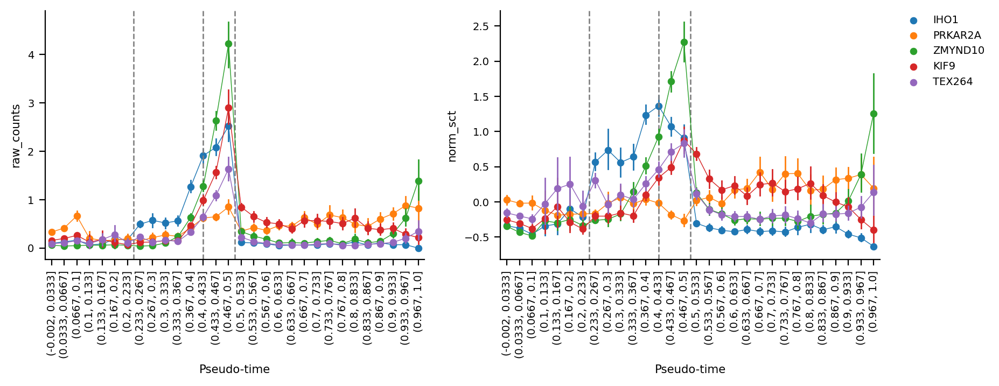

In [22]:
double_expr_plot(['IHO1', 'PRKAR2A', 'ZMYND10', 'KIF9', 'TEX264']) ;

# Gene sets

In [29]:
top_diff_exp = pd.read_csv('../data/xy_deg/mast_output_flt_HUM.tsv', sep='\t')
#top_diff_exp.diff_exp.unique()
top_diff_exp.head(20)

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
0,UPF3B,1.011245e-193,1.382583,2.660789e-189,UPF3B,UPF3B,X,1.605808,-0.144114,0.377143,0.051613
1,PPP1R2C,7.204536e-129,1.281958,9.478287e-125,PPP1R2C,PPP1R2C,X,3.007225,0.131660,0.352273,0.058065
2,FAM230C,1.767933e-110,-1.550552,1.550596e-106,FAM230C,FAM230C,Y,0.491259,3.901789,0.176136,0.551948
3,amplicon-chrY-HSFY1/2,8.518387e-107,-0.840898,5.603395e-103,mc/ampl_HSFY1/2,mc/ampl_HSFY1/2,Y,0.275991,2.021264,0.022857,0.167742
4,LINC00278,1.075359e-105,-0.629148,5.658972e-102,LINC00278,LINC00278,Y,-0.133808,1.455366,0.005714,0.090323
5,TTTY2,7.492789e-95,-0.668720,3.285838e-91,TTTY2,TTTY2,Y,-0.095212,1.554767,0.000000,0.038710
6,DIAPH2,1.270946e-80,1.289335,4.777303e-77,DIAPH2,DIAPH2,X,0.367308,-0.453516,0.232955,0.038961
7,SCML1,6.146003e-79,1.011064,2.021420e-75,SCML1,SCML1,X,0.743875,-0.342515,0.159091,0.012987
8,LOC105377227,7.506654e-78,-0.907516,2.194612e-74,LOC105377227,LOC105377227,Y,0.056067,1.276232,0.005682,0.058442
9,amplicon-chrY-CDY1/1B/2A/2B,1.049046e-77,-1.130319,2.760250e-74,mc/ampl_CDY1/1B/2A/2B,mc/ampl_CDY1/1B/2A/2B,Y,-0.022583,2.430483,0.005714,0.071429


In [30]:
chrX_genes = gi.get_genes_region_dataframe('chrX', 0, 156000000, assembly='hg19').drop_duplicates('name')
chrY_genes = gi.get_genes_region_dataframe('chrY', 0, 156000000, assembly='hg19').drop_duplicates('name')
chrX_genes.head()

,name,start,end,strand
0,PLCXD1,193022,220023,+
7,GTPBP6,221425,230887,-
8,LINC00685,281384,282067,+
10,PPP2R3B,294667,347642,-
11,SHOX,585078,620146,+


In [31]:
df = top_diff_exp.loc[~top_diff_exp.gene_name.isin(chrX_genes.name) & ~top_diff_exp.gene_name.isin(chrY_genes.name) & (top_diff_exp.diff_exp != 'No-significant')].sort_values('coef')
df << left()

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
2,FAM230C,0.000000,-1.550552,0.000000,FAM230C,FAM230C,Y,0.491259,3.901789,0.176136,0.551948
9,amplicon-chrY-CDY1/1B/2A/2B,0.000000,-1.130319,0.000000,mc/ampl_CDY1/1B/2A/2B,mc/ampl_CDY1/1B/2A/2B,Y,-0.022583,2.430483,0.005714,0.071429
8,LOC105377227,0.000000,-0.907516,0.000000,LOC105377227,LOC105377227,Y,0.056067,1.276232,0.005682,0.058442
3,amplicon-chrY-HSFY1/2,0.000000,-0.840898,0.000000,mc/ampl_HSFY1/2,mc/ampl_HSFY1/2,Y,0.275991,2.021264,0.022857,0.167742
61,amplicon-chrY-VCY/1B,0.000000,-0.742794,0.000000,mc/ampl_VCY/1B,mc/ampl_VCY/1B,Y,-0.349380,0.201214,0.022727,0.103226
36,LOC107987339,0.000000,-0.667607,0.000000,LOC107987339,LOC107987339,Y,-0.043290,1.443559,0.000000,0.019481
104,LOC105377231,0.000000,-0.595544,0.000000,LOC105377231,LOC105377231,Y,0.061306,0.766494,0.000000,0.006494
234,amplicon-chrY-RBMY1A1/1B/1D/1E/1F/1J,0.000005,-0.560468,0.000545,mc/ampl_RBMY1A1/1B/1D/1E/1F/1J,mc/ampl_RBMY1A1/1B/1D/1E/1F/1J,Y,-0.329864,-0.162775,0.011429,0.045161
113,DACT3-AS1,0.000000,-0.555422,0.000000,DACT3-AS1,DACT3-AS1,Y,1.844904,3.417205,0.312500,0.554839
58,LOC107987394,0.000000,-0.551988,0.000000,LOC107987394,LOC107987394,Y,0.501233,2.289808,0.080000,0.253247


# MAKE PLOT THAT STRATIFIES BY X AND Y CELLS. (RAW X COUNTS AT PEUDOTIME DVIDEDE BY RAW X COUNTS FOR ALL OTHER GENES IN THE CELL (OR SOME OTHER GROUPS))

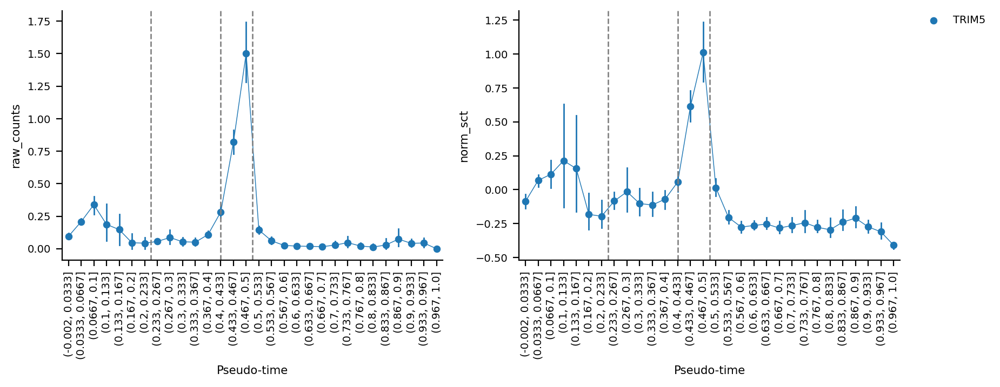

In [32]:
double_expr_plot(['TRIM5']) ;

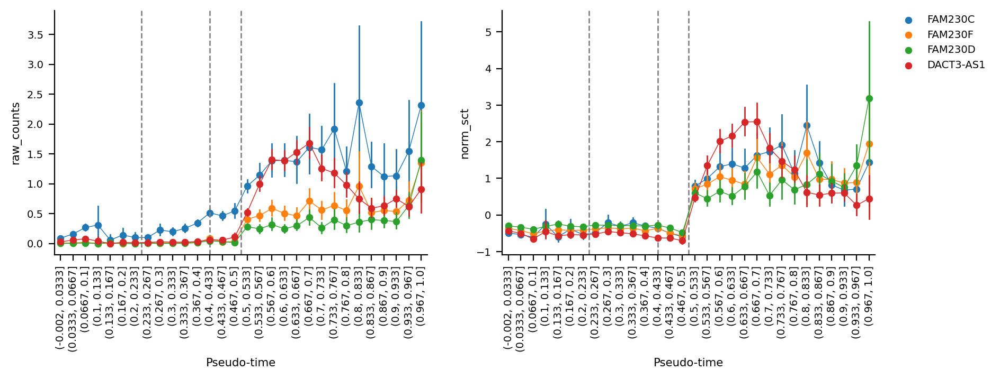

In [33]:
double_expr_plot(['FAM230C', 'FAM230F', 'FAM230D', 'DACT3-AS1']) ;

In [34]:
chr3_region_genes = gi.get_genes_region_dataframe('chr3', 48000000, 52000000, assembly='hg19').drop_duplicates('name')

In [35]:
top_diff_exp.loc[top_diff_exp.gene_name.isin(chr3_region_genes.name)] << left()

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
520,IQCF6,0.002065,-0.000084,0.104281,IQCF6,nan,No-significant,nan,nan,nan,nan
629,CAMKV,0.003745,-0.000018,0.156395,CAMKV,nan,No-significant,nan,nan,nan,nan
700,LINC02585,0.005402,-0.070891,0.202605,LINC02585,nan,No-significant,nan,nan,nan,nan
710,RBM5,0.005599,-0.041909,0.207133,RBM5,nan,No-significant,nan,nan,nan,nan
744,HEMK1,0.006294,-0.005299,0.222285,HEMK1,nan,No-significant,nan,nan,nan,nan
779,PCBP4,0.007051,-0.000001,0.237853,PCBP4,nan,No-significant,nan,nan,nan,nan
832,PRKAR2A-AS1,0.008393,-0.056443,0.264735,PRKAR2A-AS1,nan,No-significant,nan,nan,nan,nan
1180,NCKIPSD,0.018097,-0.071589,0.403003,NCKIPSD,nan,No-significant,nan,nan,nan,nan
1304,C3orf18,0.021698,-0.001254,0.437483,C3orf18,nan,No-significant,nan,nan,nan,nan
1737,MST1R,0.036952,-0.000044,0.559098,MST1R,nan,No-significant,nan,nan,nan,nan


In [36]:
for g in ['CCDC36', 'IHO1', 'PRKAR2A', 'ZMYND10', 'KIF9', 'TEX264']:
    print(g, g in top_diff_exp.gene_name)

CCDC36 False
IHO1 False
PRKAR2A False
ZMYND10 False
KIF9 False
TEX264 False


In [37]:
['IHO1', 'PRKAR2A', 'ZMYND10', 'KIF9', 'TEX264']

['IHO1', 'PRKAR2A', 'ZMYND10', 'KIF9', 'TEX264']

### Questions:

- Are (all) X genes with a homolog on Y more often DEGs or is it only the ASF ones?
- Are there any autosomal DEGs, and do they interact with DEGs on X and Y?
- Are DEGs enriched among ASF genes or is it only those without admixture or with ILS or sweeps?
- Is there a significant correlation between DE, pachytene peak, seelction and ASF?

In [38]:
xy_homologs_in_sfari = [
        'DDX3X', 'DDX3Y',
        'EIF1AX', 'EIF1AY',
        'RBMX', 'RBMY',
        'TMSB4X', 'TMSB4Y',
        'USP9X', 'USP9Y',
        'KMD6A',
        'KMD5C',
        'NLGN4X', 
        'TBL1X', 'TBL1Y',
        'PCDH11X', 'PCDH11Y'
    ]

[Loss of KDM6A Activates Super-Enhancers to Induce Gender-Specific Squamous-like Pancreatic Cancer and Confers Sensitivity to BET Inhibitors](https://www.sciencedirect.com/science/article/pii/S1535610818300564?via%3Dihub)

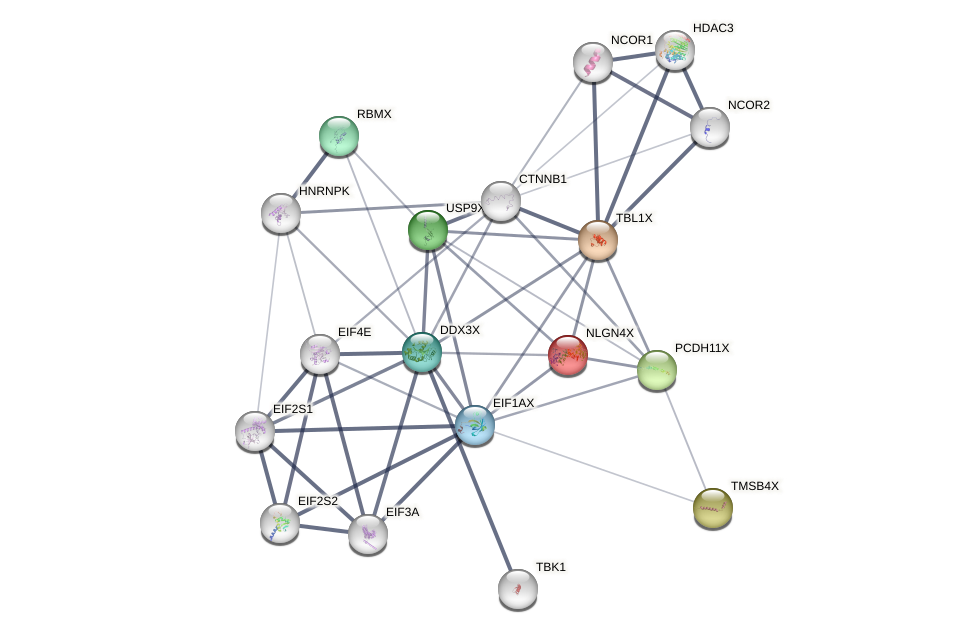

In [39]:
gi.show_string_network(xy_homologs_in_sfari)

In [45]:
top_diff_exp.loc[top_diff_exp.gene_name.isin(['KDM6A', 'RUNX3', 'UTY'])].sort_values('gene_name')

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
241,KDM6A,0.000007,0.159901,0.000772,KDM6A,KDM6A,X,-0.154221,-0.243004,0.022857,0.012903
793,RUNX3,0.007429,-0.177379,0.246177,RUNX3,NaN,No-significant,NaN,NaN,NaN,NaN
24012,UTY,0.919130,0.005003,1.000000,UTY,NaN,No-significant,NaN,NaN,NaN,NaN


In [46]:
top_diff_exp.loc[top_diff_exp.gene_name.isin(xy_homologs_in_sfari)].sort_values('gene_name')

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
52,DDX3X,1.497812e-37,0.209078,7.435930e-35,DDX3X,DDX3X,X,0.716006,-0.004894,0.073864,0.032258
19,DDX3Y,1.371331e-63,-0.590866,1.804123e-60,DDX3Y,DDX3Y,Y,-0.054413,0.526727,0.022727,0.064935
120,EIF1AX,8.146251e-15,0.172135,1.771439e-12,EIF1AX,EIF1AX,X,0.264888,0.029644,0.068182,0.038710
182,EIF1AY,5.849542e-09,-0.555201,8.410555e-07,EIF1AY,EIF1AY,Y,0.137361,0.431974,0.028571,0.051613
1307,NLGN4X,2.176844e-02,0.033015,4.377381e-01,NLGN4X,NaN,No-significant,NaN,NaN,NaN,NaN
498,PCDH11X,1.712805e-03,0.047935,9.031530e-02,PCDH11X,NaN,No-significant,NaN,NaN,NaN,NaN
238,PCDH11Y,5.441320e-06,-0.164082,5.990461e-04,PCDH11Y,PCDH11Y,Y,0.008382,0.299661,0.011364,0.032258
151,RBMX,1.382310e-11,0.421526,2.392851e-09,RBMX,RBMX,X,0.019181,-0.212089,0.011364,0.006452
4282,TBL1X,1.352878e-01,0.021555,8.300779e-01,TBL1X,NaN,No-significant,NaN,NaN,NaN,NaN
13800,TBL1Y,5.284401e-01,-0.018782,1.000000e+00,TBL1Y,NaN,No-significant,NaN,NaN,NaN,NaN


CFAP47 "associate" with CFAP65 in STRING (and PCDH11X which is is sfari)

In [47]:
top_diff_exp.loc[top_diff_exp.gene_name == 'CFAP65']

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
1424,CFAP65,0.02581,-0.222513,0.476209,CFAP65,NaN,No-significant,NaN,NaN,NaN,NaN


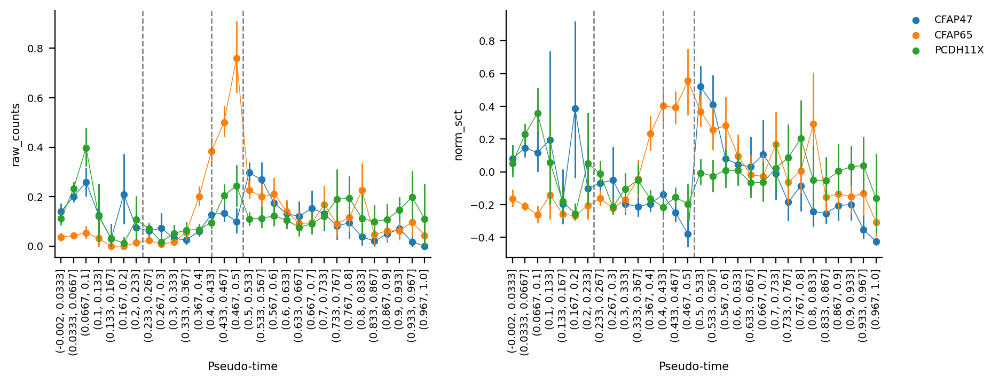

In [48]:
double_expr_plot(['CFAP47', 'CFAP65', 'PCDH11X']) ;

CFAP65:

[A novel homozygous CFAP65 mutation in humans causes male infertility with multiple morphological abnormalities of the sperm flagella](https://onlinelibrary.wiley.com/doi/10.1111/cge.13644)

[Connecting phenotype to genotype: PheWAS-inspired analysis of autism spectrum disorder
](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9605200/)

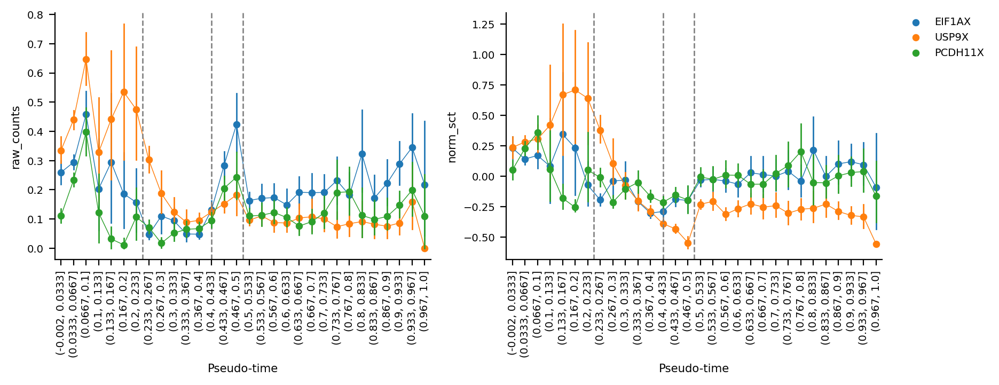

In [49]:
double_expr_plot(['EIF1AX', 'USP9X', 'PCDH11X']) ;

missing: ['RBMY', 'TMSB4Y', 'KMD6A', 'KMD5C']
missing: ['RBMY', 'TMSB4Y', 'KMD6A', 'KMD5C']


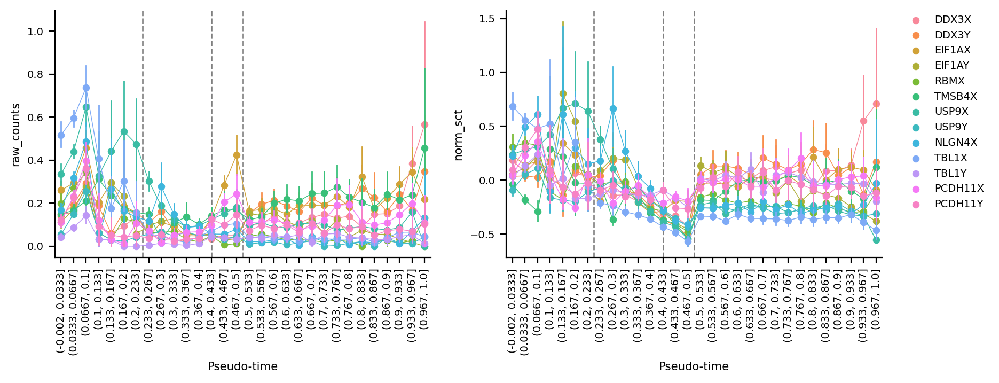

In [50]:
double_expr_plot(xy_homologs_in_sfari) ;

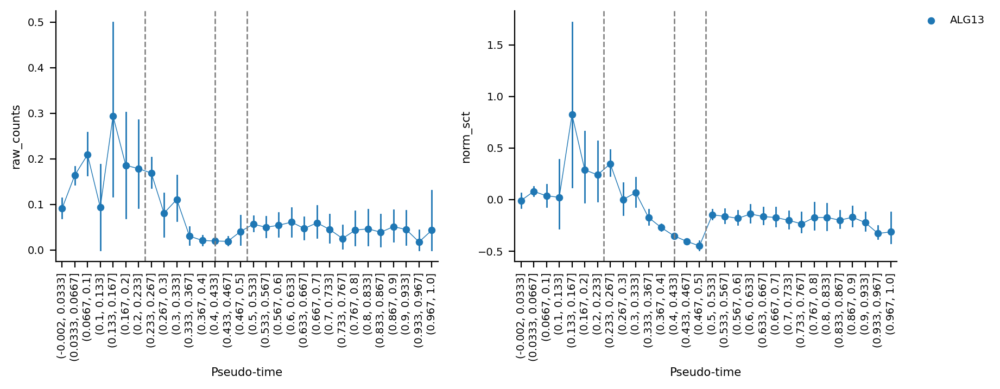

In [51]:
double_expr_plot('ALG13') ;

DEG PPI sets (Experiments, Databases, Gene Fusion, Co‑occurrence):

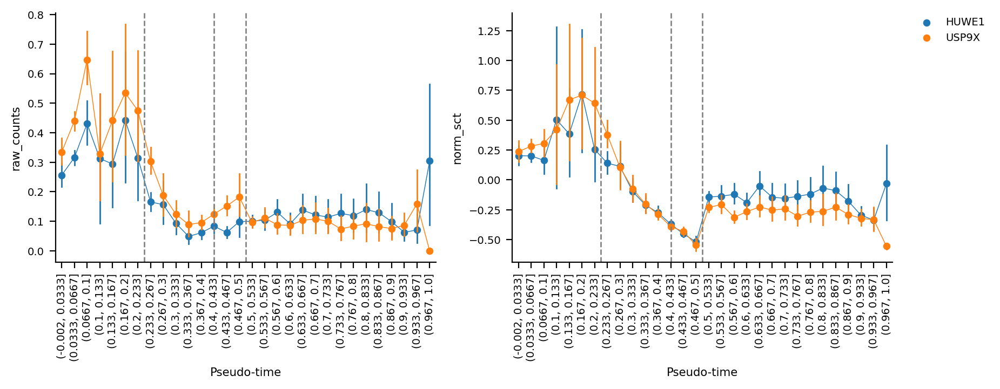

In [52]:
double_expr_plot(['HUWE1', 'USP9X']) ;

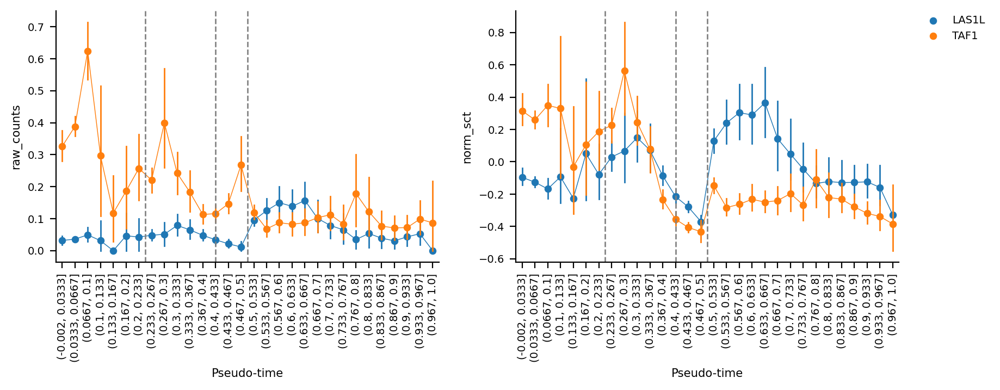

In [53]:
double_expr_plot(['LAS1L', 'TAF1']) ;

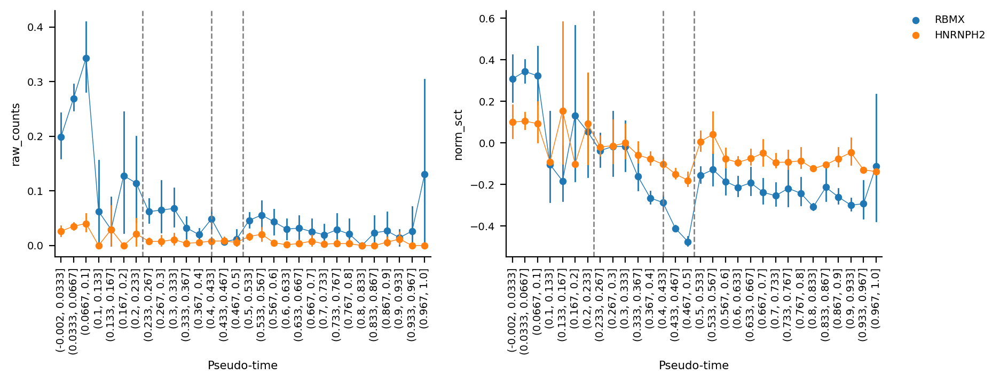

In [54]:
double_expr_plot(['RBMX', 'HNRNPH2']) ;

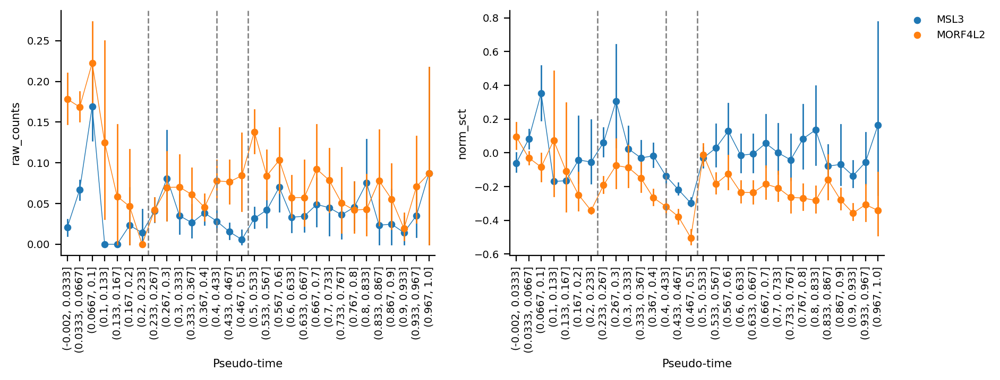

In [55]:
double_expr_plot(['MSL3', 'MORF4L2']) ;

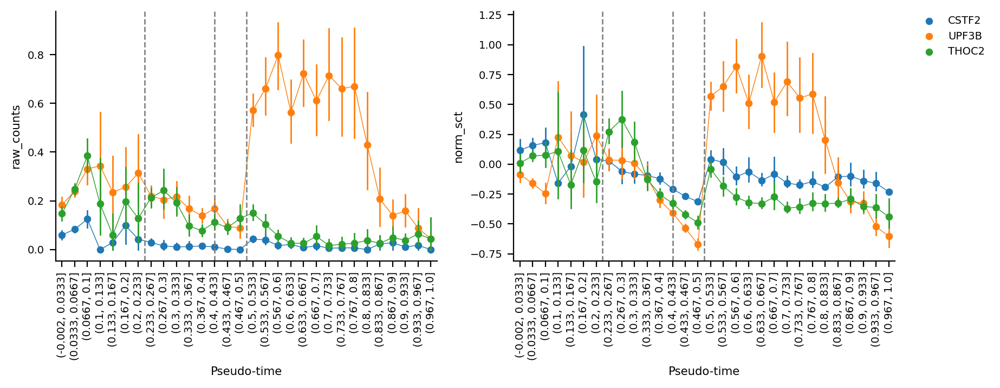

In [56]:
double_expr_plot(['CSTF2', 'UPF3B', 'THOC2']) ;

In [57]:
# for g in top_diff_exp.loc[top_diff_exp.diff_exp != 'No-significant'].sort_values('coef', ascending=False).gene_name.values:
#     print(g)

In [58]:
top_diff_exp.loc[top_diff_exp.diff_exp != 'No-significant'].sort_values('coef', ascending=False)

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
29,MAGEA4-AS1,5.506067e-54,2.365739,4.829188e-51,MAGEA4-AS1,MAGEA4-AS1,X,2.038899,-0.077053,0.102273,0.006452
31,LOC105373313,5.209965e-51,1.440591,4.283894e-48,LOC105373313,LOC105373313,X,2.197796,0.078523,0.142045,0.012903
0,UPF3B,1.011245e-193,1.382583,2.660789e-189,UPF3B,UPF3B,X,1.605808,-0.144114,0.377143,0.051613
24,LOC105373153,4.106169e-58,1.348723,4.321660e-55,LOC105373153,LOC105373153,X,1.360874,-0.263251,0.164773,0.006452
6,DIAPH2,1.270946e-80,1.289335,4.777303e-77,DIAPH2,DIAPH2,X,0.367308,-0.453516,0.232955,0.038961
...,...,...,...,...,...,...,...,...,...,...,...
3,amplicon-chrY-HSFY1/2,8.518387e-107,-0.840898,5.603395e-103,mc/ampl_HSFY1/2,mc/ampl_HSFY1/2,Y,0.275991,2.021264,0.022857,0.167742
112,TGIF2LY,1.784608e-16,-0.891222,4.155452e-14,TGIF2LY,TGIF2LY,Y,0.051513,0.986998,0.000000,0.006494
8,LOC105377227,7.506654e-78,-0.907516,2.194612e-74,LOC105377227,LOC105377227,Y,0.056067,1.276232,0.005682,0.058442
9,amplicon-chrY-CDY1/1B/2A/2B,1.049046e-77,-1.130319,2.760250e-74,mc/ampl_CDY1/1B/2A/2B,mc/ampl_CDY1/1B/2A/2B,Y,-0.022583,2.430483,0.005714,0.071429


In [59]:
top_diff_exp.loc[top_diff_exp.diff_exp != 'No-significant'].sort_values('coef', ascending=False).head(20) << left()

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
29,MAGEA4-AS1,0.000000,2.365739,0.000000,MAGEA4-AS1,MAGEA4-AS1,X,2.038899,-0.077053,0.102273,0.006452
31,LOC105373313,0.000000,1.440591,0.000000,LOC105373313,LOC105373313,X,2.197796,0.078523,0.142045,0.012903
0,UPF3B,0.000000,1.382583,0.000000,UPF3B,UPF3B,X,1.605808,-0.144114,0.377143,0.051613
24,LOC105373153,0.000000,1.348723,0.000000,LOC105373153,LOC105373153,X,1.360874,-0.263251,0.164773,0.006452
6,DIAPH2,0.000000,1.289335,0.000000,DIAPH2,DIAPH2,X,0.367308,-0.453516,0.232955,0.038961
1,PPP1R2C,0.000000,1.281958,0.000000,PPP1R2C,PPP1R2C,X,3.007225,0.131660,0.352273,0.058065
132,GLA,0.000000,1.230274,0.000000,GLA,GLA,X,0.786905,-0.025771,0.028409,0.000000
43,EDA,0.000000,1.209988,0.000000,EDA,EDA,X,0.943742,-0.121673,0.137143,0.025806
16,CFAP47,0.000000,1.141357,0.000000,CFAP47,CFAP47,X,1.161763,-0.145954,0.125000,0.019355
22,LOC107985717,0.000000,1.076459,0.000000,LOC107985717,LOC107985717,X,1.296817,-0.177197,0.113636,0.006452


X genes with expression data:

In [60]:
x_genes_with_expr_data = set(adata.var["chromosome"][adata.var["chromosome"] == 'X'].index.values)

Top differentially expressed from Meritxell:

In [62]:
top_diff_exp = pd.read_csv('../data/DEG_XY_spermatids_filtered_pval1_fc2.tsv', sep='\t', 
            names=['name', '?', 'log_ratio', '??'])

SFARI genes:

In [63]:
sfari_genes = pd.read_csv('../data/SFARI-Gene_genes_05-05-2022release_06-27-2022export.csv')

CodeML significant genes from Tessa's PiB:

In [64]:
codeml_tessa = pd.read_csv('../data/tessa_codeml_genes.csv', names=['name', 'alt_model', 'LR', 'pval'])

Grove ASD genes:

In [65]:
grove_2019 = ['KIZ', 'XRN2', 'NKX2-2', 'NKX2-4', 'C8orf74', 
              'SOX7', 'PINX1', 'LOC102723661', 'PTBP2', 
              'MACROD2', 'KMT2E', 'SRPK2', 'MMS22L', 'POU3F2',
              'NUD12', 'MROH5', 'CADPS', 'NEGR1', 'MARK3', 'CKB', 
              'TRMT61A', 'BAG5', 'APOPT1', 'KLC1', 'XRCC3', 
              'SLC30A9', 'BEND4', 'TMEM33', 'DCAF4L1']

X genes in low-ILS regions:

In [66]:
human_chimp_low_ils_chrX = pd.read_hdf('../data/human_chimp_low_ils_regions_chrX.hdf')
genes_human_chimp_low_ils_chrX = []
for start, end in zip(human_chimp_low_ils_chrX.start, human_chimp_low_ils_chrX.end):
    entries = gi.get_genes_region('chrX', start, end, assembly='hg19')
    genes_human_chimp_low_ils_chrX.extend(list(set(list(zip(*entries))[0])))

In [67]:
human_orang_low_ils_chrX = pd.read_hdf('../data/human_orang_low_ils_regions_chrX.hdf')
genes_human_orang_low_ils_chrX = []
for start, end in zip(human_orang_low_ils_chrX.start, human_orang_low_ils_chrX.end):
    entries = gi.get_genes_region('chrX', start, end, assembly='hg19')
    genes_human_orang_low_ils_chrX.extend(list(set(list(zip(*entries))[0])))

- IL13RA1: Peak, *sperm. expression*
- EGFL6: sperm. expression
- OGT: 
- DYNLT3: Peak, *sperm. expression*
- PCDH11X: maybe associated with **AD and fragile X**, *sperm. expression*
- ZDHHC9: associated with **X-linked cognitive disability**., 
- HMGN5: 
- RAB41: 
- OFD1: *sperm. expression*
- EDA: *sperm. expression*
- GK: *sperm. expression*
- LAGE3: A form of Galloway-Mowat syndrome, a severe renal-neurological disease characterized by early-onset nephrotic syndrome associated with microcephaly, **central nervous system abnormalities**, developmental delays, and a propensity for seizures.
- ZNF41: may be associated with X-linked cognitive disability
- PDHA1: Leigh syndrome is a rare genetic **neurometabolic disorder**. It is characterized by the degeneration of the central nervous system (i.e., brain, spinal cord, and optic nerve).
- WWC3: A rare disorder of sex development affecting 46,XY individuals and characterized by **complete gonadal dysgenesis** (normal external female genitalia...
- BRCC3: This complex plays a role in the DNA damage response, where it is responsible for the stable accumulation of BRCA1 at DNA break sites
- BGN: ?

Cadhedrines under selection (checked if sperm. expressed):

- [x] PCDH11X, AD, fragile X
- [ ] PCDHA13
- [ ] PCDHA6
- [ ] PCDHA9 
- [x] PCDHB15 (strong expression in chimps and other primates, not humans), May be involved in the establishment and maintenance of specific neuronal connections in the brain.
- [ ] PCDHGA8
- [ ] PCDHGC3
- [x] PCDHGC5 May be involved in the establishment and maintenance of specific neuronal connections in the brain     
- [x] CDHR2 Intermicrovillar adhesion molecule that forms, via its extracellular domain, calcium-dependent heterophilic complexes with CDHR5 on adjacent microvilli.

# it seems there is a bug in geneinfo so you cannot use background_chrom unless you have already run an analysis withuot it

# Distribution of cell counts across pseudo-time

In [68]:
%matplotlib inline

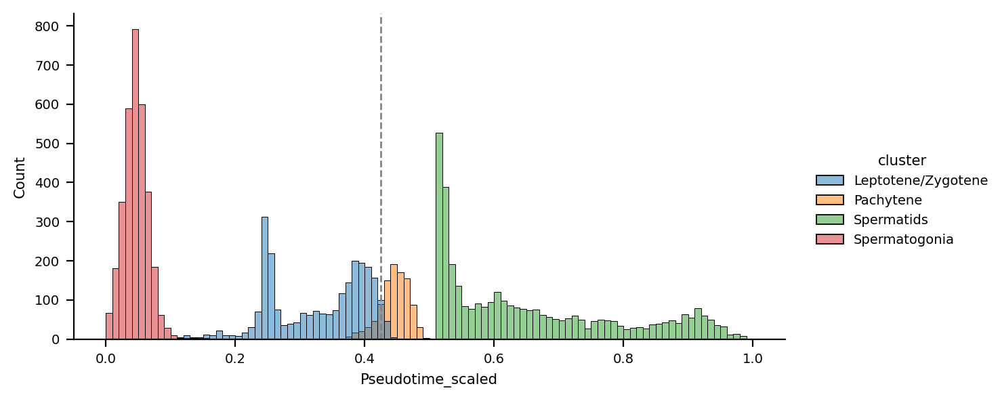

In [69]:
df = sc.get.obs_df(adata, keys=['cluster', 'Pseudotime_scaled'])
sns.displot(df, x='Pseudotime_scaled', hue='cluster', bins=100, height=3, aspect=2) ;
plt.axvline(0.425, color='grey', linestyle='dashed') ;

# Compute norm_sct expression means

In [70]:
adata.var.chromosome

MIR1302-2HG      1
FAM138A          1
LOC100996442     1
LOC729737        1
LOC107985721     1
                ..
ND3             MT
ND4L            MT
ND4             MT
ND5             MT
CYTB            MT
Name: chromosome, Length: 26325, dtype: category
Categories (27, object): ['1', '2', '3', '4', ..., 'PAR', 'Un', 'X', 'Y']

In [125]:
df = adata.to_df(layer='norm_sct')
# df = df.loc[adata.var.chromosome == 'X']
df['ptime'] = pd.cut(adata.obs.Pseudotime_scaled, include_lowest=True, bins=30)
ptime_bins = df['ptime'].unique().sort_values()
means_fine_df = df.groupby('ptime').mean()
means_fine_df.columns.name = 'gene'
means_fine_df = means_fine_df.transpose()
means_fine_df = means_fine_df[ptime_bins]

# # only chrX
# means_fine_df = means_fine_df.loc[adata.var.chromosome == 'X']

means_fine_df.head()

ptime,"(-0.002, 0.0333]","(0.0333, 0.0667]","(0.0667, 0.1]","(0.1, 0.133]","(0.133, 0.167]","(0.167, 0.2]","(0.2, 0.233]","(0.233, 0.267]","(0.267, 0.3]","(0.3, 0.333]",...,"(0.667, 0.7]","(0.7, 0.733]","(0.733, 0.767]","(0.767, 0.8]","(0.8, 0.833]","(0.833, 0.867]","(0.867, 0.9]","(0.9, 0.933]","(0.933, 0.967]","(0.967, 1.0]"
gene,,,,,,,,,,,,,,,,,,,,,
MIR1302-2HG,-0.039831,-0.060799,-0.024599,-0.059440,-0.062038,-0.016107,-0.067912,-0.034373,0.028370,0.038787,...,-0.075025,-0.078117,-0.053233,-0.064450,-0.086305,-0.070655,-0.063726,-0.067913,-0.065376,-0.099497
FAM138A,-0.022036,-0.032009,-0.032782,-0.038823,-0.034687,-0.034379,-0.035442,0.018500,0.112605,0.042008,...,-0.006011,-0.039873,-0.039145,0.044302,0.032777,-0.035013,-0.039591,-0.042837,-0.049566,0.069318
LOC100996442,0.297430,0.067289,-0.025246,0.754039,0.519266,0.790530,0.970347,0.816096,0.415799,0.491016,...,-0.466007,-0.433499,-0.332691,-0.272786,-0.129817,0.016097,0.069353,0.300110,0.515684,0.604377
LOC729737,-0.089216,-0.143605,-0.217408,-0.007907,0.104333,0.011865,-0.024362,0.009567,-0.159653,-0.104549,...,0.113412,0.284323,0.350362,0.452159,0.832690,1.233184,1.448181,2.191250,2.219442,3.003906
LOC107985721,-0.049604,-0.022234,0.050285,-0.066473,-0.070602,-0.028828,-0.077242,-0.009654,0.031902,0.047822,...,-0.083810,-0.087973,-0.066146,-0.027902,-0.098723,-0.080537,-0.073622,-0.058500,-0.073145,-0.108778


In [126]:
# df = adata.to_df(layer='norm_sct')
# df['cluster'] = adata.obs.cluster
# df.set_index('cluster', inplace=True)
# means_df = df.groupby('cluster').mean()
# means_df.columns.name = 'gene'
# means_df = means_df.transpose()
# means_df = means_df[clusters]
# means_df.head()

In [127]:
# df = adata.to_df(layer='raw_counts')
# df['cluster'] = adata.obs.cluster
# df.set_index('cluster', inplace=True)
# raw_means_df = df.groupby('cluster').mean()
# raw_means_df.columns.name = 'gene'
# raw_means_df = raw_means_df.transpose()
# raw_means_df = raw_means_df[clusters]
# raw_means_df.head()

In [128]:
# # %env http_proxy=http://proxyserv:3128
# # %env https_proxy=http://proxyserv:3128
# import geneinfo as gi
# gi.email = 'kaspermunch@birc.au.dk'

In [129]:
# from Bio import Entrez
# gi._assert_entrez_email()
# handle = Entrez.esearch(db="gene", term=f'9606[Taxonomy ID] AND alive[property] AND genetype protein coding[Properties]', retmax="1000000")
# records = Entrez.read(handle)
# id_list = records["IdList"]

In [130]:
# gi._fetch_ids_to_file(id_list, 'all_genes.txt')

In [131]:
# df = pd.read_csv('all_genes.txt', sep='\t')
# x_genes = (df
#            .loc[df.chromosome=='X', ['Symbol', 
#                                     'chromosome', 
#                                     'start_position_on_the_genomic_accession', 
#                                     'end_position_on_the_genomic_accession']]
#  .rename(columns=dict(chromosome='chrom',
#          Symbol='gene',
#          start_position_on_the_genomic_accession='start',
#          end_position_on_the_genomic_accession='end'))
#           )
# x_genes.head()

In [132]:
# df = means_df.reset_index().merge(x_genes, on='gene', how='right').sort_values(by=['start', 'end'])
# df.head()

# K-means clustering

In [133]:
n_clusters = 50
membership_labels = list(range(n_clusters))
X = means_fine_df.values
kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=0).fit(X)
#kmeans.labels_

In [134]:
df = pd.DataFrame().from_records(kmeans.cluster_centers_, columns=means_fine_df.columns)
df.index.name = 'membership'
df.columns.name = 'ptime'
plot_df = df.stack().to_frame('expression').reset_index()
plot_df.tail()

,membership,ptime,expression
1495,49,"(0.833, 0.867]",-0.419991
1496,49,"(0.867, 0.9]",-0.436187
1497,49,"(0.9, 0.933]",-0.470425
1498,49,"(0.933, 0.967]",-0.492245
1499,49,"(0.967, 1.0]",-0.529007


In [135]:
# ax = sns.pointplot(data=plot_df, x='ptime', y='expression', hue='membership', 
#                    errorbar='sd', 
#                   )
# ax.axvline(6.5, color='grey', linestyle='dashed')
# ax.axvline(12, color='grey', linestyle='dashed')
# ax.axvline(14.5, color='grey', linestyle='dashed')
# plt.xticks(rotation=90)
# ax.set_xlabel('Pseudo-time')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
# sns.despine()

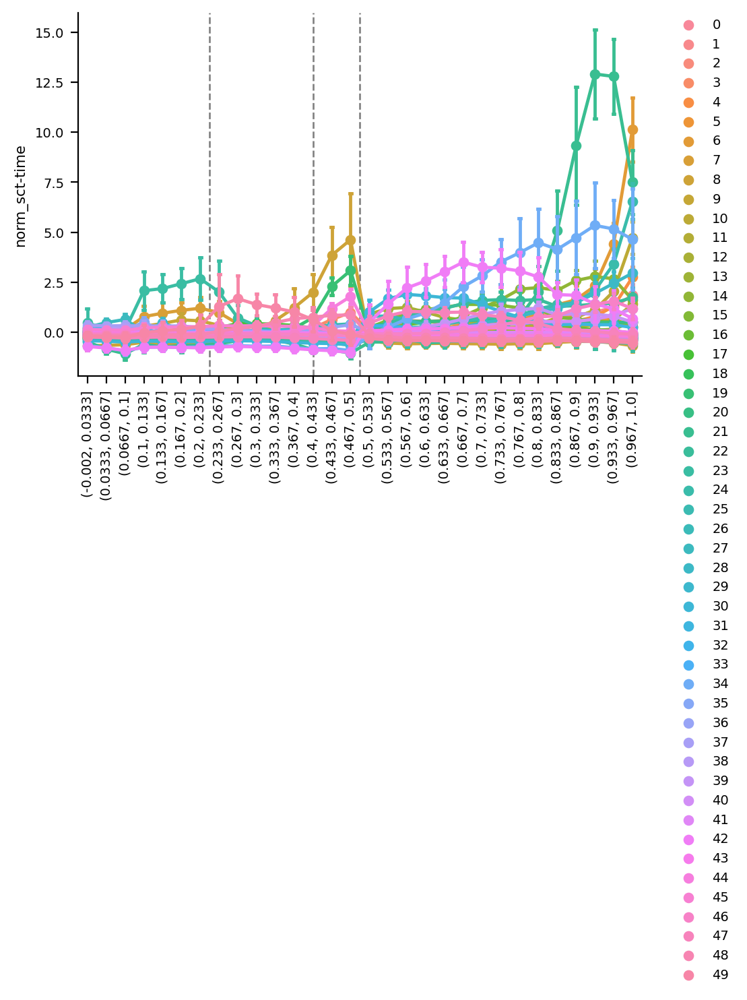

In [136]:
memberships = kmeans.predict(X)

means_fine_df.columns = means_fine_df.columns.tolist() # remvoe categoriesfrom column index

means_fine_df['membership'] = memberships

plot_df = means_fine_df.melt(id_vars=['membership'])

ax = sns.pointplot(data=plot_df, x='variable', y='value', hue='membership', 
                   errorbar='sd', capsize=.1, 
                   order=ptime_bins
                  )
plt.xticks(rotation=90)
ax.axvline(6.5, color='grey', linestyle='dashed')
ax.axvline(12, color='grey', linestyle='dashed')
ax.axvline(14.5, color='grey', linestyle='dashed')
ax.set_ylabel('norm_sct-time')
ax.set_xlabel(None)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
sns.despine()

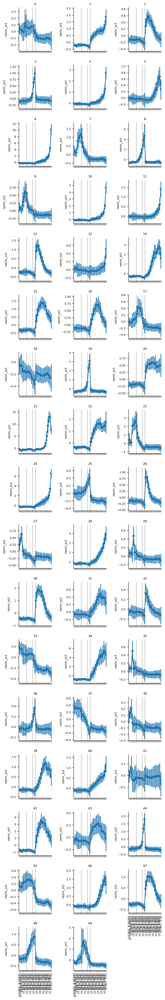

In [137]:
g = sns.FacetGrid(plot_df, col="membership", height=2, col_wrap=3, sharey=False)
g.map(sns.pointplot, 'variable', 'value', 
      order=ptime_bins, 
      errorbar='sd')
for ax in g.axes.flat:
    ax.tick_params(axis='x', labelrotation=90)
    ax.set_xlabel(None)
    ax.set_ylabel('norm_sct')
    ax.axvline(6.5, color='grey', linestyle='dashed')
    ax.axvline(12, color='grey', linestyle='dashed')
    ax.axvline(14.5, color='grey', linestyle='dashed')    
g.set_titles(col_template="{col_name}", row_template="{row_name}") ;

In [138]:
# n_clusters = 6
# membership_labels = list(range(n_clusters))
# X = means_df.values
# from sklearn.cluster import KMeans
# import numpy as np
# kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=0).fit(X)
# #kmeans.labels_

Plot cluster center signatures:

In [139]:
# df = pd.DataFrame().from_records(kmeans.cluster_centers_, columns=means_df.columns)
# df.index.name = 'membership'
# plot_df = df.stack().to_frame('expression').reset_index()

# ax = sns.pointplot(data=plot_df, x='cluster', y='expression', hue='membership', 
#                    order=clusters)
# plt.xticks(rotation=90)
# ax.set_xlabel('Pseudo-time')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
# sns.despine()

Add cluster membership to mean expression and plot SD in each group:

In [140]:
# memberships = kmeans.predict(X)

# means_df.columns = means_df.columns.tolist() # remvoe categoriesfrom column index

# means_df['membership'] = memberships

# plot_df = means_df.melt(id_vars=['membership'])

# ax = sns.pointplot(data=plot_df, x='variable', y='value', hue='membership', 
#                    errorbar='sd', capsize=.1, order=clusters)
# plt.xticks(rotation=90)
# ax.set_ylabel('norm_sct-time')
# ax.set_xlabel(None)
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
# sns.despine()

In [141]:
# g = sns.FacetGrid(plot_df, col="membership", height=2, col_wrap=3, sharey=False)
# g.map(sns.pointplot, 'variable', 'value', order=clusters, errorbar='sd')
# for ax in g.axes.flat:
#     ax.tick_params(axis='x', labelrotation=90)
#     ax.set_xlabel(None)
#     ax.set_ylabel('norm_sct')
# g.set_titles(col_template="{col_name}", row_template="{row_name}") ;

Number of genes in each cluster:

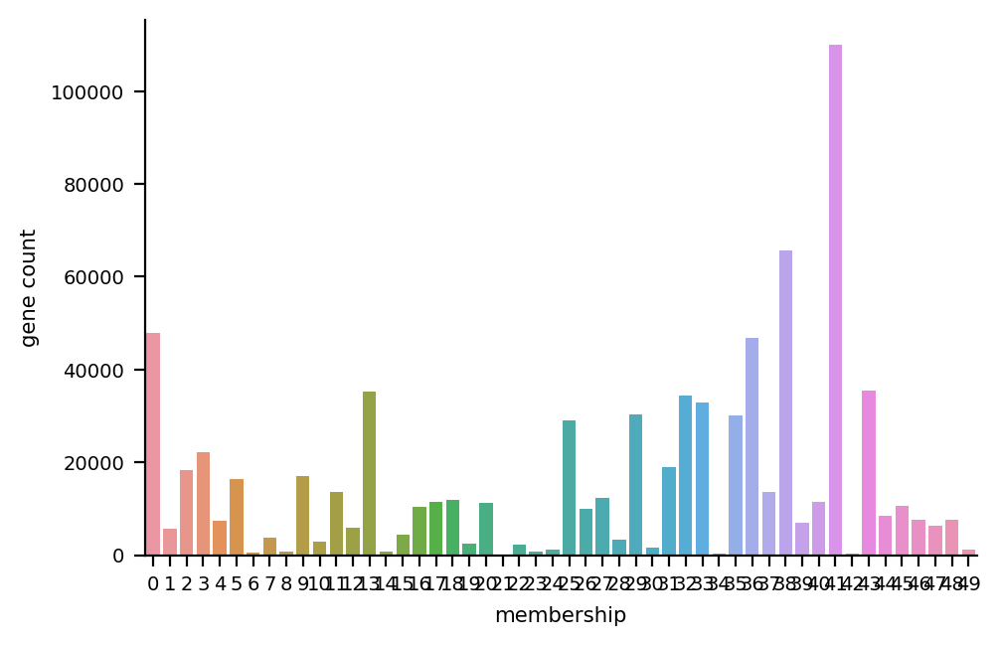

In [142]:
df = plot_df.membership.value_counts()
df.index.name = 'membership'
all_genes_bar_plot_df =  df.to_frame('counts').sort_values('membership').reset_index()

ax = sns.barplot(x="membership", y="counts", data=all_genes_bar_plot_df)
ax.set_ylabel('gene count')
sns.despine()

# Are X and Y genes expressed differently?

In [143]:
adata.var.chromosome.unique()

['1', '2', '3', '4', '5', ..., 'PAR', 'X', 'Y', 'Un', 'MT']
Length: 27
Categories (27, object): ['1', '2', '3', '4', ..., 'PAR', 'Un', 'X', 'Y']

In [144]:
adata.var.chromosome[means_df.index]

NameError: name 'means_df' is not defined

In [145]:
plot_df = means_fine_df 
plot_df['chromosome'] = adata.var.chromosome[means_fine_df.index]
plot_df = means_fine_df.groupby(['chromosome', 'membership']).membership.count().to_frame('counts').reset_index()
plot_df.loc[plot_df.chromosome=='MT']

,chromosome,membership,counts
1100,MT,0,0
1101,MT,1,0
1102,MT,2,0
1103,MT,3,1
1104,MT,4,0
1105,MT,5,0
1106,MT,6,0
1107,MT,7,0
1108,MT,8,0
1109,MT,9,0


In [104]:
# _df = plot_df.loc[plot_df.chromosome.isin(['X', 'Y', 'MT', '7'])]
# _df.loc['chromosome'] = _df.chromosome.cat.remove_unused_categories()
# g = sns.FacetGrid(_df, col="chromosome", hue="membership", height=2, aspect=4, col_wrap=2, sharey=False)
# g.map(sns.barplot, "membership", "counts", order=membership_labels) ;


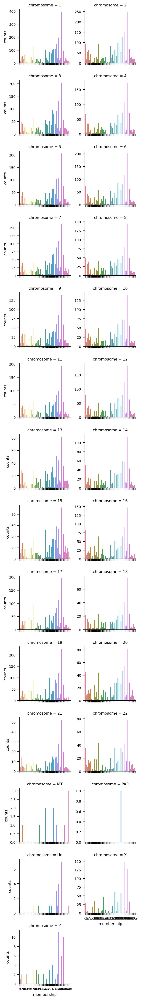

In [146]:
g = sns.FacetGrid(plot_df, col="chromosome", hue="membership", height=2, col_wrap=2, sharey=False)
g.map(sns.barplot, "membership", "counts", order=membership_labels) ;



# chromosomes = list(map(str, range(1,23))) + ['X']
# for chrom in chromosomes:
#     print(chrom)
#     chrom_genes = adata.var.loc[adata.var.chromosome == chrom, 'gene_ids']
#     chrom_genes = chrom_genes[~chr_genes.isnull()]

#     plot_df = means_df.loc[chr_genes].groupby('membership').membership.count().to_frame('counts').reset_index()
#     ax = sns.barplot(x="membership", y="counts", data=plot_df, order=membership_labels)
#     ax.set_ylabel('gene count')
#     sns.despine()
#     break
    
# for ax in g.axes.flat:
#     ax.tick_params(axis='x', labelrotation=90)
#     ax.set_xlabel(None)
#     ax.set_ylabel('norm_sct')
# g.set_titles(col_template="{col_name}", row_template="{row_name}") ;    

# Interesting genes on MT

In [152]:
df = means_fine_df.loc[:, ['membership']] 
df
#df.loc[(df.chromosome == 'MT')]

,membership
gene,
MIR1302-2HG,36
FAM138A,41
LOC100996442,7
LOC729737,28
LOC107985721,36
...,...
ND3,25
ND4L,36
ND4,48


In [153]:
df = means_fine_df.loc[:, ['membership']] 
df
#df.loc[(df.chromosome == 'MT')]

,membership
gene,
MIR1302-2HG,36
FAM138A,41
LOC100996442,7
LOC729737,28
LOC107985721,36
...,...
ND3,25
ND4L,36
ND4,48


In [154]:
df['chromosome'] = adata.var.chromosome[df.index]
l = df.loc[(df.chromosome == 'MT')]# & (df.membership.isin([3, 4, 5]))].index.values.tolist()
#gi.gene_info(l)
l

,membership,chromosome
gene,,
ND1,25,MT
ND2,44,MT
COX1,19,MT
COX2,48,MT
ATP6,33,MT
COX3,48,MT
ND3,25,MT
ND4L,36,MT
ND4,48,MT


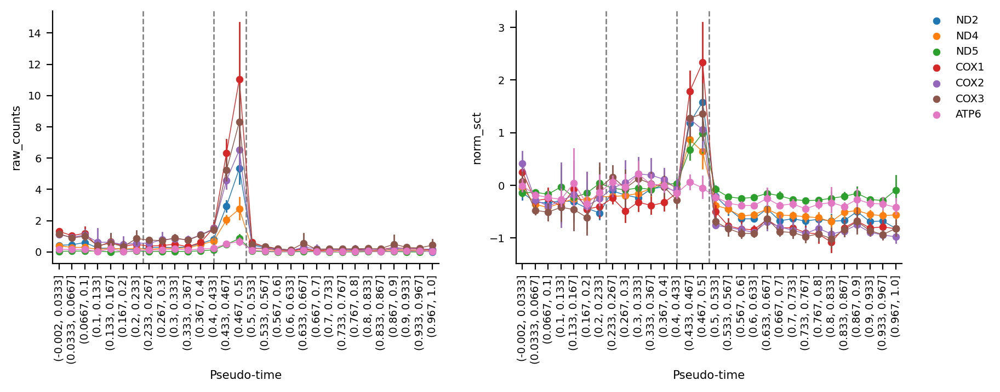

In [147]:
double_expr_plot(['ND2', 'ND4', 'ND5', 'COX1', 'COX2', 'COX3', 'ATP6']) ;

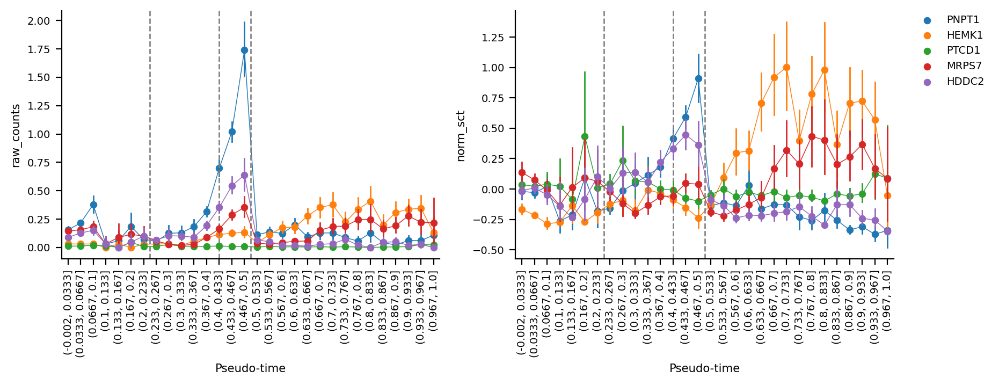

In [148]:
double_expr_plot(['PNPT1', 'HEMK1', 'PTCD1', 'MRPS7', 'HDDC2']) ;

In [164]:
all_cox = means_fine_df.reset_index().loc[lambda df: df.gene.str.startswith('COX')].gene
all_cox

['COX20',
 'COX7A2L',
 'COX5B',
 'COX17',
 'COX7B2',
 'COX18',
 'COX7C',
 'COX7A2',
 'COX19',
 'COX6C',
 'COX15',
 'COX8A',
 'COX14',
 'COX6A1',
 'COX16',
 'COX8C',
 'COX5A',
 'COX4I1',
 'COX10-AS1',
 'COX10',
 'COX11',
 'COX6B1',
 'COX7A1',
 'COX6B2',
 'COX7B',
 'COX1',
 'COX2',
 'COX3']

(<AxesSubplot: xlabel='Pseudo-time', ylabel='raw_counts'>,
 <AxesSubplot: xlabel='Pseudo-time', ylabel='norm_sct'>)

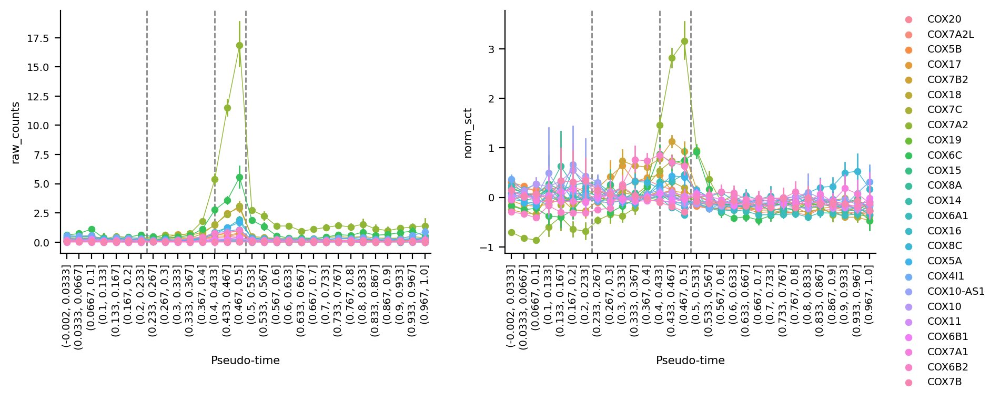

In [165]:
#all_cox = df.loc[lambda df: df.gene.str.startswith('COX')]
double_expr_plot(
['COX20',
 'COX7A2L',
 'COX5B',
 'COX17',
 'COX7B2',
 'COX18',
 'COX7C',
 'COX7A2',
 'COX19',
 'COX6C',
 'COX15',
 'COX8A',
 'COX14',
 'COX6A1',
 'COX16',
 'COX8C',
 'COX5A',
 'COX4I1',
 'COX10-AS1',
 'COX10',
 'COX11',
 'COX6B1',
 'COX7A1',
 'COX6B2',
 'COX7B',
]
)

In [104]:
_df = gi.get_genes_region_dataframe('chr1', 49000000, 52000000, assembly='hg19')
_df

,name,start,end,strand
0,AGBL4,48998525,50489626,-
1,AGBL4,48998525,50489626,-
2,AGBL4,48998525,50489626,-
3,AGBL4,48998525,50489626,-
4,AGBL4,48998525,50489626,-
5,BEND5,49193190,49242563,-
6,BEND5,49193190,49242563,-
7,BEND5,49193190,49242563,-
8,BEND5,49193190,49242563,-
9,BEND5,49193190,49242563,-


missing: ['MIR4421', 'MIR6500', 'TTC39A-AS1']
missing: ['MIR4421', 'MIR6500', 'TTC39A-AS1']


(<AxesSubplot: xlabel='Pseudo-time', ylabel='raw_counts'>,
 <AxesSubplot: xlabel='Pseudo-time', ylabel='norm_sct'>)

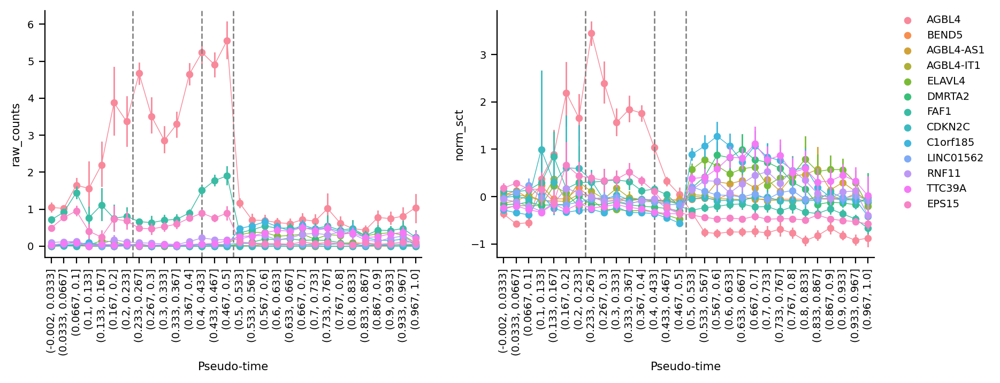

In [103]:
double_expr_plot(_df.name.unique().tolist())

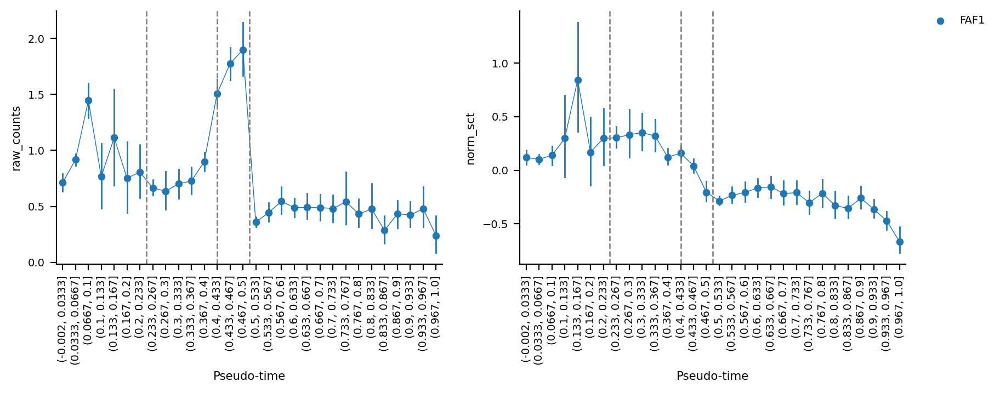

In [105]:
double_expr_plot('FAF1') ;

(<AxesSubplot: xlabel='Pseudo-time', ylabel='raw_counts'>,
 <AxesSubplot: xlabel='Pseudo-time', ylabel='norm_sct'>)

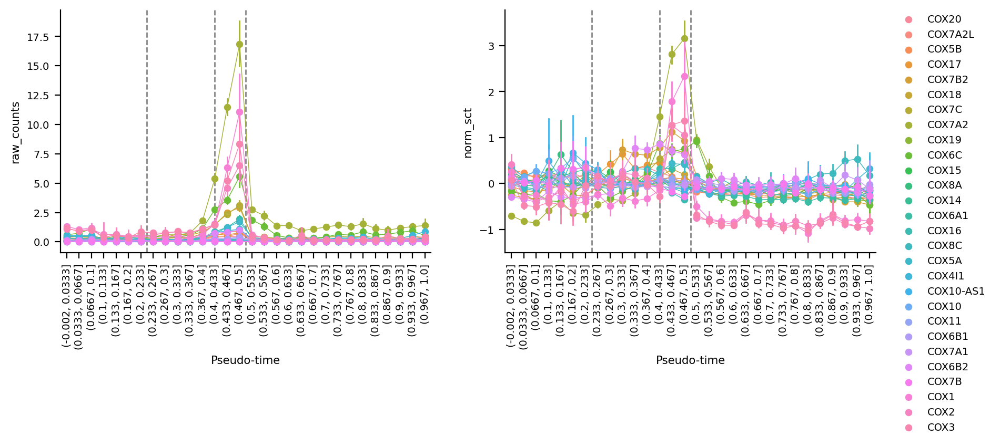

In [94]:
double_expr_plot(df.reset_index().loc[lambda df: df.gene.str.startswith('COX')].gene.tolist()) ;

# Interesting genes on X and Y

What are the pachytene genes on X?

In [ ]:
df = means_fine_df.loc[:, ['membership']] 
df['chromosome'] = adata.var.chromosome[df.index]
l = df.loc[(df.chromosome == 'X') & (df.membership.isin([49]))].index.values.tolist()
gi.gene_info(l)

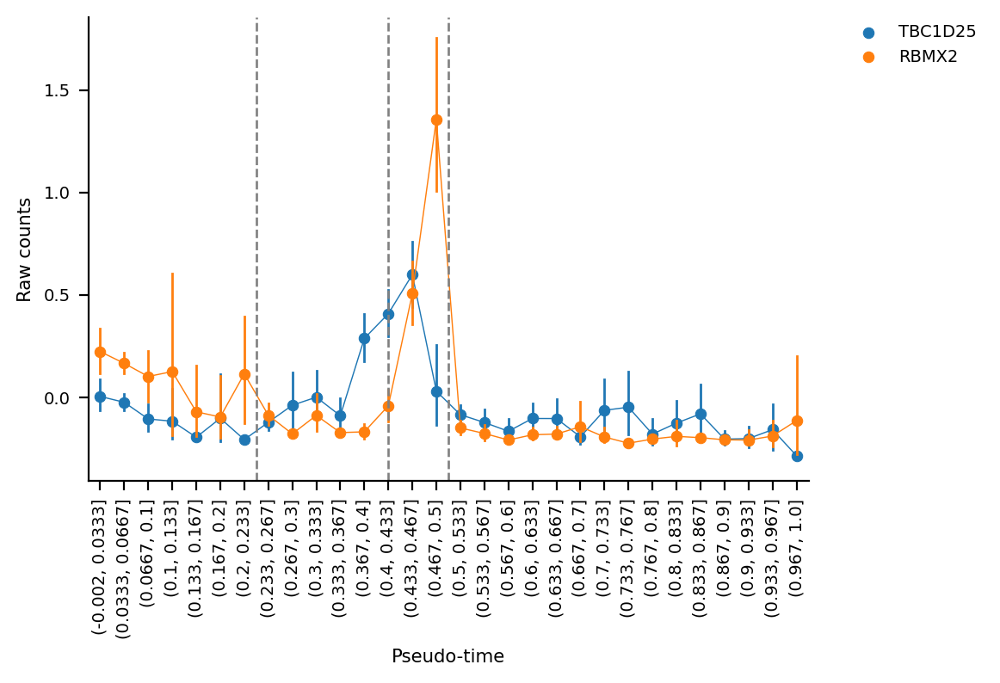

In [49]:
expr_plot(l, 'norm_sct') ;

**RBMX2**: Link to bipolar disorder: https://pubmed.ncbi.nlm.nih.gov/34914762/, and intelectual disability (gene card).

What are the strong spermatid genes on X (cluster 2):

In [50]:
l = df.loc[(df.chromosome == 'X') & (df.membership.isin([2]))].index.values.tolist()
l

['DYNLT3',
 'H2AP',
 'PPP1R2C',
 'PRICKLE3',
 'ZCCHC13',
 'UPF3B',
 'SPANXN3',
 'amplicon-chrX-SPANXA1/A2/N1/N2/N3/N4/N5/B1/C/D',
 'amplicon-chrX-CXorf51A/B',
 'amplicon-chrX-ETD1/B/ZNF75D',
 'amplicon-chrX-SPACA5/B']

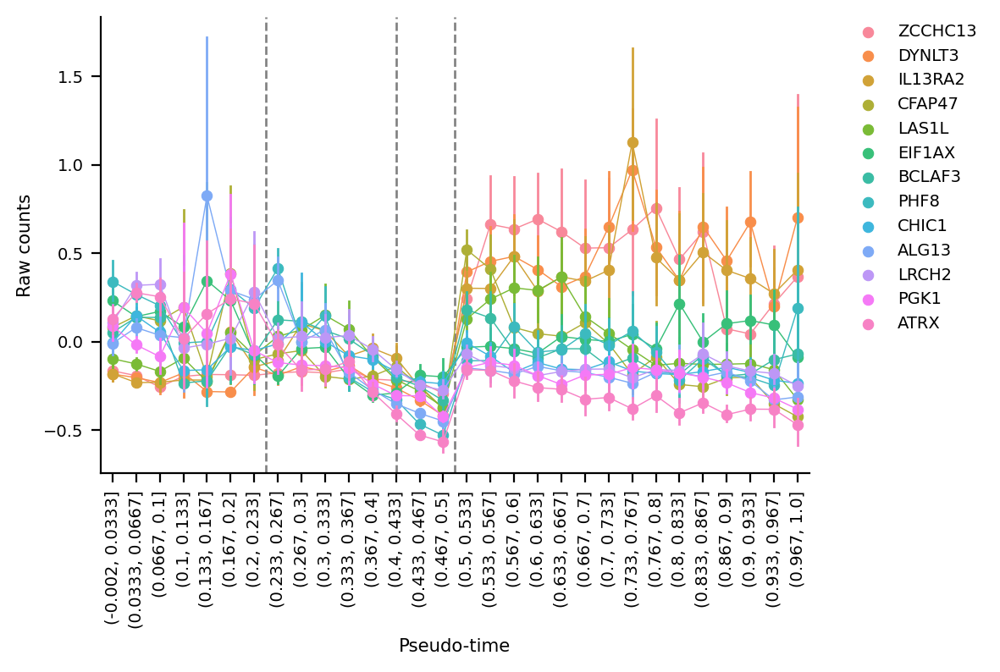

In [118]:
expr_plot(swept_meritxell_diffexp_genes.gene, 'norm_sct') ;

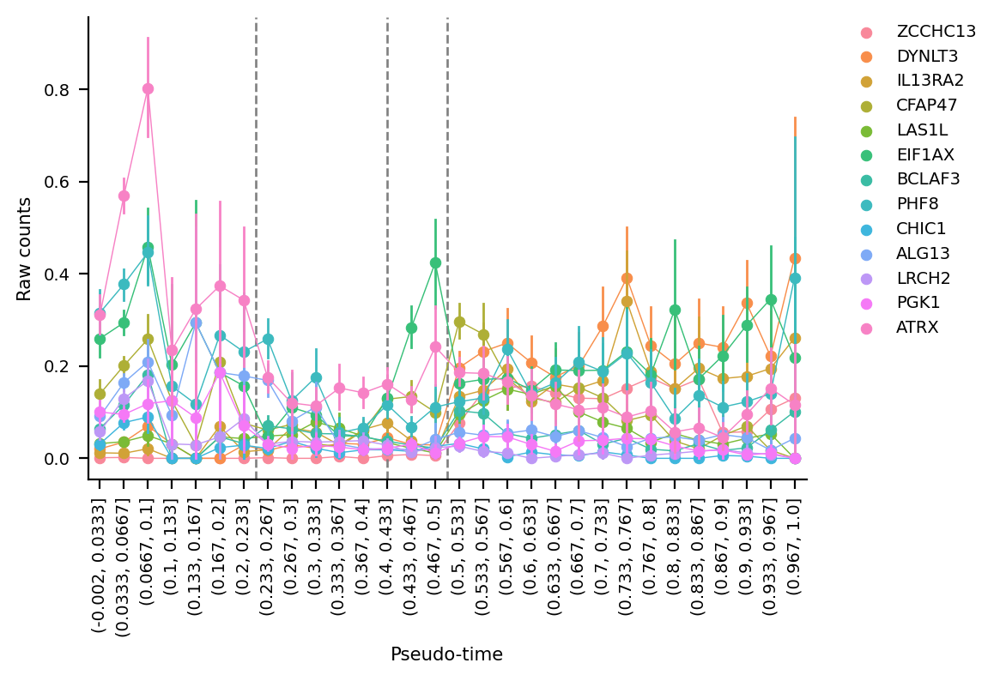

In [119]:
expr_plot(swept_meritxell_diffexp_genes.gene, 'raw_counts') ;

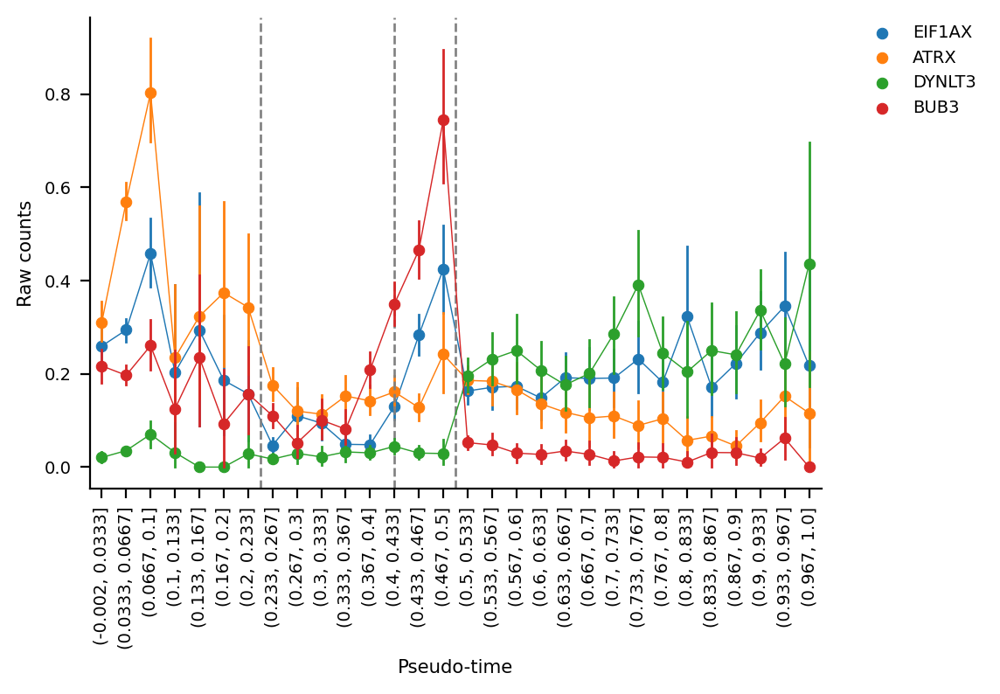

In [127]:
expr_plot(['EIF1AX', 'ATRX', 'DYNLT3', 'BUB3'], 'raw_counts') ;


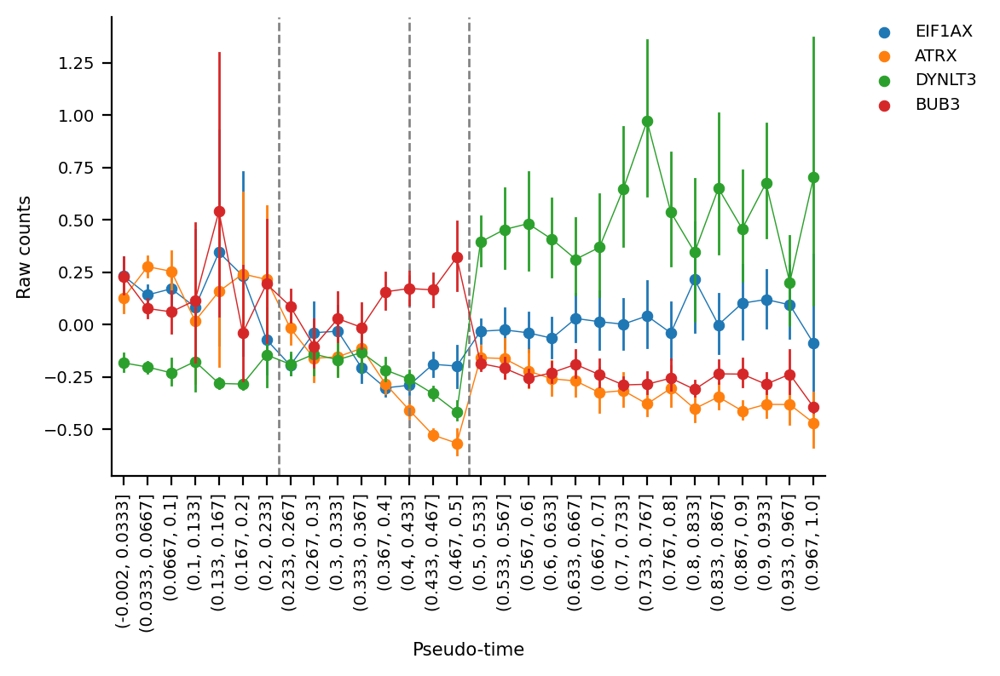

In [128]:
expr_plot(['EIF1AX', 'ATRX', 'DYNLT3', 'BUB3'], 'norm_sct') ;


What are the genes cluster 4 on Y:

In [52]:
df = means_df.loc[:, ['membership']] 
df['chromosome'] = adata.var.chromosome[df.index]
df.loc[(df.chromosome == 'Y') & (df.membership.isin([2, 4]))].index.values.tolist()

['LINC00278',
 'TGIF2LY',
 'LOC105377227',
 'TTTY1B',
 'TTTY2B',
 'TTTY8B',
 'LOC107987339',
 'LOC105377229',
 'LOC105377231',
 'TTTY11',
 'TTTY8',
 'TTTY2',
 'TTTY1',
 'DDX3Y',
 'FAM41AY1',
 'FAM41AY2',
 'LOC102725532',
 'LOC101929148',
 'amplicon-chrY-BPY2/B/C',
 'amplicon-chrY-CDY1/1B/2A/2B',
 'amplicon-chrY-HSFY1/2',
 'amplicon-chrY-PRY/2']

What are the genes cluster 1 on MT:

In [53]:
df = means_df.loc[:, ['membership']] 
df['chromosome'] = adata.var.chromosome[df.index]
df.loc[(df.chromosome == 'MT') & (df.membership == 1)].index.values.tolist()

['ND1', 'ND2', 'COX2', 'COX3', 'ND4', 'ND5']

In [54]:
#[x for x in l if x in diff_exp_genes.gene]

# Grove 2019 genes

missing: ['NKX2-2']
missing: ['LOC102723661']
missing: ['POU3F2']
missing: ['NUD12']
missing: ['MROH5']
missing: ['APOPT1']


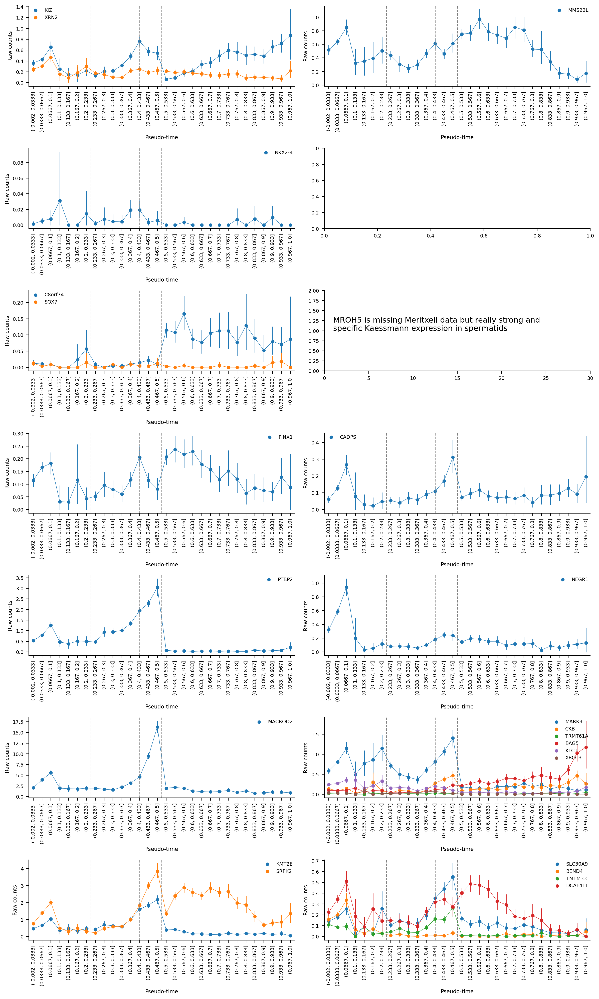

In [55]:
fig, axes = plt.subplots(7, 2, figsize=(12, 20))
expr_plot(['KIZ', 'XRN2'], 'raw_counts', ax=axes[0][0]); 
expr_plot(['NKX2-2', 'NKX2-4'], 'raw_counts', ax=axes[1][0]) 
expr_plot(['C8orf74', 'SOX7'], 'raw_counts', ax=axes[2][0])  
expr_plot(['PINX1'], 'raw_counts', ax=axes[3][0])  
expr_plot(['LOC102723661', 'PTBP2'], 'raw_counts', ax=axes[4][0]) 
expr_plot(['MACROD2'], 'raw_counts', ax=axes[5][0]) 
expr_plot(['KMT2E', 'SRPK2'], 'raw_counts', ax=axes[6][0]) 
expr_plot(['MMS22L', 'POU3F2'], 'raw_counts', ax=axes[0][1]) 
expr_plot(['NUD12'], 'raw_counts', ax=axes[1][1]) 
ax = expr_plot(['MROH5'], 'raw_counts', ax=axes[2][1])
ax.text(1, 1, "MROH5 is missing Meritxell data but really strong and\nspecific Kaessmann expression in spermatids", fontsize='x-large') ; ax.set_xlim(0, 30) ; ax.set_ylim(0, 2)
expr_plot(['CADPS'], 'raw_counts', ax=axes[3][1]) 
expr_plot(['NEGR1'], 'raw_counts', ax=axes[4][1])  
expr_plot(['MARK3', 'CKB', 'TRMT61A', 'BAG5', 'APOPT1', 'KLC1', 'XRCC3'], 'raw_counts', ax=axes[5][1])  
expr_plot(['SLC30A9', 'BEND4', 'TMEM33', 'DCAF4L1'], 'raw_counts', ax=axes[6][1])
plt.tight_layout()

### Genes with pachythene expression

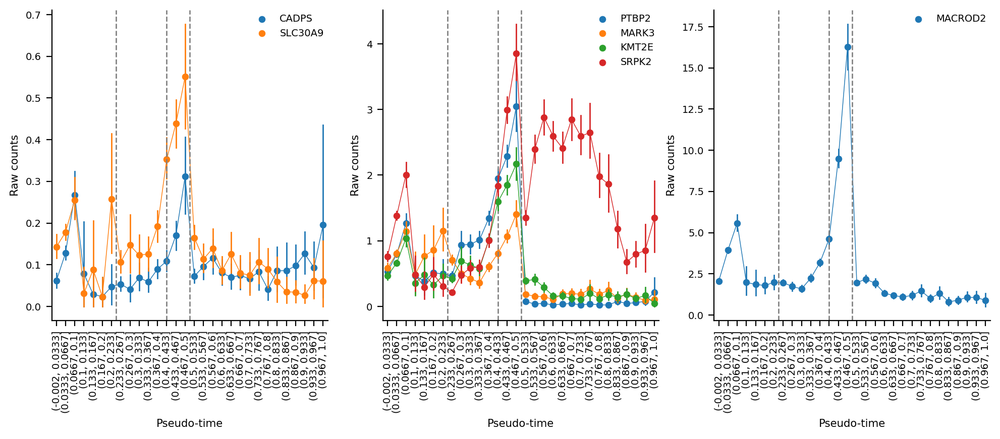

In [56]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
ax = expr_plot(['CADPS', 'SLC30A9'], 
               'raw_counts', ax=ax1)
ax = expr_plot(['PTBP2', 'MARK3', 'KMT2E', 'SRPK2'], 
               'raw_counts', ax=ax2)
ax = expr_plot(['MACROD2'], 
               'raw_counts', ax=ax3)

As an aside, OPHN1 (not a grove gene) which is also related to cerebral cortex neuron differentiation and intelectual disability, is also has a pachytene peak:

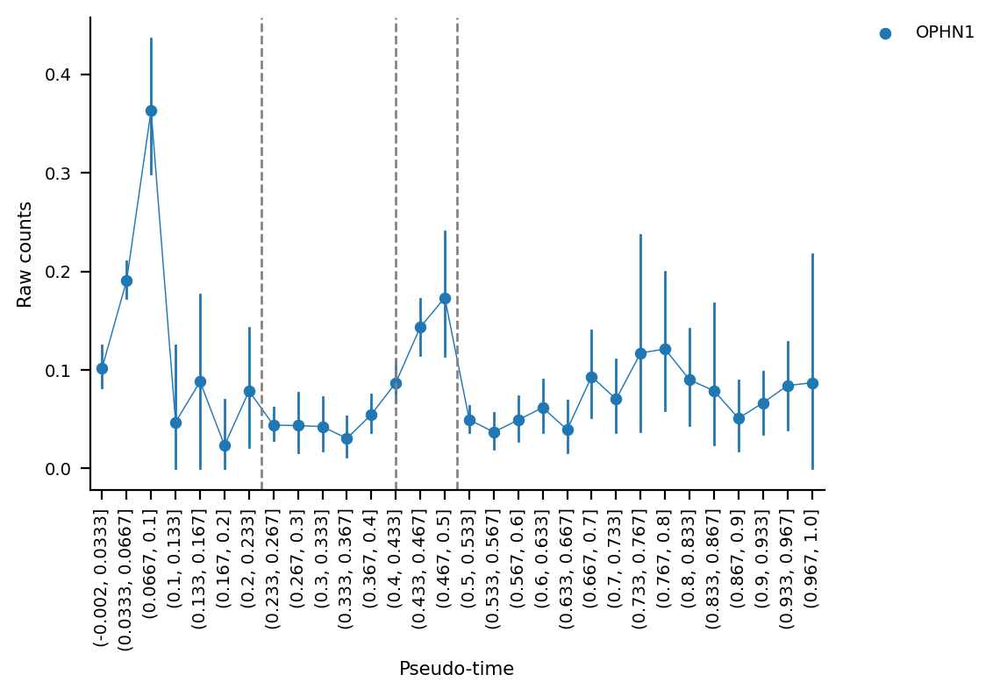

In [57]:
expr_plot('OPHN1', 'raw_counts') ;

Check if they are enriched for some GOs:

In [60]:
grove_pachytene_genes = ['CADPS', 'SLC30A9', 'PTBP2', 'MARK3', 'KMT2E', 'SRPK2', 'MACROD2']
go_results = gi.go_enrichment(grove_pachytene_genes, 
                              list_study_genes=True)
go_results

,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes


In [61]:
gi.gene_info(grove_pachytene_genes)

**Symbol:** **_CADPS_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CADPS1, CAPS, CAPS1, UNC-31  
*calcium dependent secretion activator*  
**Summary:** This gene encodes a novel neural/endocrine-specific cytosolic and peripheral membrane protein required for the Ca2+-regulated exocytosis of secretory vesicles. The protein acts at a stage in exocytosis that follows ATP-dependent priming, which involves the essential synthesis of phosphatidylinositol 4,5-bisphosphate (PtdIns(4,5)P2). Alternative splicing has been observed at this locus and three variants, encoding distinct isoforms, are described. [provided by RefSeq, Aug 2008].  
**Genomic position:** 3:62398346-62875416 (hg38), 3:62384022-62861054 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CADPS)  


 ----

**Symbol:** **_SLC30A9_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BILAPES, C4orf1, GAC63, HUEL, ZNT9  
*solute carrier family 30 member 9*  
**Summary:** Predicted to enable nuclear receptor coactivator activity. Involved in cellular zinc ion homeostasis and zinc ion transport. Located in several cellular components, including cytoplasmic vesicle; cytoskeleton; and endoplasmic reticulum. [provided by Alliance of Genome Resources, Apr 2022]  
**Genomic position:** 4:41990502-42090461 (hg38), 4:41992489-42092474 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SLC30A9)  


 ----

**Symbol:** **_PTBP2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PTBLP, brPTB, nPTB  
*polypyrimidine tract binding protein 2*  
**Summary:** The protein encoded by this gene binds to intronic polypyrimidine clusters in pre-mRNA molecules and is implicated in controlling the assembly of other splicing-regulatory proteins. This protein is very similar to the polypyrimidine tract binding protein (PTB) but most of its isoforms are expressed primarily in the brain. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Jul 2014].  
**Genomic position:** 1:96721665-96823738 (hg38), 1:97187221-97289294 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PTBP2)  


 ----

**Symbol:** **_MARK3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CTAK1, KP78, PAR1A, Par-1a, VIPB  
*microtubule affinity regulating kinase 3*  
**Summary:** The protein encoded by this gene is activated by phosphorylation and in turn is involved in the phosphorylation of tau proteins MAP2 and MAP4. Several transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Oct 2011].  
**Genomic position:** 14:103385377-103503831 (hg38), 14:103851729-103970168 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MARK3)  


 ----

**Symbol:** **_KMT2E_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HDCMC04P, MLL5, NKp44L, ODLURO, SETD5B  
*lysine methyltransferase 2E (inactive)*  
**Summary:** This gene is a member of the myeloid/lymphoid or mixed-lineage leukemia (MLL) family and encodes a protein with an N-terminal PHD zinc finger and a central SET domain. Overexpression of the protein inhibits cell cycle progression. Alternate transcriptional splice variants have been characterized. [provided by RefSeq, Jul 2008].  
**Genomic position:** 7:104940943-105115019 (hg38), 7:104654626-104754808 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=KMT2E)  


 ----

**Symbol:** **_SRPK2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** SFRSK2  
*SRSF protein kinase 2*  
**Summary:** Enables ATP binding activity; magnesium ion binding activity; and protein serine/threonine kinase activity. Involved in several processes, including nucleic acid metabolic process; peptidyl-serine phosphorylation; and regulation of viral genome replication. Located in chromatin; cytosol; and nuclear lumen. [provided by Alliance of Genome Resources, Apr 2022]  
**Genomic position:** 7:105110704-105399308 (hg38), 7:104751151-105039755 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SRPK2)  


 ----

**Symbol:** **_MACROD2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** C20orf133, C2orf133  
*mono-ADP ribosylhydrolase 2*  
**Summary:** The protein encoded by this gene is a deacetylase involved in removing ADP-ribose from mono-ADP-ribosylated proteins. The encoded protein has been shown to translocate from the nucleus to the cytoplasm upon DNA damage. [provided by RefSeq, May 2017].  
**Genomic position:** 20:13995369-16053197 (hg38), 20:13976015-16033842 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MACROD2)  


 ----

GO enrichment using only terms associated with brain:

In [62]:
regex = 'brain'
term_subset = gi.get_terms_for_go_regex(regex)
print("nr terms:", len(term_subset))
go_genes = gi.get_genes_for_go_regex(regex)
print("nr genes:", len(go_genes))

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-09-19) 46,823 Terms; optional_attrs(comment def relationship synonym xref)
nr terms: 163
geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-09-19) 46,823 Terms; optional_attrs(comment def relationship synonym xref)
geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-09-19) 46,823 Terms; optional_attrs(comment def relationship synonym xref)
nr genes: 1168


In [63]:
go_results = gi.go_enrichment(grove_pachytene_genes, 
                              terms=term_subset,
                              list_study_genes=True)
go_results

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-09-19) 46,823 Terms; optional_attrs(def relationship)


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes


Overlap to genes with brain terms:

In [64]:
[x for x in grove_pachytene_genes if x in go_genes]

[]

Graph for GO terms associated with grove pachytene genes:

In [65]:
go_terms_for_grove_pachytene = gi.get_go_terms_for_genes(grove_pachytene_genes)
print(len(go_terms_for_grove_pachytene))
gi.show_go_dag_for_terms(go_terms_for_grove_pachytene)

104


### Genes with spermatid expression

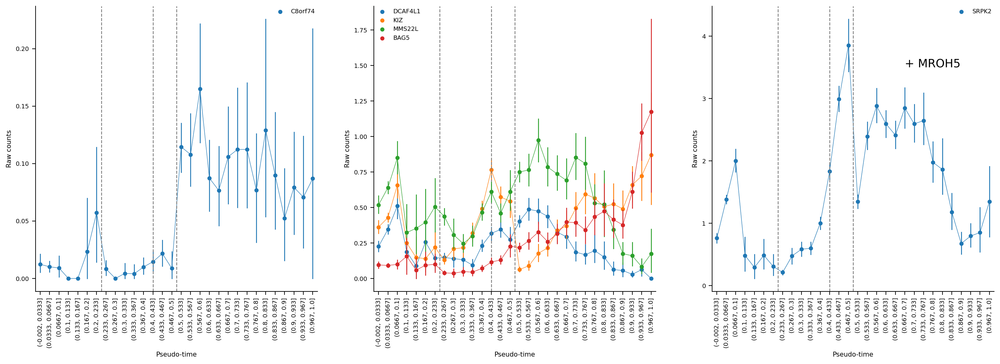

In [66]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))
ax = expr_plot(['C8orf74'], 
               'raw_counts', ax=ax1)
ax = expr_plot(['DCAF4L1', 'KIZ', 'MMS22L', 'BAG5'], 
               'raw_counts', ax=ax2)
ax = expr_plot(['SRPK2'], 
               'raw_counts', ax=ax3)
ax.text(20, 3.5, "+ MROH5", fontsize='xx-large') ;

## 

In [67]:
# df = adata.to_df(layer='raw_counts')
# df['clst'] = adata.obs.clst_groups
# df.set_index('clst', inplace=True)
# df.columns.name = 'gene'
# df.loc[:, genes].stack().to_frame('exp').reset_index()

In [68]:
genes = ['CFAP47', 'AKAP4', 'DYNLT3', 'MAPT']

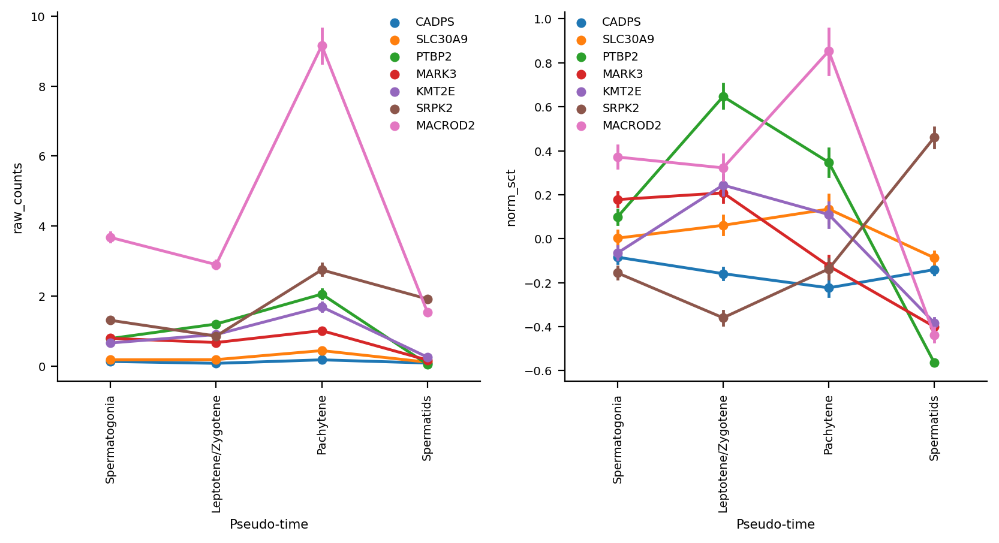

In [69]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
cat_plot(grove_pachytene_genes, 'raw_counts', ax=ax1)
cat_plot(grove_pachytene_genes, 'norm_sct', ax=ax2) ;

In [70]:
# sfari_genes = pd.read_csv('SFARI-Gene_genes_05-05-2022release_06-27-2022export.csv')
# sfari_genes.loc[sfari_genes.chromosome == 'X', 'gene-symbol'].to_list()

# Diff exp genes

In [71]:
diff_exp_genes = pd.read_csv('DEG_XY_spermatids_filtered_pval1_fc2.tsv', 
                             sep='\t', names=['gene', 'pval', 'logfold', '??'])
diff_exp_genes.head()

,gene,pval,logfold,??
0,UPF3B,2.427199e-210,3.967164,6.593486e-206
1,PPP1R2C,2.855867e-192,6.440151,3.878981e-188
2,amplicon-chrY-HSFY1/2,4.005483e-136,-5.372412,3.626965e-132
3,LINC00278,6.555618e-131,-7.146839,4.452084e-127
4,FAM230C,3.452027e-122,-6.145343,1.875486e-118


In [72]:
gene_has_data = means_df.index.isin(diff_exp_genes.gene)

prediction = kmeans.predict(means_df.loc[gene_has_data, clusters].values)

df = means_df.reset_index()
prediction_df = pd.DataFrame(dict(gene=df.loc[gene_has_data, 'gene'], membership=prediction))
prediction_df.head()

diff_exp_genes_with_pred = diff_exp_genes.merge(prediction_df, on='gene')

In [73]:
plot_df = means_df.loc[gene_has_data].melt(id_vars=['membership']).groupby('membership').variable.count().reset_index()
plot_df['membership'] = plot_df.membership.astype("category")
plot_df['membership'] = plot_df['membership'].cat.set_categories(membership_labels)

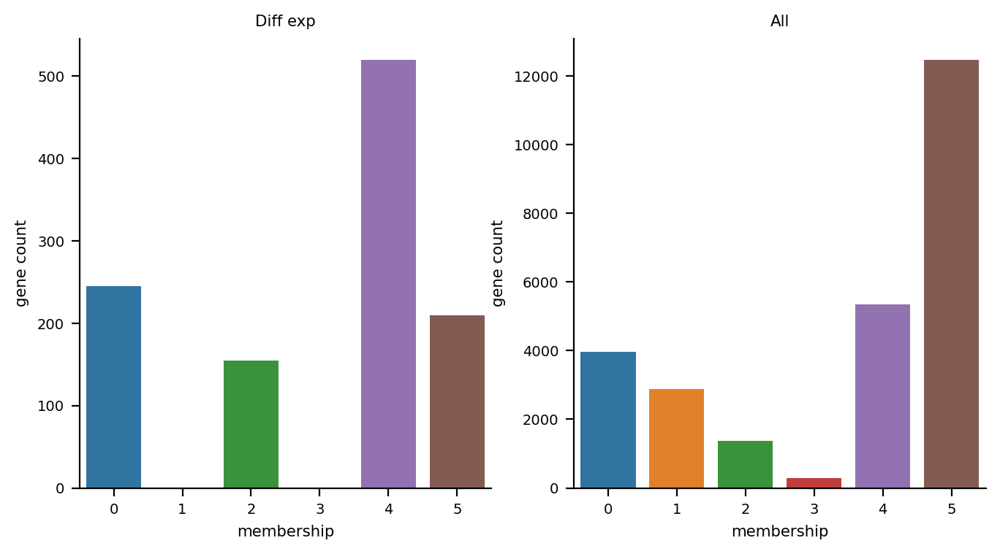

In [74]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax = sns.barplot(x="membership", y="variable", data=plot_df, order=membership_labels, ax=ax1)
ax.set_ylabel('gene count')
ax.set_title('Diff exp')
sns.despine()

ax = sns.barplot(x="membership", y="counts", data=all_genes_bar_plot_df, ax=ax2)
ax.set_ylabel('gene count')
ax.set_title('All')
sns.despine()

In [75]:
hexcolors = sns.color_palette().as_hex()
def _color_red_or_green(val):
    color = hexcolors[val]
    return 'background: %s' % color

diff_exp_genes_with_pred.style.applymap(_color_red_or_green, subset=['membership'])

,gene,pval,logfold,??,membership
0,UPF3B,0.000000,3.967164,0.000000,2
1,PPP1R2C,0.000000,6.440151,0.000000,2
2,amplicon-chrY-HSFY1/2,0.000000,-5.372412,0.000000,2
3,LINC00278,0.000000,-7.146839,0.000000,4
4,FAM230C,0.000000,-6.145343,0.000000,2
5,amplicon-chrX-SPANXA1/A2/N1/N2/N3/N4/N5/B1/C/D,0.000000,3.108779,0.000000,2
6,SYTL5,0.000000,3.720013,0.000000,4
7,PRICKLE3,0.000000,2.495548,0.000000,2
8,DIAPH2,0.000000,2.092402,0.000000,0
9,H2AP,0.000000,3.763709,0.000000,2


## CodeML signif genes

In [139]:
codeml_tessa.pval.max()

85.38678

In [138]:
codeml_tessa.loc[codeml_tessa.name == 'DYNLT3']

,name,alt_model,LR,pval
220,DYNLT3,2,2.898004e-10,9.05276
221,DYNLT3,8,4.865752e-11,8.50747
726,DYNLT3,2,2.898004e-10,9.05276
727,DYNLT3,8,4.865752e-11,8.50747


In [131]:
codeml_tessa.loc[codeml_tessa.name == 'BUB3']

,name,alt_model,LR,pval


In [77]:
genes_with_expr_data = codeml_tessa.loc[codeml_tessa.name.isin(means_df.index)].name

In [78]:
plot_df = means_df.loc[genes_with_expr_data].groupby('membership').membership.count().to_frame('counts').reset_index()

In [79]:
# plot_df = means_df.loc[genes_with_expr_data].melt(id_vars=['membership'])
# plot_df.head()

In [80]:
# plot_df['membership'] = plot_df.membership.astype("category")
# plot_df['membership'].cat.set_categories(membership_labels)
# cluster_members = plot_df.groupby('membership').variable.count().reset_index()

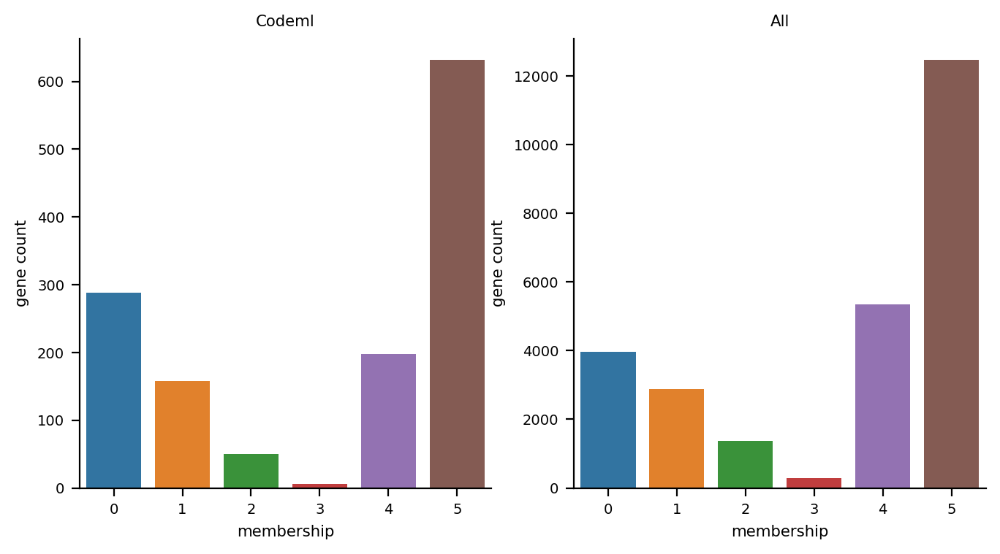

In [81]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

ax = sns.barplot(x="membership", y="counts", data=plot_df, order=membership_labels, ax=ax1)
ax.set_ylabel('gene count')
ax.set_title('Codeml')
sns.despine()

ax = sns.barplot(x="membership", y="counts", data=all_genes_bar_plot_df, ax=ax2)
ax.set_ylabel('gene count')
ax.set_title('All')
sns.despine()

#  Hand-picked contenders in swept regions on X

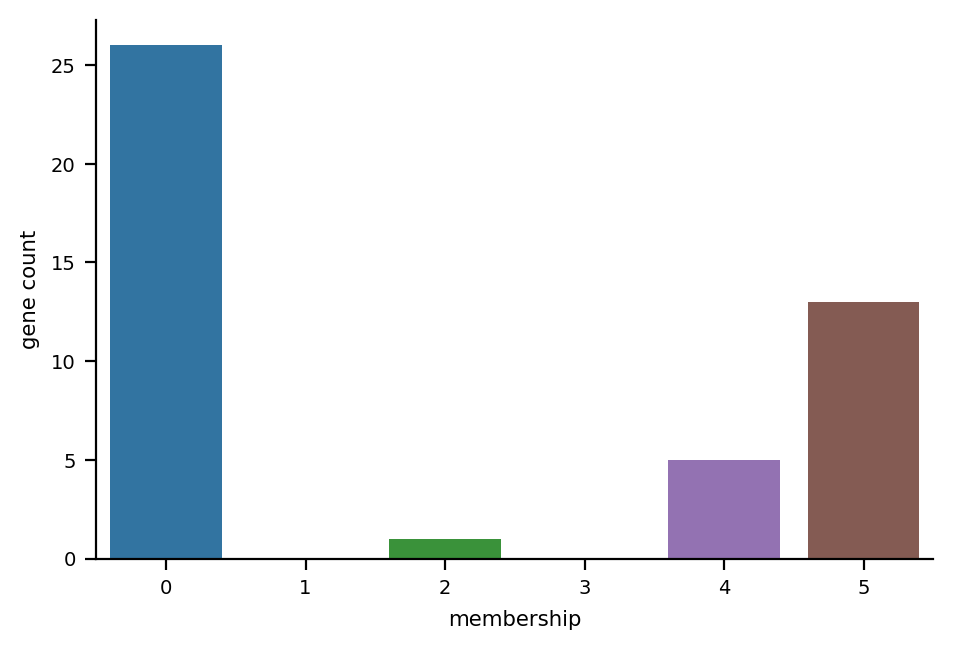

In [82]:
candidate_genes = pd.read_hdf('candidate_genes.hdf')
genes = candidate_genes.loc[candidate_genes.name.isin(means_df.index)].name

plot_df = means_df.loc[genes].groupby('membership').membership.count().to_frame('counts').reset_index()

ax = sns.barplot(x="membership", y="counts", data=plot_df, order=membership_labels)
ax.set_ylabel('gene count')
sns.despine()

# Genes on X that turn on in spermatids

In [98]:
df = (means_df
      .loc[x_genes]
      .loc[lambda df: df.membership.isin([2, 4])]
      .reset_index()
      .sort_values(by='gene')
     )
print(df.index.size)

def _color_membership(val):
    return f'background: {hexcolors[val]}'

def _color_candidates(val):
    # print(val, val in candidate_genes.name)
    if val in candidate_genes.name.to_list():
        color = "#FFC0CB50"
    else:
        color = 'none'
    return f'background: {color}'

with pd.option_context("display.max_rows", 1000):
    display(df.style.applymap(_color_membership, subset=['membership']).applymap(_color_candidates, subset=['gene']))

NameError: name 'x_genes' is not defined

In [ ]:
df = (means_df
      .loc[~means_df.index.isin(x_genes)]
      .loc[lambda df: df.membership.isin([2, 4])]
      .reset_index()
      .sort_values(by='gene')
     )
print(df.index.size)

# Genes on X with pachytene peak

In [ ]:
df = (means_df
      .loc[x_genes]
      .loc[lambda df: df.membership.isin([1, 3])]
      .reset_index()
      .sort_values(by='gene')
     )
print(df.index.size)
def _color_membership(val):
    return f'background: {hexcolors[val]}'

def _color_candidates(val):
    # print(val, val in candidate_genes.name)
    if val in candidate_genes.name.to_list():
        color = "#FFC0CB50"
    else:
        color = 'none'
    return f'background: {color}'

with pd.option_context("display.max_rows", 1000):
    display(df.style.applymap(_color_membership, subset=['membership']).applymap(_color_candidates, subset=['gene']))

In [ ]:
expr_plot(df.gene, 'raw_counts') ;

In [ ]:
gi.gene_info(df.gene)

# Non-X genes on X with pachytene peak

In [407]:
df = (means_df
      .loc[~means_df.index.isin(x_genes)]
      .loc[lambda df: df.membership.isin([1, 3])]
      .reset_index()
      .sort_values(by='gene')
     )
print(df.index.size)

6624


In [ ]:
2 / 3156 * 100, 150/3000 * 100

# See if non-X genes are enriched for brain stuff...

In [409]:
df.gene

4168                          A2ML1
26                          AADACL3
4011                          AAMDC
4065                       AASDHPPT
5184                           ABAT
                   ...             
6591        amplicon-chrX-TCP11X1/2
6619         amplicon-chrY-BPY2/B/C
6620    amplicon-chrY-CDY1/1B/2A/2B
6621          amplicon-chrY-HSFY1/2
6622            amplicon-chrY-PRY/2
Name: gene, Length: 6624, dtype: object

In [410]:
symbol2ncbi_file = f'geneinfo_cache/{9606}_symbol2ncbi.h5'
symbol2ncbi = pd.read_hdf(symbol2ncbi_file, 'ncbi2symbol')
protein_coding = symbol2ncbi.tolist()

In [97]:
import importlib
import geneinfo
importlib.reload(geneinfo)

print(df.gene.index.size)
go_results = gi.go_enrichment(df.gene.loc[df.gene.isin(protein_coding)], list_study_genes=True)
go_results

26325


NameError: name 'protein_coding' is not defined

In [412]:
go_results.term_id == 'GO:0007339'

0     False
1     False
2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
Name: term_id, dtype: bool

In [417]:
gi.go_info(go_results.term_id)

**<span style="color:gray;">GO:0003723:</span>** **RNA binding**  
 Binding to an RNA molecule or a portion thereof.    

 ----

**<span style="color:gray;">GO:0000137:</span>** **Golgi cis cisterna**  
 The Golgi cisterna closest to the endoplasmic reticulum; the first processing compartment through which proteins pass after export from the ER.    

 ----

**<span style="color:gray;">GO:0007342:</span>** **fusion of sperm to egg plasma membrane involved in single fertilization**  
 The binding and fusion of a sperm, with the plasma membrane of the oocyte as part of the process of single fertilization. In sperm with flagella, binding occurs at the posterior (post-acrosomal) region of the sperm head.    

 ----

**<span style="color:gray;">GO:0004984:</span>** **olfactory receptor activity**  
 Combining with an odorant and transmitting the signal from one side of the membrane to the other to initiate a change in cell activity in response to detection of smell.    

 ----

**<span style="color:gray;">GO:0050911:</span>** **detection of chemical stimulus involved in sensory perception of smell**  
 The series of events involved in the perception of smell in which an olfactory chemical stimulus is received and converted into a molecular signal.    

 ----

**<span style="color:gray;">GO:0007283:</span>** **spermatogenesis**  
 The developmental process by which male germ line stem cells self renew or give rise to successive cell types resulting in the development of a spermatozoa.    

 ----

**<span style="color:gray;">GO:0003735:</span>** **structural constituent of ribosome**  
 The action of a molecule that contributes to the structural integrity of the ribosome.    

 ----

**<span style="color:gray;">GO:0006607:</span>** **NLS-bearing protein import into nucleus**  
 The directed movement of a protein bearing a nuclear localization signal (NLS) from the cytoplasm into the nucleus, across the nuclear envelope.    

 ----

**<span style="color:gray;">GO:0004930:</span>** **G protein-coupled receptor activity**  
 Combining with an extracellular signal and transmitting the signal across the membrane by activating an associated G-protein; promotes the exchange of GDP for GTP on the alpha subunit of a heterotrimeric G-protein complex.    

 ----

**<span style="color:gray;">GO:0036126:</span>** **sperm flagellum**  
 A microtubule-based flagellum (or cilium) that is part of a sperm, a mature male germ cell that develops from a spermatid.    

 ----

**<span style="color:gray;">GO:0001669:</span>** **acrosomal vesicle**  
 A structure in the head of a spermatozoon that contains acid hydrolases, and is concerned with the breakdown of the outer membrane of the ovum during fertilization. It lies just beneath the plasma membrane and is derived from the lysosome.    

 ----

**<span style="color:gray;">GO:0045095:</span>** **keratin filament**  
 A filament composed of acidic and basic keratins (types I and II), typically expressed in epithelial cells. The keratins are the most diverse classes of IF proteins, with a large number of keratin isoforms being expressed. Each type of epithelium always expresses a characteristic combination of type I and type II keratins.    

 ----

**<span style="color:gray;">GO:0006412:</span>** **translation**  
 The cellular metabolic process in which a protein is formed, using the sequence of a mature mRNA or circRNA molecule to specify the sequence of amino acids in a polypeptide chain. Translation is mediated by the ribosome, and begins with the formation of a ternary complex between aminoacylated initiator methionine tRNA, GTP, and initiation factor 2, which subsequently associates with the small subunit of the ribosome and an mRNA or circRNA. Translation ends with the release of a polypeptide chain from the ribosome.    

 ----

**<span style="color:gray;">GO:0030317:</span>** **flagellated sperm motility**  
 The directed, self-propelled movement of a cilium (aka flagellum) that contributes to the movement of a flagellated sperm.    

 ----

**<span style="color:gray;">GO:0005801:</span>** **cis-Golgi network**  
 The network of interconnected tubular and cisternal structures located at the convex side of the Golgi apparatus, which abuts the endoplasmic reticulum.    

 ----

**<span style="color:gray;">GO:0005654:</span>** **nucleoplasm**  
 That part of the nuclear content other than the chromosomes or the nucleolus.    

 ----

**<span style="color:gray;">GO:0000049:</span>** **tRNA binding**  
 Binding to a transfer RNA.    

 ----

**<span style="color:gray;">GO:0005743:</span>** **mitochondrial inner membrane**  
 The inner, i.e. lumen-facing, lipid bilayer of the mitochondrial envelope. It is highly folded to form cristae.    

 ----

**<span style="color:gray;">GO:0097224:</span>** **sperm connecting piece**  
 The segment of the sperm flagellum that attaches to the implantation fossa of the nucleus in the sperm head; from the remnant of the centriole at this point, the axoneme extends throughout the length of the flagellum.    

 ----

**<span style="color:gray;">GO:0005856:</span>** **cytoskeleton**  
 A cellular structure that forms the internal framework of eukaryotic and prokaryotic cells. The cytoskeleton includes intermediate filaments, microfilaments, microtubules, the microtrabecular lattice, and other structures characterized by a polymeric filamentous nature and long-range order within the cell. The various elements of the cytoskeleton not only serve in the maintenance of cellular shape but also have roles in other cellular functions, including cellular movement, cell division, endocytosis, and movement of organelles.    

 ----

In [414]:
go_results.loc[go_results.term_id == 'GO:0034587'].study_genes

Series([], Name: study_genes, dtype: object)

In [86]:
gi.gene_info(go_results.loc[go_results.term_id == 'GO:0034587'].study_genes)

HTTPError: 400 Client Error: search_phase_execution_exception for url: https://mygene.info/v3/query?q=Series(%5B%5D,%20Name:%20study_genes,%20dtype:%20object)&scopes=hgnc&species=human&fields=symbol,alias,name,type_of_gene,summary,genomic_pos,genomic_pos_hg19

In [85]:
ax = expr_plot(go_results.iloc[0].study_genes, 'raw_counts') ;
h,l = ax.axes.get_legend_handles_labels()
ax.legend_.remove()
ax.legend(h,l, ncol=4, bbox_to_anchor=(1.1, 1.05), frameon=False)
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1), frameon=False)

IndexError: single positional indexer is out-of-bounds

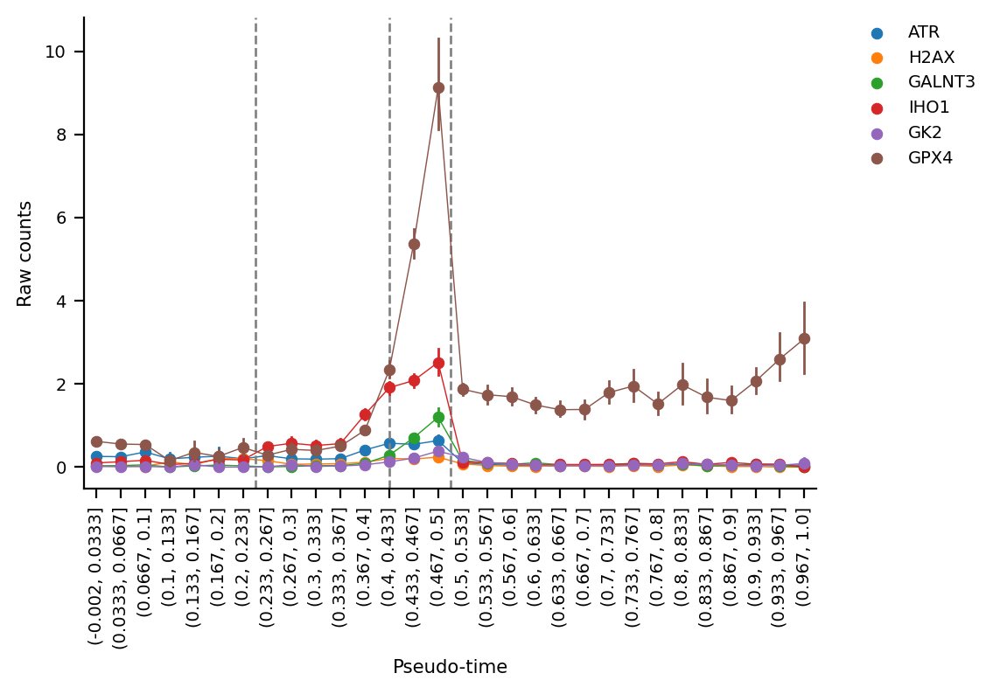

In [87]:
ax = expr_plot(['ATR', 'H2AX', 'GALNT3', 'IHO1', 'GK2', 'GPX4'], 'raw_counts') ;

In [88]:
gi.gene_info('GPX4')

**Symbol:** **_GPX4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** GPx-4, GSHPx-4, MCSP, PHGPx, SMDS, snGPx, snPHGPx  
*glutathione peroxidase 4*  
**Summary:** The protein encoded by this gene belongs to the glutathione peroxidase family, members of which catalyze the reduction of hydrogen peroxide, organic hydroperoxides and lipid hydroperoxides, and thereby protect cells against oxidative damage. Several isozymes of this gene family exist in vertebrates, which vary in cellular location and substrate specificity. This isozyme has a high preference for lipid hydroperoxides and protects cells against membrane lipid peroxidation and cell death. It is also required for normal sperm development; thus, it has been identified as a 'moonlighting' protein because of its ability to serve dual functions as a peroxidase, as well as a structural protein in mature spermatozoa. Mutations in this gene are associated with Sedaghatian type of spondylometaphyseal dysplasia (SMDS). This isozyme is also a selenoprotein, containing the rare amino acid selenocysteine (Sec) at its active site. Sec is encoded by the UGA codon, which normally signals translation termination. The 3' UTRs of selenoprotein mRNAs contain a conserved stem-loop structure, designated the Sec insertion sequence (SECIS) element, that is necessary for the recognition of UGA as a Sec codon, rather than as a stop signal. Transcript variants resulting from alternative splicing or use of alternate promoters have been described to encode isoforms with different subcellular localization. [provided by RefSeq, Dec 2018].  
**Genomic position:** 19:1103994-1106791 (hg38), 19:1103936-1106787 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=GPX4)  


 ----

In [89]:
means_df.loc[means_df.index.intersection(grove_2019)]

,Spermatogonia,Leptotene/Zygotene,Pachytene,Spermatids,membership,chromosome
gene,,,,,,
NEGR1,0.364887,-0.316432,-0.417365,-0.261411,0,1
PTBP2,0.098892,0.646635,0.347283,-0.564428,1,1
CADPS,-0.084280,-0.159095,-0.223662,-0.140778,5,3
TMEM33,0.084526,0.059220,0.115882,-0.182028,5,4
DCAF4L1,0.092088,-0.079432,-0.241461,0.171046,4,4
SLC30A9,0.002509,0.060817,0.134585,-0.087148,5,4
BEND4,0.505065,-0.177027,-0.275587,-0.198098,0,4
MMS22L,0.078082,0.013795,-0.425590,0.252423,4,6
KMT2E,-0.065056,0.243786,0.109878,-0.382531,5,7


In [90]:
all_genes = set()
for gene_set in go_results.study_genes:
    all_genes.update(gene_set)
print(len(all_genes))

0


In [91]:
'PTBP2' in all_genes

False

In [92]:
set(all_genes).intersection(set(grove_2019))

set()

In [93]:
set(all_genes).intersection(set(sfari_genes))

set()

In [94]:
set(all_genes).intersection(set(codeml_tessa))

set()

In [95]:
gi.show_go_dag_for_terms(go_results.term_id)

In [96]:
gi.go_info(go_results.term_id)

# Hmm... 

Only 0.06% of pathytene peak genes are on X although the X is 5% of genome.... And both associated with intelectual disability...

In [ ]:
gi.gene_info('DYNLT3')

In [ ]:
cat_plot(df.gene, 'raw_counts') ;

In [ ]:
#gi.geneinfo(df.gene.to_list())

# Genes in chr3 region

In [ ]:
# %env ftp_proxy http://proxyserv:3128
# %env http_proxy http://proxyserv:3128
# %env https_proxy http://proxyserv:3128

In [ ]:
chr3region_genes = adata.var.loc[adata.var.chromosome == '3', 'gene_ids']
chr3region_genes = chr3region_genes[~chr3region_genes.isnull()]

chr3region_genes = pd.Series([record[0] for record in gi.get_genes_region('chr3', 47000000, 53000000, assembly='hg38')])
chr3region_genes = chr3region_genes.loc[chr3region_genes.isin(means_df.index)]

In [ ]:
df = (means_df
      .loc[chr3region_genes.unique()]
      .loc[lambda df: df.membership.isin([1, 3])]
      .reset_index()
      .sort_values(by='gene')
     )
with pd.option_context("display.max_rows", 1000):
    display(df)

In [ ]:
cat_plot(df.gene, 'raw_counts') ;

In [ ]:
cat_plot(['NDUFAF3'], 'raw_counts') ;

In [ ]:
df = (means_df
      .loc[chr3region_genes]
      .loc[lambda df: df.membership.isin([9, 1])]
      .reset_index()
      .sort_values(by='gene')
     )
with pd.option_context("display.max_rows", 1000):
    display(df)

In [ ]:
cat_plot(df.gene, 'raw_counts')

In [ ]:
df = (means_df
      .loc[lambda df: df.membership.isin([1, 9])]
      .reset_index()
      .sort_values(by='gene')
     )

def _color_membership(val):
    return f'background: {hexcolors[val]}'

def _color_candidates(val):
    # print(val, val in candidate_genes.name)
    if val in candidate_genes.name.to_list():
        color = "#FFC0CB50"
    else:
        color = 'none'
    return f'background: {color}'


with pd.option_context("display.max_rows", 1000):
    display(df.style.applymap(_color_membership, subset=['membership']).applymap(_color_candidates, subset=['gene']))
   